# The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
1. Apply a distortion correction to raw images.
1. Use color transforms, gradients, etc., to create a thresholded binary image.
1. Apply a perspective transform to rectify binary image ("birds-eye view").
1. Detect lane pixels and fit to find the lane boundary.
1. Determine the curvature of the lane and vehicle position with respect to center.
1. Warp the detected lane boundaries back onto the original image.
1. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import sys
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [34]:


#load calibration image
files=[]
images = glob.glob('camera_cal/calibration*.jpg')

# Find the chessboard corners (width_num and height_num) is glid numbers which are excluded outermost
width_num = 8
height_num = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((height_num*width_num,3), np.float32)
# z value is always zero
objp[:,:2] = np.mgrid[0:width_num, 0:height_num].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

for idx,file_name in enumerate(images):
    img= cv2.imread(file_name)
    if idx == 0:
        img_size = (img.shape[1] ,img.shape[0])
    #endif
    #for prepareing to find checker-board corner
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)    
    #first output is boolian.True means specified patern is detected.and second output is value of detected point
    ret, corners = cv2.findChessboardCorners(gray, (width_num,height_num), None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
    #endif
#endfor

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "./camera_cal/pickle.p", "wb" ) )
print("finish")

finish


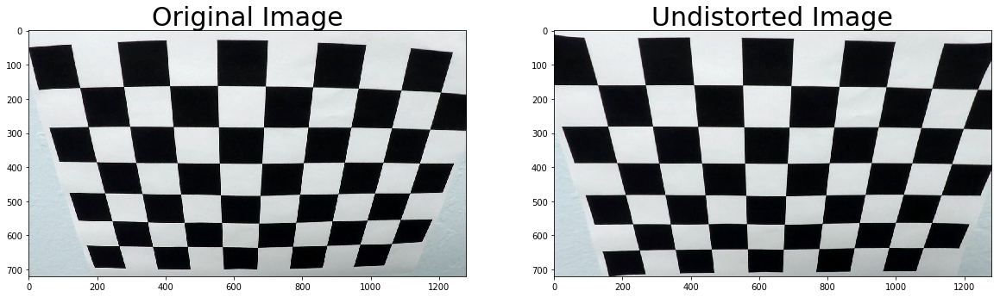

In [35]:
#result of undistorted image
img = cv2.imread('./camera_cal/calibration2.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('./camera_cal/calibration2_undist.jpg',dst)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
f.savefig("undistort.png")

## 2. Apply a distortion correction to raw images.

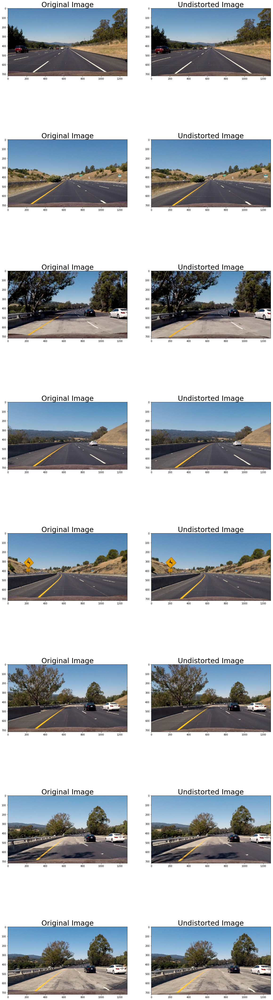

In [36]:
# load the data of calibration
dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
mtx, dist = dist_pickle["mtx"], dist_pickle["dist"]

# load test image path
images = glob.glob('./test_images/straight_lines*.jpg') + glob.glob('./test_images/test*.jpg')
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
for i, fname in enumerate(images):
    # original image
    img = mpimg.imread(fname)
    
    # undistort the test image
    undist_img = cv2.undistort(img, mtx, dist, None, mtx)
    # hold undistort image
    if i == 0:
        undist_images = np.reshape(undist_img,(1,undist_img.shape[0],undist_img.shape[1],undist_img.shape[2]))
    else:
        undist_images = np.concatenate([undist_images,np.reshape(undist_img,(1,undist_img.shape[0],undist_img.shape[1],undist_img.shape[2]))],axis=0)
    #endif
    
    # plot
    
    axes[i][0].imshow(img)
    axes[i][0].set_title('Original Image', fontsize=30)
    axes[i][1].imshow(undist_img)
    axes[i][1].set_title('Undistorted Image', fontsize=30)
#endfor

f.savefig("undistort_series.png")

## 3.Use color transforms, gradients, etc., to create a thresholded binary image.

In [2]:
def mag_thresh(img, sobel_kernel=15, mag_thresh=(30, 100)):
    
    # Apply the following steps to img
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_thresh(img, sobel_kernel=15, thresh=(0.8,1.2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def mag_and_dir_thresh(img, sobel_kernel=15, mag_th=(30,100), dir_th=(0.8,1.2)):
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    #Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    #Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Take the absolute value of the gradient direction,
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(absgraddir >= dir_th[0]) & (absgraddir <= dir_th[1]) & (gradmag >= mag_th[0]) & (gradmag <= mag_th[1])] = 1
    return binary_output

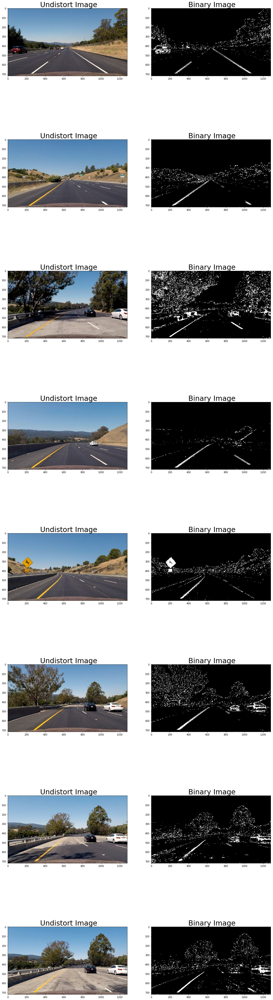

In [37]:
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
for i in range(undist_images.shape[0]):
    undist = np.reshape(undist_images[i,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
    # gradient threshold
    mag_and_dir_binary = mag_and_dir_thresh(undist)
    # color threshold
    # Convert to HLS color space and separate the V channel
    s_thresh = (170, 255)
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
    # conbine gradient and color threshold
    threshold_binary_img = np.zeros_like(mag_and_dir_binary)
    threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1
    # hold binary image
    if i == 0:
        threshold_binary_images = np.reshape(threshold_binary_img,(1,threshold_binary_img.shape[0],threshold_binary_img.shape[1]))
    else:
        threshold_binary_images = np.concatenate([threshold_binary_images,np.reshape(threshold_binary_img,(1,threshold_binary_img.shape[0],threshold_binary_img.shape[1]))],axis=0)
    #endif

    axes[i][0].imshow(undist)
    axes[i][0].set_title(' Undistort Image', fontsize=30)
    axes[i][1].imshow(threshold_binary_img,cmap='gray')
    axes[i][1].set_title(' Binary Image', fontsize=30)
f.savefig("binarize.png")

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

I use first image to find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.

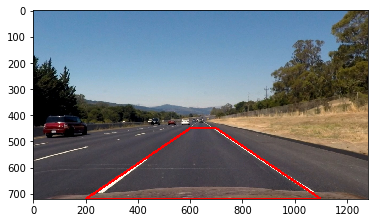

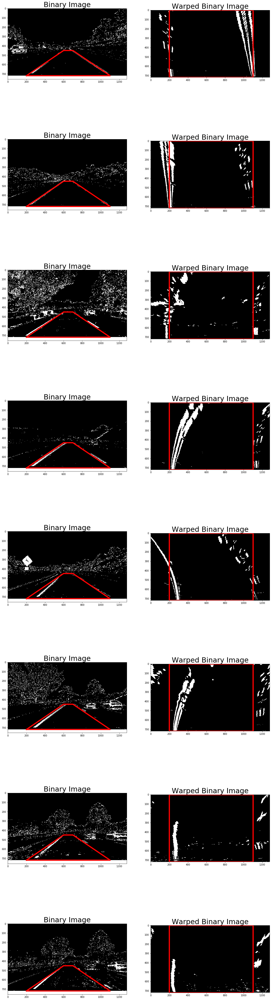

In [40]:
# choice 4 points lying along the lines in original(undistort) image.
# I use following 4 points.
#(720,200),(720,1100),(450,600),(450,700) 
#:(image.shape[0],200/1280*image_shape[1]),(image.shape[0],1100/1280*image_shape[1]),(450/720*image.shape[0],600/1280*image_shape[1]),(450/720*image.shape[0],700/1280*image_shape[1])
from PIL import Image
from PIL import ImageDraw
undist = np.reshape(undist_images[0,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
lined_image = Image.new('RGB',(undist.shape[1] ,undist.shape[0]))
undist_image = Image.fromarray(undist)
lined_image.paste(undist_image,(0,0))
d = ImageDraw.Draw(lined_image)
d.line(((200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0]),(200/1280*undist.shape[1],undist.shape[0])),fill=(255,0,0),width=10)
plt.imshow(lined_image)
plt.savefig("cut_reference_area.png")

# set 4 points lying along the lines in undistort image and perspective transposed image. 
src = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0])])
dst = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],0),(200/1280*undist.shape[1],0)])

src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
img_size = (threshold_binary_images.shape[2],threshold_binary_images.shape[1])
for i in range(threshold_binary_images.shape[0]):
    threshold_binary_img = np.reshape(threshold_binary_images[i],(threshold_binary_images.shape[1],threshold_binary_images.shape[2]))
    warped_binary_img = cv2.warpPerspective(threshold_binary_img, M, img_size, flags=cv2.INTER_LINEAR)
    # hold warped-binary image
    if i == 0:
        warped_binary_images = np.reshape(warped_binary_img,(1,warped_binary_img.shape[0],warped_binary_img.shape[1]))
    else:
        warped_binary_images = np.concatenate([warped_binary_images,np.reshape(warped_binary_img,(1,warped_binary_img.shape[0],warped_binary_img.shape[1]))],axis=0)
    #endif
    # Plot the result
    axes[i][0].imshow(threshold_binary_img, cmap='gray')
    axes[i][0].plot(src_x, src_y, color='red', linewidth=5)
    axes[i][0].set_title('Binary Image', fontsize=30)
    axes[i][1].imshow(warped_binary_img, cmap='gray')
    axes[i][1].plot(dst_x, dst_y, color='red', linewidth=5)
    axes[i][1].set_ylim([warped_binary_img.shape[0], 0])
    axes[i][1].set_title('Warped Binary Image', fontsize=30)
f.savefig("warped_binary_image.png")

## 5. Detect lane pixels and fit to find the lane boundary.

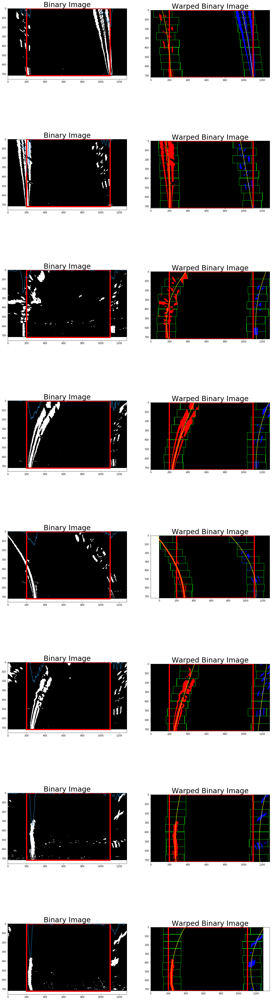

In [42]:
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

# Set height of windows - based on nwindows above and image shape
window_height = np.int(warped_binary_img.shape[0]//nwindows)

# fitting result memory
fitting_result_array_real = np.zeros((warped_binary_images.shape[0],6)) #[left_fit[0]~[2],right_fit[0]~[2]]
fitting_result_array_img = np.zeros((warped_binary_images.shape[0],6))
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
# Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
for i in range(warped_binary_images.shape[0]):
    warped_binary_img = np.reshape(warped_binary_images[i],(warped_binary_images.shape[1],warped_binary_images.shape[2]))
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((warped_binary_img,warped_binary_img,warped_binary_img))
    # calculate histgram
    bottom_half_binary_img =  warped_binary_img[warped_binary_img.shape[0]//2:,:]
    histogram = np.sum(bottom_half_binary_img,axis=0)
    # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]//2)
    # set the first position of search window.
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    nonzero = warped_binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
        win_y_high = warped_binary_img.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    #endfor
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # it a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    fitting_result_array_img[i,:3]= left_fit
    fitting_result_array_img[i,3:] = right_fit
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Visualization
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    # Plot the result
    
    axes[i][0].imshow(warped_binary_img, cmap='gray')
    axes[i][0].plot(dst_x, dst_y, color='red', linewidth=5)
    axes[i][0].plot(histogram)
    axes[i][0].set_title('Binary Image', fontsize=30)
    axes[i][1].imshow(out_img)
    axes[i][1].plot(dst_x, dst_y, color='red', linewidth=5)
    axes[i][1].set_ylim([out_img.shape[0], 0])
    axes[i][1].set_title('Warped Binary Image', fontsize=30)
    # Plots the left and right polynomials on the lane lines
    axes[i][1].plot(left_fitx, ploty, color='yellow')
    axes[i][1].plot(right_fitx, ploty, color='yellow')
    
    # from pixel world to real world
    ym_per_pix = 30/720  #[m/pixel] in y dimension
    xm_per_pix = 3.7/700 #[m/pixel] in x dimension
    left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    fitting_result_array_real[i,:3]= left_fit_real
    fitting_result_array_real[i,3:] = right_fit_real
f.savefig("find_lane_points.png")

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [9]:
# from pixel world to real world
ym_per_pix = 30/720  #[m/pixel] in y dimension
xm_per_pix = 3.7/700 #[m/pixel] in x dimension

ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
print(ploty.shape)
ploty_inverse = np.linspace(719, 0, num=720)
fitting_result_array = fitting_result_array_real
print(fitting_result_array)

#the bottom of the image
y_eval = np.max(ploty)

for i in range(fitting_result_array.shape[0]):
    # Implement the calculation of R_curve (radius of curvature) (ref. formula) 
    left_curverad = ((1 + (2*fitting_result_array[i,0]*y_eval*ym_per_pix + fitting_result_array[i,1])**2)**1.5) / np.absolute(2*fitting_result_array[i,0])
    right_curverad = ((1 + (2*fitting_result_array[i,3]*y_eval*ym_per_pix + fitting_result_array[i,4])**2)**1.5) / np.absolute(2*fitting_result_array[i,3])
    print(left_curverad, 'm', right_curverad, 'm')
    left_bottom_x = fitting_result_array[i,0]*(y_eval*ym_per_pix)**2 + fitting_result_array[i,1]*(y_eval*ym_per_pix) + fitting_result_array[i,2]
    right_bottom_x = fitting_result_array[i,3]*(y_eval*ym_per_pix)**2 + fitting_result_array[i,4]*(y_eval*ym_per_pix) + fitting_result_array[i,5]
    vehicle_position = ((left_bottom_x+right_bottom_x)/2-img_size[0]/2*xm_per_pix)#from center to the right
    print(vehicle_position)
    print((left_bottom_x+right_bottom_x)/2)

(720,)
[[-2.99298783e-04  2.21331364e-02  7.58849225e-01 -7.85969345e-05
   2.37958515e-02  5.18838086e+00]
 [-3.33466917e-04  1.56089488e-02  9.20008283e-01  1.63479075e-04
   1.72790874e-02  5.13587956e+00]
 [ 1.75877101e-03 -8.53329325e-02  1.94941530e+00  1.48069613e-03
  -6.54889011e-02  6.66725117e+00]
 [ 6.80685167e-04 -6.44888109e-02  2.55450906e+00  9.61586842e-04
  -5.24221444e-02  6.69980624e+00]
 [-1.82146375e-03  1.12349275e-01 -1.95314005e-01 -2.28165300e-03
   1.23999365e-01  4.24815232e+00]
 [ 3.55772253e-04 -5.22752519e-02  2.57743223e+00 -7.27774598e-04
   1.98445280e-03  6.50497119e+00]
 [ 5.94082961e-04 -2.58638804e-02  1.67731468e+00  8.71744338e-04
  -3.71029977e-02  6.54228059e+00]
 [ 1.56357589e-03 -7.34437501e-02  2.11808607e+00  1.91666123e-03
  -8.02054391e-02  6.83353401e+00]]
1670.6156484702553 m 6365.047839624379 m
0.10915483087927358
3.4920119737364166
1499.4420904865192 m 3061.8589047368628 m
0.061439965315239764
3.4442971081723828
284.4608148883131 m 33

## 7. Warp the detected lane boundaries back onto the original image.

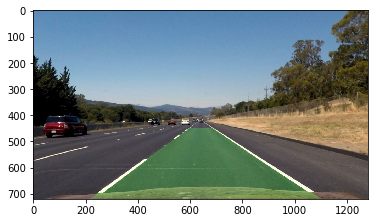

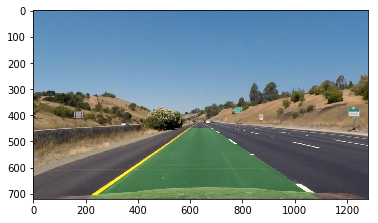

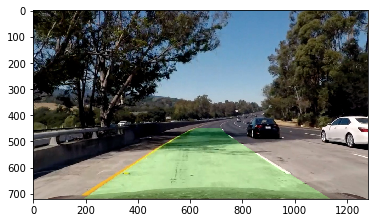

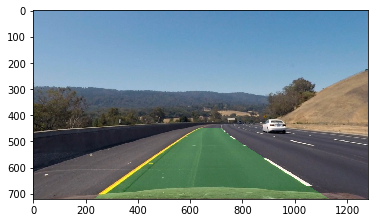

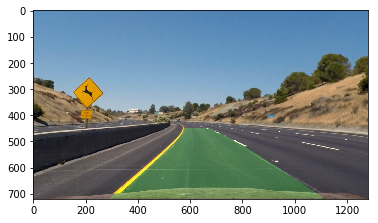

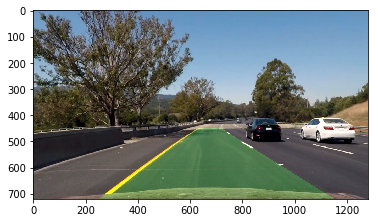

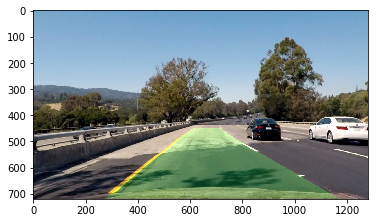

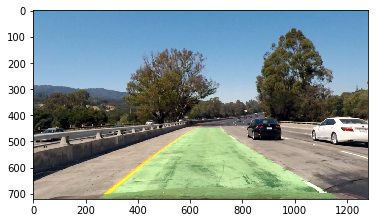

In [46]:
fitting_result_array = fitting_result_array_img
for i in range(undist_images.shape[0]):
    undist = np.reshape(undist_images[i,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
    # for overray lane area
    lane_area = np.zeros_like(undist)
    warped_area = cv2.warpPerspective(lane_area, M, img_size, flags=cv2.INTER_LINEAR)
    left_fitx = fitting_result_array[i,0]*ploty**2 +  fitting_result_array[i,1] * ploty+ fitting_result_array[i,2]
    right_fitx = fitting_result_array[i,3]*ploty_inverse**2 +  fitting_result_array[i,4] * ploty_inverse+ fitting_result_array[i,5]
    #point = np.append(point,(right_fitx,ploty))
    pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
    pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
    pts = np.concatenate((pts_left, pts_right),axis=1)
    lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
    unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, M_inv, img_size, flags=cv2.INTER_LINEAR)
    lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
    plt.imshow(lane_area_overrayed_img)
    plt.savefig("warped_lane_area{0}.png".format(i))
    plt.show()


## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [11]:
# load the data of calibration
dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
mtx, dist = dist_pickle["mtx"], dist_pickle["dist"]
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# from pixel world to real world
ym_per_pix = 30/720  #[m/pixel] in y dimension
xm_per_pix = 3.7/700 #[m/pixel] in x dimension
# Set height of windows - based on nwindows above and image shape
window_height = np.int(warped_binary_img.shape[0]//nwindows)
# set the number to check class variables over the last (const_num) iteration
n = 10

# for perspective transfrom,set 4 points lying along the lines in undistort image and perspective transposed image. 
src = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0])])
dst = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],0),(200/1280*undist.shape[1],0)])

src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)

#the bottom of the image
ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
y_eval = np.max(ploty)



def process_image(image):
    img_size = (image.shape[1],image.shape[0])

    ## undistort image
    undist = cv2.undistort(image, mtx, dist, None, mtx)

    ## threshold and generate binary image
    mag_and_dir_binary = mag_and_dir_thresh(undist)
    # color threshold
    # Convert to HLS color space and separate the V channel
    s_thresh = (170, 255)
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
    # conbine gradient and color threshold
    threshold_binary_img = np.zeros_like(mag_and_dir_binary)
    threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1

    ## perspective transform
    warped_binary_img = cv2.warpPerspective(threshold_binary_img, M, img_size, flags=cv2.INTER_LINEAR)

    ## Detect lane pixels and fit to find the lane boundary
    # calculate histgram
    bottom_half_binary_img =  warped_binary_img[warped_binary_img.shape[0]//2:,:]
    histogram = np.sum(bottom_half_binary_img,axis=0)
    # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]//2)
    # set the first position of search window.
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    nonzero = warped_binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
        win_y_high = warped_binary_img.shape[0] - window*window_height
        # Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window #
        # (`right` or `leftx_current`) on their mean position #
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    #endfor
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # it a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
    ploty_inverse = np.linspace(warped_binary_img.shape[0]-1, 0, warped_binary_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty_inverse**2 + right_fit[1]*ploty_inverse + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # for overray lane area
    lane_area = np.zeros_like(undist)
    warped_area = cv2.warpPerspective(lane_area, M, img_size, flags=cv2.INTER_LINEAR)

    pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
    pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
    pts = np.concatenate((pts_left, pts_right),axis=1)
    lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
    unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, M_inv, img_size, flags=cv2.INTER_LINEAR)
    lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)


    left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
    right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
    print(left_curverad, 'm', right_curverad, 'm')
    left_bottom_x = left_fit_real[0]*(y_eval*ym_per_pix)**2 + left_fit_real[1]*(y_eval*ym_per_pix) + left_fit_real[2]
    right_bottom_x = right_fit_real[0]*(y_eval*ym_per_pix)**2 + right_fit_real[1]*(y_eval*ym_per_pix) + right_fit_real[2]
    line_base_pos = ((left_bottom_x+right_bottom_x)/2-img_size[0]/2*xm_per_pix)#from center to the right
    print(left_bottom_x, 'm', right_bottom_x, 'm')
    left_top_x = left_fit_real[2]
    right_top_x = right_fit_real[2]
    print(left_top_x, 'm', right_top_x, 'm')
    return lane_area_overrayed_img

In [12]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'project_videos_output.mp4'
file_name = "project_video.mp4"
clip = VideoFileClip(file_name)

project_clip = clip.fl_image(process_image)

%time project_clip.write_videofile(project_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

287.6682408070555 m 934.9425637771836 m
1.5046248302268705 m 6.334104358217044 m
-0.15453868267925766 m 4.608006225405514 m
Moviepy - Building video project_videos_output.mp4.
Moviepy - Writing video project_videos_output.mp4



t:   0%|          | 2/1260 [00:00<02:19,  9.05it/s, now=None]

287.6682408070555 m 934.9425637771836 m
1.5046248302268705 m 6.334104358217044 m
-0.15453868267925766 m 4.608006225405514 m


t:   0%|          | 4/1260 [00:00<03:32,  5.90it/s, now=None]

280.9049787817959 m 11494.900512319835 m
1.5106098500810627 m 6.390531156607369 m
-0.16648393386906174 m 4.600328647753969 m
276.35454196850253 m 52729.185974775006 m
1.5189687960315397 m 6.380315861212862 m
-0.1872370339310252 m 4.531708541167372 m


t:   0%|          | 6/1260 [00:01<03:36,  5.79it/s, now=None]

257.1683173459466 m 1018.6089608056245 m
1.504888908433484 m 6.322494505407354 m
-0.20890149534395205 m 4.485891909277788 m
276.3482129681578 m 798.1763630595566 m
1.5343470144462055 m 6.301045777926285 m
-0.20749072686102132 m 4.44414098226722 m


t:   1%|          | 8/1260 [00:01<03:36,  5.77it/s, now=None]

267.26871562217343 m 763.6349174240485 m
1.544591248806036 m 6.294366176950403 m
-0.2280263977229639 m 4.2179000243810805 m
287.435981687369 m 471.4486363294642 m
1.559518338396848 m 6.2380918321461705 m
-0.22289241196954743 m 4.217089701676481 m


t:   1%|          | 10/1260 [00:01<03:37,  5.75it/s, now=None]

284.0450013415763 m 301.8741777652342 m
1.572990282781697 m 6.07336662699304 m
-0.23696972291911558 m 4.1880559789601515 m
298.491333708855 m 317.0298603663905 m
1.5767819174349593 m 6.121742504186272 m
-0.2455100425374038 m 4.240772749119173 m


t:   1%|          | 12/1260 [00:02<03:38,  5.72it/s, now=None]

312.7836655436362 m 7168.183289056988 m
1.5803686741002312 m 6.440551529542272 m
-0.2606223469923966 m 4.333811907414389 m
318.06819248121417 m 986.0137315443823 m
1.5816084809322073 m 6.332058297512891 m
-0.2698056500653503 m 4.215579629435922 m


t:   1%|          | 14/1260 [00:02<03:41,  5.63it/s, now=None]

361.4648774849605 m 878.5158504122064 m
1.5768932503437212 m 6.33047103585146 m
-0.278504464517996 m 4.377147286278371 m
359.17316474875315 m 732.322318125689 m
1.5748914683490869 m 6.311756525316365 m
-0.2944991913657911 m 4.333306075104703 m


t:   1%|▏         | 16/1260 [00:02<03:40,  5.65it/s, now=None]

358.9298483454958 m 3614.9892246763193 m
1.570374872082963 m 6.370528184593603 m
-0.29793108886578323 m 4.475866707130348 m
337.9858518241819 m 2498.9457783576677 m
1.5611073370447839 m 6.3316454652570275 m
-0.29495278351434184 m 4.227611956666456 m


t:   1%|▏         | 18/1260 [00:03<03:40,  5.64it/s, now=None]

331.5893697456654 m 1156.1941957461834 m
1.5646898977575878 m 6.2804382051477745 m
-0.2911106114836576 m 4.134058087402197 m
333.94772022593116 m 1602.5595669555396 m
1.563585453063161 m 6.256507685164806 m
-0.3001131230361132 m 4.196578320771234 m


t:   2%|▏         | 20/1260 [00:03<03:38,  5.68it/s, now=None]

349.15005921984823 m 496.2573547132316 m
1.5672148373905166 m 6.205120494732402 m
-0.2816088578189073 m 3.854217919779535 m
374.1460719991033 m 649.9958020349773 m
1.5612358137110283 m 6.392124853583082 m
-0.28052638639375005 m 4.454335129199744 m


t:   2%|▏         | 22/1260 [00:03<03:38,  5.65it/s, now=None]

396.73000534217675 m 239.3635142646665 m
1.5543946023466844 m 5.82722691893234 m
-0.28037574712009544 m 4.002053120217706 m
412.38644233522274 m 305.6369840801947 m
1.5462866899643983 m 5.976967818804498 m
-0.2865277793544299 m 4.146911797858005 m


t:   2%|▏         | 24/1260 [00:04<03:37,  5.67it/s, now=None]

448.24625594677474 m 308.88639457729863 m
1.53305133693891 m 6.033114109710392 m
-0.2858992483209644 m 4.2177274067082715 m
480.8156902516415 m 713.2348815319571 m
1.5177436023898006 m 6.222969519731868 m
-0.2796349400063964 m 4.269539235573983 m


t:   2%|▏         | 26/1260 [00:04<03:38,  5.66it/s, now=None]

417.31800473426364 m 702.6917155828698 m
1.4981740996901325 m 6.2280448795684915 m
-0.29368322430421084 m 4.262354125280914 m
386.1456817925958 m 454.1189156449685 m
1.484330488404097 m 6.171982135706054 m
-0.30567021938003397 m 4.176330204121381 m


t:   2%|▏         | 28/1260 [00:04<03:35,  5.71it/s, now=None]

388.7823784080953 m 730.3452619081152 m
1.462923480198027 m 6.239491583860296 m
-0.31267304833563037 m 4.345913405733765 m
373.7270111480934 m 976.7885947912412 m
1.4384174440921276 m 6.255178784716321 m
-0.31518614517107985 m 4.381409069825275 m


t:   2%|▏         | 30/1260 [00:05<03:34,  5.73it/s, now=None]

380.5611011716106 m 928.7003423193788 m
1.4181593799477241 m 6.265186943225121 m
-0.32475274095089957 m 4.506186065650678 m
373.6259829148107 m 752.9595063690806 m
1.4200413713921791 m 6.27640590794387 m
-0.2952636754646002 m 4.342169666467667 m


t:   3%|▎         | 32/1260 [00:05<03:34,  5.72it/s, now=None]

339.91110303167676 m 729.562815602148 m
1.4217963373809055 m 6.241742031457836 m
-0.3080803035895169 m 4.345756874482517 m
311.74859266566057 m 1021.6219186741486 m
1.4254665544435776 m 6.251385018290417 m
-0.32808003202385155 m 4.277007039796908 m


t:   3%|▎         | 34/1260 [00:05<03:32,  5.76it/s, now=None]

272.36875699426304 m 1106.2340919137555 m
1.4176634020378733 m 6.233147971978614 m
-0.35461533983807275 m 4.187638552307321 m
266.43495289642465 m 294.56544664492264 m
1.4084743043883055 m 5.993753688265452 m
-0.3685250371544595 m 4.097869905528641 m


t:   3%|▎         | 36/1260 [00:06<03:33,  5.73it/s, now=None]

258.8475347834397 m 230.16679972681433 m
1.4238940021894202 m 5.90026631130625 m
-0.3942731201856828 m 4.055772160679126 m
239.75104195380482 m 428.3063573799804 m
1.4233554746816346 m 6.139191876883719 m
-0.4468035674710747 m 4.073234802122302 m


t:   3%|▎         | 38/1260 [00:06<03:32,  5.76it/s, now=None]

228.38609931960355 m 376.3044657682766 m
1.4363789401799525 m 6.148788869113025 m
-0.4775100198567069 m 3.9740720496403386 m
228.4075595338979 m 296.2252395162329 m
1.4472412387032476 m 6.101373004341338 m
-0.48683424087506383 m 3.9041866168922237 m


t:   3%|▎         | 40/1260 [00:07<03:31,  5.77it/s, now=None]

220.29811961839374 m 297.05890384953005 m
1.4546707356703208 m 6.109502647545956 m
-0.5242592608625068 m 3.9093976722952855 m
214.53227817428262 m 2142.0579912627923 m
1.458824664776592 m 6.278679153788087 m
-0.5502818486412085 m 4.031359228305365 m


t:   3%|▎         | 42/1260 [00:07<03:30,  5.79it/s, now=None]

214.47696653548468 m 888.3775722365567 m
1.4585802255628009 m 6.2572630478057345 m
-0.575596669568542 m 3.9617004369756 m
216.49444875637246 m 537.4321079864253 m
1.4670722755187986 m 6.227130425918363 m
-0.5866613408781018 m 3.909488443870123 m


t:   3%|▎         | 44/1260 [00:07<03:33,  5.69it/s, now=None]

212.99015304258845 m 532.3876825365131 m
1.4685657643233343 m 6.2242319270214574 m
-0.6140134627018048 m 3.9540123468758104 m
219.58709037507995 m 1163.3833083897907 m
1.4904779743247665 m 6.239761951559332 m
-0.628015260582386 m 4.1216841975622724 m


t:   4%|▎         | 46/1260 [00:08<03:32,  5.73it/s, now=None]

228.54872976774072 m 1264.1362878887066 m
1.4959162742722316 m 6.255725849079686 m
-0.625508609982343 m 4.148169426140454 m
228.91161916845752 m 801.9520006321762 m
1.4975715899258395 m 6.241135664428956 m
-0.6480566008132076 m 4.154298003922657 m


t:   4%|▍         | 48/1260 [00:08<03:31,  5.74it/s, now=None]

238.22590261482594 m 514.7069830595093 m
1.4979113221259879 m 6.1138271658135945 m
-0.6210399813332032 m 4.252857889159878 m
247.75230153715134 m 236.30485553798349 m
1.4992344221761051 m 5.985974203235917 m
-0.6134159152751657 m 4.013997140397985 m


t:   4%|▍         | 50/1260 [00:08<03:31,  5.73it/s, now=None]

249.7319293438065 m 384.0492051860683 m
1.5055059642689652 m 6.169751538260095 m
-0.6206470244139222 m 3.99243578113533 m
270.35834458455895 m 543.382565889405 m
1.5064398682239688 m 6.257256875172254 m
-0.6021051950432421 m 4.09136016460885 m


t:   4%|▍         | 52/1260 [00:09<03:30,  5.73it/s, now=None]

292.7046805369733 m 400.0652111639141 m
1.5206256190310836 m 6.2325858074437 m
-0.580555425715469 m 3.9875115567150043 m
292.634522317293 m 317.46781004053946 m
1.5199923328250384 m 6.180391747859238 m
-0.5893485324606833 m 3.9953175498742888 m


t:   4%|▍         | 54/1260 [00:09<03:31,  5.71it/s, now=None]

305.5068830761143 m 1706.255699181158 m
1.5206098800326955 m 6.3201551323317195 m
-0.5460296325432145 m 4.044174175740032 m
313.3614294309254 m 544.6271049456942 m
1.5242548571359162 m 6.265762463212157 m
-0.5500098272552607 m 3.8316244070582046 m


t:   4%|▍         | 56/1260 [00:09<03:30,  5.71it/s, now=None]

328.4385916875194 m 328.16374609861055 m
1.5186596294297874 m 6.213128752034615 m
-0.4954521349163938 m 3.7165475969421835 m
371.0043978046654 m 384.2815609739607 m
1.523856944875065 m 6.211635738700212 m
-0.4453518793718941 m 3.81744975705016 m


t:   5%|▍         | 58/1260 [00:10<03:33,  5.63it/s, now=None]

411.1624057545461 m 497.1847963840053 m
1.5238519874646936 m 6.209917266146409 m
-0.4154734006993343 m 3.9163152379910873 m
414.5754953509342 m 368.2275843131404 m
1.5209675060758756 m 6.161417780995292 m
-0.40015284264906287 m 3.717000156763475 m


t:   5%|▍         | 60/1260 [00:10<03:31,  5.68it/s, now=None]

426.8701843179066 m 387.78345008115446 m
1.5153095691281886 m 6.125019474778343 m
-0.40230550636579826 m 3.8895577585388126 m
430.9549909805289 m 277.99751331460055 m
1.516164080550654 m 5.89388057770419 m
-0.35542459958471934 m 3.792413575877048 m


t:   5%|▍         | 62/1260 [00:10<03:31,  5.67it/s, now=None]

487.69836928768564 m 470.04952268593036 m
1.521700785736929 m 6.174540570527798 m
-0.25214759668287234 m 3.611922855001796 m
381.3234042867227 m 401.34028794075107 m
1.496236595182384 m 6.10996252569778 m
-0.33783098501363973 m 3.656636433332 m


t:   5%|▌         | 64/1260 [00:11<03:29,  5.71it/s, now=None]

378.7143926103614 m 639.6497311493014 m
1.4913370386101807 m 6.171599925943652 m
-0.3181115682212537 m 3.7014939842186667 m
521.294708482463 m 517.4321107626633 m
1.492535848579413 m 6.135267757837578 m
-0.1585462034172737 m 3.8077757244303974 m


t:   5%|▌         | 66/1260 [00:11<03:27,  5.75it/s, now=None]

522.2216467893222 m 979.0810307544052 m
1.4795857322123782 m 6.198508304206861 m
-0.1143908621033005 m 3.716444677497166 m
443.13022130582794 m 1329.932996157458 m
1.4516616044876167 m 6.192591724210287 m
-0.1679710018360508 m 3.9002403851627676 m


t:   5%|▌         | 68/1260 [00:11<03:32,  5.60it/s, now=None]

492.612101425525 m 1113.8331741238246 m
1.4407199112054412 m 6.167421622986988 m
-0.04779553363574994 m 3.9309212951506227 m
377.49185233378415 m 1102.1597477146472 m
1.413998978443192 m 6.1408786221844585 m
-0.16968878410748264 m 3.9852513752817353 m


t:   6%|▌         | 70/1260 [00:12<03:29,  5.69it/s, now=None]

416.74462651915775 m 1258.5199883973498 m
1.4214277856354356 m 6.150614210564207 m
-0.14192754522807652 m 3.8251933020974094 m
363.17013828824196 m 663.841245722953 m
1.4132253719793537 m 6.106950516278738 m
-0.1866058655132164 m 3.700401158702888 m


t:   6%|▌         | 72/1260 [00:12<03:28,  5.69it/s, now=None]

331.26453537337284 m 369.99279784210233 m
1.3974978910616618 m 5.897840227141153 m
-0.2811405621698381 m 3.7706219809975017 m
330.94259049928627 m 284.4440562092953 m
1.4015321783620176 m 5.7132850565913325 m
-0.29330077036592483 m 3.8402201552386446 m


t:   6%|▌         | 74/1260 [00:12<03:27,  5.72it/s, now=None]

390.5308294712978 m 324.9164156370434 m
1.414063395535373 m 5.84618984612488 m
-0.26182543814353254 m 3.9076520493255336 m
391.3432858917085 m 497.3626417825342 m
1.4089037048450195 m 6.008701126747479 m
-0.2818710507698505 m 3.8628128590998205 m


t:   6%|▌         | 76/1260 [00:13<03:27,  5.72it/s, now=None]

407.288467167772 m 514.6398546153556 m
1.410135724555282 m 6.028309870864822 m
-0.2832271708228701 m 3.847625924423439 m
496.43937226371554 m 518.5766776844147 m
1.406113045534171 m 6.0222908727451845 m
-0.2237192153346491 m 3.9773801241751228 m


t:   6%|▌         | 78/1260 [00:13<03:27,  5.69it/s, now=None]

516.4114127152318 m 997.0346316649252 m
1.4154950598509615 m 6.071867592344477 m
-0.23783395312214603 m 4.059996837141317 m
563.8790289500869 m 10022.086753524842 m
1.3967611011155028 m 6.1282554310851545 m
-0.2515962987639617 m 4.24693195125313 m


t:   6%|▋         | 80/1260 [00:14<03:26,  5.70it/s, now=None]

708.6432514638186 m 1106.661777889798 m
1.3917586844684513 m 6.105853997194048 m
-0.18559938065138298 m 4.153821281340488 m
647.7175485028833 m 831.712759768833 m
1.3626547469979537 m 6.086396744019811 m
-0.197123660994361 m 4.201551033148757 m


t:   7%|▋         | 82/1260 [00:14<03:26,  5.70it/s, now=None]

578.5491138173227 m 734.6317827917396 m
1.3421492197734208 m 6.070471954440777 m
-0.2066885446507423 m 4.236203898056076 m
596.6617078865869 m 1204.4234964918803 m
1.345522903191934 m 6.073503182060803 m
-0.1668986371039739 m 4.208118958073141 m


t:   7%|▋         | 84/1260 [00:14<03:27,  5.68it/s, now=None]

577.8196525350921 m 1596.349024006994 m
1.319060391853343 m 6.090395061926502 m
-0.1527745681224001 m 4.1921216292038785 m
494.64171311356046 m 364.8438378253738 m
1.3011085945727232 m 5.963431700878733 m
-0.215680901536727 m 3.9734733381718588 m


t:   7%|▋         | 86/1260 [00:15<03:25,  5.71it/s, now=None]

521.4581585905058 m 289.0765057958268 m
1.281737326018285 m 5.876356220341929 m
-0.24054571010027673 m 4.08105797110911 m
526.501287236117 m 352.46250781554727 m
1.2748863045199759 m 5.959663449550493 m
-0.2153154398777723 m 4.164478364646502 m


t:   7%|▋         | 88/1260 [00:15<03:25,  5.71it/s, now=None]

457.2652395891772 m 2192.0805130204417 m
1.2642107845290655 m 6.18265620494663 m
-0.25536874768599477 m 4.251863405637948 m
383.20666086961535 m 880.8386296939244 m
1.2609896436527566 m 6.111152513736219 m
-0.22166716542846968 m 4.131309966715499 m


t:   7%|▋         | 90/1260 [00:15<03:24,  5.71it/s, now=None]

360.0063253020068 m 854.5729164453631 m
1.263121014063274 m 6.082291098415027 m
-0.20610210877530752 m 4.112253999232858 m
332.17854403198527 m 2597.475310193058 m
1.261656517230123 m 6.1231412054445045 m
-0.19969081813116943 m 4.0758400578084935 m


t:   7%|▋         | 92/1260 [00:16<03:26,  5.67it/s, now=None]

294.8755630938415 m 1965.6760628868549 m
1.266661614728145 m 6.097981522368902 m
-0.2015440717011387 m 3.97705624340543 m
308.0011382976651 m 953.8994966723011 m
1.2677916623826675 m 6.076172147847497 m
-0.19155105469520942 m 4.034382081408299 m


t:   7%|▋         | 94/1260 [00:16<03:25,  5.66it/s, now=None]

294.6790041897695 m 1090.6053826259945 m
1.2661154117858247 m 6.072985122627468 m
-0.2155796913068624 m 4.100596158741717 m
299.62910838974517 m 3038.230069377245 m
1.2894143375397735 m 6.079170507191317 m
-0.1971827293415059 m 4.087531181525152 m


t:   8%|▊         | 96/1260 [00:16<03:26,  5.64it/s, now=None]

297.44133949357564 m 56759.13475628552 m
1.3029317700656082 m 6.066794247936738 m
-0.19305398358605377 m 4.197683315037799 m
293.70377614647947 m 96730.14317216145 m
1.2971964723728708 m 6.031478371996095 m
-0.1952622301786304 m 4.294415689084301 m


t:   8%|▊         | 98/1260 [00:17<03:24,  5.67it/s, now=None]

295.75239048413886 m 3844.222060293538 m
1.305275248688351 m 6.0601514224061965 m
-0.19690691245954087 m 4.237693886815583 m
293.88621043905533 m 646.4214305242525 m
1.3124426855594067 m 5.973913434312101 m
-0.2129630661358494 m 4.023899711252437 m


t:   8%|▊         | 100/1260 [00:17<03:23,  5.70it/s, now=None]

326.5907233182795 m 1269.3659545906867 m
1.3249339064174883 m 6.068580677073688 m
-0.2006318498195653 m 4.132258956729203 m
319.0751002442996 m 424.7002354950188 m
1.334906887201136 m 5.959621526293206 m
-0.20968649421384397 m 3.955531276542433 m


t:   8%|▊         | 102/1260 [00:17<03:22,  5.72it/s, now=None]

327.23256564519073 m 387.09715492239684 m
1.3387259225782784 m 5.954914370908686 m
-0.22608309402755833 m 4.007694076320071 m
311.8126573216173 m 424.7864595434383 m
1.3402402246074376 m 5.9795016303731 m
-0.23141226976932397 m 4.018266123218942 m


t:   8%|▊         | 104/1260 [00:18<03:22,  5.71it/s, now=None]

327.79648998819613 m 667.6214782428066 m
1.3491427084050216 m 6.045118971377425 m
-0.18864360834081073 m 3.954064127418864 m
337.6100422894996 m 672.821082131988 m
1.3575503948580954 m 6.044615094871752 m
-0.18476860202182233 m 4.032191413634397 m


t:   8%|▊         | 106/1260 [00:18<03:22,  5.71it/s, now=None]

305.1354535680486 m 514.482940403798 m
1.3512316867161016 m 6.029976714848325 m
-0.20981875988415524 m 4.011629016306774 m
318.65941143395713 m 677.0755798701705 m
1.3472393416282442 m 6.052748003751342 m
-0.22069016859472423 m 4.229345672457118 m


t:   9%|▊         | 108/1260 [00:18<03:21,  5.71it/s, now=None]

325.40427387549437 m 1223.4696072166216 m
1.3585924757799834 m 6.086352325985901 m
-0.21997331152795727 m 4.307490119065822 m
328.5525742314913 m 747.8776845582008 m
1.3540866093738997 m 6.101544203077848 m
-0.21208069415748612 m 4.237893457245971 m


t:   9%|▊         | 110/1260 [00:19<03:22,  5.67it/s, now=None]

298.304166092623 m 522.4333449553891 m
1.3597000801799741 m 6.0294034623719455 m
-0.23206030188992902 m 4.215192869308282 m
299.37293222247257 m 308.7980448879475 m
1.367586410733835 m 5.921651085378842 m
-0.2316375746349926 m 4.098872964587614 m


t:   9%|▉         | 112/1260 [00:19<03:21,  5.70it/s, now=None]

287.39130655785 m 303.6653695893161 m
1.3637562457234103 m 5.930276364535291 m
-0.24544985612232836 m 4.160565801827708 m
278.9722544689341 m 880.5916855989475 m
1.3742119251777836 m 6.152368788332126 m
-0.256573407690251 m 4.226378141002307 m


t:   9%|▉         | 114/1260 [00:20<03:20,  5.71it/s, now=None]

292.29795925053025 m 562.7894730296982 m
1.3681743455501783 m 6.126831215278789 m
-0.25998630079256757 m 4.309866990277799 m
278.24830346131733 m 356.28277364637034 m
1.382867506929395 m 6.068785100372493 m
-0.27355727541861374 m 4.118275939313428 m


t:   9%|▉         | 116/1260 [00:20<03:19,  5.73it/s, now=None]

267.3202506966395 m 384.64801516249605 m
1.382765905830071 m 6.083852399708981 m
-0.2861445949596534 m 4.175298175249545 m
247.21843218533604 m 865.9449669569491 m
1.386368803194943 m 6.181328583875535 m
-0.31233291011986947 m 4.1136967207843185 m


t:   9%|▉         | 118/1260 [00:20<03:22,  5.65it/s, now=None]

251.73624161008865 m 854.852434964486 m
1.3981782983694429 m 6.160086768585334 m
-0.31110031246625963 m 4.166594792230028 m
256.3196855926759 m 462.2623082915197 m
1.4020168610440429 m 6.130553331163892 m
-0.31388815135934245 m 4.070130193746369 m


t:  10%|▉         | 120/1260 [00:21<03:21,  5.66it/s, now=None]

264.7552514548771 m 394.79557510588364 m
1.421231515372332 m 6.121086420876338 m
-0.30881317059831004 m 3.9962417647750166 m
262.11565027166006 m 364.1809003002972 m
1.4264481388183687 m 6.130539628841814 m
-0.31133408697148085 m 3.773617231109265 m


t:  10%|▉         | 122/1260 [00:21<03:20,  5.69it/s, now=None]

250.8963406817782 m 464.6339445754022 m
1.4375803563053844 m 6.118757861762983 m
-0.32476273539202033 m 3.9509294775959134 m
255.81035715922607 m 339.09465854967635 m
1.4459904953920026 m 6.074005491334745 m
-0.3250551771441904 m 3.9027019459437056 m


t:  10%|▉         | 124/1260 [00:21<03:19,  5.69it/s, now=None]

252.29975026407206 m 335.105329274843 m
1.4544722960339054 m 6.0396437786865285 m
-0.3327420646209549 m 3.9933677301624155 m
243.1379908232906 m 576.2723261952433 m
1.463030389103052 m 6.232249653319469 m
-0.345197058298063 m 3.7780824929751495 m


t:  10%|█         | 126/1260 [00:22<03:18,  5.70it/s, now=None]

243.4325891683281 m 329.6485548152326 m
1.4715250313572061 m 6.098501658886916 m
-0.34803583554151873 m 3.738688365850873 m
237.91111526590117 m 367.8700757496964 m
1.4794127546159095 m 6.136234556407336 m
-0.3623521782714226 m 3.7477379821582217 m


t:  10%|█         | 128/1260 [00:22<03:17,  5.74it/s, now=None]

259.32315522579256 m 299.49752037324134 m
1.486082807543293 m 6.10143113055601 m
-0.3466875762580139 m 3.8437992367391476 m
261.9932133921607 m 586.0715349552498 m
1.4920786798567298 m 6.221800974134586 m
-0.3470602640001995 m 3.82110732136058 m


t:  10%|█         | 130/1260 [00:22<03:18,  5.69it/s, now=None]

269.3891964103781 m 446.1160620439351 m
1.4973499676769066 m 6.192994713092196 m
-0.33864410707979037 m 3.8852194861450835 m
259.1006524242895 m 632.5573651993355 m
1.5099654043840725 m 6.200713713786497 m
-0.34502292709251897 m 3.946429288896432 m


t:  10%|█         | 132/1260 [00:23<03:20,  5.64it/s, now=None]

261.96452802762275 m 710.0070806904638 m
1.5056170281515338 m 6.195018107738846 m
-0.3450702334740165 m 4.035889003823561 m
273.28559355780106 m 766.4928912355402 m
1.5219836229813524 m 6.197000034918688 m
-0.3295616042484433 m 3.9385686684426093 m


t:  11%|█         | 134/1260 [00:23<03:17,  5.70it/s, now=None]

275.68094239121683 m 450.46142035839307 m
1.5333231820857764 m 6.156685161342963 m
-0.3203258511538484 m 3.7654522508448154 m
281.15283409846234 m 292.46102662520826 m
1.5373582838564213 m 5.980906914664758 m
-0.3025235726401393 m 3.8082615780300175 m


t:  11%|█         | 136/1260 [00:23<03:15,  5.74it/s, now=None]

282.57288371092653 m 378.5484983895557 m
1.5475639963513572 m 6.055341453722919 m
-0.2886915736841185 m 3.9226361097602367 m
292.04374740911084 m 669.9047991263224 m
1.5569959829138782 m 6.26111367081187 m
-0.2690879915253828 m 3.8833940882224707 m


t:  11%|█         | 138/1260 [00:24<03:18,  5.66it/s, now=None]

307.1119089108195 m 654.3502220737921 m
1.560999722059459 m 6.260069667364602 m
-0.24932304679818026 m 3.9415172469381665 m
321.8642067627813 m 476.2101721540235 m
1.5580561959211034 m 6.218153177387725 m
-0.23473037030255503 m 3.985935363514815 m


t:  11%|█         | 140/1260 [00:24<03:16,  5.71it/s, now=None]

335.4753574988618 m 385.0201133789888 m
1.5460904607428447 m 6.193626107983081 m
-0.22101654011458877 m 4.05595714384876 m
337.12649967084224 m 480.03891072979934 m
1.5357462480292832 m 6.237321668401359 m
-0.2108142569647167 m 4.1488659985694705 m


t:  11%|█▏        | 142/1260 [00:24<03:17,  5.67it/s, now=None]

373.41055996457175 m 1448.608831911482 m
1.5290860996374325 m 6.359020688986741 m
-0.1930541515786114 m 4.1841207267090805 m
368.7847343844643 m 1327.3821962757193 m
1.5241813550960366 m 6.324053508839009 m
-0.18383562201313242 m 4.253669815206795 m


t:  11%|█▏        | 144/1260 [00:25<03:16,  5.67it/s, now=None]

380.3736907541274 m 1531.9208019594844 m
1.5253532417740643 m 6.306229922356839 m
-0.16602065783051712 m 4.339960157862199 m
375.14910835192137 m 857.7368303339756 m
1.5320619038489414 m 6.263588240004212 m
-0.14271169748559345 m 4.193963115108526 m


t:  12%|█▏        | 146/1260 [00:25<03:16,  5.66it/s, now=None]

372.7202534909256 m 1987.1638219262256 m
1.522407609119439 m 6.251112265080236 m
-0.13714785267610066 m 4.267884546338426 m
368.61366796092415 m 1227.698628852462 m
1.5178425393969175 m 6.175302919264309 m
-0.13639556775672568 m 4.306569404006504 m


t:  12%|█▏        | 148/1260 [00:25<03:15,  5.69it/s, now=None]

345.22149120504923 m 6817.606300271261 m
1.508739977790967 m 6.242290760716169 m
-0.13271830659647224 m 4.358559330770377 m
367.04494391022735 m 3514.2190124434655 m
1.5095487217207988 m 6.206384911396068 m
-0.10270523003382903 m 4.486366326397254 m


t:  12%|█▏        | 150/1260 [00:26<03:13,  5.73it/s, now=None]

321.3444781554159 m 457.68655270616495 m
1.5171213345993888 m 6.153221167113564 m
-0.11380451332119002 m 3.8777873053386225 m
336.2196946451587 m 581.3052083252638 m
1.5227150284771438 m 6.3518468199450275 m
-0.09219902723062381 m 4.598975363396355 m


t:  12%|█▏        | 152/1260 [00:26<03:14,  5.70it/s, now=None]

377.7745874014326 m 1684.1501999228637 m
1.526781862493125 m 6.274807779794092 m
-0.0763211537769133 m 4.551617854538342 m
387.6393141427317 m 2185.152299137518 m
1.5235193260070061 m 6.2363457653779335 m
-0.08206561724790745 m 4.37105950785911 m


t:  12%|█▏        | 154/1260 [00:27<03:14,  5.69it/s, now=None]

381.166902491421 m 1522.5917232507288 m
1.501253936990207 m 6.260625611394531 m
-0.09228882978729674 m 4.213431243362471 m
365.26101884289955 m 894.0284223433148 m
1.5005159394371441 m 6.2260428471497296 m
-0.0955213611072445 m 4.119261136780544 m


t:  12%|█▏        | 156/1260 [00:27<03:12,  5.73it/s, now=None]

362.8330826761519 m 1369.9353395620428 m
1.4817953345869639 m 6.251164644055093 m
-0.1306123239791209 m 4.2796527060458605 m
394.91466025881533 m 1073.6365856512864 m
1.4921143787399098 m 6.242689332331256 m
-0.14359011934174418 m 4.30365536806389 m


t:  13%|█▎        | 158/1260 [00:27<03:11,  5.74it/s, now=None]

391.8711906726519 m 2528.895484779839 m
1.4818046651111827 m 6.241220442660444 m
-0.1530750148893089 m 4.331886616129322 m
390.59915290140873 m 5962.411973469195 m
1.4742425908166001 m 6.245376759400784 m
-0.1675974922545848 m 4.3193368689088665 m


t:  13%|█▎        | 160/1260 [00:28<03:10,  5.78it/s, now=None]

360.0153062091685 m 1408.1473060058029 m
1.470045132347363 m 6.190643107227773 m
-0.1826793466923186 m 4.245835204474301 m
380.01244457499183 m 1352.2581136055821 m
1.4647668964347986 m 6.306585800956098 m
-0.19950924332383319 m 4.4578126664243065 m


t:  13%|█▎        | 162/1260 [00:28<03:12,  5.69it/s, now=None]

354.2515672868672 m 1197.2488510552416 m
1.4508812149686625 m 6.3359548521017865 m
-0.20805397896406957 m 4.387133483068261 m
349.5072673039879 m 824.2754978686434 m
1.4421715301601794 m 6.231264967083936 m
-0.25331929645810247 m 4.068211033353232 m


t:  13%|█▎        | 164/1260 [00:28<03:12,  5.70it/s, now=None]

351.89999583223175 m 630.7511480666963 m
1.4371911307704055 m 6.18920400638278 m
-0.28589320446899763 m 4.088929176828754 m
379.9544994850521 m 631.3455227643419 m
1.437771187113282 m 6.201260593189154 m
-0.2957012712483155 m 4.165638046931741 m


t:  13%|█▎        | 166/1260 [00:29<03:14,  5.64it/s, now=None]

329.19148150719985 m 3575.2445784641213 m
1.4253639944214012 m 6.315083004302144 m
-0.3422936832330029 m 4.260199826058061 m
332.2947380759897 m 1537.2197727475289 m
1.428732688105498 m 6.250030929785559 m
-0.3098745295534592 m 3.985012823254192 m


t:  13%|█▎        | 168/1260 [00:29<03:11,  5.71it/s, now=None]

342.0164157902239 m 1637.6275948369137 m
1.4246914055146094 m 6.22931480074174 m
-0.3229101614554967 m 4.09448087211333 m
327.5784903734349 m 1302.3602324284782 m
1.4181958448386611 m 6.207628849865809 m
-0.30498934909397735 m 4.0281456249669985 m


t:  13%|█▎        | 170/1260 [00:29<03:10,  5.74it/s, now=None]

467.6473757614552 m 802.2041581619119 m
1.4435353205518064 m 6.204752283563462 m
-0.19475918880249815 m 3.9231629252599847 m
389.66667305641073 m 954.1709831991079 m
1.4261569882207938 m 6.198195873562065 m
-0.3247933406384419 m 4.030860572974188 m


t:  14%|█▎        | 172/1260 [00:30<03:09,  5.73it/s, now=None]

393.2790036406892 m 1480.5280302020983 m
1.4077158509209524 m 6.187677150282898 m
-0.3536747167761497 m 4.235036299158672 m
367.17403051964925 m 931.0958526225658 m
1.4030007319140636 m 6.126463442258255 m
-0.4282725935271617 m 4.282725399011521 m


t:  14%|█▍        | 174/1260 [00:30<03:09,  5.74it/s, now=None]

347.76362429714254 m 48415.02824388454 m
1.3948954512652334 m 6.170717228184079 m
-0.4738717485277693 m 4.478433740165432 m
376.23239363740674 m 280.552980170835 m
1.3994373245290188 m 6.006732996581663 m
-0.4397467044782153 m 3.7213308225228694 m


t:  14%|█▍        | 176/1260 [00:30<03:08,  5.74it/s, now=None]

389.7374403492173 m 254.3484480145187 m
1.4075073701174179 m 5.991739207840687 m
-0.4142073888481058 m 3.549175353778441 m
401.76684106652203 m 265.28319830552186 m
1.4078463071154177 m 5.990370870092232 m
-0.39319827314289785 m 3.5835362281327128 m


t:  14%|█▍        | 178/1260 [00:31<03:08,  5.75it/s, now=None]

381.6690859534279 m 255.10691629994108 m
1.3913238723497718 m 6.024996471211069 m
-0.40150559271523456 m 3.4279701488910796 m
426.77345924114996 m 302.32951153076397 m
1.3859583342073016 m 6.073133707403123 m
-0.40606060623307544 m 3.5717060035626496 m


t:  14%|█▍        | 180/1260 [00:31<03:09,  5.71it/s, now=None]

406.80028775386836 m 281.508714070871 m
1.3712613855161935 m 6.092518747566329 m
-0.40640213612761683 m 3.5914584353607553 m
363.43526969570803 m 301.77451604385794 m
1.3498633861832434 m 6.116687140321032 m
-0.4369599136159988 m 3.70401175033946 m


t:  14%|█▍        | 182/1260 [00:31<03:09,  5.68it/s, now=None]

383.7398559911393 m 295.2596428255263 m
1.3547131830038557 m 6.132661354140573 m
-0.4031151879057311 m 3.775778694225459 m
320.557321073522 m 405.3799362457458 m
1.3380492821550336 m 6.155303738426062 m
-0.4234095973728174 m 3.8144001709138204 m


t:  15%|█▍        | 184/1260 [00:32<03:09,  5.67it/s, now=None]

323.60864141141616 m 265.60325479474585 m
1.3245709407835304 m 6.045572489903594 m
-0.4081806583974854 m 3.726248906802552 m
279.5805264281514 m 366.0609061098325 m
1.3139584418897958 m 6.132049082775086 m
-0.45097028152902213 m 3.816896579589713 m


t:  15%|█▍        | 186/1260 [00:32<03:07,  5.71it/s, now=None]

250.88289908668193 m 261.4029068751805 m
1.306699977798755 m 6.059568090384088 m
-0.48925573324451815 m 3.59967416774427 m
234.0295993138855 m 232.41254799502036 m
1.3067678240757863 m 6.101983832457602 m
-0.5193377238997443 m 3.29366650473218 m


t:  15%|█▍        | 188/1260 [00:33<03:07,  5.73it/s, now=None]

210.49031023999845 m 112.99927238082664 m
1.316441252426342 m 6.749936504602344 m
-0.5456771574443586 m 5.524183664006114 m
201.12669253799442 m 119.81579460540303 m
1.3152854364725353 m 6.620128912252083 m
-0.5750906540956713 m 5.591693269216971 m


t:  15%|█▌        | 190/1260 [00:33<03:06,  5.73it/s, now=None]

195.36023724607696 m 264.77247956816143 m
1.3283084148940398 m 6.149609103060658 m
-0.5972514363019742 m 3.1155999458260095 m
196.33224166944706 m 367.42581473900316 m
1.3369903963176082 m 6.201302824434444 m
-0.5911138942076207 m 3.282752933957874 m


t:  15%|█▌        | 192/1260 [00:33<03:06,  5.73it/s, now=None]

196.6005161319274 m 92.81700889542896 m
1.3558531613263076 m 4.992529192837331 m
-0.6019420846852315 m 2.739021542767293 m
196.79889729048102 m 516.3704244392433 m
1.378872962217138 m 6.197338885756332 m
-0.5992248972168663 m 3.475267028893023 m


t:  15%|█▌        | 194/1260 [00:34<03:05,  5.73it/s, now=None]

215.1324313687839 m 300.13421325091 m
1.412031608089602 m 6.178369689582766 m
-0.5523150764757118 m 3.2291969103104656 m
220.47728310000718 m 602.6974933975731 m
1.4405641644061502 m 6.194526956097325 m
-0.5365846876315002 m 3.451032321855098 m


t:  16%|█▌        | 196/1260 [00:34<03:04,  5.77it/s, now=None]

226.99466414656243 m 374.375716468276 m
1.4563919741099605 m 6.083178296496008 m
-0.5243335239123468 m 3.440082464755968 m
227.99592637847533 m 386.84504941446164 m
1.4605268956889805 m 6.097276772102285 m
-0.5294374490650641 m 3.5335953006088068 m


t:  16%|█▌        | 198/1260 [00:34<03:05,  5.73it/s, now=None]

259.7523644806696 m 249.96779791698012 m
1.447625345518572 m 5.957559514626602 m
-0.49165167974343627 m 3.6337098323464994 m
288.26593534440406 m 575.1919523035446 m
1.4341841784890357 m 6.231217104641584 m
-0.4868740537256214 m 3.8789295653863465 m


t:  16%|█▌        | 200/1260 [00:35<03:04,  5.75it/s, now=None]

336.5393780242476 m 594.2015744393301 m
1.4220810546244247 m 6.25095985388703 m
-0.4755600329391209 m 4.061759301621977 m
364.62153527518814 m 508.76236680520094 m
1.4036178244445363 m 6.233788843543413 m
-0.5008491113228346 m 4.216156298110089 m


t:  16%|█▌        | 202/1260 [00:35<03:04,  5.72it/s, now=None]

358.2591844524911 m 590.0884611234133 m
1.3983688975107484 m 6.245247573491644 m
-0.5100967276328537 m 4.25642773509424 m
348.2746099644974 m 366.0139454149674 m
1.3681037484137417 m 6.197457148460429 m
-0.5298505843842533 m 4.15172551533025 m


t:  16%|█▌        | 204/1260 [00:35<03:05,  5.70it/s, now=None]

340.57139852455106 m 534.9678642314447 m
1.3638147151947155 m 6.231151358788265 m
-0.5230846979472742 m 4.101709883304044 m
293.9296599510735 m 543.4714901935254 m
1.341018120315597 m 6.245059920547308 m
-0.5544107935726565 m 3.9380814467388046 m


t:  16%|█▋        | 206/1260 [00:36<03:04,  5.71it/s, now=None]

315.8046491710868 m 707.1100980628296 m
1.3506997325785197 m 6.235888515630362 m
-0.5369208699108007 m 4.086568096942914 m
329.72369410398585 m 434.5116414647116 m
1.3671798966798292 m 6.18508149074284 m
-0.48959572483251945 m 3.9271896342721697 m


t:  17%|█▋        | 208/1260 [00:36<03:03,  5.74it/s, now=None]

315.92009844100824 m 1167.8680713085528 m
1.3679214870235643 m 6.201214585937146 m
-0.49620451845645847 m 4.069666302845488 m
289.20714413915226 m 4514.03178377767 m
1.3754167633024181 m 6.25455822673838 m
-0.49276592547024906 m 4.002438238030418 m


t:  17%|█▋        | 210/1260 [00:36<03:03,  5.71it/s, now=None]

278.6810476021291 m 888.8654946517041 m
1.3819178558577907 m 6.176074992316936 m
-0.49944154659100204 m 3.8599713169977785 m
276.28116675041895 m 1100.2570137266684 m
1.3788976872504046 m 6.1998012213944715 m
-0.5250195414237822 m 3.98968373782483 m


t:  17%|█▋        | 212/1260 [00:37<03:03,  5.71it/s, now=None]

295.09921482793607 m 1395.7108842611074 m
1.3776938711572293 m 6.283024141322727 m
-0.5110287616354524 m 3.919615496883513 m
300.46556352020104 m 841.1798117936022 m
1.3668942878697332 m 6.287348230638126 m
-0.5351437653271763 m 3.914781021412856 m


t:  17%|█▋        | 214/1260 [00:37<03:03,  5.71it/s, now=None]

298.9647823688028 m 606.012785450747 m
1.3698163705783024 m 6.232646990264552 m
-0.5466565389527724 m 3.8825329197694507 m
285.1276818998451 m 446.6139027868666 m
1.3545652955350944 m 6.178845808193352 m
-0.5592451494995114 m 3.9141956547799923 m


t:  17%|█▋        | 216/1260 [00:37<03:03,  5.69it/s, now=None]

272.50209068838274 m 1994.2426312104203 m
1.3524049426672806 m 6.268452823652003 m
-0.5899134390822646 m 3.9741100720340072 m
257.4910520141657 m 1149.1752332976864 m
1.3364602162308552 m 6.233255434302604 m
-0.6294603696983104 m 3.8773847942470834 m


t:  17%|█▋        | 218/1260 [00:38<03:01,  5.73it/s, now=None]

244.12586726393383 m 849.0085346486916 m
1.3292585638266274 m 6.194331985766608 m
-0.6836560066595232 m 3.892415350459687 m
281.96141210726995 m 646.1046270430786 m
1.355674438390512 m 6.151538618452622 m
-0.6202248808519109 m 3.8640064768761984 m


t:  17%|█▋        | 220/1260 [00:38<03:02,  5.71it/s, now=None]

299.46129436266654 m 1521.5247242494108 m
1.3500110706772608 m 6.154729666234372 m
-0.6166807027224834 m 4.044634120931375 m
277.13208447882687 m 916.3774265306077 m
1.3487459666052675 m 6.113780319358724 m
-0.6397332719503874 m 3.850643990314562 m


t:  18%|█▊        | 222/1260 [00:38<03:03,  5.67it/s, now=None]

288.11364163250846 m 403.3967093829389 m
1.3431621205577375 m 6.018675998280922 m
-0.6640982827143734 m 3.783584906621682 m
307.65084204884226 m 2301.3319861451373 m
1.3533484672541771 m 6.149032434285763 m
-0.6503434983195682 m 4.1201772159204095 m


t:  18%|█▊        | 224/1260 [00:39<03:04,  5.62it/s, now=None]

322.6771821003074 m 13379.198638849184 m
1.3576926648549825 m 6.189625394328093 m
-0.6330871334361627 m 4.015021493219665 m
354.11139049942557 m 716.0501601630202 m
1.3670463759257854 m 6.120268367721638 m
-0.616414704389063 m 3.8265104970096377 m


t:  18%|█▊        | 226/1260 [00:39<03:03,  5.64it/s, now=None]

333.9033497780435 m 491.57167452939274 m
1.373422845253517 m 6.0452738362945695 m
-0.612119799280971 m 3.7258407963554636 m
354.99419746310866 m 403.56194135612554 m
1.365173023899382 m 6.019333907028384 m
-0.5945082935022031 m 3.7571128741230657 m


t:  18%|█▊        | 228/1260 [00:40<03:01,  5.70it/s, now=None]

363.9694524224324 m 1114.6254413566892 m
1.3621682129925876 m 6.103024879918399 m
-0.5327022020907951 m 3.7422197444386867 m
385.0091742852223 m 751.5583360966032 m
1.356566936706045 m 6.078007978186568 m
-0.5130585238854624 m 3.7393621648254336 m


t:  18%|█▊        | 230/1260 [00:40<03:02,  5.63it/s, now=None]

377.7547360087937 m 573.8080316333203 m
1.3329150836074726 m 6.055175012826107 m
-0.5422548734046269 m 3.7666545659645476 m
430.240125688741 m 859.5407973345568 m
1.3433566953625538 m 6.04928322133024 m
-0.47847990755837105 m 3.9361520794265 m


t:  18%|█▊        | 232/1260 [00:40<03:03,  5.60it/s, now=None]

484.6117332618773 m 2085.553893866215 m
1.3333317412015497 m 6.07083486748599 m
-0.4743207373648512 m 3.987633428761804 m
409.31391740873494 m 255.70716438701578 m
1.3200784645524548 m 5.71833826864354 m
-0.5657129288700989 m 3.6239611967734815 m


t:  19%|█▊        | 234/1260 [00:41<03:02,  5.63it/s, now=None]

461.3962175356543 m 66339.64141500542 m
1.3116444919329986 m 6.0545833185213915 m
-0.5650884308837364 m 4.206529849328284 m
366.09552233110264 m 1010.0618724328001 m
1.2888777303477053 m 5.973066169096841 m
-0.7004393295617201 m 4.066411896704744 m


t:  19%|█▊        | 236/1260 [00:41<02:59,  5.69it/s, now=None]

369.4625710492802 m 1567.4714354562286 m
1.2842184337713314 m 6.044512785136968 m
-0.724561498425309 m 3.9747716426144586 m
373.2623768722914 m 434.11305965584415 m
1.2706570544624158 m 5.96258491347089 m
-0.7119583407147269 m 3.65543982672433 m


t:  19%|█▉        | 238/1260 [00:41<03:00,  5.67it/s, now=None]

401.1879366203565 m 307.87865351337695 m
1.2810029843902755 m 5.877769403365389 m
-0.6435765103656216 m 3.5008158360621673 m
406.3937815498344 m 952.9973298070881 m
1.2666991217213717 m 5.975576398958945 m
-0.6343977288813399 m 3.9273310527490755 m


t:  19%|█▉        | 240/1260 [00:42<02:59,  5.67it/s, now=None]

452.7104768206114 m 525.8673181589998 m
1.2607186067029028 m 5.988492624728832 m
-0.532300643414268 m 3.4686366278208114 m
455.2080491360289 m 336.8841000860871 m
1.2350935400021026 m 5.933393445326688 m
-0.435510000694333 m 3.3629905878190898 m


t:  19%|█▉        | 242/1260 [00:42<03:00,  5.65it/s, now=None]

421.3435736563288 m 389.54701440304854 m
1.2142280689391365 m 5.956317538416733 m
-0.452392439866235 m 3.481119679572589 m
389.1059515494432 m 463.2616056492065 m
1.2214014386917764 m 5.956007155846947 m
-0.5183138236667829 m 3.6130410011564655 m


t:  19%|█▉        | 244/1260 [00:42<03:00,  5.62it/s, now=None]

405.62702930627955 m 717.7749447914705 m
1.1959088905829354 m 5.99074631401087 m
-0.49171255922977614 m 3.7124040066872412 m
380.4723816090631 m 753.1239057854428 m
1.198889139630391 m 5.984181909398946 m
-0.4797982247036548 m 3.659992697368118 m


t:  20%|█▉        | 246/1260 [00:43<02:59,  5.66it/s, now=None]

339.0157521406811 m 681.1032152250594 m
1.180737752151125 m 5.9420460451368635 m
-0.5596577046378642 m 3.745002755413414 m
275.32126547022756 m 413.3433167118532 m
1.1701727671082538 m 5.85728206213045 m
-0.7034223968219896 m 3.6326511253396085 m


t:  20%|█▉        | 248/1260 [00:43<02:57,  5.70it/s, now=None]

276.1888647669488 m 1053.0750253139574 m
1.16945961964189 m 6.028721520756816 m
-0.6854373236759236 m 3.605536059085558 m
263.2358439538104 m 605.6076888368851 m
1.1576371908317746 m 5.973786237904984 m
-0.7414750023522808 m 3.581722329396157 m


t:  20%|█▉        | 250/1260 [00:43<02:56,  5.73it/s, now=None]

265.35256758124046 m 562.6518484465482 m
1.1734311641186241 m 5.927084624199175 m
-0.7070672094749237 m 3.5957339361851273 m
320.5886911182075 m 1648.2345710353395 m
1.1759791028203481 m 5.985375416142585 m
-0.5995913433299008 m 3.9340979410920673 m


t:  20%|██        | 252/1260 [00:44<02:55,  5.74it/s, now=None]

315.96164425002627 m 531.5225567235263 m
1.179264855008887 m 5.987060709550041 m
-0.6049607414407361 m 3.399560637983362 m
378.33476758886115 m 434.468119439555 m
1.1799121793218517 m 5.949486765700845 m
-0.4897252895482615 m 3.4549477751162336 m


t:  20%|██        | 254/1260 [00:44<02:59,  5.61it/s, now=None]

354.07400270697457 m 303.7966939433152 m
1.164321977621753 m 5.889535580779073 m
-0.5146742601387809 m 3.3921268335901966 m
366.1044460841002 m 439.1336019415939 m
1.1730399985349882 m 5.934681430975973 m
-0.47541275244898296 m 3.623702509150331 m


t:  20%|██        | 256/1260 [00:44<02:58,  5.63it/s, now=None]

394.24456870805767 m 506.25326027797746 m
1.1701308956222878 m 5.95115310714147 m
-0.44466360466741783 m 3.6200374258200494 m
376.20402559940624 m 636.4269770732308 m
1.1757312237513045 m 5.856908064998502 m
-0.4053695381723405 m 3.7952212807265564 m


t:  20%|██        | 258/1260 [00:45<02:56,  5.69it/s, now=None]

311.0256672571852 m 2488.566685772612 m
1.1628781891226359 m 5.968873272394932 m
-0.524776743702306 m 3.940915562730768 m
318.4456773026228 m 323.10960866400643 m
1.1710174620414402 m 5.74163177472483 m
-0.4668723904539427 m 3.702828943951356 m


t:  21%|██        | 260/1260 [00:45<02:55,  5.69it/s, now=None]

322.07878761475655 m 273.4764434044395 m
1.1759517525401946 m 5.767651283890244 m
-0.42034688340140847 m 3.480064812191295 m
297.4874295611971 m 359.8435165017758 m
1.1737085318945382 m 5.858216890888732 m
-0.5028459312360992 m 3.605193756972562 m


t:  21%|██        | 262/1260 [00:46<02:54,  5.71it/s, now=None]

337.45610485117584 m 390.8928101357234 m
1.1942809408693802 m 5.8738684571654005 m
-0.36902087196600897 m 3.648138747374049 m
345.7777800376481 m 481.820004782896 m
1.1865357204574156 m 5.931057810905075 m
-0.3710477012866867 m 3.8292597730234608 m


t:  21%|██        | 264/1260 [00:46<02:53,  5.73it/s, now=None]

343.1044253359374 m 502.6199991847714 m
1.1926655653495029 m 5.967545701994405 m
-0.3409187496139774 m 3.781656772864305 m
330.0736744576039 m 588.5014029818401 m
1.1916767520505362 m 6.000709945068127 m
-0.3731167947789772 m 3.7746548937811824 m


t:  21%|██        | 266/1260 [00:46<02:56,  5.64it/s, now=None]

323.70668952021856 m 718.133959890703 m
1.1701545385966658 m 6.009192847507492 m
-0.3380294911110504 m 3.9119069684543732 m
412.6550014236724 m 500.7803789707817 m
1.2016412217352512 m 5.971997538116822 m
-0.23039810718182077 m 3.9432314641379764 m


t:  21%|██▏       | 268/1260 [00:47<02:55,  5.66it/s, now=None]

452.43899091308145 m 647.586229546744 m
1.1903069115068825 m 5.995578405157071 m
-0.19534737060813717 m 4.126920762025818 m
418.044681352107 m 1137.6969338262932 m
1.187783165855373 m 6.019371097907118 m
-0.16294284889180954 m 4.128004232034981 m


t:  21%|██▏       | 270/1260 [00:47<02:55,  5.64it/s, now=None]

358.24962894265377 m 922.943156536372 m
1.1758740930671143 m 5.987851741767452 m
-0.25607024580390997 m 4.173771217113796 m
254.29684813144897 m 1481.9859840662252 m
1.1409834309115536 m 6.033014277768454 m
-0.5379401120841611 m 4.331156758669352 m


t:  22%|██▏       | 272/1260 [00:47<02:58,  5.54it/s, now=None]

347.79335689780254 m 429.27324208888854 m
1.175013416761419 m 6.300971697399776 m
-0.31874294500325545 m 4.6776110041737615 m
391.7696928641395 m 2220.5750166831094 m
1.1913787086419898 m 6.176348165873556 m
-0.21451762784851544 m 4.079427224817178 m


t:  22%|██▏       | 274/1260 [00:48<02:55,  5.61it/s, now=None]

345.21097766570625 m 534.6099481612463 m
1.1994439668722496 m 6.182777862063528 m
-0.22282078672130298 m 4.6080902798248395 m
389.6238721537401 m 1003.8066271900778 m
1.213853672206576 m 6.058652831547912 m
-0.1385503210750479 m 4.104195720400401 m


t:  22%|██▏       | 276/1260 [00:48<02:53,  5.66it/s, now=None]

311.18582191541043 m 1925.5123782294972 m
1.2098848499112698 m 6.1957271826045055 m
-0.20284915755525063 m 3.9948855810532526 m
311.8081719269338 m 2253.0726743078194 m
1.211325763012021 m 6.110549414991381 m
-0.212696588720528 m 4.036921363058605 m


t:  22%|██▏       | 278/1260 [00:48<02:53,  5.67it/s, now=None]

309.02163215583795 m 1256.1552045338544 m
1.2031602454732289 m 6.093545406221728 m
-0.21895334426227311 m 4.108176100927987 m
383.35738259590204 m 5720.027556022432 m
1.2306532369729106 m 6.099165404421224 m
-0.09028044416243569 m 4.248021512556305 m


t:  22%|██▏       | 280/1260 [00:49<02:52,  5.68it/s, now=None]

286.3413299827906 m 3684.911471089776 m
1.2087980796448736 m 6.077575513973514 m
-0.2896521355341667 m 4.35699261082654 m
315.6519569496631 m 1724.9845051884004 m
1.2308068933986234 m 6.085080407614376 m
-0.1611170354210727 m 4.414878623826966 m


t:  22%|██▏       | 282/1260 [00:49<02:51,  5.70it/s, now=None]

275.17618851216156 m 8898.110015697997 m
1.2221364522703682 m 6.075136134195842 m
-0.23378287631810427 m 4.359317361907503 m
289.95356853208784 m 5756.69058444274 m
1.2324837419063854 m 6.083258618531035 m
-0.18900067542813984 m 4.369260693898354 m


t:  23%|██▎       | 284/1260 [00:49<02:52,  5.66it/s, now=None]

281.81148243935166 m 689.0590354506197 m
1.245325447657859 m 5.995103248811802 m
-0.1822475929249611 m 4.149710699744439 m
335.6201817472311 m 671.4294152283009 m
1.2674879686196914 m 6.04438409724581 m
-0.09309083276828571 m 4.178667864878104 m


t:  23%|██▎       | 286/1260 [00:50<02:51,  5.66it/s, now=None]

330.89513947102427 m 1422.8230823710478 m
1.2732145517457534 m 6.095744766531641 m
-0.059467458821522684 m 4.297798331600964 m
463.07103576356974 m 2904.913505684437 m
1.2962666876579338 m 6.090484878557839 m
0.11879552485916485 m 4.527729067227828 m


t:  23%|██▎       | 288/1260 [00:50<02:52,  5.62it/s, now=None]

491.26844679209927 m 2044.599575795907 m
1.2988796875862738 m 6.119501727538641 m
0.12225713632405663 m 4.534726384167954 m
487.4493836657722 m 2652.15205340441 m
1.2990877163087933 m 6.1533270553473445 m
0.1646254457613404 m 4.50407189229427 m


t:  23%|██▎       | 290/1260 [00:50<02:54,  5.55it/s, now=None]

331.87672242151314 m 7593.975501942171 m
1.2503593850533388 m 6.189075877336087 m
0.02175097252459245 m 4.612175866003784 m
385.7931323249701 m 4205.396556181059 m
1.295628969317086 m 6.136363118146313 m
0.14780691743455318 m 4.637559024196233 m


t:  23%|██▎       | 292/1260 [00:51<02:55,  5.52it/s, now=None]

351.94431387534036 m 691.1822770696219 m
1.283928776816148 m 6.112463436110185 m
0.11729984487345105 m 4.447409003828946 m
461.10103820700755 m 19588.95427071021 m
1.3247416888514398 m 6.144530761055698 m
0.29713598048274914 m 4.614711112477507 m


t:  23%|██▎       | 294/1260 [00:51<02:54,  5.55it/s, now=None]

639.4208845789395 m 11432.755503698476 m
1.3605507572251745 m 6.124679346073893 m
0.42035619316057643 m 4.653209411007534 m
724.2387310890927 m 2162.34116043764 m
1.377179012179924 m 6.1630112417244085 m
0.4227301331118268 m 4.539072107368421 m


t:  23%|██▎       | 296/1260 [00:52<02:53,  5.56it/s, now=None]

957.0854940732825 m 661.6753607720366 m
1.4034621338076336 m 6.11076589398697 m
0.4975683584293854 m 4.324232054804088 m
1198.9257029936894 m 1269.458650962685 m
1.4133256607501505 m 6.161947200570471 m
0.5080948816594453 m 4.4431426703901264 m


t:  24%|██▎       | 298/1260 [00:52<02:53,  5.54it/s, now=None]

1226.2578403030207 m 5044.163021985073 m
1.4167603324558875 m 6.17088136997438 m
0.5273994726124352 m 4.682550595447789 m
1438.1398647681674 m 3749.4207252125348 m
1.4124588109261733 m 6.197310898122666 m
0.5444725541142101 m 4.638790470859225 m


t:  24%|██▍       | 300/1260 [00:52<02:53,  5.53it/s, now=None]

836.4780296658405 m 2073.268158689972 m
1.3774722496145038 m 6.227760672349531 m
0.4744386608313899 m 4.656980750937666 m
921.1349539232513 m 1356.3292900852553 m
1.375958123544986 m 6.246640766618228 m
0.48460025443985966 m 4.629460711080196 m


t:  24%|██▍       | 302/1260 [00:53<02:53,  5.51it/s, now=None]

918.2512849438418 m 2590.5813201833157 m
1.3626826815304418 m 6.218688559273208 m
0.4637356161577567 m 4.689290903815075 m
779.3232703025334 m 660.3034041452365 m
1.360858103277403 m 6.133814048756706 m
0.436663845002862 m 4.452784826195962 m


t:  24%|██▍       | 304/1260 [00:53<02:57,  5.40it/s, now=None]

967.266704498455 m 1131.9736584793955 m
1.3646793733182219 m 6.157699183432618 m
0.40492397606700403 m 4.622882528785044 m
901.8374728324168 m 4504.967470734419 m
1.3526678766878224 m 6.175276114493609 m
0.4094272560608296 m 4.76213162369076 m


t:  24%|██▍       | 306/1260 [00:53<02:53,  5.51it/s, now=None]

797.1387650382482 m 2383.492829837092 m
1.339728043052103 m 6.173234035810768 m
0.4086654120485267 m 4.8052124458068315 m
956.9765338298203 m 841.2158648492194 m
1.3482514831864116 m 6.3060094923069006 m
0.4030929475826816 m 4.882278789965102 m


t:  24%|██▍       | 308/1260 [00:54<02:54,  5.45it/s, now=None]

843.1133938035432 m 2021.2008732294332 m
1.3477933890171692 m 6.257088173844887 m
0.48900068982662587 m 4.6883425328846435 m
771.6096454206704 m 500.0498310520402 m
1.3288424939240648 m 6.431787916597727 m
0.4648129658463841 m 4.84033199710217 m


t:  25%|██▍       | 310/1260 [00:54<02:53,  5.46it/s, now=None]

2023.67010528699 m 849.3097095560845 m
1.3939174263119245 m 6.281107025811467 m
0.6768400372435318 m 4.758967455985731 m
3234.4336517981224 m 2782.5410606379205 m
1.3976143907421332 m 6.199158310977737 m
0.727118675414851 m 4.76739871352471 m


t:  25%|██▍       | 312/1260 [00:55<02:53,  5.46it/s, now=None]

4943.013326581104 m 1549.0669017690243 m
1.410099857018742 m 6.220171684765061 m
0.7855736400945208 m 4.781758436715507 m
3560.669756602846 m 3734.680013944497 m
1.40707712287263 m 6.170105886207361 m
0.852971618147584 m 4.571932006834345 m


t:  25%|██▍       | 314/1260 [00:55<02:53,  5.46it/s, now=None]

4129.913260077547 m 9981.35013397428 m
1.4031387571783016 m 6.1708849254798945 m
0.8983534733056621 m 4.704863722897364 m
7885.994631059758 m 1340.0888302153762 m
1.429668274656215 m 6.115381373244226 m
1.008181396843567 m 4.530866135725072 m


t:  25%|██▌       | 316/1260 [00:55<02:53,  5.43it/s, now=None]

5430.121716313484 m 27875.792648178533 m
1.430380192893155 m 6.135656008437179 m
0.9942085313568574 m 4.691223544542608 m
7809.808247718213 m 1658.1286210912 m
1.4235718417418197 m 6.102493186311266 m
1.036296376132974 m 4.63487211288199 m


t:  25%|██▌       | 318/1260 [00:56<02:52,  5.46it/s, now=None]

6718.547194279821 m 949.0764998384619 m
1.416054231226513 m 5.973483770423503 m
1.034045555182536 m 4.749455497761762 m
10257.579664344723 m 461.80852597187686 m
1.4236797963335757 m 5.895881822802711 m
1.0281756942625475 m 4.705873719740775 m


t:  25%|██▌       | 320/1260 [00:56<02:52,  5.45it/s, now=None]

4779.016899338632 m 4293.987257596808 m
1.423700898693379 m 6.0673993676685125 m
1.1162472309649543 m 4.790921391503175 m
41006.543256088946 m 120105.57201819353 m
1.4308751199286267 m 6.092115597208946 m
1.13681048201753 m 4.896475170205523 m


t:  26%|██▌       | 322/1260 [00:56<02:51,  5.46it/s, now=None]

5959.583717755431 m 1004.3630981308979 m
1.4484575158778896 m 6.031245355050347 m
1.213073189145017 m 4.718320961759588 m
3739.470911474998 m 1005.8749581350197 m
1.4511167903079123 m 6.040479540951182 m
1.2106422387771998 m 4.794140923023861 m


t:  26%|██▌       | 324/1260 [00:57<02:51,  5.46it/s, now=None]

4480.358457110328 m 813.2624940517402 m
1.4461768390677858 m 6.06675658406073 m
1.2117340816650852 m 4.689671184155275 m
4527.3345952456775 m 1301.5329758795936 m
1.4447499055008832 m 6.083340242729512 m
1.2346710510273309 m 4.802027718443081 m


t:  26%|██▌       | 326/1260 [00:57<02:51,  5.45it/s, now=None]

7459.2761709799315 m 1253.5808560463072 m
1.428429400348726 m 6.09726427392893 m
1.1711799390901183 m 4.9084755383041525 m
3730.5833006470125 m 1737.3073948722904 m
1.4032585022232378 m 6.109099919372326 m
1.1589841377401733 m 4.931301981825076 m


t:  26%|██▌       | 328/1260 [00:57<02:50,  5.45it/s, now=None]

25992.766661969144 m 2906.6596991468386 m
1.420417044484668 m 6.114689261961881 m
1.2071389326063378 m 4.932708993599048 m
19270.58319623354 m 3219.3886253436094 m
1.4114427627209478 m 6.138988428542647 m
1.1779871043727037 m 5.113492696606651 m


t:  26%|██▌       | 330/1260 [00:58<02:50,  5.46it/s, now=None]

288715.7389530264 m 23102.269014814294 m
1.3996115332880272 m 6.134601873762537 m
1.1757191705525316 m 5.059632081223543 m
5956.491908586854 m 870.8204848397554 m
1.3936177228525646 m 6.317843769729252 m
1.1245738124760771 m 5.250996663308035 m


t:  26%|██▋       | 332/1260 [00:58<02:51,  5.42it/s, now=None]

4110.346793191448 m 1255.0994764721315 m
1.376169810323069 m 6.123652148361328 m
1.1424038772381178 m 4.976823803601227 m
53402.567376318475 m 1569.823617851808 m
1.388002328526249 m 6.115604918865671 m
1.2112814438767845 m 4.985065567294753 m


t:  27%|██▋       | 334/1260 [00:59<02:49,  5.45it/s, now=None]

9358.30406246655 m 1017.4132343331431 m
1.3977119669759257 m 6.075894685812612 m
1.2888543974077982 m 4.8393719448214645 m
12434.369918910596 m 1396.0234401155599 m
1.4004265874209485 m 6.132100846158154 m
1.3285592420121772 m 4.700665647440203 m


t:  27%|██▋       | 336/1260 [00:59<02:49,  5.44it/s, now=None]

2425.4624180235837 m 4163.845343795354 m
1.3768933030874757 m 6.153738328670725 m
1.2882541946707986 m 4.8134033438597745 m
2972.7541165124603 m 15807.532201262695 m
1.387538775906519 m 6.141562766480587 m
1.2904454494548847 m 4.928128125319451 m


t:  27%|██▋       | 338/1260 [00:59<02:48,  5.46it/s, now=None]

8374.394718949265 m 917.3278523011618 m
1.385027694225634 m 6.1229724117839375 m
1.2371788875362282 m 4.914959450932675 m
4931.386557128255 m 3122.0644091700046 m
1.3786756323154035 m 6.156930160690781 m
1.2359984906334476 m 5.067571826887981 m


t:  27%|██▋       | 340/1260 [01:00<02:48,  5.45it/s, now=None]

2173.1272039449836 m 2811.0647513824038 m
1.3739912030102568 m 6.170272151403694 m
1.2027506779808357 m 5.1668241671383 m
2137.4484314662377 m 6618.8051275527 m
1.3795651805285767 m 6.154222556103756 m
1.2085907807500997 m 5.138536685255264 m


t:  27%|██▋       | 342/1260 [01:00<02:48,  5.45it/s, now=None]

1532.4292034947457 m 1058.35140265578 m
1.383048958204987 m 6.0844567197598876 m
1.229068750234609 m 4.94916963589017 m
3008.867506800905 m 476.99144581661193 m
1.402298827810959 m 5.915752918348918 m
1.2809851553924942 m 4.901100845585853 m


t:  27%|██▋       | 344/1260 [01:00<02:47,  5.46it/s, now=None]

2147.118756491137 m 1007.7152323097483 m
1.413888287385579 m 5.995419753288923 m
1.336428597171192 m 4.950280572107361 m
1852.541047366274 m 882.3418185377013 m
1.4122349429350096 m 6.005584895975831 m
1.265432436364708 m 4.983341262016025 m


t:  27%|██▋       | 346/1260 [01:01<02:47,  5.46it/s, now=None]

1506.852763109283 m 1435.117345279399 m
1.4040985668097434 m 6.052354951904661 m
1.1988238322968234 m 5.06469459158239 m
1345.1631466603355 m 3688.9070623869634 m
1.3953028722130043 m 6.118623365590905 m
1.1763067495658723 m 5.231915818368924 m


t:  28%|██▊       | 348/1260 [01:01<02:46,  5.47it/s, now=None]

1362.4125153515045 m 1408.9486175568138 m
1.3898805384569006 m 6.186645856055949 m
1.129564505932994 m 5.257396328193934 m
8015.578656444873 m 4509.674135923289 m
1.4282222653720393 m 6.1360908414767685 m
1.2415464322391365 m 5.079674144799554 m


t:  28%|██▊       | 350/1260 [01:01<02:48,  5.41it/s, now=None]

10673.445264282287 m 2034.5426588487896 m
1.430833578880748 m 6.133675550988754 m
1.1756084698025313 m 5.132617294818367 m
5674.986860379614 m 1923.0584118222364 m
1.425676048840493 m 6.137349589424058 m
1.212001810752223 m 5.0893896241485805 m


t:  28%|██▊       | 352/1260 [01:02<02:47,  5.43it/s, now=None]

39681.36177681748 m 2588.0592942665457 m
1.4328184437525127 m 6.136278134021228 m
1.19297339621851 m 5.212237810614026 m
17920.265246838546 m 4795.110914552825 m
1.4327749537600387 m 6.154876470226819 m
1.2105096236940607 m 5.237208722030313 m


t:  28%|██▊       | 354/1260 [01:02<02:47,  5.41it/s, now=None]

8308.662929036605 m 2865.0022760097427 m
1.433145044187381 m 6.141278052515057 m
1.2078377147612698 m 5.301820465878605 m
7203.631141683568 m 3578.51845979413 m
1.4219313863855416 m 6.134152303366762 m
1.1601935744949092 m 5.397132409672258 m


t:  28%|██▊       | 356/1260 [01:03<02:46,  5.44it/s, now=None]

3737.8782063617737 m 1933.5500048665217 m
1.42627888754531 m 6.10572303994863 m
1.2038295459284316 m 5.229804671942453 m
2697.0536054853887 m 1281.355322987884 m
1.4222298984275652 m 6.104994304841112 m
1.209938254767455 m 5.197369410354358 m


t:  28%|██▊       | 358/1260 [01:03<02:47,  5.38it/s, now=None]

2004.759083590833 m 1104.5929980210517 m
1.4315928771158128 m 6.093617271688743 m
1.2332350766443705 m 5.185325058464739 m
1817.971925537185 m 1223.1756069968915 m
1.4430399577500967 m 6.0808249282487115 m
1.308920052137925 m 5.169261900691021 m


t:  28%|██▊       | 359/1260 [01:03<02:47,  5.38it/s, now=None]

1564.523269011942 m 1939.9512279613832 m
1.4424245647597866 m 6.110226749654891 m
1.3069998517492016 m 5.237977211709567 m
3966.5789966520338 m 628.3070590007341 m
1.4306488297513724 m 6.096251802043305 m
1.3300526534100836 m 4.886472837708393 m


t:  29%|██▊       | 362/1260 [01:04<02:51,  5.24it/s, now=None]

2633.5162884109786 m 667.8348444643104 m
1.4387163295880347 m 6.115651445756491 m
1.3174112523882142 m 4.952315053966108 m
3573.0826731127486 m 1498.7706888054086 m
1.432376351112203 m 6.15103503648549 m
1.3067687962662624 m 5.078289929555748 m


t:  29%|██▉       | 364/1260 [01:04<02:51,  5.22it/s, now=None]

3288.0751177716193 m 4686.572923067592 m
1.444390712150042 m 6.151156442364171 m
1.3538925584807284 m 5.179417553554247 m
1913.639603583271 m 15112.259947196873 m
1.464889373368785 m 6.1424028521739675 m
1.3672221765465455 m 5.236332804634615 m


t:  29%|██▉       | 366/1260 [01:04<02:50,  5.24it/s, now=None]

1158.3243804973865 m 1090.1251329064953 m
1.4927974844610066 m 6.101536219520175 m
1.5067209148077136 m 4.939092327578226 m
1277.8715827581993 m 713.3876326989061 m
1.4865932335106113 m 6.036145829245244 m
1.4676106069617463 m 4.973791974074793 m


t:  29%|██▉       | 368/1260 [01:05<02:50,  5.24it/s, now=None]

1156.8803899625016 m 571.4366819018577 m
1.4869843765768784 m 5.9926860777393305 m
1.4950876699851605 m 4.963181324782205 m
1136.6317841046653 m 2333.318620707523 m
1.4804419993837619 m 6.087617682065677 m
1.4729400983124663 m 5.195348525147575 m


t:  29%|██▉       | 370/1260 [01:05<02:47,  5.30it/s, now=None]

1103.746978272811 m 1839.5964697340644 m
1.4740058789507582 m 6.095947313997277 m
1.4464357978408837 m 5.222731556794631 m
1147.305407658381 m 1042.7257382118926 m
1.4658650745244892 m 6.098512692041814 m
1.5067429657888844 m 5.0060992036846175 m


t:  30%|██▉       | 372/1260 [01:06<02:46,  5.33it/s, now=None]

1366.8043063717384 m 2909.2340510327704 m
1.4399404166755012 m 6.153648137232516 m
1.4677292008087903 m 5.103012536599199 m
1867.74538641028 m 1106.417685191039 m
1.4164562241001135 m 6.121239441084271 m
1.4634152872766872 m 5.045265640481929 m


t:  30%|██▉       | 374/1260 [01:06<02:51,  5.16it/s, now=None]

2734.2386571109714 m 714.2353321606397 m
1.3903653895011014 m 6.120502915382094 m
1.4047473668992558 m 4.983817274162269 m
4501.630110342701 m 910.0231641667673 m
1.3674505726726038 m 6.128285385549351 m
1.3738651588251123 m 5.097637774713415 m


t:  30%|██▉       | 376/1260 [01:06<02:49,  5.21it/s, now=None]

9700.644733728494 m 1612.0703877998724 m
1.3504380211111484 m 6.163739097154379 m
1.3657877859068726 m 5.2505340553757085 m
3588.4440090441476 m 943.9279025241121 m
1.3354657796797906 m 6.155552025449547 m
1.364383519951866 m 5.328456600911387 m


t:  30%|███       | 378/1260 [01:07<02:47,  5.27it/s, now=None]

1797.9325914083843 m 1851.324314408365 m
1.328724616011812 m 6.069143488209508 m
1.410165752110902 m 4.967380967516011 m
1309.4255958837093 m 1674.463662223043 m
1.3134401763091885 m 6.035103388574937 m
1.3700272675666914 m 5.051896265312924 m


t:  30%|███       | 380/1260 [01:07<02:46,  5.27it/s, now=None]

1332.4074641438142 m 1243.4777309047786 m
1.3241542977613023 m 5.980721495020527 m
1.375041328664039 m 5.058183899007249 m
1522.575264143314 m 2731.432847283411 m
1.327057375281573 m 6.036819046633667 m
1.3443882355649515 m 5.154000931812128 m


t:  30%|███       | 382/1260 [01:08<02:44,  5.34it/s, now=None]

1344.1903265617452 m 1549.8106740257335 m
1.327061043960369 m 6.132510312781401 m
1.3033208794995432 m 5.297145482459781 m
1166.4273706348542 m 1389.1728125553263 m
1.3184910434224932 m 6.165550727947805 m
1.270189807206508 m 5.289963953070203 m


t:  30%|███       | 384/1260 [01:08<02:44,  5.34it/s, now=None]

1153.3543638437898 m 523.609367152889 m
1.3207424888843913 m 6.232632500555708 m
1.250147205312824 m 5.45268894926951 m
1186.6249107999802 m 2546.592140080421 m
1.3383499382413286 m 6.129670744675206 m
1.2517746176247808 m 5.261944532700768 m


t:  31%|███       | 386/1260 [01:08<02:44,  5.31it/s, now=None]

1221.9815840588828 m 5455.993614460723 m
1.347871168309477 m 6.0938130833385795 m
1.2478615552853554 m 5.212104429389148 m
1233.353985183847 m 2453.0221418770675 m
1.3554461332960748 m 6.1053120917942625 m
1.2273862693864526 m 5.167830995324845 m


t:  31%|███       | 387/1260 [01:08<02:44,  5.31it/s, now=None]

1510.4105133132741 m 1730.0855031706183 m
1.3692856138373264 m 6.10932322060408 m
1.198198855772984 m 5.136538680394331 m
1522.3310581970222 m 2624.532329793476 m
1.3673245017133597 m 6.133286941399621 m

t:  31%|███       | 389/1260 [01:09<02:44,  5.28it/s, now=None]


1.1314491576608936 m 5.374961090477731 m
1520.8097005746142 m 2813.9677473311253 m
1.3723511915355677 m 6.113153021188483 m
1.1543917068171055 m 5.198101715676947 m


t:  31%|███       | 391/1260 [01:09<02:45,  5.24it/s, now=None]

1465.3008440647602 m 2992.112067344358 m
1.369825244023518 m 6.074037823448209 m
1.0963894312307734 m 5.287539153083926 m
2379.4913928083492 m 4774.051294401152 m
1.380469650502594 m 6.10520910778442 m
1.081977754381184 m 5.377421701238719 m


t:  31%|███       | 393/1260 [01:10<02:46,  5.20it/s, now=None]

1658.8214727256723 m 840.3008396993821 m
1.3743776693328462 m 6.236869464341764 m
1.0303273449692607 m 5.381310397539481 m
1972.5835339666596 m 602.9897503770038 m
1.377061994887025 m 6.255367509447531 m
0.9904664371645397 m 5.443125978982304 m


t:  31%|███▏      | 394/1260 [01:10<02:47,  5.16it/s, now=None]

2388.0366373491893 m 517.5275672259928 m
1.3896821820620857 m 6.228534790608738 m
1.0311818378263757 m 5.447779504396833 m


t:  31%|███▏      | 395/1260 [01:10<03:01,  4.76it/s, now=None]

2409.5718823073184 m 610.1504733661029 m
1.3780212952545343 m 6.207363180121627 m
0.9851972861700217 m 5.433255333908829 m


t:  32%|███▏      | 397/1260 [01:11<03:00,  4.77it/s, now=None]

3823.2610581396593 m 420.54265571208606 m
1.3837662114245606 m 6.240961603147112 m
1.0053499247391644 m 5.461047733757685 m
2605.5093097783542 m 563.493386133573 m
1.3704882088746029 m 6.169883564802879 m
0.9752524502593597 m 5.458458485445519 m


t:  32%|███▏      | 399/1260 [01:11<02:51,  5.01it/s, now=None]

3157.0566753270086 m 574.0870894091781 m
1.3643401449031396 m 6.167537358063862 m
0.9482588869423588 m 5.483022021429555 m
4082.21064085863 m 1211.7937295736326 m
1.3724632345751089 m 6.122584305922483 m
0.9385840862178119 m 5.370939984328257 m


t:  32%|███▏      | 401/1260 [01:11<02:45,  5.18it/s, now=None]

2912.0080860939547 m 850.2899388342462 m
1.3587194208976217 m 6.1235519392072 m
0.9046194114093051 m 5.454636663352038 m
7535.602066796219 m 4570.482514424274 m
1.3683267692263148 m 6.070130910013557 m
0.9307547019540233 m 5.2207498365154885 m


t:  32%|███▏      | 403/1260 [01:12<02:43,  5.24it/s, now=None]

2451.5140931292553 m 1475.9660248388104 m
1.3455771831560406 m 6.004655917391605 m
0.8862666584810696 m 5.245476224595251 m
1893.9554204870212 m 771.3120310751981 m
1.332349962993792 m 5.934991723002803 m
0.8670659278519227 m 5.1882391198122475 m


t:  32%|███▏      | 405/1260 [01:12<02:39,  5.35it/s, now=None]

1543.7740786550758 m 24530.689872488787 m
1.3273298840280259 m 6.03313725973586 m
0.8774519969113268 m 5.281420674771556 m
4488.7210315585635 m 5167.847291274258 m
1.3409433833923137 m 6.059983823804193 m
0.8902946031561396 m 5.247147749332734 m


t:  32%|███▏      | 407/1260 [01:12<02:39,  5.34it/s, now=None]

8355.832584973405 m 576.7932276929364 m
1.3405110029077167 m 6.187981502077291 m
0.9486250859647151 m 5.390880859431445 m
22966.158268450774 m 539.7478961070708 m
1.3344269566120663 m 6.182061192395558 m
0.9367927399938363 m 5.4688741070229945 m


t:  32%|███▏      | 409/1260 [01:13<02:41,  5.27it/s, now=None]

136318.74994951906 m 509.7865200980516 m
1.3140306776674708 m 6.156764301875479 m
0.9357163202784525 m 5.547898106516553 m
25522.23905049318 m 467.4942503801313 m
1.3144702537870074 m 6.161715488762682 m
0.9398795311171252 m 5.479992695673239 m


t:  33%|███▎      | 411/1260 [01:13<02:38,  5.35it/s, now=None]

11971.261565618983 m 511.7316696670172 m
1.2965547592529054 m 6.125656959521248 m
0.9280534777319495 m 5.516589885012097 m
2636.4734125762307 m 1182.784193885538 m
1.286762849537752 m 6.063560444130973 m
0.907258587524065 m 5.355752409132872 m


t:  33%|███▎      | 413/1260 [01:13<02:36,  5.43it/s, now=None]

2412.6554675344055 m 985.0597803009774 m
1.2738551507500213 m 6.062320361859117 m
0.8991428644065679 m 5.394177926020476 m
1521.9561500719642 m 16542.638502885045 m
1.2563768332397927 m 6.014834317267427 m
0.8726096652570469 m 5.219637589551646 m


t:  33%|███▎      | 415/1260 [01:14<02:36,  5.41it/s, now=None]

1542.578874598656 m 456.8131194927615 m
1.2484796873592963 m 5.808762949863174 m
0.8752071947551164 m 5.008442570656793 m
1036.3499105145615 m 1096.4581398478886 m
1.2307587124076649 m 5.925237162037945 m
0.8432268876942024 m 5.107625466066629 m


t:  33%|███▎      | 417/1260 [01:14<02:39,  5.28it/s, now=None]

1002.359638685077 m 750.1701153046369 m
1.237123542035453 m 6.112148109820925 m
0.8870876804195148 m 5.233292403190783 m
1116.833581768463 m 1164.4727245513093 m
1.2284488926941708 m 6.056761586397234 m
0.8357057449063128 m 5.322546274340993 m


t:  33%|███▎      | 419/1260 [01:15<02:40,  5.25it/s, now=None]

1273.3024381733171 m 657.4061664269002 m
1.2336736622821025 m 6.105247859386614 m
0.8735704566561112 m 5.302774464497448 m
1333.98563583268 m 501.2010261898442 m
1.226572760879082 m 6.12944606222234 m
0.8565457976218758 m 5.3955170367212615 m


t:  33%|███▎      | 421/1260 [01:15<02:36,  5.35it/s, now=None]

1412.9917801668432 m 708.3090474592325 m
1.2257165909037093 m 6.082040466821969 m
0.8367650139693937 m 5.35650569800134 m
1523.7239350344316 m 581.4266368946963 m
1.2386486072586766 m 6.081499776888894 m
0.8796038323788604 m 5.324741898549807 m


t:  34%|███▎      | 423/1260 [01:15<02:35,  5.37it/s, now=None]

1797.838272174278 m 824.6468945819129 m
1.2395444175916814 m 6.043785517879071 m
0.8892430524475181 m 5.286089490171865 m
2251.2999402888427 m 3356.9298465790757 m
1.2568778429311473 m 5.99478515519678 m
0.9489928898904607 m 5.09305661630971 m


t:  34%|███▎      | 425/1260 [01:16<02:34,  5.40it/s, now=None]

2668.417234101155 m 3410.201435915437 m
1.251379195998299 m 5.979595553858816 m
0.9130887619137147 m 5.166408719087414 m
2818.697342743191 m 2983.5396802857335 m
1.240029248410972 m 5.943185323164436 m
0.9089172800436982 m 5.088565238600905 m


t:  34%|███▍      | 427/1260 [01:16<02:36,  5.34it/s, now=None]

2639.3837341523 m 883.7065980889474 m
1.236389839587668 m 5.835644096278913 m
0.8916842648016042 m 5.008632779150305 m
2496.0359171494038 m 597.4170117776399 m
1.2218337486875073 m 5.7876541459101585 m
0.8088904818683197 m 5.0362693489910715 m


t:  34%|███▍      | 429/1260 [01:16<02:36,  5.32it/s, now=None]

4147.665404716204 m 1193.7019988529219 m
1.2306096934520632 m 6.022748118651932 m
0.8455917620419895 m 5.204517700493741 m
5424.304477758783 m 844.6640718863686 m
1.227209072536597 m 6.027045416525119 m
0.8504336431061339 m 5.273857146600824 m


t:  34%|███▍      | 430/1260 [01:17<02:35,  5.33it/s, now=None]

11287.789148325905 m 721.9285404384897 m
1.2319225961898779 m 6.029876801361125 m
0.8683604891478246 m 5.249054965017338 m


t:  34%|███▍      | 431/1260 [01:17<02:38,  5.22it/s, now=None]

20990.561333834812 m 589.5611101674052 m
1.219281701426654 m 6.0292137429511286 m
0.8786729595926783 m 5.294649626315918 m


t:  34%|███▍      | 433/1260 [01:17<02:42,  5.10it/s, now=None]

55014.62573586337 m 716.5218005997384 m
1.2044322843210344 m 6.013863375941207 m
0.8149142703734662 m 5.307658146751656 m
48113.78322086259 m 759.7892269647423 m
1.202601893583636 m 5.994279470855862 m
0.837408212156774 m 5.28862385675863 m


t:  34%|███▍      | 434/1260 [01:17<02:40,  5.16it/s, now=None]

53642.32849161235 m 584.0466997755892 m
1.182093745383262 m 6.004855116232744 m
0.7652310021872527 m 5.449045421590803 m


t:  35%|███▍      | 436/1260 [01:18<02:41,  5.11it/s, now=None]

6966.800596567344 m 1879.2638162060534 m
1.1957643615716662 m 5.952184826497601 m
0.8214056520762448 m 5.255879954618868 m
5335.332578862289 m 2122.329221533792 m
1.1921430605456536 m 5.945078550252077 m
0.8365686444491639 m 5.241153460662356 m


t:  35%|███▍      | 438/1260 [01:18<02:38,  5.20it/s, now=None]

3405.831696850949 m 1283.2288346702962 m
1.193959537887817 m 5.883905693458698 m
0.8884786591818377 m 5.052265559176752 m
2788.0259256612844 m 3145.702131292118 m
1.1982171455232642 m 5.926015879875842 m
0.9830358955884234 m 5.101725008539688 m


t:  35%|███▍      | 440/1260 [01:19<02:35,  5.28it/s, now=None]

2868.4340004821906 m 2983.3712616464086 m
1.1804595312138626 m 5.938466519683086 m
0.9394674532660288 m 5.153971745410321 m
2463.2515420701816 m 908.6642503741548 m
1.1878963923838968 m 6.030115226861643 m
1.0385272995803279 m 5.074276868062627 m


t:  35%|███▌      | 442/1260 [01:19<02:33,  5.33it/s, now=None]

2334.492005661821 m 3885.775378449273 m
1.1884465999552327 m 5.864028155310573 m
1.1270655278138944 m 4.972402792192913 m
2529.947475427552 m 3259.788060817928 m
1.178370034694666 m 5.8769371988877035 m
1.0896072819748237 m 4.990601929274403 m


t:  35%|███▌      | 444/1260 [01:19<02:32,  5.34it/s, now=None]

4159.290266543228 m 6178.700808845458 m
1.1552189984033057 m 5.90356809426183 m
1.0777792654922058 m 5.058773055765561 m
2998.1309369991964 m 1110.2258529623932 m
1.1404564504793266 m 5.979415311198418 m
0.9535135658198639 m 5.221453290861742 m


t:  35%|███▌      | 446/1260 [01:20<02:34,  5.26it/s, now=None]

3576.928765226301 m 932.1629556125472 m
1.1247851127344666 m 5.9716495453417595 m
0.979802263819772 m 5.240171469204383 m
4348.782620649435 m 2070.6620320757306 m
1.1064109661059978 m 5.941739908935385 m
0.9430950504642465 m 5.203245461187407 m


t:  36%|███▌      | 448/1260 [01:20<02:32,  5.33it/s, now=None]

4844.014309835458 m 4609.123743998064 m
1.1070262824508663 m 5.907694044443744 m
0.9724142828518724 m 5.091830174981448 m
5673.021719758185 m 2196.341397482727 m
1.087845371030773 m 5.897197618051711 m
1.001551181609708 m 4.917218131133484 m


t:  36%|███▌      | 450/1260 [01:21<02:34,  5.26it/s, now=None]

2873.980466606661 m 4453.6379449252245 m
1.0689465927283457 m 5.886451697962913 m
0.9790475870566961 m 5.043740464609107 m
3401.6043633418008 m 1086.3004612154637 m
1.074777314426661 m 5.9636662623201 m
1.0296989028313344 m 5.101145696352323 m


t:  36%|███▌      | 452/1260 [01:21<02:34,  5.24it/s, now=None]

3151.501396679832 m 968.6712882721692 m
1.0671747585278162 m 5.988453600896553 m
1.015020258314867 m 5.1014179123044165 m
3471.7318955027217 m 1157.6604293006055 m
1.0629391824519707 m 5.968840478812334 m
1.0554979908545437 m 5.082274263384236 m


t:  36%|███▌      | 454/1260 [01:21<02:31,  5.32it/s, now=None]

3833.1508861691796 m 1515.6709911543342 m
1.064415810936235 m 5.945715682334461 m
1.0578070586323045 m 5.10992155847384 m
2655.576654636413 m 1188.1198208304386 m
1.0500385527983727 m 5.967671152169752 m
1.0232426124018703 m 5.184790822187637 m


t:  36%|███▌      | 456/1260 [01:22<02:34,  5.19it/s, now=None]

1837.2608801039405 m 2877.7476578295873 m
1.056354658951853 m 5.942946192373392 m
1.0811254204750724 m 5.023249159369643 m
1673.1465530288742 m 1586364.1831472209 m
1.055593924280912 m 5.925607778558443 m
1.0972254131858186 m 5.000420141070462 m


t:  36%|███▋      | 458/1260 [01:22<02:30,  5.31it/s, now=None]

1465.7228191129966 m 3192.637635571156 m
1.0578528179591977 m 5.914263871077639 m
1.091747046552606 m 4.995755104994895 m
1299.8080333574019 m 1033.7497203111725 m
1.0717738231219869 m 5.893402106301293 m
1.085031164597491 m 4.931681871149145 m


t:  37%|███▋      | 460/1260 [01:22<02:31,  5.29it/s, now=None]

1225.3574555490136 m 1428.7247560753344 m
1.08039805197942 m 5.914956443087522 m
1.0822891074464833 m 4.95837829147832 m
1204.110571155314 m 3418.3072534718276 m
1.097943895816405 m 5.93873579714591 m
1.1462204367036508 m 5.0132132863900924 m


t:  37%|███▋      | 462/1260 [01:23<02:29,  5.35it/s, now=None]

1160.8572204634186 m 1522.6145830440912 m
1.0963297032318882 m 5.941183329374072 m
1.1164814829272927 m 5.1451174305555725 m
1190.4619977711336 m 886.5868650954784 m
1.1046513056561476 m 6.023735454438835 m
1.109815953870776 m 5.17903144142576 m


t:  37%|███▋      | 464/1260 [01:23<02:28,  5.36it/s, now=None]

1202.8480251583173 m 611.0014039693124 m
1.097689801538488 m 6.074286030743785 m
1.0608413017099496 m 5.292337893048635 m
1160.5512690603707 m 661.9905201956431 m
1.0931096768548134 m 6.082723467598147 m
1.0030323903664844 m 5.320950362272812 m


t:  37%|███▋      | 466/1260 [01:24<02:28,  5.35it/s, now=None]

1234.9793459251237 m 546.2874103787256 m
1.1122080069905476 m 6.050255047122844 m
1.0689775509903559 m 5.350994729670128 m
1412.9952851018734 m 919.1623664956579 m
1.1200368610299727 m 5.981210903106145 m
1.0704284620632631 m 5.29443872193213 m


t:  37%|███▋      | 468/1260 [01:24<02:28,  5.34it/s, now=None]

1811.6075799097116 m 1682.7288676073651 m
1.1407896232447368 m 5.952588194471535 m
1.128122053614932 m 5.176160492115055 m
1720.5963401084566 m 1507.882882949737 m
1.1412475498228765 m 5.9492855161640446 m
1.1028474088769369 m 5.213334260790652 m


t:  37%|███▋      | 470/1260 [01:24<02:28,  5.33it/s, now=None]

2091.077399568804 m 4759.879379477686 m
1.153858925770943 m 5.902416413846138 m
1.1067711964524618 m 5.1313772789401915 m
2650.5415401435284 m 2130.5413944007623 m
1.171763527193375 m 5.903959011798223 m
1.1045882465358057 m 5.057236408777247 m


t:  37%|███▋      | 472/1260 [01:25<02:26,  5.37it/s, now=None]

3290.7915474650385 m 1586.0339760922582 m
1.1714293544869372 m 5.896113833099227 m
1.019039930020439 m 5.152625065586255 m
6099.163212711766 m 2709.398039251918 m
1.1836665576366778 m 5.889295208889599 m
1.089142381611978 m 5.121560758211361 m


t:  38%|███▊      | 474/1260 [01:25<02:25,  5.39it/s, now=None]

16465.43764678533 m 3941.1277586294623 m
1.1898873859990864 m 5.865696954980487 m
1.0654003851603824 m 5.199393237515151 m
101771.45682960204 m 361088.46805696754 m
1.1996728454328418 m 5.8363001301153625 m
1.0698704782423667 m 5.282181681605378 m


t:  38%|███▊      | 476/1260 [01:25<02:25,  5.37it/s, now=None]

82265.63862663101 m 1153.4299718725172 m
1.206509303098685 m 5.940352159405554 m
1.0868628859387353 m 5.277185833407427 m
4411.810625389287 m 936.1683651209454 m
1.2090356063585084 m 5.965470874799197 m
1.0288803006704477 m 5.395710412685863 m


t:  38%|███▊      | 478/1260 [01:26<02:26,  5.35it/s, now=None]

3793.422812060175 m 1031.5770103477605 m
1.214008514543357 m 5.948810342483435 m
1.0546290370198983 m 5.388493743983906 m
3301.1340444310067 m 982.608380476499 m
1.2066199883498072 m 5.964988042915048 m
1.0094714216837848 m 5.451784945301654 m


t:  38%|███▊      | 480/1260 [01:26<02:25,  5.35it/s, now=None]

3363.515719894737 m 1699.6156988792143 m
1.201573033890353 m 5.94058550513054 m
0.9829728504986464 m 5.4635193805064075 m
3442.4813159438795 m 1120.0025067360389 m
1.2005884622840817 m 5.96294574244102 m
0.968509510688338 m 5.5057009450427215 m


t:  38%|███▊      | 482/1260 [01:27<02:24,  5.37it/s, now=None]

4602.639140259393 m 1390.5941295046055 m
1.1804821268541987 m 5.96653859720567 m
0.9221497215776032 m 5.554519060781142 m
2677.940763254761 m 1190.2972955836112 m
1.1959270149719192 m 5.962586432926599 m
0.9821779674215811 m 5.558607708823591 m


t:  38%|███▊      | 484/1260 [01:27<02:25,  5.33it/s, now=None]

2700.406717356931 m 1409.463573320931 m
1.1837037354574838 m 5.96332283301904 m
0.9392721106491733 m 5.612810532295385 m
2487.2212990756643 m 2061.5672900417 m
1.1751332938490804 m 5.964818686998872 m
0.9228203405102702 m 5.585108279983897 m


t:  39%|███▊      | 486/1260 [01:27<02:23,  5.39it/s, now=None]

2858.5341416241504 m 803.8709883984274 m
1.1737115907469398 m 5.8626538833839765 m
0.9671300385704641 m 5.364345391089941 m
2081.9285446182944 m 371.553722683215 m
1.1750916184582774 m 5.680039534665556 m
0.9874758141491587 m 5.228623762779961 m


t:  39%|███▊      | 488/1260 [01:28<02:22,  5.43it/s, now=None]

5420.427234486121 m 1294.9002213851977 m
1.1655911082132977 m 5.878007213363982 m
1.0390650585283177 m 5.331933888269922 m
4249.667064522663 m 3780.0036282279575 m
1.1688388586281562 m 5.969552930625684 m
1.0651807379528837 m 5.304354780123269 m


t:  39%|███▉      | 490/1260 [01:28<02:23,  5.38it/s, now=None]

6563.793119706334 m 1142.0021394978953 m
1.1711206484444263 m 6.025483554856104 m
1.129928164790591 m 5.384915499440445 m
17863.81012156409 m 2850.5436099232693 m
1.1679891974396917 m 5.927690631390743 m
1.1550361782542262 m 5.226344557675709 m


t:  39%|███▉      | 492/1260 [01:28<02:23,  5.34it/s, now=None]

44507.858875734724 m 927.7567656493177 m
1.1751060771681765 m 6.0207776483111335 m
1.1503622806591778 m 5.39138664746554 m
8967.211901028691 m 2842.6706503900796 m
1.183507255613301 m 5.979232166841454 m
1.1896217494402404 m 5.278325521050273 m


t:  39%|███▉      | 494/1260 [01:29<02:21,  5.40it/s, now=None]

404635.03076924104 m 1925.351572928893 m
1.1775668657163174 m 5.990134009599272 m
1.111150325810718 m 5.369177848221569 m
14329.003402301572 m 1656.0428190468624 m
1.1862703411054507 m 5.944654428665655 m
1.1153166892045363 m 5.242648867420524 m


t:  39%|███▉      | 496/1260 [01:29<02:20,  5.42it/s, now=None]

8945.948638321972 m 12428.88076108712 m
1.1831461343306273 m 5.972977082589583 m
1.0507018778229835 m 5.411156843547908 m
3923.2885604302905 m 2037.9526037862004 m
1.1894133513894365 m 5.953665873305109 m
1.0353132229346302 m 5.334653228756232 m


t:  40%|███▉      | 498/1260 [01:29<02:20,  5.44it/s, now=None]

43222.93446334341 m 639.8152087323843 m
1.1792541102703207 m 5.8900681506473855 m
1.0092848844073656 m 5.142365752752265 m
3371.0709630585184 m 624.0379432054159 m
1.1593399881352706 m 5.826153959253421 m
0.9855181113660606 m 5.1884223454433815 m


t:  40%|███▉      | 500/1260 [01:30<02:19,  5.44it/s, now=None]

1450.7874511065638 m 1794.6866322864005 m
1.1463276447494053 m 6.01759509385229 m
0.9616485662461736 m 5.3479950711620425 m
1469.223511231166 m 1606.3434354636513 m
1.1358847226060624 m 6.037217428498204 m
0.9183867224271864 m 5.369262050134862 m


t:  40%|███▉      | 502/1260 [01:30<02:20,  5.40it/s, now=None]

1594.63881252486 m 2379.7955295447937 m
1.1304353049960347 m 6.047096841522012 m
0.852898380981207 m 5.378353078641973 m
3135.5542813864226 m 34672.03302667564 m
1.144357058378253 m 6.027124196836979 m
0.8355570344590967 m 5.426068830574211 m


t:  40%|████      | 504/1260 [01:31<02:19,  5.41it/s, now=None]

9059.796734836158 m 6411.232919789485 m
1.157109554476734 m 6.052945977943853 m
0.7900703886755619 m 5.509140571616984 m
1166.3344255641516 m 812.2842950770911 m
1.127806735116649 m 6.09145253620382 m
0.7697123475639874 m 5.61914306120632 m


t:  40%|████      | 506/1260 [01:31<02:18,  5.45it/s, now=None]

1200.6161594762846 m 968.1145009766585 m
1.1273652820897793 m 6.083496576675375 m
0.7685328426495336 m 5.586541432684693 m
1947.1767927871144 m 812.176210389347 m
1.1546759693749487 m 6.085166427981313 m
0.7903456977681818 m 5.607758249471705 m


t:  40%|████      | 508/1260 [01:31<02:17,  5.45it/s, now=None]

2185.9076273834507 m 896.1057621330465 m
1.161874910843407 m 6.071088034512741 m
0.802208736260545 m 5.594440925202889 m
2914.4884727268413 m 1221.8472389046633 m
1.1623648653121927 m 6.065358233235656 m
0.7733889467003418 m 5.5762567455784255 m


t:  40%|████      | 510/1260 [01:32<02:17,  5.46it/s, now=None]

5830.153647135699 m 1336.7415981501506 m
1.1738533196858658 m 6.04129701827962 m
0.8043802563163217 m 5.5418750812569835 m
4951.301465238445 m 1144.561872418815 m
1.1610157243304915 m 5.87882837383187 m
0.7712636656426863 m 5.445427024360317 m


t:  41%|████      | 512/1260 [01:32<02:17,  5.46it/s, now=None]

9269.931867971965 m 303.27714505803226 m
1.182381879564775 m 5.717138669889364 m
0.8132945428095794 m 5.074819561826117 m
9251.11270494345 m 335.8880140483972 m
1.1674175874148893 m 5.767806033145039 m
0.7918637877814674 m 5.07373444983217 m


t:  41%|████      | 514/1260 [01:32<02:16,  5.45it/s, now=None]

6809.259856946848 m 1187.1292285188142 m
1.165658775758927 m 5.9425556357076275 m
0.808846256306905 m 5.236159191143236 m
7995.742787354402 m 2159.487309925787 m
1.1884532034186042 m 6.028948258204075 m
0.9106761830892024 m 5.245660341050676 m


t:  41%|████      | 516/1260 [01:33<02:16,  5.45it/s, now=None]

11384.355691605173 m 960.8660864463174 m
1.1841866121582054 m 6.050669312770832 m
0.848155257181978 m 5.359492112872945 m
72810.34572571011 m 1278.442491153031 m
1.1807090455784286 m 6.021726223228383 m
0.8572701202595411 m 5.329416271729139 m


t:  41%|████      | 518/1260 [01:33<02:16,  5.45it/s, now=None]

14465.53231694384 m 965.0626159981631 m
1.166806569375782 m 6.03567414008725 m
0.8269528287196712 m 5.38320543650686 m
8861.727998470058 m 866.0856301491265 m
1.1704921053045436 m 6.034195831145037 m
0.76213400337732 m 5.455660044018718 m


t:  41%|████▏     | 520/1260 [01:34<02:15,  5.46it/s, now=None]

2129.2322370540114 m 1214.443966056508 m
1.1586133892675354 m 6.015033755766709 m
0.733204288448146 m 5.4195632511662755 m
2113.2470076690793 m 1062.1307830858873 m
1.149279771315388 m 6.027238889496479 m
0.7340234075798774 m 5.504381750125799 m


t:  41%|████▏     | 522/1260 [01:34<02:13,  5.53it/s, now=None]

1851.6998674459621 m 766.6654486516759 m
1.167233816788111 m 6.0438076507782235 m
0.7464245039233707 m 5.5191826187279345 m
1444.7874871738509 m 383.52409596968334 m
1.1628449181692264 m 6.233396518398235 m
0.7355229710436344 m 5.6174596169212405 m


t:  42%|████▏     | 524/1260 [01:34<02:12,  5.55it/s, now=None]

1060.833408703689 m 447.19683899682803 m
1.1494470401189694 m 6.173720345678087 m
0.7305128357082835 m 5.623496116290654 m
1279.8006881937083 m 518.5984793586673 m
1.167531370975744 m 6.135881822955974 m
0.7787563204830267 m 5.609012682914066 m


t:  42%|████▏     | 526/1260 [01:35<02:11,  5.56it/s, now=None]

2099.3760270777802 m 660.9969030101474 m
1.179682829471109 m 6.066779809224837 m
0.8830604870934851 m 5.598656863072218 m
1282.0142220205585 m 606.3745284701596 m
1.1805516161101117 m 5.842514409051347 m
0.8429588645109929 m 5.2448664876097135 m


t:  42%|████▏     | 528/1260 [01:35<02:14,  5.44it/s, now=None]

2253.7953951056243 m 720.8498180856188 m
1.1756679667110246 m 6.023507449393943 m
0.8419560521338264 m 5.733513754735293 m
486.83705162979606 m 1022.6883696685682 m
1.108811428031163 m 5.911807947781386 m
0.5416098578077883 m 5.449058723530394 m


t:  42%|████▏     | 530/1260 [01:35<02:13,  5.45it/s, now=None]

738.9518817490684 m 1379.0283241891748 m
1.1316071216899422 m 5.9517445675113505 m
0.5490628883556117 m 5.5533459259630735 m
1563.373399476067 m 843.1959174004977 m
1.1941900699562626 m 5.956632793430717 m
0.9589809343456946 m 5.389946604175913 m


t:  42%|████▏     | 532/1260 [01:36<02:15,  5.37it/s, now=None]

457.86676822570905 m 5529.070285466835 m
1.1355424625751127 m 5.975349556138269 m
0.5310552386500111 m 5.414839753016146 m
313.70998787390033 m 1132.7356070917824 m
1.294751617004869 m 5.992353286610108 m
1.6204511849285108 m 5.53529846483344 m


t:  42%|████▏     | 534/1260 [01:36<02:11,  5.51it/s, now=None]

283.93769608721846 m 689.9580321957877 m
1.308759283714473 m 6.0099117192197955 m
1.8619427280636611 m 5.465336815715569 m
290.5547557891799 m 389.09368244866755 m
1.1514681955711668 m 6.1686021009933585 m
0.37982435604674986 m 5.503623885133248 m


t:  43%|████▎     | 536/1260 [01:36<02:09,  5.57it/s, now=None]

258.89022059473564 m 821.418955252889 m
1.3384457953254656 m 6.012422414610612 m
1.8910898978834827 m 5.472467912063845 m
239.3704672417602 m 528.1003194606998 m
1.3203191083206023 m 6.107544075284885 m
1.9741981337889725 m 5.586515317694742 m


t:  43%|████▎     | 538/1260 [01:37<02:09,  5.59it/s, now=None]

220.05573158651723 m 306.63552718462057 m
1.3445384926596708 m 6.23704228448141 m
1.985069721961156 m 5.769386981707488 m
235.60893187618734 m 327.01667835727056 m
1.32435517121402 m 6.18897016541108 m
1.963214520489735 m 5.822461303280683 m


t:  43%|████▎     | 540/1260 [01:37<02:08,  5.62it/s, now=None]

157.67536409316847 m 330.23424107704534 m
1.10083760395421 m 6.193847021617526 m
-0.5741699527800032 m 5.909928072005798 m
208.94508235431016 m 491.61087051309613 m
1.3400693801837273 m 6.105365446048786 m
2.127924054818148 m 5.812028752988959 m


t:  43%|████▎     | 542/1260 [01:38<02:08,  5.59it/s, now=None]

232.0779104833878 m 615.7036096960237 m
1.3051559378997437 m 6.062928314666095 m
2.1345305292038255 m 5.773175570099256 m
145.2197716181229 m 1572.6749302319959 m
1.3804988048211926 m 6.003917717638073 m
2.6870173553394414 m 5.626373614749494 m


t:  43%|████▎     | 543/1260 [01:38<02:08,  5.58it/s, now=None]

127.59926816406538 m 2389.2923315498865 m
1.4034296754548428 m 6.000167767279737 m
3.0161497451761474 m 5.583622490727298 m


t:  43%|████▎     | 545/1260 [01:38<02:12,  5.40it/s, now=None]

126.78067681271047 m 1911.0643462552823 m
1.3806681639820217 m 6.012685945267641 m
3.1032648669778213 m 5.611476514733533 m
118.17011649177788 m 5676.052317950797 m
1.3952313092766393 m 5.989239439921478 m
3.293404197909981 m 5.5013710692391635 m


t:  43%|████▎     | 547/1260 [01:38<02:10,  5.45it/s, now=None]

163.1071258822972 m 1693.765920869319 m
1.3501704974582975 m 6.037017861148561 m
2.6548653819393757 m 5.612685155189405 m
134.27285751082684 m 716.1501424571408 m
1.3711143299841835 m 6.110513863076399 m
3.0570030497903904 m 5.66594710632904 m


t:  44%|████▎     | 549/1260 [01:39<02:09,  5.50it/s, now=None]

220.6816196730612 m 673.8648916712531 m
1.3360131625825065 m 6.127833715296445 m
2.2479266682334167 m 5.720505597023197 m
437.95792179905715 m 566.5019472716294 m
1.2763565937494799 m 6.167669730575415 m
1.6783575465681009 m 5.738690843750937 m


t:  44%|████▎     | 551/1260 [01:39<02:08,  5.51it/s, now=None]

434.41676486478144 m 628.6481323237731 m
1.1474424097236668 m 6.138941326224868 m
0.5581784086585976 m 5.757614140564963 m
609.4267358125006 m 644.3424927329216 m
1.1830235456851756 m 6.1460655908023885 m
0.4971061373262995 m 5.918673268883109 m


t:  44%|████▍     | 553/1260 [01:40<02:07,  5.56it/s, now=None]

360.40988173665295 m 549.693540534895 m
1.1120340685299301 m 6.155487734235829 m
0.33002892060994254 m 5.942780942081668 m
512.4146948236644 m 482.0933582018572 m
1.1505147810080647 m 6.162509603120392 m
0.43997977712185843 m 6.055631142956177 m


t:  44%|████▍     | 555/1260 [01:40<02:07,  5.55it/s, now=None]

803.2151910795699 m 526.8104828789207 m
1.1711416889828192 m 6.1509863286232225 m
0.5714689149847128 m 6.03802346609916 m
2912.040211305361 m 720.7411950236916 m
1.1989474102660536 m 6.111809365042695 m
0.6722432895320831 m 6.007032189113525 m


t:  44%|████▍     | 557/1260 [01:40<02:08,  5.45it/s, now=None]

1898.3005689563597 m 831.8156031371203 m
1.188296240163889 m 5.938430480188477 m
0.9651681265006594 m 5.65511308826266 m
1052.269892079821 m 3522.63396648193 m
1.1948174336302162 m 5.985851666304484 m
1.1527320632324811 m 5.678816512781987 m


t:  44%|████▍     | 559/1260 [01:41<02:07,  5.50it/s, now=None]

726.6961201574699 m 1041.9146741512309 m
1.1882515781314877 m 6.023770148303862 m
1.3603220626187273 m 5.832740961942734 m
312.36257468035626 m 766.3712754393224 m
1.178826913481448 m 6.053923109269169 m
1.8835772967072204 m 5.918258578261566 m


t:  45%|████▍     | 561/1260 [01:41<02:06,  5.52it/s, now=None]

1522.2880197788254 m 10950.619952880568 m
1.107412954983684 m 6.050181256105772 m
0.9867256883950873 m 6.043333694158307 m
4011.699819271384 m 420.60443239452974 m
1.0706528042477346 m 6.244307655435487 m
0.48306159956313505 m 6.795779509064212 m


t:  45%|████▍     | 563/1260 [01:41<02:06,  5.50it/s, now=None]

750.9065169669469 m 684.8982527390777 m
1.0169978589093918 m 6.198917187945655 m
-0.019399608387991287 m 6.7992140465012145 m
2786.067977172982 m 162272.73160942024 m
1.0279321204266605 m 6.2053611570472 m
0.08973948079521075 m 6.677134075831946 m


t:  45%|████▍     | 565/1260 [01:42<02:08,  5.41it/s, now=None]

274.74608817576404 m 1127.420838495814 m
0.9841100434116316 m 6.21542641936641 m
-0.43795629273955095 m 6.438622658714422 m
1204.1698639133535 m 387.3618393638312 m
1.0587178690038979 m 6.260657386555808 m
1.1862910733806216 m 6.3453858482975605 m


t:  45%|████▌     | 567/1260 [01:42<02:06,  5.46it/s, now=None]

179.9519100339435 m 423.22683233722785 m
1.030675671759085 m 6.108152243853765 m
-0.6398528079943702 m 6.235943334487075 m
173.69735696736038 m 2386.8408566476432 m
1.0882999765611756 m 5.986633253460222 m
-0.7424927541805224 m 5.602410280345826 m


t:  45%|████▌     | 569/1260 [01:42<02:04,  5.55it/s, now=None]

1284.7660308053617 m 1433.8786466517652 m
1.1625993534199242 m 5.928075779713815 m
0.8573786219514115 m 5.523566827436586 m
5293.287315915256 m 669.6521067289335 m
1.2151117122176545 m 5.914403201797716 m
0.8772501513148795 m 5.386456622380958 m


t:  45%|████▌     | 571/1260 [01:43<02:04,  5.53it/s, now=None]

5262.4373245738425 m 536.3943408846086 m
1.1910017908356205 m 5.941605804144385 m
0.7609491693486475 m 5.433288812914595 m
3829.990646837335 m 888.800208988289 m
1.1900302379353551 m 6.008603436628659 m
0.7176018596967294 m 5.643341800272945 m


t:  45%|████▌     | 573/1260 [01:43<02:08,  5.35it/s, now=None]

279.21726492318214 m 753.3938177040561 m
1.1991046030256853 m 6.008690714862114 m
1.887180858290305 m 5.784019143594212 m
306.3272112744073 m 908.7855393285201 m
1.172253937161655 m 6.043180869213851 m
1.964906309486704 m 5.81158735983436 m


t:  46%|████▌     | 575/1260 [01:44<02:06,  5.41it/s, now=None]

294.98244769519545 m 1514.0239003462013 m
1.148749997244804 m 6.078598406175553 m
2.0347641266467464 m 5.951833516241075 m
2850.9022076927818 m 1028.903704490152 m
1.1245948371379324 m 6.110388658874567 m
0.9106264525188114 m 5.830692022403351 m


t:  46%|████▌     | 577/1260 [01:44<02:05,  5.45it/s, now=None]

501.8059716265499 m 780.2505433135819 m
1.1194946829996044 m 6.104205496133493 m
0.4322551991660353 m 5.797681340126197 m
863.9288422888635 m 2834.7337730783784 m
1.1651277819586283 m 6.200805059657988 m
0.5373687457458949 m 5.740168622941529 m


t:  46%|████▌     | 579/1260 [01:44<02:06,  5.40it/s, now=None]

3365.472522906362 m 1583.8220104585605 m
1.2156364376029891 m 6.166426809157198 m
0.6088464100329679 m 5.667937513149992 m
3918.5939104145996 m 1488.318043463111 m
1.2437150332031626 m 6.15089438131923 m
0.7184552417487583 m 5.580307042031311 m


t:  46%|████▌     | 581/1260 [01:45<02:07,  5.31it/s, now=None]

1495.0743702511018 m 3353.760321645305 m
1.2038833847782238 m 6.225313767850912 m
0.7303121670744804 m 5.523756137985366 m
2321.6829036640434 m 1374.4779575392483 m
1.2236435365393294 m 6.132150293429013 m
0.6811884954677908 m 5.515596058446407 m


t:  46%|████▋     | 583/1260 [01:45<02:04,  5.42it/s, now=None]

1010.8860765599975 m 2809.5735730351157 m
1.2040483383004528 m 6.175277254017535 m
0.6425788328740136 m 5.534254712889936 m
940.8362227681264 m 2385.671191340494 m
1.2022250582253016 m 6.167922395472968 m
0.5672791522125771 m 5.531129988756014 m


t:  46%|████▋     | 585/1260 [01:45<02:01,  5.55it/s, now=None]

726.9630245641903 m 832.1565166872397 m
1.202767368977786 m 6.225048787191819 m
0.5391891603479223 m 5.624818717550465 m
490.8629269859046 m 1174.9310286853258 m
1.1850735063881856 m 6.220616601991322 m
0.46422459845394143 m 5.454283197246112 m


t:  47%|████▋     | 587/1260 [01:46<02:02,  5.49it/s, now=None]

443.8159016205309 m 454.8003942012924 m
1.156855466307463 m 6.209582128886109 m
0.3483222705231008 m 5.734444834302238 m
590.5792417945185 m 31519.704456544416 m
1.2125384712868397 m 6.160139026897539 m
0.3877024126878241 m 5.440861385139874 m


t:  47%|████▋     | 589/1260 [01:46<02:03,  5.45it/s, now=None]

466.3190158504581 m 684.3940623453574 m
1.1798564893447185 m 6.1242952942169495 m
0.26647688241831674 m 5.661524795721282 m
1580.1201509989023 m 3081.924531772347 m
1.2444138440587047 m 6.055786299817743 m
0.38193614285538224 m 5.48720977453082 m


t:  47%|████▋     | 591/1260 [01:46<02:01,  5.51it/s, now=None]

600.6215122150985 m 2683.457233188363 m
1.2180056320543917 m 5.973229305663294 m
0.20588840026554056 m 5.445551804611622 m
645.7669623339092 m 2103.0311493960894 m
1.1904507210399697 m 6.006385783493111 m
0.11979738054515954 m 5.734774597588489 m


t:  47%|████▋     | 593/1260 [01:47<02:01,  5.49it/s, now=None]

328.1510583951363 m 936.5563639296378 m
1.2507446782677245 m 5.895849063698937 m
1.062818297388285 m 5.653894776817834 m
1789.637521103498 m 5775.817278428792 m
1.230327158147873 m 5.975430170813406 m
0.2152472944472192 m 5.721283411684562 m


t:  47%|████▋     | 595/1260 [01:47<01:59,  5.58it/s, now=None]

1617.4714811130928 m 1209.9915867893096 m
1.080657714449542 m 6.032208300935233 m
0.9789391442854645 m 5.576731844219747 m
417.4596453437715 m 2117.332441175572 m
1.0090134163130458 m 6.010427922211759 m
0.8032599627976491 m 5.680183690175098 m


t:  47%|████▋     | 597/1260 [01:48<01:58,  5.59it/s, now=None]

567.3585212792966 m 2566.4458917328548 m
1.0314929607464467 m 6.0140135020356755 m
0.8186956579440062 m 5.6382344769687585 m
680.8879929921593 m 1384.8471424371933 m
1.035158976615354 m 5.993158459875334 m
0.7830564619492095 m 5.692201351126352 m


t:  48%|████▊     | 599/1260 [01:48<02:00,  5.47it/s, now=None]

645.929427526344 m 1197.388404211373 m
1.037218838427135 m 6.004033642680069 m
0.6868519225358749 m 5.704934005851934 m
2358.6588250788627 m 4619.8450541926095 m
1.0449185662716403 m 6.031660838707888 m
0.7419701514240364 m 5.7730612198224245 m


t:  48%|████▊     | 601/1260 [01:48<02:03,  5.33it/s, now=None]

33212.77071993719 m 1792.1035245868252 m
1.0459232025135394 m 6.1160562605368085 m
0.7598119486112888 m 5.835660965806104 m
729.8734404673415 m 506.6960692615859 m
1.0957790450455158 m 6.235696148080914 m
0.9051753774514212 m 5.996850481197912 m


t:  48%|████▊     | 603/1260 [01:49<02:02,  5.36it/s, now=None]

1053.6249574008384 m 788.8105324463194 m
1.0646655077764469 m 6.251874701660378 m
0.7792707740564012 m 5.934675727164604 m
713.6433639201117 m 566.320141307166 m
1.072403689431806 m 6.327488519161213 m
0.7690588667162919 m 6.061680111487212 m


t:  48%|████▊     | 605/1260 [01:49<02:01,  5.38it/s, now=None]

571.064454427766 m 406.8613533641292 m
1.0755747539745069 m 6.366427345096328 m
0.8521327337995044 m 6.080952942653295 m
647.6499872756516 m 233.75468732338322 m
1.063167380744619 m 6.373449604210478 m
0.9349954918180339 m 6.450894134238664 m


t:  48%|████▊     | 607/1260 [01:49<02:01,  5.40it/s, now=None]

366.7302064918984 m 470.53769264094643 m
1.085158303794161 m 6.18528021552611 m
1.2419669746357136 m 6.1625912333764346 m
306.2018127184821 m 434.6207712450309 m
1.0888404481981588 m 6.13521835209617 m
1.5470013528989792 m 6.070574859726396 m


t:  48%|████▊     | 609/1260 [01:50<02:00,  5.41it/s, now=None]

272.02468488436296 m 259.1625504316428 m
1.0858499532293027 m 6.1432276796868255 m
1.7572450928344316 m 6.206506486384456 m
229.87649615720088 m 249.2447772549176 m
1.0713206105256559 m 6.139192927592198 m
1.8122074730708566 m 6.290997021551976 m


t:  48%|████▊     | 611/1260 [01:50<01:58,  5.47it/s, now=None]

235.03252954577198 m 250.70359413586698 m
1.0490987606385365 m 6.155834322286378 m
1.7643246044411374 m 6.3011937913246845 m
222.96192910849354 m 284.3552657127895 m
1.050757418108987 m 6.103888606641222 m
1.7633348359982648 m 6.320829656701064 m


t:  49%|████▊     | 613/1260 [01:51<01:58,  5.48it/s, now=None]

373.8967212179916 m 307.5026060424611 m
0.958920342133968 m 6.08798152044386 m
1.4670856242866612 m 6.276097302465567 m
192.20502144995103 m 337.5102133723099 m
1.0964447378139635 m 6.044558604551279 m
1.9585064049794123 m 6.186317556848244 m


t:  49%|████▉     | 615/1260 [01:51<01:59,  5.39it/s, now=None]

191.57899100645548 m 301.86781267023633 m
1.0693755629300523 m 6.100985842424179 m
2.0329700785474922 m 6.194380667737254 m
200.54620938641395 m 279.1369450023817 m
1.0385358371325966 m 6.0766140865299505 m
2.1078664327229917 m 6.225103381971199 m


t:  49%|████▉     | 617/1260 [01:51<02:00,  5.35it/s, now=None]

216.7900122988716 m 297.4592496382246 m
0.9940968257975067 m 6.060301688341621 m
2.068777245033064 m 6.264318878632749 m
284.237444281331 m 308.04651175924926 m
0.9247856046710357 m 5.955882613685805 m
2.0404264605664135 m 6.314724313580716 m


t:  49%|████▉     | 619/1260 [01:52<01:58,  5.42it/s, now=None]

232.38434136366064 m 709.1213013145434 m
0.9413059306781462 m 5.6453211559792615 m
2.3500910509281443 m 6.200603585848332 m
239.12041461417022 m 356.2187811826989 m
0.9330431849222076 m 5.791398652762687 m
2.3495849109863087 m 6.354891694886519 m


t:  49%|████▉     | 621/1260 [01:52<01:57,  5.46it/s, now=None]

269.3006430232583 m 364.40482680063593 m
0.9094216052497122 m 5.742827907262378 m
2.5174051380353935 m 6.335680619362888 m
244.7691673191458 m 305.7826020262195 m
0.9173329720033578 m 5.786291076395501 m
2.5930428386481745 m 6.485271350436425 m


t:  49%|████▉     | 623/1260 [01:52<01:58,  5.37it/s, now=None]

234.74995354344173 m 310.4286350819525 m
0.9234573780244877 m 5.773067034650799 m
2.7448162194340346 m 6.530946797359998 m
314.6908645274853 m 414.0880723178732 m
0.8962830781452349 m 5.762510428252988 m
2.4828397224327543 m 6.548037226643673 m


t:  50%|████▉     | 624/1260 [01:53<02:00,  5.29it/s, now=None]

380.15769776085324 m 426.88220382995416 m
0.9029751619114199 m 5.778052264309506 m
2.415651889378276 m 6.6133870511390445 m
316.0603200685976 m 509.32055946258004 m
0.93658769386055 m 5.785687472102968 m
2.5728943066977408 m 6.5792697230466635 m


t:  50%|████▉     | 627/1260 [01:53<01:59,  5.31it/s, now=None]

328.09226960174715 m 392.9486011943359 m
0.9762351693068452 m 5.803796535616268 m
2.922576153836978 m 6.538396407650878 m
289.77224501824446 m 506.8752237468664 m
1.02051616895577 m 5.801889654985214 m
3.0565990556254947 m 6.488063182261421 m


t:  50%|████▉     | 629/1260 [01:54<01:59,  5.29it/s, now=None]

322.58580338412094 m 493.6063104033258 m
1.0192152308848743 m 5.817156682905121 m
3.022082256749015 m 6.536543416606973 m
346.03017029050494 m 378.30938057494734 m
1.0452647148306906 m 5.846423857230419 m
3.1823661885435213 m 6.5528503885975455 m


t:  50%|█████     | 631/1260 [01:54<01:56,  5.41it/s, now=None]

449.58652918149085 m 271.4760013513633 m
1.021181788807918 m 5.984075087780429 m
3.005768325625196 m 6.749437313055677 m
603.3901812213762 m 459.22043786863514 m
0.9761674684829735 m 5.92888719047836 m
2.6331059235152 m 6.7629439884831815 m


t:  50%|█████     | 633/1260 [01:54<01:56,  5.40it/s, now=None]

584.745982788227 m 1168.6096430368286 m
0.951474393155261 m 5.847640991743473 m
2.4271631425725406 m 6.789707687235033 m
673.4400842463198 m 15612.376113328794 m
0.9302740278520631 m 5.807774070118498 m
2.2330003464647628 m 6.784548005329646 m


t:  50%|█████     | 635/1260 [01:55<01:55,  5.42it/s, now=None]

718.1445773050169 m 687.7779336844005 m
0.9212319436956011 m 5.940171640404293 m
2.2055005475781058 m 6.851736157864121 m
1022.6457207881351 m 804.0211612578921 m
0.9132162667549921 m 5.904727244039808 m
2.291738385976498 m 6.72369975016396 m


t:  51%|█████     | 637/1260 [01:55<01:54,  5.42it/s, now=None]

1426.3202933424475 m 371.68461136976754 m
0.9327829300961934 m 5.9353574313147615 m
2.4898369331218357 m 6.783962865719712 m
771.4175868872309 m 316.17153368973663 m
0.9998174649480642 m 5.9164078499399935 m
2.7991833857216566 m 6.742876227337206 m


t:  51%|█████     | 639/1260 [01:55<01:53,  5.47it/s, now=None]

768.0310685745274 m 253.11005761133697 m
1.0641331267448715 m 5.920750947645901 m
3.074382780092729 m 6.722717237234205 m
879.6031465989317 m 287.25301358454254 m
1.0776213144166769 m 5.912215102098622 m
3.0598070905157426 m 6.642706419042529 m


t:  51%|█████     | 641/1260 [01:56<01:53,  5.45it/s, now=None]

812.6353321904306 m 289.38778559234765 m
1.0822906524800038 m 5.945517868510514 m
2.97934598096664 m 6.7176663106232635 m
1255.422695754178 m 399.2419863066208 m
1.071084084907768 m 5.9742849185108895 m
2.6677129641488033 m 6.66541721981834 m


t:  51%|█████     | 643/1260 [01:56<01:53,  5.45it/s, now=None]

807.9384334441295 m 793.6543601570842 m
1.087862697470901 m 5.926742207671469 m
2.4701450747607177 m 6.722522702276033 m
928.5357043591459 m 1343.415900978193 m
1.094020912175492 m 5.880375749445845 m
2.378648916730199 m 6.715488921668697 m


t:  51%|█████     | 645/1260 [01:56<01:53,  5.44it/s, now=None]

999.5462837949111 m 1143.5395599548642 m
1.1130145218111855 m 5.864980554181255 m
2.4314817713228862 m 6.758878339078401 m
1337.2208427538221 m 594.2369752819087 m
1.12718987668303 m 5.937471297711309 m
2.506005126474328 m 6.749936310351178 m


t:  51%|█████▏    | 647/1260 [01:57<01:51,  5.48it/s, now=None]

912.3358925855234 m 459.80856017202166 m
1.161946151767021 m 5.968082203207614 m
2.5976589551402403 m 6.803649901704838 m
935.487183397793 m 371.35602988864895 m
1.186320558444278 m 5.9984815305274735 m
2.6798545496577946 m 6.796584526160814 m


t:  52%|█████▏    | 649/1260 [01:57<01:51,  5.48it/s, now=None]

933.6307437921905 m 396.3914743283758 m
1.1956607210006296 m 5.988354941420738 m
2.649236613459526 m 6.79769922952132 m
949.255462157124 m 422.7162050782505 m
1.2047481594174463 m 5.981136215547718 m
2.615018395111972 m 6.797882213577221 m


t:  52%|█████▏    | 651/1260 [01:58<01:51,  5.46it/s, now=None]

1008.8547740482252 m 381.264685194451 m
1.2146844736200482 m 5.9941045069015475 m
2.5874876581891284 m 6.798264477832495 m
1049.9999390692512 m 419.35668496143086 m
1.2170249600129996 m 6.006026754158571 m
2.4994242586597273 m 6.770522291115051 m


t:  52%|█████▏    | 653/1260 [01:58<01:50,  5.49it/s, now=None]

761.4130397887224 m 472.9623372123925 m
1.2490842825994197 m 6.000706379232343 m
2.5357372123095443 m 6.67705494847569 m
625.7462449776916 m 507.6430588987579 m
1.262288655855766 m 5.99459113782293 m
2.5793424378035237 m 6.651221201484378 m


t:  52%|█████▏    | 655/1260 [01:58<01:50,  5.48it/s, now=None]

742.8184750872864 m 377.5136923809015 m
1.2659614772186298 m 5.997035803937097 m
2.5546329908154197 m 6.750144607193987 m
748.3306358163461 m 433.0199403682552 m
1.2728221109010054 m 5.943028023698009 m
2.5564314934569503 m 6.75698082548028 m


t:  52%|█████▏    | 657/1260 [01:59<01:49,  5.49it/s, now=None]

567.9787447925034 m 569.2984023584655 m
1.3016166854425184 m 5.901817069093497 m
2.6353724893136303 m 6.697656719657744 m
562.8539038474149 m 453.48764517143974 m
1.3051725510660415 m 5.958757948640491 m
2.635488228582726 m 6.712894709007728 m


t:  52%|█████▏    | 659/1260 [01:59<01:51,  5.41it/s, now=None]

559.0078532712903 m 650.89623264766 m
1.3151261998848323 m 5.90883783022424 m
2.629301243127267 m 6.667393472786947 m
590.7071981315646 m 437.4547287906856 m
1.3208324217241312 m 5.976303441868508 m
2.668145380099493 m 6.691697423573327 m


t:  52%|█████▏    | 661/1260 [01:59<01:49,  5.46it/s, now=None]

569.6995244994326 m 534.6195555501749 m
1.3157854388406072 m 5.957707910538494 m
2.6229053417795756 m 6.665541253039206 m
544.7542159837541 m 636.3292868484195 m
1.314974742462391 m 5.949020843123632 m
2.658855834110801 m 6.592558623581855 m


t:  53%|█████▎    | 663/1260 [02:00<01:49,  5.44it/s, now=None]

579.1101381527502 m 696.7771507863315 m
1.3108525692893132 m 5.974359923109372 m
2.5702563480976974 m 6.563777506098967 m
564.914002731965 m 679.5039012097379 m
1.3086001310501716 m 5.992816350180524 m
2.5334417032460643 m 6.591202127591874 m


t:  53%|█████▎    | 665/1260 [02:00<01:49,  5.42it/s, now=None]

499.55862392425735 m 778.640396880829 m
1.316683331472563 m 5.992853368320667 m
2.569898265656816 m 6.566489550286897 m
585.7968726167295 m 637.18548872306 m
1.2978357777015472 m 6.014789580775685 m
2.5268778708049626 m 6.573979181385898 m


t:  53%|█████▎    | 667/1260 [02:00<01:48,  5.47it/s, now=None]

659.9505077490885 m 464.240634071808 m
1.2870776582112093 m 6.046409471353787 m
2.5606092420572066 m 6.568947278174056 m
702.5588680961454 m 405.18958647510755 m
1.282766882406807 m 6.019821067432625 m
2.5941013660674646 m 6.690754693761071 m


t:  53%|█████▎    | 668/1260 [02:01<01:49,  5.41it/s, now=None]

690.1079787763689 m 357.8427868582058 m
1.2830762528893966 m 6.047506872779724 m
2.629901328245101 m 6.693198443583796 m


t:  53%|█████▎    | 670/1260 [02:01<01:53,  5.20it/s, now=None]

715.3470208635806 m 465.003986159995 m
1.2791462625613503 m 6.023903840000644 m
2.5761044722447126 m 6.670153201338482 m
951.8158582967146 m 574.2381249647636 m
1.2627074076919862 m 6.042642995986679 m
2.5112173691233632 m 6.565590197309253 m


t:  53%|█████▎    | 672/1260 [02:01<01:52,  5.21it/s, now=None]

971.0349392986665 m 610.3401852434323 m
1.2667013653590202 m 6.02507294744153 m
2.4830028195357805 m 6.582962951805726 m
1035.0162823234236 m 626.0451167054537 m
1.2698622187858546 m 6.0360519086635245 m
2.4553364177969534 m 6.579748356630312 m


t:  53%|█████▎    | 674/1260 [02:02<01:51,  5.26it/s, now=None]

778.8935255101707 m 543.0436147713787 m
1.2887755586035408 m 6.054386038906473 m
2.5757328761364486 m 6.552371325320193 m
766.5646085491833 m 605.4465075122359 m
1.2917864750295058 m 6.056351855152002 m
2.5505324073687254 m 6.537507773081684 m


t:  54%|█████▎    | 676/1260 [02:02<01:51,  5.24it/s, now=None]

735.4713398457911 m 560.3349937320721 m
1.2946673498921903 m 6.062453147170475 m
2.589219752297968 m 6.538960343216732 m
891.2052627793634 m 527.5666843721182 m
1.2981608797556472 m 6.069791660572732 m
2.551135234349727 m 6.541441052363629 m


t:  54%|█████▍    | 678/1260 [02:03<01:51,  5.20it/s, now=None]

722.9063467213891 m 512.8855827208063 m
1.314293624030007 m 6.071822900968567 m
2.6203036322683313 m 6.516679864391702 m
892.9037543936778 m 433.0859517355345 m
1.314453865098795 m 6.096801003516673 m
2.5802810654585855 m 6.512876677060002 m


t:  54%|█████▍    | 680/1260 [02:03<01:49,  5.28it/s, now=None]

1038.4233998908858 m 438.235335053988 m
1.31187811896854 m 6.094222472619882 m
2.518773247384457 m 6.556338887451239 m
988.3804811700666 m 294.8882420937264 m
1.32167884026387 m 6.175599268130158 m
2.547715597399633 m 6.678497779923567 m


t:  54%|█████▍    | 682/1260 [02:03<01:47,  5.40it/s, now=None]

746.3890416338277 m 270.6267193368253 m
1.346206741418513 m 6.206988382309809 m
2.5490795468676883 m 6.704639175571691 m
1015.9615493263403 m 331.557854696072 m
1.3348836051441508 m 6.125207415473845 m
2.501256674495401 m 6.648872313934963 m


t:  54%|█████▍    | 684/1260 [02:04<01:46,  5.42it/s, now=None]

1245.2225041752781 m 308.70531916716493 m
1.3336395968388066 m 6.140845901357997 m
2.4408771973439713 m 6.702883291741841 m
975.9255261534332 m 347.58269247385255 m
1.3459285699888373 m 6.108062152114036 m
2.4510198106436363 m 6.664320264948337 m


t:  54%|█████▍    | 686/1260 [02:04<01:45,  5.46it/s, now=None]

892.9447538342171 m 369.3825166738251 m
1.3472160373328106 m 6.121955950946949 m
2.4314697748883853 m 6.617367297178176 m
772.0263361200227 m 395.8558898982319 m
1.3590586921508496 m 6.1126182188134965 m
2.4515182030381886 m 6.589779020292183 m


t:  55%|█████▍    | 688/1260 [02:04<01:45,  5.44it/s, now=None]

670.1130334471918 m 426.0271790940994 m
1.3677648209532853 m 6.108117815063237 m
2.522536659372643 m 6.469301307161302 m
542.2032474113608 m 394.9117674512431 m
1.3879244113300508 m 6.096097393647653 m
2.5487399882451407 m 6.544534400608859 m


t:  55%|█████▍    | 690/1260 [02:05<01:44,  5.43it/s, now=None]

559.5636830308264 m 435.5078938344199 m
1.3810844028321356 m 6.0929443654172015 m
2.5099083052940356 m 6.51792210308613 m
515.469668983195 m 505.67758791941543 m
1.3835392536336923 m 6.090639723837328 m
2.4533489353964995 m 6.525386783397908 m


t:  55%|█████▍    | 692/1260 [02:05<01:47,  5.28it/s, now=None]

574.8314380966538 m 415.9374489676779 m
1.3667532759484122 m 6.117800269223564 m
2.46003984805126 m 6.5045501366563405 m
524.8669202510142 m 342.8175434029897 m
1.3857780279379424 m 6.125425059215538 m
2.4719619816581266 m 6.62956693608633 m


t:  55%|█████▌    | 694/1260 [02:06<01:48,  5.21it/s, now=None]

460.17841357104913 m 285.7074651607878 m
1.3985984740871609 m 6.178378236633662 m
2.5534425635196785 m 6.668211968674277 m
447.78234085691 m 275.2230035608846 m
1.3967560491884325 m 6.162600159600178 m
2.5634093661629156 m 6.709831894523489 m


t:  55%|█████▌    | 696/1260 [02:06<01:46,  5.31it/s, now=None]

501.4062207122576 m 323.76512197593837 m
1.3763536559691616 m 6.115879526237411 m
2.528588996604435 m 6.658270740437573 m
546.8286845456469 m 336.7132165992362 m
1.36968738039584 m 6.093076937040102 m
2.49939568834571 m 6.644833015643049 m


t:  55%|█████▌    | 698/1260 [02:06<01:44,  5.40it/s, now=None]

579.1786503761109 m 375.20475715399755 m
1.3525868622946424 m 6.0821893853024855 m
2.492839658143853 m 6.6030278514445735 m
494.21842332097464 m 396.84176931920143 m
1.3656072612823844 m 6.075243756884532 m
2.5799971622398936 m 6.532219581661413 m


t:  56%|█████▌    | 700/1260 [02:07<01:42,  5.44it/s, now=None]

470.6767945393507 m 367.12458610109474 m
1.365227459667891 m 6.083029816912397 m
2.629642080310478 m 6.536705513953575 m
545.4667429921865 m 369.4211175755488 m
1.3513726185848582 m 6.082937676139394 m
2.616525874989377 m 6.529166769929641 m


t:  56%|█████▌    | 702/1260 [02:07<01:42,  5.46it/s, now=None]

516.3111773946428 m 328.10128801081765 m
1.356773453017217 m 6.077908565349883 m
2.695452024904463 m 6.531586185837059 m
473.98909454453036 m 322.21854398996686 m
1.364187026259727 m 6.07639955325366 m
2.744069366461687 m 6.508524228015888 m


t:  56%|█████▌    | 704/1260 [02:07<01:41,  5.50it/s, now=None]

513.8275494265158 m 320.7760207825219 m
1.3520538753569735 m 6.074450073763309 m
2.6765150541504834 m 6.561186425017072 m
542.1520177797245 m 259.77977448716047 m
1.3355669582935086 m 6.1356657539350365 m
2.686608497727069 m 6.629253000609476 m


t:  56%|█████▌    | 706/1260 [02:08<01:41,  5.46it/s, now=None]

561.9312338698583 m 235.62695613025974 m
1.3266533007826156 m 6.197803146645256 m
2.695640611824324 m 6.671050628888006 m
541.9189386491599 m 274.4205690025483 m
1.3250337825038936 m 6.106977561711647 m
2.7278854944626096 m 6.656218621816055 m


t:  56%|█████▌    | 708/1260 [02:08<01:41,  5.46it/s, now=None]

561.0040278636354 m 287.15546491975147 m
1.3161776267379706 m 6.094647987667043 m
2.7026529113998214 m 6.641681396322721 m
534.1188654368497 m 279.50392912826715 m
1.3171009726808232 m 6.095011242293673 m
2.693713995084626 m 6.69357911909962 m


t:  56%|█████▋    | 710/1260 [02:09<01:40,  5.47it/s, now=None]

598.9644327855176 m 317.26400639895206 m
1.2998320052660466 m 6.069909573075998 m
2.6721992011361873 m 6.622232972944708 m
481.3730506901671 m 352.08546934692055 m
1.3203202066384847 m 6.049386533807856 m
2.748289878913742 m 6.535622106678887 m


t:  57%|█████▋    | 712/1260 [02:09<01:40,  5.45it/s, now=None]

597.0504815084269 m 318.7095971059397 m
1.3007742984959823 m 6.068006538843576 m
2.702637422883122 m 6.532903963945483 m
609.3750408089188 m 335.2540749461211 m
1.302054211324629 m 6.057569818441626 m
2.691461156271039 m 6.552984512952747 m


t:  57%|█████▋    | 714/1260 [02:09<01:40,  5.42it/s, now=None]

507.80321667402376 m 374.7478210577089 m
1.32244089560231 m 6.046920414997995 m
2.689267659523588 m 6.519628734432337 m
545.4068382579227 m 356.3008099527679 m
1.3143135978841713 m 6.048052126632277 m
2.6558260837969607 m 6.549239375099367 m


t:  57%|█████▋    | 716/1260 [02:10<01:40,  5.39it/s, now=None]

547.3750341265452 m 309.9302465119881 m
1.3233309092268062 m 6.048257790997487 m
2.699166250292883 m 6.591128801123968 m
638.9145042398784 m 274.494105778594 m
1.3129555031429367 m 6.055360070554981 m
2.7209608831973 m 6.661087157244358 m


t:  57%|█████▋    | 718/1260 [02:10<01:39,  5.42it/s, now=None]

607.2147360430664 m 256.16254831998157 m
1.3248059888413808 m 6.109677001428457 m
2.720325018904446 m 6.696869731568566 m
562.954496132725 m 279.103453502119 m
1.3305746745092415 m 6.070891022705343 m
2.6961283392055266 m 6.747381350924957 m


t:  57%|█████▋    | 720/1260 [02:10<01:40,  5.39it/s, now=None]

586.3436780465619 m 296.7704339523152 m
1.3304774869457956 m 6.069747670666435 m
2.6532977033254324 m 6.766084406661412 m
646.2339942106854 m 322.24072389474446 m
1.3334284552192057 m 6.054752321777498 m
2.6325062877068635 m 6.750151972523045 m


t:  57%|█████▋    | 722/1260 [02:11<01:39,  5.41it/s, now=None]

708.2337800773088 m 376.9082663036064 m
1.3256184870289875 m 6.044017137535785 m
2.601161887017461 m 6.71575965690092 m
840.1370378997893 m 393.7523625120478 m
1.3205828795257832 m 6.051494869531602 m
2.5757803880345262 m 6.7212762967942785 m


t:  57%|█████▋    | 724/1260 [02:11<01:38,  5.43it/s, now=None]

1023.5109444453745 m 460.36613335565806 m
1.3147450306835167 m 6.032689192281144 m
2.5414914391143566 m 6.7197905354432095 m
663.7186074550552 m 459.38217973929414 m
1.341252695870638 m 6.0637513553605675 m
2.6258292889654022 m 6.7012926143164675 m


t:  58%|█████▊    | 726/1260 [02:11<01:39,  5.39it/s, now=None]

703.760216802805 m 489.2175945775468 m
1.3417696064262707 m 6.062428150554675 m
2.6139182294758236 m 6.708895353266893 m
730.4632985855848 m 552.9636206670265 m
1.3449372751956523 m 6.069777077999391 m
2.5512836435856405 m 6.732761063614838 m


t:  58%|█████▊    | 728/1260 [02:12<01:39,  5.35it/s, now=None]

651.0169114632965 m 542.6544486065907 m
1.3636608876022003 m 6.061307282051636 m
2.6105618425701755 m 6.754783421873537 m
619.5067478089138 m 550.9079266656829 m
1.363389647093003 m 6.0805585861692215 m
2.6796623895454097 m 6.704778730126716 m


t:  58%|█████▊    | 730/1260 [02:12<01:38,  5.36it/s, now=None]

551.4367271604784 m 866.5804720181379 m
1.3800494285497074 m 5.959593570694642 m
2.724424684645421 m 6.7561832066302125 m
589.8653909678245 m 559.2293413818804 m
1.3780135472893553 m 6.0103402001632205 m
2.7440843707161418 m 6.8478440627867645 m


t:  58%|█████▊    | 732/1260 [02:13<01:39,  5.32it/s, now=None]

711.587446315268 m 434.77064371320944 m
1.368176762527539 m 6.083746270619326 m
2.7271794306551773 m 6.890583750568619 m
694.8386533542308 m 639.1925782803219 m
1.3771072584360617 m 6.047561131675215 m
2.778595241051176 m 6.775167049025851 m


t:  58%|█████▊    | 734/1260 [02:13<01:38,  5.35it/s, now=None]

681.0153785268088 m 441.92556367581886 m
1.3872462163104997 m 6.083804685863554 m
2.850569105412884 m 6.825989010882788 m
623.4555668833883 m 368.4837385344941 m
1.4027068436326897 m 6.1063640991849795 m
2.926419540851995 m 6.842730402130821 m


t:  58%|█████▊    | 736/1260 [02:13<01:38,  5.34it/s, now=None]

542.9405037535348 m 378.39921682963205 m
1.4124750960425878 m 6.107542928458004 m
2.9773962459144867 m 6.8496848598694005 m
571.5987549567374 m 390.14747531827794 m
1.4123733788326076 m 6.119607355422116 m
2.9567804654191354 m 6.837168316721378 m


t:  59%|█████▊    | 738/1260 [02:14<01:38,  5.31it/s, now=None]

512.9407691492132 m 385.9931979932899 m
1.4338718308757263 m 6.119441542264041 m
2.9976018426874114 m 6.86680129614898 m
630.7003664253282 m 449.32156549668747 m
1.4228394491177743 m 6.105549940205249 m
2.9340311099963343 m 6.846148045258662 m


t:  59%|█████▊    | 740/1260 [02:14<01:37,  5.33it/s, now=None]

555.0266984021839 m 442.33829087474203 m
1.4362398219691723 m 6.117407227611093 m
3.013466372539453 m 6.780210030744407 m
602.6179909863536 m 501.04178444862515 m
1.442310288140519 m 6.083168415158226 m
2.94482101092724 m 6.877636237607724 m


t:  59%|█████▉    | 742/1260 [02:14<01:37,  5.32it/s, now=None]

668.2550855640047 m 714.2488019795301 m
1.444667010854999 m 5.981719415241332 m
2.9762612170545912 m 6.834457902500981 m
663.8988319820226 m 464.4714410851713 m
1.4475836982011396 m 6.068050836796757 m
2.9901730963589666 m 6.873749985126195 m


t:  59%|█████▉    | 744/1260 [02:15<01:35,  5.38it/s, now=None]

619.237878228649 m 438.29737227742527 m
1.466026677776361 m 6.084250885754693 m
3.0369335900420658 m 6.894687624061163 m
625.8532241683332 m 323.8051130615185 m
1.473296695227249 m 6.151295039339274 m
3.0374181260406226 m 6.979036059474541 m


t:  59%|█████▉    | 746/1260 [02:15<01:35,  5.41it/s, now=None]

630.98943389733 m 418.0624091904111 m
1.4793474232562858 m 6.113160869157911 m
3.052775492120173 m 6.876779528881671 m
674.1085948787731 m 425.2195426147673 m
1.4776872457364962 m 6.132833522890819 m
3.0150501604367044 m 6.863456036335114 m


t:  59%|█████▉    | 748/1260 [02:16<01:34,  5.40it/s, now=None]

756.2041912116767 m 421.62289440087994 m
1.4713002270262636 m 6.147495089379378 m
2.984733638314956 m 6.8984044542505725 m
815.3509518450654 m 452.50168985801224 m
1.4772417263865676 m 6.163256307005644 m
2.961495873569422 m 6.886579631826056 m


t:  60%|█████▉    | 750/1260 [02:16<01:34,  5.40it/s, now=None]

866.2776676736646 m 438.65727039728887 m
1.4824801692302683 m 6.1848566595860275 m
2.9230165155040226 m 6.912024897642898 m
871.5983472420929 m 517.6995499752535 m
1.490581917261979 m 6.179646391482143 m
2.9080066267552938 m 6.91131793796229 m


t:  60%|█████▉    | 752/1260 [02:16<01:34,  5.36it/s, now=None]

914.0987399902774 m 516.5176050505291 m
1.499077085309199 m 6.18058933354764 m
2.9295416509199916 m 6.912774754102143 m
908.6598541170707 m 612.6643083611219 m
1.5109529418126586 m 6.14893001255066 m
2.9476833010927317 m 6.921719121995629 m


t:  60%|█████▉    | 754/1260 [02:17<01:33,  5.41it/s, now=None]

954.9785602251316 m 1386.801745361451 m
1.5183688761743526 m 6.069594151422535 m
2.919787447616139 m 6.857198942135853 m
942.560725657643 m 1155.4183335689297 m
1.530225915448717 m 6.106492764741026 m
2.9616634904021977 m 6.87373703647152 m


t:  60%|██████    | 756/1260 [02:17<01:32,  5.45it/s, now=None]

767.8968902335096 m 10289.63505070387 m
1.5639608943854577 m 6.051857675469491 m
3.058370995886096 m 6.793546347667844 m
821.7035562863504 m 1740.4489307709218 m
1.575141686337481 m 6.097230173802171 m
3.065954818245165 m 6.904540013568201 m


t:  60%|██████    | 758/1260 [02:17<01:31,  5.47it/s, now=None]

820.3794668457236 m 1237.636256498349 m
1.5828174739756267 m 6.159513955504432 m
3.02214768731407 m 6.912943344346641 m
881.4445566443909 m 2642.5963605848324 m
1.5917212759325556 m 6.166791000845986 m
2.9840485600977082 m 6.84766594139321 m


t:  60%|██████    | 760/1260 [02:18<01:32,  5.39it/s, now=None]

717.5080499403772 m 892.9882154576406 m
1.605556203737056 m 6.215210319331135 m
3.001342400213801 m 6.981751188639032 m
677.3744149917017 m 1029.5697783714334 m
1.6199845745386017 m 6.2343783792165945 m
2.9940738893518404 m 6.966166537246615 m


t:  60%|██████    | 762/1260 [02:18<01:31,  5.44it/s, now=None]

697.7197584381169 m 1165.6734800936463 m
1.6319211485255876 m 6.252307898976759 m
2.970002739974607 m 6.9029644029467985 m
583.2295231182302 m 1339.1025088023484 m
1.6472164301287235 m 6.252132283773935 m
3.0089829206222745 m 6.854783980474624 m


t:  61%|██████    | 764/1260 [02:19<01:30,  5.45it/s, now=None]

525.8623555691406 m 1587.8569208166164 m
1.6575022097675143 m 6.257601829553377 m
2.971665266817887 m 6.870037118370332 m
532.5931111092888 m 1507.723115344542 m
1.6534464488899305 m 6.2523638487484785 m
2.9665335997118527 m 6.84181593701081 m


t:  61%|██████    | 766/1260 [02:19<01:30,  5.49it/s, now=None]

487.1721056098465 m 16806.876831693167 m
1.661047480327976 m 6.19018798864283 m
2.9780108611531784 m 6.787895736551514 m
511.77191740588097 m 25813.15742998459 m
1.6539926902288615 m 6.2147793253364805 m
2.955633256878604 m 6.741587675944606 m


t:  61%|██████    | 768/1260 [02:19<01:29,  5.47it/s, now=None]

519.6465638408004 m 1882.8050483571078 m
1.6580335109480375 m 6.2411619830364025 m
2.9772307849396586 m 6.805436009352605 m
486.5142795726654 m 1332.8252448536305 m
1.6627145518971767 m 6.2816888316211195 m
2.9771964966306417 m 6.787723428360966 m


t:  61%|██████    | 770/1260 [02:20<01:29,  5.47it/s, now=None]

535.8800662998286 m 4794.0684573697545 m
1.6500016891953555 m 6.237683627972547 m
2.987210316525761 m 6.751985046114832 m
576.5151117531741 m 1810.3296522263709 m
1.6518310677801813 m 6.27178086200593 m
3.0093173791575176 m 6.77756292955765 m


t:  61%|██████▏   | 772/1260 [02:20<01:30,  5.42it/s, now=None]

573.1643876848952 m 1181.2397186429334 m
1.647890158850121 m 6.298485060302449 m
3.0502518622541412 m 6.811361570027055 m
542.7646773912368 m 1084.7514496141882 m
1.650847595859616 m 6.333241897911849 m
3.0605661051632 m 6.80705140551798 m


t:  61%|██████▏   | 774/1260 [02:20<01:29,  5.42it/s, now=None]

576.3039197346433 m 1230.5807282179326 m
1.6387021021701949 m 6.360970647929833 m
3.0024438332761707 m 6.787152268713809 m
636.9612678156599 m 1371.9483564074374 m
1.6286754007878774 m 6.360198477153607 m
2.951332384595488 m 6.782715474481544 m


t:  62%|██████▏   | 776/1260 [02:21<01:29,  5.42it/s, now=None]

636.0306363411262 m 1142.6283463855268 m
1.6302113269384804 m 6.372900748290662 m
2.965814583417001 m 6.76792182105943 m
668.5082464113851 m 1543.3978778900273 m
1.624616387568333 m 6.36145722704179 m
2.948261188729822 m 6.703092398257612 m


t:  62%|██████▏   | 778/1260 [02:21<01:28,  5.44it/s, now=None]

666.5818723013477 m 991.8184661984558 m
1.6302582699757262 m 6.3771490217997755 m
2.9806245495727524 m 6.703409584657851 m
698.510116132934 m 584.8168586738283 m
1.6270721514643278 m 6.4087516020875 m
2.998311302463153 m 6.803593814465598 m


t:  62%|██████▏   | 780/1260 [02:21<01:28,  5.45it/s, now=None]

644.5626495867223 m 856.5021482004635 m
1.6369925902815046 m 6.332773033799247 m
3.0523375436573343 m 6.754025077605669 m
729.1365580944858 m 651.877814908005 m
1.624373705351986 m 6.372576345219382 m
3.0419868908666214 m 6.750445721451866 m


t:  62%|██████▏   | 782/1260 [02:22<01:28,  5.39it/s, now=None]

709.2751570607437 m 902.0611763445494 m
1.628985530965405 m 6.352126714931326 m
3.021410242351588 m 6.704106598251408 m
726.0324746280263 m 713.5298767067621 m
1.6328154040672378 m 6.405523598230745 m
2.9664832449170615 m 6.703549444443266 m


t:  62%|██████▏   | 784/1260 [02:22<01:29,  5.34it/s, now=None]

744.0069296691013 m 847.24730338528 m
1.6233511772362088 m 6.4052539697351 m
2.871090077519961 m 6.72289139042382 m
732.0337183169967 m 778.1293046424075 m
1.624861124471643 m 6.40781185189314 m
2.8752524545003966 m 6.685209278111445 m


t:  62%|██████▏   | 786/1260 [02:23<01:28,  5.36it/s, now=None]

716.465793330222 m 728.4599826686929 m
1.6295657689740441 m 6.418365128380693 m
2.8275947047661223 m 6.6714840458893745 m
699.069985468322 m 888.8511817021932 m
1.6291641273387318 m 6.402810547600608 m
2.789458720209114 m 6.650044383829182 m


t:  63%|██████▎   | 788/1260 [02:23<01:27,  5.40it/s, now=None]

710.8922228030285 m 713.8584438385548 m
1.6435518369389595 m 6.40618316974426 m
2.7911530681884456 m 6.640002035504809 m
701.8692795479276 m 817.8571570814006 m
1.6411393941598393 m 6.386686127384642 m
2.787865953444185 m 6.603666508568701 m


t:  63%|██████▎   | 790/1260 [02:23<01:26,  5.41it/s, now=None]

757.1375149134128 m 1401.0153157756629 m
1.644860697510854 m 6.28163024692662 m
2.7847405490757664 m 6.586678013736372 m
753.5505363721968 m 5867.044902382539 m
1.6529895916721964 m 6.214610545335516 m
2.808085812960767 m 6.538224202081344 m


t:  63%|██████▎   | 792/1260 [02:24<01:26,  5.40it/s, now=None]

834.0349208149504 m 4853.008164729871 m
1.6475923891558035 m 6.236949691085985 m
2.8125743815207414 m 6.5100733693244965 m
794.6325198042807 m 5858.741681416185 m
1.6631008706263235 m 6.264563870718028 m
2.7866841834714475 m 6.484777879669686 m


t:  63%|██████▎   | 794/1260 [02:24<01:28,  5.29it/s, now=None]

791.935603968318 m 14236.47531446518 m
1.663028782684128 m 6.276459549439314 m
2.7316132645053064 m 6.468153326542764 m
793.7989704654323 m 1572.3597379100324 m
1.6693990485462327 m 6.31486807906706 m
2.7507171435746134 m 6.469479492889286 m


t:  63%|██████▎   | 796/1260 [02:24<01:26,  5.36it/s, now=None]

863.1604186551015 m 1473.5347152473332 m
1.6618236332412073 m 6.317460443707367 m
2.7256900918621825 m 6.4755460516802605 m
815.9705773612753 m 1141.586178101684 m
1.675098294878929 m 6.322095557977699 m
2.736505716117501 m 6.450583924474647 m


t:  63%|██████▎   | 798/1260 [02:25<01:25,  5.41it/s, now=None]

924.0204305769436 m 751.8418200715622 m
1.6755115961316989 m 6.334986244231241 m
2.7239487097696635 m 6.442091742433918 m
1094.1143182310389 m 563.8595720868565 m
1.6738489561403584 m 6.34438169637658 m
2.6502913602996245 m 6.502472607530911 m


t:  63%|██████▎   | 800/1260 [02:25<01:25,  5.40it/s, now=None]

887.8235090709675 m 566.6056331010284 m
1.6914766565053119 m 6.322850210186963 m
2.6437841835877935 m 6.514939435953045 m
804.5052790903808 m 1018.3547137895275 m
1.695795173832631 m 6.278925912476964 m
2.5576930984841684 m 6.446915687018163 m


t:  64%|██████▎   | 802/1260 [02:26<01:24,  5.44it/s, now=None]

909.3044147845643 m 1806.2992774736583 m
1.6871918484467874 m 6.217379640236357 m
2.4736544827197102 m 6.456843506852961 m
768.3213563527031 m 1191.5621050860814 m
1.694641637945228 m 6.276195946138343 m
2.4451467762423875 m 6.418775892531978 m


t:  64%|██████▍   | 804/1260 [02:26<01:24,  5.41it/s, now=None]

759.7389151177897 m 1449.7224896288385 m
1.6908062421332026 m 6.27003684544868 m
2.391375503877835 m 6.417886580075389 m
670.3192653127813 m 848.2988322699848 m
1.6955404793359337 m 6.325187317468284 m
2.408941810275626 m 6.420455824586156 m


t:  64%|██████▍   | 806/1260 [02:26<01:24,  5.40it/s, now=None]

518.3550359049461 m 608.2669711929628 m
1.7132683398031932 m 6.34938871215983 m
2.5415118270456163 m 6.353369825491804 m
552.5142344664655 m 670.9773008928182 m
1.707971313211382 m 6.321890561588676 m
2.587080162756107 m 6.24795788840476 m


t:  64%|██████▍   | 808/1260 [02:27<01:23,  5.41it/s, now=None]

431.78053145111915 m 602.4645768546085 m
1.7292173781664413 m 6.332655665933419 m
2.624722107985198 m 6.238234776209171 m
472.35728475104116 m 548.6372911110902 m
1.7168028439423384 m 6.3394973214117165 m
2.5611256991538482 m 6.251745428263797 m


t:  64%|██████▍   | 810/1260 [02:27<01:23,  5.38it/s, now=None]

406.18477401227227 m 561.2654236873982 m
1.7300820541599546 m 6.323477276676691 m
2.627348968273707 m 6.212037612368637 m
425.64998825500464 m 647.1006586574179 m
1.7198123993204102 m 6.326301468558703 m
2.520317262575724 m 6.210846103016748 m


t:  64%|██████▍   | 812/1260 [02:27<01:23,  5.39it/s, now=None]

478.165626657118 m 456.3674465908259 m
1.6982414651745286 m 6.33607226034385 m
2.4275160221391774 m 6.392425177217821 m
440.0150633184917 m 536.2867013550299 m
1.6916151193004698 m 6.319891842838589 m
2.4201157263113466 m 6.362383760546891 m


t:  65%|██████▍   | 814/1260 [02:28<01:22,  5.41it/s, now=None]

454.9314422528465 m 392.98807111674876 m
1.673482342687153 m 6.420838140002255 m
2.3155978187006334 m 6.484295054430667 m
444.1700021443104 m 389.94433411348933 m
1.661494940551342 m 6.421289100984179 m
2.289210157922349 m 6.475490061536014 m


t:  65%|██████▍   | 816/1260 [02:28<01:22,  5.39it/s, now=None]

451.72973736557157 m 531.0126415952064 m
1.6373512941566752 m 6.372985099467676 m
2.2653718892498413 m 6.370200105163379 m
478.3676400617319 m 349.07744073085297 m
1.6136718526496665 m 6.414648839373598 m
2.2544672086257296 m 6.4737030872234405 m


t:  65%|██████▍   | 818/1260 [02:29<01:22,  5.36it/s, now=None]

450.5870902338067 m 277.8865112142532 m
1.610612406487649 m 6.415418348005764 m
2.3587390340559717 m 6.511058692161754 m
499.7481190375099 m 301.77891068386236 m
1.5868037477858539 m 6.3599320417868075 m
2.435067133091392 m 6.3629196672931245 m


t:  65%|██████▌   | 820/1260 [02:29<01:22,  5.34it/s, now=None]

482.20746381531774 m 303.3491674980058 m
1.5748257131431 m 6.343356663311419 m
2.4705938507911456 m 6.348331354303102 m
617.7528070408343 m 325.2408130432105 m
1.5441918798562566 m 6.328825291394192 m
2.3733150085851453 m 6.358314831183408 m


t:  65%|██████▌   | 822/1260 [02:29<01:21,  5.40it/s, now=None]

633.7398229374953 m 344.0327224503723 m
1.5305257395604697 m 6.29838725662616 m
2.349338164186209 m 6.36439512000469 m
634.031238313 m 379.4050603450001 m
1.52124678684494 m 6.27476108173431 m
2.2842997691050564 m 6.388755919088203 m


t:  65%|██████▌   | 824/1260 [02:30<01:20,  5.42it/s, now=None]

558.2565168015204 m 350.05978413720436 m
1.5188668943247323 m 6.276561576946121 m
2.2158465830030636 m 6.447841124665621 m
631.1621755323413 m 385.95870032162554 m
1.499997842703658 m 6.216020921756397 m
2.166637370900693 m 6.51601345086326 m


t:  66%|██████▌   | 826/1260 [02:30<01:20,  5.37it/s, now=None]

852.4319811411319 m 378.89998808951566 m
1.4726957040761448 m 6.200936659179318 m
2.117817489035387 m 6.536617562464398 m
713.6331957465053 m 365.82322608888904 m
1.470911992809592 m 6.17608531740477 m
2.168634275725856 m 6.572149869460417 m


t:  66%|██████▌   | 828/1260 [02:30<01:20,  5.38it/s, now=None]

633.7579064857393 m 280.35096780792907 m
1.4846230331316201 m 6.221621457149088 m
2.220844895890749 m 6.6027885018949775 m
733.9765254876596 m 255.79209994028128 m
1.470672957311302 m 6.203662578387921 m
2.203313515139377 m 6.696119963613074 m


t:  66%|██████▌   | 830/1260 [02:31<01:19,  5.42it/s, now=None]

674.3851449066867 m 294.47439167000647 m
1.4750128429593459 m 6.17218054559196 m
2.2234129390192914 m 6.596198019620543 m
538.1021385482178 m 316.3023654778028 m
1.4876754608785574 m 6.151602180751505 m
2.288360926768643 m 6.5535322890172845 m


t:  66%|██████▌   | 832/1260 [02:31<01:19,  5.39it/s, now=None]

506.7107786602276 m 335.40700125017446 m
1.4847078313856104 m 6.1412352445471186 m
2.280696472597591 m 6.532478293763034 m
517.8666072096759 m 356.6939973496919 m
1.4730460481198469 m 6.1310797924586495 m
2.2573628748858225 m 6.528493368071913 m


t:  66%|██████▌   | 834/1260 [02:32<01:19,  5.38it/s, now=None]

472.104062728524 m 371.7550592670621 m
1.467810332956319 m 6.103052395124221 m
2.252053626491157 m 6.582231464588054 m
443.415319494571 m 383.5628641171769 m
1.4741660669528276 m 6.087052613770867 m
2.259527252229918 m 6.571100827215584 m


t:  66%|██████▋   | 836/1260 [02:32<01:19,  5.35it/s, now=None]

465.71094860630285 m 450.3124113992982 m
1.450233088280291 m 6.07379826336129 m
2.165523979401727 m 6.51655157443216 m
413.9297142516974 m 406.2911457785987 m
1.4412040807698785 m 6.0527217178081685 m
2.1860808554404456 m 6.584894487116477 m


t:  67%|██████▋   | 838/1260 [02:32<01:19,  5.34it/s, now=None]

407.3702239064179 m 314.2344207379895 m
1.427147858507093 m 6.126014891131106 m
2.1125761559662726 m 6.700963649366735 m
459.99968786083383 m 473.2354950246125 m
1.3895967442732777 m 6.029361744618504 m
2.019770345440177 m 6.667102569350114 m


t:  67%|██████▋   | 840/1260 [02:33<01:18,  5.35it/s, now=None]

592.9327837195244 m 401.8735619823056 m
1.3449954016431807 m 6.0694187589608966 m
1.9938636915540433 m 6.618213035348378 m
487.79171355565853 m 612.2922355056097 m
1.3548955063659178 m 5.995827423200988 m
2.0430562412805133 m 6.527366176295654 m


t:  67%|██████▋   | 842/1260 [02:33<01:18,  5.32it/s, now=None]

544.4663569779073 m 396.75728426133503 m
1.322551268948144 m 6.028930061205173 m
2.0512478036563184 m 6.617571473603569 m
555.6839061990154 m 451.5456200633287 m
1.2995943634333282 m 6.022104221217113 m
2.0328240526733214 m 6.585436451813091 m


t:  67%|██████▋   | 844/1260 [02:33<01:18,  5.31it/s, now=None]

569.0691592672331 m 517.0375768825394 m
1.2749297836862157 m 6.024861538858071 m
1.926871576266142 m 6.589997013254081 m
523.4445879426418 m 489.5085286198078 m
1.2671107524969312 m 6.022894230382721 m
1.931235174631969 m 6.596295956337416 m


t:  67%|██████▋   | 846/1260 [02:34<01:17,  5.35it/s, now=None]

537.1660212630874 m 581.7864970380506 m
1.2443022600307794 m 6.01723192148558 m
1.8854295218859956 m 6.55230660792416 m
510.7994890473588 m 596.8422987229256 m
1.2313993392047868 m 5.994618359541615 m
1.9166135282801096 m 6.561860920803661 m


t:  67%|██████▋   | 848/1260 [02:34<01:17,  5.31it/s, now=None]

526.8429291107935 m 571.1861580037845 m
1.2218348603388294 m 5.963844027301213 m
1.9882564992802856 m 6.553157124032017 m
512.3457686751674 m 439.8041095391667 m
1.2020962602347154 m 6.014316168898171 m
2.013398543323639 m 6.583274431226242 m


t:  67%|██████▋   | 850/1260 [02:35<01:17,  5.32it/s, now=None]

595.9057067382839 m 517.9718440610957 m
1.170232708843824 m 5.986837775812775 m
1.9315917997327836 m 6.61951392419702 m
608.8844502502402 m 590.1447002541283 m
1.1596763837095763 m 5.933510069888966 m
1.9340996603715512 m 6.717065506583012 m


t:  68%|██████▊   | 852/1260 [02:35<01:16,  5.32it/s, now=None]

798.6800888735557 m 559.9339428194148 m
1.1286220474098017 m 5.957402614140601 m
1.9348228279299013 m 6.704586697033971 m
1021.350369560739 m 694.7296899069353 m
1.115395342750793 m 5.95138728163483 m
1.9475901112924676 m 6.647137958252199 m


t:  68%|██████▊   | 854/1260 [02:35<01:16,  5.28it/s, now=None]

855.7555647686995 m 1030.331454518254 m
1.1169084660611766 m 5.945556975161682 m
1.9758384853747375 m 6.638598887984188 m
792.6573297835839 m 520.4121634395369 m
1.1248238794586478 m 5.998857322667965 m
2.0553650546863915 m 6.723274462126606 m


t:  68%|██████▊   | 856/1260 [02:36<01:18,  5.14it/s, now=None]

1286.8693557624058 m 538.6498801395635 m
1.1057035825378068 m 6.017473174730008 m
1.9511016664399599 m 6.751721688879354 m
1169.605471228214 m 543.2604458288105 m
1.1087656291375994 m 6.029510919466752 m
1.9424285665984087 m 6.738863769349879 m


t:  68%|██████▊   | 857/1260 [02:36<01:19,  5.07it/s, now=None]

983.9762478310543 m 552.620580413009 m
1.1206751751374264 m 6.031416394016921 m
2.0052439951106615 m 6.730499999487386 m


t:  68%|██████▊   | 858/1260 [02:36<01:22,  4.86it/s, now=None]

948.523569296727 m 664.9334593825475 m
1.127308016609779 m 6.018994946218008 m
1.9997155200914354 m 6.691099961958805 m


t:  68%|██████▊   | 860/1260 [02:37<01:19,  5.01it/s, now=None]

918.6400773331513 m 676.9552867083357 m
1.146445335613158 m 5.969504595909266 m
2.023200803274116 m 6.69716466214902 m
954.0659290693746 m 531.237085025432 m
1.1526395112800747 m 6.010085511306116 m
2.0434071959539963 m 6.660577159583951 m


t:  68%|██████▊   | 862/1260 [02:37<01:18,  5.07it/s, now=None]

922.6823883826314 m 463.99918266113 m
1.154647904070184 m 5.997542026112582 m
2.0339415931304634 m 6.742360129959433 m
948.8531192844397 m 753.2560125534486 m
1.1665560753608408 m 5.92430210465154 m
2.042362464863048 m 6.660261148095518 m


t:  69%|██████▊   | 864/1260 [02:37<01:17,  5.14it/s, now=None]

1082.0154471529981 m 518.3068737814905 m
1.1681225759422802 m 5.989925408812199 m
1.9683882387599358 m 6.704474437568061 m
1320.961580760707 m 491.7579929024128 m
1.1625728688681207 m 5.984563504704629 m
1.9322343160753268 m 6.767080205412415 m


t:  69%|██████▊   | 866/1260 [02:38<01:15,  5.24it/s, now=None]

1181.7546772535493 m 665.1103953912859 m
1.1792528813494052 m 5.9760361817792305 m
1.855983971542488 m 6.730164642147656 m
1114.7756429736037 m 586.7876523990042 m
1.178388476194829 m 6.006412085255603 m
1.7963450096889837 m 6.774736062348214 m


t:  69%|██████▉   | 868/1260 [02:38<01:14,  5.23it/s, now=None]

938.5919751540141 m 511.3168893130363 m
1.1973126073971039 m 6.015026914294271 m
1.8478021927396813 m 6.789989863377493 m
965.9570161897427 m 568.4870828144243 m
1.194985937896223 m 6.0233461735278535 m
1.7489362185210302 m 6.8022697360823585 m


t:  69%|██████▉   | 870/1260 [02:38<01:13,  5.31it/s, now=None]

1072.167401428317 m 564.8681874670468 m
1.1852015260689794 m 6.016645304911144 m
1.7652101274904346 m 6.782700700262559 m
842.8175882373511 m 616.5317527373727 m
1.191277314594498 m 5.994368319432451 m
1.8514493078445244 m 6.751044957526871 m


t:  69%|██████▉   | 872/1260 [02:39<01:12,  5.37it/s, now=None]

867.3515308493195 m 1080.6515403203855 m
1.1753583315635083 m 5.909336026882206 m
1.826631863150048 m 6.725244281023642 m
1319.6270911692616 m 1330.274597548488 m
1.1578717434912222 m 5.880721400551248 m
1.80152617887177 m 6.693288800601299 m


t:  69%|██████▉   | 874/1260 [02:39<01:11,  5.40it/s, now=None]

1082.418322277708 m 2033.5292549165215 m
1.1595995968477424 m 5.898683960418607 m
1.7434695243704406 m 6.70808746970371 m
745.59195962584 m 3761.875362885145 m
1.1750948702615263 m 5.86917237026351 m
1.8063768727454166 m 6.737941333668022 m


t:  70%|██████▉   | 876/1260 [02:40<01:11,  5.41it/s, now=None]

744.850651864939 m 1645.180581984647 m
1.1716702433786361 m 5.937174782475628 m
1.7383662607611694 m 6.745044956405081 m
609.8531810454758 m 21008.317837789666 m
1.178193100553877 m 5.9037258414646745 m
1.8088793420060798 m 6.672070913100132 m


t:  70%|██████▉   | 878/1260 [02:40<01:11,  5.34it/s, now=None]

610.3149570166441 m 6455.243719306081 m
1.18237979618217 m 5.916143888314946 m
1.8896338902280532 m 6.71041704236867 m
573.7195354727445 m 1409.3853182851628 m
1.177231523959955 m 5.9735597547780666 m
1.8799047527727086 m 6.788570858500772 m


t:  70%|██████▉   | 880/1260 [02:40<01:10,  5.38it/s, now=None]

616.260919771928 m 2086.253491895222 m
1.165877178269485 m 5.995487245458179 m
1.8653942905935939 m 6.731473593012406 m
620.1671979355474 m 815.6282663380648 m
1.1704559136166401 m 6.019396780195816 m
1.9079571085593128 m 6.836004522267072 m


t:  70%|██████▉   | 881/1260 [02:40<01:11,  5.32it/s, now=None]

655.4952973209571 m 927.3388522163162 m
1.1628767525423553 m 6.027619316464628 m
1.9119928280632308 m 6.777963266613829 m
698.6236265779403 m 997.1566296883341 m
1.1457135678755912 m 6.036119343608491 m


t:  70%|███████   | 883/1260 [02:41<01:12,  5.22it/s, now=None]

1.9520775240555417 m 6.70074163676247 m
728.7076115191096 m 893.3638925240481 m
1.132303991538293 m 6.052825181662639 m
1.8723323936361302 m 6.747360128246698 m


t:  70%|███████   | 885/1260 [02:41<01:10,  5.34it/s, now=None]

744.0541928245768 m 2737.8704466278073 m
1.1262838397117423 m 5.95503553797497 m
1.9193518514071932 m 6.659374108986004 m
799.0813361796755 m 1835.9880715137774 m
1.122207406544609 m 5.965965921166368 m
1.9819876212148098 m 6.649456076855847 m


t:  70%|███████   | 887/1260 [02:42<01:09,  5.36it/s, now=None]

854.3818304073219 m 24642.47578512315 m
1.120130257924084 m 5.915552613622131 m
2.0122579260320457 m 6.630873366522997 m
1535.0122573183323 m 1069.5739808126903 m
1.1064292837972152 m 5.987739482249754 m
2.0620240565051344 m 6.591751776892076 m


t:  71%|███████   | 889/1260 [02:42<01:09,  5.34it/s, now=None]

1605.6821170097678 m 3085.5056787416706 m
1.113490685192679 m 5.963349534303229 m
2.0238736739460017 m 6.53994706482507 m
1685.887970475827 m 948.3300129058716 m
1.1159499015128662 m 6.007364982941032 m
2.067254291108523 m 6.562906092583663 m


t:  71%|███████   | 891/1260 [02:42<01:08,  5.37it/s, now=None]

2329.395051185946 m 747.8291947643805 m
1.1253020728750034 m 6.03564079421881 m
2.0529444555167857 m 6.523485746584734 m
2497.2110749227727 m 790.4391426680946 m
1.12865062279361 m 6.04373595214595 m
1.9745937160613034 m 6.563823245523486 m


t:  71%|███████   | 893/1260 [02:43<01:08,  5.37it/s, now=None]

1678.6305648561888 m 707.9573539245511 m
1.1404606074371708 m 6.055615908202564 m
1.9746709453471671 m 6.580726860446647 m
1482.8775633192354 m 817.7997061235455 m
1.150576826097637 m 6.068663028539595 m
1.9374036864769824 m 6.5507706796145975 m


t:  71%|███████   | 895/1260 [02:43<01:07,  5.39it/s, now=None]

1641.7413516059858 m 971.5552081072045 m
1.1590525445924493 m 6.0166261989803 m
1.9489310321423063 m 6.604172010433719 m
1302.1241311337 m 1829.0475737571064 m
1.1908842576494798 m 5.920287949411533 m
1.965636571849069 m 6.587427226534298 m


t:  71%|███████   | 897/1260 [02:43<01:07,  5.37it/s, now=None]

1295.34106068552 m 632.1221731544891 m
1.2061306026060241 m 6.038950865332788 m
2.017906999434155 m 6.627430031016331 m
1222.526578259171 m 745.6056956841438 m
1.2242146950795163 m 5.984188810754335 m
2.059413377477122 m 6.703712017178962 m


t:  71%|███████▏  | 899/1260 [02:44<01:07,  5.36it/s, now=None]

1026.4691090778774 m 715.146348735526 m
1.2375068120079764 m 6.027711879308546 m
2.0320998057076607 m 6.697533908804006 m
1475.5614500560243 m 860.6069172101243 m
1.2285965300232666 m 6.016613672327224 m
1.9960074060404012 m 6.67167926598307 m


t:  72%|███████▏  | 901/1260 [02:44<01:06,  5.37it/s, now=None]

1404.4565278759426 m 1110.2466659861516 m
1.2348097714499198 m 6.015477405695752 m
1.9688350628174054 m 6.647898632538048 m
1292.941563112312 m 651.5905552184656 m
1.244324328610146 m 6.054803129956621 m
2.023072022333475 m 6.667993442338755 m


t:  72%|███████▏  | 903/1260 [02:45<01:06,  5.36it/s, now=None]

1214.081510440831 m 467.7633283309076 m
1.2591797681426347 m 6.078434956261381 m
2.0730374762869714 m 6.706170115079816 m
1234.2513648156057 m 513.5539487672269 m
1.2656434463528528 m 6.083324463700253 m
1.9949700357877536 m 6.70821221877328 m


t:  72%|███████▏  | 905/1260 [02:45<01:06,  5.37it/s, now=None]

1123.5958778324184 m 519.9023283356004 m
1.269053826778362 m 6.0818228970658055 m
1.9881968177902225 m 6.692440208603707 m
964.5056748805042 m 517.2884088003719 m
1.2640647334374715 m 6.087880674020597 m
1.9585202508572783 m 6.719494823192141 m


t:  72%|███████▏  | 907/1260 [02:45<01:06,  5.33it/s, now=None]

1005.1015965824674 m 510.28358928831045 m
1.2635864932950611 m 6.100262343758855 m
1.898665004440931 m 6.706948156157886 m
910.0849812423121 m 551.9408344466922 m
1.2770293700109243 m 6.074094661327126 m
1.9184047026331135 m 6.705791681130318 m


t:  72%|███████▏  | 909/1260 [02:46<01:05,  5.38it/s, now=None]

850.5607022676531 m 455.35685490364637 m
1.2828805211849879 m 6.118961347521914 m
1.8666691093443706 m 6.7244445421973635 m
944.3869481879755 m 821.7719165912658 m
1.2715587712729053 m 5.969258574966826 m
1.9126042716765876 m 6.724468650921837 m


t:  72%|███████▏  | 911/1260 [02:46<01:04,  5.42it/s, now=None]

1154.8957440791185 m 488.90643086183513 m
1.266751922742022 m 6.048648488999728 m
1.869371294193284 m 6.739010520003587 m
987.7840879354364 m 537.5718753341532 m
1.2676905609413287 m 6.009043487806537 m
1.9473100097853457 m 6.735185298636932 m


t:  72%|███████▏  | 913/1260 [02:46<01:03,  5.44it/s, now=None]

700.0913074538449 m 500.84261051486146 m
1.2902748339373846 m 6.021757433321471 m
1.9954853158720536 m 6.745126217788002 m
576.5293272146884 m 529.7757446456757 m
1.2943559742089579 m 6.036972743600533 m
1.9878060966348232 m 6.7579734728054435 m


t:  73%|███████▎  | 915/1260 [02:47<01:03,  5.45it/s, now=None]

672.5972888795245 m 511.1030084735791 m
1.281194039120046 m 6.032498214559153 m
2.006919296251472 m 6.7136923276523985 m
636.913970264337 m 494.6286235040634 m
1.286288293746268 m 6.041270034196832 m
1.9977752406776947 m 6.68064584333327 m


t:  73%|███████▎  | 917/1260 [02:47<01:04,  5.31it/s, now=None]

571.0714888653213 m 502.79576285008176 m
1.2821176045287 m 6.044639733444577 m
1.9994686095470322 m 6.694531810932658 m
522.3061273028034 m 564.4555186958697 m
1.2905138438600872 m 6.0262675553150675 m
2.043928744207611 m 6.670284641816978 m


t:  73%|███████▎  | 919/1260 [02:48<01:04,  5.29it/s, now=None]

506.9314445156843 m 760.2888462588685 m
1.2809285596010715 m 5.993315379923966 m
2.0019242137931728 m 6.651174268226941 m
489.8853057377512 m 1014.1073909596225 m
1.267128649705389 m 5.912937956404109 m
2.0654065861280513 m 6.640175440810171 m


t:  73%|███████▎  | 921/1260 [02:48<01:04,  5.27it/s, now=None]

497.161541346788 m 4136.5341668302435 m
1.2490159892665256 m 5.858496375999818 m
2.0495466956236954 m 6.620510222139322 m
506.1268664898592 m 5817.449536431107 m
1.228419718510526 m 5.8319749277013795 m
2.1160543057259305 m 6.6360205586569165 m


t:  73%|███████▎  | 923/1260 [02:48<01:03,  5.29it/s, now=None]

553.8716952854171 m 1265.3368238535165 m
1.2068133691701732 m 5.913244566456362 m
2.144696991414053 m 6.608541275446319 m
727.5679216600398 m 2157.5464369879824 m
1.1639197065267357 m 5.902523349942032 m
2.1076080944391697 m 6.582827747325535 m


t:  73%|███████▎  | 925/1260 [02:49<01:02,  5.32it/s, now=None]

754.1275862305126 m 1300.9451421623965 m
1.1528565360289456 m 5.950401767525596 m
2.1299608196793693 m 6.550922362654776 m
810.1022498994529 m 640.3901175602582 m
1.1457201300394961 m 5.996508666626921 m
2.1153788717684017 m 6.6570319792903 m


t:  74%|███████▎  | 927/1260 [02:49<01:02,  5.32it/s, now=None]

969.5364941809435 m 440.74320430981237 m
1.1434717153805778 m 6.022435289076843 m
2.1638603759417046 m 6.671991901949538 m
879.9540615000554 m 420.80920480872055 m
1.155734148921359 m 6.009483920649353 m
2.2046444362203763 m 6.699668890164928 m


t:  74%|███████▎  | 929/1260 [02:49<01:01,  5.37it/s, now=None]

921.4030364481356 m 487.3686417216802 m
1.1452246627736817 m 6.010905326642597 m
2.1480303349965095 m 6.694055618262481 m
969.5091208491207 m 521.0925678600155 m
1.1427968496410932 m 6.00189662155741 m
2.1376405187600365 m 6.689991535298021 m


t:  74%|███████▍  | 931/1260 [02:50<01:01,  5.35it/s, now=None]

940.7849872435044 m 531.8435424468413 m
1.1487483906362672 m 6.013821181342012 m
2.096250944325499 m 6.677921366795819 m
891.5321997298809 m 467.3030624435348 m
1.1514076039574437 m 6.026108052946813 m
2.1409775002995617 m 6.7075764394323825 m


t:  74%|███████▍  | 933/1260 [02:50<01:01,  5.33it/s, now=None]

1024.3669559472678 m 476.5494611076979 m
1.1515927659010248 m 6.0073265493735875 m
2.1461891544824394 m 6.739646001721424 m
975.7230124402142 m 400.51522860793193 m
1.1594697350925498 m 6.037291190044706 m
2.1491770754753157 m 6.808183697186809 m


t:  74%|███████▍  | 935/1260 [02:51<01:00,  5.39it/s, now=None]

920.5044455699727 m 491.6939532729752 m
1.1766226649284608 m 6.00914494770368 m
2.1958235227919807 m 6.745405223170827 m
1026.7929609955556 m 432.2272041300362 m
1.1775416803388277 m 6.0482836717923485 m
2.1453256440589095 m 6.793321186446214 m


t:  74%|███████▍  | 937/1260 [02:51<00:59,  5.39it/s, now=None]

994.5544090948968 m 435.1418361803033 m
1.184428523147963 m 6.0449553309536075 m
2.2019476325738503 m 6.7636813070263235 m
880.4528202087699 m 413.0517496006003 m
1.205532262500038 m 6.0602856348926055 m
2.23711513560263 m 6.741829168685057 m


t:  75%|███████▍  | 939/1260 [02:51<00:59,  5.38it/s, now=None]

632.0906193266599 m 428.47412102379417 m
1.2308139449320463 m 6.061560597432654 m
2.2926774024612198 m 6.781460836130978 m
632.783520491786 m 427.16193324219756 m
1.2425888489592054 m 6.057425284860539 m
2.310598020961457 m 6.781166307703785 m


t:  75%|███████▍  | 941/1260 [02:52<00:59,  5.40it/s, now=None]

686.3490604952567 m 407.27256116397695 m
1.237420884574789 m 6.052670243074681 m
2.284305036109451 m 6.78482945743531 m
473.8203290991252 m 449.46424338971633 m
1.2720399681093586 m 6.024698023161672 m
2.383780254095876 m 6.782939938025794 m


t:  75%|███████▍  | 943/1260 [02:52<00:58,  5.40it/s, now=None]

428.1778910576322 m 578.3321794914878 m
1.2879926219546043 m 5.952813422136235 m
2.4057419292718576 m 6.740069941763266 m
486.3841817145572 m 1406.4022387072375 m
1.2710713707146115 m 5.848947786524099 m
2.331718001760387 m 6.715222603444292 m


t:  75%|███████▌  | 945/1260 [02:52<00:57,  5.44it/s, now=None]

417.93664896748606 m 1067.079924241222 m
1.2927102729108377 m 5.855741016412902 m
2.409918300838142 m 6.7717864168634545 m
690.949584344256 m 685.0205603857562 m
1.2280214068007913 m 5.92639937928098 m
2.1995599287943004 m 6.860133474257925 m


t:  75%|███████▌  | 947/1260 [02:53<00:57,  5.46it/s, now=None]

556.1888634102862 m 829.8635660225409 m
1.2455509030233383 m 5.912599075642605 m
2.311183980819532 m 6.807844458608746 m
541.9888344613826 m 1176.8874451776157 m
1.2500428385355222 m 5.909753373180055 m
2.3204784486736165 m 6.759161615877313 m


t:  75%|███████▌  | 949/1260 [02:53<00:57,  5.45it/s, now=None]

500.11304434132444 m 1344.0597505031833 m
1.2441338113826221 m 5.94799131981739 m
2.3013170467052553 m 6.744912311221999 m
483.770741908131 m 685.8579333839532 m
1.2523400942288163 m 5.990058660550467 m
2.3833388831875557 m 6.771031898895174 m


t:  75%|███████▌  | 951/1260 [02:54<00:56,  5.48it/s, now=None]

537.7738234536356 m 791.7495984458501 m
1.235206515217506 m 6.0091160937146 m
2.3224457071715725 m 6.762143133671504 m
546.2336994647416 m 784.8588635439007 m
1.2339961355579505 m 6.015888679763542 m
2.3273222779194724 m 6.749554762661463 m


t:  76%|███████▌  | 953/1260 [02:54<00:55,  5.49it/s, now=None]

388.6535592891599 m 910.094558573031 m
1.2685237483541605 m 6.012556091106193 m
2.4106094610396345 m 6.757696951450258 m
457.44518469937617 m 1324.436254180088 m
1.2414394217952651 m 6.018043316811677 m
2.2695485805655524 m 6.74978639055627 m


t:  76%|███████▌  | 955/1260 [02:54<00:55,  5.49it/s, now=None]

394.46548348214236 m 12592.620593450562 m
1.2626634755425044 m 5.907639542877895 m
2.425098550168192 m 6.679306951901262 m
668.5865943124428 m 2107.363553851953 m
1.2194294298785278 m 5.9864564891531735 m
2.1939179512102847 m 6.71840387485002 m


t:  76%|███████▌  | 957/1260 [02:55<00:54,  5.54it/s, now=None]

905.4410191869763 m 8202.82087641737 m
1.2071369309094915 m 5.927706981119805 m
2.1926562377068946 m 6.696490803730611 m
905.8747153150154 m 781.7127601442944 m
1.2247261546577515 m 6.043798710995318 m
2.2350138211096984 m 6.76664017588613 m


t:  76%|███████▌  | 959/1260 [02:55<00:54,  5.52it/s, now=None]

1005.0130351651587 m 8004.369773515897 m
1.216685797703506 m 5.95971221050858 m
2.2025020821089845 m 6.731901516129248 m
754.2275018090196 m 17641.60315003486 m
1.24696675979856 m 5.999827709950537 m
2.3251242768551226 m 6.671066255698953 m


t:  76%|███████▌  | 960/1260 [02:55<00:59,  5.05it/s, now=None]

614.9782869834077 m 7518.595954181642 m
1.264663214192793 m 6.044690828090242 m
2.340355335437429 m 6.71699432416829 m


t:  76%|███████▋  | 961/1260 [02:55<01:02,  4.76it/s, now=None]

922.0224800889473 m 1406.2277512312705 m
1.2459728847846006 m 6.08491874729268 m
2.4046734184459364 m 6.719248424827894 m


t:  76%|███████▋  | 962/1260 [02:56<01:05,  4.55it/s, now=None]

820.4802230178633 m 1428.5568019874722 m
1.2810361641921069 m 6.1083035485645905 m
2.412327703531364 m 6.696121201164504 m


t:  76%|███████▋  | 963/1260 [02:56<01:06,  4.45it/s, now=None]

715.4300507789798 m 1975.4428280359868 m
1.2992976404229253 m 6.129498544727966 m
2.430925016016402 m 6.65682247684067 m


t:  77%|███████▋  | 964/1260 [02:56<01:07,  4.40it/s, now=None]

923.2537578529458 m 1068.5369043659355 m
1.3039524781198304 m 6.144223118985414 m
2.441199303285028 m 6.70596671641919 m


t:  77%|███████▋  | 966/1260 [02:57<01:01,  4.77it/s, now=None]

831.5841831034771 m 2022.9231316447488 m
1.3304890739886097 m 6.139849033257113 m
2.390584647996677 m 6.6707571676553705 m
1166.466660925987 m 4310.342507265384 m
1.309123268349374 m 6.061280366096235 m
2.4490872362342593 m 6.566476578935033 m


t:  77%|███████▋  | 967/1260 [02:57<01:00,  4.82it/s, now=None]

1974.4327221002102 m 3992.0213405281197 m
1.3176869863122278 m 6.079279567227584 m
2.4118080403779665 m 6.648951904613284 m


t:  77%|███████▋  | 968/1260 [02:57<01:03,  4.63it/s, now=None]

1834.5517833862832 m 6007.831926641809 m
1.3254567594335576 m 6.083633331886099 m
2.399503669087275 m 6.556969094811328 m


t:  77%|███████▋  | 969/1260 [02:57<01:04,  4.52it/s, now=None]

1719.975437572907 m 609.256003088757 m
1.340866834950459 m 5.98531751217861 m
2.431140183256412 m 6.390080348646995 m


t:  77%|███████▋  | 970/1260 [02:57<01:04,  4.47it/s, now=None]

1770.9587444011381 m 425.3177800718425 m
1.3491575695282214 m 5.969239132838099 m
2.376210435488353 m 6.295676673996302 m


t:  77%|███████▋  | 971/1260 [02:58<01:05,  4.42it/s, now=None]

12259.512766282402 m 482.94864010194885 m
1.332672046785611 m 6.047202958564626 m
2.2082746584826087 m 6.299841944587218 m


t:  77%|███████▋  | 973/1260 [02:58<01:01,  4.67it/s, now=None]

6871.776027914342 m 524.5201155971197 m
1.344611502412929 m 6.089162030483648 m
2.12816786245219 m 6.282241104030182 m
2165.0139644350697 m 513.7293684653567 m
1.338014382888149 m 6.139233598941675 m
2.0398554525729113 m 6.191606876932539 m


t:  77%|███████▋  | 975/1260 [02:58<00:56,  5.05it/s, now=None]

6203.508873326189 m 447.6941509046842 m
1.3702959782626283 m 6.145440585910575 m
2.0813382069421036 m 6.058458357891344 m
5952.920192522267 m 430.0599716206918 m
1.384227306975871 m 6.155148470111911 m
1.9853601122421325 m 6.012905415757119 m


t:  78%|███████▊  | 977/1260 [02:59<00:53,  5.30it/s, now=None]

5876.436249540236 m 1645.2115822083163 m
1.3979053602196794 m 6.171806586862475 m
2.073793593522209 m 6.291006222777715 m
682.9963704898274 m 146.30569999541552 m
1.4379340985349374 m 5.614438402981202 m
2.3615457799238175 m 5.492101216791352 m


t:  78%|███████▊  | 979/1260 [02:59<00:52,  5.35it/s, now=None]

662.7019280220486 m 112.71711361053336 m
1.4518992997459865 m 5.491855468866655 m
2.2996369755486405 m 5.125842261555381 m
420.73391742213835 m 270.59222685813825 m
1.4826717760035952 m 6.477108572014396 m
2.570254998908406 m 6.586333019839115 m


t:  78%|███████▊  | 981/1260 [03:00<00:50,  5.50it/s, now=None]

363.80421922046395 m 157.8579687990101 m
1.4936011158462492 m 5.867263991402145 m
2.6587453255760027 m 5.118162617612039 m
381.5403410935907 m 102.21725371583997 m
1.5008532344234364 m 5.781707678762542 m
2.586505298583895 m 4.304135885739005 m


t:  78%|███████▊  | 983/1260 [03:00<00:50,  5.47it/s, now=None]

373.7377176227845 m 97.62888684630585 m
1.5250357500385265 m 5.80432539970091 m
2.5845126449648217 m 4.144411137774425 m
430.62989460794313 m 205.10025008982183 m
1.5175759141553906 m 6.432382501141468 m
2.451587623128752 m 6.74426476989938 m


t:  78%|███████▊  | 985/1260 [03:00<00:49,  5.53it/s, now=None]

454.3144801568245 m 137.1572713878163 m
1.5212019219432071 m 6.081340182696811 m
2.4127515447779126 m 4.3223862673344735 m
789.0312482453202 m 172.87582032692794 m
1.5096326867416194 m 6.157144373751506 m
2.0302807066757373 m 4.674477080705301 m


t:  78%|███████▊  | 987/1260 [03:01<00:49,  5.55it/s, now=None]

831.9318514881033 m 252.85405308880223 m
1.5032902083556534 m 6.301429784860441 m
2.0255700773841006 m 6.7774098337567885 m
2487.2747734187346 m 406.8094243503821 m
1.487897711945031 m 6.247575851395776 m
1.7572889273715784 m 6.6850133489167884 m


t:  78%|███████▊  | 989/1260 [03:01<00:48,  5.63it/s, now=None]

17506.743010936065 m 390.84946799539927 m
1.4868908438940964 m 6.2161535199485165 m
1.5860145730778217 m 6.677680878230875 m
1236.9170776551446 m 1589.08998877379 m
1.522514122177319 m 6.058934613651423 m
1.7586759398958407 m 6.482235973501852 m


t:  79%|███████▊  | 991/1260 [03:01<00:47,  5.70it/s, now=None]

8478.403542979986 m 3321.1287816485046 m
1.4662114345286272 m 6.0312904829831515 m
1.4751950384543218 m 6.513568070448638 m
434.5669377311851 m 1787.0375622418846 m
1.354602147310271 m 5.967823984364414 m
0.9674385223668945 m 6.483967885205532 m


t:  79%|███████▉  | 993/1260 [03:02<00:46,  5.73it/s, now=None]

1997.5810266198314 m 1447.5420213857194 m
1.423532555444036 m 6.070973271863299 m
1.5823703499721207 m 6.504373217757947 m
824.1589318897138 m 831.8334046567895 m
1.4322333066786772 m 6.171095556693446 m
1.633756477931333 m 6.557207612364178 m


t:  79%|███████▉  | 995/1260 [03:02<00:46,  5.73it/s, now=None]

1372.582195955539 m 491.6057288570076 m
1.426464857896385 m 6.197164463406839 m
1.5152386787231489 m 6.556013802227279 m
1338.3527690779024 m 391.2182717846731 m
1.4221835892925228 m 6.211765429651669 m
1.488230440443309 m 6.5897809798722875 m


t:  79%|███████▉  | 997/1260 [03:02<00:45,  5.73it/s, now=None]

442.4930947981539 m 287.79640058463303 m
1.435888579495786 m 6.2178908153298975 m
1.8916645050121663 m 6.667876113670334 m
301.48193823133613 m 265.6895898247798 m
1.4535686583211433 m 6.205991053669794 m
2.117126960682516 m 6.688902423996323 m


t:  79%|███████▉  | 999/1260 [03:03<00:45,  5.72it/s, now=None]

191.2565196114821 m 289.29889406899395 m
1.4662111607954755 m 6.203459830435972 m
2.5121967080388656 m 6.707504985749641 m
187.0555870601114 m 278.1684085178111 m
1.4258475406570983 m 6.177734889792697 m
2.5896884670528024 m 6.72382751047139 m


t:  79%|███████▉  | 1001/1260 [03:03<00:45,  5.75it/s, now=None]

215.32886804466813 m 310.15679141785876 m
1.365055306695795 m 6.165111497159569 m
2.368469349250378 m 6.729602796608414 m
269.0106479578417 m 260.9961116093906 m
1.3180173332198453 m 6.175366773731118 m
2.16769038879059 m 6.8265184867865765 m


t:  80%|███████▉  | 1003/1260 [03:03<00:44,  5.74it/s, now=None]

311.9156626480015 m 191.76396419899677 m
1.2596651727752586 m 6.3750192203858855 m
2.035073242526161 m 6.9576144120797645 m
534.6658964530816 m 272.76025989429246 m
1.186613629033728 m 6.287046312381006 m
1.4770948594451019 m 6.903112541227758 m


t:  80%|███████▉  | 1005/1260 [03:04<00:44,  5.76it/s, now=None]

809.5036203724387 m 409.04004597374256 m
1.1200527162211955 m 6.214273787602054 m
1.1790168292023568 m 6.867717749782321 m
633.9421229306877 m 519.0599315252992 m
1.0905443302211109 m 6.25789012332678 m
1.0423905482426228 m 6.842045557090339 m


t:  80%|███████▉  | 1007/1260 [03:04<00:45,  5.61it/s, now=None]

510.0204313467872 m 292.3532187472899 m
1.093534711761992 m 6.379546065946653 m
1.221876562858151 m 7.0073538711502765 m
695.2872107984259 m 425.0485814031155 m
1.145699067538259 m 6.142846489628203 m
1.6795740134844659 m 6.718580034721949 m


t:  80%|████████  | 1009/1260 [03:04<00:44,  5.68it/s, now=None]

656.0407464058534 m 463.2087479438949 m
1.143092315412546 m 6.149682059398758 m
1.6880061547365037 m 6.750394354401808 m
450.076606204777 m 334.44688917930705 m
1.1629520326248706 m 6.139399869869221 m
2.1259644510327034 m 6.676187028652792 m


t:  80%|████████  | 1011/1260 [03:05<00:43,  5.68it/s, now=None]

508.3142178713501 m 326.569702559666 m
1.148593859885414 m 6.135461815661065 m
1.984112597530228 m 6.714840576796654 m
549.2870604853902 m 385.68368312073 m
1.1102014895359291 m 6.099171421419843 m
1.8062459864866944 m 6.707240736002538 m


t:  80%|████████  | 1013/1260 [03:05<00:43,  5.69it/s, now=None]

706.9984682809288 m 274.1964988819481 m
1.0924625729322934 m 6.097591543247147 m
1.7365969202013365 m 6.8474516493411475 m
2637.8518376973434 m 455.74788802664466 m
1.0313257159496212 m 6.072958925515777 m
0.924946526242292 m 6.746369590884532 m


t:  81%|████████  | 1015/1260 [03:06<00:42,  5.71it/s, now=None]

1145.343553860846 m 405.1708093237578 m
1.0049110573324103 m 6.051216358755776 m
0.7044524650327603 m 6.78870535812368 m
1945.7072270110634 m 301.38635576575405 m
1.0210102848809344 m 6.078807297103565 m
0.7873290286122296 m 6.9158108568668135 m


t:  81%|████████  | 1017/1260 [03:06<00:42,  5.70it/s, now=None]

1447.1366332264095 m 248.90025914267304 m
1.0093172701237398 m 6.128390844660888 m
0.6276037223841342 m 7.008584772450355 m
669.1580838691839 m 296.74192615166555 m
1.0412233672807791 m 6.046949251329471 m
1.274284029197235 m 6.984740189913369 m


t:  81%|████████  | 1019/1260 [03:06<00:42,  5.65it/s, now=None]

1080.3523645999094 m 760.6138637680986 m
0.9950135922549487 m 5.642492023801 m
1.2757132250061956 m 6.578926728762675 m
1124.3852206707534 m 2098.097342028941 m
0.9966385821034767 m 5.719281346017502 m
1.2935333466283898 m 6.663180791668706 m


t:  81%|████████  | 1021/1260 [03:07<00:42,  5.63it/s, now=None]

1534.3213685235717 m 1736.8518713972462 m
0.9759260950384092 m 5.862929110073445 m
1.3363298000655761 m 6.654176315423111 m
1087.181518320153 m 1969.0274558996832 m
0.9067265331823775 m 5.842464156682957 m
1.1479331087935734 m 6.59047668459172 m


t:  81%|████████  | 1023/1260 [03:07<00:42,  5.59it/s, now=None]

1933.4298994668222 m 453.2291148260984 m
0.9952348220690597 m 5.990237518485863 m
1.3351008237838862 m 6.725338710619367 m
808.5182707255279 m 530.3785854720613 m
1.0096559516736656 m 5.99714545574653 m
1.2979574619340142 m 6.729304870452239 m


t:  81%|████████▏ | 1025/1260 [03:07<00:42,  5.56it/s, now=None]

390.8572164412904 m 481.8418422871146 m
1.0142456328484584 m 6.012859651453973 m
1.4015685581185622 m 6.78764259440932 m
562.7566089197632 m 521.1055111473371 m
0.9683131750602967 m 6.0166792655578565 m
1.2617403384457184 m 6.775446659520441 m


t:  82%|████████▏ | 1027/1260 [03:08<00:41,  5.56it/s, now=None]

370.23842307423894 m 580.9537850288791 m
0.9800513624027398 m 6.034407395660283 m
1.3099620436759973 m 6.730901492586286 m
258.9066871961864 m 614.9394015639712 m
1.0008141356205396 m 5.9587921409808216 m
1.789691683230306 m 6.661453114506511 m


t:  82%|████████▏ | 1029/1260 [03:08<00:41,  5.51it/s, now=None]

516.4683033664334 m 835.0703336490468 m
0.923895189956431 m 5.861984473616586 m
1.6596754245530823 m 6.586689381743879 m
619.3414469477491 m 757.0846405050585 m
0.9150738039477722 m 5.888955357695484 m
1.7851400018763317 m 6.46141571305454 m


t:  82%|████████▏ | 1031/1260 [03:08<00:41,  5.53it/s, now=None]

607.9271053822107 m 489.76289867784965 m
0.9170351740640867 m 5.937866673047155 m
1.8348145965973814 m 6.5242203893285104 m
575.9994112700244 m 662.3270464287663 m
0.8918224325052401 m 5.935218032707179 m
1.808181892911206 m 6.451504359867211 m


t:  82%|████████▏ | 1033/1260 [03:09<00:41,  5.42it/s, now=None]

385.1760031548996 m 297.73681480344413 m
0.9232920566033811 m 6.027223624254598 m
2.0484583143019552 m 6.610410102774422 m
355.0072144800748 m 251.93800351993977 m
0.9349254795568662 m 6.0444859592460825 m
1.9869648510297038 m 6.737572429810344 m


t:  82%|████████▏ | 1034/1260 [03:09<00:42,  5.35it/s, now=None]

257.62442913523233 m 317.8028744106688 m
0.9655147350140934 m 6.035144482188948 m
2.033647036147189 m 6.662883956805274 m


t:  82%|████████▏ | 1036/1260 [03:09<00:43,  5.19it/s, now=None]

260.6292018697544 m 307.701683139181 m
0.9599001429362004 m 6.0191642519603805 m
2.1907989673297177 m 6.634208889944804 m
185.73918440890145 m 269.65942024291473 m
1.0265478380179567 m 6.033312111088356 m
2.5061751176620293 m 6.688669349873784 m


t:  82%|████████▏ | 1038/1260 [03:10<00:42,  5.21it/s, now=None]

288.8680262703953 m 195.4287545284934 m
0.9525767574642656 m 6.088570460216357 m
2.455885161718736 m 6.702081909775127 m
261.04909495254066 m 137.2907230785597 m
0.9451062014229152 m 6.112521072170114 m
2.4804010182026524 m 6.881471965948284 m


t:  82%|████████▏ | 1039/1260 [03:10<00:44,  4.99it/s, now=None]

256.8905737387332 m 57.6254879910057 m
0.9237955535386309 m 4.079679161999166 m
2.397682574568982 m 0.13925247272289704 m


t:  83%|████████▎ | 1040/1260 [03:10<00:46,  4.77it/s, now=None]

326.5557305940289 m 152.00247485539936 m
0.9260321011528461 m 4.234553051103772 m
2.487369313205624 m 3.107858204218798 m


t:  83%|████████▎ | 1041/1260 [03:10<00:46,  4.69it/s, now=None]

349.7760311675879 m 283.36433814478596 m
0.9632275341575711 m 4.8296086553380295 m
2.3288036202135998 m 5.870733099868713 m


t:  83%|████████▎ | 1043/1260 [03:11<00:44,  4.85it/s, now=None]

327.9052156253225 m 221.22937912562347 m
0.8596802432995851 m 4.551532970891946 m
2.3459258064423563 m 3.61155703980608 m
387.2985840535857 m 105.24464671889476 m
0.8241443166108093 m 4.357407661707491 m
2.4124571652688904 m 1.6152503025062996 m


t:  83%|████████▎ | 1045/1260 [03:11<00:42,  5.01it/s, now=None]

460.34269666200436 m 312.34835818506883 m
0.8178441326156998 m 5.888825936063908 m
2.275219378629823 m 6.810332629927729 m
501.6511407996647 m 409.2048438007816 m
0.8304726394710646 m 5.759573487928538 m
2.2733369829621237 m 6.774203143124866 m


t:  83%|████████▎ | 1047/1260 [03:12<00:41,  5.08it/s, now=None]

573.1488388094081 m 299.1396178282153 m
0.8149371027194414 m 5.923227153783992 m
1.9791160811808775 m 7.021097157211583 m
381.7384074149795 m 452.1551611111636 m
0.9273392762731094 m 5.748247045474054 m
2.3249454763643063 m 6.759097274313501 m


t:  83%|████████▎ | 1049/1260 [03:12<00:41,  5.09it/s, now=None]

333.61497485790824 m 570.8907411658805 m
1.0256680830256348 m 5.712699720039246 m
2.304280431696258 m 6.765669450147231 m
384.5786551642845 m 502.1267082981937 m
0.9754996763250028 m 5.842357308365285 m
1.9417307092739342 m 6.855356881881789 m


t:  83%|████████▎ | 1051/1260 [03:12<00:40,  5.16it/s, now=None]

414.6347098344186 m 686.6947628324888 m
0.9525065219119124 m 5.792196297344573 m
1.8776869946546577 m 6.843919726503116 m
425.7949836814585 m 837.0856770190848 m
0.9193193753229134 m 5.805404106687648 m
1.797043045666437 m 6.811643994272532 m


t:  84%|████████▎ | 1053/1260 [03:13<00:39,  5.22it/s, now=None]

539.1821994406715 m 8808.323399195806 m
0.8638871391040572 m 5.734289876754246 m
1.9673417059190181 m 6.701879129735692 m
789.8996150038934 m 2455.7387896183063 m
0.7965436862834363 m 5.726471578756332 m
1.9464996710383493 m 6.642791904785325 m


t:  84%|████████▎ | 1055/1260 [03:13<00:38,  5.35it/s, now=None]

631.8213216711584 m 633.0551469479858 m
0.8411008560636406 m 6.044969735447286 m
1.8983537969606536 m 6.777580454681261 m
1120.9091232211 m 4221.911367313931 m
0.82974392756699 m 5.830022745577247 m
2.196201209686634 m 6.555212568848319 m


t:  84%|████████▍ | 1057/1260 [03:13<00:37,  5.39it/s, now=None]

1756.8094133007933 m 589.1287328617778 m
0.8375594901012333 m 5.923251419706282 m
2.3504329402558364 m 6.697073205790411 m
1600.6496845133413 m 465.4956536765072 m
0.8844735218070563 m 5.944101424472697 m
2.436233219493931 m 6.688610915991677 m


t:  84%|████████▍ | 1059/1260 [03:14<00:37,  5.41it/s, now=None]

1529.2252614341035 m 394.930548581566 m
0.9220199009251349 m 5.938216452478121 m
2.5736826497165786 m 6.70209766682474 m
1518.4929010276041 m 447.78567313563224 m
0.9517519047331051 m 5.939522760835654 m
2.584311465645273 m 6.623301026136963 m


t:  84%|████████▍ | 1061/1260 [03:14<00:37,  5.32it/s, now=None]

1686.5310084919784 m 296.5524772868697 m
0.9951744289510673 m 5.962262030616753 m
2.6992453136851107 m 6.724666782378947 m
1944.781285892323 m 206.12376906114184 m
1.0497831431021867 m 6.099776895158586 m
2.7693581135177068 m 6.79676485215651 m


t:  84%|████████▍ | 1063/1260 [03:15<00:36,  5.35it/s, now=None]

995.3172028293492 m 239.09465856670002 m
1.117163889162966 m 5.9858571643893885 m
2.9630163207350684 m 6.719872063096419 m
988.3156775231383 m 245.85603545811193 m
1.1517800016094548 m 5.985841793868644 m
2.917828528402883 m 6.712647013332221 m


t:  85%|████████▍ | 1065/1260 [03:15<00:36,  5.38it/s, now=None]

1081.672227687301 m 393.3641306909945 m
1.1417181075870866 m 5.959969165218755 m
2.605797171229623 m 6.690789039839331 m
1259.6188308205085 m 481.4995430009512 m
1.1468584928096406 m 5.960609262298029 m
2.409097379319519 m 6.7297554721039585 m


t:  85%|████████▍ | 1067/1260 [03:15<00:36,  5.36it/s, now=None]

1546.490972314679 m 685.0593100854735 m
1.1313927876784866 m 5.963229316541823 m
2.1679907651047876 m 6.788368214706208 m
1483.5048255022346 m 664.3418096807785 m
1.125057848469772 m 6.002637141661157 m
2.0532036894078938 m 6.850455701143565 m


t:  85%|████████▍ | 1069/1260 [03:16<00:35,  5.37it/s, now=None]

1215.4286592246988 m 664.3900935251979 m
1.1487464244508163 m 6.008737380722585 m
2.098662823782222 m 6.820901320706059 m
1140.7947267260176 m 668.6887923410738 m
1.1604843252601977 m 6.0308364178728 m
2.0661974236641645 m 6.821273553959681 m


t:  85%|████████▌ | 1071/1260 [03:16<00:35,  5.39it/s, now=None]

1149.223712501 m 639.8910857621648 m
1.1770450344504078 m 6.031843765084341 m
2.1536889148950547 m 6.7760450006242205 m
876.8242037585302 m 700.3298225148208 m
1.195190924669216 m 6.025829323701303 m
2.221176312266011 m 6.748556998384956 m


t:  85%|████████▌ | 1073/1260 [03:16<00:34,  5.39it/s, now=None]

966.2121202025209 m 856.4197652133995 m
1.1872767243960047 m 6.010835237906424 m
2.123046759513016 m 6.768393669515034 m
839.128542209696 m 1309.8651652219535 m
1.208535566261009 m 5.729171155764146 m
2.1994107488793575 m 6.675814976773526 m


t:  85%|████████▌ | 1075/1260 [03:17<00:34,  5.41it/s, now=None]

882.9059421165305 m 8299.845045053875 m
1.2102735883175941 m 5.861095374446345 m
2.168585148157129 m 6.711091979976019 m
904.6032300080242 m 1917.1300496814954 m
1.2142192223960198 m 5.819038618529242 m
2.21779833554328 m 6.6818164201344805 m


t:  85%|████████▌ | 1077/1260 [03:17<00:33,  5.39it/s, now=None]

939.5399586823054 m 5758.757832349401 m
1.2260659146612285 m 5.8948872284338 m
2.259347631844109 m 6.737887326033017 m
1016.8643295525314 m 5443.618107198555 m
1.2305280656457043 m 5.930265096113368 m
2.2132985517581742 m 6.756074130589377 m


t:  86%|████████▌ | 1079/1260 [03:18<00:34,  5.25it/s, now=None]

1091.175663927825 m 739.1616652300065 m
1.260253001879238 m 5.991649173269099 m
2.36704299749803 m 6.796332214704394 m
904.4812612643763 m 1046.7227551686562 m
1.2913777692135775 m 6.003386212258551 m
2.4226370519674285 m 6.715021077954423 m


t:  86%|████████▌ | 1081/1260 [03:18<00:33,  5.34it/s, now=None]

888.6707870867581 m 927.31973030801 m
1.3001608734124652 m 6.039755644718551 m
2.3941401171766636 m 6.757790687276103 m
811.1504159680438 m 698.8656115672114 m
1.3204881197582319 m 6.068773147534882 m
2.3718994550896637 m 6.84159874576589 m


t:  86%|████████▌ | 1083/1260 [03:18<00:34,  5.09it/s, now=None]

902.8569681549789 m 3219.186913213853 m
1.315219621423623 m 6.078235249582568 m
2.2142808802508926 m 6.763435607998806 m
772.1919487315498 m 1506.7303385593082 m
1.326083402203997 m 6.084489905543745 m
2.2900322575643846 m 6.8055912991366725 m


t:  86%|████████▌ | 1085/1260 [03:19<00:34,  5.10it/s, now=None]

878.273646710067 m 1574.0577996978623 m
1.321532694157416 m 6.082621863141196 m
2.2656740909450193 m 6.778571052176243 m
806.8448962184107 m 926.9254825110032 m
1.321761020649956 m 6.129245302057163 m
2.246694375132977 m 6.857756789827559 m


t:  86%|████████▋ | 1087/1260 [03:19<00:33,  5.21it/s, now=None]

824.6053439978268 m 562.2938632179539 m
1.3222062963989707 m 6.1847287343747315 m
2.2797270403905365 m 6.8834724275993135 m
843.9714499027007 m 632.595976665466 m
1.3091502891381648 m 6.20283206540074 m
2.170907922388243 m 6.892586611501887 m


t:  86%|████████▋ | 1089/1260 [03:20<00:32,  5.25it/s, now=None]

892.1465152643672 m 1186.507264433989 m
1.305292084394737 m 6.118669389053142 m
2.2423503383823915 m 6.8275921080035955 m
857.9438084170572 m 6335.3532626990645 m
1.3148366182541218 m 6.061562110780428 m
2.2833722635996208 m 6.76109428887498 m


t:  87%|████████▋ | 1091/1260 [03:20<00:31,  5.36it/s, now=None]

1042.2149002835376 m 1179.3673228962903 m
1.303204558018975 m 6.108941440913708 m
2.2741654481209572 m 6.822912764577149 m
1163.7031520639146 m 710.0109652696038 m
1.3158254527928464 m 6.119620871269185 m
2.326344353181908 m 6.806344460616522 m


t:  87%|████████▋ | 1092/1260 [03:20<00:31,  5.34it/s, now=None]

1009.6525505340427 m 783.3954915407633 m
1.32544893942606 m 6.131655813537258 m
2.2483851857027863 m 6.798034910811559 m


t:  87%|████████▋ | 1094/1260 [03:20<00:31,  5.29it/s, now=None]

1192.306525397239 m 905.1673592435442 m
1.3228766605403117 m 6.137178266643892 m
2.1808796809490896 m 6.743369049331081 m
1207.6336594492504 m 766.9771470429263 m
1.3298165355691423 m 6.148654031466088 m
2.1409899094511835 m 6.762944280101978 m


t:  87%|████████▋ | 1096/1260 [03:21<00:30,  5.32it/s, now=None]

1342.1980538064051 m 802.4318464040568 m
1.3367332005554549 m 6.135624116844342 m
2.037116895828223 m 6.788427756350647 m
1058.3727361585409 m 4131.432214377105 m
1.3595274848334447 m 5.9205154082577 m
2.1540172135776214 m 6.584291146387684 m


t:  87%|████████▋ | 1098/1260 [03:21<00:30,  5.29it/s, now=None]

1192.1974044079818 m 1865.3733797286832 m
1.3606323414788213 m 5.879930943259801 m
2.1556127740853492 m 6.602202891312777 m
2025.9059442199493 m 52642.006907526375 m
1.3563868335401745 m 5.926967168291194 m
2.1243979175439875 m 6.643437249992283 m


t:  87%|████████▋ | 1100/1260 [03:22<00:30,  5.30it/s, now=None]

1267.2268079937812 m 1202.8091486293088 m
1.3782549480826884 m 6.030121195022445 m
2.185533813048813 m 6.645285815944999 m
1513.225140294787 m 9039.794489555754 m
1.3808406352759923 m 5.992364610428034 m
2.1289141578616024 m 6.572040704928511 m


t:  87%|████████▋ | 1101/1260 [03:22<00:30,  5.28it/s, now=None]

1215.3042849335293 m 9319.600856565237 m
1.404673324961455 m 6.0241317205470235 m
2.1754450464584494 m 6.526077137865588 m


t:  88%|████████▊ | 1103/1260 [03:22<00:30,  5.13it/s, now=None]

1024.7993627485505 m 1411.879916843379 m
1.4180799988784158 m 6.094759454011079 m
2.232688415474317 m 6.5818412358103275 m
951.4592520295794 m 3808.928717200695 m
1.4213317611268392 m 6.121449446628334 m
2.0548432307415303 m 6.5911423549388095 m


t:  88%|████████▊ | 1104/1260 [03:22<00:31,  4.97it/s, now=None]

1012.4425005990402 m 1618.9312086217874 m
1.4205678022495984 m 6.16441032500769 m
2.113791507254554 m 6.659675160572959 m


t:  88%|████████▊ | 1105/1260 [03:23<00:31,  4.92it/s, now=None]

799.4141421360417 m 1798.744341294601 m
1.45273406571983 m 6.181994644532019 m
2.0958524148524136 m 6.682412201182732 m


t:  88%|████████▊ | 1106/1260 [03:23<00:32,  4.74it/s, now=None]

795.076988799815 m 1654.0815833369325 m
1.4632260713433056 m 6.198795470171962 m
2.0926019499971362 m 6.669130206900292 m


t:  88%|████████▊ | 1108/1260 [03:23<00:31,  4.88it/s, now=None]

695.4975393283557 m 718.076943381548 m
1.4838915911097388 m 6.220624234443649 m
2.2140495082399747 m 6.687565143373973 m
705.6513157901597 m 494.6767145508066 m
1.4801336458068854 m 6.362300987881165 m
2.084756364851854 m 6.754233249637716 m


t:  88%|████████▊ | 1110/1260 [03:24<00:29,  5.04it/s, now=None]

658.633431255082 m 753.1553690669004 m
1.4849369443666092 m 6.226493652945143 m
2.1789443760995995 m 6.715397194901638 m
654.2676414605447 m 917.6647452115748 m
1.4868924504624004 m 6.225806671589924 m
2.1099001594718545 m 6.74350206389066 m


t:  88%|████████▊ | 1111/1260 [03:24<00:29,  5.03it/s, now=None]

678.2000540847891 m 674.4301669208085 m
1.4731585044283941 m 6.247429570527235 m
2.1224907941102455 m 6.728312607833041 m


t:  88%|████████▊ | 1113/1260 [03:24<00:29,  5.03it/s, now=None]

832.6159808674095 m 486.19511272606655 m
1.4594746079487166 m 6.243128296092096 m
2.180140421645001 m 6.759382377724783 m
825.3806548742464 m 575.2300283563604 m
1.4488211574201444 m 6.230338221532691 m
2.1032883724519134 m 6.7399967227048005 m


t:  88%|████████▊ | 1114/1260 [03:24<00:29,  4.91it/s, now=None]

883.1840028467283 m 419.93552198209505 m
1.4512952273231505 m 6.243379386942825 m
2.1323561501075043 m 6.717867294636865 m


t:  89%|████████▊ | 1116/1260 [03:25<00:29,  4.91it/s, now=None]

964.4214608022346 m 404.00496145143234 m
1.4406233315413202 m 6.228460598026255 m
2.0690162399845677 m 6.752321171818743 m
972.8460537923344 m 369.373205786781 m
1.4344834343947932 m 6.22465460190724 m
1.9756878920094993 m 6.815791229026817 m


t:  89%|████████▊ | 1118/1260 [03:25<00:28,  5.01it/s, now=None]

931.274834241387 m 390.2247272559772 m
1.4460485019443603 m 6.169960020063989 m
2.112133891310411 m 6.719802740227682 m
859.0879806580397 m 425.2660771076086 m
1.4591286775536765 m 6.1114574837645 m
2.1309188638345082 m 6.670425427229324 m


t:  89%|████████▉ | 1120/1260 [03:26<00:27,  5.16it/s, now=None]

797.4468354665353 m 675.9493161529106 m
1.4643731850727089 m 5.984029159000981 m
2.1284230585971593 m 6.616906185302548 m
779.4457937041218 m 688.0645139421356 m
1.4630431521568705 m 5.979707939753719 m
2.0816236803345287 m 6.680158161571931 m


t:  89%|████████▉ | 1121/1260 [03:26<00:26,  5.22it/s, now=None]

797.0698518906646 m 1824.7712035172397 m
1.4519966725047486 m 5.927255995546554 m
1.995986945065503 m 6.702356872315292 m
787.5932691942187 m 892.7616590087398 m
1.4496419007021564 m 6.011919658223626 m
1.932949905525352 m 6.740122767134311 m


t:  89%|████████▉ | 1124/1260 [03:26<00:25,  5.25it/s, now=None]

808.5915777747122 m 1796.779771951275 m
1.4442568575015553 m 5.997375861060799 m
1.8386351502008809 m 6.73804090545963 m
754.6058374606258 m 17397.204423776697 m
1.4397887027913912 m 6.007987071992132 m
1.7451245049582247 m 6.731272298015198 m


t:  89%|████████▉ | 1126/1260 [03:27<00:25,  5.32it/s, now=None]

755.0529737344555 m 1416.031072190646 m
1.448049692646399 m 6.060438549976755 m
1.8382225330851867 m 6.756072591493581 m
708.2938680324049 m 13741.803359102043 m
1.4431051426344985 m 6.083079928153848 m
1.7663312995989573 m 6.6836383858558674 m


t:  90%|████████▉ | 1128/1260 [03:27<00:24,  5.38it/s, now=None]

697.260717196887 m 3445.646098973289 m
1.4380195549431485 m 6.112795878715454 m
1.804031747808064 m 6.65848921260164 m
639.7148381838864 m 845.5234474123574 m
1.4431295911327933 m 6.121119796510785 m
1.8866726575419326 m 6.773848572224703 m


t:  90%|████████▉ | 1130/1260 [03:27<00:23,  5.42it/s, now=None]

562.5116442801955 m 1335.4840517632135 m
1.4427070651080884 m 6.11367190024987 m
1.8543216335672552 m 6.772129000820116 m
504.40554925967047 m 825.1110914058168 m
1.4520559014874186 m 6.09978609193567 m
2.016404785659372 m 6.7263472057523295 m


t:  90%|████████▉ | 1131/1260 [03:28<00:23,  5.41it/s, now=None]

507.72913922124377 m 2977.549336876815 m
1.4348915334307324 m 6.003173813676369 m
2.0968497819924092 m 6.644439082143144 m


t:  90%|████████▉ | 1132/1260 [03:28<00:25,  5.09it/s, now=None]

520.7201843830497 m 23061.310999475612 m
1.421771144793388 m 5.963522827282168 m
2.089948927142831 m 6.675733009162273 m


t:  90%|█████████ | 1134/1260 [03:28<00:24,  5.09it/s, now=None]

619.6665354339236 m 1140.4455527682646 m
1.3972365385160592 m 6.026177615474544 m
2.207477457107627 m 6.637227631878738 m
655.2352318353624 m 1958.8549312407454 m
1.37191468832254 m 6.02997530316628 m
2.068679695694724 m 6.6835286565506165 m


t:  90%|█████████ | 1136/1260 [03:29<00:23,  5.19it/s, now=None]

720.1129269110116 m 2488.4453514228117 m
1.3563801840226382 m 6.024254110684211 m
2.0802476867464903 m 6.612913543443704 m
841.7415215456842 m 907.3907953673476 m
1.34228449046506 m 6.068696434800728 m
2.049795123982384 m 6.661121407742448 m


t:  90%|█████████ | 1138/1260 [03:29<00:23,  5.29it/s, now=None]

807.2271617839623 m 606.8983664363236 m
1.3477808258958413 m 6.106020715972303 m
2.081673463906052 m 6.667032516418247 m
792.8809753656333 m 604.213145856758 m
1.359213686209404 m 6.109290602266968 m
2.1544030502441487 m 6.540395286208748 m


t:  90%|█████████ | 1140/1260 [03:29<00:22,  5.29it/s, now=None]

865.1110055023049 m 708.9627225119353 m
1.3600771052076754 m 6.107117740256334 m
2.1036893712277442 m 6.5461741038783385 m
808.5006155232662 m 729.848309320318 m
1.3589846760851292 m 6.068133631078087 m
2.125437638259692 m 6.620051751776357 m


t:  91%|█████████ | 1142/1260 [03:30<00:22,  5.29it/s, now=None]

780.5144126264082 m 581.7490938665042 m
1.3709409316277497 m 6.080672922080663 m
2.1404157002576785 m 6.587634601536998 m
782.0919182640673 m 1077.4963987632252 m
1.370082506484752 m 6.02646417063732 m
2.0288072523478093 m 6.604244493681932 m


t:  91%|█████████ | 1143/1260 [03:30<00:22,  5.20it/s, now=None]

713.4380231775402 m 855.9302997248394 m
1.380678401788386 m 6.023201670715462 m
2.0468796972297074 m 6.6536137438640806 m


t:  91%|█████████ | 1144/1260 [03:30<00:22,  5.13it/s, now=None]

855.1912340231662 m 842.4822047105495 m
1.3746890866177925 m 6.043266681242896 m
2.0145078024643976 m 6.614656093766577 m
702.7249204349127 m 660.2065721799477 m
1.3883735852865082 m 6.0853013502428235 m
2.0448295065053537 m 6.618029307884316 m


t:  91%|█████████ | 1147/1260 [03:31<00:21,  5.20it/s, now=None]

664.4963571657485 m 522.738995144713 m
1.4037899322208387 m 6.0963926684848655 m
2.1567809143604877 m 6.571458313035187 m
691.4816773351334 m 524.4314841097515 m
1.4095278993488132 m 6.114014275174947 m
2.043681742621286 m 6.630575136065247 m


t:  91%|█████████ | 1149/1260 [03:31<00:21,  5.21it/s, now=None]

600.4071541313391 m 498.8125936473581 m
1.416980787542208 m 6.133600869369408 m
2.089031844029058 m 6.573453591171355 m
671.2636537629313 m 449.0239785513115 m
1.4056502393542165 m 6.12802708330589 m
2.1070087720068735 m 6.596542399240627 m


t:  91%|█████████▏| 1150/1260 [03:31<00:21,  5.18it/s, now=None]

621.5123782438826 m 536.3003872814219 m
1.408224401191149 m 6.13848917245724 m
1.9940363887638046 m 6.60567546983121 m
642.7412864366482 m 484.41327005053915 m
1.3957702481817704 m 6.123971111118141 m
2.0623984288725143 m 6.599421039752446 m


t:  92%|█████████▏| 1153/1260 [03:32<00:20,  5.20it/s, now=None]

620.3325682775551 m 556.0621476412127 m
1.4008896390944316 m 6.0693451707002835 m
2.04191577644664 m 6.653669281632445 m
636.2769004529287 m 728.5044452127963 m
1.3912165069410398 m 6.002034463995284 m
2.0332716059503326 m 6.620561728155825 m


t:  92%|█████████▏| 1155/1260 [03:32<00:20,  5.23it/s, now=None]

657.7291705087175 m 516.0389975827218 m
1.3838870989591059 m 6.0586496970760075 m
2.049889855501473 m 6.648105444160299 m
605.8857228536185 m 1527.659452350197 m
1.377294499520141 m 5.954952126558838 m
1.9431670066864557 m 6.671084027934203 m


t:  92%|█████████▏| 1157/1260 [03:33<00:19,  5.21it/s, now=None]

634.7735165504893 m 674.0998768366899 m
1.3634647367764798 m 6.037554350203514 m
1.985247463978132 m 6.693975726121376 m
645.8240757358907 m 641.5891251269501 m
1.3578135692681532 m 6.044726297165312 m
1.9744183635918648 m 6.749102484957348 m


t:  92%|█████████▏| 1159/1260 [03:33<00:19,  5.25it/s, now=None]

636.7584342233439 m 1195.714802116794 m
1.3406821652043122 m 6.038316772006439 m
1.8728308014865007 m 6.768613821727293 m
554.2820639992192 m 624.8826622792901 m
1.3477780460534956 m 6.090687460871966 m
1.9784554822155813 m 6.8018858160359095 m


t:  92%|█████████▏| 1160/1260 [03:33<00:18,  5.27it/s, now=None]

566.9505445638642 m 653.2858435030116 m
1.3401211215530466 m 6.110277763589996 m
1.9803865655482864 m 6.752970660750076 m
539.8349682177874 m 484.9684842997249 m
1.3351236464559102 m 6.112872661056844 m
2.0884557702720628 m 6.817354135427071 m


t:  92%|█████████▏| 1162/1260 [03:34<00:18,  5.20it/s, now=None]

544.1951927110615 m 462.509359297528 m
1.327922756268666 m 6.099009162460711 m
2.2230594585367807 m 6.766421315645379 m


t:  92%|█████████▏| 1163/1260 [03:34<00:19,  5.04it/s, now=None]

526.7252290488696 m 488.3217345771792 m
1.3216025273161611 m 6.102316439214124 m
2.1777195874181103 m 6.77622989553077 m
540.7325297409849 m 695.4318478758757 m
1.3197888748400217 m 5.989638691402579 m
2.2598961977792147 m 6.738921823175148 m


t:  92%|█████████▏| 1165/1260 [03:34<00:18,  5.03it/s, now=None]

561.3715554292374 m 960.9627794268129 m
1.3045982983834175 m 5.932266479912163 m
2.2772386932557573 m 6.744769996903384 m
589.9109951251063 m 867.6783715568744 m
1.2852762757222034 m 5.986893896189319 m
2.161132246260165 m 6.807445918912381 m


t:  93%|█████████▎| 1167/1260 [03:35<00:18,  5.07it/s, now=None]

612.6670368307401 m 1624.311894077488 m
1.2804584433749313 m 5.947349258947016 m
2.192728847158179 m 6.771970150349435 m


t:  93%|█████████▎| 1168/1260 [03:35<00:18,  4.95it/s, now=None]

682.1413199915781 m 1124.4024309174702 m
1.2656513864449273 m 5.98920954434513 m
2.1672164611464577 m 6.792899516249002 m


t:  93%|█████████▎| 1169/1260 [03:35<00:20,  4.54it/s, now=None]

836.3898847087834 m 2709.92762687682 m
1.2420067194182856 m 5.974005600428822 m
2.1518576445480413 m 6.735029851780436 m
974.3287390347775 m 540.0367660576521 m
1.2391271041033598 m 6.041611102269881 m
2.219448659740396 m 6.86998168176096 m


t:  93%|█████████▎| 1172/1260 [03:36<00:18,  4.87it/s, now=None]

1094.711416077315 m 464.9922331416309 m
1.240587736033761 m 6.069793165087917 m
2.1889462096671317 m 6.919121312986406 m
1047.1777046187988 m 479.6902704040968 m
1.2526695871038696 m 6.063913354596203 m
2.2776713973972527 m 6.862723504012607 m


t:  93%|█████████▎| 1173/1260 [03:36<00:17,  5.00it/s, now=None]

1019.9314275306726 m 560.6060508553952 m
1.2559825347024303 m 6.053948627294124 m
2.296925524116933 m 6.796724649129277 m


t:  93%|█████████▎| 1174/1260 [03:36<00:17,  4.91it/s, now=None]

1139.4751123668696 m 692.5915339314835 m
1.2508035675116058 m 6.0442076947283425 m
2.255358732416413 m 6.820326560738066 m


t:  93%|█████████▎| 1176/1260 [03:37<00:16,  4.99it/s, now=None]

977.3077135870973 m 1319.7611902845042 m
1.2813720590373452 m 5.921989399709387 m
2.344565427564056 m 6.7422703408788704 m
1092.684970521436 m 9202.713123742647 m
1.2856403479163219 m 5.845098390083609 m
2.3083332633895646 m 6.7753222746622885 m


t:  93%|█████████▎| 1177/1260 [03:37<00:16,  5.05it/s, now=None]

1161.4171493905624 m 2173.130263341759 m
1.2929667099041453 m 5.922325920591359 m
2.267746989713485 m 6.79644810740318 m


t:  94%|█████████▎| 1179/1260 [03:37<00:16,  4.99it/s, now=None]

1073.9043165286746 m 15587.989300746638 m
1.3189122812388687 m 5.897569843437931 m
2.319741493653885 m 6.748924935124109 m
1093.4922051346337 m 1944.2994175783342 m
1.3255328178319317 m 5.996741758759815 m
2.233433370312758 m 6.834002735091222 m


t:  94%|█████████▎| 1180/1260 [03:37<00:15,  5.04it/s, now=None]

1098.6324764796877 m 7347.698516873653 m
1.3350124549091367 m 5.963413538621862 m
2.289061539776453 m 6.766483145399391 m
1315.4585178817415 m 1089.9841486273601 m
1.3416186234036747 m 6.044724451831193 m
2.268863448316418 m 6.877241189294412 m


t:  94%|█████████▍| 1182/1260 [03:38<00:15,  5.00it/s, now=None]

1108.8563223554443 m 885.8898381865778 m
1.363572556821926 m 6.092568094571978 m
2.2299602866120583 m 6.927616570091904 m


t:  94%|█████████▍| 1184/1260 [03:38<00:15,  5.00it/s, now=None]

932.512748069431 m 1387.071359750742 m
1.3890393956349651 m 6.109240318914746 m
2.3045889601431138 m 6.797121258432645 m
930.1663254677644 m 3739.757217545409 m
1.4046036658504262 m 6.120101381235399 m
2.2726378036521386 m 6.740392226189112 m


t:  94%|█████████▍| 1186/1260 [03:39<00:14,  5.12it/s, now=None]

936.5995900773289 m 1266.1272761146136 m
1.4101523664858027 m 6.139330817164055 m
2.3156797933861526 m 6.82481833898002 m
809.2643354003641 m 818.411845607882 m
1.433363971464171 m 6.13523596489198 m
2.431808567421553 m 6.820921458263388 m


t:  94%|█████████▍| 1188/1260 [03:39<00:13,  5.16it/s, now=None]

766.1547299810804 m 2050.9553541248297 m
1.4427158553666684 m 6.075469412734674 m
2.3751477411718955 m 6.828250104604362 m
702.413705757852 m 729.8687007665383 m
1.4549734972555772 m 6.175916423773792 m
2.4075322140529454 m 6.857922056060961 m


t:  94%|█████████▍| 1189/1260 [03:39<00:14,  5.01it/s, now=None]

742.3243632147158 m 738.5422908862791 m
1.45298509272635 m 6.171041374071001 m
2.414240424655105 m 6.864768833982592 m


t:  94%|█████████▍| 1190/1260 [03:39<00:14,  4.87it/s, now=None]

735.4942967229354 m 585.7973742293391 m
1.4515870182442177 m 6.2215178067991745 m
2.3212641800245986 m 6.909312959827544 m


t:  95%|█████████▍| 1191/1260 [03:40<00:14,  4.75it/s, now=None]

686.163224053559 m 4318.037486995003 m
1.4597397177490716 m 6.105181170025478 m
2.394760832027557 m 6.754251085091444 m


t:  95%|█████████▍| 1192/1260 [03:40<00:14,  4.76it/s, now=None]

788.6971607547991 m 3089.433153284113 m
1.4505204638886227 m 6.118785837844402 m
2.37264818066257 m 6.774755685189275 m


t:  95%|█████████▍| 1193/1260 [03:40<00:14,  4.57it/s, now=None]

641.0772454084783 m 659.6890671121583 m
1.4639849744369449 m 6.177824098515172 m
2.4708000263623333 m 6.842682809775804 m


t:  95%|█████████▍| 1195/1260 [03:40<00:13,  4.66it/s, now=None]

657.21514098422 m 467.65369674923943 m
1.4721954477840007 m 6.195567505331839 m
2.504612831554009 m 6.883097814799425 m
705.6938034769329 m 623.0091872054558 m
1.4599036653091493 m 6.190590311381608 m
2.4285562967604157 m 6.831204211987396 m


t:  95%|█████████▌| 1197/1260 [03:41<00:12,  4.97it/s, now=None]

671.0066722451152 m 510.13388965924895 m
1.4626501246993475 m 6.186127528652245 m
2.5224606562332954 m 6.808437558252726 m
706.7499851177821 m 502.4222858507158 m
1.4619783545859866 m 6.148794720600221 m
2.5466732762789284 m 6.814155928522585 m


t:  95%|█████████▌| 1199/1260 [03:41<00:12,  5.05it/s, now=None]

790.8313677025084 m 491.07699577238964 m
1.450815060407351 m 6.185481615106219 m
2.4698362709096564 m 6.843378428477006 m
778.8517647470168 m 509.8228297772196 m
1.456025532227066 m 6.216593355033727 m
2.3868725501990005 m 6.855853738965229 m


t:  95%|█████████▌| 1201/1260 [03:42<00:11,  5.20it/s, now=None]

683.9025021331591 m 637.2020003191005 m
1.4519719431933409 m 6.272724992489662 m
2.237066716232418 m 6.848042868859536 m
684.1506239862331 m 1041.890806150677 m
1.440184765277141 m 6.2756750706454945 m
2.1208647952466437 m 6.839849602175104 m


t:  95%|█████████▌| 1203/1260 [03:42<00:11,  5.15it/s, now=None]

830.8620029732903 m 455.5634787094862 m
1.4310435357929294 m 6.327734844913284 m
2.1936467421386383 m 6.98675556659732 m
784.4946999640568 m 435.0336248797641 m
1.4318953634613343 m 6.346876203814798 m
2.1912692032239236 m 7.019203494663516 m


t:  96%|█████████▌| 1205/1260 [03:42<00:10,  5.10it/s, now=None]

954.7558155790919 m 571.7310170064379 m
1.4219585663193115 m 6.310078925812035 m
2.2550663881676853 m 6.975767685836687 m
896.432247599748 m 866.1959129192411 m
1.4424568828467845 m 6.28431275079773 m
2.365155321874308 m 6.896329767612575 m


t:  96%|█████████▌| 1207/1260 [03:43<00:10,  5.21it/s, now=None]

904.734968518959 m 769.6492651841241 m
1.4605517439019668 m 6.282760310732496 m
2.4227578919679775 m 6.933391974234572 m
724.7355589011206 m 555.8101428172154 m
1.4900858926491467 m 6.278334946841554 m
2.624588090762285 m 6.947166085977676 m


t:  96%|█████████▌| 1209/1260 [03:43<00:09,  5.32it/s, now=None]

684.437679227361 m 431.5652084066633 m
1.5022957190056343 m 6.252943703568831 m
2.7249056521026347 m 7.038955387082342 m
706.2158853091953 m 913.3739863197048 m
1.5069965931210971 m 6.131985768786198 m
2.6893706612656905 m 6.952599133703351 m


t:  96%|█████████▌| 1210/1260 [03:43<00:09,  5.27it/s, now=None]

665.558999908418 m 673.2672012124846 m
1.5230528282004325 m 6.1553439680930735 m
2.8178754780411 m 6.9020854772716405 m


t:  96%|█████████▌| 1211/1260 [03:44<00:09,  5.05it/s, now=None]

653.2579525216494 m 543.7269159768005 m
1.5298582921164638 m 6.199531284754056 m
2.7776381252143523 m 6.972911394292637 m


t:  96%|█████████▌| 1212/1260 [03:44<00:09,  4.99it/s, now=None]

686.2599091319145 m 569.802342306658 m
1.5292723553272738 m 6.204297805980756 m
2.7788251734916956 m 6.961287921045248 m


t:  96%|█████████▋| 1213/1260 [03:44<00:09,  4.90it/s, now=None]

768.9227015420751 m 993.9587616764182 m
1.5219225244275434 m 6.157581819167966 m
2.735544066244111 m 6.904977404898088 m


t:  96%|█████████▋| 1215/1260 [03:44<00:08,  5.04it/s, now=None]

796.0790071710742 m 669.7658024984498 m
1.5186552804677254 m 6.236382905836042 m
2.5967219612099957 m 7.0133235037269195 m
772.6381770557721 m 724.3671812898226 m
1.5257595078124506 m 6.233768516834182 m
2.633209364247717 m 7.00750328903377 m


t:  97%|█████████▋| 1217/1260 [03:45<00:08,  5.12it/s, now=None]

827.4452025420377 m 2154.183533559343 m
1.5269337656783444 m 6.201626055444509 m
2.6341468556390097 m 6.893115473819815 m
962.724164392168 m 1893.041657665902 m
1.5170360367809972 m 6.230468533861278 m
2.537462547554299 m 6.92074702823161 m


t:  97%|█████████▋| 1218/1260 [03:45<00:08,  5.19it/s, now=None]

914.9621753568363 m 86056.67798780405 m
1.5242668534430666 m 6.223418923264962 m
2.606780068802748 m 6.809298036321183 m
865.6768357041358 m 3305.981990466151 

t:  97%|█████████▋| 1219/1260 [03:45<00:08,  5.11it/s, now=None]

m
1.5275669119546127 m 6.21281536912443 m
2.580708666025272 m 6.787567926077619 m


t:  97%|█████████▋| 1220/1260 [03:45<00:07,  5.05it/s, now=None]

860.5940721863266 m 659.9417053579392 m
1.5357144396140838 m 6.148284060164232 m
2.5652989312445857 m 6.56824854921848 m


t:  97%|█████████▋| 1221/1260 [03:46<00:08,  4.75it/s, now=None]

922.5406033419416 m 505.63999251579185 m
1.538508225562563 m 6.037388938334029 m
2.626393901782329 m 6.5570182827481185 m
797.8628930550763 m 492.21878256866563 m
1.5553521487802957 m 6.124240055659475 m
2.585149312113093 m 6.47882696442806 m


t:  97%|█████████▋| 1223/1260 [03:46<00:07,  4.92it/s, now=None]

759.3564909196376 m 1475.1355618183254 m
1.5721987265248347 m 6.266780881575944 m
2.653217579799837 m 6.898894826216558 m


t:  97%|█████████▋| 1224/1260 [03:46<00:07,  4.90it/s, now=None]

1124.62234410841 m 789.9734130074321 m
1.554525416307605 m 6.260859693871419 m
2.696547992888029 m 6.963067338989175 m
933.1969120077127 m 747.0394220387248 m
1.5753443109670435 m 6.292873658166654 m
2.674740544786884 m 6.95572167887634 m


t:  97%|█████████▋| 1227/1260 [03:47<00:06,  5.15it/s, now=None]

1061.017253665787 m 1654.816812222229 m
1.587383874771712 m 6.253727104297003 m
2.7020809170769913 m 6.834344881830559 m
734.8439697008464 m 968.9770968503012 m
1.6182195047148373 m 6.301528508459001 m
2.6312540178010533 m 6.91443589446901 m


t:  97%|█████████▋| 1228/1260 [03:47<00:06,  5.07it/s, now=None]

798.6798670639744 m 802.0014156083392 m
1.607815565594036 m 6.324417532797673 m
2.4895037996910743 m 6.961555337404327 m


t:  98%|█████████▊| 1230/1260 [03:47<00:06,  4.98it/s, now=None]

834.0298031075131 m 951.8826108366695 m
1.605079398536804 m 6.322493790179088 m
2.4301359088982353 m 6.90846708176066 m
904.3054372918334 m 1362.3223130638105 m
1.5961430303535393 m 6.314934920380361 m
2.3131701023177422 m 6.906553097787267 m


t:  98%|█████████▊| 1232/1260 [03:48<00:05,  5.00it/s, now=None]

1069.3047584794815 m 3338.701928087488 m
1.5960737531502949 m 6.241367328286582 m
2.2788575146954244 m 6.74245391418404 m
1025.2371384484104 m 703.0321164976225 m
1.6046957479453394 m 6.118939008918632 m
2.308319387349323 m 6.579904994661032 m


t:  98%|█████████▊| 1233/1260 [03:48<00:05,  5.14it/s, now=None]

1017.8028915274275 m 3201.663415715791 m
1.6118243144516766 m 6.262227518689568 m
2.289190832893071 m 6.776155435461647 m


t:  98%|█████████▊| 1234/1260 [03:48<00:05,  5.01it/s, now=None]

961.8361788190418 m 7797.106580549597 m
1.6308713070498029 m 6.236382249274251 m
2.3712313540637355 m 6.691319114496696 m


t:  98%|█████████▊| 1235/1260 [03:48<00:05,  4.89it/s, now=None]

2122.9367144976527 m 7527.172133267747 m
1.601754087262913 m 6.254336714193175 m
2.2875152000031957 m 6.6740821655126075 m


t:  98%|█████████▊| 1237/1260 [03:49<00:04,  5.00it/s, now=None]

2902.5350807276404 m 7907.374787886244 m
1.6001500519248264 m 6.27407701553747 m
2.2087758409790488 m 6.640537602900497 m
3485.424413384209 m 27872.420668763265 m
1.6095723875600605 m 6.301311371700086 m
2.176912609467789 m 6.62009182567044 m


t:  98%|█████████▊| 1238/1260 [03:49<00:04,  5.00it/s, now=None]

7986.682137095123 m 497765.5708323701 m
1.6097164995422055 m 6.340996651492494 m
2.063238687992766 m 6.634977285632979 m


t:  98%|█████████▊| 1239/1260 [03:49<00:04,  4.85it/s, now=None]

3539.7911341886424 m 2486.4496771825866 m
1.6262985667871037 m 6.3755929987944615 m
2.051328469745398 m 6.652465508751773 m


t:  98%|█████████▊| 1241/1260 [03:50<00:03,  5.03it/s, now=None]

2637.028946837875 m 2964.3537940846686 m
1.6461335786913547 m 6.341024338471925 m
2.0855250486064887 m 6.549106084582583 m
1993.977847539718 m 5424.436511414211 m
1.6573108258568334 m 6.358381569903457 m
2.0623506934656906 m 6.563669648098273 m


t:  99%|█████████▊| 1243/1260 [03:50<00:03,  5.26it/s, now=None]

1758.2926191385584 m 1787.2806598004572 m
1.6659513514203599 m 6.328723440555793 m
2.0889803145112618 m 6.441609029601089 m
1258.8428363642383 m 1484.5252981280685 m
1.6859084994661448 m 6.322391623296338 m
2.110889376500935 m 6.373347876612738 m


t:  99%|█████████▊| 1244/1260 [03:50<00:03,  5.19it/s, now=None]

1219.5350798322886 m 1393.4010738257407 m
1.6879262648611033 m 6.352488806734005 m
2.0041572094091324 m 6.383171505385102 m


t:  99%|█████████▉| 1245/1260 [03:50<00:03,  4.71it/s, now=None]

2186.3414678905788 m 2192.2191794430764 m
1.6762916110741695 m 6.3688034277739325 m
1.9859823236842302 m 6.3488685852676525 m


t:  99%|█████████▉| 1246/1260 [03:51<00:02,  4.71it/s, now=None]

6883.520499558688 m 1338.0728373665463 m
1.6648117318303426 m 6.354804196264298 m
1.888535750182095 m 6.331233215019217 m


t:  99%|█████████▉| 1248/1260 [03:51<00:02,  4.88it/s, now=None]

6569.219262258046 m 1046.6861548071893 m
1.6515307142351237 m 6.3611453882834965 m
1.8021956514732673 m 6.30258807871658 m
4003.3562811592624 m 508.78599371043333 m
1.6727064893800465 m 6.508613183604778 m
1.855437580476179 m 6.489072684875603 m


t:  99%|█████████▉| 1250/1260 [03:51<00:01,  5.19it/s, now=None]

2398.231507060664 m 447.5244145702115 m
1.6684994934787076 m 6.536625937960704 m
1.7594682937919743 m 6.52268368216418 m
9105.064459794628 m 927.0746082022391 m
1.687727760852634 m 6.486477792739837 m
1.7965453873417567 m 6.302395708172736 m


t:  99%|█████████▉| 1251/1260 [03:52<00:01,  5.28it/s, now=None]

19681.42305574181 m 5505.2444840601365 m
1.7019797011653384 m 6.412529023439662 m
1.8138041303254404 m 6.166542253837986 m


t:  99%|█████████▉| 1253/1260 [03:52<00:01,  5.21it/s, now=None]

87033.16762416267 m 1310.8468722459843 m
1.6867115977083273 m 6.44569089820078 m
1.7186790025896708 m 6.3365618333431035 m
21181.224479823788 m 934.7179902108956 m
1.6919900169316464 m 6.339885298414763 m
1.6637598380405079 m 6.0628238511027295 m


t: 100%|█████████▉| 1255/1260 [03:52<00:00,  5.29it/s, now=None]

3920.4118370811952 m 370.18102556820764 m
1.694287808719023 m 6.146310721746873 m
1.6574025129367929 m 5.873215161399171 m
2395.1112623245044 m 437.73569327963133 m
1.6880030384576918 m 6.210912517155913 m
1.6072057784541134 m 5.925392621008785 m


t: 100%|█████████▉| 1257/1260 [03:53<00:00,  5.37it/s, now=None]

16835.29815913795 m 798.1385251231783 m
1.665219240331238 m 6.319238195030484 m
1.5665736832127741 m 5.888804004689569 m
10666.53129148308 m 2773.8789238360696 m
1.6543098389626043 m 6.410391274026768 m
1.509544954963763 m 5.927801738567211 m


t: 100%|█████████▉| 1259/1260 [03:53<00:00,  5.42it/s, now=None]

4477.015276457101 m 1276.7305599302056 m
1.62706262572167 m 6.497194357247002 m
1.4421927550042875 m 5.9393022858729 m
31503.652983665706 m 424.7979277323137 m
1.6400425781230439 m 6.556497412732244 m
1.446697608199635 m 6.033290289264602 m


3380.3229908008598 m 431.68063723989417 m
1.6392896926694642 m 6.555319868803806 m
1.374260685013804 m 6.041960950753528 m
6092.491097043045 m 438.5985768470355 m
1.6171910418062847 m 6.526371029089809 m
1.313979565493693 m 6.012343658756218 m


Moviepy - Done !
Moviepy - video ready project_videos_output.mp4
CPU times: user 9min 6s, sys: 3.99 s, total: 9min 10s
Wall time: 3min 54s


In [13]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [3]:
import sys
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline




# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # set the number to check class variables over the last (const_num) iteration
        self.N = 10
        # was the line detected in the last iteration?
        self.detected = np.array([])  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = np.zeros((720,2))
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.zeros((2,3))
        #polynomial coefficients over the last n iterations
        self.recent_fit = []
        #polynomial coefficients for the most recent fit
        self.current_fit =  np.zeros((2,3))
        #radius of curvature of the line over the last n iterations
        self.recent_radius_of_curvature = np.zeros((1,2))
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        img_size = (720,1280)
        
        # load the data of calibration
        dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
        self.mtx, self.dist = dist_pickle["mtx"], dist_pickle["dist"]
        
        # Set height of windows - based on nwindows above and image shape
        # for perspective transfrom,set 4 points lying along the lines in undistort image and perspective transposed image. 
        src = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(700/1280*img_size[1],450/720*img_size[0]),(600/1280*img_size[1],450/720*img_size[0])])
        dst = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],0),(200/1280*img_size[1],0)])

        

        src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
        src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
        dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
        dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

        self.M = cv2.getPerspectiveTransform(src, dst)
        self.M_inv = cv2.getPerspectiveTransform(dst, src)

        
        
        
        
    def detection_update(self,detect):
        self.detected = np.append(self.detected,detect)
        if len(self.detected) > self.N :
            self.detected = self.detected[1:]
        
    
    def fitx_update(self,left_fitx,right_fitx):
        fit_x = np.concatenate((np.reshape(left_fitx,(1,len(left_fitx),1)),np.reshape(right_fitx,(1,len(right_fitx),1))),axis=2)
        if len(self.recent_xfitted)==0:
            self.recent_xfitted = fit_x
        else:
            self.recent_xfitted = np.concatenate((self.recent_xfitted,fit_x),axis=0)
        if len(self.recent_xfitted) > self.N:
            self.recent_xfitted = self.recent_xfitted[1:]
        #endif
        self.bestx = np.mean(self.recent_xfitted,axis=0).reshape(len(right_fitx),2)
    
    def fit_update(self,left_fit,right_fit):
        self.current_fit[0,:] = left_fit
        self.current_fit[1,:] = right_fit
        if len(self.recent_fit)==0:
            self.recent_fit = np.reshape(self.current_fit,(1,2,3))
        else:
            self.recent_fit = np.concatenate((self.recent_fit,np.reshape(self.current_fit,(1,2,3))),axis=0)
        if len(self.recent_fit) > self.N:
            self.recent_fit = self.recent_fit[1:]
        #endif
        self.best_fit = np.mean(self.recent_fit,axis=0)
                                         
    def curventure_update(self,curventure):
        if len(self.recent_radius_of_curvature)<=0:
            self.recent_radius_of_curvature = np.array(curventure).reshape((1,2))
        else:
            self.recent_radius_of_curvature = np.concatenate((self.recent_radius_of_curvature,np.array(curventure).reshape((1,2))),axis=0)
        if len(self.recent_radius_of_curvature) > self.N:
            self.recent_radius_of_curvature = self.recent_radius_of_curvature[1:]

    def process_image(self,image):
        img_size = (image.shape[1],image.shape[0])
        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 9
        # Set the width of the windows +/- margin
        margin = 60
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # from pixel world to real world
        ym_per_pix = 30/720  #[m/pixel] in y dimension
        xm_per_pix = 3.7/700 #[m/pixel] in x dimension
        ## undistort image
        undist = cv2.undistort(image, self.mtx, self.dist, None, self.mtx)

        ## threshold and generate binary image
        mag_and_dir_binary = mag_and_dir_thresh(undist)
        # color threshold
        # Convert to HLS color space and separate the V channel
        s_thresh = (170, 255)
        hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
        # conbine gradient and color threshold
        threshold_binary_img = np.zeros_like(mag_and_dir_binary)
        threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1

        ## perspective transform
        warped_binary_img = cv2.warpPerspective(threshold_binary_img, self.M, img_size, flags=cv2.INTER_LINEAR)
        window_height = np.int(warped_binary_img.shape[0]//nwindows)
        #the bottom of the image
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        y_eval = np.max(ploty)
        nonzero = warped_binary_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        if ((len(self.detected)==0)|(self.detected.any()==False)):
            ## Detect lane pixels and fit to find the lane boundary
            # calculate histgram
            bottom_binary_img =  warped_binary_img[warped_binary_img.shape[0]//3*2:,:]
            histogram = np.sum(bottom_binary_img,axis=0)
            # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
            midpoint = np.int(histogram.shape[0]//2)
            # set the first position of search window.
            leftx_base = np.argmax(histogram[:midpoint])
            rightx_base = np.argmax(histogram[midpoint:]) + midpoint
            # Current positions to be updated later for each window in nwindows
            leftx_current = leftx_base
            rightx_current = rightx_base
        else:
            if self.detected[-1]:
                leftx_current = self.current_fit[0,0]*(y_eval)**2 + self.current_fit[0,1]*(y_eval) + self.current_fit[0,2]
                rightx_current = self.current_fit[1,0]*(y_eval)**2 + self.current_fit[1,1]*(y_eval) + self.current_fit[1,2]
            else:
                leftx_current = self.best_fit[0,0]*(y_eval)**2 + self.best_fit[0,1]*(y_eval) + self.best_fit[0,2]
                rightx_current = self.best_fit[1,0]*(y_eval)**2 + self.best_fit[1,1]*(y_eval) + self.best_fit[1,2]
            #endif


        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
            win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
            win_y_high = warped_binary_img.shape[0] - window*window_height
            # Find the four below boundaries of the window ###
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window ###
            if ((self.current_fit==0).any()|(self.detected.any()==False)):
                good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            else:
                good_left_inds = ((nonzerox > (self.current_fit[0,0]*(nonzeroy**2) + self.current_fit[0,1]*nonzeroy + 
                        self.current_fit[0,2] - margin)) & (nonzerox < (self.current_fit[0,0]*(nonzeroy**2) + 
                        self.current_fit[0,1]*nonzeroy + self.current_fit[0,2] + margin))).nonzero()[0]
                good_right_inds= ((nonzerox > (self.current_fit[1,0]*(nonzeroy**2) + self.current_fit[1,1]*nonzeroy + 
                        self.current_fit[1,2] - margin)) & (nonzerox < (self.current_fit[1,0]*(nonzeroy**2) + 
                        self.current_fit[1,1]*nonzeroy + self.current_fit[1,2] + margin))).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window #
            # (`right` or `leftx_current`) on their mean position #
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        #endfor
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # it a second order polynomial to each using `np.polyfit`
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        ploty_inverse = np.linspace(warped_binary_img.shape[0]-1, 0, warped_binary_img.shape[0] )
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty_inverse**2 + right_fit[1]*ploty_inverse + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        # for overray lane area
        lane_area = np.zeros_like(undist)
        warped_area = cv2.warpPerspective(lane_area, self.M, img_size, flags=cv2.INTER_LINEAR)

        left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
        right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
        print(left_curverad, 'm', right_curverad, 'm')
        left_bottom_x = left_fit_real[0]*(y_eval*ym_per_pix)**2 + left_fit_real[1]*(y_eval*ym_per_pix) + left_fit_real[2]
        right_bottom_x = right_fit_real[0]*(y_eval*ym_per_pix)**2 + right_fit_real[1]*(y_eval*ym_per_pix) + right_fit_real[2]
        print(left_bottom_x, 'm', right_bottom_x, 'm')
        left_top_x = left_fit_real[2]
        right_top_x = right_fit_real[2]
        print(left_top_x, 'm', right_top_x, 'm')
        

        
        # the width between the lines is about 4.5[m], so ,if it isn't,it seems that lane lines are not detected.
        if ((np.abs(4.5-np.abs(left_bottom_x-right_bottom_x))<=1.0)&(np.abs(4.5-np.abs(left_top_x-right_top_x))<=2.0)):
            self.detection_update(True)
            self.fit_update(left_fit,right_fit)
            self.fitx_update(left_fitx,right_fitx)
            self.curventure_update([left_curverad,right_curverad])
            pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        else:
            self.detection_update(False)
            print("detection_false")
            if self.bestx.any()==0:
                self.bestx[:,0] = left_fitx
                self.bestx[:,1] = right_fitx
            #endif
            pts_left = np.reshape(np.transpose(np.stack((self.bestx[:,0], ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((self.bestx[:,1], ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        self.line_base_pos = ((left_bottom_x+right_bottom_x)/2-img_size[0]/2*xm_per_pix)#from center to the right

        return lane_area_overrayed_img

In [4]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'project_videos_output_complete_ver_with_N_10.mp4'
file_name = "project_video.mp4"
clip = VideoFileClip(file_name)
finding_lane_line = Line()
project_clip = clip.fl_image(finding_lane_line.process_image)

%time project_clip.write_videofile(project_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

315.19288687839133 m 397.0955872456833 m
1.51072139887396 m 6.201353402141538 m
-0.10243951032053523 m 4.851719514175194 m
Moviepy - Building video project_videos_output_complete_ver_with_N_10.mp4.
Moviepy - Writing video project_videos_output_complete_ver_with_N_10.mp4



t:   0%|          | 2/1260 [00:00<03:39,  5.74it/s, now=None]

302.99158762121056 m 552.3377477662857 m
1.5095469022444106 m 6.280718728174805 m
-0.14625880214910497 m 4.720709899282356 m


t:   0%|          | 3/1260 [00:00<04:21,  4.81it/s, now=None]

285.46422724834963 m 555.4767377638408 m
1.512191586062588 m 6.284146272323775 m
-0.17402000930313105 m 4.656948295599912 m


t:   0%|          | 4/1260 [00:00<04:43,  4.42it/s, now=None]

282.72490314767333 m 692.2597396681292 m
1.5161287107680068 m 6.3126542238526895 m
-0.1766631244477041 m 4.600634174887436 m


t:   0%|          | 5/1260 [00:01<05:04,  4.12it/s, now=None]

275.4697379051954 m 593.1576675346278 m
1.5218875713602487 m 6.314282874768458 m
-0.1947288610410085 m 4.499486907952178 m


t:   0%|          | 6/1260 [00:01<05:10,  4.03it/s, now=None]

277.28714785390576 m 690.6757186231519 m
1.5271462685946198 m 6.3146961746346815 m
-0.21126164732469066 m 4.475668881872606 m


t:   1%|          | 7/1260 [00:01<05:13,  4.00it/s, now=None]

278.49254386061494 m 992.4601825567077 m
1.5432105102954494 m 6.312695205644841 m
-0.22100428401835012 m 4.449772063376987 m


t:   1%|          | 8/1260 [00:01<05:22,  3.88it/s, now=None]

290.42790820031445 m 4665.627268663738 m
1.5533128466056965 m 6.328899746070151 m
-0.21713267954698362 m 4.587096371507022 m


t:   1%|          | 9/1260 [00:02<05:24,  3.85it/s, now=None]

292.8774916142916 m 592.7011806216418 m
1.5734771742440192 m 6.182902501395407 m
-0.2304403714421751 m 4.413317403510509 m


t:   1%|          | 10/1260 [00:02<05:21,  3.89it/s, now=None]

307.77506071016126 m 338.35465021903593 m
1.5722530978477463 m 6.122294052336089 m
-0.24063424838934774 m 4.268227520704705 m


t:   1%|          | 11/1260 [00:02<05:22,  3.88it/s, now=None]

327.56528232082144 m 444.01297727877864 m
1.5773786488067196 m 6.214776012506797 m
-0.24743938903817994 m 4.296742627385325 m


t:   1%|          | 12/1260 [00:03<05:34,  3.74it/s, now=None]

339.66142455215703 m 544.3231883715613 m
1.582409066678494 m 6.246461131343567 m
-0.24782938019995596 m 4.3160678685114835 m


t:   1%|          | 13/1260 [00:03<05:38,  3.69it/s, now=None]

366.5758238066291 m 596.4087571203205 m
1.5730915610626104 m 6.314191973544598 m
-0.28634335403003225 m 4.356848623122224 m


t:   1%|          | 14/1260 [00:03<05:33,  3.73it/s, now=None]

374.4429055227248 m 583.8270206513077 m
1.574123455891529 m 6.291888016989846 m
-0.291348194536861 m 4.402367261606634 m


t:   1%|          | 15/1260 [00:03<05:35,  3.71it/s, now=None]

382.0908407560866 m 503.1759438118944 m
1.5775128122412883 m 6.2638671302935585 m
-0.2930676012609685 m 4.363090130481752 m


t:   1%|▏         | 16/1260 [00:04<05:31,  3.76it/s, now=None]

372.6968429536379 m 433.6947922371345 m
1.578953508955755 m 6.248554905223903 m
-0.2738051916725837 m 4.207349206734189 m


t:   1%|▏         | 17/1260 [00:04<05:23,  3.84it/s, now=None]

365.2916783310102 m 527.4865607164137 m
1.5768514069058093 m 6.254290487208235 m
-0.2643108932573 m 4.1406848137740395 m


t:   1%|▏         | 18/1260 [00:04<05:20,  3.88it/s, now=None]

373.52274582059295 m 492.9294293673726 m
1.5716193040189064 m 6.25576112006463 m
-0.2755135279934689 m 4.016631115784217 m


t:   2%|▏         | 19/1260 [00:04<05:18,  3.90it/s, now=None]

357.47998755965284 m 441.0169340482519 m
1.5623604033489205 m 6.228289143544924 m
-0.2776060997759807 m 3.9419733778938792 m


t:   2%|▏         | 20/1260 [00:05<05:19,  3.88it/s, now=None]

401.0724668845105 m 438.34003735078073 m
1.5635741481805208 m 6.182159374097981 m
-0.2744745287617746 m 3.9863379286157503 m


t:   2%|▏         | 21/1260 [00:05<05:27,  3.78it/s, now=None]

434.5711933921857 m 317.1839008266499 m
1.5577004730278472 m 6.08935322858339 m
-0.26819069870426926 m 3.970932082520146 m


t:   2%|▏         | 22/1260 [00:05<05:23,  3.83it/s, now=None]

463.7671214674627 m 196.57973733446636 m
1.553051250024581 m 5.867036287292988 m
-0.2695310396765498 m 3.9152456486045724 m


t:   2%|▏         | 23/1260 [00:05<05:20,  3.86it/s, now=None]

487.31319541212684 m 192.6434910433496 m
1.5346564091882084 m 5.9191042357929895 m
-0.273716066222279 m 3.900098885424002 m


t:   2%|▏         | 24/1260 [00:06<05:19,  3.87it/s, now=None]

499.93550734430306 m 177.54866247483525 m
1.5172313643511055 m 5.932449716576361 m
-0.28225730613483735 m 3.87574932073366 m


t:   2%|▏         | 25/1260 [00:06<05:23,  3.81it/s, now=None]

453.0933461292349 m 205.2310759121819 m
1.499668955124199 m 6.00846279140881 m
-0.27940758266201504 m 3.9253309307584034 m


t:   2%|▏         | 26/1260 [00:06<05:22,  3.83it/s, now=None]

410.7706401837778 m 264.68044034245384 m
1.4836621587559327 m 6.1135360430460794 m
-0.2955597271523657 m 3.9799116522616327 m


t:   2%|▏         | 27/1260 [00:06<05:23,  3.81it/s, now=None]

416.6814788264113 m 291.691995101728 m
1.4653550722772237 m 6.161836249073748 m
-0.29707610639221743 m 4.024399582889926 m


t:   2%|▏         | 28/1260 [00:07<05:20,  3.85it/s, now=None]

430.21075620386176 m 362.1051241359617 m
1.458845502869015 m 6.2255830673891115 m
-0.28610537853208745 m 4.09856781234891 m


t:   2%|▏         | 29/1260 [00:07<05:19,  3.85it/s, now=None]

438.82860194619985 m 493.2082665283455 m
1.443671739544683 m 6.277595355759335 m
-0.30328130826136174 m 4.1484087436227846 m


t:   2%|▏         | 30/1260 [00:07<05:22,  3.81it/s, now=None]

445.8810768546407 m 878.5810284877252 m
1.4412159662707351 m 6.296111360980996 m
-0.25390307697185294 m 4.2812634174199005 m


t:   2%|▏         | 31/1260 [00:08<05:19,  3.84it/s, now=None]

368.5090497362341 m 1179.1630845484085 m
1.4236073305418553 m 6.275429310970987 m
-0.29174502340624253 m 4.3583560225948705 m


t:   3%|▎         | 32/1260 [00:08<05:22,  3.81it/s, now=None]

322.62266962891795 m 2868.553720763471 m
1.4225209051039296 m 6.281417940794258 m
-0.32275509571157446 m 4.405219060619687 m


t:   3%|▎         | 33/1260 [00:08<05:17,  3.86it/s, now=None]

279.9269006907454 m 971.9428810491983 m
1.4145705937784445 m 6.24657063539465 m
-0.3474486857738068 m 4.239559133121054 m


t:   3%|▎         | 34/1260 [00:08<05:20,  3.83it/s, now=None]

278.57249609937116 m 372.56875210787047 m
1.4096480062827823 m 6.098709933775711 m
-0.36015519410579994 m 4.170661499679091 m


t:   3%|▎         | 35/1260 [00:09<05:17,  3.85it/s, now=None]

272.53819081072925 m 211.78019599812862 m
1.4214229587331546 m 5.891376334023799 m
-0.3699716477941725 m 4.006926829231341 m


t:   3%|▎         | 36/1260 [00:09<05:17,  3.86it/s, now=None]

253.6161843742039 m 251.2021302630809 m
1.422269651502363 m 5.99550765486201 m
-0.40657897366431967 m 4.0297263589617565 m


t:   3%|▎         | 37/1260 [00:09<05:12,  3.91it/s, now=None]

236.7912550356307 m 297.4117464194276 m
1.4335793643868895 m 6.08808905295025 m
-0.459185675444496 m 4.001355644721033 m


t:   3%|▎         | 38/1260 [00:09<05:10,  3.93it/s, now=None]

232.59490198746764 m 336.71630417341555 m
1.4448651599116995 m 6.143875370006526 m
-0.4843127819514855 m 3.9958709067461755 m


t:   3%|▎         | 39/1260 [00:10<05:11,  3.92it/s, now=None]

227.1482382333403 m 321.00099849543267 m
1.455054547709786 m 6.143183238283659 m
-0.510234888323149 m 3.9289340740512273 m


t:   3%|▎         | 40/1260 [00:10<05:11,  3.91it/s, now=None]

224.081268987532 m 312.5829125128435 m
1.4636336624711983 m 6.1496327647526785 m
-0.5267042989208683 m 3.831348094644402 m


t:   3%|▎         | 41/1260 [00:10<05:41,  3.57it/s, now=None]

224.78647929186363 m 350.14486720654355 m
1.468677056063274 m 6.187851278079169 m
-0.5588681444016231 m 3.8567822699636527 m


t:   3%|▎         | 42/1260 [00:10<05:48,  3.50it/s, now=None]

226.48546225591022 m 453.1528420406147 m
1.4763924410114402 m 6.224108724425699 m
-0.5656575746810291 m 3.9104983349525284 m


t:   3%|▎         | 43/1260 [00:11<05:39,  3.59it/s, now=None]

228.71759889695605 m 828.5962387765106 m
1.486508748034216 m 6.2559846863289685 m
-0.5792236102420442 m 4.010174960761838 m


t:   3%|▎         | 44/1260 [00:11<05:26,  3.72it/s, now=None]

222.66832970841335 m 797.5214831702694 m
1.4863755780262358 m 6.267995558078818 m
-0.6210888742179097 m 4.0018610803569254 m


t:   4%|▎         | 45/1260 [00:11<05:15,  3.85it/s, now=None]

232.662500559058 m 1066.5763961578923 m
1.4895843268577862 m 6.266821678143267 m
-0.6092488211236542 m 4.159162413408017 m


t:   4%|▎         | 46/1260 [00:11<05:10,  3.91it/s, now=None]

234.58174646673976 m 1198.4830421232284 m
1.4933842170762843 m 6.277069460710638 m
-0.6297331813776378 m 4.272974233136934 m


t:   4%|▎         | 47/1260 [00:12<05:06,  3.96it/s, now=None]

243.48570728843796 m 396.8571649354049 m
1.4934591130478838 m 6.131763046030165 m
-0.6074753788143095 m 4.11861902170304 m


t:   4%|▍         | 48/1260 [00:12<05:04,  3.98it/s, now=None]

248.4750004913352 m 222.8892266822761 m
1.492530669008302 m 5.975546210902385 m
-0.617307056530371 m 3.9665858252564936 m


t:   4%|▍         | 49/1260 [00:12<05:03,  3.99it/s, now=None]

250.28171029217054 m 276.21800708035977 m
1.499468892574211 m 6.0983151137838085 m
-0.6232967681687229 m 3.9667235057508656 m


t:   4%|▍         | 50/1260 [00:12<05:05,  3.97it/s, now=None]

278.2449078040337 m 296.7698303817314 m
1.5045584120397228 m 6.158637961666461 m
-0.5951447047586378 m 3.997111846802052 m


t:   4%|▍         | 51/1260 [00:13<05:06,  3.94it/s, now=None]

293.07092632342307 m 367.51305245832583 m
1.5142287154483047 m 6.229995160624623 m
-0.5862446183692535 m 4.025202101988416 m


t:   4%|▍         | 52/1260 [00:13<05:06,  3.94it/s, now=None]

303.52608855591717 m 362.82718471100367 m
1.5175890904510754 m 6.225991860079928 m
-0.5744300596273992 m 4.03088788457652 m


t:   4%|▍         | 53/1260 [00:13<05:01,  4.00it/s, now=None]

317.97004938196403 m 296.7820594061866 m
1.5275513707710535 m 6.191829215377586 m
-0.5423101137008197 m 3.8894839511938426 m


t:   4%|▍         | 54/1260 [00:13<04:58,  4.04it/s, now=None]

339.3220004362262 m 297.32358874562516 m
1.531971946499782 m 6.199274482610596 m
-0.5184870044204529 m 3.834616152224102 m


t:   4%|▍         | 55/1260 [00:14<04:56,  4.07it/s, now=None]

361.0604061208128 m 319.0851030492593 m
1.5317584160053628 m 6.216238783977126 m
-0.4800754457994724 m 3.7854955313785186 m


t:   4%|▍         | 56/1260 [00:14<04:56,  4.06it/s, now=None]

387.0350182959886 m 387.57078730429595 m
1.5252675298583638 m 6.238765144863161 m
-0.4460418651887153 m 3.801632135549515 m


t:   5%|▍         | 57/1260 [00:14<04:59,  4.01it/s, now=None]

452.2031601209968 m 454.53858839217435 m
1.5229739586813147 m 6.239294327592178 m
-0.3769938773911898 m 3.846989613330858 m


t:   5%|▍         | 58/1260 [00:14<05:00,  3.99it/s, now=None]

436.21551514406934 m 398.95934340412555 m
1.5203311207025108 m 6.20178927090927 m
-0.3967562287801262 m 3.7947964302140673 m


t:   5%|▍         | 59/1260 [00:15<05:05,  3.94it/s, now=None]

481.5143620389296 m 281.8956521589078 m
1.5209598347675746 m 6.070189115805917 m
-0.3847259379979068 m 3.765572500414083 m


t:   5%|▍         | 60/1260 [00:15<05:02,  3.97it/s, now=None]

474.8689185748182 m 286.2165650619262 m
1.5161385191384462 m 6.032449428803909 m
-0.32851377227571277 m 3.740585660647487 m


t:   5%|▍         | 61/1260 [00:15<05:05,  3.93it/s, now=None]

561.4394821675842 m 341.2494057685611 m
1.5264114830258637 m 6.091008328195247 m
-0.2226058789486646 m 3.668964188360143 m


t:   5%|▍         | 62/1260 [00:15<05:09,  3.88it/s, now=None]

438.2338033221255 m 401.62262628733913 m
1.5030535553099484 m 6.133707912980286 m
-0.30182919506279776 m 3.674526040682308 m


t:   5%|▌         | 63/1260 [00:16<05:05,  3.92it/s, now=None]

446.7328109581486 m 488.5758473229008 m
1.4997143717964763 m 6.158640600088358 m
-0.2687927447361945 m 3.6783672722863683 m


t:   5%|▌         | 64/1260 [00:16<05:07,  3.89it/s, now=None]

546.1648977830209 m 531.9019957723447 m
1.494111908606899 m 6.181849558673193 m
-0.15934083359792753 m 3.7055727172506043 m


t:   5%|▌         | 65/1260 [00:16<05:07,  3.89it/s, now=None]

517.6093730597239 m 396.91789436865525 m
1.4829181556968682 m 6.146522757784651 m
-0.14773458956815835 m 3.5868362393973063 m


t:   5%|▌         | 66/1260 [00:16<05:08,  3.88it/s, now=None]

506.774426130681 m 458.344740398866 m
1.4646424628264667 m 6.156900893133072 m
-0.13685003118962874 m 3.643829416881583 m


t:   5%|▌         | 67/1260 [00:17<05:06,  3.89it/s, now=None]

518.5859370234288 m 450.9987623626036 m
1.457942657050887 m 6.136098957766452 m
-0.08665118406563553 m 3.6574261721494614 m


t:   5%|▌         | 68/1260 [00:17<05:08,  3.86it/s, now=None]

538.9632684461664 m 491.8886998097527 m
1.4456080329888417 m 6.135018587736903 m
-0.049082388843629275 m 3.652438723680935 m


t:   5%|▌         | 69/1260 [00:17<05:06,  3.89it/s, now=None]

412.3318155666688 m 629.1470648724613 m
1.41482355332054 m 6.161928288490315 m
-0.16784530576833118 m 3.684842238736789 m


t:   6%|▌         | 70/1260 [00:18<05:05,  3.90it/s, now=None]

341.7359329707298 m 559.7819767423855 m
1.4068989394235802 m 6.114006518110948 m
-0.2528621070706433 m 3.6721707437297892 m


t:   6%|▌         | 71/1260 [00:18<05:09,  3.84it/s, now=None]

348.24166663896256 m 1032.1598841046869 m
1.39630352076074 m 6.187232081911523 m
-0.26532964309979107 m 3.7372103444899354 m


t:   6%|▌         | 72/1260 [00:18<05:07,  3.87it/s, now=None]

341.72554828599823 m 6439.730726738445 m
1.4007990445605467 m 6.330489971177579 m
-0.2916305286443283 m 3.782273723471581 m


t:   6%|▌         | 73/1260 [00:18<05:06,  3.88it/s, now=None]

400.11465231336297 m 1119.65719839707 m
1.4112660095583673 m 6.3834318129798895 m
-0.27032670281889226 m 3.8600342276752024 m


t:   6%|▌         | 74/1260 [00:19<05:09,  3.83it/s, now=None]

411.214337186172 m 665.7727355053296 m
1.4108484459641057 m 6.409774328911045 m
-0.2994380229030317 m 3.9455514118678954 m


t:   6%|▌         | 75/1260 [00:19<05:10,  3.82it/s, now=None]

439.26325341409495 m 831.2022042092202 m
1.4117455270930555 m 6.345758273171489 m
-0.2703974150037873 m 3.9291263776991756 m


t:   6%|▌         | 76/1260 [00:19<05:10,  3.81it/s, now=None]

500.3139629032634 m 1032.4018817743333 m
1.4038215474532638 m 6.306969647328259 m
-0.2350134431513843 m 3.9502850333786523 m


t:   6%|▌         | 77/1260 [00:19<05:13,  3.78it/s, now=None]

559.7029039866921 m 520.852488734407 m
1.418388420882755 m 6.319736882348536 m
-0.23431735467897105 m 4.111357338194743 m


t:   6%|▌         | 78/1260 [00:20<05:10,  3.80it/s, now=None]

636.8436435823706 m 485.4456967036783 m
1.4039721677813495 m 6.3122909658756665 m
-0.24070664381645313 m 4.19613430375265 m


t:   6%|▋         | 79/1260 [00:20<05:15,  3.74it/s, now=None]

749.1540010837674 m 757.8406098245896 m
1.4046779819597175 m 6.233792458821927 m
-0.20878849561131882 m 4.238004761318717 m


t:   6%|▋         | 80/1260 [00:20<05:15,  3.74it/s, now=None]

866.2010499384413 m 1024.9354740698925 m
1.3841539442598378 m 6.179447835452006 m
-0.1516897261145646 m 4.28022193820128 m


t:   6%|▋         | 81/1260 [00:20<05:23,  3.65it/s, now=None]

691.4149365293523 m 867.3009373016475 m
1.3608298239233851 m 6.141716232705766 m
-0.19473160499082381 m 4.408047874685702 m


t:   7%|▋         | 82/1260 [00:21<05:21,  3.67it/s, now=None]

652.0742440967115 m 947.1452866760781 m
1.342132167839307 m 6.1154956679322945 m
-0.1558952114514818 m 4.438827175218488 m


t:   7%|▋         | 83/1260 [00:21<05:22,  3.65it/s, now=None]

642.4164234689059 m 1262.6539436502794 m
1.3201667896375366 m 6.103464422614625 m
-0.1470414029182989 m 4.448902261290725 m


t:   7%|▋         | 84/1260 [00:21<05:30,  3.56it/s, now=None]

522.0298329198998 m 940.9726107209538 m
1.2981103349069467 m 6.137050545244401 m
-0.21211669159823013 m 4.513876232611583 m


t:   7%|▋         | 85/1260 [00:22<05:33,  3.52it/s, now=None]

593.8692257780623 m 268.4070844439422 m
1.2796200488493616 m 6.462416607173809 m
-0.1967120026620271 m 4.773715615836263 m


t:   7%|▋         | 86/1260 [00:22<05:28,  3.58it/s, now=None]

558.9479658437178 m 298.97016785958004 m
1.2716486821950885 m 6.447438747896708 m
-0.20588511668907897 m 4.709536182360237 m


t:   7%|▋         | 87/1260 [00:22<05:33,  3.51it/s, now=None]

497.27671036306157 m 677.1325716432277 m
1.2657562948593573 m 6.347575014927959 m
-0.25307964078338174 m 4.445565652599932 m


t:   7%|▋         | 88/1260 [00:22<05:25,  3.60it/s, now=None]

420.2520867684169 m 6856.175748541863 m
1.2642946234501433 m 6.215069354204183 m
-0.21282410483021605 m 4.259840307611913 m


t:   7%|▋         | 89/1260 [00:23<05:18,  3.68it/s, now=None]

380.5719771098666 m 1517.945579497739 m
1.2636306032890898 m 6.138523338865362 m
-0.2008511505823606 m 4.131672636985527 m


t:   7%|▋         | 90/1260 [00:23<05:23,  3.61it/s, now=None]

353.85665282033597 m 1745.2652026703588 m
1.265428088269025 m 6.128537739562697 m
-0.1945923419009631 m 4.108826544878964 m


t:   7%|▋         | 91/1260 [00:23<05:24,  3.60it/s, now=None]

315.5639139921736 m 1429.5592238093084 m
1.2740530772120695 m 6.092831542397383 m
-0.1873328250613582 m 4.021038989717236 m


t:   7%|▋         | 92/1260 [00:24<05:27,  3.57it/s, now=None]

322.40422333680135 m 1890.1879778516643 m
1.273333133525139 m 6.112779806701637 m
-0.184435678940157 m 4.042518961777869 m


t:   7%|▋         | 93/1260 [00:24<05:24,  3.60it/s, now=None]

316.95016480267003 m 4419.89174726463 m
1.276675578859302 m 6.102106666152926 m
-0.18322881746569328 m 4.15367069104871 m


t:   7%|▋         | 94/1260 [00:24<05:22,  3.61it/s, now=None]

314.8391530402772 m 2227.194626646279 m
1.288360500149004 m 6.073421465561449 m
-0.18022798536977083 m 4.167125719736184 m


t:   8%|▊         | 95/1260 [00:24<05:18,  3.66it/s, now=None]

307.2423203076934 m 737.9153058982988 m
1.2999517878370745 m 6.0284605840169 m
-0.18479214288748272 m 4.0308691311904585 m


t:   8%|▊         | 96/1260 [00:25<05:10,  3.74it/s, now=None]

310.1971117976517 m 379.93714303740654 m
1.2985669286110524 m 5.95241187618468 m
-0.18912469848943944 m 3.9338854802650025 m


t:   8%|▊         | 97/1260 [00:25<05:09,  3.76it/s, now=None]

313.495650302879 m 286.29129546905847 m
1.3075521641028922 m 5.795137509685785 m
-0.19413191234497912 m 3.9201408332254184 m


t:   8%|▊         | 98/1260 [00:25<05:07,  3.78it/s, now=None]

312.6170300748974 m 300.6082941546817 m
1.3122894351650816 m 5.821995364168884 m
-0.19575655548760504 m 3.9564159233474205 m


t:   8%|▊         | 99/1260 [00:25<05:06,  3.79it/s, now=None]

328.4812559153229 m 351.97953249997744 m
1.3212629338574498 m 5.917007092198308 m
-0.21063122864370473 m 4.037519394801801 m


t:   8%|▊         | 100/1260 [00:26<05:13,  3.70it/s, now=None]

329.264421149085 m 330.1833011337369 m
1.3310602990064297 m 5.908623418548022 m
-0.20397628897244305 m 3.98042141084625 m


t:   8%|▊         | 101/1260 [00:26<05:21,  3.61it/s, now=None]

332.13078945176596 m 355.531212809632 m
1.3342704964091352 m 5.964256196555643 m
-0.21984318121161917 m 3.986204824049004 m


t:   8%|▊         | 102/1260 [00:26<05:15,  3.67it/s, now=None]

330.3363873892738 m 338.2660472343949 m
1.3445554012558139 m 5.972199952588063 m
-0.22584720936000457 m 3.9407517312446108 m


t:   8%|▊         | 103/1260 [00:26<05:13,  3.69it/s, now=None]

338.0790387422749 m 355.257427781415 m
1.3561655579237437 m 5.980077868684184 m
-0.2006207227816867 m 3.9329394592281237 m


t:   8%|▊         | 104/1260 [00:27<05:12,  3.70it/s, now=None]

357.4764555729874 m 476.68802915499947 m
1.3662407282916789 m 6.036878016889564 m
-0.17800952643942144 m 3.948026787284499 m


t:   8%|▊         | 105/1260 [00:27<05:10,  3.72it/s, now=None]

352.38548699132986 m 750.7992724001148 m
1.3734067380970567 m 6.057483347983554 m
-0.17859593455954786 m 4.06717630534045 m


t:   8%|▊         | 106/1260 [00:27<05:03,  3.81it/s, now=None]

365.6512004731435 m 4452.04300691969 m
1.367502434156793 m 6.1000154971755185 m
-0.17795531281820126 m 4.28535335220283 m


t:   8%|▊         | 107/1260 [00:28<05:02,  3.81it/s, now=None]

352.39542098040863 m 2304.773957325659 m
1.3615827569045715 m 6.118192617999035 m
-0.20219049320973154 m 4.431447591683483 m


t:   9%|▊         | 108/1260 [00:28<05:02,  3.81it/s, now=None]

346.3665626894437 m 13329.237566156737 m
1.3518226116462613 m 6.128430229952151 m
-0.19546404151553928 m 4.392598865546547 m


t:   9%|▊         | 109/1260 [00:28<05:06,  3.76it/s, now=None]

309.88366595531096 m 1237.3297703471465 m
1.358846698221818 m 6.172607518236349 m
-0.2236274106236477 m 4.532111745634397 m


t:   9%|▊         | 110/1260 [00:28<05:04,  3.77it/s, now=None]

321.437844125937 m 2374.414959380516 m
1.3703813110856042 m 6.122815900530035 m
-0.21533230240211812 m 4.390001313773197 m


t:   9%|▉         | 111/1260 [00:29<05:32,  3.45it/s, now=None]

293.4524590837409 m 487.471358269112 m
1.3565004530363065 m 6.079300337379851 m
-0.23574791725261265 m 4.201698734030838 m


t:   9%|▉         | 112/1260 [00:29<05:26,  3.51it/s, now=None]

294.4504941420084 m 289.48126226112237 m
1.37505058106357 m 5.963394056224819 m
-0.24277640177519422 m 4.153945707675511 m


t:   9%|▉         | 113/1260 [00:29<05:23,  3.55it/s, now=None]

302.09580078213264 m 303.1553121355096 m
1.3661920857809928 m 6.035336698224514 m
-0.2538149855697228 m 4.203339241705466 m


t:   9%|▉         | 114/1260 [00:29<05:15,  3.63it/s, now=None]

294.3667135610113 m 278.4007556852447 m
1.3827638696560047 m 6.019994041385873 m
-0.25590918765304427 m 4.140455704353914 m


t:   9%|▉         | 115/1260 [00:30<05:19,  3.58it/s, now=None]

273.23625872139866 m 265.4176619524794 m
1.3817585365967169 m 6.028073813309453 m
-0.28075454040520464 m 4.119728554332633 m


t:   9%|▉         | 116/1260 [00:30<05:12,  3.66it/s, now=None]

259.7201704387949 m 309.2844393995407 m
1.3912947134520741 m 6.073352349648372 m
-0.29872214511418904 m 4.100618025310589 m


t:   9%|▉         | 117/1260 [00:30<05:13,  3.64it/s, now=None]

265.29321139776135 m 341.02193065870915 m
1.4049940534965955 m 6.099457090269654 m
-0.2956029922077741 m 4.083557853818425 m


t:   9%|▉         | 118/1260 [00:31<05:19,  3.57it/s, now=None]

281.8289163920306 m 403.4498989729489 m
1.417674494465172 m 6.130151929035032 m
-0.2891373222890033 m 4.074407427455057 m


t:   9%|▉         | 119/1260 [00:31<05:11,  3.67it/s, now=None]

273.42703572931777 m 507.1497327686742 m
1.418794031570907 m 6.147458871044749 m
-0.2961571856883016 m 4.0527210627506065 m


t:  10%|▉         | 120/1260 [00:31<05:09,  3.68it/s, now=None]

271.67225904966017 m 398.53132868483465 m
1.42454462052552 m 6.129522942577653 m
-0.2993663573332121 m 3.9403763677152663 m


t:  10%|▉         | 121/1260 [00:31<05:05,  3.73it/s, now=None]

255.98781074609673 m 383.945774833575 m
1.4347649483739737 m 6.131164788325233 m
-0.31834866494858377 m 3.8587611332960594 m


t:  10%|▉         | 122/1260 [00:32<05:02,  3.76it/s, now=None]

268.850796557612 m 428.4213963974431 m
1.4457156300356906 m 6.20149978914397 m
-0.30727949180842473 m 3.870991436009752 m


t:  10%|▉         | 123/1260 [00:32<04:58,  3.81it/s, now=None]

261.17702287530125 m 445.06999240381907 m
1.4526065115907127 m 6.211559145929147 m
-0.3214324881193801 m 3.8924920906605704 m


t:  10%|▉         | 124/1260 [00:32<04:55,  3.85it/s, now=None]

249.99914528128667 m 337.7017485476323 m
1.4596052449591914 m 6.117991374521784 m
-0.3347911900947048 m 3.7952695094213125 m


t:  10%|▉         | 125/1260 [00:32<04:54,  3.86it/s, now=None]

245.49078230473788 m 275.63252464928155 m
1.4660409859414616 m 6.078433455990002 m
-0.34475017883227066 m 3.7216410783766594 m


t:  10%|█         | 126/1260 [00:33<04:56,  3.82it/s, now=None]

248.4476747351148 m 288.5038049553074 m
1.4799505947418 m 6.105742652420455 m
-0.34464540231819485 m 3.7040132624171616 m


t:  10%|█         | 127/1260 [00:33<04:52,  3.87it/s, now=None]

268.325866984057 m 418.19465041656696 m
1.485931724742723 m 6.21000622328326 m
-0.33770019472353285 m 3.795889661201106 m


t:  10%|█         | 128/1260 [00:33<04:57,  3.80it/s, now=None]

273.6852798041506 m 483.0078912851226 m
1.499188549258105 m 6.221858803677073 m
-0.33490230652174546 m 3.8114546027341545 m


t:  10%|█         | 129/1260 [00:33<04:57,  3.80it/s, now=None]

281.8685714278984 m 619.1029428422269 m
1.5050785260451647 m 6.243729844174331 m
-0.3303298541272379 m 3.8883381075830767 m


t:  10%|█         | 130/1260 [00:34<04:54,  3.84it/s, now=None]

277.3650011741071 m 547.8746704052276 m
1.5188360369327971 m 6.212092317503972 m
-0.31625103262013565 m 3.8211579431812184 m


t:  10%|█         | 131/1260 [00:34<04:52,  3.85it/s, now=None]

278.01122737462055 m 412.7389349170482 m
1.5129781548115788 m 6.186489835528039 m
-0.3262328410492547 m 3.7715451156834865 m


t:  10%|█         | 132/1260 [00:34<04:50,  3.88it/s, now=None]

278.7978153206808 m 432.3467558368361 m
1.5146507531710531 m 6.194759728578433 m
-0.3205566339022122 m 3.7846679786906696 m


t:  11%|█         | 133/1260 [00:34<04:49,  3.90it/s, now=None]

281.6688091013057 m 447.1973980861954 m
1.530714842107609 m 6.178772062032057 m
-0.313513536588276 m 3.790499317563807 m


t:  11%|█         | 134/1260 [00:35<04:54,  3.82it/s, now=None]

284.10412904827183 m 431.5478390266316 m
1.5334576779694955 m 6.1926850487820575 m
-0.3024819390694674 m 3.8104161460370225 m


t:  11%|█         | 135/1260 [00:35<04:51,  3.86it/s, now=None]

287.97210807452603 m 432.806997239705 m
1.5441658605656952 m 6.189500512661759 m
-0.28456872203244155 m 3.7964261944188444 m


t:  11%|█         | 136/1260 [00:35<04:48,  3.90it/s, now=None]

298.6892078328125 m 772.8870386904116 m
1.5528611180223422 m 6.314534119135585 m
-0.266572550703814 m 3.894323569071515 m


t:  11%|█         | 137/1260 [00:36<04:43,  3.96it/s, now=None]

315.6740773047019 m 5431.140259912488 m
1.557501998451154 m 6.416357561101983 m
-0.24279174701692458 m 4.028246537762695 m


t:  11%|█         | 138/1260 [00:36<04:43,  3.96it/s, now=None]

328.26757480667493 m 2471.052745715431 m
1.5563601781161924 m 6.4656019768219 m
-0.23252593786124026 m 4.071686315537299 m


t:  11%|█         | 139/1260 [00:36<04:47,  3.89it/s, now=None]

350.14731026254583 m 1045.371150574366 m
1.5491985047972336 m 6.519931329893259 m
-0.21898032997899322 m 4.11993122166658 m


t:  11%|█         | 140/1260 [00:36<04:47,  3.89it/s, now=None]

352.07727275199295 m 819.4993854125538 m
1.5425697075702225 m 6.528372420661737 m
-0.2053207699773844 m 4.139278297196325 m


t:  11%|█         | 141/1260 [00:37<04:47,  3.89it/s, now=None]

390.92860177522164 m 1095.061891152199 m
1.5405054229227342 m 6.505245934612751 m
-0.19753412925906907 m 4.117689874429696 m


t:  11%|█▏        | 142/1260 [00:37<04:49,  3.86it/s, now=None]

405.3015079893725 m 2649.0306981798576 m
1.5416600537064822 m 6.393252902290309 m
-0.17217986178264436 m 4.005825214542803 m


t:  11%|█▏        | 143/1260 [00:37<04:49,  3.86it/s, now=None]

423.2048941362315 m 671.9304229317669 m
1.541389214431653 m 6.325357580069124 m
-0.14925910855277125 m 3.844848770910409 m


t:  11%|█▏        | 144/1260 [00:37<04:51,  3.83it/s, now=None]

389.38696829912857 m 367.5319446295162 m
1.5315963832133985 m 6.263296915891092 m
-0.14441883389663918 m 3.6807969209896694 m


t:  12%|█▏        | 145/1260 [00:38<04:52,  3.81it/s, now=None]

399.5038303049922 m 287.5035467680706 m
1.5241426830203584 m 6.231569769965564 m
-0.12729419982447934 m 3.6019616649117974 m


t:  12%|█▏        | 146/1260 [00:38<04:55,  3.77it/s, now=None]

387.4662428087903 m 278.5673420099417 m
1.5167963306024212 m 6.236460632554563 m
-0.12986814838234265 m 3.5419069842276145 m


t:  12%|█▏        | 147/1260 [00:38<04:56,  3.76it/s, now=None]

361.8060960665098 m 257.71247937999476 m
1.5093324441892457 m 6.172754339844559 m
-0.1277069855893427 m 3.4992612513602124 m


t:  12%|█▏        | 148/1260 [00:38<04:58,  3.72it/s, now=None]

368.0244232438702 m 272.83316605463904 m
1.5060035447325155 m 6.229766599979926 m
-0.11621283471276991 m 3.464649592606519 m


t:  12%|█▏        | 149/1260 [00:39<04:56,  3.74it/s, now=None]

340.5615104157463 m 256.3556855762962 m
1.5172596604531199 m 6.138878684090335 m
-0.10488191147828355 m 3.441582550276437 m


t:  12%|█▏        | 150/1260 [00:39<04:52,  3.80it/s, now=None]

349.9683898748362 m 242.78536988966712 m
1.5208351234864321 m 6.151318422132025 m
-0.07572581719264194 m 3.371074769878284 m


t:  12%|█▏        | 151/1260 [00:39<04:52,  3.80it/s, now=None]

391.79858379692774 m 233.60316265909424 m
1.524281149758614 m 6.18933999544957 m
-0.07423807729952445 m 3.300167798226386 m


t:  12%|█▏        | 152/1260 [00:39<04:55,  3.75it/s, now=None]

406.1683092642666 m 254.6053315088108 m
1.5252923086447825 m 6.205935771712852 m
-0.0737748870264537 m 3.3320815845098726 m


t:  12%|█▏        | 153/1260 [00:40<04:56,  3.74it/s, now=None]

431.3577240334591 m 264.8175613373113 m
1.5148889333599218 m 6.207955320968669 m
-0.06820988510074104 m 3.400150044351568 m


t:  12%|█▏        | 154/1260 [00:40<04:57,  3.72it/s, now=None]

402.9123008919239 m 231.8807481032125 m
1.5124779369746364 m 6.164795213386185 m
-0.0812012979071621 m 3.359259433860091 m


t:  12%|█▏        | 155/1260 [00:40<05:00,  3.67it/s, now=None]

413.63732321420747 m 243.42946618398383 m
1.5014732050709454 m 6.195126151600158 m
-0.10676213766618944 m 3.4294931079243782 m


t:  12%|█▏        | 156/1260 [00:41<04:55,  3.74it/s, now=None]

420.1422713094365 m 253.6454342261925 m
1.488203657018293 m 6.215706367143213 m
-0.12245674159498836 m 3.4818494970566154 m


t:  12%|█▏        | 157/1260 [00:41<04:53,  3.76it/s, now=None]

416.80467359052807 m 253.13293672941478 m
1.4825032222335508 m 6.21881287611897 m
-0.14429827395419917 m 3.4859302657777667 m


t:  13%|█▎        | 158/1260 [00:41<04:51,  3.78it/s, now=None]

420.5346719672481 m 247.2522895076911 m
1.4769315503827072 m 6.211208638579482 m
-0.15935887133355467 m 3.454500874221585 m


t:  13%|█▎        | 159/1260 [00:41<04:51,  3.78it/s, now=None]

388.1789852505894 m 250.01859038149462 m
1.4719392094179047 m 6.1705016365000755 m
-0.1697137516537509 m 3.4319256183480182 m


t:  13%|█▎        | 160/1260 [00:42<04:43,  3.87it/s, now=None]

400.0882450117577 m 232.503990094534 m
1.4636042636974003 m 6.139260907772147 m
-0.18910500232182656 m 3.374582302565891 m


t:  13%|█▎        | 161/1260 [00:42<04:46,  3.83it/s, now=None]

392.2383119438388 m 184.54600374161672 m
1.4546548462618625 m 6.020339547151313 m
-0.18780967272249008 m 3.2644068825824673 m


t:  13%|█▎        | 162/1260 [00:42<04:49,  3.80it/s, now=None]

366.20524343465 m 204.1749033326035 m
1.4416625480369398 m 6.113975630932197 m
-0.24576112736292893 m 3.2763661779037676 m


t:  13%|█▎        | 163/1260 [00:42<04:49,  3.79it/s, now=None]

353.4243888666801 m 221.57080385890816 m
1.4339561108819086 m 6.152429824906003 m
-0.3002146192999173 m 3.2978687186461673 m


t:  13%|█▎        | 164/1260 [00:43<04:49,  3.79it/s, now=None]

391.10367305762617 m 232.56178547704886 m
1.4385851103330336 m 6.194985084201716 m
-0.3065269076915687 m 3.324102439207093 m


t:  13%|█▎        | 165/1260 [00:43<04:50,  3.78it/s, now=None]

360.15279844872197 m 198.60531433924655 m
1.4327965570673011 m 6.137008358624489 m
-0.31470153553417485 m 3.2091123335875955 m


t:  13%|█▎        | 166/1260 [00:43<04:54,  3.72it/s, now=None]

364.6547626565401 m 186.04352773762753 m
1.43997603729876 m 6.109933787266208 m
-0.28935858929731256 m 3.1439672484173715 m


t:  13%|█▎        | 167/1260 [00:43<04:49,  3.78it/s, now=None]

386.25953550588616 m 178.00684618621736 m
1.4406165303771403 m 6.117078717884127 m
-0.29280103622746645 m 3.0760909233274045 m


t:  13%|█▎        | 168/1260 [00:44<04:45,  3.83it/s, now=None]

428.4714653060587 m 173.62736369929388 m
1.4436782508924455 m 6.131448936319354 m
-0.19003315066117507 m 2.98686761516488 m


t:  13%|█▎        | 169/1260 [00:44<04:45,  3.82it/s, now=None]

485.129485568574 m 189.8345935080273 m
1.4416404527624758 m 6.1641972842121895 m
-0.20059446235442843 m 3.019088253828882 m


t:  13%|█▎        | 170/1260 [00:44<04:44,  3.83it/s, now=None]

405.78532712136996 m 198.2973682305784 m
1.4254053604585142 m 6.172685188101408 m
-0.3197471223635181 m 3.060103170839034 m


t:  14%|█▎        | 171/1260 [00:44<04:42,  3.86it/s, now=None]

410.25603566769786 m 199.10290616400934 m
1.4085371803524178 m 6.15990790627136 m
-0.35855056048948036 m 3.1588855723450004 m


t:  14%|█▎        | 172/1260 [00:45<04:41,  3.86it/s, now=None]

387.8732251469517 m 160.3826148613622 m
1.40365557754915 m 6.03077987023545 m
-0.430471696532843 m 3.0470061568016362 m


t:  14%|█▎        | 173/1260 [00:45<04:40,  3.88it/s, now=None]

352.0109998956659 m 153.9486378257834 m
1.3932064863866738 m 5.994187093355254 m
-0.4840105563881374 m 2.9719515557359295 m


t:  14%|█▍        | 174/1260 [00:45<04:55,  3.68it/s, now=None]

383.9679443502924 m 161.49366949370767 m
1.3965761498741116 m 6.017013748350562 m
-0.44426693537655365 m 2.9526116394101423 m


t:  14%|█▍        | 175/1260 [00:46<05:01,  3.59it/s, now=None]

401.45330964313615 m 155.15897124743836 m
1.4073765866237766 m 5.9603571379588 m
-0.4258103871995298 m 2.872317550609921 m


t:  14%|█▍        | 176/1260 [00:46<05:02,  3.58it/s, now=None]

415.48309466711294 m 145.95547581545844 m
1.4065219677142557 m 5.941133981764311 m
-0.3863387455660621 m 2.753138826204311 m


t:  14%|█▍        | 177/1260 [00:46<04:56,  3.66it/s, now=None]

402.66543884133637 m 153.11437248234412 m
1.3971375261731764 m 5.990555831851898 m
-0.40082471966843075 m 2.704491068304416 m


t:  14%|█▍        | 178/1260 [00:46<05:00,  3.60it/s, now=None]

457.0638436951682 m 177.5280427201771 m
1.3914206522468617 m 6.085014444338303 m
-0.39720123547175407 m 2.77444328998919 m


t:  14%|█▍        | 179/1260 [00:47<04:59,  3.61it/s, now=None]

466.49924114734955 m 188.985937143647 m
1.385890372274233 m 6.117229663683142 m
-0.37630425043334087 m 2.8334039870874124 m


t:  14%|█▍        | 180/1260 [00:47<04:57,  3.63it/s, now=None]

452.7773593076672 m 185.08391526811937 m
1.377952147463501 m 6.1225685644678265 m
-0.38163696252632395 m 2.861141098491521 m


t:  14%|█▍        | 181/1260 [00:47<04:56,  3.64it/s, now=None]

415.33617693226114 m 190.47641799628215 m
1.3535800012097525 m 6.150905195080995 m
-0.37828126838516835 m 2.9352824088342473 m


t:  14%|█▍        | 182/1260 [00:48<04:53,  3.67it/s, now=None]

336.5825650652638 m 176.08316833127017 m
1.3349217976369667 m 6.138380857070065 m
-0.4042363451738144 m 2.8901116410529144 m


t:  15%|█▍        | 183/1260 [00:48<04:48,  3.74it/s, now=None]

342.3105781829299 m 182.6763181368044 m
1.3230849623954533 m 6.179893717563713 m
-0.3949936651507952 m 2.883435463338269 m


t:  15%|█▍        | 184/1260 [00:48<04:45,  3.77it/s, now=None]

295.7868628683761 m 158.60949196156636 m
1.3126497005151263 m 6.139282850744765 m
-0.426217675311124 m 2.7895715779175183 m


t:  15%|█▍        | 185/1260 [00:48<04:44,  3.77it/s, now=None]

263.30091639669115 m 126.88393123470055 m
1.3076397249651541 m 5.947274429081011 m
-0.4669629463294739 m 2.635021129468843 m


t:  15%|█▍        | 186/1260 [00:49<04:41,  3.81it/s, now=None]

238.57349149535935 m 118.65468891190832 m
1.3011742400164354 m 5.909276876138803 m
-0.5095489140584708 m 2.5806038696601634 m


t:  15%|█▍        | 187/1260 [00:49<04:37,  3.87it/s, now=None]

214.42618441051505 m 130.7677511083066 m
1.3133889118755477 m 5.941345150384793 m
-0.5394945826748284 m 2.628109131487498 m


t:  15%|█▍        | 188/1260 [00:49<04:37,  3.86it/s, now=None]

209.31538336544867 m 131.64646739605314 m
1.3182708654746969 m 5.983053169116369 m
-0.5575238183028511 m 2.5740173287538957 m


t:  15%|█▌        | 189/1260 [00:49<04:37,  3.86it/s, now=None]

199.41456255950405 m 163.82105635643083 m
1.3279837473805656 m 6.074477931652655 m
-0.5823145199758208 m 2.694656557830281 m


t:  15%|█▌        | 190/1260 [00:50<04:48,  3.71it/s, now=None]

202.8018755518483 m 193.49737135095032 m
1.3458666365555134 m 6.1584723093283245 m
-0.5793591416821855 m 2.744886026312329 m


t:  15%|█▌        | 191/1260 [00:50<04:50,  3.68it/s, now=None]

211.1262576459615 m 221.8887448988005 m
1.3717714928881133 m 6.178997226524228 m
-0.5627793036087033 m 2.823627601483503 m


t:  15%|█▌        | 192/1260 [00:50<04:55,  3.62it/s, now=None]

218.84839513615276 m 260.584891001268 m
1.4008106244137257 m 6.187933422704847 m
-0.5394378349412119 m 2.92607495839664 m


t:  15%|█▌        | 193/1260 [00:50<04:48,  3.69it/s, now=None]

227.9550342475247 m 287.4854844355322 m
1.4123864281734297 m 6.206371967086596 m
-0.5144074858752273 m 2.992954592337609 m


t:  15%|█▌        | 194/1260 [00:51<04:42,  3.77it/s, now=None]

226.76464616051246 m 306.68300118604816 m
1.4364454194768839 m 6.20067483970577 m
-0.5172353270857919 m 3.0366255371715947 m


t:  15%|█▌        | 195/1260 [00:51<04:53,  3.62it/s, now=None]

236.47806811685945 m 310.3691089950121 m
1.4557901250360104 m 6.2048513302460275 m
-0.5022754149842333 m 3.042429693799287 m


t:  16%|█▌        | 196/1260 [00:51<04:44,  3.74it/s, now=None]

229.22824862624304 m 359.69401644661025 m
1.4539101381953552 m 6.234181793768258 m
-0.5241367807224308 m 3.100720760016316 m


t:  16%|█▌        | 197/1260 [00:51<04:38,  3.82it/s, now=None]

270.50633237209865 m 486.3456612394083 m
1.4480783246088007 m 6.407928387404354 m
-0.4801410460611044 m 3.137783377221526 m


t:  16%|█▌        | 198/1260 [00:52<04:42,  3.76it/s, now=None]

305.6044957054358 m 340.751110356297 m
1.4340180892320853 m 6.343426362688559 m
-0.46275694991169586 m 3.2155811721287204 m


t:  16%|█▌        | 199/1260 [00:52<04:40,  3.79it/s, now=None]

340.00880219932753 m 308.6868370404401 m
1.4180258733681004 m 6.347951556295369 m
-0.4763163478354291 m 3.3631488335998228 m


t:  16%|█▌        | 200/1260 [00:52<04:36,  3.84it/s, now=None]

367.7253735135234 m 282.39159086282893 m
1.4004162939572873 m 6.319408004098692 m
-0.503451031849775 m 3.524348321715315 m


t:  16%|█▌        | 201/1260 [00:53<04:31,  3.90it/s, now=None]

377.65047825592825 m 282.4209181553552 m
1.3996643704667298 m 6.275376338168223 m
-0.49960859006021857 m 3.567862633199776 m


t:  16%|█▌        | 202/1260 [00:53<04:36,  3.83it/s, now=None]

376.6784444224675 m 309.6904334349895 m
1.3829461587712055 m 6.289201701452722 m
-0.5225990138563238 m 3.634373711881344 m


t:  16%|█▌        | 203/1260 [00:53<04:36,  3.82it/s, now=None]

390.18377443343184 m 328.01102404015734 m
1.3835837151058175 m 6.25879274639488 m
-0.486710804103734 m 3.6531343753890644 m


t:  16%|█▌        | 204/1260 [00:53<04:39,  3.78it/s, now=None]

340.1396681742645 m 278.48874193448717 m
1.369494733762219 m 6.203005883670764 m
-0.5151199640432033 m 3.5944548908543177 m


t:  16%|█▋        | 205/1260 [00:54<04:45,  3.70it/s, now=None]

358.2615996007182 m 258.49662217828705 m
1.3656851665627865 m 6.1934902000752015 m
-0.5106025142865664 m 3.53817882264388 m


t:  16%|█▋        | 206/1260 [00:54<04:51,  3.61it/s, now=None]

335.6567872977232 m 214.34490507538266 m
1.363037329064734 m 6.155629996115991 m
-0.4857577433829405 m 3.380530071741946 m


t:  16%|█▋        | 207/1260 [00:54<04:51,  3.61it/s, now=None]

342.9622016118282 m 200.77053240464105 m
1.3679262176703548 m 6.1407624219508286 m
-0.45951630687632933 m 3.2939176010070867 m


t:  17%|█▋        | 208/1260 [00:54<04:50,  3.62it/s, now=None]

309.9061344339515 m 228.2662806854383 m
1.3790470869783904 m 6.145110347955686 m
-0.47212451192617455 m 3.332370874344794 m


t:  17%|█▋        | 209/1260 [00:55<04:46,  3.67it/s, now=None]

288.76519485355686 m 276.6627007443174 m
1.3791542230719567 m 6.079759497079111 m
-0.4842731145350659 m 3.444830381075401 m


t:  17%|█▋        | 210/1260 [00:55<04:55,  3.55it/s, now=None]

300.4939857528388 m 359.12978066144757 m
1.3847893849700963 m 6.198433116070076 m
-0.5014360968616379 m 3.4868774087518015 m


t:  17%|█▋        | 211/1260 [00:55<04:49,  3.63it/s, now=None]

298.10888088751267 m 752.4276288461689 m
1.3742464874676985 m 6.376344041788665 m
-0.5123293290073311 m 3.551017054281419 m


t:  17%|█▋        | 212/1260 [00:56<04:45,  3.67it/s, now=None]

314.49745394150347 m 1238.4808827547288 m
1.3651077183006983 m 6.46500945111911 m
-0.5209983098362929 m 3.5709242025444685 m


t:  17%|█▋        | 213/1260 [00:56<04:41,  3.72it/s, now=None]

307.2414624416911 m 15821.947506250764 m
1.3675987235023896 m 6.488079743769811 m
-0.5365154014604133 m 3.6494215819010565 m


t:  17%|█▋        | 214/1260 [00:56<04:41,  3.71it/s, now=None]

296.98005507585776 m 1015.4311455479981 m
1.3607169396660717 m 6.530280717237543 m
-0.5534742824393629 m 3.735605955745697 m


t:  17%|█▋        | 215/1260 [00:56<04:35,  3.79it/s, now=None]

288.658744273838 m 3734.410870317604 m
1.3609875793145076 m 6.406247370861253 m
-0.5812667611953943 m 3.7196791400914737 m


t:  17%|█▋        | 216/1260 [00:57<04:33,  3.82it/s, now=None]

296.57867225284514 m 5738.347494598626 m
1.3624068088305745 m 6.333266079404925 m
-0.5746110215458112 m 3.724161010773913 m


t:  17%|█▋        | 217/1260 [00:57<04:35,  3.79it/s, now=None]

275.7956269370617 m 6080.0648276066495 m
1.3506288932567272 m 6.265350310600485 m
-0.6384177344136963 m 3.718453289912681 m


t:  17%|█▋        | 218/1260 [00:57<04:33,  3.81it/s, now=None]

289.6247981423124 m 7716.558071115409 m
1.3524764266943325 m 6.227521141710361 m
-0.614517657767271 m 3.7983848425203095 m


t:  17%|█▋        | 219/1260 [00:57<04:32,  3.82it/s, now=None]

305.1821726963201 m 846.5664883736259 m
1.347338618796397 m 6.1753887679783 m
-0.6265986697452447 m 3.635852070270336 m


t:  17%|█▋        | 220/1260 [00:58<04:28,  3.87it/s, now=None]

285.5543686082925 m 543.0201111786794 m
1.3457010027289011 m 6.1642354651635465 m
-0.6345322441590943 m 3.54349301117746 m


t:  18%|█▊        | 221/1260 [00:58<04:29,  3.86it/s, now=None]

301.787554754149 m 615.409322147772 m
1.341952203069828 m 6.245509423824384 m
-0.6443796006465928 m 3.5074086837248455 m


t:  18%|█▊        | 222/1260 [00:58<04:27,  3.89it/s, now=None]

307.8935088483264 m 1210.7796640333463 m
1.3482575971211443 m 6.36368855943747 m
-0.6607859372659736 m 3.5183827982884894 m


t:  18%|█▊        | 223/1260 [00:58<04:33,  3.80it/s, now=None]

322.6213969489761 m 1639.3449297294483 m
1.3522126836444275 m 6.368361500561168 m
-0.6487652884086796 m 3.5158629707993168 m


t:  18%|█▊        | 224/1260 [00:59<04:30,  3.83it/s, now=None]

371.31598967046483 m 4429.585879656058 m
1.367899733956527 m 6.370601264334832 m
-0.6170553132969574 m 3.5687072557729347 m


t:  18%|█▊        | 225/1260 [00:59<04:32,  3.80it/s, now=None]

354.87296153071964 m 2394.400227745289 m
1.3754801963187786 m 6.330157405262829 m
-0.60476819153726 m 3.6512697341072617 m


t:  18%|█▊        | 226/1260 [00:59<04:30,  3.82it/s, now=None]

358.50477586021634 m 1026.0009651934213 m
1.3671608739941035 m 6.354689555222769 m
-0.6043817684308166 m 3.674359941582572 m


t:  18%|█▊        | 227/1260 [00:59<04:38,  3.71it/s, now=None]

405.9431606603063 m 1165.1511902057648 m
1.3713078567450787 m 6.270596536268235 m
-0.49395573805554815 m 3.699032375781756 m


t:  18%|█▊        | 228/1260 [01:00<04:43,  3.65it/s, now=None]

412.5455079696261 m 2647.471071077955 m
1.3620533119528122 m 6.203267150140757 m
-0.5005767547173077 m 3.676729764736669 m


t:  18%|█▊        | 229/1260 [01:00<04:46,  3.60it/s, now=None]

500.9213074424851 m 2230.0771686000194 m
1.3628339171535393 m 6.139878959751175 m
-0.4461441704797104 m 3.618825900744186 m


t:  18%|█▊        | 230/1260 [01:00<04:47,  3.58it/s, now=None]

440.69936252338374 m 474.50745436304123 m
1.3395548824920496 m 6.06433219672629 m
-0.48090184082699133 m 3.410498488699274 m


t:  18%|█▊        | 231/1260 [01:01<04:47,  3.58it/s, now=None]

507.25942224795773 m 307.64113246652886 m
1.3308142071900402 m 6.038747664244727 m
-0.4771386222909109 m 3.2671378645497526 m


t:  18%|█▊        | 232/1260 [01:01<04:41,  3.65it/s, now=None]

429.63369100057236 m 297.57808964402557 m
1.3202186928548147 m 6.047839976032725 m
-0.5652558115145998 m 3.227935803678997 m


t:  18%|█▊        | 233/1260 [01:01<04:43,  3.62it/s, now=None]

445.2675630681487 m 249.66479569833936 m
1.308860651075135 m 6.026852140890292 m
-0.6104098265356794 m 3.1580900318952834 m


t:  19%|█▊        | 234/1260 [01:01<04:39,  3.67it/s, now=None]

358.99227990711523 m 247.71413513280822 m
1.2862713122090872 m 5.995318567791257 m
-0.7404413911195329 m 3.1438271509386992 m


t:  19%|█▊        | 235/1260 [01:02<04:41,  3.65it/s, now=None]

390.0497535359509 m 245.1716956887062 m
1.2848255336001047 m 5.975841992872466 m
-0.7182249414557584 m 3.125143570217159 m


t:  19%|█▊        | 236/1260 [01:02<04:38,  3.67it/s, now=None]

384.8277095400897 m 281.9960253410301 m
1.2674980828313003 m 6.030122567168535 m
-0.710266819420887 m 3.119292201209922 m


t:  19%|█▉        | 237/1260 [01:02<04:37,  3.68it/s, now=None]

398.69892831173223 m 239.90252802439892 m
1.2759216678797332 m 5.917457039313652 m
-0.6707965870386576 m 3.066687684393136 m


t:  19%|█▉        | 238/1260 [01:03<04:41,  3.63it/s, now=None]

401.6279158491465 m 212.6789870638435 m
1.2666641613642786 m 5.8800498962125785 m
-0.6707708094097149 m 3.01714945147987 m


t:  19%|█▉        | 239/1260 [01:03<04:36,  3.69it/s, now=None]

497.8321401012662 m 173.74532159359836 m
1.2708713640367733 m 5.839128547020443 m
-0.535171032002275 m 2.8564520668092364 m


t:  19%|█▉        | 240/1260 [01:03<04:37,  3.68it/s, now=None]

488.410549390571 m 184.79046948404786 m
1.2520292065275456 m 5.879383952668856 m
-0.4659997259317654 m 2.83920745531075 m


t:  19%|█▉        | 241/1260 [01:03<04:41,  3.62it/s, now=None]

544.9779505007141 m 203.0604935916777 m
1.240977835359739 m 5.9251327641807565 m
-0.3906822668446281 m 2.8635879021722452 m


t:  19%|█▉        | 242/1260 [01:04<04:42,  3.60it/s, now=None]

412.65648590155735 m 209.6624819109566 m
1.219767739330646 m 5.935265038588735 m
-0.5065599387556373 m 2.8614118726695117 m


t:  19%|█▉        | 243/1260 [01:04<04:44,  3.57it/s, now=None]

443.5011551200504 m 194.09477769943294 m
1.1950089454943795 m 5.951211489209301 m
-0.4616693734555404 m 2.828098155818225 m


t:  19%|█▉        | 244/1260 [01:04<04:51,  3.48it/s, now=None]

378.4198270860892 m 187.33768359074412 m
1.1923994291474038 m 5.919571110844677 m
-0.4964828673339643 m 2.804318240413634 m


t:  19%|█▉        | 245/1260 [01:05<04:55,  3.44it/s, now=None]

353.6393209040637 m 172.3114074923992 m
1.179606621660324 m 5.879201623360836 m
-0.5615159007489738 m 2.741301518230181 m


t:  20%|█▉        | 246/1260 [01:05<05:01,  3.36it/s, now=None]

294.8082337853675 m 140.53392713461486 m
1.1708375972137852 m 5.669966602378352 m
-0.6690852982939143 m 2.64820988025726 m


t:  20%|█▉        | 247/1260 [01:05<04:49,  3.49it/s, now=None]

267.21279104622596 m 123.84080666707801 m
1.1630083116530254 m 5.58370692096964 m
-0.7402958715275672 m 2.559056548000491 m


t:  20%|█▉        | 248/1260 [01:05<04:51,  3.48it/s, now=None]

260.6699170047199 m 127.14140250186293 m
1.1509731393638956 m 5.6614355208800635 m
-0.7665896998698469 m 2.547191725360026 m


t:  20%|█▉        | 249/1260 [01:06<04:40,  3.61it/s, now=None]

259.6458118311493 m 127.25013220626137 m
1.1654801074822023 m 5.667872911937841 m
-0.7418841325685306 m 2.531105898699086 m


t:  20%|█▉        | 250/1260 [01:06<04:37,  3.64it/s, now=None]

367.38773777874275 m 136.4805919069927 m
1.1826029070050808 m 5.759154734630372 m
-0.5216083638121642 m 2.543032061459334 m


t:  20%|█▉        | 251/1260 [01:06<04:34,  3.68it/s, now=None]

333.9800562116734 m 134.07595208244413 m
1.1827381429718828 m 5.780507868021011 m
-0.5937155423347299 m 2.4775133487127885 m


t:  20%|██        | 252/1260 [01:06<04:35,  3.66it/s, now=None]

452.6409308833491 m 154.35932119566073 m
1.1907896718551578 m 5.860326289768732 m
-0.414969284505215 m 2.575697443986808 m


t:  20%|██        | 253/1260 [01:07<04:38,  3.61it/s, now=None]

430.68612652305666 m 171.8048467870997 m
1.183752342983818 m 5.900496109697981 m
-0.4386446548310665 m 2.6701976012955484 m


t:  20%|██        | 254/1260 [01:07<04:39,  3.59it/s, now=None]

373.71176018034026 m 181.79173026922334 m
1.171826418816408 m 5.909153908851231 m
-0.49608650887690026 m 2.7047266971722816 m


t:  20%|██        | 255/1260 [01:07<04:36,  3.63it/s, now=None]

396.0514041180342 m 196.46940507277938 m
1.1681650141478603 m 5.933117576527555 m
-0.47344749993509855 m 2.8130657174451708 m


t:  20%|██        | 256/1260 [01:08<04:30,  3.71it/s, now=None]

380.6837315737894 m 186.08661280064513 m
1.172981684676095 m 5.906981736204792 m
-0.42612195021717486 m 2.761617217210918 m


t:  20%|██        | 257/1260 [01:08<04:32,  3.68it/s, now=None]

321.9869776611532 m 186.868196669168 m
1.1596974576171348 m 5.901021128690446 m
-0.5231683046630652 m 2.7760256329800352 m


t:  20%|██        | 258/1260 [01:08<04:31,  3.69it/s, now=None]

330.24658575246224 m 164.45016224188504 m
1.1685409504902848 m 5.788073392849338 m
-0.46882820697038635 m 2.720461821457367 m


t:  21%|██        | 259/1260 [01:08<04:30,  3.71it/s, now=None]

357.3419182792613 m 179.9885018459129 m
1.1750739770601166 m 5.83766489316843 m
-0.36012237724591933 m 2.751363639038802 m


t:  21%|██        | 260/1260 [01:09<04:34,  3.65it/s, now=None]

308.69208060756915 m 213.4770544290183 m
1.1704526623643279 m 5.925546922619327 m
-0.4859972928433526 m 2.8626319255131643 m


t:  21%|██        | 261/1260 [01:09<04:33,  3.65it/s, now=None]

311.73544414640713 m 216.70546132032013 m
1.1848750051049777 m 5.938646761756802 m
-0.4379364286948163 m 2.8464378932470216 m


t:  21%|██        | 262/1260 [01:09<04:32,  3.67it/s, now=None]

417.2868104253071 m 267.47713549971576 m
1.1987699140084969 m 6.008521491845084 m
-0.28900416860379524 m 3.0327289346513657 m


t:  21%|██        | 263/1260 [01:09<04:28,  3.72it/s, now=None]

453.6473477095221 m 298.3449794824759 m
1.211122775986213 m 6.032925784362185 m
-0.2249216061276076 m 3.0982738885800742 m


t:  21%|██        | 264/1260 [01:10<04:32,  3.65it/s, now=None]

363.68085053948926 m 297.8111290626127 m
1.2018128030730169 m 6.011961387156433 m
-0.35872533017540453 m 3.163387459276872 m


t:  21%|██        | 265/1260 [01:10<04:35,  3.61it/s, now=None]

364.11901478342287 m 281.5482383062401 m
1.1914569658773693 m 5.992991334289702 m
-0.3177515250174974 m 3.2211386285094554 m


t:  21%|██        | 266/1260 [01:10<04:39,  3.56it/s, now=None]

365.5142975031433 m 262.68388379142294 m
1.1882185340841989 m 5.975112376244334 m
-0.31935253492982724 m 3.2277508236051036 m


t:  21%|██        | 267/1260 [01:11<04:40,  3.54it/s, now=None]

443.2384766924403 m 286.3872191113084 m
1.184220193265007 m 5.995920475025136 m
-0.2251905801960156 m 3.3860860314323142 m


t:  21%|██▏       | 268/1260 [01:11<04:46,  3.46it/s, now=None]

379.8449140296679 m 249.00136362021476 m
1.1753945879843506 m 5.9863114414193905 m
-0.23634946433703494 m 3.3505139873806216 m


t:  21%|██▏       | 269/1260 [01:11<04:46,  3.46it/s, now=None]

331.78906422230386 m 252.4875393473022 m
1.1639044038695787 m 6.004326535902523 m
-0.3214565737510205 m 3.410100176921237 m


t:  21%|██▏       | 270/1260 [01:11<04:50,  3.41it/s, now=None]

257.45969025215345 m 263.3862675735242 m
1.1349810010076697 m 6.029547608534028 m
-0.5394902550650039 m 3.504287889934564 m


t:  22%|██▏       | 271/1260 [01:12<04:46,  3.46it/s, now=None]

233.25890445453703 m 288.4239256323627 m
1.1309740260893302 m 6.066542597943154 m
-0.6294297333275596 m 3.5116551565144944 m


t:  22%|██▏       | 272/1260 [01:12<04:48,  3.43it/s, now=None]

310.1010174740337 m 385.7003199581188 m
1.1698690654866581 m 6.137268372670745 m
-0.38114377453389525 m 3.543299213482677 m


t:  22%|██▏       | 273/1260 [01:12<04:57,  3.32it/s, now=None]

285.61004945184726 m 306.1574177961377 m
1.18225546593348 m 6.029827748544796 m
-0.3812484664614748 m 3.4669868516840525 m


t:  22%|██▏       | 274/1260 [01:13<04:51,  3.38it/s, now=None]

405.48591268021295 m 310.7971532617475 m
1.2167031116845144 m 6.055048723372647 m
-0.1520882387885796 m 3.4318605563190685 m


t:  22%|██▏       | 275/1260 [01:13<04:49,  3.40it/s, now=None]

338.5363708372356 m 258.34369612731933 m
1.2152889908631792 m 5.984184035557937 m
-0.16786013645201114 m 3.3770110628422074 m


t:  22%|██▏       | 276/1260 [01:13<04:47,  3.42it/s, now=None]

314.5390469647047 m 259.2629757923458 m
1.215366717163935 m 6.008821035459133 m
-0.23163316427492056 m 3.36768881889604 m


t:  22%|██▏       | 277/1260 [01:14<04:54,  3.33it/s, now=None]

396.13068654882306 m 307.6019990638208 m
1.2278196966338004 m 6.059686510049696 m
-0.09939546231952932 m 3.456770592554186 m


t:  22%|██▏       | 278/1260 [01:14<04:48,  3.41it/s, now=None]

394.65880472904655 m 288.14809890379144 m
1.22737034475681 m 6.046717058558268 m
-0.09223706921665858 m 3.4737810072518256 m


t:  22%|██▏       | 279/1260 [01:14<04:43,  3.46it/s, now=None]

304.5068505653557 m 324.28547849110737 m
1.2072176981804157 m 6.0621753013572 m
-0.26425387253386406 m 3.584432839506336 m


t:  22%|██▏       | 280/1260 [01:14<04:39,  3.50it/s, now=None]

370.9120997066965 m 301.9579408665568 m
1.235934510073487 m 6.046270696983254 m
-0.07645844488404206 m 3.5702719792391937 m


t:  22%|██▏       | 281/1260 [01:15<04:40,  3.49it/s, now=None]

269.8785909491629 m 292.14369065396517 m
1.2173451258758443 m 6.030815419226945 m
-0.2901454420636428 m 3.572310810944907 m


t:  22%|██▏       | 282/1260 [01:15<04:42,  3.46it/s, now=None]

345.8589917425887 m 226.09146720351174 m
1.241735014308657 m 5.9287031650801705 m
-0.09334214582410207 m 3.4971804124610584 m


t:  22%|██▏       | 283/1260 [01:15<04:40,  3.48it/s, now=None]

306.85747281601596 m 206.52743301720255 m
1.2458216312928985 m 5.875885242611437 m
-0.13541379677471374 m 3.4647462854232822 m


t:  23%|██▎       | 284/1260 [01:16<04:41,  3.47it/s, now=None]

322.76357999494445 m 251.9703551727928 m
1.2563359820077267 m 5.997092283163271 m
-0.1253028866756093 m 3.56575380422092 m


t:  23%|██▎       | 285/1260 [01:16<04:37,  3.51it/s, now=None]

306.56094690610945 m 246.63064007839537 m
1.2624044253426174 m 5.988079387081456 m
-0.12533344401101215 m 3.5837473647155993 m


t:  23%|██▎       | 286/1260 [01:16<04:38,  3.49it/s, now=None]

494.04107186276684 m 284.72733523399506 m
1.2986262663933463 m 6.035459734186556 m
0.12451978756758189 m 3.7132857759467592 m


t:  23%|██▎       | 287/1260 [01:16<04:43,  3.44it/s, now=None]

440.7465587977228 m 293.4359178454648 m
1.2857558673606884 m 6.057936297629938 m
0.07160109586146818 m 3.8024520598799256 m


t:  23%|██▎       | 288/1260 [01:17<04:41,  3.45it/s, now=None]

341.12424466042194 m 304.7082904439973 m
1.2660303867406522 m 6.073528039597165 m
-0.01453274582937923 m 3.869929234226076 m


t:  23%|██▎       | 289/1260 [01:17<04:40,  3.46it/s, now=None]

368.0688383005068 m 355.2697397812825 m
1.2674864233261915 m 6.12066477754768 m
0.042356511403015454 m 3.956400064152942 m


t:  23%|██▎       | 290/1260 [01:17<04:41,  3.45it/s, now=None]

404.7012145781526 m 302.0567277708069 m
1.2959495294014551 m 6.096644386282593 m
0.14366506620823555 m 3.942697470056498 m


t:  23%|██▎       | 291/1260 [01:18<04:39,  3.47it/s, now=None]

402.5167911305302 m 277.86115900091414 m
1.2899109514092684 m 6.10446474136438 m
0.16199136500659012 m 3.950260105443387 m


t:  23%|██▎       | 292/1260 [01:18<04:39,  3.46it/s, now=None]

347.43323633359444 m 327.845511435468 m
1.2947717494557651 m 6.105962398766037 m
0.15260293203042177 m 4.005407799336729 m


t:  23%|██▎       | 293/1260 [01:18<04:35,  3.51it/s, now=None]

364.610390961773 m 346.1103795399182 m
1.3123368227676933 m 6.098988231998288 m
0.1941925858484704 m 4.030200427816784 m


t:  23%|██▎       | 294/1260 [01:18<04:38,  3.47it/s, now=None]

363.67535496506434 m 298.0244218410817 m
1.3210911188126417 m 6.0569606330977255 m
0.16637716244254627 m 3.9706602441416443 m


t:  23%|██▎       | 295/1260 [01:19<04:40,  3.44it/s, now=None]

446.276257705432 m 273.29424925075097 m
1.3535387314690086 m 6.027304979185827 m
0.26940881690992974 m 3.9283135042520496 m


t:  23%|██▎       | 296/1260 [01:19<04:39,  3.44it/s, now=None]

518.4295832864503 m 355.5369803101822 m
1.3644814020890823 m 6.124408214219065 m
0.31239264916597764 m 3.9827724583286432 m


t:  24%|██▎       | 297/1260 [01:19<04:47,  3.35it/s, now=None]

499.64768440439815 m 368.3066336091647 m
1.364467282923762 m 6.11994894676081 m
0.31832360712884356 m 3.9789930229877424 m


t:  24%|██▎       | 298/1260 [01:20<04:46,  3.35it/s, now=None]

659.3903354866491 m 576.997366597839 m
1.3755967604450507 m 6.19639503208419 m
0.39436618313628874 m 4.073639138669483 m


t:  24%|██▎       | 299/1260 [01:20<04:51,  3.30it/s, now=None]

709.7773846378097 m 724.2270302298041 m
1.3700132925185626 m 6.213092749976245 m
0.415032589389735 m 4.108909121338441 m


t:  24%|██▍       | 300/1260 [01:20<04:54,  3.26it/s, now=None]

832.501285832436 m 958.5030390472441 m
1.3752833417809285 m 6.207067108491083 m
0.4294734241158706 m 4.1832857421491765 m


t:  24%|██▍       | 301/1260 [01:21<04:58,  3.21it/s, now=None]

875.4796244280135 m 834.46311802899 m
1.3677969834938535 m 6.196119751111358 m
0.4195155238415423 m 4.21908697722982 m


t:  24%|██▍       | 302/1260 [01:21<04:56,  3.24it/s, now=None]

787.9572313109585 m 668.886170504228 m
1.359470205604623 m 6.176094707420227 m
0.4054280740209626 m 4.195813974390162 m


t:  24%|██▍       | 303/1260 [01:21<04:58,  3.20it/s, now=None]

894.7851702579994 m 676.8064924290219 m
1.3562053519013209 m 6.178283826567481 m
0.3742008921563557 m 4.273530214295728 m


t:  24%|██▍       | 304/1260 [01:22<04:58,  3.20it/s, now=None]

857.2856709759643 m 467.6698967914968 m
1.3486600251491203 m 6.1656092207744395 m
0.3710263352242003 m 4.21886714953003 m


t:  24%|██▍       | 305/1260 [01:22<04:56,  3.22it/s, now=None]

760.7395973931261 m 484.5633751577661 m
1.340005583552692 m 6.179057841476039 m
0.3556482400687473 m 4.192298339451842 m


t:  24%|██▍       | 306/1260 [01:22<04:56,  3.22it/s, now=None]

880.2949885630038 m 1470.3452078489272 m
1.346605930690493 m 6.3624873412231615 m
0.3538721110267128 m 4.3238048906344435 m


t:  24%|██▍       | 307/1260 [01:22<04:56,  3.22it/s, now=None]

659.2071067175464 m 1532.0774847595583 m
1.3389120767275209 m 6.270132292407085 m
0.375910240584798 m 4.36403537300705 m


t:  24%|██▍       | 308/1260 [01:23<04:57,  3.20it/s, now=None]

615.1134110571174 m 2584.142745452292 m
1.3129406991788177 m 6.32646836963959 m
0.38560665438714375 m 4.400222675827773 m


t:  25%|██▍       | 309/1260 [01:23<04:58,  3.19it/s, now=None]

625.0854444175983 m 655.716069795871 m
1.3460957915061447 m 6.154725304362244 m
0.47068242896727613 m 4.335771220778335 m


t:  25%|██▍       | 310/1260 [01:23<04:56,  3.20it/s, now=None]

632.1127595665458 m 568.7694994564257 m
1.3394499467570506 m 6.157596977109053 m
0.5064496024521602 m 4.325953580142805 m


t:  25%|██▍       | 311/1260 [01:24<04:57,  3.19it/s, now=None]

704.7266218698387 m 511.61523597702785 m
1.354794687217145 m 6.138039029528032 m
0.5699367428625101 m 4.318493445643993 m


t:  25%|██▍       | 312/1260 [01:24<04:58,  3.17it/s, now=None]

764.4725089624541 m 540.804031679305 m
1.3723990944590292 m 6.124376821206289 m
0.6392059590972708 m 4.320434065979747 m


t:  25%|██▍       | 313/1260 [01:24<04:59,  3.16it/s, now=None]

846.5675407783206 m 590.2150829800644 m
1.3751530669336942 m 6.142621810985335 m
0.6946053566364213 m 4.321148798622393 m


t:  25%|██▍       | 314/1260 [01:25<04:57,  3.17it/s, now=None]

1027.1353239362354 m 531.4653256698078 m
1.4077350426353372 m 6.105708278361899 m
0.7969736401427571 m 4.282209198059032 m


t:  25%|██▌       | 315/1260 [01:25<05:01,  3.13it/s, now=None]

1107.2529204027353 m 505.9917166943409 m
1.4013314123383183 m 6.113983291840183 m
0.8362745647477977 m 4.282779950621035 m


t:  25%|██▌       | 316/1260 [01:25<04:59,  3.15it/s, now=None]

1212.2312102821527 m 533.1431122417557 m
1.3949492336007725 m 6.116555716522466 m
0.8801368712634096 m 4.311391576266848 m


t:  25%|██▌       | 317/1260 [01:26<04:59,  3.15it/s, now=None]

1328.057345243667 m 474.4637351223709 m
1.3903535968255147 m 6.0981103620009725 m
0.8999844523984354 m 4.3310490202497824 m


t:  25%|██▌       | 318/1260 [01:26<05:01,  3.12it/s, now=None]

1382.258988994961 m 430.9331747398461 m
1.3915785825412172 m 6.057929824204467 m
0.9109882576650774 m 4.3893938184304195 m


t:  25%|██▌       | 319/1260 [01:26<05:01,  3.12it/s, now=None]

1061.7750489214238 m 338.71915619017784 m
1.3983354502234913 m 5.929001439365997 m
0.9436185389937277 m 4.370253771265115 m


t:  25%|██▌       | 320/1260 [01:27<05:03,  3.10it/s, now=None]

1251.5329807792107 m 387.91017773251093 m
1.3988649823379 m 6.00643639357444 m
0.9781907045671393 m 4.405080214175644 m


t:  25%|██▌       | 321/1260 [01:27<05:02,  3.11it/s, now=None]

1350.9391851336957 m 421.8819032493093 m
1.413490446071917 m 6.006392471789581 m
1.0280005930612324 m 4.427644510712116 m


t:  26%|██▌       | 322/1260 [01:27<05:05,  3.07it/s, now=None]

1689.1028978793922 m 414.8410118932792 m
1.407889843542924 m 6.028207945951841 m
1.059565198511937 m 4.461015963808643 m


t:  26%|██▌       | 323/1260 [01:28<05:06,  3.06it/s, now=None]

2264.833678828676 m 394.7748032692851 m
1.4166657426360842 m 6.034837035911048 m
1.0840293107057144 m 4.46079895344397 m


t:  26%|██▌       | 324/1260 [01:28<05:05,  3.06it/s, now=None]

2463.4291187643776 m 483.5728556121719 m
1.4197417784207937 m 6.060668531135773 m
1.102189361591326 m 4.531465124035155 m


t:  26%|██▌       | 325/1260 [01:28<05:03,  3.08it/s, now=None]

14466.332065360179 m 562.4955771040266 m
1.4202956839977912 m 6.0973358273731115 m
1.108736888133902 m 4.630542016013337 m


t:  26%|██▌       | 326/1260 [01:29<05:08,  3.03it/s, now=None]

2562.794561955402 m 550.0106473986897 m
1.4039771287818175 m 6.105954451221633 m
1.0961098546282384 m 4.619088453001614 m


t:  26%|██▌       | 327/1260 [01:29<05:06,  3.04it/s, now=None]

3353.1243360912576 m 565.075408964438 m
1.4060674088565857 m 6.11395000518131 m
1.1115059706725228 m 4.613778214571464 m


t:  26%|██▌       | 328/1260 [01:29<05:07,  3.03it/s, now=None]

6620.094235190777 m 544.4485338009846 m
1.3989208243155042 m 6.1300263541110365 m
1.1139517386716509 m 4.617311353421653 m


t:  26%|██▌       | 329/1260 [01:30<05:04,  3.06it/s, now=None]

4600.653271424151 m 536.6958543341947 m
1.3902969006757993 m 6.137766172480083 m
1.108178129146537 m 4.62224665195934 m


t:  26%|██▌       | 330/1260 [01:30<05:03,  3.07it/s, now=None]

3836.439602011935 m 578.9277534506792 m
1.3894414055590834 m 6.1773065797862365 m
1.1293588018572633 m 4.73954192472522 m


t:  26%|██▋       | 331/1260 [01:30<05:04,  3.05it/s, now=None]

4169.2530789320135 m 472.24466900709666 m
1.3783211446785983 m 6.099177614785535 m
1.0991653196975975 m 4.691252429391009 m


t:  26%|██▋       | 332/1260 [01:31<05:08,  3.01it/s, now=None]

2188.4596776696985 m 510.9507803704726 m
1.3699493013014217 m 6.1032192275724935 m
1.102694044236579 m 4.702853217301205 m


t:  26%|██▋       | 333/1260 [01:31<05:03,  3.06it/s, now=None]

1327.3186026754845 m 372.62632004808825 m
1.3788846281783111 m 6.000337537583871 m
1.1245851939459366 m 4.62850886969839 m


t:  27%|██▋       | 334/1260 [01:31<05:00,  3.08it/s, now=None]

1384.697517616868 m 456.4354239751866 m
1.379664611859075 m 6.0313912364028255 m
1.1733523696345172 m 4.649081427114648 m


t:  27%|██▋       | 335/1260 [01:31<04:59,  3.09it/s, now=None]

1568.0786444177131 m 441.390891529384 m
1.3790528200148513 m 6.054927458446994 m
1.1904201485842152 m 4.5735115307652165 m


t:  27%|██▋       | 336/1260 [01:32<05:01,  3.06it/s, now=None]

1681.9139390786324 m 647.6391006013062 m
1.3846110793882125 m 6.117197987085483 m
1.1969917845062328 m 4.618225123944707 m


t:  27%|██▋       | 337/1260 [01:32<04:59,  3.08it/s, now=None]

5242.903463418823 m 1063.9671177397145 m
1.3787224783857774 m 6.180515946673923 m
1.2100799664703115 m 4.746599598730268 m


t:  27%|██▋       | 338/1260 [01:32<05:01,  3.06it/s, now=None]

5769.03637312129 m 815.3922474144799 m
1.38609971115025 m 6.1736871753136295 m
1.2003158638297184 m 4.756179284200048 m


t:  27%|██▋       | 339/1260 [01:33<05:01,  3.06it/s, now=None]

2745.244704520081 m 690.1733518755295 m
1.3759055254915205 m 6.167350973168112 m
1.1784490838429067 m 4.744421444434725 m


t:  27%|██▋       | 340/1260 [01:33<05:00,  3.06it/s, now=None]

1400.558443719512 m 908.1958678616204 m
1.3643351086734774 m 6.17458870586608 m
1.138772558025477 m 4.802275093348519 m


t:  27%|██▋       | 341/1260 [01:33<04:57,  3.09it/s, now=None]

955.0813069831449 m 907.9394846605871 m
1.3654443749128808 m 6.153659609436192 m
1.1253359184259846 m 4.7731977574825155 m


t:  27%|██▋       | 342/1260 [01:34<04:53,  3.13it/s, now=None]

785.9039876940934 m 815.750832891294 m
1.3580579616495057 m 6.123669148218605 m
1.1069666330999688 m 4.759684631192774 m


t:  27%|██▋       | 343/1260 [01:34<04:51,  3.15it/s, now=None]

668.8356422257071 m 371.4588147007083 m
1.3705296122642787 m 5.937377475067622 m
1.1354698017457694 m 4.6433627826495565 m


t:  27%|██▋       | 344/1260 [01:34<04:52,  3.14it/s, now=None]

760.5569900095745 m 572.818975383451 m
1.3715928689892538 m 6.0574245686204975 m
1.1236545960595525 m 4.7222233002846865 m


t:  27%|██▋       | 345/1260 [01:35<04:50,  3.15it/s, now=None]

785.6764881882615 m 809.0940271739037 m
1.3713462330437496 m 6.1231720243282854 m
1.090089915199348 m 4.757065182662031 m


t:  27%|██▋       | 346/1260 [01:35<04:50,  3.14it/s, now=None]

823.9723785115723 m 947.9705204239465 m
1.3743278649243016 m 6.1362578212483525 m
1.0748644973764079 m 4.803017842119711 m


t:  28%|██▊       | 347/1260 [01:35<04:49,  3.16it/s, now=None]

950.1124988982773 m 1185.98130295592 m
1.3787518659330102 m 6.159829871957063 m
1.044826564023369 m 4.876822454613675 m


t:  28%|██▊       | 348/1260 [01:36<04:48,  3.16it/s, now=None]

915.4588199316082 m 583.7510942426594 m
1.3933402762743907 m 6.098569839798851 m
1.0490513234447023 m 4.803343076971383 m


t:  28%|██▊       | 349/1260 [01:36<04:48,  3.16it/s, now=None]

1195.2820317885758 m 595.0141265054029 m
1.400715602872693 m 6.126168034338101 m
1.039992254104438 m 4.846396880779827 m


t:  28%|██▊       | 350/1260 [01:36<04:47,  3.17it/s, now=None]

1044.1080546863293 m 662.2106864762915 m
1.3978489273617303 m 6.136557986305368 m
1.0451085580565391 m 4.8566861849516325 m


t:  28%|██▊       | 351/1260 [01:37<04:46,  3.17it/s, now=None]

1325.0882233378913 m 661.6214427292756 m
1.3941202331662297 m 6.1496694664379055 m
1.0501576243356838 m 4.889637435627204 m


t:  28%|██▊       | 352/1260 [01:37<04:44,  3.19it/s, now=None]

1312.2867667431428 m 892.3749047827995 m
1.395248268876462 m 6.172652522094245 m
1.0470282717352906 m 4.881006718590283 m


t:  28%|██▊       | 353/1260 [01:37<04:43,  3.20it/s, now=None]

1378.8910975030021 m 1337.113062951245 m
1.3935107650284855 m 6.176162460492963 m
1.0460863033836183 m 4.966957562580063 m


t:  28%|██▊       | 354/1260 [01:38<04:40,  3.23it/s, now=None]

1852.7587206439564 m 1508.601493336604 m
1.3850374271001455 m 6.208253728929742 m
1.0431513245316562 m 5.022357420013151 m


t:  28%|██▊       | 355/1260 [01:38<04:38,  3.25it/s, now=None]

1604.0791980646313 m 1692.2115696653773 m
1.3873671616122922 m 6.316587258963147 m
1.0296941564456363 m 5.1110014706110904 m


t:  28%|██▊       | 356/1260 [01:38<04:38,  3.25it/s, now=None]

1682.1614397169265 m 1501.5951725023979 m
1.37895202043824 m 6.305510648722757 m
1.0319676945430718 m 5.1477759097331575 m


t:  28%|██▊       | 357/1260 [01:38<04:38,  3.24it/s, now=None]

1658.609587505003 m 6952.6152719720285 m
1.384040766207825 m 6.252039011421668 m
1.0313062076792567 m 5.114494188253793 m


t:  28%|██▊       | 358/1260 [01:39<04:38,  3.24it/s, now=None]

2457.0235880077043 m 934.888113055869 m
1.4144928063278306 m 6.1277148408633115 m
1.09116095060829 m 4.999861783686917 m


t:  28%|██▊       | 359/1260 [01:39<04:44,  3.17it/s, now=None]

2558.9865177504275 m 647.6835078756726 m
1.407505987192854 m 6.124578823213842 m
1.1019247129142142 m 4.920236295078023 m


t:  29%|██▊       | 360/1260 [01:39<04:43,  3.18it/s, now=None]

3069.366669983475 m 539.9090944822709 m
1.4280162051498027 m 6.104088221564048 m
1.1503199752085072 m 4.852374990804742 m


t:  29%|██▊       | 361/1260 [01:40<04:47,  3.13it/s, now=None]

7574.995891584593 m 613.9811514389785 m
1.428544931747882 m 6.1348848649665495 m
1.1841906632507047 m 4.875384162917526 m


t:  29%|██▊       | 362/1260 [01:40<04:48,  3.12it/s, now=None]

11641.387264879464 m 731.8222222559806 m
1.442391776638458 m 6.153334489035211 m
1.2095386855042296 m 4.899731367292439 m


t:  29%|██▉       | 363/1260 [01:40<04:47,  3.12it/s, now=None]

12294.282978091032 m 1245.3752035695618 m
1.447688840241102 m 6.160490092238167 m
1.244106017582167 m 4.9369395300031504 m


t:  29%|██▉       | 364/1260 [01:41<04:46,  3.13it/s, now=None]

116357.13902814516 m 1742.6102015782653 m
1.4420425193029147 m 6.1816631856883495 m
1.2466103690696537 m 4.966625792589695 m


t:  29%|██▉       | 365/1260 [01:41<04:44,  3.14it/s, now=None]

10408.373568396222 m 926.5895219496541 m
1.465844706682327 m 6.118661766281224 m
1.3214903523672072 m 4.91814780519934 m


t:  29%|██▉       | 366/1260 [01:41<04:45,  3.14it/s, now=None]

7861.078081496601 m 711.1266840838965 m
1.4542485966363887 m 6.115802929843391 m
1.3361117367627566 m 4.846900067870586 m


t:  29%|██▉       | 367/1260 [01:42<04:45,  3.13it/s, now=None]

5984.975049747773 m 698.832906672249 m
1.457398160489896 m 6.123037661707134 m
1.3485469112889301 m 4.836676810937585 m


t:  29%|██▉       | 368/1260 [01:42<04:44,  3.13it/s, now=None]

4352.30097146799 m 855.1477980972389 m
1.4467577295921858 m 6.165871952068385 m
1.347956808834155 m 4.853833066915898 m


t:  29%|██▉       | 369/1260 [01:42<04:44,  3.14it/s, now=None]

2690.3103366527007 m 1651.2603729793498 m
1.4453221926889166 m 6.21016037045022 m
1.3432745649543576 m 4.916023112100163 m


t:  29%|██▉       | 370/1260 [01:43<04:43,  3.14it/s, now=None]

5122.953686842306 m 887.0325094286237 m
1.4411399150665238 m 6.133646286106623 m
1.3582677084091714 m 4.898809890735197 m


t:  29%|██▉       | 371/1260 [01:43<04:43,  3.13it/s, now=None]

3076.3199472561996 m 1152.422611895279 m
1.4257150236416616 m 6.1578158493296655 m
1.3660793930566464 m 4.973046573945565 m


t:  30%|██▉       | 372/1260 [01:43<04:43,  3.13it/s, now=None]

5565.16620768156 m 927.9262451072842 m
1.405349247211523 m 6.154053693325549 m
1.3644474672707942 m 4.9201625588081646 m


t:  30%|██▉       | 373/1260 [01:44<04:44,  3.12it/s, now=None]

3780.936136462433 m 1158.5746074922279 m
1.3902194268319101 m 6.166109116316703 m
1.3515823178817539 m 4.987928010572194 m


t:  30%|██▉       | 374/1260 [01:44<04:44,  3.12it/s, now=None]

4370.134217489512 m 1301.304393809231 m
1.3737782120903612 m 6.171308680334336 m
1.3322775740100234 m 5.010132283066046 m


t:  30%|██▉       | 375/1260 [01:44<04:43,  3.12it/s, now=None]

2705.0087495901025 m 2428.719196471875 m
1.3377838861405582 m 6.166993550063488 m
1.28508271367759 m 5.022198312681732 m


t:  30%|██▉       | 376/1260 [01:45<04:41,  3.14it/s, now=None]

1525.9617454339884 m 83463.11469011179 m
1.3189329512455226 m 6.17262641893357 m
1.2639177983379686 m 5.063132063131774 m


t:  30%|██▉       | 377/1260 [01:45<04:38,  3.18it/s, now=None]

940.6340456957375 m 1663.720444992986 m
1.3103701313543104 m 6.152449031642611 m
1.2738566911270075 m 5.1639019389036225 m


t:  30%|███       | 378/1260 [01:45<04:36,  3.19it/s, now=None]

875.5192667208034 m 571.5718018183927 m
1.296540242345487 m 6.2882852445107105 m
1.271525449829882 m 5.2713028581385 m


t:  30%|███       | 379/1260 [01:45<04:35,  3.20it/s, now=None]

726.5979654287804 m 581.0554406924524 m
1.2939493567068485 m 6.227944445059675 m
1.2495820246171858 m 5.323016094728754 m


t:  30%|███       | 380/1260 [01:46<04:37,  3.17it/s, now=None]

862.5718737002245 m 534.3358460914898 m
1.3024272843860396 m 6.271618527647674 m
1.2447754564484974 m 5.342863659543863 m


t:  30%|███       | 381/1260 [01:46<04:36,  3.18it/s, now=None]

981.8831125085577 m 396.8052414486256 m
1.3119268557645976 m 6.31702544248314 m
1.2396865923776939 m 5.428620228093964 m


t:  30%|███       | 382/1260 [01:46<04:35,  3.18it/s, now=None]

975.7508807734304 m 316.84631928287473 m
1.3088052161043866 m 6.36405889720511 m
1.225640795358013 m 5.495686051488654 m


t:  30%|███       | 383/1260 [01:47<04:35,  3.18it/s, now=None]

1030.8351751923747 m 234.9608324768917 m
1.3185650449435882 m 6.39985088542916 m
1.2011262846712238 m 5.636966928402305 m


t:  30%|███       | 384/1260 [01:47<04:35,  3.18it/s, now=None]

971.0406095494137 m 220.24232955093794 m
1.3328168672155525 m 6.358348447173489 m
1.1904301191456772 m 5.703681443933038 m


t:  31%|███       | 385/1260 [01:47<04:33,  3.20it/s, now=None]

937.1642055630654 m 247.63197411880057 m
1.3400792502215881 m 6.286223616766562 m
1.1757133128795667 m 5.701928906720431 m


t:  31%|███       | 386/1260 [01:48<04:33,  3.20it/s, now=None]

986.2826459269686 m 265.90747539869614 m
1.3469391356856188 m 6.247178782711111 m
1.1723867908234502 m 5.718038871798461 m


t:  31%|███       | 387/1260 [01:48<04:32,  3.20it/s, now=None]

1285.2707318619432 m 294.3476229466886 m
1.3559522920009828 m 6.2151658844434605 m
1.1574704666005187 m 5.713685657048069 m


t:  31%|███       | 388/1260 [01:48<04:31,  3.21it/s, now=None]

1780.2365006082914 m 292.2205839989676 m
1.365015106770957 m 6.21110357694559 m
1.123242038300211 m 5.8089866630050055 m


t:  31%|███       | 389/1260 [01:49<04:31,  3.21it/s, now=None]

1306.2642652578927 m 307.44768002586915 m
1.3637809694459648 m 6.2030958641020595 m
1.1051921493555823 m 5.8270074654819615 m


t:  31%|███       | 390/1260 [01:49<04:29,  3.23it/s, now=None]

1875.4160572738533 m 304.22817753194755 m
1.3755899886300758 m 6.2572824587000495 m
1.0781566342234903 m 5.832696516918465 m


t:  31%|███       | 391/1260 [01:49<04:30,  3.22it/s, now=None]

2369.459574968415 m 456.5250606107961 m
1.3734450256455557 m 6.235939431097563 m
1.0620593790058157 m 5.716585440286839 m


t:  31%|███       | 392/1260 [01:50<04:29,  3.22it/s, now=None]

2062.9380093308732 m 1702.208545518994 m
1.3752903309744442 m 6.127895206278659 m
1.0247035946983432 m 5.508285709379043 m


t:  31%|███       | 393/1260 [01:50<04:30,  3.20it/s, now=None]

2847.2437404446114 m 950.1727509931727 m
1.3779496980134698 m 6.173215228752158 m
0.997092163728551 m 5.530491744541535 m


t:  31%|███▏      | 394/1260 [01:50<04:31,  3.19it/s, now=None]

1843.5013688764645 m 818.6641823281251 m
1.381880712313783 m 6.16551577839944 m
0.9839373185061266 m 5.499914944315052 m


t:  31%|███▏      | 395/1260 [01:50<04:33,  3.16it/s, now=None]

3136.8992096209763 m 575.4003884588332 m
1.382673269399504 m 6.195409388973816 m
0.9764741702502697 m 5.56004162289088 m


t:  31%|███▏      | 396/1260 [01:51<04:35,  3.13it/s, now=None]

2541.9306428900645 m 534.1531485930673 m
1.3792946062212001 m 6.186092179869918 m
0.9584658099253669 m 5.5470485820580295 m


t:  32%|███▏      | 397/1260 [01:51<04:43,  3.05it/s, now=None]

2839.212990072631 m 493.59233078086294 m
1.3739376729558996 m 6.169743223523105 m
0.9495989371104131 m 5.604917610176662 m


t:  32%|███▏      | 398/1260 [01:51<04:42,  3.05it/s, now=None]

5983.318422114888 m 488.5848354931707 m
1.3741672548395027 m 6.161723901590762 m
0.9381918473911193 m 5.665071917909773 m


t:  32%|███▏      | 399/1260 [01:52<04:43,  3.04it/s, now=None]

4031.2005151014614 m 640.694623436532 m
1.3651891190123946 m 6.137218213367956 m
0.9169113801561984 m 5.607165051038939 m


t:  32%|███▏      | 400/1260 [01:52<04:41,  3.06it/s, now=None]

3498.9962920137928 m 611.0319815012573 m
1.3573576387032131 m 6.127389563569682 m
0.885905324968021 m 5.687275607884692 m


t:  32%|███▏      | 401/1260 [01:52<04:43,  3.04it/s, now=None]

2150.684450463882 m 549.8547673419545 m
1.3485462455510633 m 6.127638437998073 m
0.8683069826855089 m 5.724470273325345 m


t:  32%|███▏      | 402/1260 [01:53<04:43,  3.02it/s, now=None]

2636.8673385033944 m 437.7143721904589 m
1.3438780170030042 m 6.165439671393256 m
0.8609978489989505 m 5.805302956728061 m


t:  32%|███▏      | 403/1260 [01:53<04:43,  3.02it/s, now=None]

2233.8524741932283 m 848.6861636920887 m
1.33517581539511 m 6.07210817955758 m
0.8467524581558302 m 5.709659942281839 m


t:  32%|███▏      | 404/1260 [01:53<04:38,  3.08it/s, now=None]

1231.218941357823 m 1562.5798894290463 m
1.3211297266251747 m 5.934663650611515 m
0.815566393696037 m 5.469313843726428 m


t:  32%|███▏      | 405/1260 [01:54<04:36,  3.09it/s, now=None]

1350.2982646631215 m 591.2301099176583 m
1.3131032686577686 m 5.918299335528403 m
0.7951996728354789 m 5.286382028068239 m


t:  32%|███▏      | 406/1260 [01:54<04:32,  3.13it/s, now=None]

1128.0773021443708 m 16452.339632635627 m
1.3062316463027839 m 6.04430811297764 m
0.8007121511143103 m 5.387499568204104 m


t:  32%|███▏      | 407/1260 [01:54<04:31,  3.14it/s, now=None]

1951.8420759173755 m 760.1133228516868 m
1.3109697923698072 m 6.133509416250936 m
0.8211820949591966 m 5.522911663524364 m


t:  32%|███▏      | 408/1260 [01:55<04:31,  3.14it/s, now=None]

1960.711943455766 m 544.0109678236308 m
1.2970801229964302 m 6.1449509266665885 m
0.8238983067297528 m 5.589991589129009 m


t:  32%|███▏      | 409/1260 [01:55<04:31,  3.13it/s, now=None]

3136.481500568228 m 676.082699018857 m
1.3020977672143546 m 6.104668777811522 m
0.8513033782100394 m 5.565012307735198 m


t:  33%|███▎      | 410/1260 [01:55<04:33,  3.11it/s, now=None]

8571.649176540766 m 647.6843638095288 m
1.3037535859330738 m 6.092706566508378 m
0.8767395221580395 m 5.606811879938432 m


t:  33%|███▎      | 411/1260 [01:56<04:34,  3.09it/s, now=None]

3570.909665178351 m 645.478106188467 m
1.2930421029111008 m 6.075779480249656 m
0.8765764038659362 m 5.580744621588747 m


t:  33%|███▎      | 412/1260 [01:56<04:36,  3.06it/s, now=None]

3135.534742951396 m 665.3322931440222 m
1.2720949543711761 m 6.066961519694693 m
0.8878933238131954 m 5.614864105574099 m


t:  33%|███▎      | 413/1260 [01:56<04:37,  3.05it/s, now=None]

3032.6572289068013 m 658.7529971595231 m
1.2686888568204198 m 6.053520678869912 m
0.884945876717011 m 5.651107398231803 m


t:  33%|███▎      | 414/1260 [01:57<04:38,  3.04it/s, now=None]

2255.7539990211963 m 632.785143571941 m
1.2532807585604817 m 6.042514234528161 m
0.8847365721606736 m 5.6812992646746965 m


t:  33%|███▎      | 415/1260 [01:57<04:38,  3.04it/s, now=None]

1343.7324203251108 m 884.8284146802825 m
1.2349814945536663 m 5.998851209632153 m
0.8540554987060299 m 5.649242545268415 m


t:  33%|███▎      | 416/1260 [01:57<04:36,  3.06it/s, now=None]

645.538144133795 m 45739.029622460635 m
1.2085610972806378 m 5.920525474587912 m
0.7780531202736555 m 5.3967646401668 m


t:  33%|███▎      | 417/1260 [01:58<04:36,  3.05it/s, now=None]

704.3674424683458 m 8130.275894611084 m
1.194412998641508 m 5.993121820285994 m
0.7550056102138903 m 5.352845770581707 m


t:  33%|███▎      | 418/1260 [01:58<04:40,  3.00it/s, now=None]

634.4131429325457 m 1382.7606103592116 m
1.1972076350463992 m 6.0363712861895245 m
0.7287299221392961 m 5.3666913527153195 m


t:  33%|███▎      | 419/1260 [01:58<04:47,  2.93it/s, now=None]

723.7322835164676 m 670.5256892231099 m
1.20170521180157 m 6.087071177578961 m
0.7291443940666935 m 5.434324205992191 m


t:  33%|███▎      | 420/1260 [01:59<04:48,  2.91it/s, now=None]

817.6347813781393 m 612.4409113258125 m
1.207842698034964 m 6.081099285387738 m
0.7241367995020805 m 5.478596007330793 m


t:  33%|███▎      | 421/1260 [01:59<04:45,  2.93it/s, now=None]

763.9404345761029 m 607.6023248518526 m
1.2172663852051504 m 6.060747073518113 m
0.7376440320965396 m 5.440842921187116 m


t:  33%|███▎      | 422/1260 [01:59<04:45,  2.94it/s, now=None]

795.8276239467342 m 609.8697445554287 m
1.2154345790986896 m 6.043056010870254 m
0.7438640770268382 m 5.476456674927889 m


t:  34%|███▎      | 423/1260 [02:00<04:42,  2.97it/s, now=None]

760.3149476125759 m 592.9120067329055 m
1.2206761316623096 m 6.021147160587219 m
0.7682979538733132 m 5.450440306291354 m


t:  34%|███▎      | 424/1260 [02:00<04:44,  2.94it/s, now=None]

914.5126895188715 m 709.0661945227639 m
1.211711289939889 m 6.0097403865911305 m
0.7816332041535725 m 5.4448747116664595 m


t:  34%|███▎      | 425/1260 [02:00<04:42,  2.95it/s, now=None]

945.798235265183 m 1091.3982878069626 m
1.2009469627258995 m 5.984810492434484 m
0.7890493694245914 m 5.384962668646392 m


t:  34%|███▍      | 426/1260 [02:01<04:41,  2.97it/s, now=None]

1059.8666996591114 m 668.0947536748162 m
1.2010029296701619 m 5.748147610634072 m
0.8014183422720648 m 5.156649166769513 m


t:  34%|███▍      | 427/1260 [02:01<04:39,  2.98it/s, now=None]

2177.389621940141 m 349.7652144326251 m
1.196482925568425 m 5.659332444646494 m
0.8401897578216405 m 5.015196786852864 m


t:  34%|███▍      | 428/1260 [02:01<04:40,  2.97it/s, now=None]

5381.8022907142185 m 428.20287783796687 m
1.2189710415639237 m 5.748552696933078 m
0.8607746022580054 m 5.02361088339128 m


t:  34%|███▍      | 429/1260 [02:02<04:40,  2.96it/s, now=None]

33552.957598889116 m 791.8214763004171 m
1.2213872797631296 m 5.847702037875385 m
0.8786706104020761 m 5.101810451728247 m


t:  34%|███▍      | 430/1260 [02:02<04:43,  2.92it/s, now=None]

29007.383099405346 m 3090.2635320837567 m
1.221873728839555 m 5.940851638388088 m
0.8801961328673582 m 5.269675172799893 m


t:  34%|███▍      | 431/1260 [02:02<04:46,  2.90it/s, now=None]

154651.7191761808 m 669.031576037288 m
1.2115486169308978 m 6.005421270431052 m
0.8903868036933135 m 5.362071047507507 m


t:  34%|███▍      | 432/1260 [02:03<04:44,  2.91it/s, now=None]

2998.8979226256256 m 589.6044368739349 m
1.2056142903095752 m 6.019494564062358 m
0.9076535492834068 m 5.428003980870783 m


t:  34%|███▍      | 433/1260 [02:03<04:46,  2.89it/s, now=None]

2086.1316590169295 m 676.5233584698187 m
1.2130388531401493 m 5.979317799503356 m
0.9192925857077794 m 5.448162435457409 m


t:  34%|███▍      | 434/1260 [02:03<04:43,  2.92it/s, now=None]

1842.5703915511363 m 548.8432861179667 m
1.1896916325514413 m 6.000278970214113 m
0.903025542977053 m 5.529012748538212 m


t:  35%|███▍      | 435/1260 [02:04<04:47,  2.87it/s, now=None]

1625.623939075714 m 825.1014361672799 m
1.1990964022378685 m 5.96376609634529 m
0.9039120137184048 m 5.478363525610198 m


t:  35%|███▍      | 436/1260 [02:04<04:46,  2.88it/s, now=None]

1585.0590494793598 m 749.3017140734621 m
1.195423714943678 m 5.962422917629866 m
0.912482330444827 m 5.511677656425314 m


t:  35%|███▍      | 437/1260 [02:05<04:46,  2.87it/s, now=None]

2338.557366303795 m 620.6209883967331 m
1.1874944509509366 m 5.957998350670508 m
0.9057683967106236 m 5.567833418729031 m


t:  35%|███▍      | 438/1260 [02:05<04:43,  2.90it/s, now=None]

12208.633948837158 m 3192.811066890948 m
1.1772350020033593 m 5.829996550503791 m
0.8757177601507385 m 5.3712669174746335 m


t:  35%|███▍      | 439/1260 [02:05<04:45,  2.87it/s, now=None]

46274.6108246925 m 1364.0788579323423 m
1.1528948437563609 m 5.804910843651704 m
0.879891390788804 m 5.197512838635914 m


t:  35%|███▍      | 440/1260 [02:06<04:44,  2.88it/s, now=None]

3299.3675452288358 m 7967.784515462022 m
1.1632383139906746 m 5.8710383221894995 m
0.8702746452839917 m 5.1813566335048336 m


t:  35%|███▌      | 441/1260 [02:06<04:41,  2.91it/s, now=None]

1973.0398417759936 m 7231.6266083493565 m
1.1623372390901232 m 5.901095581799575 m
0.89901801055668 m 5.109789085169976 m


t:  35%|███▌      | 442/1260 [02:06<04:42,  2.89it/s, now=None]

1985.6123860728865 m 2373.957903508607 m
1.1404716929192191 m 5.932478668694382 m
0.9112728709572718 m 5.112055994779514 m


t:  35%|███▌      | 443/1260 [02:07<04:53,  2.79it/s, now=None]

2178.64068776856 m 1248.8184890443488 m
1.132148025791266 m 5.952228277379671 m
0.9193654294809739 m 5.1595712675607155 m


t:  35%|███▌      | 444/1260 [02:07<04:48,  2.83it/s, now=None]

13094.162382955294 m 466.72500090953173 m
1.1071570396972046 m 6.057880303764099 m
0.9424579560915363 m 5.3213972046968365 m


t:  35%|███▌      | 445/1260 [02:07<04:47,  2.83it/s, now=None]

5637.759033868013 m 409.6517979539432 m
1.1184014793517398 m 6.037459385871868 m
0.9533643285157137 m 5.3741551623377415 m


t:  35%|███▌      | 446/1260 [02:08<04:47,  2.84it/s, now=None]

2527.778375288977 m 428.84654509882756 m
1.1068454236180667 m 6.000078373234919 m
0.9697877719832194 m 5.4073486527709305 m


t:  35%|███▌      | 447/1260 [02:08<04:44,  2.86it/s, now=None]

3118.448120483982 m 460.301078385123 m
1.104500433295767 m 5.977191233561731 m
0.9658952812383321 m 5.432824642067236 m


t:  36%|███▌      | 448/1260 [02:08<04:39,  2.90it/s, now=None]

4812.361043361571 m 764.6580324809172 m
1.094026360706225 m 5.933089410216759 m
0.9298089945310798 m 5.351869349761416 m


t:  36%|███▌      | 449/1260 [02:09<04:43,  2.86it/s, now=None]

1771.988305113589 m 9429.944481801895 m
1.0587561578758329 m 5.899330955811198 m
0.8947927047122236 m 5.169255068105781 m


t:  36%|███▌      | 450/1260 [02:09<04:41,  2.87it/s, now=None]

1277.517121952891 m 2113.443916393835 m
1.0577126997690027 m 5.815413090202375 m
0.8896029117369069 m 5.108833396264165 m


t:  36%|███▌      | 451/1260 [02:09<04:37,  2.91it/s, now=None]

1098.498395611313 m 13699.979907895211 m
1.0403502623242016 m 5.872304295641745 m
0.8871314876522993 m 5.148749519847428 m


t:  36%|███▌      | 452/1260 [02:10<04:39,  2.89it/s, now=None]

1218.1333736633844 m 1264.840034899467 m
1.046826026544174 m 5.944575163424305 m
0.911518791411297 m 5.175329077118167 m


t:  36%|███▌      | 453/1260 [02:10<04:37,  2.91it/s, now=None]

1252.996689582464 m 700.8330013254275 m
1.0435263652238855 m 6.007459525291411 m
0.9233618290888824 m 5.241848413921266 m


t:  36%|███▌      | 454/1260 [02:10<04:36,  2.91it/s, now=None]

1353.4771076280806 m 590.7424444088796 m
1.0369627866788897 m 6.039290442141659 m
0.9216423118357698 m 5.294743894437562 m


t:  36%|███▌      | 455/1260 [02:11<04:34,  2.93it/s, now=None]

1061.377282582897 m 688.6994188051965 m
1.0531450130016786 m 5.992709753656289 m
0.9430217150815448 m 5.2712209915333865 m


t:  36%|███▌      | 456/1260 [02:11<04:32,  2.95it/s, now=None]

934.7596582126005 m 741.2876243944847 m
1.0451374494422243 m 5.9747464522787395 m
0.9623103970897452 m 5.297563436448735 m


t:  36%|███▋      | 457/1260 [02:11<04:33,  2.93it/s, now=None]

969.969830304683 m 1288.4168776221645 m
1.0500548102862441 m 5.948757598649319 m
0.9821765036883946 m 5.250744736417139 m


t:  36%|███▋      | 458/1260 [02:12<04:30,  2.96it/s, now=None]

936.3232671093771 m 6576.500168020063 m
1.0649356799127554 m 5.92360973585779 m
0.9907756653691855 m 5.165389418653064 m


t:  36%|███▋      | 459/1260 [02:12<04:34,  2.92it/s, now=None]

902.693184780375 m 1913.5428605249456 m
1.0649186664105117 m 5.921819443383013 m
0.9991622645332757 m 5.049432036122819 m


t:  37%|███▋      | 460/1260 [02:12<04:32,  2.94it/s, now=None]

730.989171052785 m 1618.8754283062628 m
1.0744953134359907 m 5.905433476490019 m
1.0135331050171628 m 4.989954133240926 m


t:  37%|███▋      | 461/1260 [02:13<04:34,  2.91it/s, now=None]

747.4646600327961 m 1926.3477326429218 m
1.0667612574727552 m 5.910895875049517 m
1.022965783905205 m 4.99729857330987 m


t:  37%|███▋      | 462/1260 [02:13<04:38,  2.87it/s, now=None]

772.8951170008967 m 2946.6588966031973 m
1.0753976204119642 m 5.911573540217763 m
1.0229875931866466 m 5.021076680565591 m


t:  37%|███▋      | 463/1260 [02:14<04:33,  2.91it/s, now=None]

1052.4827870962654 m 8093.455760353504 m
1.0808525554394681 m 5.981640277129486 m
1.0338093516571472 m 5.022127383532457 m


t:  37%|███▋      | 464/1260 [02:14<04:36,  2.88it/s, now=None]

1734.1654071493283 m 1361.6982154684008 m
1.0894929749144941 m 6.067902368198441 m
1.0493752091718849 m 5.138882056012256 m


t:  37%|███▋      | 465/1260 [02:14<04:36,  2.88it/s, now=None]

1139.0260349395164 m 894.1918994586083 m
1.1036321044724524 m 6.034950658197503 m
1.033091038322892 m 5.233205364929496 m


t:  37%|███▋      | 466/1260 [02:15<04:40,  2.83it/s, now=None]

1129.6444798706993 m 701.0060119415454 m
1.1048704305417776 m 6.028935107906726 m
1.028352371925387 m 5.3201377670633905 m


t:  37%|███▋      | 467/1260 [02:15<04:35,  2.88it/s, now=None]

912.0627554699224 m 665.9325590181079 m
1.1146460773072078 m 6.014297712107267 m
1.0165702585547252 m 5.324246831924702 m


t:  37%|███▋      | 468/1260 [02:15<04:31,  2.92it/s, now=None]

960.901381776707 m 942.8866329457578 m
1.1133851282032827 m 5.978999447253965 m
1.017547760032342 m 5.282409152872193 m


t:  37%|███▋      | 469/1260 [02:16<04:30,  2.93it/s, now=None]

1051.581816511036 m 3488.9500879058987 m
1.1284974038202369 m 5.93387007207552 m
1.0180365833364453 m 5.198599835687271 m


t:  37%|███▋      | 470/1260 [02:16<04:28,  2.94it/s, now=None]

1199.7350161436618 m 2164.963624092228 m
1.1430840260979445 m 5.909045114793364 m
1.0223332551913922 m 5.088410365368528 m


t:  37%|███▋      | 471/1260 [02:16<04:26,  2.96it/s, now=None]

2240.965701157707 m 3525.926812183021 m
1.138528872101559 m 5.933684279074522 m
1.0417011642529093 m 5.124464541141443 m


t:  37%|███▋      | 472/1260 [02:17<04:33,  2.88it/s, now=None]

2376.753870076208 m 1874.1406362486168 m
1.1616185661947143 m 5.908839565824846 m
1.037746784932171 m 5.0585884535495 m


t:  38%|███▊      | 473/1260 [02:17<04:31,  2.90it/s, now=None]

4868.586362279964 m 4286.334715108868 m
1.167373518162421 m 5.929802994562585 m
1.0529240435141973 m 5.066960856554617 m


t:  38%|███▊      | 474/1260 [02:17<04:28,  2.93it/s, now=None]

61406.28070706073 m 5292.224403329833 m
1.183858033668378 m 5.933790923135603 m
1.0714965712701234 m 5.066065802131705 m


t:  38%|███▊      | 475/1260 [02:18<04:37,  2.83it/s, now=None]

32177.226175620428 m 81359.5435116135 m
1.1968976521848145 m 5.923391790159148 m
1.0732973257123941 m 5.082994011826839 m


t:  38%|███▊      | 476/1260 [02:18<04:32,  2.88it/s, now=None]

2483.949321827845 m 3398.405449904521 m
1.1930325574739702 m 5.918451029819392 m
1.109097346967274 m 5.126225014927109 m


t:  38%|███▊      | 477/1260 [02:18<04:32,  2.88it/s, now=None]

1311.5214041969018 m 1493.1111517482946 m
1.2232665969001841 m 5.980526964780412 m
1.1388483000221825 m 5.217619258874542 m


t:  38%|███▊      | 478/1260 [02:19<04:27,  2.93it/s, now=None]

1095.6388810869464 m 950.6501872907501 m
1.2138402097885501 m 6.007447335751731 m
1.1390952670974466 m 5.325442601932956 m


t:  38%|███▊      | 479/1260 [02:19<04:24,  2.95it/s, now=None]

955.7667117820923 m 1319.9259694080456 m
1.2180556290780167 m 5.991235887843042 m
1.1375022370867385 m 5.324983714474806 m


t:  38%|███▊      | 480/1260 [02:19<04:21,  2.99it/s, now=None]

905.5820888188807 m 1396.3289765853262 m
1.2174022405653409 m 5.980249280382606 m
1.126702955829827 m 5.350117319391297 m


t:  38%|███▊      | 481/1260 [02:20<04:20,  2.99it/s, now=None]

938.2255905103457 m 1593.8970947782204 m
1.204252569838637 m 5.976038809833398 m
1.0947892011836071 m 5.437380194373057 m


t:  38%|███▊      | 482/1260 [02:20<04:20,  2.99it/s, now=None]

877.2185271014356 m 7608.014223872593 m
1.2184219416280602 m 5.9542976681414626 m
1.1070300122609926 m 5.372692714990112 m


t:  38%|███▊      | 483/1260 [02:20<04:20,  2.98it/s, now=None]

939.0328624850625 m 13378.050763656562 m
1.1897811097348612 m 5.96201725833296 m
1.0849448994833668 m 5.400333768977068 m


t:  38%|███▊      | 484/1260 [02:21<04:17,  3.01it/s, now=None]

884.7989629461541 m 1470.6017992251839 m
1.1828069347738213 m 5.9533884808305695 m
1.0741350647904049 m 5.328572777839551 m


t:  38%|███▊      | 485/1260 [02:21<04:17,  3.01it/s, now=None]

904.3923620027101 m 869.315076396001 m
1.1948402773640394 m 5.947962771399691 m
1.081325680546554 m 5.211650821703931 m


t:  39%|███▊      | 486/1260 [02:21<04:16,  3.02it/s, now=None]

885.8790305069043 m 922.452163708796 m
1.1896463051735144 m 5.961818385858535 m
1.0991643070906216 m 5.198645353155695 m


t:  39%|███▊      | 487/1260 [02:22<04:20,  2.97it/s, now=None]

1266.0123068253563 m 2925.5863732473094 m
1.1893254996090121 m 6.008553907224241 m
1.0920464193627808 m 5.2088359651697855 m


t:  39%|███▊      | 488/1260 [02:22<04:19,  2.97it/s, now=None]

1708.0192697631621 m 2621.202715266205 m
1.1793512966245343 m 6.0775183212953925 m
1.0962069479592143 m 5.238374771791994 m


t:  39%|███▉      | 489/1260 [02:22<04:19,  2.97it/s, now=None]

3555.923948700643 m 1488.5809811341442 m
1.1824538450891162 m 6.057820703379873 m
1.0970152397950061 m 5.259092437354934 m


t:  39%|███▉      | 490/1260 [02:23<04:22,  2.94it/s, now=None]

8645.237412850101 m 1732.8825171873345 m
1.1726642862818495 m 6.031496497219166 m
1.0847963743127729 m 5.242275578580943 m


t:  39%|███▉      | 491/1260 [02:23<04:23,  2.91it/s, now=None]

6111.774448496267 m 1344.9243018034642 m
1.1683179994049628 m 6.0297606586439905 m
1.0830559186742843 m 5.28169588822976 m


t:  39%|███▉      | 492/1260 [02:23<04:23,  2.92it/s, now=None]

3196.561995076643 m 4002.4235285388545 m
1.1703925212625748 m 5.981492902771559 m
1.07870122151342 m 5.266109676561274 m


t:  39%|███▉      | 493/1260 [02:24<04:19,  2.95it/s, now=None]

62451.708997733236 m 2126.043782217742 m
1.1744123733627907 m 5.965124679742294 m
1.100559351530923 m 5.184586769247496 m


t:  39%|███▉      | 494/1260 [02:24<04:22,  2.92it/s, now=None]

4545.842899174502 m 616.57351076601 m
1.1835632345005818 m 5.9414879144444175 m
1.1263537400152848 m 5.025397742777939 m


t:  39%|███▉      | 495/1260 [02:24<04:18,  2.96it/s, now=None]

1445.7588091462833 m 783.3071225360363 m
1.1902054976277863 m 5.97001696716738 m
1.165059967266601 m 5.075000603126239 m


t:  39%|███▉      | 496/1260 [02:25<04:15,  2.99it/s, now=None]

1102.646381663731 m 802.2009805510056 m
1.1938717379534338 m 5.97719716427556 m
1.1746783834544863 m 5.110979440228982 m


t:  39%|███▉      | 497/1260 [02:25<04:14,  3.00it/s, now=None]

1126.6645599008602 m 1036.211128054661 m
1.2003789340890418 m 5.989697070343963 m
1.1600767322891377 m 5.108020768586519 m


t:  40%|███▉      | 498/1260 [02:25<04:12,  3.02it/s, now=None]

1255.488433532286 m 736.6730023949036 m
1.1946454982748547 m 5.952402536885533 m
1.1460421184343546 m 5.042954178606709 m


t:  40%|███▉      | 499/1260 [02:26<04:09,  3.05it/s, now=None]

1802.514202684754 m 1135.326780631117 m
1.194268358773697 m 5.963810211262255 m
1.1279758975318002 m 5.083523658164693 m


t:  40%|███▉      | 500/1260 [02:26<04:06,  3.08it/s, now=None]

4004.914319292789 m 9208.885096349697 m
1.1591584199820002 m 6.038991264317652 m
1.077268913635225 m 5.186577160202818 m


t:  40%|███▉      | 501/1260 [02:26<04:05,  3.09it/s, now=None]

4981.796112038152 m 5490.945479565206 m
1.1453219990986963 m 6.071490910175234 m
1.0210867484962514 m 5.236763640131416 m


t:  40%|███▉      | 502/1260 [02:27<04:05,  3.08it/s, now=None]

2686.286128397031 m 2312.799499377665 m
1.1527223337320371 m 6.100435435001209 m
0.9888834303559589 m 5.314879763551286 m


t:  40%|███▉      | 503/1260 [02:27<04:07,  3.06it/s, now=None]

2018.2564759573363 m 3235.676951601558 m
1.1549282636814335 m 6.098502262674817 m
0.9485320115575204 m 5.398986170387639 m


t:  40%|████      | 504/1260 [02:27<04:06,  3.07it/s, now=None]

1596.915495898337 m 10904.567351091137 m
1.190363961804807 m 6.055007449029666 m
0.9690185351224906 m 5.371352695832082 m


t:  40%|████      | 505/1260 [02:28<04:00,  3.14it/s, now=None]

1183.5921540274435 m 3301.171624217616 m
1.197237322631087 m 6.049443728023851 m
1.0082487829167253 m 5.347437500378298 m


t:  40%|████      | 506/1260 [02:28<03:59,  3.15it/s, now=None]

1210.6564167362237 m 6448.899479721179 m
1.1947405870515129 m 6.06028176959401 m
1.0100906364778564 m 5.374041712406147 m


t:  40%|████      | 507/1260 [02:28<03:54,  3.22it/s, now=None]

1124.1299332045455 m 28704.063128923826 m
1.2027492767389476 m 6.061359720218178 m
1.0182693135537226 m 5.390816574088205 m


t:  40%|████      | 508/1260 [02:29<03:49,  3.27it/s, now=None]

1037.738669926758 m 5487.170264643533 m
1.1913812896634197 m 6.063453021883413 m
1.0207284589062668 m 5.369010356838222 m


t:  40%|████      | 509/1260 [02:29<03:49,  3.27it/s, now=None]

1040.6095441255552 m 1262.6910417304466 m
1.1972013809398228 m 6.016542880607593 m
1.0174937514835798 m 5.257968859587674 m


t:  40%|████      | 510/1260 [02:29<03:46,  3.31it/s, now=None]

996.5562329405119 m 576.7644188964457 m
1.1828734106174776 m 5.942393894814261 m
1.013019516980246 m 5.147058903243779 m


t:  41%|████      | 511/1260 [02:29<03:49,  3.26it/s, now=None]

1246.748289231966 m 636.8124091462594 m
1.1826398748540363 m 5.958441180031231 m
0.9752957076280285 m 5.089667033994976 m


t:  41%|████      | 512/1260 [02:30<03:46,  3.30it/s, now=None]

1497.8028566002886 m 692.443820997482 m
1.176612765558135 m 5.973835469000511 m
0.9505566372224065 m 5.042086982941726 m


t:  41%|████      | 513/1260 [02:30<03:44,  3.33it/s, now=None]

1951.3987967414323 m 813.0967474841079 m
1.1791577985815165 m 5.979937632130525 m
0.9206219674874268 m 5.023845933839095 m


t:  41%|████      | 514/1260 [02:30<03:42,  3.35it/s, now=None]

4085.318986385511 m 1272.1248502812032 m
1.1953585229964496 m 5.972779240731092 m
0.8900748259917475 m 5.063250604024651 m


t:  41%|████      | 515/1260 [02:31<03:48,  3.26it/s, now=None]

2417.2995140204107 m 3394.0071808615876 m
1.2017066801173582 m 6.044198412373214 m
0.8682688783205802 m 5.158620912759832 m


t:  41%|████      | 516/1260 [02:31<03:49,  3.24it/s, now=None]

4241.60574241653 m 1723.1286870326828 m
1.2012156574218302 m 6.043559803087009 m
0.8358988949784675 m 5.188826782935555 m


t:  41%|████      | 517/1260 [02:31<03:51,  3.21it/s, now=None]

2819.629885502597 m 983.7475014074822 m
1.1942078298711603 m 6.047078491074908 m
0.8376994361522201 m 5.2629267960958 m


t:  41%|████      | 518/1260 [02:32<03:51,  3.20it/s, now=None]

2057.2967122652053 m 1428.1865357216318 m
1.192760475238549 m 6.033311970344516 m
0.8301938294604841 m 5.230853132539869 m


t:  41%|████      | 519/1260 [02:32<03:47,  3.26it/s, now=None]

4555.985069199113 m 752.2306901051351 m
1.1843992137209862 m 6.034722608094568 m
0.7981612404677989 m 5.3460975831304784 m


t:  41%|████▏     | 520/1260 [02:32<03:43,  3.31it/s, now=None]

2863.3747253509573 m 677.8469416612793 m
1.1870172749088228 m 6.052343241721426 m
0.8002658166526584 m 5.4191386689366245 m


t:  41%|████▏     | 521/1260 [02:32<03:39,  3.36it/s, now=None]

2021.2243316910499 m 512.473628117192 m
1.1760613985588304 m 6.0710988551770555 m
0.6771935720850156 m 5.532757751066595 m


t:  41%|████▏     | 522/1260 [02:33<03:33,  3.46it/s, now=None]

1691.3050684729637 m 330.86673852518584 m
1.183425205791346 m 6.256544908118155 m
0.6338941438841964 m 5.6202243384123305 m


t:  42%|████▏     | 523/1260 [02:33<03:27,  3.55it/s, now=None]

2098.2878510120686 m 283.86342625946816 m
1.1979957672392723 m 6.338648630928972 m
0.6366497422630089 m 5.6901372990193755 m


t:  42%|████▏     | 524/1260 [02:33<03:23,  3.61it/s, now=None]

2089.9610795645485 m 350.3211887382615 m
1.2053240632317226 m 6.245061179966747 m
0.6626114143399422 m 5.661087522604708 m


t:  42%|████▏     | 525/1260 [02:34<03:19,  3.68it/s, now=None]

1081.4541070948117 m 536.8883511081158 m
1.1888644039873895 m 6.105536403492368 m
0.6278173651929311 m 5.646736154400578 m


t:  42%|████▏     | 526/1260 [02:34<03:16,  3.73it/s, now=None]

824.3525775744603 m 843.096097115663 m
1.1813898670784742 m 6.031465366742235 m
0.6410445792916583 m 5.602766351844621 m


t:  42%|████▏     | 527/1260 [02:34<03:17,  3.72it/s, now=None]

635.6420627073263 m 772.1024171053252 m
1.1402914899206515 m 6.038677362919899 m
0.5737237906395266 m 5.70781050083571 m


t:  42%|████▏     | 528/1260 [02:34<03:15,  3.74it/s, now=None]

583.0709142090005 m 951.7223833568115 m
1.127626609533178 m 6.019670541884965 m
0.5219922039184693 m 5.739515953089194 m


t:  42%|████▏     | 529/1260 [02:35<03:14,  3.76it/s, now=None]

519.7740023976032 m 1052.653315382349 m
1.1137646157130607 m 6.021286641741625 m
0.4143407478136523 m 5.81201681752326 m


t:  42%|████▏     | 530/1260 [02:35<03:12,  3.78it/s, now=None]

523.2972541549136 m 997.5625652990842 m
1.1267837964508012 m 6.015916069704769 m
0.4298236911855932 m 5.805311211444581 m


t:  42%|████▏     | 531/1260 [02:35<03:09,  3.85it/s, now=None]

441.1345463357314 m 1967.520782144477 m
1.1356304992313426 m 5.977629860789531 m
0.44196111694210255 m 5.67092680759884 m


t:  42%|████▏     | 532/1260 [02:35<03:07,  3.89it/s, now=None]

450.90047968510066 m 1834.6396886835516 m
1.15223373537854 m 5.972504592843241 m
0.4888271859288522 m 5.592310611454499 m


t:  42%|████▏     | 533/1260 [02:36<03:03,  3.96it/s, now=None]

271.4068369446239 m 1190.9811611948687 m
1.1419696740957033 m 5.95843902708618 m
0.26715700847976154 m 5.527164024260294 m


t:  42%|████▏     | 534/1260 [02:36<03:02,  3.97it/s, now=None]

215.83953016705883 m 450.1492360148634 m
1.125321580934753 m 6.123867191946039 m
0.060176214424324886 m 5.582494309507063 m


t:  42%|████▏     | 535/1260 [02:36<03:02,  3.97it/s, now=None]

202.45991407203402 m 319.0327054121005 m
1.1234526668141402 m 6.218956774892437 m
-0.0190401491147539 m 5.6439716770301755 m


t:  43%|████▎     | 536/1260 [02:36<03:03,  3.94it/s, now=None]

228.1702344850746 m 246.82528287211926 m
1.139492896676412 m 6.325077043075957 m
0.0017655256795946306 m 5.737118483842291 m


t:  43%|████▎     | 537/1260 [02:37<03:02,  3.96it/s, now=None]

232.66499474645303 m 245.1882497892318 m
1.127047212377621 m 6.327336984617393 m
0.006606255768734374 m 5.842768928619002 m


t:  43%|████▎     | 538/1260 [02:37<03:01,  3.99it/s, now=None]

224.81618627648237 m 261.42084545925775 m
1.138210247698007 m 6.271669921521433 m
-0.05540575272215695 m 5.881828186878271 m


t:  43%|████▎     | 539/1260 [02:37<02:59,  4.01it/s, now=None]

287.1284644646635 m 249.50122622488757 m
1.1580922528748643 m 6.269207022408482 m
0.11193320577295188 m 5.987992827269948 m


t:  43%|████▎     | 540/1260 [02:37<02:58,  4.03it/s, now=None]

626.318553626398 m 308.812340422052 m
1.2168899751802735 m 6.168623766706495 m
0.5427835355881919 m 5.969444940843617 m


t:  43%|████▎     | 541/1260 [02:38<02:56,  4.07it/s, now=None]

933.5461505273084 m 280.535721100234 m
1.228327284968692 m 6.151638736247866 m
0.6645799493712953 m 6.0628932815577645 m


t:  43%|████▎     | 542/1260 [02:38<02:57,  4.04it/s, now=None]

17284.67824066035 m 328.20881852737983 m
1.2538588963000448 m 6.095646207523071 m
0.9798599122722689 m 6.023734345318267 m


t:  43%|████▎     | 543/1260 [02:38<02:57,  4.05it/s, now=None]

11625.78484041711 m 492.5353701136435 m
1.259289435975109 m 6.037527905503026 m
0.9928435517652787 m 5.889232763231998 m


t:  43%|████▎     | 544/1260 [02:38<02:59,  4.00it/s, now=None]

7811.733757461352 m 1030.6524363831593 m
1.247165010296869 m 6.000481809790319 m
0.930699857002422 m 5.744336265636511 m


t:  43%|████▎     | 545/1260 [02:39<02:55,  4.07it/s, now=None]

10571.06819140326 m 1547.2539724698636 m
1.2632150398548316 m 5.9794965391648836 m
0.9892660526359369 m 5.652074842974021 m


t:  43%|████▎     | 546/1260 [02:39<02:52,  4.13it/s, now=None]

2518.936972030507 m 2350.852521280083 m
1.2551956099499129 m 5.942519055489553 m
1.0786677079739126 m 5.688474202751502 m


t:  43%|████▎     | 547/1260 [02:39<02:50,  4.19it/s, now=None]

2893.5765815301575 m 1135.6304372697311 m
1.2523322806668453 m 5.975258830265881 m
0.8628475210673049 m 5.723002916794133 m


t:  43%|████▎     | 548/1260 [02:39<02:49,  4.19it/s, now=None]

1575.4910678606211 m 1165.5076631305624 m
1.2432331387784306 m 5.981962666833196 m
0.7506242661416662 m 5.755203784844299 m


t:  44%|████▎     | 549/1260 [02:40<02:52,  4.13it/s, now=None]

722.7657036470414 m 1098.9703128043816 m
1.228978196116958 m 6.006009470283816 m
0.5368356647274196 m 5.774349305794705 m


t:  44%|████▎     | 550/1260 [02:40<02:53,  4.10it/s, now=None]

669.735854214578 m 1065.469775577111 m
1.2126092930601913 m 6.012854609613022 m
0.5076276542342133 m 5.7922933935877055 m


t:  44%|████▎     | 551/1260 [02:40<02:52,  4.10it/s, now=None]

1664.7826677570724 m 868.2479798047674 m
1.2296953712727967 m 6.057093714297233 m
0.5534049750316589 m 5.922063534742515 m


t:  44%|████▍     | 552/1260 [02:40<02:54,  4.05it/s, now=None]

1862.2854158379441 m 811.6866630801856 m
1.2440033545027909 m 6.071549302486845 m
0.8489417466908072 m 5.954259903854062 m


t:  44%|████▍     | 553/1260 [02:41<02:54,  4.05it/s, now=None]

1541.850776270143 m 769.8696408322155 m
1.2302257179204759 m 6.0753896615833884 m
0.8505428338616351 m 6.036245131964472 m


t:  44%|████▍     | 554/1260 [02:41<02:54,  4.04it/s, now=None]

748.6437751537399 m 714.1992250056798 m
1.2384315016749219 m 6.0873277555474035 m
1.0372928523819855 m 6.0478812577614605 m


t:  44%|████▍     | 555/1260 [02:41<02:52,  4.09it/s, now=None]

1010.5917007910467 m 600.1828041370052 m
1.2241453034710346 m 6.09729731058094 m
0.9281276102527797 m 6.098471507030513 m


t:  44%|████▍     | 556/1260 [02:41<02:52,  4.09it/s, now=None]

525.0357727837055 m 616.2109242661284 m
1.2414227814819134 m 6.103968284146022 m
1.2087208032896322 m 6.068263839148525 m


t:  44%|████▍     | 557/1260 [02:41<02:48,  4.16it/s, now=None]

375.01898283105703 m 648.9679819437513 m
1.2526731072943438 m 6.087968658123512 m
1.5035718675778051 m 5.996871494318449 m


t:  44%|████▍     | 558/1260 [02:42<02:46,  4.21it/s, now=None]

253.33609008780437 m 793.0670468329267 m
1.25794251337581 m 6.067856864579971 m
1.955161727402749 m 5.9192851509704525 m


t:  44%|████▍     | 559/1260 [02:42<02:46,  4.20it/s, now=None]

229.7997607211937 m 671.38461126686 m
1.239233296215266 m 6.084616857474261 m
2.062771170536728 m 6.0064877841715 m


t:  44%|████▍     | 560/1260 [02:42<02:45,  4.22it/s, now=None]

398.82168300878357 m 61027.49838008635 m
1.178277319572804 m 6.084638789168229 m
1.352493096902342 m 5.9278331544928085 m


t:  45%|████▍     | 561/1260 [02:42<02:43,  4.28it/s, now=None]

754.8775082420797 m 1651.9142639050472 m
1.124101260763202 m 6.185266894399297 m
0.653277652202116 m 6.07739222500787 m


t:  45%|████▍     | 562/1260 [02:43<02:44,  4.24it/s, now=None]

1201.904268917202 m 1451.8977788727816 m
1.0869319459395692 m 6.175453680889559 m
0.4224476526411907 m 6.299630570289608 m


t:  45%|████▍     | 563/1260 [02:43<02:44,  4.23it/s, now=None]

6512.7574805698105 m 858.7211004089322 m
1.0541012381767758 m 6.248062159309082 m
0.15277568372962064 m 6.812273712234756 m
detection_false


t:  45%|████▍     | 564/1260 [02:43<02:47,  4.16it/s, now=None]

1119.746483645561 m 4045.937235189433 m
1.0492437309216063 m 6.1632029189138 m
0.21028695689441276 m 6.401548141125006 m


t:  45%|████▍     | 565/1260 [02:43<02:45,  4.21it/s, now=None]

1698.0799702960035 m 754.2926334274625 m
1.0730873753225454 m 6.146097000117424 m
1.0150326684494275 m 6.375863706446626 m


t:  45%|████▍     | 566/1260 [02:44<02:43,  4.24it/s, now=None]

448.9231250352801 m 476.9127366669207 m
1.0870407899608179 m 6.126496539585431 m
0.22737711321611548 m 6.32317751653619 m


t:  45%|████▌     | 567/1260 [02:44<02:40,  4.32it/s, now=None]

270.98673079606976 m 400.3116657868596 m
1.1142480137632766 m 6.115973299446151 m
-0.16736133617318694 m 6.210264635417495 m


t:  45%|████▌     | 568/1260 [02:44<02:36,  4.42it/s, now=None]

189.46300956968156 m 403.11955847680406 m
1.1298680928136247 m 6.091916173711838 m
-0.649901601472836 m 6.1344010582543484 m
detection_false


t:  45%|████▌     | 569/1260 [02:44<02:36,  4.41it/s, now=None]

432.3714288182226 m 2879.1729639674513 m
1.2113093275005404 m 5.992193837773047 m
-0.027057738773764616 m 5.8112751909426015 m


t:  45%|████▌     | 570/1260 [02:45<02:36,  4.40it/s, now=None]

526.854994672074 m 1131.4412786744751 m
1.1799273482762571 m 5.974915577431156 m
0.16312982615302304 m 5.658665012386275 m


t:  45%|████▌     | 571/1260 [02:45<02:36,  4.39it/s, now=None]

255.71140217450076 m 1491.482131036513 m
1.2080086000143115 m 6.028198911773238 m
2.0794024868681684 m 5.738046450354385 m


t:  45%|████▌     | 572/1260 [02:45<02:38,  4.35it/s, now=None]

374.79931408452853 m 4493.058405479509 m
1.1844530039661432 m 6.082459029376703 m
1.606802801983928 m 5.862861083807491 m


t:  45%|████▌     | 573/1260 [02:45<02:38,  4.35it/s, now=None]

592.4872262953833 m 1337.4303559112384 m
1.1633510534196523 m 6.061397872872948 m
1.426065219758277 m 5.853696233341603 m


t:  46%|████▌     | 574/1260 [02:45<02:40,  4.26it/s, now=None]

2045.8177573788419 m 7180.253422942391 m
1.1395294256024153 m 6.113692605385764 m
1.0356218689063132 m 5.949082622900777 m


t:  46%|████▌     | 575/1260 [02:46<02:37,  4.35it/s, now=None]

789.2550247012534 m 3089.4139492286536 m
1.1335303795944642 m 6.133526100148152 m
0.5536536304462709 m 5.9013124078704235 m


t:  46%|████▌     | 576/1260 [02:46<02:37,  4.33it/s, now=None]

396.7439964369443 m 5630.142474019998 m
1.1398580052962703 m 6.178257926660229 m
0.13244119961028503 m 5.8483062045539365 m


t:  46%|████▌     | 577/1260 [02:46<02:38,  4.32it/s, now=None]

576.0024244755996 m 13046.065336855212 m
1.1631342850116935 m 6.196454947625087 m
0.38861872052291896 m 5.808051526553461 m


t:  46%|████▌     | 578/1260 [02:46<02:36,  4.36it/s, now=None]

1341.893127486054 m 13781.621012713204 m
1.2047510111073012 m 6.204117849521113 m
0.539277853833778 m 5.747381548966334 m


t:  46%|████▌     | 579/1260 [02:47<02:35,  4.37it/s, now=None]

4960.346858520957 m 2149.25341761513 m
1.2451611191724274 m 6.214983866845951 m
0.7025265436735542 m 5.703015567010308 m


t:  46%|████▌     | 580/1260 [02:47<02:36,  4.35it/s, now=None]

2851.1362705788224 m 1514.3772520640296 m
1.2168645026085319 m 6.2031882289566065 m
0.7026295344769495 m 5.649001768810662 m


t:  46%|████▌     | 581/1260 [02:47<02:37,  4.31it/s, now=None]

1526.3104438895205 m 1412.8182932033048 m
1.2130667849942998 m 6.183163927932179 m
0.6684131268153745 m 5.641847424395094 m


t:  46%|████▌     | 582/1260 [02:47<02:39,  4.24it/s, now=None]

1172.9662734922458 m 801.1766981310288 m
1.2065755845140755 m 6.215196822727766 m
0.6266295497083653 m 5.677843835050708 m


t:  46%|████▋     | 583/1260 [02:48<02:43,  4.15it/s, now=None]

911.4842399576906 m 546.5390266324847 m
1.2001319882802193 m 6.213338385715935 m
0.5518248165954598 m 5.773223233349164 m


t:  46%|████▋     | 584/1260 [02:48<02:42,  4.16it/s, now=None]

594.7992635449089 m 551.6200868124924 m
1.1822138545070482 m 6.19991601009063 m
0.51684539030442 m 5.755749223883722 m


t:  46%|████▋     | 585/1260 [02:48<02:45,  4.08it/s, now=None]

470.6563817801842 m 408.3519857025837 m
1.1788488974256677 m 6.179649008190805 m
0.4490022692214098 m 5.781689663325954 m


t:  47%|████▋     | 586/1260 [02:48<02:44,  4.09it/s, now=None]

516.7535924312095 m 410.2043461729706 m
1.1690977605541264 m 6.15672846754125 m
0.3537168255000986 m 5.8294656187831055 m


t:  47%|████▋     | 587/1260 [02:49<02:41,  4.18it/s, now=None]

585.1204561557306 m 576.9136638309615 m
1.2036652479190741 m 6.113385558613351 m
0.38414235004612873 m 5.72164221661376 m


t:  47%|████▋     | 588/1260 [02:49<02:38,  4.23it/s, now=None]

492.0955472639669 m 426.07834414520374 m
1.1773179522148334 m 6.125578883349657 m
0.2654677556873914 m 5.857309134746292 m


t:  47%|████▋     | 589/1260 [02:49<02:38,  4.22it/s, now=None]

589.783777808962 m 296.2246059401271 m
1.2051057466166555 m 6.165005884477742 m
0.24148821379364255 m 6.028213879531742 m


t:  47%|████▋     | 590/1260 [02:49<02:42,  4.12it/s, now=None]

628.8566097253695 m 156.7164503694287 m
1.2149035485318176 m 6.4195642234728485 m
0.19344162225196768 m 6.406185129473607 m


t:  47%|████▋     | 591/1260 [02:49<02:41,  4.15it/s, now=None]

901.4708474618317 m 130.11616088302793 m
1.205873142925666 m 6.515629989255704 m
0.13821927100001402 m 6.6863423589600295 m
detection_false


t:  47%|████▋     | 592/1260 [02:50<02:39,  4.19it/s, now=None]

1041.9267420164852 m 120.40788873698219 m
1.1870891601296683 m 6.5247953479009055 m
0.019313265590685635 m 6.840983348146167 m
detection_false


t:  47%|████▋     | 593/1260 [02:50<02:36,  4.26it/s, now=None]

483.73205117490056 m 116.40077935621804 m
1.1410286323702774 m 6.462643878262251 m
-0.05872962747873374 m 6.956297467431608 m
detection_false


t:  47%|████▋     | 594/1260 [02:50<02:33,  4.34it/s, now=None]

522.2552679192084 m 89.63617065249292 m
1.1406288745682702 m 6.5214049923651345 m
-0.11382582758413343 m 7.495828796672847 m
detection_false


t:  47%|████▋     | 595/1260 [02:50<02:29,  4.44it/s, now=None]

525.3546960852984 m 380.9022146335311 m
1.225138628424065 m 6.124606606051829 m
0.37131686469533787 m 6.082255082523312 m


t:  47%|████▋     | 596/1260 [02:51<02:29,  4.43it/s, now=None]

248.26311947400777 m 8968.47245695539 m
1.3145454547045592 m 5.981634932371706 m
0.5505844068503435 m 5.8003699970624005 m


t:  47%|████▋     | 597/1260 [02:51<02:31,  4.37it/s, now=None]

496.2812817216748 m 1741.006351254185 m
1.2070280015694248 m 5.9862750151748285 m
0.5351684807661558 m 5.742710231570481 m


t:  47%|████▋     | 598/1260 [02:51<02:31,  4.38it/s, now=None]

10549.978552427057 m 761.3808979940779 m
1.1158753946672422 m 5.99106804692788 m
0.491148383642565 m 5.656324701686696 m


t:  48%|████▊     | 599/1260 [02:51<02:32,  4.35it/s, now=None]

530.3159615020775 m 1197.86270977052 m
1.0122760805668816 m 6.015057490712713 m
0.45109555663039036 m 5.696042688290379 m


t:  48%|████▊     | 600/1260 [02:52<02:32,  4.34it/s, now=None]

270.92573916926835 m 1433.0390709712542 m
0.9207078033381022 m 6.032449413844656 m
0.38791912815492435 m 5.69968285273424 m


t:  48%|████▊     | 601/1260 [02:52<02:38,  4.16it/s, now=None]

326.5705304315898 m 2337.8936167356123 m
0.9500410733353495 m 6.0949173954405635 m
0.43810212571083346 m 5.838479004330072 m


t:  48%|████▊     | 602/1260 [02:52<02:39,  4.14it/s, now=None]

380.3743306082462 m 10877.908003640188 m
0.9254425551560543 m 6.0790538759664114 m
0.43900917784035537 m 5.882503079792109 m


t:  48%|████▊     | 603/1260 [02:52<02:37,  4.16it/s, now=None]

362.4603682604706 m 657.2157486292217 m
0.9212503570030512 m 5.968674353538071 m
0.40414000218850243 m 5.7527267459026 m


t:  48%|████▊     | 604/1260 [02:53<02:40,  4.08it/s, now=None]

492.3231404296066 m 516.2478671304124 m
0.9463360125086049 m 5.954098422116269 m
0.44916178441010285 m 5.687487039740365 m


t:  48%|████▊     | 605/1260 [02:53<02:40,  4.07it/s, now=None]

806.5255046800756 m 13256.374239281071 m
0.9682790581630486 m 6.08806042987829 m
0.5192879922869358 m 5.859098024976845 m


t:  48%|████▊     | 606/1260 [02:53<02:41,  4.06it/s, now=None]

2042.7019236120811 m 528.4821598423024 m
1.0070561399410085 m 6.160438727195783 m
0.6548245089946108 m 6.054117075952228 m


t:  48%|████▊     | 607/1260 [02:53<02:39,  4.08it/s, now=None]

2851.5433882147126 m 665.8047679134495 m
1.0321604671852347 m 6.065671750226234 m
0.9000476832237306 m 6.060286422851731 m


t:  48%|████▊     | 608/1260 [02:54<02:42,  4.02it/s, now=None]

2595.62381064963 m 384.5299615256693 m
1.0266321699061043 m 6.076067758915806 m
1.0133895294054738 m 6.155741072173481 m


t:  48%|████▊     | 609/1260 [02:54<02:41,  4.04it/s, now=None]

1108.6172040206577 m 280.9371192993506 m
0.9962711826540563 m 6.087198525591642 m
1.1423742968545927 m 6.311199498236362 m


t:  48%|████▊     | 610/1260 [02:54<02:43,  3.97it/s, now=None]

447.52116622309836 m 278.0687619214759 m
1.0106631251703946 m 6.0792415212081155 m
1.3593676465189408 m 6.301856523009571 m


t:  48%|████▊     | 611/1260 [02:54<02:44,  3.94it/s, now=None]

287.1791803292458 m 304.59660092255734 m
1.0284301503702185 m 6.069466943220279 m
1.5729205322559934 m 6.293922100251702 m


t:  49%|████▊     | 612/1260 [02:55<02:48,  3.85it/s, now=None]

223.243552838854 m 306.88655811633555 m
1.0406301908330093 m 6.080167376695675 m
1.7380625817084103 m 6.308068809783611 m


t:  49%|████▊     | 613/1260 [02:55<02:49,  3.82it/s, now=None]

187.2010594303381 m 343.0272083926974 m
1.0983514697618941 m 6.058232622830295 m
1.913663360858649 m 6.203417569050312 m


t:  49%|████▊     | 614/1260 [02:55<02:50,  3.79it/s, now=None]

174.4445428529462 m 346.89592736002083 m
1.0907918084364243 m 6.0482170714193275 m
2.061816046219644 m 6.1996467151207835 m


t:  49%|████▉     | 615/1260 [02:55<02:51,  3.77it/s, now=None]

166.8075010539637 m 307.5562235049579 m
1.086441552278231 m 6.052876666645311 m
2.1975042570537253 m 6.234177729853503 m


t:  49%|████▉     | 616/1260 [02:56<02:54,  3.70it/s, now=None]

172.11304929607505 m 318.17809155183795 m
1.0347094983697214 m 6.065696100503337 m
2.2602389165990626 m 6.211104024496415 m


t:  49%|████▉     | 617/1260 [02:56<02:53,  3.70it/s, now=None]

163.9092081289448 m 359.48004793104144 m
1.0488523060943757 m 5.922280448341453 m
2.391734001405751 m 6.2445229238828 m


t:  49%|████▉     | 618/1260 [02:56<02:53,  3.71it/s, now=None]

156.7681712219365 m 438.9760226373709 m
1.049289554272122 m 5.762477213473494 m
2.5808780334715697 m 6.296210573191651 m


t:  49%|████▉     | 619/1260 [02:56<02:54,  3.68it/s, now=None]

158.8724360875768 m 459.58567486274086 m
1.00887699999359 m 5.718799385053041 m
2.6819854935109095 m 6.354698609812564 m


t:  49%|████▉     | 620/1260 [02:57<02:53,  3.69it/s, now=None]

160.68873356952062 m 337.3430719864061 m
1.0207704509004536 m 5.769303281579921 m
2.8198303709461783 m 6.375269593802092 m


t:  49%|████▉     | 621/1260 [02:57<03:03,  3.48it/s, now=None]

158.61598800606438 m 328.84382484297464 m
1.001765035734378 m 5.777881824392941 m
2.937588590937351 m 6.484516578632858 m


t:  49%|████▉     | 622/1260 [02:57<03:07,  3.41it/s, now=None]

157.45247079975474 m 378.3918502096514 m
0.9967309568523359 m 5.744659158752034 m
3.0686569881714854 m 6.477194818041047 m


t:  49%|████▉     | 623/1260 [02:58<03:13,  3.28it/s, now=None]

174.80630338725817 m 383.94704301296036 m
0.9476848703371754 m 5.772267087751217 m
3.021156596275832 m 6.567571349869887 m


t:  50%|████▉     | 624/1260 [02:58<03:25,  3.09it/s, now=None]

192.96276623261346 m 427.70833404566093 m
0.9543071545278812 m 5.7894012815019735 m
2.948432473256379 m 6.605318748664401 m


t:  50%|████▉     | 625/1260 [02:58<03:24,  3.10it/s, now=None]

194.0039159014332 m 506.3766857225871 m
0.9738788513933101 m 5.784246265884396 m
2.981122208749897 m 6.618380442702026 m


t:  50%|████▉     | 626/1260 [02:59<03:14,  3.27it/s, now=None]

252.84092923011863 m 534.7747006801557 m
1.0280821765505401 m 5.780632845889128 m
2.867650334940172 m 6.4747079059529895 m


t:  50%|████▉     | 627/1260 [02:59<03:10,  3.32it/s, now=None]

316.4100130679496 m 362.1230598092679 m
1.0296076987053668 m 5.83298799280641 m
2.829476042551173 m 6.62710801060603 m


t:  50%|████▉     | 628/1260 [02:59<03:06,  3.39it/s, now=None]

300.65046126008065 m 369.4287556944575 m
1.039108882099203 m 5.8494175992618995 m
2.930252261318242 m 6.655807476158365 m


t:  50%|████▉     | 629/1260 [02:59<02:58,  3.53it/s, now=None]

371.3100477379637 m 347.40391800605187 m
1.0631274452344714 m 5.872893090104805 m
2.938981471766804 m 6.616702599509337 m


t:  50%|█████     | 630/1260 [03:00<02:57,  3.54it/s, now=None]

459.0997867031451 m 231.23472175576617 m
1.0166651410810381 m 6.0620438403301815 m
2.939821559274292 m 6.80434968857207 m


t:  50%|█████     | 631/1260 [03:00<03:01,  3.47it/s, now=None]

301.9372066621968 m 297.5318056648047 m
0.9932450986687384 m 6.093535853301614 m
3.070210882738276 m 6.731646511242655 m


t:  50%|█████     | 632/1260 [03:00<03:03,  3.42it/s, now=None]

304.92058982925994 m 358.0616658135725 m
0.9583289271080551 m 6.094850600916972 m
2.902192285566609 m 6.804141157790712 m


t:  50%|█████     | 633/1260 [03:01<03:07,  3.35it/s, now=None]

316.2862242998613 m 754.2880317796946 m
0.9392530100983008 m 5.996016402950854 m
2.7265433487719424 m 6.721048916363819 m


t:  50%|█████     | 634/1260 [03:01<03:07,  3.34it/s, now=None]

313.5495255239536 m 1400.129618123487 m
0.9419639046149686 m 5.906392459257353 m
2.6429636553037894 m 6.748123388713578 m


t:  50%|█████     | 635/1260 [03:01<03:14,  3.22it/s, now=None]

275.52020132754683 m 775.4967583069101 m
1.0057235426337203 m 5.90527671931685 m
2.6981948558189894 m 6.79243226791446 m


t:  50%|█████     | 636/1260 [03:02<03:15,  3.20it/s, now=None]

354.23408537049903 m 643.8883753693539 m
1.0359037271599707 m 5.868482698546098 m
2.639866231161209 m 6.769215633575238 m


t:  51%|█████     | 637/1260 [03:02<03:08,  3.31it/s, now=None]

468.6555786078466 m 539.7686960363599 m
1.061204746155128 m 5.871424559119314 m
2.686157617866218 m 6.660481942150889 m


t:  51%|█████     | 638/1260 [03:02<02:59,  3.46it/s, now=None]

446.0029774141747 m 515.0478135315847 m
1.1156714318692864 m 5.86728170679935 m
2.956231999154981 m 6.503545286567859 m


t:  51%|█████     | 639/1260 [03:02<02:54,  3.56it/s, now=None]

648.6913251096822 m 268.6650958509464 m
1.1118256275938956 m 5.931548694181995 m
2.9581004776290536 m 6.692922513657259 m


t:  51%|█████     | 640/1260 [03:03<02:55,  3.53it/s, now=None]

772.0621296482414 m 330.35572780985257 m
1.0812747325811838 m 5.935561452343571 m
2.953904019663485 m 6.675862111270016 m


t:  51%|█████     | 641/1260 [03:03<02:57,  3.48it/s, now=None]

339.1829060685313 m 363.33547983087504 m
1.12545324033047 m 5.993770660254696 m
3.114734059951592 m 6.70770091104336 m


t:  51%|█████     | 642/1260 [03:03<02:56,  3.51it/s, now=None]

369.6768134236347 m 581.8323687756662 m
1.0920539354888046 m 5.9656261421099925 m
2.9055218789277446 m 6.732251732717685 m


t:  51%|█████     | 643/1260 [03:04<02:57,  3.47it/s, now=None]

383.1896477975415 m 787.8001991707603 m
1.1073856383933545 m 5.963211550355724 m
2.76276632069709 m 6.733544975903219 m


t:  51%|█████     | 644/1260 [03:04<02:59,  3.43it/s, now=None]

292.456508883327 m 1048.5650271832087 m
1.1928785092744385 m 5.881896248309554 m
2.825541774254547 m 6.782655332337602 m


t:  51%|█████     | 645/1260 [03:04<03:03,  3.36it/s, now=None]

277.7131603800048 m 14330.597383346074 m
1.2440954718073214 m 5.808754880012843 m
2.8877426910413364 m 6.637232135587059 m


t:  51%|█████▏    | 646/1260 [03:05<03:06,  3.30it/s, now=None]

287.7578597073479 m 550.2621401075049 m
1.2537956672971815 m 5.960274913886253 m
2.9300535884134877 m 6.769620483497986 m


t:  51%|█████▏    | 647/1260 [03:05<03:08,  3.26it/s, now=None]

323.8044281533936 m 409.2134277997558 m
1.2679119163458297 m 5.9862553141996155 m
2.9356449725171294 m 6.80324587979011 m


t:  51%|█████▏    | 648/1260 [03:05<03:10,  3.21it/s, now=None]

298.88970772181625 m 471.29710676383837 m
1.2783188685418474 m 5.978016729210725 m
2.997694523661589 m 6.746747991717932 m


t:  52%|█████▏    | 649/1260 [03:05<03:12,  3.17it/s, now=None]

272.18687019581887 m 467.94620601656845 m
1.2896618436126583 m 5.984147363888884 m
3.060504005530213 m 6.76210358315588 m


t:  52%|█████▏    | 650/1260 [03:06<03:11,  3.19it/s, now=None]

249.67016736436085 m 455.2295570953574 m
1.3099505603077877 m 5.97914029197275 m
3.111300762320237 m 6.773085827693692 m


t:  52%|█████▏    | 651/1260 [03:06<03:12,  3.17it/s, now=None]

255.32036543380215 m 499.6239181123308 m
1.2978272011626848 m 5.996373070995763 m
3.0678915851676383 m 6.744611701419023 m


t:  52%|█████▏    | 652/1260 [03:06<03:14,  3.13it/s, now=None]

227.61116478462995 m 499.1002787593888 m
1.336304129835366 m 6.001636840003002 m
3.1079766418027113 m 6.702759758677963 m


t:  52%|█████▏    | 653/1260 [03:07<03:16,  3.10it/s, now=None]

214.92316238248904 m 500.5633386758069 m
1.3549062668113758 m 6.000871531045961 m
3.124825168272724 m 6.679816158908179 m


t:  52%|█████▏    | 654/1260 [03:07<03:12,  3.15it/s, now=None]

203.6706254532255 m 497.8476461813357 m
1.3822968947497718 m 5.965126305077301 m
3.159013101623159 m 6.708447923787708 m


t:  52%|█████▏    | 655/1260 [03:07<03:09,  3.19it/s, now=None]

203.74034285952442 m 625.4668519502092 m
1.3866824096692634 m 5.89425545543817 m
3.1716539518656908 m 6.681962202827439 m


t:  52%|█████▏    | 656/1260 [03:08<03:13,  3.12it/s, now=None]

203.76379755006093 m 520.6963813724836 m
1.3998226620673964 m 5.9213700728231 m
3.1726601360040774 m 6.735353822074592 m


t:  52%|█████▏    | 657/1260 [03:08<03:15,  3.09it/s, now=None]

208.64290253117093 m 693.1036506884028 m
1.4025448882298566 m 5.912725651330497 m
3.1478995132852456 m 6.651583839525855 m


t:  52%|█████▏    | 658/1260 [03:08<03:16,  3.06it/s, now=None]

206.3795224128919 m 732.9011044339898 m
1.4155153748051124 m 5.913986935087991 m
3.1513829065893995 m 6.645573143575259 m


t:  52%|█████▏    | 659/1260 [03:09<03:20,  3.00it/s, now=None]

204.58217123134372 m 440.44351603819723 m
1.4364580161353482 m 5.982948692865205 m
3.171932937792719 m 6.705469835706557 m


t:  52%|█████▏    | 660/1260 [03:09<03:20,  2.99it/s, now=None]

218.09237276566864 m 652.0166885808889 m
1.4002184710392709 m 5.943691166893214 m
3.1358860503404498 m 6.642306595456383 m


t:  52%|█████▏    | 661/1260 [03:09<03:23,  2.94it/s, now=None]

211.3237949143002 m 596.5789312205044 m
1.414102715291202 m 5.958592560718395 m
3.1445863933190052 m 6.636545417192286 m


t:  53%|█████▎    | 662/1260 [03:10<03:24,  2.93it/s, now=None]

216.41297880191559 m 652.9846596936851 m
1.400697304921211 m 5.972766765112038 m
3.0978598395781756 m 6.628225844390243 m


t:  53%|█████▎    | 663/1260 [03:10<03:24,  2.92it/s, now=None]

222.0142217189401 m 669.228451148527 m
1.3900082208870912 m 5.996445855293809 m
3.0323029807314668 m 6.610017650828995 m


t:  53%|█████▎    | 664/1260 [03:10<03:26,  2.89it/s, now=None]

221.61880921548533 m 766.3578248904895 m
1.3950414278295478 m 5.997805636177647 m
3.0022171017450057 m 6.593466119600818 m


t:  53%|█████▎    | 665/1260 [03:11<03:24,  2.91it/s, now=None]

221.3163887675278 m 811.6370122219361 m
1.3937457892773435 m 6.005132337721415 m
2.9902722198263785 m 6.5668229974694245 m


t:  53%|█████▎    | 666/1260 [03:11<03:21,  2.95it/s, now=None]

215.82991140925594 m 784.8406652150496 m
1.4072613082638696 m 6.008591658508011 m
3.0219871033454435 m 6.519178284936553 m


t:  53%|█████▎    | 667/1260 [03:11<03:20,  2.96it/s, now=None]

221.64669621746992 m 402.9668676199891 m
1.404895108846508 m 6.040871011399934 m
3.0407881608188565 m 6.680769840486076 m


t:  53%|█████▎    | 668/1260 [03:12<03:19,  2.97it/s, now=None]

228.71524951403228 m 331.24813983957796 m
1.3976596406694237 m 6.110489552492195 m
3.054595040324753 m 6.679145067884397 m


t:  53%|█████▎    | 669/1260 [03:12<03:17,  3.00it/s, now=None]

247.20019768607364 m 488.9384996659984 m
1.3664321800986805 m 6.024049606338678 m
3.0052052882159637 m 6.658826917304159 m


t:  53%|█████▎    | 670/1260 [03:12<03:14,  3.04it/s, now=None]

268.06233130399346 m 639.9716064517106 m
1.3562991658309118 m 6.019235166172358 m
2.9462781779971468 m 6.585370790878618 m


t:  53%|█████▎    | 671/1260 [03:13<03:11,  3.07it/s, now=None]

270.9694387959663 m 774.092304213136 m
1.3598927157337668 m 6.01125702913737 m
2.9175493589004486 m 6.552507822225189 m


t:  53%|█████▎    | 672/1260 [03:13<03:12,  3.05it/s, now=None]

279.24612229118185 m 820.9974389828723 m
1.3587312659711999 m 6.030695014168907 m
2.881923885360849 m 6.534177789194872 m


t:  53%|█████▎    | 673/1260 [03:13<03:13,  3.03it/s, now=None]

286.34606718746375 m 622.8256720875278 m
1.3752501225260179 m 6.042884300644497 m
2.8909444906205244 m 6.561289607738607 m


t:  53%|█████▎    | 674/1260 [03:14<03:13,  3.03it/s, now=None]

299.16925970502683 m 679.6357787558203 m
1.3613751871351376 m 6.0458574700381185 m
2.873972931353301 m 6.555678769639039 m


t:  54%|█████▎    | 675/1260 [03:14<03:16,  2.98it/s, now=None]

286.29940457578977 m 616.7571362143887 m
1.3783685031169026 m 6.061435711450963 m
2.9035391530420718 m 6.539892074675418 m


t:  54%|█████▎    | 676/1260 [03:14<03:13,  3.02it/s, now=None]

315.8013816893346 m 589.92536458817 m
1.3699523433592053 m 6.073477206165713 m
2.8611504354453046 m 6.515897915686992 m


t:  54%|█████▎    | 677/1260 [03:15<03:12,  3.03it/s, now=None]

302.93048558909965 m 560.0928352260843 m
1.38890940014267 m 6.08115843849027 m
2.89208169119054 m 6.488592659962286 m


t:  54%|█████▍    | 678/1260 [03:15<03:10,  3.06it/s, now=None]

279.9965309750033 m 547.8079577765261 m
1.4067495619060593 m 6.0815474460848735 m
2.947508955533307 m 6.49407389265718 m


t:  54%|█████▍    | 679/1260 [03:15<03:06,  3.11it/s, now=None]

258.4406151190815 m 432.1101647326435 m
1.4168970208647838 m 6.111090198873628 m
2.982324747763493 m 6.580857292877871 m


t:  54%|█████▍    | 680/1260 [03:16<03:05,  3.13it/s, now=None]

247.5017199867629 m 443.3149443919307 m
1.4336789273985882 m 6.087623225383966 m
3.014852453760273 m 6.582475952088408 m


t:  54%|█████▍    | 681/1260 [03:16<03:02,  3.18it/s, now=None]

235.70416895453016 m 357.1659470190636 m
1.4429310944288956 m 6.13971285191282 m
3.0340487446941684 m 6.642022468618584 m


t:  54%|█████▍    | 682/1260 [03:16<03:02,  3.17it/s, now=None]

227.00609347567865 m 295.42924907345196 m
1.455345096706165 m 6.177769494362562 m
3.0612977269797463 m 6.699768743625855 m


t:  54%|█████▍    | 683/1260 [03:17<03:01,  3.17it/s, now=None]

230.15006518182156 m 316.1930393478524 m
1.4515101714258294 m 6.163014608730343 m
3.0430150621415146 m 6.669830716673639 m


t:  54%|█████▍    | 684/1260 [03:17<03:01,  3.17it/s, now=None]

235.81895822158023 m 337.76221001733245 m
1.4480101813529445 m 6.138101977751463 m
3.0163374690429667 m 6.663559471636988 m


t:  54%|█████▍    | 685/1260 [03:17<03:00,  3.18it/s, now=None]

243.80556643558228 m 395.95226294406217 m
1.4369373904846472 m 6.108262541515444 m
2.9705634952373683 m 6.650191268096978 m


t:  54%|█████▍    | 686/1260 [03:18<03:01,  3.16it/s, now=None]

229.85980886653914 m 388.48393432006037 m
1.4571324786323694 m 6.114402194866132 m
2.9837806947559793 m 6.641405490234888 m


t:  55%|█████▍    | 687/1260 [03:18<03:01,  3.16it/s, now=None]

212.5632377220958 m 411.34853857203854 m
1.4866644817915327 m 6.101928352594838 m
3.044106764106995 m 6.556951169287148 m


t:  55%|█████▍    | 688/1260 [03:18<03:02,  3.14it/s, now=None]

202.19585534508346 m 448.0060621219215 m
1.4908634159732315 m 6.087700929988401 m
3.081580504771248 m 6.538158499513955 m


t:  55%|█████▍    | 689/1260 [03:19<03:01,  3.14it/s, now=None]

208.11739715374256 m 499.87737125676 m
1.4732579740313856 m 6.090863210266162 m
3.0576966675726944 m 6.494543689150574 m


t:  55%|█████▍    | 690/1260 [03:19<02:59,  3.17it/s, now=None]

224.06935404022443 m 611.6944474646591 m
1.448388167449019 m 6.101628459873084 m
2.952757800469935 m 6.456634676837071 m


t:  55%|█████▍    | 691/1260 [03:19<02:56,  3.22it/s, now=None]

206.94849516457487 m 567.9518908041496 m
1.477209953131808 m 6.097465208968295 m
2.9788903478976656 m 6.459916782190532 m


t:  55%|█████▍    | 692/1260 [03:19<02:58,  3.19it/s, now=None]

202.4136584958514 m 359.8844892865512 m
1.4865197997646913 m 6.147145977174074 m
2.984874936382301 m 6.601185769845772 m


t:  55%|█████▌    | 693/1260 [03:20<02:59,  3.17it/s, now=None]

202.84879797290523 m 261.9769361954966 m
1.4950948813398024 m 6.2455652655396445 m
2.996684606343939 m 6.670887287461069 m


t:  55%|█████▌    | 694/1260 [03:20<03:00,  3.14it/s, now=None]

204.2066142767367 m 284.56378725945643 m
1.4848139131862794 m 6.183609203135081 m
3.0056238676674485 m 6.682433859620406 m


t:  55%|█████▌    | 695/1260 [03:20<03:00,  3.13it/s, now=None]

202.5747417533171 m 346.44707762530305 m
1.47611886350166 m 6.114778275436471 m
3.014936835445518 m 6.661216554988668 m


t:  55%|█████▌    | 696/1260 [03:21<03:01,  3.11it/s, now=None]

201.40751700826215 m 311.14974924899144 m
1.4794563218280992 m 6.137536746575407 m
3.014687850172264 m 6.653726439751204 m


t:  55%|█████▌    | 697/1260 [03:21<02:59,  3.14it/s, now=None]

196.7239873768287 m 336.6818043049771 m
1.474610903084412 m 6.121617964108378 m
3.032761633650851 m 6.6526735091102775 m


t:  55%|█████▌    | 698/1260 [03:21<03:01,  3.10it/s, now=None]

188.29166001929772 m 341.0320518850293 m
1.4950227048824107 m 6.1012979301700065 m
3.0761739942900195 m 6.624316069583188 m


t:  55%|█████▌    | 699/1260 [03:22<03:01,  3.10it/s, now=None]

195.5163553583603 m 385.66932930269496 m
1.4787516592040766 m 6.081346320638399 m
3.0926358998340975 m 6.549376742626518 m


t:  56%|█████▌    | 700/1260 [03:22<03:00,  3.10it/s, now=None]

191.7660605122108 m 409.6973367163914 m
1.4795510100432763 m 6.074886800262911 m
3.14497096817069 m 6.514676687588566 m


t:  56%|█████▌    | 701/1260 [03:22<03:00,  3.10it/s, now=None]

179.04646109293887 m 348.1249762031971 m
1.5044280236957004 m 6.085097907025495 m
3.236957221084963 m 6.510908444326736 m


t:  56%|█████▌    | 702/1260 [03:23<02:59,  3.11it/s, now=None]

177.92474970342658 m 339.89159136569316 m
1.4937933963098313 m 6.078902471970112 m
3.293067485285894 m 6.520114137071026 m


t:  56%|█████▌    | 703/1260 [03:23<02:57,  3.14it/s, now=None]

190.07673454034156 m 328.690917769719 m
1.4573709123051275 m 6.094002314090753 m
3.2556379695295083 m 6.532826906093597 m


t:  56%|█████▌    | 704/1260 [03:23<02:57,  3.14it/s, now=None]

198.13863819795952 m 262.23766019057683 m
1.43697150570764 m 6.168043650352372 m
3.2391622243732368 m 6.622465034789013 m


t:  56%|█████▌    | 705/1260 [03:24<02:57,  3.13it/s, now=None]

201.5698282292845 m 232.4282893001442 m
1.4281801648465953 m 6.225612359284134 m
3.2423333774109455 m 6.684430240515149 m


t:  56%|█████▌    | 706/1260 [03:24<02:56,  3.14it/s, now=None]

195.68134714832593 m 256.0666075205183 m
1.4313545447606422 m 6.14384802034051 m
3.2853685445460257 m 6.685635467515235 m


t:  56%|█████▌    | 707/1260 [03:24<02:55,  3.14it/s, now=None]

206.03805180966367 m 250.9878079591832 m
1.4130938988437722 m 6.158829165367478 m
3.2403191974778944 m 6.671485588997036 m


t:  56%|█████▌    | 708/1260 [03:25<02:56,  3.13it/s, now=None]

205.9893692923668 m 265.29893039652046 m
1.4099442113280616 m 6.131998472663451 m
3.218709974385908 m 6.705603577671056 m


t:  56%|█████▋    | 709/1260 [03:25<02:57,  3.11it/s, now=None]

211.32164556295137 m 312.67141998650766 m
1.3970989464026968 m 6.087451692786454 m
3.2054137498290283 m 6.62883109041922 m


t:  56%|█████▋    | 710/1260 [03:25<02:56,  3.11it/s, now=None]

215.9092313947755 m 328.8632303833119 m
1.3979878397527674 m 6.061149634044389 m
3.197703684794959 m 6.6024705081071655 m


t:  56%|█████▋    | 711/1260 [03:26<02:56,  3.11it/s, now=None]

209.62184381870983 m 343.9472182915935 m
1.4104359198260217 m 6.05883225311314 m
3.2139682625591197 m 6.554777929748086 m


t:  57%|█████▋    | 712/1260 [03:26<02:56,  3.11it/s, now=None]

209.97018464705974 m 338.69860822226747 m
1.4148491210156964 m 6.062194050617368 m
3.20229645539877 m 6.560603697882754 m


t:  57%|█████▋    | 713/1260 [03:26<02:56,  3.09it/s, now=None]

209.32679491041603 m 338.4340231607146 m
1.4119782116228272 m 6.062459727059306 m
3.177093426660375 m 6.567193576658853 m


t:  57%|█████▋    | 714/1260 [03:27<02:59,  3.05it/s, now=None]

213.25671943933872 m 401.16734189405423 m
1.4064694300395355 m 6.045506276955167 m
3.1424067457268894 m 6.544926475657238 m


t:  57%|█████▋    | 715/1260 [03:27<03:02,  2.98it/s, now=None]

204.29412603798255 m 319.0425951132605 m
1.435305678373481 m 6.060890637782817 m
3.179630718027702 m 6.585363617669779 m


t:  57%|█████▋    | 716/1260 [03:27<03:02,  2.98it/s, now=None]

204.8498970033613 m 264.4776657366174 m
1.4402014332604014 m 6.086670206453194 m
3.225413620090438 m 6.6749712502625735 m


t:  57%|█████▋    | 717/1260 [03:28<03:01,  3.00it/s, now=None]

206.82951017886364 m 251.28049509705687 m
1.4356738994063631 m 6.133903815225142 m
3.23646177405035 m 6.708763771697991 m


t:  57%|█████▋    | 718/1260 [03:28<02:59,  3.03it/s, now=None]

213.47142273086038 m 269.22348907161467 m
1.4181723787173701 m 6.111271944536243 m
3.20796681060829 m 6.746015391867102 m


t:  57%|█████▋    | 719/1260 [03:28<02:58,  3.03it/s, now=None]

215.81271680598192 m 345.6095990203626 m
1.4196882435141829 m 6.04756308324801 m
3.1734472291562414 m 6.722981051259812 m


t:  57%|█████▋    | 720/1260 [03:29<02:56,  3.06it/s, now=None]

212.46407298943802 m 396.49967028168385 m
1.4356913538724188 m 6.029896475814885 m
3.175856316826977 m 6.707981193407862 m


t:  57%|█████▋    | 721/1260 [03:29<02:55,  3.06it/s, now=None]

221.20626090142497 m 447.7482560071121 m
1.425695746512408 m 6.023659099550048 m
3.138010026421043 m 6.705690290771736 m


t:  57%|█████▋    | 722/1260 [03:29<02:54,  3.08it/s, now=None]

222.07709950424686 m 406.3093909170517 m
1.4345257766489818 m 6.047849923815178 m
3.130558894882872 m 6.74041276488259 m


t:  57%|█████▋    | 723/1260 [03:30<02:57,  3.02it/s, now=None]

228.33322321589762 m 572.5796145139741 m
1.4289147645036415 m 6.022836574845628 m
3.11668893096502 m 6.673127345836794 m


t:  57%|█████▋    | 724/1260 [03:30<03:06,  2.87it/s, now=None]

223.42995786695175 m 586.932467290341 m
1.4398848290024704 m 6.0449300988704096 m
3.1330199652837365 m 6.675060030780214 m


t:  58%|█████▊    | 725/1260 [03:30<03:04,  2.90it/s, now=None]

223.39168414767653 m 523.7589665927563 m
1.4406702896233305 m 6.065284820318413 m
3.136495870552034 m 6.697010512248317 m


t:  58%|█████▊    | 726/1260 [03:31<03:01,  2.94it/s, now=None]

231.25411256385956 m 622.961621058782 m
1.4286627000518954 m 6.076482442035797 m
3.0930764462908904 m 6.704195177538452 m


t:  58%|█████▊    | 727/1260 [03:31<03:04,  2.89it/s, now=None]

219.46852376029221 m 584.3650943365809 m
1.4622725723473082 m 6.07486584381466 m
3.1163002938250473 m 6.730654081832797 m


t:  58%|█████▊    | 728/1260 [03:31<03:01,  2.93it/s, now=None]

214.75163872320107 m 638.4351644931658 m
1.4679811549987658 m 6.0699063810241665 m
3.171369414293195 m 6.730766345840114 m


t:  58%|█████▊    | 729/1260 [03:32<03:03,  2.90it/s, now=None]

203.42006426745857 m 799.5177614341312 m
1.4881754596841699 m 5.999609780473394 m
3.239264024724454 m 6.738422106261366 m


t:  58%|█████▊    | 730/1260 [03:32<03:01,  2.92it/s, now=None]

206.26023601823783 m 792.5215779116703 m
1.4871894179129646 m 5.982266632421867 m
3.265975520909226 m 6.791604358456232 m


t:  58%|█████▊    | 731/1260 [03:32<02:59,  2.95it/s, now=None]

206.85828118864288 m 740.1445749582062 m
1.492384306851791 m 6.018414138214295 m
3.2788876302216177 m 6.817721717400133 m


t:  58%|█████▊    | 732/1260 [03:33<03:01,  2.91it/s, now=None]

197.46447005671092 m 672.7021548805528 m
1.5190376294824532 m 6.045624671528294 m
3.337590528538627 m 6.7952062997116425 m


t:  58%|█████▊    | 733/1260 [03:33<03:00,  2.92it/s, now=None]

191.72266857382917 m 537.2499996676481 m
1.5391702498245157 m 6.074490792897995 m
3.4014610337853193 m 6.791442373561168 m


t:  58%|█████▊    | 734/1260 [03:33<02:57,  2.96it/s, now=None]

199.10366753297774 m 409.37335103011844 m
1.5411797756653063 m 6.110055887375172 m
3.4289161406054043 m 6.80996731516979 m


t:  58%|█████▊    | 735/1260 [03:34<02:55,  2.99it/s, now=None]

202.08204633260647 m 382.8380028097495 m
1.5315679950687962 m 6.118072474021561 m
3.4631566510249305 m 6.833691370588905 m


t:  58%|█████▊    | 736/1260 [03:34<02:53,  3.02it/s, now=None]

201.32847491689256 m 452.3312764665499 m
1.5255733071439117 m 6.113045345016201 m
3.492961447266351 m 6.8052731835510505 m


t:  58%|█████▊    | 737/1260 [03:34<02:53,  3.01it/s, now=None]

201.00032902888094 m 433.41124089433276 m
1.5327763778457437 m 6.12148921933858 m
3.51003894103702 m 6.8254709234917 m


t:  59%|█████▊    | 738/1260 [03:35<02:51,  3.04it/s, now=None]

202.77137879397003 m 492.8835850716743 m
1.5347094696102723 m 6.11694375336106 m
3.502375838367651 m 6.804143972716389 m


t:  59%|█████▊    | 739/1260 [03:35<02:50,  3.05it/s, now=None]

203.09526712357638 m 443.7099865189423 m
1.54810248324159 m 6.122506733804562 m
3.5131955901286807 m 6.835779103348198 m


t:  59%|█████▊    | 740/1260 [03:35<02:49,  3.07it/s, now=None]

204.97048931105797 m 496.4869215780964 m
1.545217527563537 m 6.113745551866504 m
3.4983808756092647 m 6.861321494400669 m


t:  59%|█████▉    | 741/1260 [03:36<02:49,  3.07it/s, now=None]

204.53430550185334 m 926.6056385451319 m
1.5678946932026077 m 5.973508533573359 m
3.514212989124241 m 6.81329644223494 m


t:  59%|█████▉    | 742/1260 [03:36<02:47,  3.09it/s, now=None]

207.79854304311377 m 448.95646630735666 m
1.563779964595191 m 6.076574773744583 m
3.530503699431238 m 6.925790516273383 m


t:  59%|█████▉    | 743/1260 [03:36<02:48,  3.08it/s, now=None]

211.1582515084866 m 368.79389030509117 m
1.576710669748533 m 6.1289969644190005 m
3.5375066373023403 m 6.948416408248893 m


t:  59%|█████▉    | 744/1260 [03:37<02:47,  3.07it/s, now=None]

213.26048747532798 m 314.0254039775895 m
1.5837986417619674 m 6.175836173069667 m
3.5423452401291864 m 6.98901992000617 m


t:  59%|█████▉    | 745/1260 [03:37<02:51,  3.00it/s, now=None]

215.06885509642362 m 452.55707000710555 m
1.588596316129192 m 6.117341592565172 m
3.5522510934916998 m 6.860326260469734 m


t:  59%|█████▉    | 746/1260 [03:37<02:52,  2.98it/s, now=None]

216.64547592451478 m 433.85189860696994 m
1.588743675226243 m 6.130739095476993 m
3.5305846006360917 m 6.897082714109979 m


t:  59%|█████▉    | 747/1260 [03:38<02:51,  2.99it/s, now=None]

222.82557872364333 m 454.4167288589163 m
1.5867526283071958 m 6.145483176112877 m
3.4958684688245145 m 6.895574062269682 m


t:  59%|█████▉    | 748/1260 [03:38<02:51,  2.99it/s, now=None]

218.32263244142723 m 485.7932268781396 m
1.603916708958876 m 6.164873928333272 m
3.4930746039595917 m 6.87502843434303 m


t:  59%|█████▉    | 749/1260 [03:38<02:54,  2.92it/s, now=None]

220.96096848291995 m 473.33611789616646 m
1.6080472760903874 m 6.190523982998395 m
3.4567417823060143 m 6.8974295765694595 m


t:  60%|█████▉    | 750/1260 [03:39<02:54,  2.92it/s, now=None]

230.4342248890651 m 525.4448821628445 m
1.6107655769897937 m 6.191985023126988 m
3.407266031947909 m 6.925821436428444 m


t:  60%|█████▉    | 751/1260 [03:39<02:54,  2.91it/s, now=None]

216.65093297669648 m 528.6516657353818 m
1.642802080117204 m 6.202310753610256 m
3.443309678121602 m 6.905735902488637 m


t:  60%|█████▉    | 752/1260 [03:39<02:51,  2.96it/s, now=None]

217.2169076339545 m 620.8067017496339 m
1.6539253245778314 m 6.174273232698591 m
3.460753974762205 m 6.914316415722853 m


t:  60%|█████▉    | 753/1260 [03:40<02:49,  3.00it/s, now=None]

224.15847497973854 m 1532.9545817111662 m
1.6486888182697772 m 6.079433037923409 m
3.4489402883421634 m 6.86305352789257 m


t:  60%|█████▉    | 754/1260 [03:40<02:48,  3.00it/s, now=None]

229.3138470545599 m 1037.8341879741274 m
1.656060441528988 m 6.135600080501141 m
3.4657974334119013 m 6.873817490652391 m


t:  60%|█████▉    | 755/1260 [03:40<02:49,  2.97it/s, now=None]

257.9257837109255 m 2122.455289647211 m
1.662290134910059 m 6.096440974542086 m
3.437882352721694 m 6.828747492802548 m


t:  60%|██████    | 756/1260 [03:41<02:55,  2.86it/s, now=None]

267.40552746119874 m 1075.4116128211658 m
1.6722392365482286 m 6.137975130170091 m
3.437541872089743 m 6.928997617148842 m


t:  60%|██████    | 757/1260 [03:41<02:55,  2.87it/s, now=None]

239.17309826120518 m 1628.6129863473834 m
1.69394257613901 m 6.1705921890987545 m
3.4890304765289613 m 6.863670901405684 m


t:  60%|██████    | 758/1260 [03:41<02:51,  2.93it/s, now=None]

233.94543197852144 m 2445.6400549240775 m
1.7028879168350883 m 6.180798849452002 m
3.498503749887523 m 6.850034669196069 m


t:  60%|██████    | 759/1260 [03:42<02:52,  2.90it/s, now=None]

221.0351389958159 m 1421.5924692771414 m
1.7149529248994506 m 6.215156835190444 m
3.530414112602514 m 6.887074754760169 m


t:  60%|██████    | 760/1260 [03:42<02:52,  2.90it/s, now=None]

215.59344808616518 m 1529.7435997505665 m
1.728987983650291 m 6.234142586505615 m
3.526916495522906 m 6.903828639464344 m


t:  60%|██████    | 761/1260 [03:42<02:54,  2.87it/s, now=None]

218.6615408093866 m 2414.0884679613746 m
1.7319957540319333 m 6.248024642913555 m
3.514564933266304 m 6.842771213517312 m


t:  60%|██████    | 762/1260 [03:43<02:58,  2.79it/s, now=None]

210.72838221956073 m 2238.972505040628 m
1.7440651975167163 m 6.260272186289003 m
3.529889960678899 m 6.829173243650022 m


t:  61%|██████    | 763/1260 [03:43<02:52,  2.88it/s, now=None]

213.79834866890926 m 2415.740162432415 m
1.7390903828147803 m 6.275543380898945 m
3.4823234219142676 m 6.82590424623359 m


t:  61%|██████    | 764/1260 [03:43<02:47,  2.95it/s, now=None]

206.6108726947195 m 1968.1240371740507 m
1.7493792764967915 m 6.274332552452649 m
3.4859805079004773 m 6.82081450336623 m


t:  61%|██████    | 765/1260 [03:44<02:43,  3.02it/s, now=None]

206.39154097438356 m 1574.3168068973741 m
1.7498100384523583 m 6.280685039341259 m
3.4724051642586944 m 6.820170557117895 m


t:  61%|██████    | 766/1260 [03:44<02:39,  3.10it/s, now=None]

200.57550715185343 m 1960.3277645483258 m
1.7611643614433534 m 6.273158947162682 m
3.4570779514669097 m 6.809430964818598 m


t:  61%|██████    | 767/1260 [03:44<02:36,  3.16it/s, now=None]

195.98391936240287 m 3657.1639242947213 m
1.7786770798985652 m 6.245409225826597 m
3.4667841681221314 m 6.773698641767851 m


t:  61%|██████    | 768/1260 [03:45<02:36,  3.15it/s, now=None]

192.02649519162725 m 1185.6258829755266 m
1.77959227677268 m 6.301995802462474 m
3.4761704298891836 m 6.803277944980958 m


t:  61%|██████    | 769/1260 [03:45<02:36,  3.14it/s, now=None]

195.45102858444818 m 1307.2384141033908 m
1.7775588013831913 m 6.303433282729007 m
3.4830396934290224 m 6.766613941049336 m


t:  61%|██████    | 770/1260 [03:45<02:37,  3.12it/s, now=None]

197.73743655091303 m 1789.669880279493 m
1.78563968510853 m 6.283260369945734 m
3.5116778722196558 m 6.783417483202203 m


t:  61%|██████    | 771/1260 [03:46<02:37,  3.11it/s, now=None]

195.85255873365767 m 1634.2072421560952 m
1.7883420061017619 m 6.294548207599217 m
3.5434256592350977 m 6.8037417099008435 m


t:  61%|██████▏   | 772/1260 [03:46<02:37,  3.10it/s, now=None]

193.95520917697198 m 1512.2394219480989 m
1.784611858420699 m 6.328467033171773 m
3.567738790676654 m 6.793579862021284 m


t:  61%|██████▏   | 773/1260 [03:46<02:37,  3.09it/s, now=None]

213.2818978696824 m 1346.3053177564518 m
1.7425002890101484 m 6.362948387870813 m
3.500205493027384 m 6.801206579997044 m


t:  61%|██████▏   | 774/1260 [03:47<02:40,  3.03it/s, now=None]

221.58291428215261 m 1712.8542738350307 m
1.7294725060471676 m 6.373969656746657 m
3.449260797344372 m 6.77483116865463 m


t:  62%|██████▏   | 775/1260 [03:47<02:39,  3.04it/s, now=None]

215.42561500028526 m 1108.0888327685643 m
1.7435186951490378 m 6.400662064256616 m
3.4510568711109975 m 6.774271902855942 m


t:  62%|██████▏   | 776/1260 [03:47<02:35,  3.11it/s, now=None]

213.32395409008635 m 1053.2146584318134 m
1.7455316397224014 m 6.408083371550006 m
3.4397526116786135 m 6.764484194287004 m


t:  62%|██████▏   | 777/1260 [03:48<02:34,  3.12it/s, now=None]

218.7421385010462 m 832.2409317107713 m
1.7497587640062378 m 6.415010106676748 m
3.4397484905922666 m 6.737761883595627 m


t:  62%|██████▏   | 778/1260 [03:48<02:34,  3.13it/s, now=None]

225.9942242318465 m 626.0873161849992 m
1.74295918723942 m 6.446851652402904 m
3.4449756289254485 m 6.747617946997969 m


t:  62%|██████▏   | 779/1260 [03:48<02:34,  3.12it/s, now=None]

242.87459798523074 m 829.0745755383693 m
1.7333563115244572 m 6.353616115453447 m
3.4382258521352185 m 6.757952846712361 m


t:  62%|██████▏   | 780/1260 [03:49<02:33,  3.12it/s, now=None]

253.49429460231116 m 804.204446224574 m
1.7239609175458923 m 6.370776916941347 m
3.428180766203203 m 6.73475059182125 m


t:  62%|██████▏   | 781/1260 [03:49<02:34,  3.10it/s, now=None]

263.4523562377555 m 810.4709773997677 m
1.7146538635524113 m 6.384446376354804 m
3.403365707393607 m 6.713287408552579 m


t:  62%|██████▏   | 782/1260 [03:49<02:33,  3.12it/s, now=None]

277.77977237454894 m 843.1254589512153 m
1.7062685599651455 m 6.401264877587689 m
3.3480907918507774 m 6.705427024830143 m


t:  62%|██████▏   | 783/1260 [03:49<02:29,  3.19it/s, now=None]

301.55998703187 m 845.7520406981481 m
1.6793614142547213 m 6.416114113635816 m
3.244928503270172 m 6.736499684806135 m


t:  62%|██████▏   | 784/1260 [03:50<02:30,  3.16it/s, now=None]

313.33406538966074 m 771.7207436373076 m
1.6816308407531075 m 6.412688637692758 m
3.1925304695427137 m 6.707940244169671 m


t:  62%|██████▏   | 785/1260 [03:50<02:30,  3.15it/s, now=None]

311.7953130669191 m 882.4283059013394 m
1.6902774148974902 m 6.420681752555217 m
3.137206230580553 m 6.666986984128987 m


t:  62%|██████▏   | 786/1260 [03:50<02:29,  3.16it/s, now=None]

323.60652919289714 m 733.1591761174682 m
1.6807049090374468 m 6.43181611653152 m
3.070668041245116 m 6.694743889210673 m


t:  62%|██████▏   | 787/1260 [03:51<02:27,  3.20it/s, now=None]

313.6989674328721 m 787.7585680666419 m
1.7077728366317033 m 6.432042809186955 m
3.054288947380423 m 6.6241798474274125 m


t:  63%|██████▎   | 788/1260 [03:51<02:28,  3.18it/s, now=None]

327.4809511279884 m 663.7275476537473 m
1.6973818023291458 m 6.438235423569063 m
3.036114920233819 m 6.637946388181571 m


t:  63%|██████▎   | 789/1260 [03:51<02:27,  3.19it/s, now=None]

334.78423437939347 m 626.1428349275388 m
1.7031143724412552 m 6.407551679214636 m
3.033748756166403 m 6.63884278390498 m


t:  63%|██████▎   | 790/1260 [03:52<02:30,  3.13it/s, now=None]

346.0081779071725 m 845.5440707264487 m
1.7144285234176901 m 6.33735858482328 m
3.015168125335067 m 6.606675355813801 m


t:  63%|██████▎   | 791/1260 [03:52<02:30,  3.11it/s, now=None]

372.75735014771976 m 2395.3526503713656 m
1.7084125860210149 m 6.2720927350051445 m
3.0036014915763904 m 6.539636433284867 m


t:  63%|██████▎   | 792/1260 [03:52<02:32,  3.07it/s, now=None]

353.4515452057228 m 5367.006117203465 m
1.7248862333386725 m 6.271818072879404 m
3.0016099753378005 m 6.517587898078094 m


t:  63%|██████▎   | 793/1260 [03:53<02:30,  3.10it/s, now=None]

349.5254542468119 m 15071.70607061777 m
1.7209795492745081 m 6.2961819198165605 m
2.9786541415754884 m 6.474776744301527 m


t:  63%|██████▎   | 794/1260 [03:53<02:29,  3.11it/s, now=None]

345.8512264790496 m 2948.6638512183595 m
1.7370396532135526 m 6.312414348708442 m
2.9695144361092414 m 6.474151694095894 m


t:  63%|██████▎   | 795/1260 [03:53<02:29,  3.11it/s, now=None]

320.788186539482 m 1810.4342764523753 m
1.7452187407106525 m 6.333207240267555 m
2.988546640997369 m 6.459267136263469 m


t:  63%|██████▎   | 796/1260 [03:54<02:28,  3.12it/s, now=None]

323.690021196826 m 1878.4306568088857 m
1.7517222888448576 m 6.321877267759987 m
2.9926113076376177 m 6.415894074350164 m


t:  63%|██████▎   | 797/1260 [03:54<02:28,  3.13it/s, now=None]

311.21392355637266 m 2035.0459962122666 m
1.7663746937963911 m 6.328183977853909 m
3.0118563739774538 m 6.350596022292029 m


t:  63%|██████▎   | 798/1260 [03:54<02:26,  3.15it/s, now=None]

284.3429316459108 m 852.4427557713623 m
1.7753880692915516 m 6.3539576085533405 m
3.0369943249295663 m 6.397963774913554 m


t:  63%|██████▎   | 799/1260 [03:55<02:22,  3.23it/s, now=None]

274.6884063543962 m 911.232738003976 m
1.7819463540041436 m 6.342175589600718 m
3.02872173092475 m 6.3598856878776875 m


t:  63%|██████▎   | 800/1260 [03:55<02:18,  3.32it/s, now=None]

298.066734839857 m 719.3134539281955 m
1.7589318421177993 m 6.378306427272507 m
2.9258192529378704 m 6.384332443489449 m


t:  64%|██████▎   | 801/1260 [03:55<02:17,  3.34it/s, now=None]

310.440299852234 m 443.37021634342864 m
1.7510128333243273 m 6.45052199267012 m
2.8535907420437945 m 6.469888741082129 m


t:  64%|██████▎   | 802/1260 [03:55<02:17,  3.34it/s, now=None]

298.22539454258634 m 439.8694980483251 m
1.7545931876516585 m 6.463743905971297 m
2.8081906774821483 m 6.427031988083403 m


t:  64%|██████▎   | 803/1260 [03:56<02:15,  3.37it/s, now=None]

295.8716934641233 m 407.37148788726216 m
1.7549180356744343 m 6.467490585111317 m
2.753860340364248 m 6.448322650052874 m


t:  64%|██████▍   | 804/1260 [03:56<02:16,  3.34it/s, now=None]

307.05524998854065 m 447.3969692730925 m
1.7459127518945352 m 6.439751337474911 m
2.7208145598751448 m 6.428232748960968 m


t:  64%|██████▍   | 805/1260 [03:56<02:21,  3.22it/s, now=None]

322.16882558059234 m 580.5640041806136 m
1.7550735555827555 m 6.35625364169468 m
2.713662563856932 m 6.411319476284549 m


t:  64%|██████▍   | 806/1260 [03:57<02:23,  3.17it/s, now=None]

400.6089750231796 m 957.7576473316315 m
1.737666912936167 m 6.288498365946385 m
2.6552832990009403 m 6.2781623564982665 m


t:  64%|██████▍   | 807/1260 [03:57<02:35,  2.90it/s, now=None]

356.4713308841866 m 924.9075943526826 m
1.750040501488626 m 6.301711138726577 m
2.6754132080586857 m 6.241906056109423 m


t:  64%|██████▍   | 808/1260 [03:57<02:37,  2.87it/s, now=None]

320.5973673001258 m 876.4751734804954 m
1.7589061550550942 m 6.315281009052349 m
2.6903170362564937 m 6.233168399866783 m


t:  64%|██████▍   | 809/1260 [03:58<02:33,  2.93it/s, now=None]

298.46839045796133 m 967.7681160514337 m
1.7698331168603487 m 6.317428532970981 m
2.7223270774477633 m 6.152220888593343 m


t:  64%|██████▍   | 810/1260 [03:58<02:32,  2.95it/s, now=None]

256.9197472211726 m 740.8205671817843 m
1.7759661190992106 m 6.351642135836755 m
2.759509732858223 m 6.167700055691121 m


t:  64%|██████▍   | 811/1260 [03:58<02:27,  3.04it/s, now=None]

238.97380298025018 m 603.1911967439374 m
1.7726093704235275 m 6.365269603897118 m
2.760815174890093 m 6.246522803677441 m


t:  64%|██████▍   | 812/1260 [03:59<02:23,  3.11it/s, now=None]

244.45158764749527 m 412.47869937185726 m
1.7532716667202577 m 6.42717163650635 m
2.7193405003613087 m 6.361843083122907 m


t:  65%|██████▍   | 813/1260 [03:59<02:20,  3.17it/s, now=None]

274.2771821383663 m 306.1607003758847 m
1.7050037740622974 m 6.5717195263969055 m
2.604604582666473 m 6.436136573435595 m


t:  65%|██████▍   | 814/1260 [03:59<02:22,  3.13it/s, now=None]

255.4296079927606 m 331.91210894717176 m
1.7123307060313533 m 6.5193478265722105 m
2.5827905367756285 m 6.447567331699991 m


t:  65%|██████▍   | 815/1260 [04:00<02:21,  3.15it/s, now=None]

265.1326052721204 m 451.3124371165882 m
1.6879036314892886 m 6.422979187164218 m
2.533360407311554 m 6.393088339245983 m


t:  65%|██████▍   | 816/1260 [04:00<02:19,  3.18it/s, now=None]

267.1505554578529 m 365.930127028789 m
1.6750276837735358 m 6.427570245637485 m
2.5106247302928963 m 6.484789244331429 m


t:  65%|██████▍   | 817/1260 [04:00<02:22,  3.10it/s, now=None]

265.11659815088444 m 346.74577362217053 m
1.6846917357638664 m 6.368385812593436 m
2.5397557827045776 m 6.548548367743956 m


t:  65%|██████▍   | 818/1260 [04:01<02:23,  3.08it/s, now=None]

313.67783837465157 m 495.4318372737104 m
1.6564340143916199 m 6.286169479082225 m
2.5178723521909427 m 6.385350349910128 m


t:  65%|██████▌   | 819/1260 [04:01<02:23,  3.06it/s, now=None]

361.60530233399123 m 496.66426346029994 m
1.6189857358249893 m 6.294056847046822 m
2.4978893347158793 m 6.309486581665815 m


t:  65%|██████▌   | 820/1260 [04:01<02:24,  3.05it/s, now=None]

374.0883357551749 m 346.40799354121003 m
1.5915351888970515 m 6.332774000157133 m
2.496127745018206 m 6.372775035038502 m


t:  65%|██████▌   | 821/1260 [04:02<02:24,  3.04it/s, now=None]

364.0913692091777 m 365.93520938998466 m
1.5754472024270771 m 6.313312668417437 m
2.507643064061576 m 6.3585550874941195 m


t:  65%|██████▌   | 822/1260 [04:02<02:23,  3.05it/s, now=None]

293.22664589615897 m 394.85417296598234 m
1.5970158667774903 m 6.307234169624096 m
2.5503732064740468 m 6.328530775152758 m


t:  65%|██████▌   | 823/1260 [04:02<02:20,  3.10it/s, now=None]

281.442422083299 m 372.6685524195199 m
1.5740498139424541 m 6.316331704239443 m
2.5323182693820288 m 6.38260389955445 m


t:  65%|██████▌   | 824/1260 [04:03<02:18,  3.15it/s, now=None]

274.22939653704475 m 332.1815368610722 m
1.5736282180450487 m 6.3235096603518155 m
2.499412650250178 m 6.460063709398161 m


t:  65%|██████▌   | 825/1260 [04:03<02:17,  3.17it/s, now=None]

262.4692830435414 m 287.8722247856992 m
1.5779926834672342 m 6.32343498801998 m
2.514486387691291 m 6.550653422053778 m


t:  66%|██████▌   | 826/1260 [04:03<02:15,  3.20it/s, now=None]

259.7487697886532 m 376.0629781573339 m
1.5704328216714942 m 6.203764536942678 m
2.5291008720247303 m 6.530883332596166 m


t:  66%|██████▌   | 827/1260 [04:04<02:15,  3.19it/s, now=None]

265.8015271901245 m 300.67211936446586 m
1.5704425903453765 m 6.218845234608261 m
2.5346294851372173 m 6.597658671625733 m


t:  66%|██████▌   | 828/1260 [04:04<02:17,  3.15it/s, now=None]

272.8640175835263 m 252.9503042520261 m
1.5618526218584998 m 6.231516550712683 m
2.536158551582442 m 6.682310709435758 m


t:  66%|██████▌   | 829/1260 [04:04<02:18,  3.12it/s, now=None]

283.8107600467185 m 303.2438849104808 m
1.5496500413194954 m 6.181277921353091 m
2.5378144080042593 m 6.6148108521870155 m


t:  66%|██████▌   | 830/1260 [04:05<02:19,  3.09it/s, now=None]

254.40954978752953 m 316.47682710628106 m
1.5692458908285005 m 6.153846396559881 m
2.589119898879632 m 6.602012827589725 m


t:  66%|██████▌   | 831/1260 [04:05<02:24,  2.97it/s, now=None]

243.32928494628098 m 338.5483395258301 m
1.5555536176205023 m 6.135578992011208 m
2.6318073027923554 m 6.592467646930004 m


t:  66%|██████▌   | 832/1260 [04:05<02:28,  2.88it/s, now=None]

240.78898252550385 m 342.96596716818686 m
1.5487977073628325 m 6.135055003719489 m
2.6366759916096636 m 6.587714293248845 m


t:  66%|██████▌   | 833/1260 [04:06<02:24,  2.95it/s, now=None]

233.64900001859374 m 358.8789653002493 m
1.543751131324429 m 6.118195505327137 m
2.6258268051074602 m 6.600613154449252 m


t:  66%|██████▌   | 834/1260 [04:06<02:23,  2.97it/s, now=None]

222.16101245222038 m 391.7615658162211 m
1.5455354039041063 m 6.0958427762589515 m
2.6402267511364013 m 6.572452426005963 m


t:  66%|██████▋   | 835/1260 [04:06<02:20,  3.02it/s, now=None]

233.92583572667473 m 471.9990452216297 m
1.5100143413419231 m 6.084241021242887 m
2.5649803089977823 m 6.517327694859652 m


t:  66%|██████▋   | 836/1260 [04:07<02:18,  3.05it/s, now=None]

224.11844429720506 m 477.62171214645554 m
1.4995825946806152 m 6.031996208736788 m
2.56654925499828 m 6.5643425670083895 m


t:  66%|██████▋   | 837/1260 [04:07<02:17,  3.08it/s, now=None]

233.21103176413354 m 323.8254706926308 m
1.4675977517080057 m 6.143804810444408 m
2.4937413363230445 m 6.673222148441371 m


t:  67%|██████▋   | 838/1260 [04:07<02:16,  3.09it/s, now=None]

249.84362379643582 m 440.6931625300881 m
1.4311404292960743 m 6.078923261124158 m
2.4019541951501266 m 6.620750719058708 m


t:  67%|██████▋   | 839/1260 [04:08<02:16,  3.07it/s, now=None]

214.83761720455644 m 673.2925784816821 m
1.459676376609759 m 5.994613684911884 m
2.4638829579186963 m 6.567924485840545 m


t:  67%|██████▋   | 840/1260 [04:08<02:16,  3.07it/s, now=None]

212.2714582952536 m 600.3422247192835 m
1.4496569911745936 m 6.006754737776127 m
2.478962142356167 m 6.544520654053014 m


t:  67%|██████▋   | 841/1260 [04:08<02:17,  3.06it/s, now=None]

216.89864480335993 m 472.6661269236588 m
1.4266591036194343 m 6.020985393331816 m
2.490677435218528 m 6.57083604748217 m


t:  67%|██████▋   | 842/1260 [04:09<02:18,  3.03it/s, now=None]

223.53528586127436 m 538.1474727649248 m
1.39323226449892 m 6.015261750946294 m
2.480919698343969 m 6.541165290102089 m


t:  67%|██████▋   | 843/1260 [04:09<02:17,  3.03it/s, now=None]

238.79895892316372 m 500.9970410064982 m
1.343799022832118 m 6.032874289048698 m
2.410058322202948 m 6.610027384615022 m


t:  67%|██████▋   | 844/1260 [04:09<02:20,  2.96it/s, now=None]

239.09462573239753 m 516.0922227989106 m
1.3322835034261864 m 6.02721002739944 m
2.3603831703442646 m 6.596582505435383 m


t:  67%|██████▋   | 845/1260 [04:10<02:26,  2.83it/s, now=None]

251.07139126533642 m 552.7304688918322 m
1.3007896708688085 m 6.026856102485292 m
2.31016298556754 m 6.573324245571371 m


t:  67%|██████▋   | 846/1260 [04:10<02:32,  2.72it/s, now=None]

247.57936100284002 m 599.3928269292671 m
1.2957912176383932 m 6.009028007282092 m
2.2952023530938894 m 6.566174215079545 m


t:  67%|██████▋   | 847/1260 [04:10<02:33,  2.68it/s, now=None]

237.69358782391936 m 666.416702049994 m
1.3133774635082531 m 5.968250800737386 m
2.32484579538255 m 6.534835065922004 m


t:  67%|██████▋   | 848/1260 [04:11<02:30,  2.74it/s, now=None]

243.8273352038253 m 777.9786237232196 m
1.2846876248995778 m 5.905227297878701 m
2.332567974764238 m 6.550249466212807 m


t:  67%|██████▋   | 849/1260 [04:11<02:33,  2.67it/s, now=None]

257.1701443413039 m 562.2583954970743 m
1.2443492127258236 m 5.9867466083672385 m
2.298636380960224 m 6.604270310888844 m


t:  67%|██████▋   | 850/1260 [04:11<02:29,  2.75it/s, now=None]

259.990998368119 m 554.065625681101 m
1.237516019532121 m 5.981587425183869 m
2.2860617914409267 m 6.66725374381314 m


t:  68%|██████▊   | 851/1260 [04:12<02:27,  2.77it/s, now=None]

251.19109403213912 m 816.6914790382782 m
1.2415837347157288 m 5.931241329100636 m
2.317059033276362 m 6.658334089804312 m


t:  68%|██████▊   | 852/1260 [04:12<02:24,  2.82it/s, now=None]

259.4808348997831 m 1504.3453223469833 m
1.2441809937254955 m 5.906410912508277 m
2.328015620542735 m 6.596246259117904 m


t:  68%|██████▊   | 853/1260 [04:13<02:29,  2.73it/s, now=None]

271.160862348436 m 1523.1488615909263 m
1.2211375398599869 m 5.936889560080705 m
2.3403294571055864 m 6.5932357997565125 m


t:  68%|██████▊   | 854/1260 [04:13<02:29,  2.72it/s, now=None]

293.3039163290683 m 905.923156633796 m
1.2141353803071766 m 5.971875715859932 m
2.344218465309745 m 6.621418615783197 m


t:  68%|██████▊   | 855/1260 [04:13<02:25,  2.79it/s, now=None]

313.7082439998726 m 755.95455527236 m
1.1904743550931793 m 6.003550539775452 m
2.3389405560316017 m 6.682435012018386 m


t:  68%|██████▊   | 856/1260 [04:14<02:23,  2.82it/s, now=None]

341.1265580326852 m 673.9159519162473 m
1.1742997435044906 m 6.022810016253237 m
2.3041843791873204 m 6.732367426983694 m


t:  68%|██████▊   | 857/1260 [04:14<02:20,  2.86it/s, now=None]

345.5473975619183 m 569.7686268583213 m
1.186200658796632 m 6.036722075330744 m
2.306283365036186 m 6.72512954344002 m


t:  68%|██████▊   | 858/1260 [04:14<02:21,  2.85it/s, now=None]

350.855677837359 m 640.432859835146 m
1.1904890196775144 m 6.027755385599904 m
2.2956757025983854 m 6.713696190303756 m


t:  68%|██████▊   | 859/1260 [04:15<02:21,  2.83it/s, now=None]

349.6658694200322 m 767.9183344491419 m
1.2041792122349932 m 5.980473932694581 m
2.305658958966081 m 6.67973234687076 m


t:  68%|██████▊   | 860/1260 [04:15<02:19,  2.86it/s, now=None]

339.55591286852814 m 2304.725272997121 m
1.2236104132455163 m 5.834845802348325 m
2.326149803704309 m 6.644300894731471 m


t:  68%|██████▊   | 861/1260 [04:15<02:24,  2.75it/s, now=None]

372.05562021555085 m 784.7463244453359 m
1.204688787096636 m 5.922677528151099 m
2.3015930183912214 m 6.700241351932274 m


t:  68%|██████▊   | 862/1260 [04:16<02:25,  2.74it/s, now=None]

352.0257428193922 m 610.8584055642652 m
1.2303717266192684 m 5.960281623306221 m
2.3171185774922156 m 6.701001710627692 m


t:  68%|██████▊   | 863/1260 [04:16<02:21,  2.80it/s, now=None]

331.21655003602945 m 751.5573745537066 m
1.2401421426692991 m 5.951815960234181 m
2.3217058210529196 m 6.685279247693173 m


t:  69%|██████▊   | 864/1260 [04:16<02:20,  2.82it/s, now=None]

320.01606683099084 m 539.7532003020809 m
1.2528610410892818 m 5.9873985652134545 m
2.309208553835634 m 6.740282053631556 m


t:  69%|██████▊   | 865/1260 [04:17<02:17,  2.87it/s, now=None]

317.22523783871594 m 605.5801116220287 m
1.2579719047252276 m 5.987168361196456 m
2.256332023788025 m 6.769406393356418 m


t:  69%|██████▊   | 866/1260 [04:17<02:17,  2.86it/s, now=None]

324.81331388431624 m 593.740850905434 m
1.2471981646003876 m 6.004907253766416 m
2.1918765555146162 m 6.807599258309111 m


t:  69%|██████▉   | 867/1260 [04:17<02:17,  2.87it/s, now=None]

304.34344104198743 m 690.3960927707008 m
1.2784122489497916 m 6.007115731126399 m
2.205923587704258 m 6.704604022761127 m


t:  69%|██████▉   | 868/1260 [04:18<02:15,  2.90it/s, now=None]

314.47932963732893 m 699.8330170974247 m
1.2548369728147708 m 6.021455770910478 m
2.1547799426292906 m 6.758165823979529 m


t:  69%|██████▉   | 869/1260 [04:18<02:16,  2.86it/s, now=None]

310.05061537204267 m 593.0114907814489 m
1.262333902393008 m 6.0215005654426434 m
2.1407521463852865 m 6.797049369285055 m


t:  69%|██████▉   | 870/1260 [04:18<02:15,  2.89it/s, now=None]

324.7580102725157 m 585.3215409150439 m
1.2616794614090263 m 6.010472345141212 m
2.131360623363396 m 6.776882654836311 m


t:  69%|██████▉   | 871/1260 [04:19<02:13,  2.91it/s, now=None]

319.39288647704507 m 1169.4019069803596 m
1.2459907741759537 m 5.913774405177275 m
2.1391711881829774 m 6.737846383218626 m


t:  69%|██████▉   | 872/1260 [04:19<02:11,  2.95it/s, now=None]

289.05835557001626 m 2330.55658356078 m
1.2689477747477635 m 5.8520538419747945 m
2.1860903529733537 m 6.700082429387096 m


t:  69%|██████▉   | 873/1260 [04:19<02:09,  2.99it/s, now=None]

273.5112159853883 m 1443.9257482140201 m
1.2560519368737888 m 5.921890204218312 m
2.191745133039964 m 6.749297519126962 m


t:  69%|██████▉   | 874/1260 [04:20<02:07,  3.03it/s, now=None]

254.0404759559551 m 2386.1920358273132 m
1.2673269997347008 m 5.899330771628448 m
2.231761101897193 m 6.723390540011751 m


t:  69%|██████▉   | 875/1260 [04:20<02:04,  3.10it/s, now=None]

271.9067046640043 m 2318.6387856775373 m
1.2387593149978504 m 5.934313028114281 m
2.1719155238553722 m 6.742837751749052 m


t:  70%|██████▉   | 876/1260 [04:20<02:03,  3.11it/s, now=None]

269.95057504747854 m 478144.34636024095 m
1.2371464955425533 m 5.9111635819557975 m
2.185477854052044 m 6.7013537085304575 m


t:  70%|██████▉   | 877/1260 [04:21<02:04,  3.06it/s, now=None]

297.3924814849278 m 10176.16901522873 m
1.2439204572833635 m 5.920096136647541 m
2.1568009744227 m 6.7140238202566245 m


t:  70%|██████▉   | 878/1260 [04:21<02:04,  3.07it/s, now=None]

301.8557492766812 m 2580.67885516171 m
1.2249593190600083 m 5.966765844097862 m
2.1601030792321487 m 6.759701985635049 m


t:  70%|██████▉   | 879/1260 [04:21<02:04,  3.05it/s, now=None]

276.07136404669563 m 3868.8783059847083 m
1.2333367409210976 m 5.9878348552164695 m
2.198002502449721 m 6.7346235376676935 m


t:  70%|██████▉   | 880/1260 [04:22<02:04,  3.04it/s, now=None]

268.03902137471096 m 1657.7906812765045 m
1.2546041786085251 m 6.016162480168782 m
2.216393552189346 m 6.740321662589292 m


t:  70%|██████▉   | 881/1260 [04:22<02:05,  3.03it/s, now=None]

270.94442378802853 m 1208.568024599315 m
1.2485835052701932 m 6.029956609413635 m
2.226141497500469 m 6.747605528623686 m


t:  70%|███████   | 882/1260 [04:22<02:06,  3.00it/s, now=None]

282.2142197889509 m 1053.5262461641655 m
1.242419505101325 m 6.0357387374423865 m
2.2206133683803477 m 6.742528501362273 m


t:  70%|███████   | 883/1260 [04:23<02:06,  2.97it/s, now=None]

301.8009001987146 m 4744.189518828934 m
1.1924104738126633 m 5.970462186823983 m
2.206529918078613 m 6.7084933156923165 m


t:  70%|███████   | 884/1260 [04:23<02:07,  2.96it/s, now=None]

310.8736299658676 m 3043.9035971301514 m
1.1918733181411947 m 5.955318738548777 m
2.1986435662126107 m 6.68628599860808 m


t:  70%|███████   | 885/1260 [04:23<02:07,  2.94it/s, now=None]

331.85155090135794 m 5460.926225397011 m
1.1993515892734743 m 5.9041761383043925 m
2.1865825953331126 m 6.647694866200656 m


t:  70%|███████   | 886/1260 [04:24<02:07,  2.92it/s, now=None]

349.8066787851413 m 1315.8070172723562 m
1.1986850712545465 m 5.8575599693695315 m
2.195687937210681 m 6.6054529899046015 m


t:  70%|███████   | 887/1260 [04:24<02:07,  2.92it/s, now=None]

462.36485995779526 m 2786.518211604137 m
1.1951338569046306 m 5.901312366359381 m
2.1456811591072973 m 6.571230866644768 m


t:  70%|███████   | 888/1260 [04:24<02:07,  2.91it/s, now=None]

556.191889545724 m 7248.974197939517 m
1.1737501389346536 m 5.93548209358806 m
2.122230527064525 m 6.579476527889686 m


t:  71%|███████   | 889/1260 [04:25<02:08,  2.89it/s, now=None]

756.3396727886077 m 1773.4256535450913 m
1.1608793419997099 m 5.992945544646071 m
2.0857534723015974 m 6.57888302839625 m


t:  71%|███████   | 890/1260 [04:25<02:08,  2.88it/s, now=None]

1042.3739919964391 m 1059.1925864267198 m
1.1577234014339577 m 6.021524648660609 m
2.0536768331471498 m 6.541729835989513 m


t:  71%|███████   | 891/1260 [04:26<02:08,  2.88it/s, now=None]

1079.2938105392957 m 769.2939953933272 m
1.1396798995023243 m 6.0495508746655915 m
2.0500944475866825 m 6.582248605909892 m


t:  71%|███████   | 892/1260 [04:26<02:07,  2.88it/s, now=None]

934.8135977956592 m 792.6196294026864 m
1.1480079933627665 m 6.056894841391013 m
2.062877453540858 m 6.592458319063483 m


t:  71%|███████   | 893/1260 [04:26<02:07,  2.87it/s, now=None]

662.9205921671479 m 751.3568082724842 m
1.1696786508290637 m 6.075380420149018 m
2.100778699262319 m 6.616077485268222 m


t:  71%|███████   | 894/1260 [04:27<02:07,  2.88it/s, now=None]

577.7071456179915 m 911.9365880360012 m
1.2007950433071917 m 6.047671216706508 m
2.120351462104133 m 6.586800673665744 m


t:  71%|███████   | 895/1260 [04:27<02:06,  2.89it/s, now=None]

535.3675560286617 m 2319.0032099489495 m
1.2223819214626044 m 5.932087668795367 m
2.1379389304916194 m 6.5718376184920615 m


t:  71%|███████   | 896/1260 [04:27<02:05,  2.89it/s, now=None]

562.493460757109 m 1502.0326386876507 m
1.2421616343819366 m 5.936933791574755 m
2.1401946395272753 m 6.611538282762983 m


t:  71%|███████   | 897/1260 [04:28<02:05,  2.89it/s, now=None]

595.3735054108704 m 741.3592556497179 m
1.2599143565363438 m 6.004516842071714 m
2.139871501946069 m 6.68869983795617 m


t:  71%|███████▏  | 898/1260 [04:28<02:05,  2.89it/s, now=None]

535.3686833093944 m 803.1125451208582 m
1.2627721561218883 m 6.035143287019459 m
2.1638904925167313 m 6.67694472536999 m


t:  71%|███████▏  | 899/1260 [04:28<02:04,  2.90it/s, now=None]

500.2327314389756 m 1127.757639287132 m
1.279360650203283 m 6.002488225712781 m
2.1737585618442035 m 6.675417356647162 m


t:  71%|███████▏  | 900/1260 [04:29<02:04,  2.88it/s, now=None]

456.3050778581439 m 1571.0071212500673 m
1.2872997034292928 m 6.012956397646448 m
2.1905922583168604 m 6.6129955220610395 m


t:  72%|███████▏  | 901/1260 [04:29<02:03,  2.92it/s, now=None]

437.26474881003855 m 731.5893519287091 m
1.3092934182888811 m 6.0502129196366585 m
2.208549419748764 m 6.678272510110164 m


t:  72%|███████▏  | 902/1260 [04:29<02:03,  2.91it/s, now=None]

473.41539257598555 m 534.7090983172262 m
1.3230147894378956 m 6.066718440953046 m
2.199425467656018 m 6.711478642976208 m


t:  72%|███████▏  | 903/1260 [04:30<02:02,  2.91it/s, now=None]

436.21263388949325 m 619.0800634734491 m
1.3130117233218637 m 6.083366160140875 m
2.2257251563961513 m 6.6450031173097965 m


t:  72%|███████▏  | 904/1260 [04:30<02:04,  2.87it/s, now=None]

385.8635034749336 m 540.1019011616256 m
1.3235742376516793 m 6.0910492961303095 m
2.2632318500378856 m 6.693594305860342 m


t:  72%|███████▏  | 905/1260 [04:30<02:02,  2.89it/s, now=None]

355.5476986457956 m 498.9726543515714 m
1.3249029599559141 m 6.104240886028769 m
2.2664277868915574 m 6.748075257929057 m


t:  72%|███████▏  | 906/1260 [04:31<02:00,  2.93it/s, now=None]

365.4687580624909 m 566.9942696050366 m
1.3142492325881379 m 6.091997216645402 m
2.2191866819058492 m 6.750893589881064 m


t:  72%|███████▏  | 907/1260 [04:31<01:59,  2.95it/s, now=None]

362.2418512316734 m 705.8400843903988 m
1.3186478944098583 m 6.037129285240235 m
2.223480930809577 m 6.710606558484812 m


t:  72%|███████▏  | 908/1260 [04:31<01:58,  2.98it/s, now=None]

372.00245722535817 m 713.441954672906 m
1.3096620979653972 m 6.050074610473412 m
2.1797402796323095 m 6.699606811326982 m


t:  72%|███████▏  | 909/1260 [04:32<01:57,  2.99it/s, now=None]

349.0982158209565 m 956.2271303883527 m
1.3337740597627714 m 5.975877820770931 m
2.20284720695351 m 6.693237206610474 m


t:  72%|███████▏  | 910/1260 [04:32<01:56,  3.01it/s, now=None]

388.1947023612226 m 698.3214441900958 m
1.318073865350763 m 6.002231363906099 m
2.1646912384424133 m 6.7342479724897695 m


t:  72%|███████▏  | 911/1260 [04:32<01:56,  3.00it/s, now=None]

444.52474934839313 m 705.0318601489466 m
1.3102563549626038 m 5.9960576821289076 m
2.1285326185767866 m 6.681042569428373 m


t:  72%|███████▏  | 912/1260 [04:33<01:55,  3.01it/s, now=None]

475.97905217561 m 459.950552968717 m
1.3025229056639893 m 6.04035241519378 m
2.116424751920893 m 6.769485867944034 m


t:  72%|███████▏  | 913/1260 [04:33<01:55,  3.01it/s, now=None]

423.1298894220354 m 452.7102417097101 m
1.2921965346880886 m 6.055276113285981 m
2.1464326616014597 m 6.811742653753622 m


t:  73%|███████▎  | 914/1260 [04:33<01:56,  2.98it/s, now=None]

448.47834151918033 m 525.6997579629669 m
1.302479837992175 m 6.033530170440144 m
2.1210086132766306 m 6.716928774644654 m


t:  73%|███████▎  | 915/1260 [04:34<01:57,  2.93it/s, now=None]

449.85069184811744 m 544.903141296836 m
1.3000349952980894 m 6.039252620058489 m
2.1043263464321074 m 6.694365309506603 m


t:  73%|███████▎  | 916/1260 [04:34<01:56,  2.95it/s, now=None]

427.5654708943981 m 541.0012640860316 m
1.292854522750458 m 6.046479603793504 m
2.0990547062646066 m 6.710658718166216 m


t:  73%|███████▎  | 917/1260 [04:34<01:56,  2.96it/s, now=None]

407.6332624632208 m 587.0457745011654 m
1.311996998935244 m 6.039938347026597 m
2.0847465656896023 m 6.6705364983905175 m


t:  73%|███████▎  | 918/1260 [04:35<01:55,  2.97it/s, now=None]

394.7634412221047 m 678.0464395028854 m
1.293440994877488 m 6.029542727505412 m
2.0856421774010294 m 6.65843966092488 m


t:  73%|███████▎  | 919/1260 [04:35<01:54,  2.98it/s, now=None]

398.6515168300028 m 992.3927886438248 m
1.2935268861986184 m 5.943476047333485 m
2.0687728105540253 m 6.620602655544086 m


t:  73%|███████▎  | 920/1260 [04:35<01:54,  2.98it/s, now=None]

387.09209061459984 m 1088.185926661667 m
1.276362450393509 m 5.959683804362399 m
2.068343009291814 m 6.6133142220250365 m


t:  73%|███████▎  | 921/1260 [04:36<01:54,  2.97it/s, now=None]

442.606211113307 m 1202.9489424742028 m
1.2566209791042644 m 5.907312136809799 m
2.0397735202427163 m 6.671952426577734 m


t:  73%|███████▎  | 922/1260 [04:36<01:52,  3.01it/s, now=None]

530.9326318009645 m 1570.7317743586182 m
1.2393737338604385 m 5.900174732247076 m
2.009844601677286 m 6.6361124330382175 m


t:  73%|███████▎  | 923/1260 [04:36<01:51,  3.02it/s, now=None]

702.6560272798467 m 21866.67178841267 m
1.1916441672124127 m 5.888170510643348 m
1.9708811853298622 m 6.525676654234265 m


t:  73%|███████▎  | 924/1260 [04:37<01:50,  3.04it/s, now=None]

797.3908509201889 m 699.0521094219032 m
1.177118811068957 m 5.978152623411451 m
1.9706824856219143 m 6.683247357877317 m


t:  73%|███████▎  | 925/1260 [04:37<01:51,  3.02it/s, now=None]

906.6305740539154 m 646.096970478233 m
1.1641558794013136 m 6.002052484770726 m
1.968244008194747 m 6.657087385379207 m


t:  73%|███████▎  | 926/1260 [04:37<01:51,  3.00it/s, now=None]

1287.8796052268208 m 491.038327404827 m
1.1596624270085183 m 6.0065804060535575 m
1.9683416874705162 m 6.703752535294069 m


t:  74%|███████▎  | 927/1260 [04:38<01:50,  3.00it/s, now=None]

2502.267291724584 m 426.75295943383657 m
1.1411687343395802 m 6.0152685306882585 m
1.9598693602256179 m 6.727851669735764 m


t:  74%|███████▎  | 928/1260 [04:38<01:50,  2.99it/s, now=None]

3831.277503043214 m 538.9410112958617 m
1.1162330361163675 m 6.008492777553921 m
1.947098286852427 m 6.695862327921918 m


t:  74%|███████▎  | 929/1260 [04:38<01:50,  3.00it/s, now=None]

7747.7885623298 m 585.1219731489052 m
1.1092898286773782 m 6.006884414070337 m
1.926447068482554 m 6.677208007623384 m


t:  74%|███████▍  | 930/1260 [04:39<01:51,  2.97it/s, now=None]

4219.560898947649 m 766.0740794142959 m
1.1141776061657582 m 5.96091250719599 m
1.9111213265317961 m 6.682327890735255 m


t:  74%|███████▍  | 931/1260 [04:39<01:51,  2.96it/s, now=None]

8985.090373100822 m 1222.8469705770135 m
1.1170118621219274 m 5.88271316953537 m
1.90369218303014 m 6.674206555454671 m


t:  74%|███████▍  | 932/1260 [04:39<01:50,  2.97it/s, now=None]

10541.84233475747 m 664.1660397306546 m
1.1298702899248332 m 5.964711328983365 m
1.9067679912544404 m 6.713617494336019 m


t:  74%|███████▍  | 933/1260 [04:40<01:49,  2.99it/s, now=None]

19924.25312449196 m 572.7468066401034 m
1.1320323870529454 m 6.003256700364438 m
1.9065423609144685 m 6.714573600423636 m


t:  74%|███████▍  | 934/1260 [04:40<01:48,  3.02it/s, now=None]

5738.936365348355 m 571.585412085161 m
1.157117826198789 m 6.007776094671659 m
1.939923070844226 m 6.725837522194152 m


t:  74%|███████▍  | 935/1260 [04:40<01:48,  2.99it/s, now=None]

3957.7386587831666 m 506.6417762131782 m
1.1619690687350661 m 6.045211252858929 m
1.9379688099536683 m 6.745872316360302 m


t:  74%|███████▍  | 936/1260 [04:41<01:47,  3.01it/s, now=None]

1514.2065899942997 m 381.57218772018746 m
1.19751349341138 m 6.069362534921827 m
2.016501265508895 m 6.80985340797572 m


t:  74%|███████▍  | 937/1260 [04:41<01:47,  3.02it/s, now=None]

1804.3234566882325 m 413.1657159310603 m
1.2036144929008508 m 6.059128703426881 m
2.0323129775634663 m 6.775801921093988 m


t:  74%|███████▍  | 938/1260 [04:41<01:47,  3.01it/s, now=None]

1276.2341573534218 m 476.64454392396425 m
1.215341862845435 m 6.058785610754679 m
2.0662696709614043 m 6.760601472846746 m


t:  75%|███████▍  | 939/1260 [04:42<01:46,  3.03it/s, now=None]

1132.3997606194584 m 432.29798694068455 m
1.2309642019411395 m 6.067337191667805 m
2.0962339505856615 m 6.782042555538136 m


t:  75%|███████▍  | 940/1260 [04:42<01:45,  3.02it/s, now=None]

1575.4509135914561 m 433.31259423734116 m
1.216804264767724 m 6.060153984084947 m
2.0603956402702823 m 6.793881365390238 m


t:  75%|███████▍  | 941/1260 [04:42<01:45,  3.03it/s, now=None]

2166.7188967020334 m 450.99552222038255 m
1.2116453357229324 m 6.044516110382271 m
2.0450694185032616 m 6.780330251550551 m


t:  75%|███████▍  | 942/1260 [04:43<01:43,  3.07it/s, now=None]

1368.0132467864269 m 945.1529727004095 m
1.2266330346705443 m 5.880009582796252 m
2.0758969334672845 m 6.735349479414564 m


t:  75%|███████▍  | 943/1260 [04:43<01:44,  3.05it/s, now=None]

1256.5742274626432 m 2454.789493778473 m
1.217952118187287 m 5.8201882863748216 m
2.07418152168844 m 6.713655718531095 m


t:  75%|███████▍  | 944/1260 [04:43<01:43,  3.06it/s, now=None]

1263.0783088834082 m 10003.421593800515 m
1.22841189456683 m 5.793319685730605 m
2.0866489690911627 m 6.709998039554445 m


t:  75%|███████▌  | 945/1260 [04:44<01:43,  3.03it/s, now=None]

1127.100687930349 m 1642.0151945476164 m
1.2065032958141957 m 5.87263325576315 m
2.067310599860789 m 6.78787493138593 m


t:  75%|███████▌  | 946/1260 [04:44<01:43,  3.04it/s, now=None]

1296.7295579147665 m 941.0700145393081 m
1.2162480016461907 m 5.916856200801387 m
2.0550043967619716 m 6.783220177228844 m


t:  75%|███████▌  | 947/1260 [04:44<01:42,  3.05it/s, now=None]

1202.2506773939215 m 1112.2076055453688 m
1.2234108760373459 m 5.917078724307742 m
2.0583532408203835 m 6.786474222136129 m


t:  75%|███████▌  | 948/1260 [04:45<01:41,  3.06it/s, now=None]

797.0634672562264 m 923.1981482701385 m
1.2271644041970413 m 5.9581071446592775 m
2.0976277895371114 m 6.822476780314615 m


t:  75%|███████▌  | 949/1260 [04:45<01:40,  3.11it/s, now=None]

732.7581628221969 m 850.099705495576 m
1.247541374975493 m 5.982426292233516 m
2.139733049265658 m 6.768050326755782 m


t:  75%|███████▌  | 950/1260 [04:45<01:37,  3.17it/s, now=None]

631.5836230790505 m 903.1062008817687 m
1.2385613463749272 m 6.006533460483931 m
2.183387471657186 m 6.775050691320649 m


t:  75%|███████▌  | 951/1260 [04:46<01:37,  3.15it/s, now=None]

719.4257908738828 m 882.1182794579596 m
1.227644840150127 m 6.017948685692256 m
2.16494637086554 m 6.750816639350326 m


t:  76%|███████▌  | 952/1260 [04:46<01:36,  3.20it/s, now=None]

741.1773566896726 m 1009.0643753194202 m
1.2176159294207372 m 6.019683237350972 m
2.1539853324647797 m 6.752775089412967 m


t:  76%|███████▌  | 953/1260 [04:46<01:34,  3.24it/s, now=None]

505.4141317535712 m 1168.2494767968997 m
1.2204159227416396 m 6.029983260670118 m
2.23455952768257 m 6.778867816609017 m


t:  76%|███████▌  | 954/1260 [04:46<01:32,  3.29it/s, now=None]

496.0704126639929 m 2293.570634217287 m
1.2413037986123943 m 5.951378703971698 m
2.2631498589723518 m 6.722047683674182 m


t:  76%|███████▌  | 955/1260 [04:47<01:33,  3.27it/s, now=None]

525.0701189221231 m 1946.6727365677616 m
1.2258606192243333 m 5.99778549556585 m
2.23843051754219 m 6.739336067188793 m


t:  76%|███████▌  | 956/1260 [04:47<01:30,  3.34it/s, now=None]

900.5708657353192 m 49949.88779006146 m
1.2063595310353252 m 5.959885235477969 m
2.122048437839727 m 6.67942112285037 m


t:  76%|███████▌  | 957/1260 [04:47<01:28,  3.41it/s, now=None]

1509.3350127724882 m 3564.900722871439 m
1.2134787961103959 m 5.933665751009039 m
2.064614812633283 m 6.664497540298993 m


t:  76%|███████▌  | 958/1260 [04:48<01:29,  3.37it/s, now=None]

1654.5981415068522 m 26575.93907323048 m
1.2121692975802216 m 5.978706927561916 m
2.0485942384049447 m 6.7263007853619134 m


t:  76%|███████▌  | 959/1260 [04:48<01:28,  3.40it/s, now=None]

1323.5849176015868 m 124003.98024640844 m
1.2374558297133842 m 5.996195144056529 m
2.1233953827347616 m 6.693200509366046 m


t:  76%|███████▌  | 960/1260 [04:48<01:28,  3.40it/s, now=None]

1189.287759070141 m 9501.634932733468 m
1.2440616941816631 m 6.038367639148476 m
2.137252542411406 m 6.705871268167429 m


t:  76%|███████▋  | 961/1260 [04:49<01:27,  3.40it/s, now=None]

1179.6951113218108 m 1994.5026232185292 m
1.266351972006592 m 6.079090072657142 m
2.211293651072601 m 6.707422192307393 m


t:  76%|███████▋  | 962/1260 [04:49<01:28,  3.36it/s, now=None]

887.734012788809 m 1546.5590130066714 m
1.2943772126207376 m 6.111915027797224 m
2.2825927845639105 m 6.724630138115389 m


t:  76%|███████▋  | 963/1260 [04:49<01:28,  3.35it/s, now=None]

916.3170201951987 m 1976.2436340334707 m
1.29670667884559 m 6.137986361209176 m
2.29928333716003 m 6.68445904627653 m


t:  77%|███████▋  | 964/1260 [04:49<01:27,  3.38it/s, now=None]

891.3662891530472 m 1358.7941674565782 m
1.3166595276984414 m 6.156117150549083 m
2.346097249825789 m 6.690161332246253 m


t:  77%|███████▋  | 965/1260 [04:50<01:26,  3.41it/s, now=None]

926.3512337142319 m 1449.4452459625106 m
1.3232234053270746 m 6.175089566362914 m
2.320625672999489 m 6.697399431566754 m


t:  77%|███████▋  | 966/1260 [04:50<01:24,  3.47it/s, now=None]

1414.3476518950931 m 9752.226643839302 m
1.3141662991584624 m 6.103652541474277 m
2.325233203481244 m 6.56526385380577 m


t:  77%|███████▋  | 967/1260 [04:50<01:24,  3.48it/s, now=None]

2513.2688494744193 m 1430.0593200391995 m
1.3184121118534269 m 6.153373869690648 m
2.3137489413058394 m 6.6486809277293535 m


t:  77%|███████▋  | 968/1260 [04:51<01:22,  3.54it/s, now=None]

1528.3665608541407 m 804.3006486765935 m
1.3295311646891907 m 6.2117458160262995 m
2.3633133200376126 m 6.712537771463871 m


t:  77%|███████▋  | 969/1260 [04:51<01:21,  3.58it/s, now=None]

2544.0564302553307 m 1482.7484278758682 m
1.3343353329651626 m 6.157427505701316 m
2.3521015021361147 m 6.661437766803797 m


t:  77%|███████▋  | 970/1260 [04:51<01:21,  3.57it/s, now=None]

1142.4921588428097 m 2706.2848589719415 m
1.3608171923859604 m 6.140023878554622 m
2.3802500556327537 m 6.653942806480386 m


t:  77%|███████▋  | 971/1260 [04:51<01:21,  3.53it/s, now=None]

1814.942843163906 m 1489.38637339201 m
1.3508231621679498 m 6.187279310674795 m
2.249838498901339 m 6.706541877702005 m


t:  77%|███████▋  | 972/1260 [04:52<01:20,  3.58it/s, now=None]

13245.897358065784 m 1405.6050109532057 m
1.3446964269038202 m 6.209342465403063 m
2.113651288928456 m 6.671223098195481 m


t:  77%|███████▋  | 973/1260 [04:52<01:18,  3.63it/s, now=None]

2591.9823480124414 m 1031.53026086241 m
1.3431793502456504 m 6.237839064796995 m
2.0169550997129364 m 6.686198843127354 m


t:  77%|███████▋  | 974/1260 [04:52<01:18,  3.63it/s, now=None]

2003.8798370210366 m 663.6222794300942 m
1.35844869190335 m 6.243463674640881 m
1.9759537534127547 m 6.742539271978601 m


t:  77%|███████▋  | 975/1260 [04:52<01:16,  3.72it/s, now=None]

4834.384085360465 m 839.6797611533644 m
1.3792057281790564 m 6.251721087283659 m
1.9521858571421942 m 6.696231927805349 m


t:  77%|███████▋  | 976/1260 [04:53<01:14,  3.81it/s, now=None]

4254.230081463623 m 594.3379245665448 m
1.3817628011872267 m 6.251634914178943 m
1.9600475171412524 m 6.761366313045171 m


t:  78%|███████▊  | 977/1260 [04:53<01:11,  3.93it/s, now=None]

1082.7679105437692 m 800.9329807948357 m
1.4229617346702366 m 6.184540627625989 m
2.2233840445218584 m 6.714638029249746 m


t:  78%|███████▊  | 978/1260 [04:53<01:10,  4.01it/s, now=None]

1254.4570826824854 m 1224.3116649444742 m
1.4321143287441789 m 6.15606375432637 m
2.123777754417074 m 6.66748469775038 m


t:  78%|███████▊  | 979/1260 [04:53<01:09,  4.07it/s, now=None]

669.0735436405184 m 2201.302316041651 m
1.4612495507000678 m 6.103839149842321 m
2.3580155309475 m 6.6205209647170244 m


t:  78%|███████▊  | 980/1260 [04:54<01:07,  4.16it/s, now=None]

519.9990822642685 m 1010.2037822668226 m
1.4816791863063465 m 6.146483349848625 m
2.453055586695913 m 6.680723784430958 m


t:  78%|███████▊  | 981/1260 [04:54<01:05,  4.23it/s, now=None]

503.6637544486946 m 909.8809925423251 m
1.490133459496348 m 6.174106225481336 m
2.438568178908225 m 6.6611575607326365 m


t:  78%|███████▊  | 982/1260 [04:54<01:04,  4.28it/s, now=None]

646.2523222429943 m 550.8159973989912 m
1.4970308836768673 m 6.235162871663664 m
2.312040725083587 m 6.665058429154794 m


t:  78%|███████▊  | 983/1260 [04:54<01:07,  4.12it/s, now=None]

704.5299091694164 m 389.09232900379675 m
1.5107249928821094 m 6.282245841261651 m
2.1868336693850994 m 6.722419529382291 m


t:  78%|███████▊  | 984/1260 [04:55<01:06,  4.14it/s, now=None]

571.8214938280462 m 347.9585543806962 m
1.5228451225180624 m 6.2910802898208456 m
2.2560622715811323 m 6.730879276972053 m


t:  78%|███████▊  | 985/1260 [04:55<01:06,  4.11it/s, now=None]

839.751738065851 m 381.25001417780476 m
1.5238465840076592 m 6.28551766163533 m
1.963536453303595 m 6.7506763862835575 m


t:  78%|███████▊  | 986/1260 [04:55<01:06,  4.10it/s, now=None]

1104.6802790080762 m 364.528353275118 m
1.5034369021579475 m 6.28305677122228 m
1.9030933090865956 m 6.747271190390394 m


t:  78%|███████▊  | 987/1260 [04:55<01:05,  4.18it/s, now=None]

2268.7163862560906 m 358.6701734791288 m
1.4997827517756765 m 6.282885957099493 m
1.714814233946881 m 6.734137129349498 m


t:  78%|███████▊  | 988/1260 [04:56<01:04,  4.23it/s, now=None]

11323.071308868317 m 411.2567631748507 m
1.4853937500429772 m 6.261844414280686 m
1.5893963816839807 m 6.70596683160508 m


t:  78%|███████▊  | 989/1260 [04:56<01:04,  4.19it/s, now=None]

4172.866986855547 m 1193.3832487199445 m
1.4842842869100508 m 6.111990516318912 m
1.6261279426714716 m 6.490319284656299 m


t:  79%|███████▊  | 990/1260 [04:56<01:03,  4.25it/s, now=None]

2809.9101747360846 m 15461.122929897181 m
1.4592003167348413 m 5.989408489870715 m
1.3782803010446283 m 6.504669943307783 m


t:  79%|███████▊  | 991/1260 [04:56<01:04,  4.19it/s, now=None]

18993.08674791088 m 2227.704498409126 m
1.4425709700718548 m 5.9321893489008275 m
1.3908069725128185 m 6.5124447358135455 m


t:  79%|███████▊  | 992/1260 [04:57<01:03,  4.21it/s, now=None]

861.3510841676364 m 2345.7997328051097 m
1.45302109118981 m 6.05793057726737 m
1.6592952793412918 m 6.517860693168648 m


t:  79%|███████▉  | 993/1260 [04:57<01:03,  4.17it/s, now=None]

641.2876812138467 m 1112.1161361422787 m
1.4459088820905934 m 6.127874031078235 m
1.6583637325478795 m 6.55048850997422 m


t:  79%|███████▉  | 994/1260 [04:57<01:03,  4.17it/s, now=None]

1035.656589773634 m 528.3886073707649 m
1.4315286817386736 m 6.179103854484156 m
1.5275362080364165 m 6.570936034133464 m


t:  79%|███████▉  | 995/1260 [04:57<01:03,  4.19it/s, now=None]

972.2573915119938 m 447.83931690199904 m
1.4237984399701962 m 6.1770663888664785 m
1.5217649644229565 m 6.585901041233321 m


t:  79%|███████▉  | 996/1260 [04:57<01:03,  4.16it/s, now=None]

407.3718966895956 m 336.9604846004703 m
1.437858486573147 m 6.187191052818038 m
1.9029298557820131 m 6.633672632939255 m


t:  79%|███████▉  | 997/1260 [04:58<01:03,  4.17it/s, now=None]

288.03857753335376 m 280.3881878510047 m
1.45565623317045 m 6.209172729550468 m
2.1134438107221714 m 6.660621180117183 m


t:  79%|███████▉  | 998/1260 [04:58<01:03,  4.15it/s, now=None]

185.97118647882863 m 295.63270954544527 m
1.468457929652847 m 6.204936062452281 m
2.4986753407992066 m 6.695400426305539 m


t:  79%|███████▉  | 999/1260 [04:58<01:03,  4.11it/s, now=None]

186.15972035415743 m 273.4954961857159 m
1.4265642741698192 m 6.180628910587276 m
2.5447837687857313 m 6.748180906452368 m


t:  79%|███████▉  | 1000/1260 [04:58<01:02,  4.18it/s, now=None]

188.1373010935408 m 318.5493897368458 m
1.384135102948238 m 6.166417606988407 m
2.475325903949781 m 6.743237412031586 m


t:  79%|███████▉  | 1001/1260 [04:59<01:02,  4.16it/s, now=None]

274.21343604969127 m 273.450277497811 m
1.3147190256935088 m 6.190807600483489 m
2.103081539037662 m 6.8064450631980105 m


t:  80%|███████▉  | 1002/1260 [04:59<01:01,  4.23it/s, now=None]

317.04919127778663 m 197.2759373527874 m
1.2564569224991746 m 6.395906741622685 m
1.9760188575496247 m 6.931003354391869 m


t:  80%|███████▉  | 1003/1260 [04:59<01:01,  4.16it/s, now=None]

443.94208858198436 m 256.7731409653674 m
1.1866352772903603 m 6.3572204579509535 m
1.5510433941900257 m 6.898932089383372 m


t:  80%|███████▉  | 1004/1260 [04:59<01:04,  3.99it/s, now=None]

680.7895454545392 m 339.5892013748272 m
1.1176711113658446 m 6.322161190779332 m
1.2078778301848796 m 6.871519580652337 m


t:  80%|███████▉  | 1005/1260 [05:00<01:09,  3.66it/s, now=None]

608.4789737140385 m 442.13516760622974 m
1.0860361987755172 m 6.32915685924987 m
1.0183555156200848 m 6.865258669761883 m


t:  80%|███████▉  | 1006/1260 [05:00<01:08,  3.72it/s, now=None]

527.4789044869046 m 310.4837018348377 m
1.0812102609624958 m 6.394114080953507 m
1.1663823151941421 m 6.984189603741278 m


t:  80%|███████▉  | 1007/1260 [05:00<01:07,  3.74it/s, now=None]

920.0341989125701 m 336.0884293091624 m
1.1330950979634324 m 6.1993235742323485 m
1.5247674935469244 m 6.874314534145988 m


t:  80%|████████  | 1008/1260 [05:01<01:04,  3.90it/s, now=None]

799.6917947335257 m 554.513615696318 m
1.129126706755659 m 6.131688932925854 m
1.5828339868240742 m 6.731990385425649 m


t:  80%|████████  | 1009/1260 [05:01<01:03,  3.96it/s, now=None]

491.4249345214124 m 480.70951128839135 m
1.1476325342817257 m 6.098693877356197 m
2.0645645522865053 m 6.614191497139535 m


t:  80%|████████  | 1010/1260 [05:01<01:02,  4.03it/s, now=None]

502.4400904226292 m 372.15585281204415 m
1.144759341275274 m 6.1280236624793565 m
1.9504478373858591 m 6.672479155111398 m


t:  80%|████████  | 1011/1260 [05:01<01:01,  4.02it/s, now=None]

579.8188906414961 m 359.7969965365807 m
1.100541941324781 m 6.111424461459887 m
1.7486705062956502 m 6.7588743328978405 m


t:  80%|████████  | 1012/1260 [05:01<01:00,  4.10it/s, now=None]

406.8246964521834 m 333.56170922574785 m
1.1043335834612533 m 6.080302503423717 m
1.9851291587383582 m 6.754617706253907 m


t:  80%|████████  | 1013/1260 [05:02<01:01,  4.02it/s, now=None]

2355.7442394021787 m 443.20042478919015 m
1.0244986580369266 m 6.083103025857442 m
0.8789171191319544 m 6.759944647289031 m


t:  80%|████████  | 1014/1260 [05:02<00:59,  4.13it/s, now=None]

1285.0888514863368 m 384.50357415657766 m
1.0000882529071966 m 6.070410913393565 m
0.6947748782028349 m 6.811885955299024 m


t:  81%|████████  | 1015/1260 [05:02<00:59,  4.15it/s, now=None]

2192.667016916295 m 317.5738696678095 m
1.0138686484982078 m 6.084573992612453 m
0.7642659518807403 m 6.904497014743163 m


t:  81%|████████  | 1016/1260 [05:02<00:57,  4.27it/s, now=None]

2222.578180702953 m 275.1609001553344 m
1.0055396104770165 m 6.1158154385289425 m
0.6675783730319872 m 6.971206689114253 m


t:  81%|████████  | 1017/1260 [05:03<00:56,  4.31it/s, now=None]

3232.6998106794995 m 173.0375066149012 m
1.0248416846135022 m 6.279416977749348 m
0.8695931484537409 m 7.2413828829084155 m


t:  81%|████████  | 1018/1260 [05:03<00:55,  4.37it/s, now=None]

1350.2774101131354 m 147.62471570759166 m
1.033075446817674 m 6.298111730320259 m
0.929650965352032 m 7.450657777613804 m
detection_false


t:  81%|████████  | 1019/1260 [05:03<00:54,  4.40it/s, now=None]

1255.80202294622 m 250.71776833414359 m
1.0215121102048643 m 6.037724356926567 m
1.0575083683820552 m 7.16956390218873 m


t:  81%|████████  | 1020/1260 [05:03<00:55,  4.34it/s, now=None]

1664.4327585857166 m 258.3203694553951 m
1.0096870461664258 m 6.027806410771079 m
1.03301664529816 m 7.1982201594090265 m


t:  81%|████████  | 1021/1260 [05:04<00:55,  4.34it/s, now=None]

2388.954791469683 m 306.96538237679005 m
0.9507817429899273 m 6.0334480700871085 m
0.9575445698725612 m 7.102515334950445 m


t:  81%|████████  | 1022/1260 [05:04<00:56,  4.24it/s, now=None]

1466.0996677275684 m 324.6162795880919 m
1.020904074893733 m 6.017195228151822 m
1.1603632278012401 m 6.926502966153602 m


t:  81%|████████  | 1023/1260 [05:04<00:55,  4.26it/s, now=None]

1335.7870160170041 m 492.68328112640825 m
0.9947644123498098 m 6.0013975192982665 m
1.1435967819528998 m 6.770760256647333 m


t:  81%|████████▏ | 1024/1260 [05:04<00:56,  4.21it/s, now=None]

2625.7723714146387 m 544.652865888777 m
0.9317274653295582 m 6.011213277132874 m
1.0846302380380484 m 6.750296653250529 m


t:  81%|████████▏ | 1025/1260 [05:05<00:56,  4.14it/s, now=None]

795.8551838105988 m 571.9496786036412 m
0.9386722265797658 m 6.019563435628805 m
1.181718239357748 m 6.745024533536158 m


t:  81%|████████▏ | 1026/1260 [05:05<01:00,  3.89it/s, now=None]

567.9220040558038 m 625.9797466059382 m
0.9299526469606256 m 6.025137808844855 m
1.2117856838791796 m 6.77206414311757 m


t:  82%|████████▏ | 1027/1260 [05:05<00:58,  3.97it/s, now=None]

440.99194617524773 m 382.4855784536671 m
0.9672315680416772 m 6.009640157385608 m
1.3871337383251814 m 6.8654328349292655 m


t:  82%|████████▏ | 1028/1260 [05:05<00:57,  4.00it/s, now=None]

433.0065755968055 m 441.5936299970152 m
0.9617169660723186 m 5.934424103763128 m
1.5017753903115156 m 6.765914729231862 m


t:  82%|████████▏ | 1029/1260 [05:06<00:56,  4.08it/s, now=None]

468.44070173396426 m 422.38783644363536 m
0.9637095196296617 m 5.952471373646663 m
1.6117210104125987 m 6.65385227786139 m


t:  82%|████████▏ | 1030/1260 [05:06<00:56,  4.04it/s, now=None]

573.3985420365298 m 380.9933572318054 m
0.9522567133862035 m 5.980106289125463 m
1.6217229797311479 m 6.601218581277443 m


t:  82%|████████▏ | 1031/1260 [05:06<00:56,  4.07it/s, now=None]

551.0311336214372 m 463.0285146421701 m
0.9101024003087363 m 5.964880308464702 m
1.6898401846802067 m 6.577322459650489 m


t:  82%|████████▏ | 1032/1260 [05:06<00:55,  4.11it/s, now=None]

597.8148726668413 m 267.7186488007017 m
0.9009715120775873 m 6.039918213939282 m
1.776208028565396 m 6.709064216383065 m


t:  82%|████████▏ | 1033/1260 [05:07<00:55,  4.05it/s, now=None]

893.0480699908021 m 289.02631119486574 m
0.8433927566026334 m 6.022608240103169 m
1.7908009268015748 m 6.684824188007883 m


t:  82%|████████▏ | 1034/1260 [05:07<00:56,  3.97it/s, now=None]

517.1061344738214 m 454.33477015249787 m
0.8256532034284101 m 5.996568151418553 m
1.9935919782723523 m 6.526093057308113 m


t:  82%|████████▏ | 1035/1260 [05:07<00:58,  3.86it/s, now=None]

424.32201648909034 m 293.79289425329694 m
0.8603945018100796 m 6.012904317346004 m
2.1596024508397424 m 6.669429245788356 m


t:  82%|████████▏ | 1036/1260 [05:07<01:00,  3.68it/s, now=None]

311.88774920543585 m 288.872322449544 m
0.9271881642166291 m 6.00546781710668 m
2.36711134383319 m 6.680609782606116 m


t:  82%|████████▏ | 1037/1260 [05:08<01:02,  3.56it/s, now=None]

330.75659643053854 m 260.8716456016513 m
0.9532631482042879 m 5.984133904172619 m
2.4200425383953035 m 6.671527584698706 m


t:  82%|████████▏ | 1038/1260 [05:08<01:04,  3.42it/s, now=None]

416.8694353132988 m 200.59413107736358 m
0.9230296942746288 m 6.009397779439011 m
2.4084466997221994 m 6.759321118718462 m


t:  82%|████████▏ | 1039/1260 [05:08<01:07,  3.29it/s, now=None]

424.255544896856 m 153.55908349260073 m
0.9309258780825229 m 6.166086996363614 m
2.414225277388387 m 6.869030938537854 m


t:  83%|████████▎ | 1040/1260 [05:09<01:09,  3.17it/s, now=None]

433.6273147431104 m 138.21583026347025 m
0.9512490358424874 m 6.12877296751846 m
2.42608398657567 m 6.978812339198551 m


t:  83%|████████▎ | 1041/1260 [05:09<01:09,  3.15it/s, now=None]

367.49049690987755 m 130.03107891889448 m
0.9767667679265617 m 6.1124915416637595 m
2.488664753067302 m 7.1245332761483695 m


t:  83%|████████▎ | 1042/1260 [05:09<01:10,  3.10it/s, now=None]

305.49912622011965 m 127.02931295949486 m
0.9827440017252025 m 6.084357684755051 m
2.5674394538303624 m 7.247295203375959 m


t:  83%|████████▎ | 1043/1260 [05:10<01:11,  3.04it/s, now=None]

277.65933575188654 m 161.69432611795196 m
0.9690774574736098 m 5.883768363453939 m
2.6500784828701214 m 7.175172055387772 m


t:  83%|████████▎ | 1044/1260 [05:10<01:12,  2.97it/s, now=None]

261.8211234943973 m 188.48708592557446 m
0.9745701851419619 m 5.8239023814102175 m
2.6407153569793693 m 7.073792107344169 m


t:  83%|████████▎ | 1045/1260 [05:10<01:14,  2.89it/s, now=None]

235.5713793314153 m 330.6766258230981 m
0.9885241946203516 m 5.686069163062158 m
2.671288059178838 m 6.869998628923606 m


t:  83%|████████▎ | 1046/1260 [05:11<01:14,  2.88it/s, now=None]

241.4988382683169 m 443.1460976103045 m
1.0003759745379954 m 5.6001739279450184 m
2.4741789544625905 m 6.965332331579411 m


t:  83%|████████▎ | 1047/1260 [05:11<01:16,  2.79it/s, now=None]

239.6312965322013 m 4271.968394193958 m
0.9818233474067477 m 5.503309576061534 m
2.522093668968012 m 6.700973862045236 m


t:  83%|████████▎ | 1048/1260 [05:12<01:19,  2.66it/s, now=None]

231.78464988800854 m 1656.2640487272297 m
0.9906863115748104 m 5.453515404303484 m
2.55292697939357 m 6.669770472750278 m


t:  83%|████████▎ | 1049/1260 [05:12<01:17,  2.71it/s, now=None]

231.50918747165946 m 688.7355081721174 m
0.9822806077105581 m 5.390150147934503 m
2.409952434190189 m 6.735574715074313 m


t:  83%|████████▎ | 1050/1260 [05:12<01:17,  2.70it/s, now=None]

232.16534062294238 m 457.8540036922482 m
0.9675956875778506 m 5.355536876388176 m
2.317863248680497 m 6.666928261709329 m


t:  83%|████████▎ | 1051/1260 [05:13<01:17,  2.71it/s, now=None]

238.80567760079805 m 356.81512760772273 m
0.9459024814420351 m 5.347869085446647 m
2.2036288677089013 m 6.60206698575211 m


t:  83%|████████▎ | 1052/1260 [05:13<01:15,  2.75it/s, now=None]

244.34811143381108 m 287.7333210867762 m
0.9423671927903643 m 5.320428019681637 m
2.225633321192392 m 6.54782363365145 m


t:  84%|████████▎ | 1053/1260 [05:13<01:14,  2.78it/s, now=None]

257.3129047644017 m 248.43734335550886 m
0.9221121298354149 m 5.335226383708056 m
2.251338988441078 m 6.492154897959927 m


t:  84%|████████▎ | 1054/1260 [05:14<01:14,  2.76it/s, now=None]

253.7251144582013 m 216.26320398727094 m
0.9080105011836075 m 5.328819432817013 m
2.278825304499335 m 6.461688699885704 m


t:  84%|████████▎ | 1055/1260 [05:14<01:12,  2.84it/s, now=None]

378.5028686151605 m 625.2328805911176 m
0.9148125614282241 m 5.668635812622763 m
2.206974271262867 m 6.5584202043667155 m


t:  84%|████████▍ | 1056/1260 [05:14<01:10,  2.88it/s, now=None]

629.3547572070022 m 1390.6927668474245 m
0.9109468430023466 m 5.87996130741286 m
2.2245154787278434 m 6.691498462061585 m


t:  84%|████████▍ | 1057/1260 [05:15<01:09,  2.94it/s, now=None]

813.3636721383831 m 652.0406082836104 m
0.9310143043473409 m 5.90714603141507 m
2.3243455749217135 m 6.732641995879974 m


t:  84%|████████▍ | 1058/1260 [05:15<01:09,  2.89it/s, now=None]

968.4552776304675 m 528.3972513748 m
0.959802753524702 m 5.9172098589537105 m
2.428967100371612 m 6.702864189501762 m


t:  84%|████████▍ | 1059/1260 [05:15<01:09,  2.89it/s, now=None]

1471.2932355973164 m 458.8153639139887 m
0.9673727346996011 m 5.938155404157059 m
2.455495806917953 m 6.659492489322561 m


t:  84%|████████▍ | 1060/1260 [05:16<01:07,  2.96it/s, now=None]

1107.156285187116 m 355.80013135937185 m
1.0317277829306946 m 5.950446739037611 m
2.5799344900214494 m 6.6699949548228 m


t:  84%|████████▍ | 1061/1260 [05:16<01:06,  3.01it/s, now=None]

1145.0066589379564 m 224.5705757176888 m
1.0835010913929803 m 6.095852551164132 m
2.672637639994837 m 6.757506362204769 m


t:  84%|████████▍ | 1062/1260 [05:16<01:04,  3.06it/s, now=None]

928.7210439668077 m 257.7932132095275 m
1.1419078357470105 m 5.976688058216572 m
2.812179899617435 m 6.6880802344178445 m


t:  84%|████████▍ | 1063/1260 [05:17<01:04,  3.04it/s, now=None]

1001.7803596028847 m 234.1591077068579 m
1.1572296324352347 m 6.027403040863693 m
2.8316642623615644 m 6.731195477076535 m


t:  84%|████████▍ | 1064/1260 [05:17<01:06,  2.94it/s, now=None]

520.0262122727764 m 271.6055812588929 m
1.1518377226811647 m 6.070920112646346 m
2.8859665274230046 m 6.716495035181799 m


t:  85%|████████▍ | 1065/1260 [05:17<01:05,  2.97it/s, now=None]

404.1991036015034 m 284.6670372675967 m
1.1756790558514012 m 6.080956643612603 m
2.820137095813501 m 6.789535361999834 m


t:  85%|████████▍ | 1066/1260 [05:18<01:02,  3.11it/s, now=None]

397.7095473430169 m 330.18600857240943 m
1.1694391214654385 m 6.087841590750328 m
2.625276494858509 m 6.842593044018312 m


t:  85%|████████▍ | 1067/1260 [05:18<01:00,  3.20it/s, now=None]

410.3486947203276 m 314.374490511393 m
1.164471326881553 m 6.100580392281531 m
2.4601755036821067 m 6.962361440397096 m


t:  85%|████████▍ | 1068/1260 [05:18<01:00,  3.16it/s, now=None]

350.3560610682654 m 555.7954779810385 m
1.2145845741840182 m 6.022528023946308 m
2.4417890461964715 m 6.877913932061228 m


t:  85%|████████▍ | 1069/1260 [05:19<01:00,  3.15it/s, now=None]

344.36191020050296 m 687.1322600994031 m
1.2222556178521735 m 6.0313023841758975 m
2.412867757429911 m 6.8516492806995695 m


t:  85%|████████▍ | 1070/1260 [05:19<01:01,  3.11it/s, now=None]

347.3148798894937 m 696.1669299641583 m
1.2562041518000284 m 6.034031783624402 m
2.4273632084563745 m 6.7802490818779955 m


t:  85%|████████▌ | 1071/1260 [05:19<01:01,  3.08it/s, now=None]

372.54177370927977 m 715.0045775206869 m
1.251813892047124 m 6.033609889545279 m
2.426269009118974 m 6.749163088470955 m


t:  85%|████████▌ | 1072/1260 [05:20<01:01,  3.06it/s, now=None]

371.92370237192085 m 911.3228313864935 m
1.231757238917022 m 6.02577439136458 m
2.408253081610533 m 6.774122527432756 m


t:  85%|████████▌ | 1073/1260 [05:20<01:01,  3.05it/s, now=None]

378.97843004583075 m 6719.226375253779 m
1.25954942967977 m 5.85925246050432 m
2.4072129173627967 m 6.710560697027101 m


t:  85%|████████▌ | 1074/1260 [05:20<01:01,  3.01it/s, now=None]

416.8785114302569 m 4219.109140930492 m
1.2453868220982907 m 5.886371366118849 m
2.377625112139135 m 6.727607189681051 m


t:  85%|████████▌ | 1075/1260 [05:21<01:02,  2.98it/s, now=None]

413.0340496741233 m 3573.2828823242558 m
1.2637150903992045 m 5.849846060428438 m
2.389071608583239 m 6.69696332413548 m


t:  85%|████████▌ | 1076/1260 [05:21<01:01,  2.98it/s, now=None]

422.53356344989675 m 1305.2206905297319 m
1.2829607621598813 m 5.827009673725953 m
2.393960115045777 m 6.684211230027254 m


t:  85%|████████▌ | 1077/1260 [05:21<01:01,  2.97it/s, now=None]

407.5030476772134 m 1244.633588816037 m
1.2866284729555397 m 5.864864836897379 m
2.4126439923967813 m 6.682922933141341 m


t:  86%|████████▌ | 1078/1260 [05:22<01:01,  2.98it/s, now=None]

577.2557621209589 m 1019.7877843381185 m
1.3151349475681382 m 5.878823622486384 m
2.3589727919894683 m 6.572781012697137 m


t:  86%|████████▌ | 1079/1260 [05:22<01:01,  2.96it/s, now=None]

900.112363937734 m 2965.392093490806 m
1.3060616256055957 m 5.9831332647099575 m
2.316823003896257 m 6.678875850581683 m


t:  86%|████████▌ | 1080/1260 [05:22<01:01,  2.92it/s, now=None]

1048.8215330316411 m 1326.5331836685411 m
1.2962059661227476 m 6.030696462085034 m
2.3021598911182766 m 6.735907739461063 m


t:  86%|████████▌ | 1081/1260 [05:23<01:02,  2.85it/s, now=None]

991.8281292212185 m 1404.9290288707275 m
1.308617811186248 m 6.062669212707644 m
2.2880033425897133 m 6.725170301593814 m


t:  86%|████████▌ | 1082/1260 [05:23<01:01,  2.90it/s, now=None]

601.9687655278622 m 3772.607923123369 m
1.317418247831782 m 6.084141057165995 m
2.3274800199190313 m 6.76270922603597 m


t:  86%|████████▌ | 1083/1260 [05:23<01:00,  2.92it/s, now=None]

549.3576704658111 m 3044.665275139076 m
1.3449467967053845 m 6.091751623602761 m
2.3313540216017006 m 6.745064622850972 m


t:  86%|████████▌ | 1084/1260 [05:24<00:59,  2.95it/s, now=None]

532.3682344098892 m 4502.788680419129 m
1.3507132898236276 m 6.042718023582177 m
2.33490740188333 m 6.681747753649671 m


t:  86%|████████▌ | 1085/1260 [05:24<00:59,  2.95it/s, now=None]

509.5840686130246 m 59426.85213248196 m
1.3406766963580878 m 6.0671760423643715 m
2.3513751794811997 m 6.7310589478719765 m


t:  86%|████████▌ | 1086/1260 [05:24<00:58,  2.95it/s, now=None]

500.26569859951184 m 670.239115493529 m
1.3552301570500114 m 6.192554848039675 m
2.3577135341597155 m 6.845701275846404 m


t:  86%|████████▋ | 1087/1260 [05:25<00:57,  2.99it/s, now=None]

509.18783553710773 m 697.5414119405601 m
1.3180546804715227 m 6.199183559693772 m
2.3498399670782577 m 6.89448422601428 m


t:  86%|████████▋ | 1088/1260 [05:25<00:57,  2.97it/s, now=None]

479.1765661675691 m 810.869152711697 m
1.343574198478874 m 6.167140297936549 m
2.3612039612010056 m 6.839266343401675 m


t:  86%|████████▋ | 1089/1260 [05:25<00:58,  2.94it/s, now=None]

498.52702672493245 m 1730.538243568312 m
1.3565106340914599 m 6.095734932212312 m
2.357294419188533 m 6.8183527517232605 m


t:  87%|████████▋ | 1090/1260 [05:26<00:58,  2.91it/s, now=None]

550.5428631061451 m 3782.6308469312057 m
1.3460873201247883 m 6.086694154227698 m
2.34635938594112 m 6.766046389161882 m


t:  87%|████████▋ | 1091/1260 [05:26<00:57,  2.96it/s, now=None]

660.1607641297207 m 25295.729744667038 m
1.357316800062311 m 6.083453175430952 m
2.331726469922812 m 6.668007183919872 m


t:  87%|████████▋ | 1092/1260 [05:26<00:56,  2.97it/s, now=None]

563.7472413278242 m 961.0001183125333 m
1.345997931722879 m 6.131295944061858 m
2.37100917436294 m 6.789261517737515 m


t:  87%|████████▋ | 1093/1260 [05:27<00:56,  2.96it/s, now=None]

540.6873905349171 m 1018.6156404299923 m
1.34878601048637 m 6.1418856104205934 m
2.354231091199125 m 6.758325732220322 m


t:  87%|████████▋ | 1094/1260 [05:27<00:55,  2.98it/s, now=None]

507.16743512030695 m 885.3374963790008 m
1.3592329582388465 m 6.154265334890838 m
2.333598983577803 m 6.752316676001831 m


t:  87%|████████▋ | 1095/1260 [05:27<00:54,  3.04it/s, now=None]

511.50777740868455 m 906.0009707919457 m
1.3595906525822663 m 6.150876339061753 m
2.2721258905991886 m 6.765359264773115 m


t:  87%|████████▋ | 1096/1260 [05:28<00:54,  3.01it/s, now=None]

511.2114366780189 m 3845.634077928595 m
1.399077923970112 m 5.913607213114967 m
2.276439633008634 m 6.622254844094206 m


t:  87%|████████▋ | 1097/1260 [05:28<00:54,  2.99it/s, now=None]

518.9894378893104 m 2764.350923584366 m
1.4074631465237821 m 5.912539970956137 m
2.2857607256040278 m 6.594908864049559 m


t:  87%|████████▋ | 1098/1260 [05:28<00:53,  3.01it/s, now=None]

612.6648628100934 m 3994.41846838124 m
1.4011534932322904 m 5.918823841311968 m
2.27111588739314 m 6.613652452809626 m


t:  87%|████████▋ | 1099/1260 [05:29<00:53,  3.01it/s, now=None]

696.1472201725569 m 75369.24455503923 m
1.3994493718520422 m 5.970134721597143 m
2.2581538214998416 m 6.606416579191749 m


t:  87%|████████▋ | 1100/1260 [05:29<00:52,  3.03it/s, now=None]

690.6621337318534 m 1783.8856524771438 m
1.4062895992762716 m 5.9691814284792875 m
2.24957158863912 m 6.562523091518293 m


t:  87%|████████▋ | 1101/1260 [05:29<00:52,  3.01it/s, now=None]

740.4440168230454 m 8347.646865055036 m
1.4229721608168022 m 6.030650770918296 m
2.24032757465273 m 6.53560303790365 m


t:  87%|████████▋ | 1102/1260 [05:30<00:53,  2.97it/s, now=None]

811.9210692375677 m 1104.7368755765578 m
1.4297837388880361 m 6.099571053259607 m
2.2343982711228803 m 6.662225275382013 m


t:  88%|████████▊ | 1103/1260 [05:30<00:52,  3.00it/s, now=None]

596.3911160039219 m 788.5563151002091 m
1.4150026956118629 m 6.1835047848628655 m
2.2448197260849687 m 6.712028272553467 m


t:  88%|████████▊ | 1104/1260 [05:30<00:52,  2.97it/s, now=None]

544.6543730410389 m 1736.1307519526295 m
1.448640196085191 m 6.175225931485656 m
2.2531942558473492 m 6.654375562240653 m


t:  88%|████████▊ | 1105/1260 [05:31<00:52,  2.97it/s, now=None]

533.3654723252951 m 4670.890914392241 m
1.454240715868529 m 6.186562791710261 m
2.2408565926773445 m 6.652638149788446 m


t:  88%|████████▊ | 1106/1260 [05:31<00:51,  2.97it/s, now=None]

506.47312485715815 m 1513.0225709761116 m
1.4700131593423866 m 6.21897887705153 m
2.241621019187493 m 6.706129154743633 m


t:  88%|████████▊ | 1107/1260 [05:31<00:51,  2.96it/s, now=None]

504.6933552875176 m 844.2893285386872 m
1.5109930451092097 m 6.2187588286713975 m
2.2397077510960517 m 6.705341460130816 m


t:  88%|████████▊ | 1108/1260 [05:32<00:50,  2.98it/s, now=None]

486.5436314539282 m 488.81277466141825 m
1.4821817348924835 m 6.3965968359065615 m
2.2354281209016977 m 6.754990221505593 m


t:  88%|████████▊ | 1109/1260 [05:32<00:50,  2.96it/s, now=None]

431.1116177700494 m 589.5236709969047 m
1.51925381006762 m 6.283938931163624 m
2.255888787452833 m 6.7381786765297305 m


t:  88%|████████▊ | 1110/1260 [05:32<00:50,  2.98it/s, now=None]

413.2463309961034 m 581.0656197263992 m
1.5109198265957533 m 6.323569146584229 m
2.255240927898502 m 6.746723231163097 m


t:  88%|████████▊ | 1111/1260 [05:33<00:51,  2.92it/s, now=None]

409.171519598987 m 1042.760719705674 m
1.5079547919838827 m 6.223977433068452 m
2.2614120896826115 m 6.718647271225787 m


t:  88%|████████▊ | 1112/1260 [05:33<00:50,  2.90it/s, now=None]

447.23650287738843 m 4723.245426685359 m
1.5123057653687877 m 6.127967715059216 m
2.265855004764858 m 6.53968941267776 m


t:  88%|████████▊ | 1113/1260 [05:33<00:50,  2.91it/s, now=None]

441.15418892110256 m 13666.703443712046 m
1.482820208962313 m 6.164918380935399 m
2.263424204759875 m 6.569328448031999 m


t:  88%|████████▊ | 1114/1260 [05:34<00:49,  2.95it/s, now=None]

468.7535481010701 m 2277.604307957725 m
1.4874352872980299 m 6.185275157405224 m
2.259619210616692 m 6.5163818769670065 m


t:  88%|████████▊ | 1115/1260 [05:34<00:48,  3.00it/s, now=None]

442.5229371790228 m 564.6983515553737 m
1.478248738725191 m 6.2247423515708284 m
2.262287839496356 m 6.7001943353151745 m


t:  89%|████████▊ | 1116/1260 [05:34<00:47,  3.01it/s, now=None]

451.4684079925956 m 435.056175563459 m
1.4586618548078527 m 6.233441834942608 m
2.208692127703644 m 6.758802449380112 m


t:  89%|████████▊ | 1117/1260 [05:35<00:48,  2.96it/s, now=None]

494.90068390777327 m 414.52235893006065 m
1.4866289300596782 m 6.201491633878981 m
2.204019532781619 m 6.67317604647553 m


t:  89%|████████▊ | 1118/1260 [05:35<00:47,  2.97it/s, now=None]

526.5785486298039 m 482.11010280007235 m
1.489042185182516 m 6.119003863466356 m
2.2057824930408287 m 6.637131381223496 m


t:  89%|████████▉ | 1119/1260 [05:35<00:47,  2.98it/s, now=None]

523.080654337271 m 1385.0351488135345 m
1.4849735685779044 m 5.916706195536599 m
2.2114471062840657 m 6.569633801426561 m


t:  89%|████████▉ | 1120/1260 [05:36<00:46,  2.99it/s, now=None]

476.89687970974904 m 721.9186638633419 m
1.47875390208681 m 6.004322098724689 m
2.2246373829153034 m 6.632229353209771 m


t:  89%|████████▉ | 1121/1260 [05:36<00:45,  3.05it/s, now=None]

444.93056202433104 m 549.1818443330568 m
1.4687261232146314 m 6.086502831442353 m
2.2055285557933866 m 6.673884752905113 m


t:  89%|████████▉ | 1122/1260 [05:36<00:44,  3.11it/s, now=None]

427.28246673267853 m 619.0216877371627 m
1.4684096246666203 m 6.0756556218025155 m
2.167765134740802 m 6.733531085286683 m


t:  89%|████████▉ | 1123/1260 [05:37<00:43,  3.15it/s, now=None]

453.67797071133253 m 999.8439778512384 m
1.4543832166858328 m 6.056619266619595 m
2.0804779371729274 m 6.71474956438215 m


t:  89%|████████▉ | 1124/1260 [05:37<00:43,  3.16it/s, now=None]

442.08663213144405 m 872.5892172229569 m
1.4448424945355767 m 6.1031856722989835 m
1.99427671000566 m 6.763632629440109 m


t:  89%|████████▉ | 1125/1260 [05:37<00:43,  3.11it/s, now=None]

464.584009167086 m 27331.379541205424 m
1.4702514475447117 m 6.042956574458326 m
1.9669622868033092 m 6.650008174937996 m


t:  89%|████████▉ | 1126/1260 [05:38<00:43,  3.05it/s, now=None]

466.0945543355764 m 50363.457886061195 m
1.4497934853003216 m 6.088527431390677 m
1.9398670843210986 m 6.676972286175245 m


t:  89%|████████▉ | 1127/1260 [05:38<00:43,  3.06it/s, now=None]

449.0886142424975 m 93206.83988083445 m
1.4594889920599265 m 6.112217505217812 m
1.9300710945823327 m 6.645320501517537 m


t:  90%|████████▉ | 1128/1260 [05:38<00:43,  3.04it/s, now=None]

480.46830689997984 m 1720.1836048818695 m
1.4670962674613408 m 6.115766662190442 m
1.9124597154241982 m 6.6986719367532475 m


t:  90%|████████▉ | 1129/1260 [05:39<00:42,  3.05it/s, now=None]

455.1288312046187 m 5263.249137519343 m
1.4507824157949265 m 6.119488383097653 m
1.9170525868947328 m 6.661578157818902 m


t:  90%|████████▉ | 1130/1260 [05:39<00:42,  3.06it/s, now=None]

564.5499727804983 m 833.5969678087864 m
1.4557323481774396 m 6.131980040212868 m
1.889004427139226 m 6.721069302898796 m


t:  90%|████████▉ | 1131/1260 [05:39<00:42,  3.04it/s, now=None]

659.2967797294406 m 4336.100336092353 m
1.4370310027588995 m 6.002426568801469 m
1.9075523100755378 m 6.653402326365153 m


t:  90%|████████▉ | 1132/1260 [05:40<00:42,  3.04it/s, now=None]

681.2401606866644 m 3877.2474431662995 m
1.417590653283002 m 6.019271921688764 m
1.9267658493954853 m 6.656118789928288 m


t:  90%|████████▉ | 1133/1260 [05:40<00:41,  3.07it/s, now=None]

847.0763238148695 m 2844.5376496096887 m
1.4104801742983564 m 5.9366487107480745 m
1.9800564445571083 m 6.601192851015437 m


t:  90%|█████████ | 1134/1260 [05:40<00:40,  3.08it/s, now=None]

721.7122224306036 m 137878.20180032167 m
1.3710411621910006 m 6.003833478654117 m
1.9955208783020786 m 6.651406964351397 m


t:  90%|█████████ | 1135/1260 [05:41<00:40,  3.06it/s, now=None]

718.9884764071942 m 3930.440552526195 m
1.3676451351553471 m 5.989094952453272 m
1.9991496574167216 m 6.588885761893634 m


t:  90%|█████████ | 1136/1260 [05:41<00:41,  3.02it/s, now=None]

776.1955430119675 m 2045.0593129375918 m
1.3543546503078188 m 6.04941401505121 m
1.995597198926684 m 6.618657534227523 m


t:  90%|█████████ | 1137/1260 [05:41<00:40,  3.03it/s, now=None]

928.0343998034356 m 804.4232950772235 m
1.3455951591452378 m 6.0934477898623065 m
1.9843847184209826 m 6.635476808403193 m


t:  90%|█████████ | 1138/1260 [05:42<00:40,  3.01it/s, now=None]

1257.2659530597973 m 657.6706326380878 m
1.347606783883244 m 6.105992656391475 m
1.9979607781441184 m 6.600715260540868 m


t:  90%|█████████ | 1139/1260 [05:42<00:40,  3.00it/s, now=None]

1319.5251884741158 m 643.8924400322087 m
1.3384068566414278 m 6.113026487006381 m
1.9974695756441128 m 6.613934066000947 m


t:  90%|█████████ | 1140/1260 [05:42<00:40,  3.00it/s, now=None]

1530.392064469488 m 879.423185196257 m
1.3329040352678205 m 6.082969410568926 m
1.9917708296008594 m 6.582990345405749 m


t:  91%|█████████ | 1141/1260 [05:43<00:39,  3.01it/s, now=None]

1563.383765340754 m 918.9880541439493 m
1.3439588819342658 m 6.0296075074577296 m
1.9916513282539414 m 6.59631478777731 m


t:  91%|█████████ | 1142/1260 [05:43<00:39,  3.01it/s, now=None]

867.7469880476353 m 2478.525467159128 m
1.3497304938626375 m 5.991922475675214 m
2.0146731142313645 m 6.553237538864619 m


t:  91%|█████████ | 1143/1260 [05:43<00:39,  2.99it/s, now=None]

736.7777089442612 m 3211.7350902484304 m
1.3709675818462357 m 5.954987614283742 m
2.022830744209943 m 6.600631173248215 m


t:  91%|█████████ | 1144/1260 [05:44<00:38,  2.98it/s, now=None]

766.9083352454759 m 1805.6718150994689 m
1.3764236196229462 m 6.000235675284275 m
2.0037473318918586 m 6.5858043220185625 m


t:  91%|█████████ | 1145/1260 [05:44<00:38,  2.97it/s, now=None]

735.1948668251205 m 895.5947680252517 m
1.3846695999212848 m 6.059550307318503 m
2.0031505247651635 m 6.633304256403814 m


t:  91%|█████████ | 1146/1260 [05:44<00:38,  2.99it/s, now=None]

1172.3019350928687 m 737.1539183047964 m
1.3867212414672154 m 6.061306630301679 m
1.9779143403004134 m 6.614686712188708 m


t:  91%|█████████ | 1147/1260 [05:45<00:37,  2.99it/s, now=None]

884.3976060199057 m 475.49430387318995 m
1.3898658733189744 m 6.134101821241083 m
1.9828264478073554 m 6.659993648374638 m


t:  91%|█████████ | 1148/1260 [05:45<00:37,  2.98it/s, now=None]

828.604981225466 m 596.6254174903253 m
1.3942933745740702 m 6.123501614902459 m
1.9775781898873013 m 6.5631657213160395 m


t:  91%|█████████ | 1149/1260 [05:45<00:37,  2.97it/s, now=None]

983.7269298838012 m 460.6535281722594 m
1.3930936117136479 m 6.131576870593463 m
1.9589498683871758 m 6.599803976062109 m


t:  91%|█████████▏| 1150/1260 [05:46<00:37,  2.97it/s, now=None]

637.6617857141692 m 529.8707164049141 m
1.3934134090536507 m 6.148670675178048 m
1.994320117258465 m 6.617657041615973 m


t:  91%|█████████▏| 1151/1260 [05:46<00:36,  2.95it/s, now=None]

682.7601097200425 m 420.72229253511466 m
1.3977049228866782 m 6.145984713963372 m
1.9830886905733334 m 6.6593777672625105 m


t:  91%|█████████▏| 1152/1260 [05:46<00:36,  2.96it/s, now=None]

649.1727241746443 m 510.8438305764094 m
1.3949340962495227 m 6.107592208885427 m
1.988792313189292 m 6.625720755915822 m


t:  92%|█████████▏| 1153/1260 [05:47<00:36,  2.95it/s, now=None]

635.3568158495035 m 1021.3757093230404 m
1.392554711198872 m 5.9733994708531775 m
1.984956678116012 m 6.594737947521547 m


t:  92%|█████████▏| 1154/1260 [05:47<00:35,  2.96it/s, now=None]

718.4886644632963 m 762.847257046628 m
1.3869890194261754 m 5.9766670525430445 m
1.9571842557290795 m 6.6821817651074555 m


t:  92%|█████████▏| 1155/1260 [05:47<00:35,  2.97it/s, now=None]

554.5213296093038 m 749.8506867569542 m
1.3664143887938278 m 6.051080915202633 m
1.9899275425939744 m 6.684051616484054 m


t:  92%|█████████▏| 1156/1260 [05:48<00:35,  2.96it/s, now=None]

623.0393125700823 m 963.0064565600794 m
1.3637815089846956 m 6.006215419303699 m
1.9593538250965246 m 6.696420278495229 m


t:  92%|█████████▏| 1157/1260 [05:48<00:34,  2.97it/s, now=None]

708.1441646276475 m 1154.4299055333797 m
1.3491002999869481 m 6.006524269512942 m
1.9238177971107844 m 6.705266717530793 m


t:  92%|█████████▏| 1158/1260 [05:48<00:34,  2.97it/s, now=None]

566.1310268689466 m 1072.9931998009554 m
1.3309521177313572 m 6.0534368230704105 m
1.9423887888328406 m 6.769253986156677 m


t:  92%|█████████▏| 1159/1260 [05:49<00:35,  2.87it/s, now=None]

564.2149084164769 m 924.7790060737942 m
1.3501570109366468 m 6.0767560506534215 m
1.9172648464257398 m 6.736164335008031 m


t:  92%|█████████▏| 1160/1260 [05:49<00:34,  2.88it/s, now=None]

598.720825362894 m 777.0179898951876 m
1.344122566180567 m 6.10117418949838 m
1.8875903869350996 m 6.7645100550328525 m


t:  92%|█████████▏| 1161/1260 [05:49<00:33,  2.92it/s, now=None]

820.7983331467375 m 641.5947852500667 m
1.3284463350447062 m 6.111043809394321 m
1.8697402249132336 m 6.748013614792915 m


t:  92%|█████████▏| 1162/1260 [05:50<00:32,  2.99it/s, now=None]

818.1908236254741 m 484.4516141896974 m
1.3375884692886244 m 6.1093038949203144 m
1.9508191694183752 m 6.760073862554465 m


t:  92%|█████████▏| 1163/1260 [05:50<00:32,  2.98it/s, now=None]

783.1697465181435 m 470.5812661833965 m
1.3118611205947226 m 6.116319182666211 m
1.9805135704878538 m 6.82450927530825 m


t:  92%|█████████▏| 1164/1260 [05:50<00:31,  3.01it/s, now=None]

790.6764505150129 m 736.0566051072377 m
1.320149159399302 m 5.98280343261092 m
2.0306062518454944 m 6.761209246435561 m


t:  92%|█████████▏| 1165/1260 [05:51<00:31,  3.00it/s, now=None]

855.6962956520402 m 1143.8263140414545 m
1.3000265905551154 m 5.918419663996682 m
2.0653291665995943 m 6.758323334149834 m


t:  93%|█████████▎| 1166/1260 [05:51<00:32,  2.92it/s, now=None]

686.3767594739601 m 762.7184704486352 m
1.27806792871317 m 6.027300277180947 m
2.074871741110805 m 6.782409908531038 m


t:  93%|█████████▎| 1167/1260 [05:51<00:32,  2.89it/s, now=None]

687.3211762780406 m 1720.4829481210652 m
1.2872846943149328 m 5.957270323068688 m
2.0713456227622262 m 6.773557729192188 m


t:  93%|█████████▎| 1168/1260 [05:52<00:32,  2.84it/s, now=None]

728.9783531518443 m 1407.2742925096725 m
1.2747894902364687 m 5.98078972978652 m
2.064767285061789 m 6.81470869351729 m


t:  93%|█████████▎| 1169/1260 [05:52<00:31,  2.85it/s, now=None]

1028.6889907995546 m 1699.7907322636477 m
1.2460255358824404 m 5.988896799106957 m
2.032531561060388 m 6.772973025789642 m


t:  93%|█████████▎| 1170/1260 [05:53<00:31,  2.89it/s, now=None]

1422.5375408698155 m 865.6788722820717 m
1.2478403011955685 m 6.0184398532806345 m
2.048793364623432 m 6.794122702867033 m


t:  93%|█████████▎| 1171/1260 [05:53<00:30,  2.88it/s, now=None]

1940.2051020674317 m 556.969413051575 m
1.2302368476294587 m 6.064079053779717 m
2.049753344703693 m 6.8836675290097595 m


t:  93%|█████████▎| 1172/1260 [05:53<00:30,  2.93it/s, now=None]

3789.308511213914 m 471.8323430530475 m
1.234788421130791 m 6.072362748101032 m
2.069230111091671 m 6.878077948816745 m


t:  93%|█████████▎| 1173/1260 [05:54<00:29,  2.96it/s, now=None]

5209.4693100736295 m 538.2993477309531 m
1.233313805040057 m 6.062653461680922 m
2.0968263547770176 m 6.8527242983651995 m


t:  93%|█████████▎| 1174/1260 [05:54<00:29,  2.96it/s, now=None]

2790.8557998287893 m 599.0722934066888 m
1.2304930381677148 m 6.064371921135899 m
2.112387163696129 m 6.853867330891116 m


t:  93%|█████████▎| 1175/1260 [05:54<00:29,  2.92it/s, now=None]

3658.6790616261424 m 889.8175499370954 m
1.2556341489445177 m 5.974404649242921 m
2.147236524041261 m 6.747245059557112 m


t:  93%|█████████▎| 1176/1260 [05:55<00:28,  2.93it/s, now=None]

3227.531548396351 m 1354.1729110646925 m
1.262143136395371 m 5.943331024718756 m
2.1543598434041993 m 6.773036987572206 m


t:  93%|█████████▎| 1177/1260 [05:55<00:28,  2.91it/s, now=None]

2254.5802290412503 m 1344.7955127053956 m
1.279095897816827 m 5.971865847700508 m
2.152424473665099 m 6.805443605106132 m


t:  93%|█████████▎| 1178/1260 [05:55<00:28,  2.92it/s, now=None]

2007.7757979217406 m 2246.9127151158823 m
1.3103460629035641 m 5.876874019191536 m
2.170663607132609 m 6.730727414321038 m


t:  94%|█████████▎| 1179/1260 [05:56<00:27,  2.94it/s, now=None]

1223.6835205097236 m 5521.007025687967 m
1.3203141164622378 m 5.9820208916615 m
2.181331341476929 m 6.8051808212703735 m


t:  94%|█████████▎| 1180/1260 [05:56<00:27,  2.94it/s, now=None]

2072.3082859353262 m 7900.982916745117 m
1.3261609456434822 m 5.985141034068793 m
2.1547146538630155 m 6.807738729439971 m


t:  94%|█████████▎| 1181/1260 [05:56<00:26,  2.97it/s, now=None]

2832.518533845836 m 1803.3899384347726 m
1.3331352945697637 m 6.033712223890065 m
2.136501955300819 m 6.841276502147374 m


t:  94%|█████████▍| 1182/1260 [05:57<00:26,  2.96it/s, now=None]

1875.7299301599903 m 2382.280077214499 m
1.3459274106831804 m 6.074067975648953 m
2.1350605056924508 m 6.834818381980514 m


t:  94%|█████████▍| 1183/1260 [05:57<00:25,  2.97it/s, now=None]

3047.89814517779 m 1774.6309048009166 m
1.3615049972948936 m 6.10655931216239 m
2.1247689645592227 m 6.824829733995876 m


t:  94%|█████████▍| 1184/1260 [05:57<00:25,  2.95it/s, now=None]

1883.3933365714133 m 1650.9393786643295 m
1.3806486481743532 m 6.132540138238649 m
2.128982635466605 m 6.83532021888178 m


t:  94%|█████████▍| 1185/1260 [05:58<00:25,  2.98it/s, now=None]

2416.0705008378113 m 6623.177275076601 m
1.3957320621269345 m 6.137495509363727 m
2.11933254202407 m 6.649538119161585 m


t:  94%|█████████▍| 1186/1260 [05:58<00:24,  3.01it/s, now=None]

2214.7876696940248 m 819.3104878093217 m
1.4273873223407252 m 6.162827365691039 m
2.16846185012508 m 6.8311992140436475 m


t:  94%|█████████▍| 1187/1260 [05:58<00:24,  3.03it/s, now=None]

1932.5328740754708 m 1409.238509117927 m
1.4219237301135164 m 6.114012852101589 m
2.1693863653691503 m 6.8525798017935795 m


t:  94%|█████████▍| 1188/1260 [05:59<00:23,  3.05it/s, now=None]

1677.9467814598174 m 837.9839248048132 m
1.4368213572278856 m 6.1848692432110965 m
2.175962138318768 m 6.834996634455436 m


t:  94%|█████████▍| 1189/1260 [05:59<00:23,  3.03it/s, now=None]

1189.077314175793 m 535.7964698623825 m
1.4545721882857041 m 6.225249517298249 m
2.20628666147658 m 6.9063801477477025 m


t:  94%|█████████▍| 1190/1260 [05:59<00:23,  3.03it/s, now=None]

951.5254022519089 m 657.1536453491819 m
1.444174691137077 m 6.225755034852226 m
2.2124028635748476 m 6.898405201876341 m


t:  95%|█████████▍| 1191/1260 [06:00<00:22,  3.04it/s, now=None]

910.0938411634436 m 1711.781464894657 m
1.4641725809125816 m 6.145367232793847 m
2.2232894932107587 m 6.7713723699432204 m


t:  95%|█████████▍| 1192/1260 [06:00<00:22,  3.03it/s, now=None]

1064.5578201859921 m 22320.54668714015 m
1.454235141238455 m 6.109327928421381 m
2.2138272475111895 m 6.73097826874055 m


t:  95%|█████████▍| 1193/1260 [06:00<00:21,  3.05it/s, now=None]

1173.3537328969144 m 2093.203567858425 m
1.454598250589642 m 6.142698958863284 m
2.2345214012962478 m 6.760819742199928 m


t:  95%|█████████▍| 1194/1260 [06:01<00:21,  3.08it/s, now=None]

1266.6542813109581 m 903.4840395453699 m
1.4628253847449157 m 6.1735580165613175 m
2.263083719896839 m 6.782281244554266 m


t:  95%|█████████▍| 1195/1260 [06:01<00:21,  3.05it/s, now=None]

1243.5285973692478 m 739.565794028408 m
1.444215080918496 m 6.1975711143090875 m
2.25382771942672 m 6.814696065395063 m


t:  95%|█████████▍| 1196/1260 [06:01<00:20,  3.07it/s, now=None]

1044.6782429319514 m 547.2785135948218 m
1.4664263508864273 m 6.200239359246713 m
2.2969997376524525 m 6.804376032188217 m


t:  95%|█████████▌| 1197/1260 [06:02<00:20,  3.05it/s, now=None]

1071.2994261283866 m 501.5957669168602 m
1.4671883819338705 m 6.171861407162716 m
2.3354151101063256 m 6.827130816951599 m


t:  95%|█████████▌| 1198/1260 [06:02<00:20,  3.08it/s, now=None]

1035.3161894311077 m 489.99831653164733 m
1.448415601941418 m 6.2061134374065885 m
2.3425040197059173 m 6.835056487854397 m


t:  95%|█████████▌| 1199/1260 [06:02<00:20,  3.04it/s, now=None]

822.6612821366458 m 464.9864875465105 m
1.4480283837800574 m 6.265728417668127 m
2.354181186279008 m 6.850147859779736 m


t:  95%|█████████▌| 1200/1260 [06:03<00:19,  3.08it/s, now=None]

579.9599362143427 m 614.4185495463411 m
1.4324494263441663 m 6.2860772138730585 m
2.38512482017003 m 6.876099483535453 m


t:  95%|█████████▌| 1201/1260 [06:03<00:18,  3.15it/s, now=None]

402.47101268473256 m 952.8881624911297 m
1.4541172501295638 m 6.2955680132088565 m
2.380283322215987 m 6.856965404043374 m


t:  95%|█████████▌| 1202/1260 [06:03<00:18,  3.11it/s, now=None]

408.33114098628164 m 421.5028130184654 m
1.4765953917341548 m 6.35703227819178 m
2.373165677405069 m 7.006402229877476 m


t:  95%|█████████▌| 1203/1260 [06:03<00:18,  3.09it/s, now=None]

419.42500729647776 m 449.35741431749557 m
1.4678297628100918 m 6.3589607432951185 m
2.3699229121146943 m 7.014090608834661 m


t:  96%|█████████▌| 1204/1260 [06:04<00:18,  3.03it/s, now=None]

494.6600796279642 m 465.1543033065381 m
1.4733763110880387 m 6.343383761491797 m
2.3376811285869836 m 6.98948228188686 m


t:  96%|█████████▌| 1205/1260 [06:04<00:18,  2.98it/s, now=None]

867.6719967237146 m 767.4578849765928 m
1.4622217492105543 m 6.294729545490401 m
2.2673386753251763 m 6.922705040155562 m


t:  96%|█████████▌| 1206/1260 [06:05<00:18,  2.94it/s, now=None]

1292.4525792030888 m 760.2002268262376 m
1.4597693437959811 m 6.2960678680924635 m
2.272174442730295 m 6.950375131651439 m


t:  96%|█████████▌| 1207/1260 [06:05<00:17,  3.01it/s, now=None]

1054.8281524269605 m 934.264020277857 m
1.4992610307718313 m 6.286348244383794 m
2.3967663534883097 m 6.814016473802377 m


t:  96%|█████████▌| 1208/1260 [06:05<00:16,  3.12it/s, now=None]

1030.0123713740832 m 446.41888138257616 m
1.5090543051809617 m 6.281372137173216 m
2.492898125733949 m 7.022750585810186 m


t:  96%|█████████▌| 1209/1260 [06:05<00:16,  3.12it/s, now=None]

1153.316995642615 m 1052.512287551897 m
1.4947655987858492 m 6.146520528320684 m
2.5189231338439755 m 6.925142666102249 m


t:  96%|█████████▌| 1210/1260 [06:06<00:15,  3.15it/s, now=None]

858.7376156092869 m 598.9283085257198 m
1.5338819801230528 m 6.1961902776569815 m
2.6299081155099984 m 6.9108519855477955 m


t:  96%|█████████▌| 1211/1260 [06:06<00:15,  3.12it/s, now=None]

780.6525640224903 m 755.2963948222917 m
1.5306270757458242 m 6.176449707772001 m
2.6616037285744722 m 6.925910959641833 m


t:  96%|█████████▌| 1212/1260 [06:06<00:15,  3.12it/s, now=None]

770.2902614857276 m 651.3648392056735 m
1.5354813627841684 m 6.200738898908151 m
2.6721684175659015 m 6.959041488967694 m


t:  96%|█████████▋| 1213/1260 [06:07<00:15,  3.10it/s, now=None]

827.4012903578034 m 776.1346088779259 m
1.5266764559421513 m 6.190605028731065 m
2.656486119291894 m 6.9338572360799375 m


t:  96%|█████████▋| 1214/1260 [06:07<00:14,  3.09it/s, now=None]

618.2882349778837 m 646.9592753419927 m
1.5249871916567097 m 6.249691493570598 m
2.6603225677328717 m 7.02890982063055 m


t:  96%|█████████▋| 1215/1260 [06:07<00:14,  3.06it/s, now=None]

576.1803512950895 m 693.7834167125403 m
1.5499972509001227 m 6.247931614492717 m
2.6494703933201857 m 7.00413618033445 m


t:  97%|█████████▋| 1216/1260 [06:08<00:14,  3.02it/s, now=None]

612.565551091529 m 1259.4281257859438 m
1.551394429809562 m 6.216624325602957 m
2.6308432647084925 m 6.939878727621077 m


t:  97%|█████████▋| 1217/1260 [06:08<00:14,  2.89it/s, now=None]

507.78642967833537 m 1527.2010171880875 m
1.5551161177494968 m 6.246646076936136 m
2.6361596542788615 m 6.9320074796407205 m


t:  97%|█████████▋| 1218/1260 [06:08<00:14,  2.93it/s, now=None]

603.2988230860822 m 7159.522406861852 m
1.5566263123918902 m 6.238536650807301 m
2.614185986341175 m 6.83977921119175 m


t:  97%|█████████▋| 1219/1260 [06:09<00:13,  2.99it/s, now=None]

599.7944603805523 m 1652.6564050108193 m
1.5511847100935283 m 6.23124324984383 m
2.6074763810634023 m 6.71076157499189 m


t:  97%|█████████▋| 1220/1260 [06:09<00:13,  3.03it/s, now=None]

583.6681118486891 m 643.8047847619821 m
1.5556679693045217 m 6.172137607759447 m
2.608039087077662 m 6.5642427333449405 m


t:  97%|█████████▋| 1221/1260 [06:09<00:12,  3.05it/s, now=None]

762.7491711638177 m 285.78455442068685 m
1.5583887971600436 m 5.950650140806471 m
2.5857240583662024 m 6.34996675502026 m


t:  97%|█████████▋| 1222/1260 [06:10<00:12,  3.06it/s, now=None]

647.4311597149159 m 337.0476301435817 m
1.5676562107474032 m 6.062800196037417 m
2.596877925307231 m 6.390176833879473 m


t:  97%|█████████▋| 1223/1260 [06:10<00:12,  3.04it/s, now=None]

795.3129749902008 m 2105.043457325367 m
1.5769869259026925 m 6.2677205323143115 m
2.577820752565777 m 6.88339234035543 m


t:  97%|█████████▋| 1224/1260 [06:10<00:11,  3.05it/s, now=None]

1065.9359475491065 m 722.3699801660781 m
1.5817793579400052 m 6.286111239831701 m
2.5868366006355727 m 6.981197488077618 m


t:  97%|█████████▋| 1225/1260 [06:11<00:11,  3.03it/s, now=None]

1437.4895150945617 m 660.0549060836784 m
1.568126021307658 m 6.306988252851352 m
2.5572691621327306 m 6.995108910653761 m


t:  97%|█████████▋| 1226/1260 [06:11<00:11,  3.07it/s, now=None]

1926.3519945923213 m 961.3175519420861 m
1.5824043658398175 m 6.281411947400786 m
2.5564382624962962 m 6.8953843135604656 m


t:  97%|█████████▋| 1227/1260 [06:11<00:10,  3.08it/s, now=None]

972.5997586553427 m 806.295905582558 m
1.5927146543785387 m 6.312466517451955 m
2.581629149491965 m 6.948949777371417 m


t:  97%|█████████▋| 1228/1260 [06:12<00:10,  3.12it/s, now=None]

593.6013420867738 m 784.7076655066617 m
1.6027172633427669 m 6.341832174766867 m
2.6080629650394065 m 6.977094201506883 m


t:  98%|█████████▊| 1229/1260 [06:12<00:09,  3.16it/s, now=None]

525.8287451584551 m 887.4127827488649 m
1.614420697409173 m 6.341334854143003 m
2.576127996453709 m 6.935480658276962 m


t:  98%|█████████▊| 1230/1260 [06:12<00:09,  3.21it/s, now=None]

553.4406924279106 m 928.4380941568869 m
1.5978503609275565 m 6.347107669746091 m
2.492769907268393 m 6.962316269895085 m


t:  98%|█████████▊| 1231/1260 [06:13<00:09,  3.21it/s, now=None]

575.5719919736771 m 3130.3866175798753 m
1.605329628700657 m 6.302005177709447 m
2.4406610612778374 m 6.8236314817911525 m


t:  98%|█████████▊| 1232/1260 [06:13<00:08,  3.20it/s, now=None]

540.9725702231591 m 362.0529821820714 m
1.6353279800267684 m 6.033361488692455 m
2.4261698271611443 m 6.414668079347735 m


t:  98%|█████████▊| 1233/1260 [06:13<00:08,  3.15it/s, now=None]

576.5968058150197 m 4387.2314665141375 m
1.6335953414354154 m 6.269649348377334 m
2.399582431488954 m 6.7810158480024825 m


t:  98%|█████████▊| 1234/1260 [06:14<00:08,  3.13it/s, now=None]

678.0148000265054 m 24392.20976522879 m
1.6498820898238749 m 6.240750955435617 m
2.396939074563501 m 6.710941800813105 m


t:  98%|█████████▊| 1235/1260 [06:14<00:08,  3.09it/s, now=None]

815.0265662814667 m 12237.094613538095 m
1.6352915178636211 m 6.2525418625604114 m
2.3735661986773873 m 6.66616738172933 m


t:  98%|█████████▊| 1236/1260 [06:14<00:07,  3.13it/s, now=None]

803.0743361525227 m 3730.3305271075674 m
1.6314410185773633 m 6.271883928628808 m
2.3493953094453492 m 6.64307943751131 m


t:  98%|█████████▊| 1237/1260 [06:15<00:07,  3.17it/s, now=None]

904.0916738638037 m 227638.08197241978 m
1.6358522975202405 m 6.314854235421249 m
2.2973874205100344 m 6.626916362935487 m


t:  98%|█████████▊| 1238/1260 [06:15<00:06,  3.20it/s, now=None]

1131.055340927414 m 5915.11112223393 m
1.619673668446706 m 6.3407109653522005 m
2.218682939009304 m 6.612747362343758 m


t:  98%|█████████▊| 1239/1260 [06:15<00:06,  3.16it/s, now=None]

1376.5264308597912 m 12460.907840929069 m
1.6242404569680682 m 6.375316984673181 m
2.1475436741664273 m 6.625905149783183 m


t:  98%|█████████▊| 1240/1260 [06:15<00:06,  3.15it/s, now=None]

1258.1901062965394 m 8869.778217716412 m
1.655751356123686 m 6.3681528400508896 m
2.1326543080208005 m 6.561997795095564 m


t:  98%|█████████▊| 1241/1260 [06:16<00:06,  3.14it/s, now=None]

1098.2757179501468 m 3551.3772252648864 m
1.6614898420049122 m 6.3964360465096 m
2.1196367953137263 m 6.6302314336623445 m


t:  99%|█████████▊| 1242/1260 [06:16<00:05,  3.16it/s, now=None]

1066.0365110887558 m 7864.924250948842 m
1.6750494095573663 m 6.38478139023521 m
2.1216891389004684 m 6.497104679111362 m


t:  99%|█████████▊| 1243/1260 [06:16<00:05,  3.11it/s, now=None]

1028.0252996944564 m 1904.309510302319 m
1.6827933836655278 m 6.356063784627549 m
2.1252024470473185 m 6.400514882268342 m


t:  99%|█████████▊| 1244/1260 [06:17<00:05,  3.13it/s, now=None]

726.2894315626521 m 1959.6434312096728 m
1.6937173879363843 m 6.38221244338219 m
2.1122999362826755 m 6.437043548307639 m


t:  99%|█████████▉| 1245/1260 [06:17<00:04,  3.11it/s, now=None]

846.7413161284284 m 928.8984584610611 m
1.7044646199605684 m 6.319794186945713 m
2.0688577646837936 m 6.334648332933335 m


t:  99%|█████████▉| 1246/1260 [06:17<00:04,  3.11it/s, now=None]

938.1731984158569 m 4482.337234437777 m
1.6977685303168972 m 6.412518236137762 m
2.018552248433954 m 6.375619944640083 m


t:  99%|█████████▉| 1247/1260 [06:18<00:04,  3.14it/s, now=None]

1182.7029531695418 m 2772.9198080597453 m
1.690072865075306 m 6.476555252830274 m
1.9396251254773362 m 6.3980597507752535 m


t:  99%|█████████▉| 1248/1260 [06:18<00:03,  3.18it/s, now=None]

97200.11932466594 m 1544.6813896798908 m
1.6866449490902156 m 6.414023503970494 m
1.8466760763268604 m 6.49958187254491 m


t:  99%|█████████▉| 1249/1260 [06:18<00:03,  3.22it/s, now=None]

2221.9267302342137 m 745.2260581772366 m
1.6602308073857177 m 6.460477923578402 m
1.7417388227005972 m 6.602853511475618 m


t:  99%|█████████▉| 1250/1260 [06:19<00:03,  3.19it/s, now=None]

2270.049188624838 m 579.8721041289555 m
1.6732603857769317 m 6.484818891884728 m
1.7198641146370899 m 6.604683118957992 m


t:  99%|█████████▉| 1251/1260 [06:19<00:02,  3.23it/s, now=None]

1630.1646992373571 m 531.6517003411975 m
1.6729206894350608 m 6.469129543143328 m
1.6833348580334935 m 6.570334123043847 m


t:  99%|█████████▉| 1252/1260 [06:19<00:02,  3.24it/s, now=None]

3009.65712979908 m 455.30451258090227 m
1.665011763248367 m 6.494735081991928 m
1.6484082148329866 m 6.687591353048607 m


t:  99%|█████████▉| 1253/1260 [06:20<00:02,  3.22it/s, now=None]

3281.255954110563 m 683.5086588855611 m
1.6677858262598302 m 6.460243412212743 m
1.597619598478982 m 6.592564135717813 m


t: 100%|█████████▉| 1254/1260 [06:20<00:01,  3.19it/s, now=None]

9143.534560249973 m 1145.256558114036 m
1.6707903430851379 m 6.371759512930621 m
1.5884402072221662 m 6.539908605488977 m


t: 100%|█████████▉| 1255/1260 [06:20<00:01,  3.22it/s, now=None]

2075.313687918804 m 1781.1057048411158 m
1.6844560936911228 m 6.362650126321922 m
1.6005109784591895 m 6.520293053527796 m


t: 100%|█████████▉| 1256/1260 [06:20<00:01,  3.20it/s, now=None]

2597.1031662340997 m 1838.6679656008375 m
1.6800143527725604 m 6.390169204956034 m
1.579888618417855 m 6.372402546513379 m


t: 100%|█████████▉| 1257/1260 [06:21<00:00,  3.20it/s, now=None]

1757.3516675484632 m 2286.672646404 m
1.6755382924731403 m 6.3478539517631 m
1.5472665543691737 m 6.195319921846832 m


t: 100%|█████████▉| 1258/1260 [06:21<00:00,  3.18it/s, now=None]

2079.5391974237746 m 19959.467840053207 m
1.660105967507218 m 6.392970334718519 m
1.5053062609009724 m 6.158799689828765 m


t: 100%|█████████▉| 1259/1260 [06:21<00:00,  3.17it/s, now=None]

3676.483157190304 m 1912.319908130804 m
1.6509574939289482 m 6.412736221936359 m
1.4543276408399164 m 6.098217491859825 m


t: 100%|██████████| 1260/1260 [06:22<00:00,  3.15it/s, now=None]

1313.1724323820426 m 687.4444531505491 m
1.6581001168685832 m 6.481737566665076 m
1.4344845803126174 m 6.160967034025415 m


1299.5816063217812 m 562.0079170439896 m
1.648679139446913 m 6.485302139383441 m
1.3820248718508024 m 6.12784240502963 m


Moviepy - Done !
Moviepy - video ready project_videos_output_complete_ver_with_N_10.mp4
CPU times: user 11min 26s, sys: 19.2 s, total: 11min 45s
Wall time: 6min 23s


In [5]:
# N=10
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [6]:
import sys
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline




# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # set the number to check class variables over the last (const_num) iteration
        self.N = 5
        # was the line detected in the last iteration?
        self.detected = np.array([])  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = np.zeros((720,2))
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.zeros((2,3))
        #polynomial coefficients over the last n iterations
        self.recent_fit = []
        #polynomial coefficients for the most recent fit
        self.current_fit =  np.zeros((2,3))
        #radius of curvature of the line over the last n iterations
        self.recent_radius_of_curvature = np.zeros((1,2))
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        img_size = (720,1280)
        
        # load the data of calibration
        dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
        self.mtx, self.dist = dist_pickle["mtx"], dist_pickle["dist"]
        
        # Set height of windows - based on nwindows above and image shape
        # for perspective transfrom,set 4 points lying along the lines in undistort image and perspective transposed image. 
        src = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(700/1280*img_size[1],450/720*img_size[0]),(600/1280*img_size[1],450/720*img_size[0])])
        dst = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],0),(200/1280*img_size[1],0)])

        

        src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
        src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
        dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
        dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

        self.M = cv2.getPerspectiveTransform(src, dst)
        self.M_inv = cv2.getPerspectiveTransform(dst, src)

        
        
        
        
    def detection_update(self,detect):
        self.detected = np.append(self.detected,detect)
        if len(self.detected) > self.N :
            self.detected = self.detected[1:]
        
    
    def fitx_update(self,left_fitx,right_fitx):
        fit_x = np.concatenate((np.reshape(left_fitx,(1,len(left_fitx),1)),np.reshape(right_fitx,(1,len(right_fitx),1))),axis=2)
        if len(self.recent_xfitted)==0:
            self.recent_xfitted = fit_x
        else:
            self.recent_xfitted = np.concatenate((self.recent_xfitted,fit_x),axis=0)
        if len(self.recent_xfitted) > self.N:
            self.recent_xfitted = self.recent_xfitted[1:]
        #endif
        self.bestx = np.mean(self.recent_xfitted,axis=0).reshape(len(right_fitx),2)
    
    def fit_update(self,left_fit,right_fit):
        self.current_fit[0,:] = left_fit
        self.current_fit[1,:] = right_fit
        if len(self.recent_fit)==0:
            self.recent_fit = np.reshape(self.current_fit,(1,2,3))
        else:
            self.recent_fit = np.concatenate((self.recent_fit,np.reshape(self.current_fit,(1,2,3))),axis=0)
        if len(self.recent_fit) > self.N:
            self.recent_fit = self.recent_fit[1:]
        #endif
        self.best_fit = np.mean(self.recent_fit,axis=0)
                                         
    def curventure_update(self,curventure):
        if len(self.recent_radius_of_curvature)<=0:
            self.recent_radius_of_curvature = np.array(curventure).reshape((1,2))
        else:
            self.recent_radius_of_curvature = np.concatenate((self.recent_radius_of_curvature,np.array(curventure).reshape((1,2))),axis=0)
        if len(self.recent_radius_of_curvature) > self.N:
            self.recent_radius_of_curvature = self.recent_radius_of_curvature[1:]

    def process_image(self,image):
        img_size = (image.shape[1],image.shape[0])
        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 9
        # Set the width of the windows +/- margin
        margin = 60
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # from pixel world to real world
        ym_per_pix = 30/720  #[m/pixel] in y dimension
        xm_per_pix = 3.7/700 #[m/pixel] in x dimension
        ## undistort image
        undist = cv2.undistort(image, self.mtx, self.dist, None, self.mtx)

        ## threshold and generate binary image
        mag_and_dir_binary = mag_and_dir_thresh(undist)
        # color threshold
        # Convert to HLS color space and separate the V channel
        s_thresh = (170, 255)
        hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
        # conbine gradient and color threshold
        threshold_binary_img = np.zeros_like(mag_and_dir_binary)
        threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1

        ## perspective transform
        warped_binary_img = cv2.warpPerspective(threshold_binary_img, self.M, img_size, flags=cv2.INTER_LINEAR)
        window_height = np.int(warped_binary_img.shape[0]//nwindows)
        #the bottom of the image
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        y_eval = np.max(ploty)
        nonzero = warped_binary_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        if ((len(self.detected)==0)|(self.detected.any()==False)):
            ## Detect lane pixels and fit to find the lane boundary
            # calculate histgram
            bottom_binary_img =  warped_binary_img[warped_binary_img.shape[0]//3*2:,:]
            histogram = np.sum(bottom_binary_img,axis=0)
            # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
            midpoint = np.int(histogram.shape[0]//2)
            # set the first position of search window.
            leftx_base = np.argmax(histogram[:midpoint])
            rightx_base = np.argmax(histogram[midpoint:]) + midpoint
            # Current positions to be updated later for each window in nwindows
            leftx_current = leftx_base
            rightx_current = rightx_base
        else:
            if self.detected[-1]:
                leftx_current = self.current_fit[0,0]*(y_eval)**2 + self.current_fit[0,1]*(y_eval) + self.current_fit[0,2]
                rightx_current = self.current_fit[1,0]*(y_eval)**2 + self.current_fit[1,1]*(y_eval) + self.current_fit[1,2]
            else:
                leftx_current = self.best_fit[0,0]*(y_eval)**2 + self.best_fit[0,1]*(y_eval) + self.best_fit[0,2]
                rightx_current = self.best_fit[1,0]*(y_eval)**2 + self.best_fit[1,1]*(y_eval) + self.best_fit[1,2]
            #endif


        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
            win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
            win_y_high = warped_binary_img.shape[0] - window*window_height
            # Find the four below boundaries of the window ###
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window ###
            if ((self.current_fit==0).any()|(self.detected.any()==False)):
                good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            else:
                good_left_inds = ((nonzerox > (self.current_fit[0,0]*(nonzeroy**2) + self.current_fit[0,1]*nonzeroy + 
                        self.current_fit[0,2] - margin)) & (nonzerox < (self.current_fit[0,0]*(nonzeroy**2) + 
                        self.current_fit[0,1]*nonzeroy + self.current_fit[0,2] + margin))).nonzero()[0]
                good_right_inds= ((nonzerox > (self.current_fit[1,0]*(nonzeroy**2) + self.current_fit[1,1]*nonzeroy + 
                        self.current_fit[1,2] - margin)) & (nonzerox < (self.current_fit[1,0]*(nonzeroy**2) + 
                        self.current_fit[1,1]*nonzeroy + self.current_fit[1,2] + margin))).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window #
            # (`right` or `leftx_current`) on their mean position #
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        #endfor
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # it a second order polynomial to each using `np.polyfit`
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        ploty_inverse = np.linspace(warped_binary_img.shape[0]-1, 0, warped_binary_img.shape[0] )
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty_inverse**2 + right_fit[1]*ploty_inverse + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        # for overray lane area
        lane_area = np.zeros_like(undist)
        warped_area = cv2.warpPerspective(lane_area, self.M, img_size, flags=cv2.INTER_LINEAR)

        left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
        right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
        print(left_curverad, 'm', right_curverad, 'm')
        left_bottom_x = left_fit_real[0]*(y_eval*ym_per_pix)**2 + left_fit_real[1]*(y_eval*ym_per_pix) + left_fit_real[2]
        right_bottom_x = right_fit_real[0]*(y_eval*ym_per_pix)**2 + right_fit_real[1]*(y_eval*ym_per_pix) + right_fit_real[2]
        print(left_bottom_x, 'm', right_bottom_x, 'm')
        left_top_x = left_fit_real[2]
        right_top_x = right_fit_real[2]
        print(left_top_x, 'm', right_top_x, 'm')
        

        
        # the width between the lines is about 4.5[m], so ,if it isn't,it seems that lane lines are not detected.
        if ((np.abs(4.5-np.abs(left_bottom_x-right_bottom_x))<=1.0)&(np.abs(4.5-np.abs(left_top_x-right_top_x))<=2.0)):
            self.detection_update(True)
            self.fit_update(left_fit,right_fit)
            self.fitx_update(left_fitx,right_fitx)
            self.curventure_update([left_curverad,right_curverad])
            pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        else:
            self.detection_update(False)
            print("detection_false")
            if self.bestx.any()==0:
                self.bestx[:,0] = left_fitx
                self.bestx[:,1] = right_fitx
            #endif
            pts_left = np.reshape(np.transpose(np.stack((self.bestx[:,0], ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((self.bestx[:,1], ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        self.line_base_pos = ((left_bottom_x+right_bottom_x)/2-img_size[0]/2*xm_per_pix)#from center to the right

        return lane_area_overrayed_img

In [7]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'project_videos_output_complete_ver_with_N_5.mp4'
file_name = "project_video.mp4"
clip = VideoFileClip(file_name)
finding_lane_line = Line()
project_clip = clip.fl_image(finding_lane_line.process_image)

%time project_clip.write_videofile(project_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

315.19288687839133 m 397.0955872456833 m
1.51072139887396 m 6.201353402141538 m
-0.10243951032053523 m 4.851719514175194 m
Moviepy - Building video project_videos_output_complete_ver_with_N_5.mp4.
Moviepy - Writing video project_videos_output_complete_ver_with_N_5.mp4



t:   0%|          | 2/1260 [00:00<03:26,  6.08it/s, now=None]

302.99158762121056 m 552.3377477662857 m
1.5095469022444106 m 6.280718728174805 m
-0.14625880214910497 m 4.720709899282356 m


t:   0%|          | 3/1260 [00:00<04:12,  4.97it/s, now=None]

285.46422724834963 m 555.4767377638408 m
1.512191586062588 m 6.284146272323775 m
-0.17402000930313105 m 4.656948295599912 m


t:   0%|          | 4/1260 [00:00<04:29,  4.67it/s, now=None]

282.72490314767333 m 692.2597396681292 m
1.5161287107680068 m 6.3126542238526895 m
-0.1766631244477041 m 4.600634174887436 m


t:   0%|          | 5/1260 [00:01<04:42,  4.44it/s, now=None]

275.4697379051954 m 593.1576675346278 m
1.5218875713602487 m 6.314282874768458 m
-0.1947288610410085 m 4.499486907952178 m


t:   0%|          | 6/1260 [00:01<04:50,  4.32it/s, now=None]

277.28714785390576 m 690.6757186231519 m
1.5271462685946198 m 6.3146961746346815 m
-0.21126164732469066 m 4.475668881872606 m


t:   1%|          | 7/1260 [00:01<04:54,  4.25it/s, now=None]

278.49254386061494 m 992.4601825567077 m
1.5432105102954494 m 6.312695205644841 m
-0.22100428401835012 m 4.449772063376987 m


t:   1%|          | 8/1260 [00:01<04:57,  4.22it/s, now=None]

290.42790820031445 m 4665.627268663738 m
1.5533128466056965 m 6.328899746070151 m
-0.21713267954698362 m 4.587096371507022 m


t:   1%|          | 9/1260 [00:02<05:00,  4.17it/s, now=None]

292.8774916142916 m 592.7011806216418 m
1.5734771742440192 m 6.182902501395407 m
-0.2304403714421751 m 4.413317403510509 m


t:   1%|          | 10/1260 [00:02<05:01,  4.15it/s, now=None]

307.77506071016126 m 338.35465021903593 m
1.5722530978477463 m 6.122294052336089 m
-0.24063424838934774 m 4.268227520704705 m


t:   1%|          | 11/1260 [00:02<05:02,  4.13it/s, now=None]

327.56528232082144 m 444.01297727877864 m
1.5773786488067196 m 6.214776012506797 m
-0.24743938903817994 m 4.296742627385325 m


t:   1%|          | 12/1260 [00:02<05:02,  4.12it/s, now=None]

339.66142455215703 m 544.3231883715613 m
1.582409066678494 m 6.246461131343567 m
-0.24782938019995596 m 4.3160678685114835 m


t:   1%|          | 13/1260 [00:03<05:05,  4.08it/s, now=None]

366.5758238066291 m 596.4087571203205 m
1.5730915610626104 m 6.314191973544598 m
-0.28634335403003225 m 4.356848623122224 m


t:   1%|          | 14/1260 [00:03<05:11,  4.00it/s, now=None]

374.4429055227248 m 583.8270206513077 m
1.574123455891529 m 6.291888016989846 m
-0.291348194536861 m 4.402367261606634 m


t:   1%|          | 15/1260 [00:03<05:08,  4.04it/s, now=None]

382.0908407560866 m 503.1759438118944 m
1.5775128122412883 m 6.2638671302935585 m
-0.2930676012609685 m 4.363090130481752 m


t:   1%|▏         | 16/1260 [00:03<05:07,  4.04it/s, now=None]

372.6968429536379 m 433.6947922371345 m
1.578953508955755 m 6.248554905223903 m
-0.2738051916725837 m 4.207349206734189 m


t:   1%|▏         | 17/1260 [00:04<05:05,  4.07it/s, now=None]

365.2916783310102 m 527.4865607164137 m
1.5768514069058093 m 6.254290487208235 m
-0.2643108932573 m 4.1406848137740395 m


t:   1%|▏         | 18/1260 [00:04<05:02,  4.11it/s, now=None]

373.52274582059295 m 492.9294293673726 m
1.5716193040189064 m 6.25576112006463 m
-0.2755135279934689 m 4.016631115784217 m


t:   2%|▏         | 19/1260 [00:04<05:02,  4.10it/s, now=None]

357.47998755965284 m 441.0169340482519 m
1.5623604033489205 m 6.228289143544924 m
-0.2776060997759807 m 3.9419733778938792 m


t:   2%|▏         | 20/1260 [00:04<05:01,  4.12it/s, now=None]

401.0724668845105 m 438.34003735078073 m
1.5635741481805208 m 6.182159374097981 m
-0.2744745287617746 m 3.9863379286157503 m


t:   2%|▏         | 21/1260 [00:05<04:59,  4.13it/s, now=None]

434.5711933921857 m 317.1839008266499 m
1.5577004730278472 m 6.08935322858339 m
-0.26819069870426926 m 3.970932082520146 m


t:   2%|▏         | 22/1260 [00:05<04:57,  4.16it/s, now=None]

463.7671214674627 m 196.57973733446636 m
1.553051250024581 m 5.867036287292988 m
-0.2695310396765498 m 3.9152456486045724 m


t:   2%|▏         | 23/1260 [00:05<05:00,  4.12it/s, now=None]

487.31319541212684 m 192.6434910433496 m
1.5346564091882084 m 5.9191042357929895 m
-0.273716066222279 m 3.900098885424002 m


t:   2%|▏         | 24/1260 [00:05<04:58,  4.14it/s, now=None]

499.93550734430306 m 177.54866247483525 m
1.5172313643511055 m 5.932449716576361 m
-0.28225730613483735 m 3.87574932073366 m


t:   2%|▏         | 25/1260 [00:06<05:10,  3.98it/s, now=None]

453.0933461292349 m 205.2310759121819 m
1.499668955124199 m 6.00846279140881 m
-0.27940758266201504 m 3.9253309307584034 m


t:   2%|▏         | 26/1260 [00:06<05:07,  4.01it/s, now=None]

410.7706401837778 m 264.68044034245384 m
1.4836621587559327 m 6.1135360430460794 m
-0.2955597271523657 m 3.9799116522616327 m


t:   2%|▏         | 27/1260 [00:06<05:02,  4.08it/s, now=None]

416.6814788264113 m 291.691995101728 m
1.4653550722772237 m 6.161836249073748 m
-0.29707610639221743 m 4.024399582889926 m


t:   2%|▏         | 28/1260 [00:06<05:00,  4.10it/s, now=None]

430.21075620386176 m 362.1051241359617 m
1.458845502869015 m 6.2255830673891115 m
-0.28610537853208745 m 4.09856781234891 m


t:   2%|▏         | 29/1260 [00:06<04:58,  4.13it/s, now=None]

438.82860194619985 m 493.2082665283455 m
1.443671739544683 m 6.277595355759335 m
-0.30328130826136174 m 4.1484087436227846 m


t:   2%|▏         | 30/1260 [00:07<04:56,  4.15it/s, now=None]

445.8810768546407 m 878.5810284877252 m
1.4412159662707351 m 6.296111360980996 m
-0.25390307697185294 m 4.2812634174199005 m


t:   2%|▏         | 31/1260 [00:07<04:53,  4.19it/s, now=None]

368.5090497362341 m 1179.1630845484085 m
1.4236073305418553 m 6.275429310970987 m
-0.29174502340624253 m 4.3583560225948705 m


t:   3%|▎         | 32/1260 [00:07<04:55,  4.15it/s, now=None]

322.62266962891795 m 2868.553720763471 m
1.4225209051039296 m 6.281417940794258 m
-0.32275509571157446 m 4.405219060619687 m


t:   3%|▎         | 33/1260 [00:07<04:51,  4.20it/s, now=None]

279.9269006907454 m 971.9428810491983 m
1.4145705937784445 m 6.24657063539465 m
-0.3474486857738068 m 4.239559133121054 m


t:   3%|▎         | 34/1260 [00:08<04:49,  4.24it/s, now=None]

278.57249609937116 m 372.56875210787047 m
1.4096480062827823 m 6.098709933775711 m
-0.36015519410579994 m 4.170661499679091 m


t:   3%|▎         | 35/1260 [00:08<04:53,  4.17it/s, now=None]

272.53819081072925 m 211.78019599812862 m
1.4214229587331546 m 5.891376334023799 m
-0.3699716477941725 m 4.006926829231341 m


t:   3%|▎         | 36/1260 [00:08<04:52,  4.18it/s, now=None]

253.6161843742039 m 251.2021302630809 m
1.422269651502363 m 5.99550765486201 m
-0.40657897366431967 m 4.0297263589617565 m


t:   3%|▎         | 37/1260 [00:08<04:52,  4.18it/s, now=None]

236.7912550356307 m 297.4117464194276 m
1.4335793643868895 m 6.08808905295025 m
-0.459185675444496 m 4.001355644721033 m


t:   3%|▎         | 38/1260 [00:09<05:07,  3.97it/s, now=None]

232.59490198746764 m 336.71630417341555 m
1.4448651599116995 m 6.143875370006526 m
-0.4843127819514855 m 3.9958709067461755 m


t:   3%|▎         | 39/1260 [00:09<05:03,  4.03it/s, now=None]

227.1482382333403 m 321.00099849543267 m
1.455054547709786 m 6.143183238283659 m
-0.510234888323149 m 3.9289340740512273 m


t:   3%|▎         | 40/1260 [00:09<04:57,  4.10it/s, now=None]

224.081268987532 m 312.5829125128435 m
1.4636336624711983 m 6.1496327647526785 m
-0.5267042989208683 m 3.831348094644402 m


t:   3%|▎         | 41/1260 [00:09<04:59,  4.07it/s, now=None]

224.78647929186363 m 350.14486720654355 m
1.468677056063274 m 6.187851278079169 m
-0.5588681444016231 m 3.8567822699636527 m


t:   3%|▎         | 42/1260 [00:10<04:59,  4.06it/s, now=None]

226.48546225591022 m 453.1528420406147 m
1.4763924410114402 m 6.224108724425699 m
-0.5656575746810291 m 3.9104983349525284 m


t:   3%|▎         | 43/1260 [00:10<05:09,  3.93it/s, now=None]

228.71759889695605 m 828.5962387765106 m
1.486508748034216 m 6.2559846863289685 m
-0.5792236102420442 m 4.010174960761838 m


t:   3%|▎         | 44/1260 [00:10<05:13,  3.88it/s, now=None]

222.66832970841335 m 797.5214831702694 m
1.4863755780262358 m 6.267995558078818 m
-0.6210888742179097 m 4.0018610803569254 m


t:   4%|▎         | 45/1260 [00:10<05:13,  3.88it/s, now=None]

232.662500559058 m 1066.5763961578923 m
1.4895843268577862 m 6.266821678143267 m
-0.6092488211236542 m 4.159162413408017 m


t:   4%|▎         | 46/1260 [00:11<05:05,  3.97it/s, now=None]

234.58174646673976 m 1198.4830421232284 m
1.4933842170762843 m 6.277069460710638 m
-0.6297331813776378 m 4.272974233136934 m


t:   4%|▎         | 47/1260 [00:11<05:06,  3.96it/s, now=None]

243.48570728843796 m 396.8571649354049 m
1.4934591130478838 m 6.131763046030165 m
-0.6074753788143095 m 4.11861902170304 m


t:   4%|▍         | 48/1260 [00:11<05:09,  3.92it/s, now=None]

248.4750004913352 m 222.8892266822761 m
1.492530669008302 m 5.975546210902385 m
-0.617307056530371 m 3.9665858252564936 m


t:   4%|▍         | 49/1260 [00:11<05:03,  3.99it/s, now=None]

250.28171029217054 m 276.21800708035977 m
1.499468892574211 m 6.0983151137838085 m
-0.6232967681687229 m 3.9667235057508656 m


t:   4%|▍         | 50/1260 [00:12<05:02,  3.99it/s, now=None]

278.2449078040337 m 296.7698303817314 m
1.5045584120397228 m 6.158637961666461 m
-0.5951447047586378 m 3.997111846802052 m


t:   4%|▍         | 51/1260 [00:12<05:05,  3.96it/s, now=None]

293.07092632342307 m 367.51305245832583 m
1.5142287154483047 m 6.229995160624623 m
-0.5862446183692535 m 4.025202101988416 m


t:   4%|▍         | 52/1260 [00:12<05:03,  3.98it/s, now=None]

303.52608855591717 m 362.82718471100367 m
1.5175890904510754 m 6.225991860079928 m
-0.5744300596273992 m 4.03088788457652 m


t:   4%|▍         | 53/1260 [00:12<04:59,  4.04it/s, now=None]

317.97004938196403 m 296.7820594061866 m
1.5275513707710535 m 6.191829215377586 m
-0.5423101137008197 m 3.8894839511938426 m


t:   4%|▍         | 54/1260 [00:13<05:01,  4.00it/s, now=None]

339.3220004362262 m 297.32358874562516 m
1.531971946499782 m 6.199274482610596 m
-0.5184870044204529 m 3.834616152224102 m


t:   4%|▍         | 55/1260 [00:13<04:53,  4.11it/s, now=None]

361.0604061208128 m 319.0851030492593 m
1.5317584160053628 m 6.216238783977126 m
-0.4800754457994724 m 3.7854955313785186 m


t:   4%|▍         | 56/1260 [00:13<04:55,  4.08it/s, now=None]

387.0350182959886 m 387.57078730429595 m
1.5252675298583638 m 6.238765144863161 m
-0.4460418651887153 m 3.801632135549515 m


t:   5%|▍         | 57/1260 [00:13<04:53,  4.09it/s, now=None]

452.2031601209968 m 454.53858839217435 m
1.5229739586813147 m 6.239294327592178 m
-0.3769938773911898 m 3.846989613330858 m


t:   5%|▍         | 58/1260 [00:14<04:53,  4.10it/s, now=None]

436.21551514406934 m 398.95934340412555 m
1.5203311207025108 m 6.20178927090927 m
-0.3967562287801262 m 3.7947964302140673 m


t:   5%|▍         | 59/1260 [00:14<04:58,  4.02it/s, now=None]

481.5143620389296 m 281.8956521589078 m
1.5209598347675746 m 6.070189115805917 m
-0.3847259379979068 m 3.765572500414083 m


t:   5%|▍         | 60/1260 [00:14<05:04,  3.94it/s, now=None]

474.8689185748182 m 286.2165650619262 m
1.5161385191384462 m 6.032449428803909 m
-0.32851377227571277 m 3.740585660647487 m


t:   5%|▍         | 61/1260 [00:14<05:00,  3.99it/s, now=None]

561.4394821675842 m 341.2494057685611 m
1.5264114830258637 m 6.091008328195247 m
-0.2226058789486646 m 3.668964188360143 m


t:   5%|▍         | 62/1260 [00:15<05:03,  3.94it/s, now=None]

438.2338033221255 m 401.62262628733913 m
1.5030535553099484 m 6.133707912980286 m
-0.30182919506279776 m 3.674526040682308 m


t:   5%|▌         | 63/1260 [00:15<04:59,  4.00it/s, now=None]

446.7328109581486 m 488.5758473229008 m
1.4997143717964763 m 6.158640600088358 m
-0.2687927447361945 m 3.6783672722863683 m


t:   5%|▌         | 64/1260 [00:15<04:54,  4.07it/s, now=None]

546.1648977830209 m 531.9019957723447 m
1.494111908606899 m 6.181849558673193 m
-0.15934083359792753 m 3.7055727172506043 m


t:   5%|▌         | 65/1260 [00:15<04:50,  4.11it/s, now=None]

517.6093730597239 m 396.91789436865525 m
1.4829181556968682 m 6.146522757784651 m
-0.14773458956815835 m 3.5868362393973063 m


t:   5%|▌         | 66/1260 [00:16<04:47,  4.15it/s, now=None]

506.774426130681 m 458.344740398866 m
1.4646424628264667 m 6.156900893133072 m
-0.13685003118962874 m 3.643829416881583 m


t:   5%|▌         | 67/1260 [00:16<04:44,  4.19it/s, now=None]

518.5859370234288 m 450.9987623626036 m
1.457942657050887 m 6.136098957766452 m
-0.08665118406563553 m 3.6574261721494614 m


t:   5%|▌         | 68/1260 [00:16<04:43,  4.21it/s, now=None]

538.9632684461664 m 491.8886998097527 m
1.4456080329888417 m 6.135018587736903 m
-0.049082388843629275 m 3.652438723680935 m


t:   5%|▌         | 69/1260 [00:16<04:44,  4.18it/s, now=None]

412.3318155666688 m 629.1470648724613 m
1.41482355332054 m 6.161928288490315 m
-0.16784530576833118 m 3.684842238736789 m


t:   6%|▌         | 70/1260 [00:17<04:51,  4.08it/s, now=None]

341.7359329707298 m 559.7819767423855 m
1.4068989394235802 m 6.114006518110948 m
-0.2528621070706433 m 3.6721707437297892 m


t:   6%|▌         | 71/1260 [00:17<04:50,  4.09it/s, now=None]

348.24166663896256 m 1032.1598841046869 m
1.39630352076074 m 6.187232081911523 m
-0.26532964309979107 m 3.7372103444899354 m


t:   6%|▌         | 72/1260 [00:17<04:48,  4.12it/s, now=None]

341.72554828599823 m 6439.730726738445 m
1.4007990445605467 m 6.330489971177579 m
-0.2916305286443283 m 3.782273723471581 m


t:   6%|▌         | 73/1260 [00:17<04:55,  4.01it/s, now=None]

400.11465231336297 m 1119.65719839707 m
1.4112660095583673 m 6.3834318129798895 m
-0.27032670281889226 m 3.8600342276752024 m


t:   6%|▌         | 74/1260 [00:18<05:08,  3.85it/s, now=None]

411.214337186172 m 665.7727355053296 m
1.4108484459641057 m 6.409774328911045 m
-0.2994380229030317 m 3.9455514118678954 m


t:   6%|▌         | 75/1260 [00:18<05:00,  3.94it/s, now=None]

439.26325341409495 m 831.2022042092202 m
1.4117455270930555 m 6.345758273171489 m
-0.2703974150037873 m 3.9291263776991756 m


t:   6%|▌         | 76/1260 [00:18<04:55,  4.01it/s, now=None]

500.3139629032634 m 1032.4018817743333 m
1.4038215474532638 m 6.306969647328259 m
-0.2350134431513843 m 3.9502850333786523 m


t:   6%|▌         | 77/1260 [00:18<04:53,  4.03it/s, now=None]

559.7029039866921 m 520.852488734407 m
1.418388420882755 m 6.319736882348536 m
-0.23431735467897105 m 4.111357338194743 m


t:   6%|▌         | 78/1260 [00:19<04:55,  4.01it/s, now=None]

636.8436435823706 m 485.4456967036783 m
1.4039721677813495 m 6.3122909658756665 m
-0.24070664381645313 m 4.19613430375265 m


t:   6%|▋         | 79/1260 [00:19<04:54,  4.01it/s, now=None]

749.1540010837674 m 757.8406098245896 m
1.4046779819597175 m 6.233792458821927 m
-0.20878849561131882 m 4.238004761318717 m


t:   6%|▋         | 80/1260 [00:19<04:56,  3.98it/s, now=None]

866.2010499384413 m 1024.9354740698925 m
1.3841539442598378 m 6.179447835452006 m
-0.1516897261145646 m 4.28022193820128 m


t:   6%|▋         | 81/1260 [00:19<05:00,  3.92it/s, now=None]

691.4149365293523 m 867.3009373016475 m
1.3608298239233851 m 6.141716232705766 m
-0.19473160499082381 m 4.408047874685702 m


t:   7%|▋         | 82/1260 [00:20<04:59,  3.94it/s, now=None]

652.0742440967115 m 947.1452866760781 m
1.342132167839307 m 6.1154956679322945 m
-0.1558952114514818 m 4.438827175218488 m


t:   7%|▋         | 83/1260 [00:20<04:58,  3.95it/s, now=None]

642.4164234689059 m 1262.6539436502794 m
1.3201667896375366 m 6.103464422614625 m
-0.1470414029182989 m 4.448902261290725 m


t:   7%|▋         | 84/1260 [00:20<05:00,  3.91it/s, now=None]

522.0298329198998 m 940.9726107209538 m
1.2981103349069467 m 6.137050545244401 m
-0.21211669159823013 m 4.513876232611583 m


t:   7%|▋         | 85/1260 [00:20<05:01,  3.89it/s, now=None]

593.8692257780623 m 268.4070844439422 m
1.2796200488493616 m 6.462416607173809 m
-0.1967120026620271 m 4.773715615836263 m


t:   7%|▋         | 86/1260 [00:21<05:03,  3.87it/s, now=None]

558.9479658437178 m 298.97016785958004 m
1.2716486821950885 m 6.447438747896708 m
-0.20588511668907897 m 4.709536182360237 m


t:   7%|▋         | 87/1260 [00:21<05:03,  3.87it/s, now=None]

497.27671036306157 m 677.1325716432277 m
1.2657562948593573 m 6.347575014927959 m
-0.25307964078338174 m 4.445565652599932 m


t:   7%|▋         | 88/1260 [00:21<04:59,  3.92it/s, now=None]

420.2520867684169 m 6856.175748541863 m
1.2642946234501433 m 6.215069354204183 m
-0.21282410483021605 m 4.259840307611913 m


t:   7%|▋         | 89/1260 [00:21<04:58,  3.93it/s, now=None]

380.5719771098666 m 1517.945579497739 m
1.2636306032890898 m 6.138523338865362 m
-0.2008511505823606 m 4.131672636985527 m


t:   7%|▋         | 90/1260 [00:22<04:59,  3.90it/s, now=None]

353.85665282033597 m 1745.2652026703588 m
1.265428088269025 m 6.128537739562697 m
-0.1945923419009631 m 4.108826544878964 m


t:   7%|▋         | 91/1260 [00:22<05:06,  3.81it/s, now=None]

315.5639139921736 m 1429.5592238093084 m
1.2740530772120695 m 6.092831542397383 m
-0.1873328250613582 m 4.021038989717236 m


t:   7%|▋         | 92/1260 [00:22<05:14,  3.71it/s, now=None]

322.40422333680135 m 1890.1879778516643 m
1.273333133525139 m 6.112779806701637 m
-0.184435678940157 m 4.042518961777869 m


t:   7%|▋         | 93/1260 [00:22<05:10,  3.76it/s, now=None]

316.95016480267003 m 4419.89174726463 m
1.276675578859302 m 6.102106666152926 m
-0.18322881746569328 m 4.15367069104871 m


t:   7%|▋         | 94/1260 [00:23<05:00,  3.87it/s, now=None]

314.8391530402772 m 2227.194626646279 m
1.288360500149004 m 6.073421465561449 m
-0.18022798536977083 m 4.167125719736184 m


t:   8%|▊         | 95/1260 [00:23<04:52,  3.98it/s, now=None]

307.2423203076934 m 737.9153058982988 m
1.2999517878370745 m 6.0284605840169 m
-0.18479214288748272 m 4.0308691311904585 m


t:   8%|▊         | 96/1260 [00:23<04:53,  3.97it/s, now=None]

310.1971117976517 m 379.93714303740654 m
1.2985669286110524 m 5.95241187618468 m
-0.18912469848943944 m 3.9338854802650025 m


t:   8%|▊         | 97/1260 [00:23<04:50,  4.00it/s, now=None]

313.495650302879 m 286.29129546905847 m
1.3075521641028922 m 5.795137509685785 m
-0.19413191234497912 m 3.9201408332254184 m


t:   8%|▊         | 98/1260 [00:24<04:46,  4.06it/s, now=None]

312.6170300748974 m 300.6082941546817 m
1.3122894351650816 m 5.821995364168884 m
-0.19575655548760504 m 3.9564159233474205 m


t:   8%|▊         | 99/1260 [00:24<04:44,  4.08it/s, now=None]

328.4812559153229 m 351.97953249997744 m
1.3212629338574498 m 5.917007092198308 m
-0.21063122864370473 m 4.037519394801801 m


t:   8%|▊         | 100/1260 [00:24<04:44,  4.07it/s, now=None]

329.264421149085 m 330.1833011337369 m
1.3310602990064297 m 5.908623418548022 m
-0.20397628897244305 m 3.98042141084625 m


t:   8%|▊         | 101/1260 [00:24<04:49,  4.01it/s, now=None]

332.13078945176596 m 355.531212809632 m
1.3342704964091352 m 5.964256196555643 m
-0.21984318121161917 m 3.986204824049004 m


t:   8%|▊         | 102/1260 [00:25<04:51,  3.98it/s, now=None]

330.3363873892738 m 338.2660472343949 m
1.3445554012558139 m 5.972199952588063 m
-0.22584720936000457 m 3.9407517312446108 m


t:   8%|▊         | 103/1260 [00:25<04:49,  3.99it/s, now=None]

338.0790387422749 m 355.257427781415 m
1.3561655579237437 m 5.980077868684184 m
-0.2006207227816867 m 3.9329394592281237 m


t:   8%|▊         | 104/1260 [00:25<04:47,  4.03it/s, now=None]

357.4764555729874 m 476.68802915499947 m
1.3662407282916789 m 6.036878016889564 m
-0.17800952643942144 m 3.948026787284499 m


t:   8%|▊         | 105/1260 [00:25<04:45,  4.05it/s, now=None]

352.38548699132986 m 750.7992724001148 m
1.3734067380970567 m 6.057483347983554 m
-0.17859593455954786 m 4.06717630534045 m


t:   8%|▊         | 106/1260 [00:26<04:44,  4.06it/s, now=None]

365.6512004731435 m 4452.04300691969 m
1.367502434156793 m 6.1000154971755185 m
-0.17795531281820126 m 4.28535335220283 m


t:   8%|▊         | 107/1260 [00:26<04:43,  4.07it/s, now=None]

352.39542098040863 m 2304.773957325659 m
1.3615827569045715 m 6.118192617999035 m
-0.20219049320973154 m 4.431447591683483 m


t:   9%|▊         | 108/1260 [00:26<04:42,  4.08it/s, now=None]

346.3665626894437 m 13329.237566156737 m
1.3518226116462613 m 6.128430229952151 m
-0.19546404151553928 m 4.392598865546547 m


t:   9%|▊         | 109/1260 [00:26<04:40,  4.11it/s, now=None]

309.88366595531096 m 1237.3297703471465 m
1.358846698221818 m 6.172607518236349 m
-0.2236274106236477 m 4.532111745634397 m


t:   9%|▊         | 110/1260 [00:27<04:39,  4.11it/s, now=None]

321.437844125937 m 2374.414959380516 m
1.3703813110856042 m 6.122815900530035 m
-0.21533230240211812 m 4.390001313773197 m


t:   9%|▉         | 111/1260 [00:27<04:49,  3.96it/s, now=None]

293.4524590837409 m 487.471358269112 m
1.3565004530363065 m 6.079300337379851 m
-0.23574791725261265 m 4.201698734030838 m


t:   9%|▉         | 112/1260 [00:27<04:49,  3.97it/s, now=None]

294.4504941420084 m 289.48126226112237 m
1.37505058106357 m 5.963394056224819 m
-0.24277640177519422 m 4.153945707675511 m


t:   9%|▉         | 113/1260 [00:27<04:48,  3.98it/s, now=None]

302.09580078213264 m 303.1553121355096 m
1.3661920857809928 m 6.035336698224514 m
-0.2538149855697228 m 4.203339241705466 m


t:   9%|▉         | 114/1260 [00:28<04:45,  4.02it/s, now=None]

294.3667135610113 m 278.4007556852447 m
1.3827638696560047 m 6.019994041385873 m
-0.25590918765304427 m 4.140455704353914 m


t:   9%|▉         | 115/1260 [00:28<04:42,  4.06it/s, now=None]

273.23625872139866 m 265.4176619524794 m
1.3817585365967169 m 6.028073813309453 m
-0.28075454040520464 m 4.119728554332633 m


t:   9%|▉         | 116/1260 [00:28<04:38,  4.11it/s, now=None]

259.7201704387949 m 309.2844393995407 m
1.3912947134520741 m 6.073352349648372 m
-0.29872214511418904 m 4.100618025310589 m


t:   9%|▉         | 117/1260 [00:28<04:40,  4.08it/s, now=None]

265.29321139776135 m 341.02193065870915 m
1.4049940534965955 m 6.099457090269654 m
-0.2956029922077741 m 4.083557853818425 m


t:   9%|▉         | 118/1260 [00:29<04:38,  4.10it/s, now=None]

281.8289163920306 m 403.4498989729489 m
1.417674494465172 m 6.130151929035032 m
-0.2891373222890033 m 4.074407427455057 m


t:   9%|▉         | 119/1260 [00:29<04:35,  4.14it/s, now=None]

273.42703572931777 m 507.1497327686742 m
1.418794031570907 m 6.147458871044749 m
-0.2961571856883016 m 4.0527210627506065 m


t:  10%|▉         | 120/1260 [00:29<04:32,  4.18it/s, now=None]

271.67225904966017 m 398.53132868483465 m
1.42454462052552 m 6.129522942577653 m
-0.2993663573332121 m 3.9403763677152663 m


t:  10%|▉         | 121/1260 [00:29<04:34,  4.14it/s, now=None]

255.98781074609673 m 383.945774833575 m
1.4347649483739737 m 6.131164788325233 m
-0.31834866494858377 m 3.8587611332960594 m


t:  10%|▉         | 122/1260 [00:30<04:33,  4.17it/s, now=None]

268.850796557612 m 428.4213963974431 m
1.4457156300356906 m 6.20149978914397 m
-0.30727949180842473 m 3.870991436009752 m


t:  10%|▉         | 123/1260 [00:30<04:32,  4.18it/s, now=None]

261.17702287530125 m 445.06999240381907 m
1.4526065115907127 m 6.211559145929147 m
-0.3214324881193801 m 3.8924920906605704 m


t:  10%|▉         | 124/1260 [00:30<04:29,  4.21it/s, now=None]

249.99914528128667 m 337.7017485476323 m
1.4596052449591914 m 6.117991374521784 m
-0.3347911900947048 m 3.7952695094213125 m


t:  10%|▉         | 125/1260 [00:30<04:31,  4.18it/s, now=None]

245.49078230473788 m 275.63252464928155 m
1.4660409859414616 m 6.078433455990002 m
-0.34475017883227066 m 3.7216410783766594 m


t:  10%|█         | 126/1260 [00:31<04:52,  3.87it/s, now=None]

248.4476747351148 m 288.5038049553074 m
1.4799505947418 m 6.105742652420455 m
-0.34464540231819485 m 3.7040132624171616 m


t:  10%|█         | 127/1260 [00:31<04:48,  3.93it/s, now=None]

268.325866984057 m 418.19465041656696 m
1.485931724742723 m 6.21000622328326 m
-0.33770019472353285 m 3.795889661201106 m


t:  10%|█         | 128/1260 [00:31<04:45,  3.96it/s, now=None]

273.6852798041506 m 483.0078912851226 m
1.499188549258105 m 6.221858803677073 m
-0.33490230652174546 m 3.8114546027341545 m


t:  10%|█         | 129/1260 [00:31<04:40,  4.04it/s, now=None]

281.8685714278984 m 619.1029428422269 m
1.5050785260451647 m 6.243729844174331 m
-0.3303298541272379 m 3.8883381075830767 m


t:  10%|█         | 130/1260 [00:32<04:41,  4.02it/s, now=None]

277.3650011741071 m 547.8746704052276 m
1.5188360369327971 m 6.212092317503972 m
-0.31625103262013565 m 3.8211579431812184 m


t:  10%|█         | 131/1260 [00:32<04:40,  4.02it/s, now=None]

278.01122737462055 m 412.7389349170482 m
1.5129781548115788 m 6.186489835528039 m
-0.3262328410492547 m 3.7715451156834865 m


t:  10%|█         | 132/1260 [00:32<04:36,  4.07it/s, now=None]

278.7978153206808 m 432.3467558368361 m
1.5146507531710531 m 6.194759728578433 m
-0.3205566339022122 m 3.7846679786906696 m


t:  11%|█         | 133/1260 [00:32<04:32,  4.14it/s, now=None]

281.6688091013057 m 447.1973980861954 m
1.530714842107609 m 6.178772062032057 m
-0.313513536588276 m 3.790499317563807 m


t:  11%|█         | 134/1260 [00:33<04:32,  4.14it/s, now=None]

284.10412904827183 m 431.5478390266316 m
1.5334576779694955 m 6.1926850487820575 m
-0.3024819390694674 m 3.8104161460370225 m


t:  11%|█         | 135/1260 [00:33<04:31,  4.15it/s, now=None]

287.97210807452603 m 432.806997239705 m
1.5441658605656952 m 6.189500512661759 m
-0.28456872203244155 m 3.7964261944188444 m


t:  11%|█         | 136/1260 [00:33<04:30,  4.15it/s, now=None]

298.6892078328125 m 772.8870386904116 m
1.5528611180223422 m 6.314534119135585 m
-0.266572550703814 m 3.894323569071515 m


t:  11%|█         | 137/1260 [00:33<04:28,  4.19it/s, now=None]

315.6740773047019 m 5431.140259912488 m
1.557501998451154 m 6.416357561101983 m
-0.24279174701692458 m 4.028246537762695 m


t:  11%|█         | 138/1260 [00:34<04:25,  4.22it/s, now=None]

328.26757480667493 m 2471.052745715431 m
1.5563601781161924 m 6.4656019768219 m
-0.23252593786124026 m 4.071686315537299 m


t:  11%|█         | 139/1260 [00:34<04:24,  4.25it/s, now=None]

350.14731026254583 m 1045.371150574366 m
1.5491985047972336 m 6.519931329893259 m
-0.21898032997899322 m 4.11993122166658 m


t:  11%|█         | 140/1260 [00:34<04:24,  4.24it/s, now=None]

352.07727275199295 m 819.4993854125538 m
1.5425697075702225 m 6.528372420661737 m
-0.2053207699773844 m 4.139278297196325 m


t:  11%|█         | 141/1260 [00:34<04:28,  4.17it/s, now=None]

390.92860177522164 m 1095.061891152199 m
1.5405054229227342 m 6.505245934612751 m
-0.19753412925906907 m 4.117689874429696 m


t:  11%|█▏        | 142/1260 [00:34<04:39,  4.00it/s, now=None]

405.3015079893725 m 2649.0306981798576 m
1.5416600537064822 m 6.393252902290309 m
-0.17217986178264436 m 4.005825214542803 m


t:  11%|█▏        | 143/1260 [00:35<04:39,  4.00it/s, now=None]

423.2048941362315 m 671.9304229317669 m
1.541389214431653 m 6.325357580069124 m
-0.14925910855277125 m 3.844848770910409 m


t:  11%|█▏        | 144/1260 [00:35<04:37,  4.02it/s, now=None]

389.38696829912857 m 367.5319446295162 m
1.5315963832133985 m 6.263296915891092 m
-0.14441883389663918 m 3.6807969209896694 m


t:  12%|█▏        | 145/1260 [00:35<04:43,  3.93it/s, now=None]

399.5038303049922 m 287.5035467680706 m
1.5241426830203584 m 6.231569769965564 m
-0.12729419982447934 m 3.6019616649117974 m


t:  12%|█▏        | 146/1260 [00:36<04:44,  3.91it/s, now=None]

387.4662428087903 m 278.5673420099417 m
1.5167963306024212 m 6.236460632554563 m
-0.12986814838234265 m 3.5419069842276145 m


t:  12%|█▏        | 147/1260 [00:36<04:48,  3.86it/s, now=None]

361.8060960665098 m 257.71247937999476 m
1.5093324441892457 m 6.172754339844559 m
-0.1277069855893427 m 3.4992612513602124 m


t:  12%|█▏        | 148/1260 [00:36<04:43,  3.92it/s, now=None]

368.0244232438702 m 272.83316605463904 m
1.5060035447325155 m 6.229766599979926 m
-0.11621283471276991 m 3.464649592606519 m


t:  12%|█▏        | 149/1260 [00:36<04:40,  3.96it/s, now=None]

340.5615104157463 m 256.3556855762962 m
1.5172596604531199 m 6.138878684090335 m
-0.10488191147828355 m 3.441582550276437 m


t:  12%|█▏        | 150/1260 [00:37<04:37,  4.00it/s, now=None]

349.9683898748362 m 242.78536988966712 m
1.5208351234864321 m 6.151318422132025 m
-0.07572581719264194 m 3.371074769878284 m


t:  12%|█▏        | 151/1260 [00:37<04:33,  4.05it/s, now=None]

391.79858379692774 m 233.60316265909424 m
1.524281149758614 m 6.18933999544957 m
-0.07423807729952445 m 3.300167798226386 m


t:  12%|█▏        | 152/1260 [00:37<04:39,  3.97it/s, now=None]

406.1683092642666 m 254.6053315088108 m
1.5252923086447825 m 6.205935771712852 m
-0.0737748870264537 m 3.3320815845098726 m


t:  12%|█▏        | 153/1260 [00:37<04:49,  3.83it/s, now=None]

431.3577240334591 m 264.8175613373113 m
1.5148889333599218 m 6.207955320968669 m
-0.06820988510074104 m 3.400150044351568 m


t:  12%|█▏        | 154/1260 [00:38<04:44,  3.89it/s, now=None]

402.9123008919239 m 231.8807481032125 m
1.5124779369746364 m 6.164795213386185 m
-0.0812012979071621 m 3.359259433860091 m


t:  12%|█▏        | 155/1260 [00:38<04:38,  3.96it/s, now=None]

413.63732321420747 m 243.42946618398383 m
1.5014732050709454 m 6.195126151600158 m
-0.10676213766618944 m 3.4294931079243782 m


t:  12%|█▏        | 156/1260 [00:38<04:38,  3.97it/s, now=None]

420.1422713094365 m 253.6454342261925 m
1.488203657018293 m 6.215706367143213 m
-0.12245674159498836 m 3.4818494970566154 m


t:  12%|█▏        | 157/1260 [00:38<04:36,  3.98it/s, now=None]

416.80467359052807 m 253.13293672941478 m
1.4825032222335508 m 6.21881287611897 m
-0.14429827395419917 m 3.4859302657777667 m


t:  13%|█▎        | 158/1260 [00:39<04:40,  3.93it/s, now=None]

420.5346719672481 m 247.2522895076911 m
1.4769315503827072 m 6.211208638579482 m
-0.15935887133355467 m 3.454500874221585 m


t:  13%|█▎        | 159/1260 [00:39<04:36,  3.98it/s, now=None]

388.1789852505894 m 250.01859038149462 m
1.4719392094179047 m 6.1705016365000755 m
-0.1697137516537509 m 3.4319256183480182 m


t:  13%|█▎        | 160/1260 [00:39<04:31,  4.05it/s, now=None]

400.0882450117577 m 232.503990094534 m
1.4636042636974003 m 6.139260907772147 m
-0.18910500232182656 m 3.374582302565891 m


t:  13%|█▎        | 161/1260 [00:39<04:30,  4.07it/s, now=None]

392.2383119438388 m 184.54600374161672 m
1.4546548462618625 m 6.020339547151313 m
-0.18780967272249008 m 3.2644068825824673 m


t:  13%|█▎        | 162/1260 [00:40<04:27,  4.10it/s, now=None]

366.20524343465 m 204.1749033326035 m
1.4416625480369398 m 6.113975630932197 m
-0.24576112736292893 m 3.2763661779037676 m


t:  13%|█▎        | 163/1260 [00:40<04:25,  4.13it/s, now=None]

353.4243888666801 m 221.57080385890816 m
1.4339561108819086 m 6.152429824906003 m
-0.3002146192999173 m 3.2978687186461673 m


t:  13%|█▎        | 164/1260 [00:40<04:24,  4.14it/s, now=None]

391.10367305762617 m 232.56178547704886 m
1.4385851103330336 m 6.194985084201716 m
-0.3065269076915687 m 3.324102439207093 m


t:  13%|█▎        | 165/1260 [00:40<04:25,  4.13it/s, now=None]

360.15279844872197 m 198.60531433924655 m
1.4327965570673011 m 6.137008358624489 m
-0.31470153553417485 m 3.2091123335875955 m


t:  13%|█▎        | 166/1260 [00:40<04:24,  4.13it/s, now=None]

364.6547626565401 m 186.04352773762753 m
1.43997603729876 m 6.109933787266208 m
-0.28935858929731256 m 3.1439672484173715 m


t:  13%|█▎        | 167/1260 [00:41<04:25,  4.12it/s, now=None]

386.25953550588616 m 178.00684618621736 m
1.4406165303771403 m 6.117078717884127 m
-0.29280103622746645 m 3.0760909233274045 m


t:  13%|█▎        | 168/1260 [00:41<04:23,  4.15it/s, now=None]

428.4714653060587 m 173.62736369929388 m
1.4436782508924455 m 6.131448936319354 m
-0.19003315066117507 m 2.98686761516488 m


t:  13%|█▎        | 169/1260 [00:41<04:33,  3.99it/s, now=None]

485.129485568574 m 189.8345935080273 m
1.4416404527624758 m 6.1641972842121895 m
-0.20059446235442843 m 3.019088253828882 m


t:  13%|█▎        | 170/1260 [00:42<04:42,  3.86it/s, now=None]

405.78532712136996 m 198.2973682305784 m
1.4254053604585142 m 6.172685188101408 m
-0.3197471223635181 m 3.060103170839034 m


t:  14%|█▎        | 171/1260 [00:42<04:34,  3.96it/s, now=None]

410.25603566769786 m 199.10290616400934 m
1.4085371803524178 m 6.15990790627136 m
-0.35855056048948036 m 3.1588855723450004 m


t:  14%|█▎        | 172/1260 [00:42<04:28,  4.05it/s, now=None]

387.8732251469517 m 160.3826148613622 m
1.40365557754915 m 6.03077987023545 m
-0.430471696532843 m 3.0470061568016362 m


t:  14%|█▎        | 173/1260 [00:42<04:27,  4.06it/s, now=None]

352.0109998956659 m 153.9486378257834 m
1.3932064863866738 m 5.994187093355254 m
-0.4840105563881374 m 2.9719515557359295 m


t:  14%|█▍        | 174/1260 [00:42<04:25,  4.10it/s, now=None]

383.9679443502924 m 161.49366949370767 m
1.3965761498741116 m 6.017013748350562 m
-0.44426693537655365 m 2.9526116394101423 m


t:  14%|█▍        | 175/1260 [00:43<04:41,  3.86it/s, now=None]

401.45330964313615 m 155.15897124743836 m
1.4073765866237766 m 5.9603571379588 m
-0.4258103871995298 m 2.872317550609921 m


t:  14%|█▍        | 176/1260 [00:43<04:42,  3.84it/s, now=None]

415.48309466711294 m 145.95547581545844 m
1.4065219677142557 m 5.941133981764311 m
-0.3863387455660621 m 2.753138826204311 m


t:  14%|█▍        | 177/1260 [00:43<04:36,  3.92it/s, now=None]

402.66543884133637 m 153.11437248234412 m
1.3971375261731764 m 5.990555831851898 m
-0.40082471966843075 m 2.704491068304416 m


t:  14%|█▍        | 178/1260 [00:44<04:41,  3.84it/s, now=None]

457.0638436951682 m 177.5280427201771 m
1.3914206522468617 m 6.085014444338303 m
-0.39720123547175407 m 2.77444328998919 m


t:  14%|█▍        | 179/1260 [00:44<04:46,  3.78it/s, now=None]

466.49924114734955 m 188.985937143647 m
1.385890372274233 m 6.117229663683142 m
-0.37630425043334087 m 2.8334039870874124 m


t:  14%|█▍        | 180/1260 [00:44<04:38,  3.88it/s, now=None]

452.7773593076672 m 185.08391526811937 m
1.377952147463501 m 6.1225685644678265 m
-0.38163696252632395 m 2.861141098491521 m


t:  14%|█▍        | 181/1260 [00:44<04:32,  3.95it/s, now=None]

415.33617693226114 m 190.47641799628215 m
1.3535800012097525 m 6.150905195080995 m
-0.37828126838516835 m 2.9352824088342473 m


t:  14%|█▍        | 182/1260 [00:45<04:29,  4.00it/s, now=None]

336.5825650652638 m 176.08316833127017 m
1.3349217976369667 m 6.138380857070065 m
-0.4042363451738144 m 2.8901116410529144 m


t:  15%|█▍        | 183/1260 [00:45<04:25,  4.06it/s, now=None]

342.3105781829299 m 182.6763181368044 m
1.3230849623954533 m 6.179893717563713 m
-0.3949936651507952 m 2.883435463338269 m


t:  15%|█▍        | 184/1260 [00:45<04:22,  4.10it/s, now=None]

295.7868628683761 m 158.60949196156636 m
1.3126497005151263 m 6.139282850744765 m
-0.426217675311124 m 2.7895715779175183 m


t:  15%|█▍        | 185/1260 [00:45<04:19,  4.14it/s, now=None]

263.30091639669115 m 126.88393123470055 m
1.3076397249651541 m 5.947274429081011 m
-0.4669629463294739 m 2.635021129468843 m


t:  15%|█▍        | 186/1260 [00:45<04:17,  4.17it/s, now=None]

238.57349149535935 m 118.65468891190832 m
1.3011742400164354 m 5.909276876138803 m
-0.5095489140584708 m 2.5806038696601634 m


t:  15%|█▍        | 187/1260 [00:46<04:34,  3.90it/s, now=None]

214.42618441051505 m 130.7677511083066 m
1.3133889118755477 m 5.941345150384793 m
-0.5394945826748284 m 2.628109131487498 m


t:  15%|█▍        | 188/1260 [00:46<04:37,  3.86it/s, now=None]

209.31538336544867 m 131.64646739605314 m
1.3182708654746969 m 5.983053169116369 m
-0.5575238183028511 m 2.5740173287538957 m


t:  15%|█▌        | 189/1260 [00:46<04:27,  4.00it/s, now=None]

199.41456255950405 m 163.82105635643083 m
1.3279837473805656 m 6.074477931652655 m
-0.5823145199758208 m 2.694656557830281 m


t:  15%|█▌        | 190/1260 [00:47<04:20,  4.10it/s, now=None]

202.8018755518483 m 193.49737135095032 m
1.3458666365555134 m 6.1584723093283245 m
-0.5793591416821855 m 2.744886026312329 m


t:  15%|█▌        | 191/1260 [00:47<04:17,  4.15it/s, now=None]

211.1262576459615 m 221.8887448988005 m
1.3717714928881133 m 6.178997226524228 m
-0.5627793036087033 m 2.823627601483503 m


t:  15%|█▌        | 192/1260 [00:47<04:32,  3.92it/s, now=None]

218.84839513615276 m 260.584891001268 m
1.4008106244137257 m 6.187933422704847 m
-0.5394378349412119 m 2.92607495839664 m


t:  15%|█▌        | 193/1260 [00:47<04:24,  4.04it/s, now=None]

227.9550342475247 m 287.4854844355322 m
1.4123864281734297 m 6.206371967086596 m
-0.5144074858752273 m 2.992954592337609 m


t:  15%|█▌        | 194/1260 [00:47<04:17,  4.14it/s, now=None]

226.76464616051246 m 306.68300118604816 m
1.4364454194768839 m 6.20067483970577 m
-0.5172353270857919 m 3.0366255371715947 m


t:  15%|█▌        | 195/1260 [00:48<04:17,  4.14it/s, now=None]

236.47806811685945 m 310.3691089950121 m
1.4557901250360104 m 6.2048513302460275 m
-0.5022754149842333 m 3.042429693799287 m


t:  16%|█▌        | 196/1260 [00:48<04:16,  4.15it/s, now=None]

229.22824862624304 m 359.69401644661025 m
1.4539101381953552 m 6.234181793768258 m
-0.5241367807224308 m 3.100720760016316 m


t:  16%|█▌        | 197/1260 [00:48<04:17,  4.13it/s, now=None]

270.50633237209865 m 486.3456612394083 m
1.4480783246088007 m 6.407928387404354 m
-0.4801410460611044 m 3.137783377221526 m


t:  16%|█▌        | 198/1260 [00:48<04:13,  4.19it/s, now=None]

305.6044957054358 m 340.751110356297 m
1.4340180892320853 m 6.343426362688559 m
-0.46275694991169586 m 3.2155811721287204 m


t:  16%|█▌        | 199/1260 [00:49<04:11,  4.21it/s, now=None]

340.00880219932753 m 308.6868370404401 m
1.4180258733681004 m 6.347951556295369 m
-0.4763163478354291 m 3.3631488335998228 m


t:  16%|█▌        | 200/1260 [00:49<04:13,  4.17it/s, now=None]

367.7253735135234 m 282.39159086282893 m
1.4004162939572873 m 6.319408004098692 m
-0.503451031849775 m 3.524348321715315 m


t:  16%|█▌        | 201/1260 [00:49<04:17,  4.12it/s, now=None]

377.65047825592825 m 282.4209181553552 m
1.3996643704667298 m 6.275376338168223 m
-0.49960859006021857 m 3.567862633199776 m


t:  16%|█▌        | 202/1260 [00:49<04:15,  4.15it/s, now=None]

376.6784444224675 m 309.6904334349895 m
1.3829461587712055 m 6.289201701452722 m
-0.5225990138563238 m 3.634373711881344 m


t:  16%|█▌        | 203/1260 [00:50<04:14,  4.15it/s, now=None]

390.18377443343184 m 328.01102404015734 m
1.3835837151058175 m 6.25879274639488 m
-0.486710804103734 m 3.6531343753890644 m


t:  16%|█▌        | 204/1260 [00:50<04:14,  4.15it/s, now=None]

340.1396681742645 m 278.48874193448717 m
1.369494733762219 m 6.203005883670764 m
-0.5151199640432033 m 3.5944548908543177 m


t:  16%|█▋        | 205/1260 [00:50<04:17,  4.10it/s, now=None]

358.2615996007182 m 258.49662217828705 m
1.3656851665627865 m 6.1934902000752015 m
-0.5106025142865664 m 3.53817882264388 m


t:  16%|█▋        | 206/1260 [00:50<04:17,  4.10it/s, now=None]

335.6567872977232 m 214.34490507538266 m
1.363037329064734 m 6.155629996115991 m
-0.4857577433829405 m 3.380530071741946 m


t:  16%|█▋        | 207/1260 [00:51<04:16,  4.10it/s, now=None]

342.9622016118282 m 200.77053240464105 m
1.3679262176703548 m 6.1407624219508286 m
-0.45951630687632933 m 3.2939176010070867 m


t:  17%|█▋        | 208/1260 [00:51<04:14,  4.13it/s, now=None]

309.9061344339515 m 228.2662806854383 m
1.3790470869783904 m 6.145110347955686 m
-0.47212451192617455 m 3.332370874344794 m


t:  17%|█▋        | 209/1260 [00:51<04:13,  4.14it/s, now=None]

288.76519485355686 m 276.6627007443174 m
1.3791542230719567 m 6.079759497079111 m
-0.4842731145350659 m 3.444830381075401 m


t:  17%|█▋        | 210/1260 [00:51<04:13,  4.15it/s, now=None]

300.4939857528388 m 359.12978066144757 m
1.3847893849700963 m 6.198433116070076 m
-0.5014360968616379 m 3.4868774087518015 m


t:  17%|█▋        | 211/1260 [00:52<04:25,  3.96it/s, now=None]

298.10888088751267 m 752.4276288461689 m
1.3742464874676985 m 6.376344041788665 m
-0.5123293290073311 m 3.551017054281419 m


t:  17%|█▋        | 212/1260 [00:52<04:20,  4.02it/s, now=None]

314.49745394150347 m 1238.4808827547288 m
1.3651077183006983 m 6.46500945111911 m
-0.5209983098362929 m 3.5709242025444685 m


t:  17%|█▋        | 213/1260 [00:52<04:19,  4.03it/s, now=None]

307.2414624416911 m 15821.947506250764 m
1.3675987235023896 m 6.488079743769811 m
-0.5365154014604133 m 3.6494215819010565 m


t:  17%|█▋        | 214/1260 [00:52<04:17,  4.06it/s, now=None]

296.98005507585776 m 1015.4311455479981 m
1.3607169396660717 m 6.530280717237543 m
-0.5534742824393629 m 3.735605955745697 m


t:  17%|█▋        | 215/1260 [00:53<04:13,  4.13it/s, now=None]

288.658744273838 m 3734.410870317604 m
1.3609875793145076 m 6.406247370861253 m
-0.5812667611953943 m 3.7196791400914737 m


t:  17%|█▋        | 216/1260 [00:53<04:10,  4.16it/s, now=None]

296.57867225284514 m 5738.347494598626 m
1.3624068088305745 m 6.333266079404925 m
-0.5746110215458112 m 3.724161010773913 m


t:  17%|█▋        | 217/1260 [00:53<04:09,  4.17it/s, now=None]

275.7956269370617 m 6080.0648276066495 m
1.3506288932567272 m 6.265350310600485 m
-0.6384177344136963 m 3.718453289912681 m


t:  17%|█▋        | 218/1260 [00:53<04:08,  4.18it/s, now=None]

289.6247981423124 m 7716.558071115409 m
1.3524764266943325 m 6.227521141710361 m
-0.614517657767271 m 3.7983848425203095 m


t:  17%|█▋        | 219/1260 [00:54<04:12,  4.13it/s, now=None]

305.1821726963201 m 846.5664883736259 m
1.347338618796397 m 6.1753887679783 m
-0.6265986697452447 m 3.635852070270336 m


t:  17%|█▋        | 220/1260 [00:54<04:18,  4.02it/s, now=None]

285.5543686082925 m 543.0201111786794 m
1.3457010027289011 m 6.1642354651635465 m
-0.6345322441590943 m 3.54349301117746 m


t:  18%|█▊        | 221/1260 [00:54<04:19,  4.00it/s, now=None]

301.787554754149 m 615.409322147772 m
1.341952203069828 m 6.245509423824384 m
-0.6443796006465928 m 3.5074086837248455 m


t:  18%|█▊        | 222/1260 [00:54<04:16,  4.04it/s, now=None]

307.8935088483264 m 1210.7796640333463 m
1.3482575971211443 m 6.36368855943747 m
-0.6607859372659736 m 3.5183827982884894 m


t:  18%|█▊        | 223/1260 [00:55<04:13,  4.09it/s, now=None]

322.6213969489761 m 1639.3449297294483 m
1.3522126836444275 m 6.368361500561168 m
-0.6487652884086796 m 3.5158629707993168 m


t:  18%|█▊        | 224/1260 [00:55<04:13,  4.09it/s, now=None]

371.31598967046483 m 4429.585879656058 m
1.367899733956527 m 6.370601264334832 m
-0.6170553132969574 m 3.5687072557729347 m


t:  18%|█▊        | 225/1260 [00:55<04:12,  4.10it/s, now=None]

354.87296153071964 m 2394.400227745289 m
1.3754801963187786 m 6.330157405262829 m
-0.60476819153726 m 3.6512697341072617 m


t:  18%|█▊        | 226/1260 [00:55<04:10,  4.12it/s, now=None]

358.50477586021634 m 1026.0009651934213 m
1.3671608739941035 m 6.354689555222769 m
-0.6043817684308166 m 3.674359941582572 m


t:  18%|█▊        | 227/1260 [00:56<04:14,  4.05it/s, now=None]

405.9431606603063 m 1165.1511902057648 m
1.3713078567450787 m 6.270596536268235 m
-0.49395573805554815 m 3.699032375781756 m


t:  18%|█▊        | 228/1260 [00:56<04:15,  4.04it/s, now=None]

412.5455079696261 m 2647.471071077955 m
1.3620533119528122 m 6.203267150140757 m
-0.5005767547173077 m 3.676729764736669 m


t:  18%|█▊        | 229/1260 [00:56<04:13,  4.07it/s, now=None]

500.9213074424851 m 2230.0771686000194 m
1.3628339171535393 m 6.139878959751175 m
-0.4461441704797104 m 3.618825900744186 m


t:  18%|█▊        | 230/1260 [00:56<04:17,  4.00it/s, now=None]

440.69936252338374 m 474.50745436304123 m
1.3395548824920496 m 6.06433219672629 m
-0.48090184082699133 m 3.410498488699274 m


t:  18%|█▊        | 231/1260 [00:57<04:15,  4.02it/s, now=None]

507.25942224795773 m 307.64113246652886 m
1.3308142071900402 m 6.038747664244727 m
-0.4771386222909109 m 3.2671378645497526 m


t:  18%|█▊        | 232/1260 [00:57<04:14,  4.04it/s, now=None]

429.63369100057236 m 297.57808964402557 m
1.3202186928548147 m 6.047839976032725 m
-0.5652558115145998 m 3.227935803678997 m


t:  18%|█▊        | 233/1260 [00:57<04:16,  4.01it/s, now=None]

445.2675630681487 m 249.66479569833936 m
1.308860651075135 m 6.026852140890292 m
-0.6104098265356794 m 3.1580900318952834 m


t:  19%|█▊        | 234/1260 [00:57<04:17,  3.98it/s, now=None]

358.99227990711523 m 247.71413513280822 m
1.2862713122090872 m 5.995318567791257 m
-0.7404413911195329 m 3.1438271509386992 m


t:  19%|█▊        | 235/1260 [00:58<04:17,  3.99it/s, now=None]

390.0497535359509 m 245.1716956887062 m
1.2848255336001047 m 5.975841992872466 m
-0.7182249414557584 m 3.125143570217159 m


t:  19%|█▊        | 236/1260 [00:58<04:21,  3.92it/s, now=None]

384.8277095400897 m 281.9960253410301 m
1.2674980828313003 m 6.030122567168535 m
-0.710266819420887 m 3.119292201209922 m


t:  19%|█▉        | 237/1260 [00:58<04:25,  3.85it/s, now=None]

398.69892831173223 m 239.90252802439892 m
1.2759216678797332 m 5.917457039313652 m
-0.6707965870386576 m 3.066687684393136 m


t:  19%|█▉        | 238/1260 [00:58<04:24,  3.87it/s, now=None]

401.6279158491465 m 212.6789870638435 m
1.2666641613642786 m 5.8800498962125785 m
-0.6707708094097149 m 3.01714945147987 m


t:  19%|█▉        | 239/1260 [00:59<04:29,  3.78it/s, now=None]

497.8321401012662 m 173.74532159359836 m
1.2708713640367733 m 5.839128547020443 m
-0.535171032002275 m 2.8564520668092364 m


t:  19%|█▉        | 240/1260 [00:59<04:25,  3.84it/s, now=None]

488.410549390571 m 184.79046948404786 m
1.2520292065275456 m 5.879383952668856 m
-0.4659997259317654 m 2.83920745531075 m


t:  19%|█▉        | 241/1260 [00:59<04:23,  3.86it/s, now=None]

544.9779505007141 m 203.0604935916777 m
1.240977835359739 m 5.9251327641807565 m
-0.3906822668446281 m 2.8635879021722452 m


t:  19%|█▉        | 242/1260 [00:59<04:23,  3.87it/s, now=None]

412.65648590155735 m 209.6624819109566 m
1.219767739330646 m 5.935265038588735 m
-0.5065599387556373 m 2.8614118726695117 m


t:  19%|█▉        | 243/1260 [01:00<04:23,  3.86it/s, now=None]

443.5011551200504 m 194.09477769943294 m
1.1950089454943795 m 5.951211489209301 m
-0.4616693734555404 m 2.828098155818225 m


t:  19%|█▉        | 244/1260 [01:00<04:24,  3.84it/s, now=None]

378.4198270860892 m 187.33768359074412 m
1.1923994291474038 m 5.919571110844677 m
-0.4964828673339643 m 2.804318240413634 m


t:  19%|█▉        | 245/1260 [01:00<04:21,  3.88it/s, now=None]

353.6393209040637 m 172.3114074923992 m
1.179606621660324 m 5.879201623360836 m
-0.5615159007489738 m 2.741301518230181 m


t:  20%|█▉        | 246/1260 [01:00<04:18,  3.92it/s, now=None]

294.8082337853675 m 140.53392713461486 m
1.1708375972137852 m 5.669966602378352 m
-0.6690852982939143 m 2.64820988025726 m


t:  20%|█▉        | 247/1260 [01:01<04:20,  3.89it/s, now=None]

267.21279104622596 m 123.84080666707801 m
1.1630083116530254 m 5.58370692096964 m
-0.7402958715275672 m 2.559056548000491 m


t:  20%|█▉        | 248/1260 [01:01<04:25,  3.82it/s, now=None]

260.6699170047199 m 127.14140250186293 m
1.1509731393638956 m 5.6614355208800635 m
-0.7665896998698469 m 2.547191725360026 m


t:  20%|█▉        | 249/1260 [01:01<04:21,  3.87it/s, now=None]

259.6458118311493 m 127.25013220626137 m
1.1654801074822023 m 5.667872911937841 m
-0.7418841325685306 m 2.531105898699086 m


t:  20%|█▉        | 250/1260 [01:01<04:36,  3.66it/s, now=None]

367.38773777874275 m 136.4805919069927 m
1.1826029070050808 m 5.759154734630372 m
-0.5216083638121642 m 2.543032061459334 m


t:  20%|█▉        | 251/1260 [01:02<04:49,  3.48it/s, now=None]

333.9800562116734 m 134.07595208244413 m
1.1827381429718828 m 5.780507868021011 m
-0.5937155423347299 m 2.4775133487127885 m


t:  20%|██        | 252/1260 [01:02<04:46,  3.52it/s, now=None]

452.6409308833491 m 154.35932119566073 m
1.1907896718551578 m 5.860326289768732 m
-0.414969284505215 m 2.575697443986808 m


t:  20%|██        | 253/1260 [01:02<04:37,  3.62it/s, now=None]

430.68612652305666 m 171.8048467870997 m
1.183752342983818 m 5.900496109697981 m
-0.4386446548310665 m 2.6701976012955484 m


t:  20%|██        | 254/1260 [01:03<04:32,  3.70it/s, now=None]

373.71176018034026 m 181.79173026922334 m
1.171826418816408 m 5.909153908851231 m
-0.49608650887690026 m 2.7047266971722816 m


t:  20%|██        | 255/1260 [01:03<04:31,  3.70it/s, now=None]

396.0514041180342 m 196.46940507277938 m
1.1681650141478603 m 5.933117576527555 m
-0.47344749993509855 m 2.8130657174451708 m


t:  20%|██        | 256/1260 [01:03<04:25,  3.78it/s, now=None]

380.6837315737894 m 186.08661280064513 m
1.172981684676095 m 5.906981736204792 m
-0.42612195021717486 m 2.761617217210918 m


t:  20%|██        | 257/1260 [01:03<04:21,  3.83it/s, now=None]

321.9869776611532 m 186.868196669168 m
1.1596974576171348 m 5.901021128690446 m
-0.5231683046630652 m 2.7760256329800352 m


t:  20%|██        | 258/1260 [01:04<04:19,  3.87it/s, now=None]

330.24658575246224 m 164.45016224188504 m
1.1685409504902848 m 5.788073392849338 m
-0.46882820697038635 m 2.720461821457367 m


t:  21%|██        | 259/1260 [01:04<04:15,  3.91it/s, now=None]

357.3419182792613 m 179.9885018459129 m
1.1750739770601166 m 5.83766489316843 m
-0.36012237724591933 m 2.751363639038802 m


t:  21%|██        | 260/1260 [01:04<04:15,  3.91it/s, now=None]

308.69208060756915 m 213.4770544290183 m
1.1704526623643279 m 5.925546922619327 m
-0.4859972928433526 m 2.8626319255131643 m


t:  21%|██        | 261/1260 [01:04<04:21,  3.82it/s, now=None]

311.73544414640713 m 216.70546132032013 m
1.1848750051049777 m 5.938646761756802 m
-0.4379364286948163 m 2.8464378932470216 m


t:  21%|██        | 262/1260 [01:05<04:17,  3.88it/s, now=None]

417.2868104253071 m 267.47713549971576 m
1.1987699140084969 m 6.008521491845084 m
-0.28900416860379524 m 3.0327289346513657 m


t:  21%|██        | 263/1260 [01:05<04:15,  3.90it/s, now=None]

453.6473477095221 m 298.3449794824759 m
1.211122775986213 m 6.032925784362185 m
-0.2249216061276076 m 3.0982738885800742 m


t:  21%|██        | 264/1260 [01:05<04:27,  3.73it/s, now=None]

363.68085053948926 m 297.8111290626127 m
1.2018128030730169 m 6.011961387156433 m
-0.35872533017540453 m 3.163387459276872 m


t:  21%|██        | 265/1260 [01:05<04:28,  3.71it/s, now=None]

364.11901478342287 m 281.5482383062401 m
1.1914569658773693 m 5.992991334289702 m
-0.3177515250174974 m 3.2211386285094554 m


t:  21%|██        | 266/1260 [01:06<04:21,  3.80it/s, now=None]

365.5142975031433 m 262.68388379142294 m
1.1882185340841989 m 5.975112376244334 m
-0.31935253492982724 m 3.2277508236051036 m


t:  21%|██        | 267/1260 [01:06<04:16,  3.86it/s, now=None]

443.2384766924403 m 286.3872191113084 m
1.184220193265007 m 5.995920475025136 m
-0.2251905801960156 m 3.3860860314323142 m


t:  21%|██▏       | 268/1260 [01:06<04:15,  3.88it/s, now=None]

379.8449140296679 m 249.00136362021476 m
1.1753945879843506 m 5.9863114414193905 m
-0.23634946433703494 m 3.3505139873806216 m


t:  21%|██▏       | 269/1260 [01:06<04:18,  3.83it/s, now=None]

331.78906422230386 m 252.4875393473022 m
1.1639044038695787 m 6.004326535902523 m
-0.3214565737510205 m 3.410100176921237 m


t:  21%|██▏       | 270/1260 [01:07<04:23,  3.76it/s, now=None]

257.45969025215345 m 263.3862675735242 m
1.1349810010076697 m 6.029547608534028 m
-0.5394902550650039 m 3.504287889934564 m


t:  22%|██▏       | 271/1260 [01:07<04:26,  3.71it/s, now=None]

233.25890445453703 m 288.4239256323627 m
1.1309740260893302 m 6.066542597943154 m
-0.6294297333275596 m 3.5116551565144944 m


t:  22%|██▏       | 272/1260 [01:07<04:24,  3.74it/s, now=None]

310.1010174740337 m 385.7003199581188 m
1.1698690654866581 m 6.137268372670745 m
-0.38114377453389525 m 3.543299213482677 m


t:  22%|██▏       | 273/1260 [01:08<04:20,  3.79it/s, now=None]

285.61004945184726 m 306.1574177961377 m
1.18225546593348 m 6.029827748544796 m
-0.3812484664614748 m 3.4669868516840525 m


t:  22%|██▏       | 274/1260 [01:08<04:18,  3.82it/s, now=None]

405.48591268021295 m 310.7971532617475 m
1.2167031116845144 m 6.055048723372647 m
-0.1520882387885796 m 3.4318605563190685 m


t:  22%|██▏       | 275/1260 [01:08<04:16,  3.84it/s, now=None]

338.5363708372356 m 258.34369612731933 m
1.2152889908631792 m 5.984184035557937 m
-0.16786013645201114 m 3.3770110628422074 m


t:  22%|██▏       | 276/1260 [01:08<04:20,  3.78it/s, now=None]

314.5390469647047 m 259.2629757923458 m
1.215366717163935 m 6.008821035459133 m
-0.23163316427492056 m 3.36768881889604 m


t:  22%|██▏       | 277/1260 [01:09<04:22,  3.75it/s, now=None]

396.13068654882306 m 307.6019990638208 m
1.2278196966338004 m 6.059686510049696 m
-0.09939546231952932 m 3.456770592554186 m


t:  22%|██▏       | 278/1260 [01:09<04:16,  3.83it/s, now=None]

394.65880472904655 m 288.14809890379144 m
1.22737034475681 m 6.046717058558268 m
-0.09223706921665858 m 3.4737810072518256 m


t:  22%|██▏       | 279/1260 [01:09<04:13,  3.86it/s, now=None]

304.5068505653557 m 324.28547849110737 m
1.2072176981804157 m 6.0621753013572 m
-0.26425387253386406 m 3.584432839506336 m


t:  22%|██▏       | 280/1260 [01:09<04:12,  3.88it/s, now=None]

370.9120997066965 m 301.9579408665568 m
1.235934510073487 m 6.046270696983254 m
-0.07645844488404206 m 3.5702719792391937 m


t:  22%|██▏       | 281/1260 [01:10<04:11,  3.89it/s, now=None]

269.8785909491629 m 292.14369065396517 m
1.2173451258758443 m 6.030815419226945 m
-0.2901454420636428 m 3.572310810944907 m


t:  22%|██▏       | 282/1260 [01:10<04:12,  3.87it/s, now=None]

345.8589917425887 m 226.09146720351174 m
1.241735014308657 m 5.9287031650801705 m
-0.09334214582410207 m 3.4971804124610584 m


t:  22%|██▏       | 283/1260 [01:10<04:20,  3.75it/s, now=None]

306.85747281601596 m 206.52743301720255 m
1.2458216312928985 m 5.875885242611437 m
-0.13541379677471374 m 3.4647462854232822 m


t:  23%|██▎       | 284/1260 [01:10<04:15,  3.82it/s, now=None]

322.76357999494445 m 251.9703551727928 m
1.2563359820077267 m 5.997092283163271 m
-0.1253028866756093 m 3.56575380422092 m


t:  23%|██▎       | 285/1260 [01:11<04:12,  3.86it/s, now=None]

306.56094690610945 m 246.63064007839537 m
1.2624044253426174 m 5.988079387081456 m
-0.12533344401101215 m 3.5837473647155993 m


t:  23%|██▎       | 286/1260 [01:11<04:11,  3.88it/s, now=None]

494.04107186276684 m 284.72733523399506 m
1.2986262663933463 m 6.035459734186556 m
0.12451978756758189 m 3.7132857759467592 m


t:  23%|██▎       | 287/1260 [01:11<04:11,  3.87it/s, now=None]

440.7465587977228 m 293.4359178454648 m
1.2857558673606884 m 6.057936297629938 m
0.07160109586146818 m 3.8024520598799256 m


t:  23%|██▎       | 288/1260 [01:11<04:14,  3.81it/s, now=None]

341.12424466042194 m 304.7082904439973 m
1.2660303867406522 m 6.073528039597165 m
-0.01453274582937923 m 3.869929234226076 m


t:  23%|██▎       | 289/1260 [01:12<04:19,  3.74it/s, now=None]

368.0688383005068 m 355.2697397812825 m
1.2674864233261915 m 6.12066477754768 m
0.042356511403015454 m 3.956400064152942 m


t:  23%|██▎       | 290/1260 [01:12<04:24,  3.67it/s, now=None]

404.7012145781526 m 302.0567277708069 m
1.2959495294014551 m 6.096644386282593 m
0.14366506620823555 m 3.942697470056498 m


t:  23%|██▎       | 291/1260 [01:12<04:24,  3.67it/s, now=None]

402.5167911305302 m 277.86115900091414 m
1.2899109514092684 m 6.10446474136438 m
0.16199136500659012 m 3.950260105443387 m


t:  23%|██▎       | 292/1260 [01:13<04:24,  3.65it/s, now=None]

347.43323633359444 m 327.845511435468 m
1.2947717494557651 m 6.105962398766037 m
0.15260293203042177 m 4.005407799336729 m


t:  23%|██▎       | 293/1260 [01:13<04:23,  3.68it/s, now=None]

364.610390961773 m 346.1103795399182 m
1.3123368227676933 m 6.098988231998288 m
0.1941925858484704 m 4.030200427816784 m


t:  23%|██▎       | 294/1260 [01:13<04:28,  3.60it/s, now=None]

363.67535496506434 m 298.0244218410817 m
1.3210911188126417 m 6.0569606330977255 m
0.16637716244254627 m 3.9706602441416443 m


t:  23%|██▎       | 295/1260 [01:13<04:27,  3.61it/s, now=None]

446.276257705432 m 273.29424925075097 m
1.3535387314690086 m 6.027304979185827 m
0.26940881690992974 m 3.9283135042520496 m


t:  23%|██▎       | 296/1260 [01:14<04:30,  3.56it/s, now=None]

518.4295832864503 m 355.5369803101822 m
1.3644814020890823 m 6.124408214219065 m
0.31239264916597764 m 3.9827724583286432 m


t:  24%|██▎       | 297/1260 [01:14<04:32,  3.54it/s, now=None]

499.64768440439815 m 368.3066336091647 m
1.364467282923762 m 6.11994894676081 m
0.31832360712884356 m 3.9789930229877424 m


t:  24%|██▎       | 298/1260 [01:14<04:32,  3.53it/s, now=None]

659.3903354866491 m 576.997366597839 m
1.3755967604450507 m 6.19639503208419 m
0.39436618313628874 m 4.073639138669483 m


t:  24%|██▎       | 299/1260 [01:15<04:33,  3.51it/s, now=None]

709.7773846378097 m 724.2270302298041 m
1.3700132925185626 m 6.213092749976245 m
0.415032589389735 m 4.108909121338441 m


t:  24%|██▍       | 300/1260 [01:15<04:38,  3.45it/s, now=None]

832.501285832436 m 958.5030390472441 m
1.3752833417809285 m 6.207067108491083 m
0.4294734241158706 m 4.1832857421491765 m


t:  24%|██▍       | 301/1260 [01:15<04:46,  3.35it/s, now=None]

875.4796244280135 m 834.46311802899 m
1.3677969834938535 m 6.196119751111358 m
0.4195155238415423 m 4.21908697722982 m


t:  24%|██▍       | 302/1260 [01:16<04:47,  3.33it/s, now=None]

787.9572313109585 m 668.886170504228 m
1.359470205604623 m 6.176094707420227 m
0.4054280740209626 m 4.195813974390162 m


t:  24%|██▍       | 303/1260 [01:16<04:48,  3.31it/s, now=None]

894.7851702579994 m 676.8064924290219 m
1.3562053519013209 m 6.178283826567481 m
0.3742008921563557 m 4.273530214295728 m


t:  24%|██▍       | 304/1260 [01:16<04:48,  3.31it/s, now=None]

857.2856709759643 m 467.6698967914968 m
1.3486600251491203 m 6.1656092207744395 m
0.3710263352242003 m 4.21886714953003 m


t:  24%|██▍       | 305/1260 [01:16<04:45,  3.34it/s, now=None]

760.7395973931261 m 484.5633751577661 m
1.340005583552692 m 6.179057841476039 m
0.3556482400687473 m 4.192298339451842 m


t:  24%|██▍       | 306/1260 [01:17<04:50,  3.29it/s, now=None]

880.2949885630038 m 1470.3452078489272 m
1.346605930690493 m 6.3624873412231615 m
0.3538721110267128 m 4.3238048906344435 m


t:  24%|██▍       | 307/1260 [01:17<04:50,  3.28it/s, now=None]

659.2071067175464 m 1532.0774847595583 m
1.3389120767275209 m 6.270132292407085 m
0.375910240584798 m 4.36403537300705 m


t:  24%|██▍       | 308/1260 [01:17<04:48,  3.30it/s, now=None]

615.1134110571174 m 2584.142745452292 m
1.3129406991788177 m 6.32646836963959 m
0.38560665438714375 m 4.400222675827773 m


t:  25%|██▍       | 309/1260 [01:18<04:47,  3.31it/s, now=None]

625.0854444175983 m 655.716069795871 m
1.3460957915061447 m 6.154725304362244 m
0.47068242896727613 m 4.335771220778335 m


t:  25%|██▍       | 310/1260 [01:18<04:53,  3.24it/s, now=None]

632.1127595665458 m 568.7694994564257 m
1.3394499467570506 m 6.157596977109053 m
0.5064496024521602 m 4.325953580142805 m


t:  25%|██▍       | 311/1260 [01:18<04:54,  3.22it/s, now=None]

704.7266218698387 m 511.61523597702785 m
1.354794687217145 m 6.138039029528032 m
0.5699367428625101 m 4.318493445643993 m


t:  25%|██▍       | 312/1260 [01:19<04:52,  3.24it/s, now=None]

764.4725089624541 m 540.804031679305 m
1.3723990944590292 m 6.124376821206289 m
0.6392059590972708 m 4.320434065979747 m


t:  25%|██▍       | 313/1260 [01:19<04:57,  3.18it/s, now=None]

846.5675407783206 m 590.2150829800644 m
1.3751530669336942 m 6.142621810985335 m
0.6946053566364213 m 4.321148798622393 m


t:  25%|██▍       | 314/1260 [01:19<04:54,  3.21it/s, now=None]

1027.1353239362354 m 531.4653256698078 m
1.4077350426353372 m 6.105708278361899 m
0.7969736401427571 m 4.282209198059032 m


t:  25%|██▌       | 315/1260 [01:20<04:58,  3.17it/s, now=None]

1107.2529204027353 m 505.9917166943409 m
1.4013314123383183 m 6.113983291840183 m
0.8362745647477977 m 4.282779950621035 m


t:  25%|██▌       | 316/1260 [01:20<04:59,  3.16it/s, now=None]

1212.2312102821527 m 533.1431122417557 m
1.3949492336007725 m 6.116555716522466 m
0.8801368712634096 m 4.311391576266848 m


t:  25%|██▌       | 317/1260 [01:20<04:58,  3.16it/s, now=None]

1328.057345243667 m 474.4637351223709 m
1.3903535968255147 m 6.0981103620009725 m
0.8999844523984354 m 4.3310490202497824 m


t:  25%|██▌       | 318/1260 [01:20<05:01,  3.13it/s, now=None]

1382.258988994961 m 430.9331747398461 m
1.3915785825412172 m 6.057929824204467 m
0.9109882576650774 m 4.3893938184304195 m


t:  25%|██▌       | 319/1260 [01:21<05:01,  3.12it/s, now=None]

1061.7750489214238 m 338.71915619017784 m
1.3983354502234913 m 5.929001439365997 m
0.9436185389937277 m 4.370253771265115 m


t:  25%|██▌       | 320/1260 [01:21<05:00,  3.13it/s, now=None]

1251.5329807792107 m 387.91017773251093 m
1.3988649823379 m 6.00643639357444 m
0.9781907045671393 m 4.405080214175644 m


t:  25%|██▌       | 321/1260 [01:21<05:01,  3.12it/s, now=None]

1350.9391851336957 m 421.8819032493093 m
1.413490446071917 m 6.006392471789581 m
1.0280005930612324 m 4.427644510712116 m


t:  26%|██▌       | 322/1260 [01:22<05:03,  3.09it/s, now=None]

1689.1028978793922 m 414.8410118932792 m
1.407889843542924 m 6.028207945951841 m
1.059565198511937 m 4.461015963808643 m


t:  26%|██▌       | 323/1260 [01:22<05:03,  3.09it/s, now=None]

2264.833678828676 m 394.7748032692851 m
1.4166657426360842 m 6.034837035911048 m
1.0840293107057144 m 4.46079895344397 m


t:  26%|██▌       | 324/1260 [01:22<05:07,  3.04it/s, now=None]

2463.4291187643776 m 483.5728556121719 m
1.4197417784207937 m 6.060668531135773 m
1.102189361591326 m 4.531465124035155 m


t:  26%|██▌       | 325/1260 [01:23<05:11,  3.00it/s, now=None]

14466.332065360179 m 562.4955771040266 m
1.4202956839977912 m 6.0973358273731115 m
1.108736888133902 m 4.630542016013337 m


t:  26%|██▌       | 326/1260 [01:23<05:10,  3.01it/s, now=None]

2562.794561955402 m 550.0106473986897 m
1.4039771287818175 m 6.105954451221633 m
1.0961098546282384 m 4.619088453001614 m


t:  26%|██▌       | 327/1260 [01:23<05:10,  3.01it/s, now=None]

3353.1243360912576 m 565.075408964438 m
1.4060674088565857 m 6.11395000518131 m
1.1115059706725228 m 4.613778214571464 m


t:  26%|██▌       | 328/1260 [01:24<05:06,  3.04it/s, now=None]

6620.094235190777 m 544.4485338009846 m
1.3989208243155042 m 6.1300263541110365 m
1.1139517386716509 m 4.617311353421653 m


t:  26%|██▌       | 329/1260 [01:24<05:06,  3.04it/s, now=None]

4600.653271424151 m 536.6958543341947 m
1.3902969006757993 m 6.137766172480083 m
1.108178129146537 m 4.62224665195934 m


t:  26%|██▌       | 330/1260 [01:24<05:05,  3.04it/s, now=None]

3836.439602011935 m 578.9277534506792 m
1.3894414055590834 m 6.1773065797862365 m
1.1293588018572633 m 4.73954192472522 m


t:  26%|██▋       | 331/1260 [01:25<05:04,  3.05it/s, now=None]

4169.2530789320135 m 472.24466900709666 m
1.3783211446785983 m 6.099177614785535 m
1.0991653196975975 m 4.691252429391009 m


t:  26%|██▋       | 332/1260 [01:25<05:05,  3.04it/s, now=None]

2188.4596776696985 m 510.9507803704726 m
1.3699493013014217 m 6.1032192275724935 m
1.102694044236579 m 4.702853217301205 m


t:  26%|██▋       | 333/1260 [01:25<05:00,  3.08it/s, now=None]

1327.3186026754845 m 372.62632004808825 m
1.3788846281783111 m 6.000337537583871 m
1.1245851939459366 m 4.62850886969839 m


t:  27%|██▋       | 334/1260 [01:26<05:04,  3.04it/s, now=None]

1384.697517616868 m 456.4354239751866 m
1.379664611859075 m 6.0313912364028255 m
1.1733523696345172 m 4.649081427114648 m


t:  27%|██▋       | 335/1260 [01:26<05:03,  3.05it/s, now=None]

1568.0786444177131 m 441.390891529384 m
1.3790528200148513 m 6.054927458446994 m
1.1904201485842152 m 4.5735115307652165 m


t:  27%|██▋       | 336/1260 [01:26<05:01,  3.06it/s, now=None]

1681.9139390786324 m 647.6391006013062 m
1.3846110793882125 m 6.117197987085483 m
1.1969917845062328 m 4.618225123944707 m


t:  27%|██▋       | 337/1260 [01:27<05:02,  3.05it/s, now=None]

5242.903463418823 m 1063.9671177397145 m
1.3787224783857774 m 6.180515946673923 m
1.2100799664703115 m 4.746599598730268 m


t:  27%|██▋       | 338/1260 [01:27<05:04,  3.03it/s, now=None]

5769.03637312129 m 815.3922474144799 m
1.38609971115025 m 6.1736871753136295 m
1.2003158638297184 m 4.756179284200048 m


t:  27%|██▋       | 339/1260 [01:27<05:02,  3.04it/s, now=None]

2745.244704520081 m 690.1733518755295 m
1.3759055254915205 m 6.167350973168112 m
1.1784490838429067 m 4.744421444434725 m


t:  27%|██▋       | 340/1260 [01:28<05:01,  3.05it/s, now=None]

1400.558443719512 m 908.1958678616204 m
1.3643351086734774 m 6.17458870586608 m
1.138772558025477 m 4.802275093348519 m


t:  27%|██▋       | 341/1260 [01:28<05:01,  3.05it/s, now=None]

955.0813069831449 m 907.9394846605871 m
1.3654443749128808 m 6.153659609436192 m
1.1253359184259846 m 4.7731977574825155 m


t:  27%|██▋       | 342/1260 [01:28<04:59,  3.07it/s, now=None]

785.9039876940934 m 815.750832891294 m
1.3580579616495057 m 6.123669148218605 m
1.1069666330999688 m 4.759684631192774 m


t:  27%|██▋       | 343/1260 [01:29<04:56,  3.09it/s, now=None]

668.8356422257071 m 371.4588147007083 m
1.3705296122642787 m 5.937377475067622 m
1.1354698017457694 m 4.6433627826495565 m


t:  27%|██▋       | 344/1260 [01:29<04:54,  3.11it/s, now=None]

760.5569900095745 m 572.818975383451 m
1.3715928689892538 m 6.0574245686204975 m
1.1236545960595525 m 4.7222233002846865 m


t:  27%|██▋       | 345/1260 [01:29<04:49,  3.16it/s, now=None]

785.6764881882615 m 809.0940271739037 m
1.3713462330437496 m 6.1231720243282854 m
1.090089915199348 m 4.757065182662031 m


t:  27%|██▋       | 346/1260 [01:30<04:52,  3.13it/s, now=None]

823.9723785115723 m 947.9705204239465 m
1.3743278649243016 m 6.1362578212483525 m
1.0748644973764079 m 4.803017842119711 m


t:  28%|██▊       | 347/1260 [01:30<04:49,  3.15it/s, now=None]

950.1124988982773 m 1185.98130295592 m
1.3787518659330102 m 6.159829871957063 m
1.044826564023369 m 4.876822454613675 m


t:  28%|██▊       | 348/1260 [01:30<04:49,  3.15it/s, now=None]

915.4588199316082 m 583.7510942426594 m
1.3933402762743907 m 6.098569839798851 m
1.0490513234447023 m 4.803343076971383 m


t:  28%|██▊       | 349/1260 [01:31<04:49,  3.15it/s, now=None]

1195.2820317885758 m 595.0141265054029 m
1.400715602872693 m 6.126168034338101 m
1.039992254104438 m 4.846396880779827 m


t:  28%|██▊       | 350/1260 [01:31<04:46,  3.18it/s, now=None]

1044.1080546863293 m 662.2106864762915 m
1.3978489273617303 m 6.136557986305368 m
1.0451085580565391 m 4.8566861849516325 m


t:  28%|██▊       | 351/1260 [01:31<04:43,  3.20it/s, now=None]

1325.0882233378913 m 661.6214427292756 m
1.3941202331662297 m 6.1496694664379055 m
1.0501576243356838 m 4.889637435627204 m


t:  28%|██▊       | 352/1260 [01:31<04:42,  3.21it/s, now=None]

1312.2867667431428 m 892.3749047827995 m
1.395248268876462 m 6.172652522094245 m
1.0470282717352906 m 4.881006718590283 m


t:  28%|██▊       | 353/1260 [01:32<04:44,  3.19it/s, now=None]

1378.8910975030021 m 1337.113062951245 m
1.3935107650284855 m 6.176162460492963 m
1.0460863033836183 m 4.966957562580063 m


t:  28%|██▊       | 354/1260 [01:32<04:48,  3.14it/s, now=None]

1852.7587206439564 m 1508.601493336604 m
1.3850374271001455 m 6.208253728929742 m
1.0431513245316562 m 5.022357420013151 m


t:  28%|██▊       | 355/1260 [01:32<04:50,  3.12it/s, now=None]

1604.0791980646313 m 1692.2115696653773 m
1.3873671616122922 m 6.316587258963147 m
1.0296941564456363 m 5.1110014706110904 m


t:  28%|██▊       | 356/1260 [01:33<04:51,  3.10it/s, now=None]

1682.1614397169265 m 1501.5951725023979 m
1.37895202043824 m 6.305510648722757 m
1.0319676945430718 m 5.1477759097331575 m


t:  28%|██▊       | 357/1260 [01:33<04:53,  3.08it/s, now=None]

1658.609587505003 m 6952.6152719720285 m
1.384040766207825 m 6.252039011421668 m
1.0313062076792567 m 5.114494188253793 m


t:  28%|██▊       | 358/1260 [01:33<04:44,  3.17it/s, now=None]

2457.0235880077043 m 934.888113055869 m
1.4144928063278306 m 6.1277148408633115 m
1.09116095060829 m 4.999861783686917 m


t:  28%|██▊       | 359/1260 [01:34<04:42,  3.19it/s, now=None]

2558.9865177504275 m 647.6835078756726 m
1.407505987192854 m 6.124578823213842 m
1.1019247129142142 m 4.920236295078023 m


t:  29%|██▊       | 360/1260 [01:34<04:41,  3.20it/s, now=None]

3069.366669983475 m 539.9090944822709 m
1.4280162051498027 m 6.104088221564048 m
1.1503199752085072 m 4.852374990804742 m


t:  29%|██▊       | 361/1260 [01:34<04:47,  3.12it/s, now=None]

7574.995891584593 m 613.9811514389785 m
1.428544931747882 m 6.1348848649665495 m
1.1841906632507047 m 4.875384162917526 m


t:  29%|██▊       | 362/1260 [01:35<04:49,  3.10it/s, now=None]

11641.387264879464 m 731.8222222559806 m
1.442391776638458 m 6.153334489035211 m
1.2095386855042296 m 4.899731367292439 m


t:  29%|██▉       | 363/1260 [01:35<04:49,  3.10it/s, now=None]

12294.282978091032 m 1245.3752035695618 m
1.447688840241102 m 6.160490092238167 m
1.244106017582167 m 4.9369395300031504 m


t:  29%|██▉       | 364/1260 [01:35<04:48,  3.11it/s, now=None]

116357.13902814516 m 1742.6102015782653 m
1.4420425193029147 m 6.1816631856883495 m
1.2466103690696537 m 4.966625792589695 m


t:  29%|██▉       | 365/1260 [01:36<04:50,  3.08it/s, now=None]

10408.373568396222 m 926.5895219496541 m
1.465844706682327 m 6.118661766281224 m
1.3214903523672072 m 4.91814780519934 m


t:  29%|██▉       | 366/1260 [01:36<04:49,  3.09it/s, now=None]

7861.078081496601 m 711.1266840838965 m
1.4542485966363887 m 6.115802929843391 m
1.3361117367627566 m 4.846900067870586 m


t:  29%|██▉       | 367/1260 [01:36<04:46,  3.11it/s, now=None]

5984.975049747773 m 698.832906672249 m
1.457398160489896 m 6.123037661707134 m
1.3485469112889301 m 4.836676810937585 m


t:  29%|██▉       | 368/1260 [01:37<04:47,  3.11it/s, now=None]

4352.30097146799 m 855.1477980972389 m
1.4467577295921858 m 6.165871952068385 m
1.347956808834155 m 4.853833066915898 m


t:  29%|██▉       | 369/1260 [01:37<04:45,  3.12it/s, now=None]

2690.3103366527007 m 1651.2603729793498 m
1.4453221926889166 m 6.21016037045022 m
1.3432745649543576 m 4.916023112100163 m


t:  29%|██▉       | 370/1260 [01:37<04:44,  3.13it/s, now=None]

5122.953686842306 m 887.0325094286237 m
1.4411399150665238 m 6.133646286106623 m
1.3582677084091714 m 4.898809890735197 m


t:  29%|██▉       | 371/1260 [01:38<04:40,  3.17it/s, now=None]

3076.3199472561996 m 1152.422611895279 m
1.4257150236416616 m 6.1578158493296655 m
1.3660793930566464 m 4.973046573945565 m


t:  30%|██▉       | 372/1260 [01:38<04:43,  3.13it/s, now=None]

5565.16620768156 m 927.9262451072842 m
1.405349247211523 m 6.154053693325549 m
1.3644474672707942 m 4.9201625588081646 m


t:  30%|██▉       | 373/1260 [01:38<04:45,  3.11it/s, now=None]

3780.936136462433 m 1158.5746074922279 m
1.3902194268319101 m 6.166109116316703 m
1.3515823178817539 m 4.987928010572194 m


t:  30%|██▉       | 374/1260 [01:39<04:48,  3.07it/s, now=None]

4370.134217489512 m 1301.304393809231 m
1.3737782120903612 m 6.171308680334336 m
1.3322775740100234 m 5.010132283066046 m


t:  30%|██▉       | 375/1260 [01:39<04:53,  3.02it/s, now=None]

2705.0087495901025 m 2428.719196471875 m
1.3377838861405582 m 6.166993550063488 m
1.28508271367759 m 5.022198312681732 m


t:  30%|██▉       | 376/1260 [01:39<04:49,  3.06it/s, now=None]

1525.9617454339884 m 83463.11469011179 m
1.3189329512455226 m 6.17262641893357 m
1.2639177983379686 m 5.063132063131774 m


t:  30%|██▉       | 377/1260 [01:40<04:45,  3.09it/s, now=None]

940.6340456957375 m 1663.720444992986 m
1.3103701313543104 m 6.152449031642611 m
1.2738566911270075 m 5.1639019389036225 m


t:  30%|███       | 378/1260 [01:40<04:39,  3.15it/s, now=None]

875.5192667208034 m 571.5718018183927 m
1.296540242345487 m 6.2882852445107105 m
1.271525449829882 m 5.2713028581385 m


t:  30%|███       | 379/1260 [01:40<04:39,  3.16it/s, now=None]

726.5979654287804 m 581.0554406924524 m
1.2939493567068485 m 6.227944445059675 m
1.2495820246171858 m 5.323016094728754 m


t:  30%|███       | 380/1260 [01:41<04:58,  2.95it/s, now=None]

862.5718737002245 m 534.3358460914898 m
1.3024272843860396 m 6.271618527647674 m
1.2447754564484974 m 5.342863659543863 m


t:  30%|███       | 381/1260 [01:41<05:08,  2.85it/s, now=None]

981.8831125085577 m 396.8052414486256 m
1.3119268557645976 m 6.31702544248314 m
1.2396865923776939 m 5.428620228093964 m


t:  30%|███       | 382/1260 [01:41<05:13,  2.80it/s, now=None]

975.7508807734304 m 316.84631928287473 m
1.3088052161043866 m 6.36405889720511 m
1.225640795358013 m 5.495686051488654 m


t:  30%|███       | 383/1260 [01:42<05:04,  2.88it/s, now=None]

1030.8351751923747 m 234.9608324768917 m
1.3185650449435882 m 6.39985088542916 m
1.2011262846712238 m 5.636966928402305 m


t:  30%|███       | 384/1260 [01:42<04:51,  3.00it/s, now=None]

971.0406095494137 m 220.24232955093794 m
1.3328168672155525 m 6.358348447173489 m
1.1904301191456772 m 5.703681443933038 m


t:  31%|███       | 385/1260 [01:42<04:45,  3.07it/s, now=None]

937.1642055630654 m 247.63197411880057 m
1.3400792502215881 m 6.286223616766562 m
1.1757133128795667 m 5.701928906720431 m


t:  31%|███       | 386/1260 [01:43<04:38,  3.14it/s, now=None]

986.2826459269686 m 265.90747539869614 m
1.3469391356856188 m 6.247178782711111 m
1.1723867908234502 m 5.718038871798461 m


t:  31%|███       | 387/1260 [01:43<04:33,  3.19it/s, now=None]

1285.2707318619432 m 294.3476229466886 m
1.3559522920009828 m 6.2151658844434605 m
1.1574704666005187 m 5.713685657048069 m


t:  31%|███       | 388/1260 [01:43<04:29,  3.23it/s, now=None]

1780.2365006082914 m 292.2205839989676 m
1.365015106770957 m 6.21110357694559 m
1.123242038300211 m 5.8089866630050055 m


t:  31%|███       | 389/1260 [01:43<04:31,  3.20it/s, now=None]

1306.2642652578927 m 307.44768002586915 m
1.3637809694459648 m 6.2030958641020595 m
1.1051921493555823 m 5.8270074654819615 m


t:  31%|███       | 390/1260 [01:44<04:30,  3.22it/s, now=None]

1875.4160572738533 m 304.22817753194755 m
1.3755899886300758 m 6.2572824587000495 m
1.0781566342234903 m 5.832696516918465 m


t:  31%|███       | 391/1260 [01:44<04:39,  3.11it/s, now=None]

2369.459574968415 m 456.5250606107961 m
1.3734450256455557 m 6.235939431097563 m
1.0620593790058157 m 5.716585440286839 m


t:  31%|███       | 392/1260 [01:44<04:35,  3.15it/s, now=None]

2062.9380093308732 m 1702.208545518994 m
1.3752903309744442 m 6.127895206278659 m
1.0247035946983432 m 5.508285709379043 m


t:  31%|███       | 393/1260 [01:45<04:43,  3.06it/s, now=None]

2847.2437404446114 m 950.1727509931727 m
1.3779496980134698 m 6.173215228752158 m
0.997092163728551 m 5.530491744541535 m


t:  31%|███▏      | 394/1260 [01:45<04:43,  3.06it/s, now=None]

1843.5013688764645 m 818.6641823281251 m
1.381880712313783 m 6.16551577839944 m
0.9839373185061266 m 5.499914944315052 m


t:  31%|███▏      | 395/1260 [01:45<04:43,  3.05it/s, now=None]

3136.8992096209763 m 575.4003884588332 m
1.382673269399504 m 6.195409388973816 m
0.9764741702502697 m 5.56004162289088 m


t:  31%|███▏      | 396/1260 [01:46<04:37,  3.11it/s, now=None]

2541.9306428900645 m 534.1531485930673 m
1.3792946062212001 m 6.186092179869918 m
0.9584658099253669 m 5.5470485820580295 m


t:  32%|███▏      | 397/1260 [01:46<04:39,  3.08it/s, now=None]

2839.212990072631 m 493.59233078086294 m
1.3739376729558996 m 6.169743223523105 m
0.9495989371104131 m 5.604917610176662 m


t:  32%|███▏      | 398/1260 [01:46<04:36,  3.12it/s, now=None]

5983.318422114888 m 488.5848354931707 m
1.3741672548395027 m 6.161723901590762 m
0.9381918473911193 m 5.665071917909773 m


t:  32%|███▏      | 399/1260 [01:47<04:38,  3.09it/s, now=None]

4031.2005151014614 m 640.694623436532 m
1.3651891190123946 m 6.137218213367956 m
0.9169113801561984 m 5.607165051038939 m


t:  32%|███▏      | 400/1260 [01:47<04:39,  3.08it/s, now=None]

3498.9962920137928 m 611.0319815012573 m
1.3573576387032131 m 6.127389563569682 m
0.885905324968021 m 5.687275607884692 m


t:  32%|███▏      | 401/1260 [01:47<04:36,  3.11it/s, now=None]

2150.684450463882 m 549.8547673419545 m
1.3485462455510633 m 6.127638437998073 m
0.8683069826855089 m 5.724470273325345 m


t:  32%|███▏      | 402/1260 [01:48<04:37,  3.09it/s, now=None]

2636.8673385033944 m 437.7143721904589 m
1.3438780170030042 m 6.165439671393256 m
0.8609978489989505 m 5.805302956728061 m


t:  32%|███▏      | 403/1260 [01:48<04:33,  3.13it/s, now=None]

2233.8524741932283 m 848.6861636920887 m
1.33517581539511 m 6.07210817955758 m
0.8467524581558302 m 5.709659942281839 m


t:  32%|███▏      | 404/1260 [01:48<04:26,  3.21it/s, now=None]

1231.218941357823 m 1562.5798894290463 m
1.3211297266251747 m 5.934663650611515 m
0.815566393696037 m 5.469313843726428 m


t:  32%|███▏      | 405/1260 [01:49<04:23,  3.25it/s, now=None]

1350.2982646631215 m 591.2301099176583 m
1.3131032686577686 m 5.918299335528403 m
0.7951996728354789 m 5.286382028068239 m


t:  32%|███▏      | 406/1260 [01:49<04:18,  3.30it/s, now=None]

1128.0773021443708 m 16452.339632635627 m
1.3062316463027839 m 6.04430811297764 m
0.8007121511143103 m 5.387499568204104 m


t:  32%|███▏      | 407/1260 [01:49<04:20,  3.27it/s, now=None]

1951.8420759173755 m 760.1133228516868 m
1.3109697923698072 m 6.133509416250936 m
0.8211820949591966 m 5.522911663524364 m


t:  32%|███▏      | 408/1260 [01:49<04:21,  3.26it/s, now=None]

1960.711943455766 m 544.0109678236308 m
1.2970801229964302 m 6.1449509266665885 m
0.8238983067297528 m 5.589991589129009 m


t:  32%|███▏      | 409/1260 [01:50<04:21,  3.25it/s, now=None]

3136.481500568228 m 676.082699018857 m
1.3020977672143546 m 6.104668777811522 m
0.8513033782100394 m 5.565012307735198 m


t:  33%|███▎      | 410/1260 [01:50<04:21,  3.25it/s, now=None]

8571.649176540766 m 647.6843638095288 m
1.3037535859330738 m 6.092706566508378 m
0.8767395221580395 m 5.606811879938432 m


t:  33%|███▎      | 411/1260 [01:50<04:21,  3.25it/s, now=None]

3570.909665178351 m 645.478106188467 m
1.2930421029111008 m 6.075779480249656 m
0.8765764038659362 m 5.580744621588747 m


t:  33%|███▎      | 412/1260 [01:51<04:20,  3.25it/s, now=None]

3135.534742951396 m 665.3322931440222 m
1.2720949543711761 m 6.066961519694693 m
0.8878933238131954 m 5.614864105574099 m


t:  33%|███▎      | 413/1260 [01:51<04:18,  3.28it/s, now=None]

3032.6572289068013 m 658.7529971595231 m
1.2686888568204198 m 6.053520678869912 m
0.884945876717011 m 5.651107398231803 m


t:  33%|███▎      | 414/1260 [01:51<04:18,  3.27it/s, now=None]

2255.7539990211963 m 632.785143571941 m
1.2532807585604817 m 6.042514234528161 m
0.8847365721606736 m 5.6812992646746965 m


t:  33%|███▎      | 415/1260 [01:52<04:16,  3.30it/s, now=None]

1343.7324203251108 m 884.8284146802825 m
1.2349814945536663 m 5.998851209632153 m
0.8540554987060299 m 5.649242545268415 m


t:  33%|███▎      | 416/1260 [01:52<04:15,  3.31it/s, now=None]

645.538144133795 m 45739.029622460635 m
1.2085610972806378 m 5.920525474587912 m
0.7780531202736555 m 5.3967646401668 m


t:  33%|███▎      | 417/1260 [01:52<04:15,  3.30it/s, now=None]

704.3674424683458 m 8130.275894611084 m
1.194412998641508 m 5.993121820285994 m
0.7550056102138903 m 5.352845770581707 m


t:  33%|███▎      | 418/1260 [01:53<04:14,  3.31it/s, now=None]

634.4131429325457 m 1382.7606103592116 m
1.1972076350463992 m 6.0363712861895245 m
0.7287299221392961 m 5.3666913527153195 m


t:  33%|███▎      | 419/1260 [01:53<04:19,  3.24it/s, now=None]

723.7322835164676 m 670.5256892231099 m
1.20170521180157 m 6.087071177578961 m
0.7291443940666935 m 5.434324205992191 m


t:  33%|███▎      | 420/1260 [01:53<04:22,  3.20it/s, now=None]

817.6347813781393 m 612.4409113258125 m
1.207842698034964 m 6.081099285387738 m
0.7241367995020805 m 5.478596007330793 m


t:  33%|███▎      | 421/1260 [01:53<04:20,  3.22it/s, now=None]

763.9404345761029 m 607.6023248518526 m
1.2172663852051504 m 6.060747073518113 m
0.7376440320965396 m 5.440842921187116 m


t:  33%|███▎      | 422/1260 [01:54<04:20,  3.22it/s, now=None]

795.8276239467342 m 609.8697445554287 m
1.2154345790986896 m 6.043056010870254 m
0.7438640770268382 m 5.476456674927889 m


t:  34%|███▎      | 423/1260 [01:54<04:18,  3.23it/s, now=None]

760.3149476125759 m 592.9120067329055 m
1.2206761316623096 m 6.021147160587219 m
0.7682979538733132 m 5.450440306291354 m


t:  34%|███▎      | 424/1260 [01:54<04:18,  3.24it/s, now=None]

914.5126895188715 m 709.0661945227639 m
1.211711289939889 m 6.0097403865911305 m
0.7816332041535725 m 5.4448747116664595 m


t:  34%|███▎      | 425/1260 [01:55<04:19,  3.22it/s, now=None]

945.798235265183 m 1091.3982878069626 m
1.2009469627258995 m 5.984810492434484 m
0.7890493694245914 m 5.384962668646392 m


t:  34%|███▍      | 426/1260 [01:55<04:22,  3.18it/s, now=None]

1059.8666996591114 m 668.0947536748162 m
1.2010029296701619 m 5.748147610634072 m
0.8014183422720648 m 5.156649166769513 m


t:  34%|███▍      | 427/1260 [01:55<04:20,  3.19it/s, now=None]

2177.389621940141 m 349.7652144326251 m
1.196482925568425 m 5.659332444646494 m
0.8401897578216405 m 5.015196786852864 m


t:  34%|███▍      | 428/1260 [01:56<04:20,  3.19it/s, now=None]

5381.8022907142185 m 428.20287783796687 m
1.2189710415639237 m 5.748552696933078 m
0.8607746022580054 m 5.02361088339128 m


t:  34%|███▍      | 429/1260 [01:56<04:20,  3.19it/s, now=None]

33552.957598889116 m 791.8214763004171 m
1.2213872797631296 m 5.847702037875385 m
0.8786706104020761 m 5.101810451728247 m


t:  34%|███▍      | 430/1260 [01:56<04:21,  3.18it/s, now=None]

29007.383099405346 m 3090.2635320837567 m
1.221873728839555 m 5.940851638388088 m
0.8801961328673582 m 5.269675172799893 m


t:  34%|███▍      | 431/1260 [01:57<04:21,  3.17it/s, now=None]

154651.7191761808 m 669.031576037288 m
1.2115486169308978 m 6.005421270431052 m
0.8903868036933135 m 5.362071047507507 m


t:  34%|███▍      | 432/1260 [01:57<04:20,  3.18it/s, now=None]

2998.8979226256256 m 589.6044368739349 m
1.2056142903095752 m 6.019494564062358 m
0.9076535492834068 m 5.428003980870783 m


t:  34%|███▍      | 433/1260 [01:57<04:23,  3.13it/s, now=None]

2086.1316590169295 m 676.5233584698187 m
1.2130388531401493 m 5.979317799503356 m
0.9192925857077794 m 5.448162435457409 m


t:  34%|███▍      | 434/1260 [01:58<04:21,  3.16it/s, now=None]

1842.5703915511363 m 548.8432861179667 m
1.1896916325514413 m 6.000278970214113 m
0.903025542977053 m 5.529012748538212 m


t:  35%|███▍      | 435/1260 [01:58<04:22,  3.14it/s, now=None]

1625.623939075714 m 825.1014361672799 m
1.1990964022378685 m 5.96376609634529 m
0.9039120137184048 m 5.478363525610198 m


t:  35%|███▍      | 436/1260 [01:58<04:22,  3.14it/s, now=None]

1585.0590494793598 m 749.3017140734621 m
1.195423714943678 m 5.962422917629866 m
0.912482330444827 m 5.511677656425314 m


t:  35%|███▍      | 437/1260 [01:59<04:21,  3.14it/s, now=None]

2338.557366303795 m 620.6209883967331 m
1.1874944509509366 m 5.957998350670508 m
0.9057683967106236 m 5.567833418729031 m


t:  35%|███▍      | 438/1260 [01:59<04:24,  3.11it/s, now=None]

12208.633948837158 m 3192.811066890948 m
1.1772350020033593 m 5.829996550503791 m
0.8757177601507385 m 5.3712669174746335 m


t:  35%|███▍      | 439/1260 [01:59<04:22,  3.13it/s, now=None]

46274.6108246925 m 1364.0788579323423 m
1.1528948437563609 m 5.804910843651704 m
0.879891390788804 m 5.197512838635914 m


t:  35%|███▍      | 440/1260 [02:00<04:22,  3.13it/s, now=None]

3299.3675452288358 m 7967.784515462022 m
1.1632383139906746 m 5.8710383221894995 m
0.8702746452839917 m 5.1813566335048336 m


t:  35%|███▌      | 441/1260 [02:00<04:19,  3.16it/s, now=None]

1973.0398417759936 m 7231.6266083493565 m
1.1623372390901232 m 5.901095581799575 m
0.89901801055668 m 5.109789085169976 m


t:  35%|███▌      | 442/1260 [02:00<04:19,  3.15it/s, now=None]

1985.6123860728865 m 2373.957903508607 m
1.1404716929192191 m 5.932478668694382 m
0.9112728709572718 m 5.112055994779514 m


t:  35%|███▌      | 443/1260 [02:00<04:20,  3.13it/s, now=None]

2178.64068776856 m 1248.8184890443488 m
1.132148025791266 m 5.952228277379671 m
0.9193654294809739 m 5.1595712675607155 m


t:  35%|███▌      | 444/1260 [02:01<04:19,  3.14it/s, now=None]

13094.162382955294 m 466.72500090953173 m
1.1071570396972046 m 6.057880303764099 m
0.9424579560915363 m 5.3213972046968365 m


t:  35%|███▌      | 445/1260 [02:01<04:21,  3.12it/s, now=None]

5637.759033868013 m 409.6517979539432 m
1.1184014793517398 m 6.037459385871868 m
0.9533643285157137 m 5.3741551623377415 m


t:  35%|███▌      | 446/1260 [02:01<04:21,  3.11it/s, now=None]

2527.778375288977 m 428.84654509882756 m
1.1068454236180667 m 6.000078373234919 m
0.9697877719832194 m 5.4073486527709305 m


t:  35%|███▌      | 447/1260 [02:02<04:23,  3.09it/s, now=None]

3118.448120483982 m 460.301078385123 m
1.104500433295767 m 5.977191233561731 m
0.9658952812383321 m 5.432824642067236 m


t:  36%|███▌      | 448/1260 [02:02<04:22,  3.09it/s, now=None]

4812.361043361571 m 764.6580324809172 m
1.094026360706225 m 5.933089410216759 m
0.9298089945310798 m 5.351869349761416 m


t:  36%|███▌      | 449/1260 [02:02<04:20,  3.12it/s, now=None]

1771.988305113589 m 9429.944481801895 m
1.0587561578758329 m 5.899330955811198 m
0.8947927047122236 m 5.169255068105781 m


t:  36%|███▌      | 450/1260 [02:03<04:17,  3.14it/s, now=None]

1277.517121952891 m 2113.443916393835 m
1.0577126997690027 m 5.815413090202375 m
0.8896029117369069 m 5.108833396264165 m


t:  36%|███▌      | 451/1260 [02:03<04:16,  3.15it/s, now=None]

1098.498395611313 m 13699.979907895211 m
1.0403502623242016 m 5.872304295641745 m
0.8871314876522993 m 5.148749519847428 m


t:  36%|███▌      | 452/1260 [02:03<04:17,  3.14it/s, now=None]

1218.1333736633844 m 1264.840034899467 m
1.046826026544174 m 5.944575163424305 m
0.911518791411297 m 5.175329077118167 m


t:  36%|███▌      | 453/1260 [02:04<04:17,  3.13it/s, now=None]

1252.996689582464 m 700.8330013254275 m
1.0435263652238855 m 6.007459525291411 m
0.9233618290888824 m 5.241848413921266 m


t:  36%|███▌      | 454/1260 [02:04<04:21,  3.08it/s, now=None]

1353.4771076280806 m 590.7424444088796 m
1.0369627866788897 m 6.039290442141659 m
0.9216423118357698 m 5.294743894437562 m


t:  36%|███▌      | 455/1260 [02:04<04:19,  3.10it/s, now=None]

1061.377282582897 m 688.6994188051965 m
1.0531450130016786 m 5.992709753656289 m
0.9430217150815448 m 5.2712209915333865 m


t:  36%|███▌      | 456/1260 [02:05<04:18,  3.11it/s, now=None]

934.7596582126005 m 741.2876243944847 m
1.0451374494422243 m 5.9747464522787395 m
0.9623103970897452 m 5.297563436448735 m


t:  36%|███▋      | 457/1260 [02:05<04:16,  3.13it/s, now=None]

969.969830304683 m 1288.4168776221645 m
1.0500548102862441 m 5.948757598649319 m
0.9821765036883946 m 5.250744736417139 m


t:  36%|███▋      | 458/1260 [02:05<04:15,  3.14it/s, now=None]

936.3232671093771 m 6576.500168020063 m
1.0649356799127554 m 5.92360973585779 m
0.9907756653691855 m 5.165389418653064 m


t:  36%|███▋      | 459/1260 [02:06<04:13,  3.16it/s, now=None]

902.693184780375 m 1913.5428605249456 m
1.0649186664105117 m 5.921819443383013 m
0.9991622645332757 m 5.049432036122819 m


t:  37%|███▋      | 460/1260 [02:06<04:11,  3.19it/s, now=None]

730.989171052785 m 1618.8754283062628 m
1.0744953134359907 m 5.905433476490019 m
1.0135331050171628 m 4.989954133240926 m


t:  37%|███▋      | 461/1260 [02:06<04:11,  3.17it/s, now=None]

747.4646600327961 m 1926.3477326429218 m
1.0667612574727552 m 5.910895875049517 m
1.022965783905205 m 4.99729857330987 m


t:  37%|███▋      | 462/1260 [02:07<04:12,  3.16it/s, now=None]

772.8951170008967 m 2946.6588966031973 m
1.0753976204119642 m 5.911573540217763 m
1.0229875931866466 m 5.021076680565591 m


t:  37%|███▋      | 463/1260 [02:07<04:10,  3.18it/s, now=None]

1052.4827870962654 m 8093.455760353504 m
1.0808525554394681 m 5.981640277129486 m
1.0338093516571472 m 5.022127383532457 m


t:  37%|███▋      | 464/1260 [02:07<04:10,  3.18it/s, now=None]

1734.1654071493283 m 1361.6982154684008 m
1.0894929749144941 m 6.067902368198441 m
1.0493752091718849 m 5.138882056012256 m


t:  37%|███▋      | 465/1260 [02:07<04:09,  3.18it/s, now=None]

1139.0260349395164 m 894.1918994586083 m
1.1036321044724524 m 6.034950658197503 m
1.033091038322892 m 5.233205364929496 m


t:  37%|███▋      | 466/1260 [02:08<04:11,  3.15it/s, now=None]

1129.6444798706993 m 701.0060119415454 m
1.1048704305417776 m 6.028935107906726 m
1.028352371925387 m 5.3201377670633905 m


t:  37%|███▋      | 467/1260 [02:08<04:12,  3.15it/s, now=None]

912.0627554699224 m 665.9325590181079 m
1.1146460773072078 m 6.014297712107267 m
1.0165702585547252 m 5.324246831924702 m


t:  37%|███▋      | 468/1260 [02:08<04:10,  3.16it/s, now=None]

960.901381776707 m 942.8866329457578 m
1.1133851282032827 m 5.978999447253965 m
1.017547760032342 m 5.282409152872193 m


t:  37%|███▋      | 469/1260 [02:09<04:11,  3.15it/s, now=None]

1051.581816511036 m 3488.9500879058987 m
1.1284974038202369 m 5.93387007207552 m
1.0180365833364453 m 5.198599835687271 m


t:  37%|███▋      | 470/1260 [02:09<04:15,  3.09it/s, now=None]

1199.7350161436618 m 2164.963624092228 m
1.1430840260979445 m 5.909045114793364 m
1.0223332551913922 m 5.088410365368528 m


t:  37%|███▋      | 471/1260 [02:09<04:15,  3.09it/s, now=None]

2240.965701157707 m 3525.926812183021 m
1.138528872101559 m 5.933684279074522 m
1.0417011642529093 m 5.124464541141443 m


t:  37%|███▋      | 472/1260 [02:10<04:14,  3.10it/s, now=None]

2376.753870076208 m 1874.1406362486168 m
1.1616185661947143 m 5.908839565824846 m
1.037746784932171 m 5.0585884535495 m


t:  38%|███▊      | 473/1260 [02:10<04:12,  3.12it/s, now=None]

4868.586362279964 m 4286.334715108868 m
1.167373518162421 m 5.929802994562585 m
1.0529240435141973 m 5.066960856554617 m


t:  38%|███▊      | 474/1260 [02:10<04:10,  3.14it/s, now=None]

61406.28070706073 m 5292.224403329833 m
1.183858033668378 m 5.933790923135603 m
1.0714965712701234 m 5.066065802131705 m


t:  38%|███▊      | 475/1260 [02:11<04:10,  3.14it/s, now=None]

32177.226175620428 m 81359.5435116135 m
1.1968976521848145 m 5.923391790159148 m
1.0732973257123941 m 5.082994011826839 m


t:  38%|███▊      | 476/1260 [02:11<04:09,  3.15it/s, now=None]

2483.949321827845 m 3398.405449904521 m
1.1930325574739702 m 5.918451029819392 m
1.109097346967274 m 5.126225014927109 m


t:  38%|███▊      | 477/1260 [02:11<04:09,  3.14it/s, now=None]

1311.5214041969018 m 1493.1111517482946 m
1.2232665969001841 m 5.980526964780412 m
1.1388483000221825 m 5.217619258874542 m


t:  38%|███▊      | 478/1260 [02:12<04:06,  3.17it/s, now=None]

1095.6388810869464 m 950.6501872907501 m
1.2138402097885501 m 6.007447335751731 m
1.1390952670974466 m 5.325442601932956 m


t:  38%|███▊      | 479/1260 [02:12<04:02,  3.23it/s, now=None]

955.7667117820923 m 1319.9259694080456 m
1.2180556290780167 m 5.991235887843042 m
1.1375022370867385 m 5.324983714474806 m


t:  38%|███▊      | 480/1260 [02:12<04:02,  3.22it/s, now=None]

905.5820888188807 m 1396.3289765853262 m
1.2174022405653409 m 5.980249280382606 m
1.126702955829827 m 5.350117319391297 m


t:  38%|███▊      | 481/1260 [02:13<04:02,  3.21it/s, now=None]

938.2255905103457 m 1593.8970947782204 m
1.204252569838637 m 5.976038809833398 m
1.0947892011836071 m 5.437380194373057 m


t:  38%|███▊      | 482/1260 [02:13<04:01,  3.22it/s, now=None]

877.2185271014356 m 7608.014223872593 m
1.2184219416280602 m 5.9542976681414626 m
1.1070300122609926 m 5.372692714990112 m


t:  38%|███▊      | 483/1260 [02:13<04:01,  3.22it/s, now=None]

939.0328624850625 m 13378.050763656562 m
1.1897811097348612 m 5.96201725833296 m
1.0849448994833668 m 5.400333768977068 m


t:  38%|███▊      | 484/1260 [02:13<04:00,  3.23it/s, now=None]

884.7989629461541 m 1470.6017992251839 m
1.1828069347738213 m 5.9533884808305695 m
1.0741350647904049 m 5.328572777839551 m


t:  38%|███▊      | 485/1260 [02:14<04:02,  3.20it/s, now=None]

904.3923620027101 m 869.315076396001 m
1.1948402773640394 m 5.947962771399691 m
1.081325680546554 m 5.211650821703931 m


t:  39%|███▊      | 486/1260 [02:14<04:03,  3.18it/s, now=None]

885.8790305069043 m 922.452163708796 m
1.1896463051735144 m 5.961818385858535 m
1.0991643070906216 m 5.198645353155695 m


t:  39%|███▊      | 487/1260 [02:14<04:05,  3.14it/s, now=None]

1266.0123068253563 m 2925.5863732473094 m
1.1893254996090121 m 6.008553907224241 m
1.0920464193627808 m 5.2088359651697855 m


t:  39%|███▊      | 488/1260 [02:15<04:04,  3.15it/s, now=None]

1708.0192697631621 m 2621.202715266205 m
1.1793512966245343 m 6.0775183212953925 m
1.0962069479592143 m 5.238374771791994 m


t:  39%|███▉      | 489/1260 [02:15<04:03,  3.16it/s, now=None]

3555.923948700643 m 1488.5809811341442 m
1.1824538450891162 m 6.057820703379873 m
1.0970152397950061 m 5.259092437354934 m


t:  39%|███▉      | 490/1260 [02:15<04:04,  3.15it/s, now=None]

8645.237412850101 m 1732.8825171873345 m
1.1726642862818495 m 6.031496497219166 m
1.0847963743127729 m 5.242275578580943 m


t:  39%|███▉      | 491/1260 [02:16<04:04,  3.15it/s, now=None]

6111.774448496267 m 1344.9243018034642 m
1.1683179994049628 m 6.0297606586439905 m
1.0830559186742843 m 5.28169588822976 m


t:  39%|███▉      | 492/1260 [02:16<04:02,  3.16it/s, now=None]

3196.561995076643 m 4002.4235285388545 m
1.1703925212625748 m 5.981492902771559 m
1.07870122151342 m 5.266109676561274 m


t:  39%|███▉      | 493/1260 [02:16<04:02,  3.17it/s, now=None]

62451.708997733236 m 2126.043782217742 m
1.1744123733627907 m 5.965124679742294 m
1.100559351530923 m 5.184586769247496 m


t:  39%|███▉      | 494/1260 [02:17<04:02,  3.16it/s, now=None]

4545.842899174502 m 616.57351076601 m
1.1835632345005818 m 5.9414879144444175 m
1.1263537400152848 m 5.025397742777939 m


t:  39%|███▉      | 495/1260 [02:17<04:00,  3.18it/s, now=None]

1445.7588091462833 m 783.3071225360363 m
1.1902054976277863 m 5.97001696716738 m
1.165059967266601 m 5.075000603126239 m


t:  39%|███▉      | 496/1260 [02:17<03:57,  3.22it/s, now=None]

1102.646381663731 m 802.2009805510056 m
1.1938717379534338 m 5.97719716427556 m
1.1746783834544863 m 5.110979440228982 m


t:  39%|███▉      | 497/1260 [02:18<03:56,  3.23it/s, now=None]

1126.6645599008602 m 1036.211128054661 m
1.2003789340890418 m 5.989697070343963 m
1.1600767322891377 m 5.108020768586519 m


t:  40%|███▉      | 498/1260 [02:18<03:54,  3.24it/s, now=None]

1255.488433532286 m 736.6730023949036 m
1.1946454982748547 m 5.952402536885533 m
1.1460421184343546 m 5.042954178606709 m


t:  40%|███▉      | 499/1260 [02:18<03:53,  3.26it/s, now=None]

1802.514202684754 m 1135.326780631117 m
1.194268358773697 m 5.963810211262255 m
1.1279758975318002 m 5.083523658164693 m


t:  40%|███▉      | 500/1260 [02:18<03:51,  3.28it/s, now=None]

4004.914319292789 m 9208.885096349697 m
1.1591584199820002 m 6.038991264317652 m
1.077268913635225 m 5.186577160202818 m


t:  40%|███▉      | 501/1260 [02:19<03:48,  3.32it/s, now=None]

4981.796112038152 m 5490.945479565206 m
1.1453219990986963 m 6.071490910175234 m
1.0210867484962514 m 5.236763640131416 m


t:  40%|███▉      | 502/1260 [02:19<03:45,  3.36it/s, now=None]

2686.286128397031 m 2312.799499377665 m
1.1527223337320371 m 6.100435435001209 m
0.9888834303559589 m 5.314879763551286 m


t:  40%|███▉      | 503/1260 [02:19<03:46,  3.34it/s, now=None]

2018.2564759573363 m 3235.676951601558 m
1.1549282636814335 m 6.098502262674817 m
0.9485320115575204 m 5.398986170387639 m


t:  40%|████      | 504/1260 [02:20<03:45,  3.35it/s, now=None]

1596.915495898337 m 10904.567351091137 m
1.190363961804807 m 6.055007449029666 m
0.9690185351224906 m 5.371352695832082 m


t:  40%|████      | 505/1260 [02:20<03:41,  3.40it/s, now=None]

1183.5921540274435 m 3301.171624217616 m
1.197237322631087 m 6.049443728023851 m
1.0082487829167253 m 5.347437500378298 m


t:  40%|████      | 506/1260 [02:20<03:40,  3.42it/s, now=None]

1210.6564167362237 m 6448.899479721179 m
1.1947405870515129 m 6.06028176959401 m
1.0100906364778564 m 5.374041712406147 m


t:  40%|████      | 507/1260 [02:20<03:36,  3.48it/s, now=None]

1124.1299332045455 m 28704.063128923826 m
1.2027492767389476 m 6.061359720218178 m
1.0182693135537226 m 5.390816574088205 m


t:  40%|████      | 508/1260 [02:21<03:33,  3.53it/s, now=None]

1037.738669926758 m 5487.170264643533 m
1.1913812896634197 m 6.063453021883413 m
1.0207284589062668 m 5.369010356838222 m


t:  40%|████      | 509/1260 [02:21<03:31,  3.56it/s, now=None]

1040.6095441255552 m 1262.6910417304466 m
1.1972013809398228 m 6.016542880607593 m
1.0174937514835798 m 5.257968859587674 m


t:  40%|████      | 510/1260 [02:21<03:29,  3.58it/s, now=None]

996.5562329405119 m 576.7644188964457 m
1.1828734106174776 m 5.942393894814261 m
1.013019516980246 m 5.147058903243779 m


t:  41%|████      | 511/1260 [02:22<03:29,  3.58it/s, now=None]

1246.748289231966 m 636.8124091462594 m
1.1826398748540363 m 5.958441180031231 m
0.9752957076280285 m 5.089667033994976 m


t:  41%|████      | 512/1260 [02:22<03:33,  3.51it/s, now=None]

1497.8028566002886 m 692.443820997482 m
1.176612765558135 m 5.973835469000511 m
0.9505566372224065 m 5.042086982941726 m


t:  41%|████      | 513/1260 [02:22<03:32,  3.51it/s, now=None]

1951.3987967414323 m 813.0967474841079 m
1.1791577985815165 m 5.979937632130525 m
0.9206219674874268 m 5.023845933839095 m


t:  41%|████      | 514/1260 [02:22<03:38,  3.41it/s, now=None]

4085.318986385511 m 1272.1248502812032 m
1.1953585229964496 m 5.972779240731092 m
0.8900748259917475 m 5.063250604024651 m


t:  41%|████      | 515/1260 [02:23<03:39,  3.39it/s, now=None]

2417.2995140204107 m 3394.0071808615876 m
1.2017066801173582 m 6.044198412373214 m
0.8682688783205802 m 5.158620912759832 m


t:  41%|████      | 516/1260 [02:23<03:41,  3.36it/s, now=None]

4241.60574241653 m 1723.1286870326828 m
1.2012156574218302 m 6.043559803087009 m
0.8358988949784675 m 5.188826782935555 m


t:  41%|████      | 517/1260 [02:23<03:41,  3.35it/s, now=None]

2819.629885502597 m 983.7475014074822 m
1.1942078298711603 m 6.047078491074908 m
0.8376994361522201 m 5.2629267960958 m


t:  41%|████      | 518/1260 [02:24<03:39,  3.38it/s, now=None]

2057.2967122652053 m 1428.1865357216318 m
1.192760475238549 m 6.033311970344516 m
0.8301938294604841 m 5.230853132539869 m


t:  41%|████      | 519/1260 [02:24<03:33,  3.47it/s, now=None]

4555.985069199113 m 752.2306901051351 m
1.1843992137209862 m 6.034722608094568 m
0.7981612404677989 m 5.3460975831304784 m


t:  41%|████▏     | 520/1260 [02:24<03:28,  3.54it/s, now=None]

2863.3747253509573 m 677.8469416612793 m
1.1870172749088228 m 6.052343241721426 m
0.8002658166526584 m 5.4191386689366245 m


t:  41%|████▏     | 521/1260 [02:24<03:23,  3.63it/s, now=None]

2021.2243316910499 m 512.473628117192 m
1.1760613985588304 m 6.0710988551770555 m
0.6771935720850156 m 5.532757751066595 m


t:  41%|████▏     | 522/1260 [02:25<03:21,  3.66it/s, now=None]

1691.3050684729637 m 330.86673852518584 m
1.183425205791346 m 6.256544908118155 m
0.6338941438841964 m 5.6202243384123305 m


t:  42%|████▏     | 523/1260 [02:25<03:17,  3.72it/s, now=None]

2098.2878510120686 m 283.86342625946816 m
1.1979957672392723 m 6.338648630928972 m
0.6366497422630089 m 5.6901372990193755 m


t:  42%|████▏     | 524/1260 [02:25<03:13,  3.81it/s, now=None]

2089.9610795645485 m 350.3211887382615 m
1.2053240632317226 m 6.245061179966747 m
0.6626114143399422 m 5.661087522604708 m


t:  42%|████▏     | 525/1260 [02:26<03:16,  3.75it/s, now=None]

1081.4541070948117 m 536.8883511081158 m
1.1888644039873895 m 6.105536403492368 m
0.6278173651929311 m 5.646736154400578 m


t:  42%|████▏     | 526/1260 [02:26<03:17,  3.72it/s, now=None]

824.3525775744603 m 843.096097115663 m
1.1813898670784742 m 6.031465366742235 m
0.6410445792916583 m 5.602766351844621 m


t:  42%|████▏     | 527/1260 [02:26<03:18,  3.69it/s, now=None]

635.6420627073263 m 772.1024171053252 m
1.1402914899206515 m 6.038677362919899 m
0.5737237906395266 m 5.70781050083571 m


t:  42%|████▏     | 528/1260 [02:26<03:15,  3.74it/s, now=None]

583.0709142090005 m 951.7223833568115 m
1.127626609533178 m 6.019670541884965 m
0.5219922039184693 m 5.739515953089194 m


t:  42%|████▏     | 529/1260 [02:27<03:10,  3.83it/s, now=None]

519.7740023976032 m 1052.653315382349 m
1.1137646157130607 m 6.021286641741625 m
0.4143407478136523 m 5.81201681752326 m


t:  42%|████▏     | 530/1260 [02:27<03:06,  3.92it/s, now=None]

523.2972541549136 m 997.5625652990842 m
1.1267837964508012 m 6.015916069704769 m
0.4298236911855932 m 5.805311211444581 m


t:  42%|████▏     | 531/1260 [02:27<03:01,  4.01it/s, now=None]

441.1345463357314 m 1967.520782144477 m
1.1356304992313426 m 5.977629860789531 m
0.44196111694210255 m 5.67092680759884 m


t:  42%|████▏     | 532/1260 [02:27<02:59,  4.05it/s, now=None]

450.90047968510066 m 1834.6396886835516 m
1.15223373537854 m 5.972504592843241 m
0.4888271859288522 m 5.592310611454499 m


t:  42%|████▏     | 533/1260 [02:28<02:56,  4.11it/s, now=None]

271.4068369446239 m 1190.9811611948687 m
1.1419696740957033 m 5.95843902708618 m
0.26715700847976154 m 5.527164024260294 m


t:  42%|████▏     | 534/1260 [02:28<02:56,  4.10it/s, now=None]

215.83953016705883 m 450.1492360148634 m
1.125321580934753 m 6.123867191946039 m
0.060176214424324886 m 5.582494309507063 m


t:  42%|████▏     | 535/1260 [02:28<03:01,  4.00it/s, now=None]

202.45991407203402 m 319.0327054121005 m
1.1234526668141402 m 6.218956774892437 m
-0.0190401491147539 m 5.6439716770301755 m


t:  43%|████▎     | 536/1260 [02:28<02:57,  4.08it/s, now=None]

228.1702344850746 m 246.82528287211926 m
1.139492896676412 m 6.325077043075957 m
0.0017655256795946306 m 5.737118483842291 m


t:  43%|████▎     | 537/1260 [02:29<02:58,  4.06it/s, now=None]

232.66499474645303 m 245.1882497892318 m
1.127047212377621 m 6.327336984617393 m
0.006606255768734374 m 5.842768928619002 m


t:  43%|████▎     | 538/1260 [02:29<03:02,  3.97it/s, now=None]

224.81618627648237 m 261.42084545925775 m
1.138210247698007 m 6.271669921521433 m
-0.05540575272215695 m 5.881828186878271 m


t:  43%|████▎     | 539/1260 [02:29<02:59,  4.02it/s, now=None]

287.1284644646635 m 249.50122622488757 m
1.1580922528748643 m 6.269207022408482 m
0.11193320577295188 m 5.987992827269948 m


t:  43%|████▎     | 540/1260 [02:29<03:00,  3.99it/s, now=None]

626.318553626398 m 308.812340422052 m
1.2168899751802735 m 6.168623766706495 m
0.5427835355881919 m 5.969444940843617 m


t:  43%|████▎     | 541/1260 [02:30<02:58,  4.03it/s, now=None]

933.5461505273084 m 280.535721100234 m
1.228327284968692 m 6.151638736247866 m
0.6645799493712953 m 6.0628932815577645 m


t:  43%|████▎     | 542/1260 [02:30<02:58,  4.02it/s, now=None]

17284.67824066035 m 328.20881852737983 m
1.2538588963000448 m 6.095646207523071 m
0.9798599122722689 m 6.023734345318267 m


t:  43%|████▎     | 543/1260 [02:30<02:57,  4.03it/s, now=None]

11625.78484041711 m 492.5353701136435 m
1.259289435975109 m 6.037527905503026 m
0.9928435517652787 m 5.889232763231998 m


t:  43%|████▎     | 544/1260 [02:30<02:54,  4.11it/s, now=None]

7811.733757461352 m 1030.6524363831593 m
1.247165010296869 m 6.000481809790319 m
0.930699857002422 m 5.744336265636511 m


t:  43%|████▎     | 545/1260 [02:30<02:49,  4.21it/s, now=None]

10571.06819140326 m 1547.2539724698636 m
1.2632150398548316 m 5.9794965391648836 m
0.9892660526359369 m 5.652074842974021 m


t:  43%|████▎     | 546/1260 [02:31<02:47,  4.26it/s, now=None]

2518.936972030507 m 2350.852521280083 m
1.2551956099499129 m 5.942519055489553 m
1.0786677079739126 m 5.688474202751502 m


t:  43%|████▎     | 547/1260 [02:31<02:47,  4.25it/s, now=None]

2893.5765815301575 m 1135.6304372697311 m
1.2523322806668453 m 5.975258830265881 m
0.8628475210673049 m 5.723002916794133 m


t:  43%|████▎     | 548/1260 [02:31<02:46,  4.26it/s, now=None]

1575.4910678606211 m 1165.5076631305624 m
1.2432331387784306 m 5.981962666833196 m
0.7506242661416662 m 5.755203784844299 m


t:  44%|████▎     | 549/1260 [02:31<02:45,  4.29it/s, now=None]

722.7657036470414 m 1098.9703128043816 m
1.228978196116958 m 6.006009470283816 m
0.5368356647274196 m 5.774349305794705 m


t:  44%|████▎     | 550/1260 [02:32<02:44,  4.31it/s, now=None]

669.735854214578 m 1065.469775577111 m
1.2126092930601913 m 6.012854609613022 m
0.5076276542342133 m 5.7922933935877055 m


t:  44%|████▎     | 551/1260 [02:32<02:44,  4.31it/s, now=None]

1664.7826677570724 m 868.2479798047674 m
1.2296953712727967 m 6.057093714297233 m
0.5534049750316589 m 5.922063534742515 m


t:  44%|████▍     | 552/1260 [02:32<02:45,  4.27it/s, now=None]

1862.2854158379441 m 811.6866630801856 m
1.2440033545027909 m 6.071549302486845 m
0.8489417466908072 m 5.954259903854062 m


t:  44%|████▍     | 553/1260 [02:32<02:45,  4.28it/s, now=None]

1541.850776270143 m 769.8696408322155 m
1.2302257179204759 m 6.0753896615833884 m
0.8505428338616351 m 6.036245131964472 m


t:  44%|████▍     | 554/1260 [02:33<02:44,  4.28it/s, now=None]

748.6437751537399 m 714.1992250056798 m
1.2384315016749219 m 6.0873277555474035 m
1.0372928523819855 m 6.0478812577614605 m


t:  44%|████▍     | 555/1260 [02:33<02:47,  4.20it/s, now=None]

1010.5917007910467 m 600.1828041370052 m
1.2241453034710346 m 6.09729731058094 m
0.9281276102527797 m 6.098471507030513 m


t:  44%|████▍     | 556/1260 [02:33<02:44,  4.27it/s, now=None]

525.0357727837055 m 616.2109242661284 m
1.2414227814819134 m 6.103968284146022 m
1.2087208032896322 m 6.068263839148525 m


t:  44%|████▍     | 557/1260 [02:33<02:45,  4.26it/s, now=None]

375.01898283105703 m 648.9679819437513 m
1.2526731072943438 m 6.087968658123512 m
1.5035718675778051 m 5.996871494318449 m


t:  44%|████▍     | 558/1260 [02:34<02:43,  4.30it/s, now=None]

253.33609008780437 m 793.0670468329267 m
1.25794251337581 m 6.067856864579971 m
1.955161727402749 m 5.9192851509704525 m


t:  44%|████▍     | 559/1260 [02:34<02:45,  4.24it/s, now=None]

229.7997607211937 m 671.38461126686 m
1.239233296215266 m 6.084616857474261 m
2.062771170536728 m 6.0064877841715 m


t:  44%|████▍     | 560/1260 [02:34<02:45,  4.23it/s, now=None]

398.82168300878357 m 61027.49838008635 m
1.178277319572804 m 6.084638789168229 m
1.352493096902342 m 5.9278331544928085 m


t:  45%|████▍     | 561/1260 [02:34<02:43,  4.28it/s, now=None]

754.8775082420797 m 1651.9142639050472 m
1.124101260763202 m 6.185266894399297 m
0.653277652202116 m 6.07739222500787 m


t:  45%|████▍     | 562/1260 [02:34<02:41,  4.32it/s, now=None]

1201.904268917202 m 1451.8977788727816 m
1.0869319459395692 m 6.175453680889559 m
0.4224476526411907 m 6.299630570289608 m


t:  45%|████▍     | 563/1260 [02:35<02:38,  4.40it/s, now=None]

6512.7574805698105 m 858.7211004089322 m
1.0541012381767758 m 6.248062159309082 m
0.15277568372962064 m 6.812273712234756 m
detection_false


t:  45%|████▍     | 564/1260 [02:35<02:37,  4.43it/s, now=None]

1119.746483645561 m 4045.937235189433 m
1.0492437309216063 m 6.1632029189138 m
0.21028695689441276 m 6.401548141125006 m


t:  45%|████▍     | 565/1260 [02:35<02:40,  4.33it/s, now=None]

1698.0799702960035 m 754.2926334274625 m
1.0730873753225454 m 6.146097000117424 m
1.0150326684494275 m 6.375863706446626 m


t:  45%|████▍     | 566/1260 [02:35<02:40,  4.32it/s, now=None]

448.9231250352801 m 476.9127366669207 m
1.0870407899608179 m 6.126496539585431 m
0.22737711321611548 m 6.32317751653619 m


t:  45%|████▌     | 567/1260 [02:36<02:35,  4.46it/s, now=None]

270.98673079606976 m 400.3116657868596 m
1.1142480137632766 m 6.115973299446151 m
-0.16736133617318694 m 6.210264635417495 m


t:  45%|████▌     | 568/1260 [02:36<02:35,  4.46it/s, now=None]

189.46300956968156 m 403.11955847680406 m
1.1298680928136247 m 6.091916173711838 m
-0.649901601472836 m 6.1344010582543484 m
detection_false


t:  45%|████▌     | 569/1260 [02:36<02:33,  4.51it/s, now=None]

432.3714288182226 m 2879.1729639674513 m
1.2113093275005404 m 5.992193837773047 m
-0.027057738773764616 m 5.8112751909426015 m


t:  45%|████▌     | 570/1260 [02:36<02:35,  4.44it/s, now=None]

526.854994672074 m 1131.4412786744751 m
1.1799273482762571 m 5.974915577431156 m
0.16312982615302304 m 5.658665012386275 m


t:  45%|████▌     | 571/1260 [02:36<02:34,  4.47it/s, now=None]

255.71140217450076 m 1491.482131036513 m
1.2080086000143115 m 6.028198911773238 m
2.0794024868681684 m 5.738046450354385 m


t:  45%|████▌     | 572/1260 [02:37<02:33,  4.49it/s, now=None]

374.79931408452853 m 4493.058405479509 m
1.1844530039661432 m 6.082459029376703 m
1.606802801983928 m 5.862861083807491 m


t:  45%|████▌     | 573/1260 [02:37<02:32,  4.51it/s, now=None]

592.4872262953833 m 1337.4303559112384 m
1.1633510534196523 m 6.061397872872948 m
1.426065219758277 m 5.853696233341603 m


t:  46%|████▌     | 574/1260 [02:37<02:31,  4.53it/s, now=None]

2045.8177573788419 m 7180.253422942391 m
1.1395294256024153 m 6.113692605385764 m
1.0356218689063132 m 5.949082622900777 m


t:  46%|████▌     | 575/1260 [02:37<02:32,  4.48it/s, now=None]

789.2550247012534 m 3089.4139492286536 m
1.1335303795944642 m 6.133526100148152 m
0.5536536304462709 m 5.9013124078704235 m


t:  46%|████▌     | 576/1260 [02:38<02:28,  4.60it/s, now=None]

396.7439964369443 m 5630.142474019998 m
1.1398580052962703 m 6.178257926660229 m
0.13244119961028503 m 5.8483062045539365 m


t:  46%|████▌     | 577/1260 [02:38<02:27,  4.64it/s, now=None]

576.0024244755996 m 13046.065336855212 m
1.1631342850116935 m 6.196454947625087 m
0.38861872052291896 m 5.808051526553461 m


t:  46%|████▌     | 578/1260 [02:38<02:27,  4.64it/s, now=None]

1341.893127486054 m 13781.621012713204 m
1.2047510111073012 m 6.204117849521113 m
0.539277853833778 m 5.747381548966334 m


t:  46%|████▌     | 579/1260 [02:38<02:27,  4.62it/s, now=None]

4960.346858520957 m 2149.25341761513 m
1.2451611191724274 m 6.214983866845951 m
0.7025265436735542 m 5.703015567010308 m


t:  46%|████▌     | 580/1260 [02:38<02:31,  4.49it/s, now=None]

2851.1362705788224 m 1514.3772520640296 m
1.2168645026085319 m 6.2031882289566065 m
0.7026295344769495 m 5.649001768810662 m


t:  46%|████▌     | 581/1260 [02:39<02:32,  4.44it/s, now=None]

1526.3104438895205 m 1412.8182932033048 m
1.2130667849942998 m 6.183163927932179 m
0.6684131268153745 m 5.641847424395094 m


t:  46%|████▌     | 582/1260 [02:39<02:32,  4.43it/s, now=None]

1172.9662734922458 m 801.1766981310288 m
1.2065755845140755 m 6.215196822727766 m
0.6266295497083653 m 5.677843835050708 m


t:  46%|████▋     | 583/1260 [02:39<02:35,  4.36it/s, now=None]

911.4842399576906 m 546.5390266324847 m
1.2001319882802193 m 6.213338385715935 m
0.5518248165954598 m 5.773223233349164 m


t:  46%|████▋     | 584/1260 [02:39<02:47,  4.03it/s, now=None]

594.7992635449089 m 551.6200868124924 m
1.1822138545070482 m 6.19991601009063 m
0.51684539030442 m 5.755749223883722 m


t:  46%|████▋     | 585/1260 [02:40<02:51,  3.93it/s, now=None]

470.6563817801842 m 408.3519857025837 m
1.1788488974256677 m 6.179649008190805 m
0.4490022692214098 m 5.781689663325954 m


t:  47%|████▋     | 586/1260 [02:40<02:44,  4.10it/s, now=None]

516.7535924312095 m 410.2043461729706 m
1.1690977605541264 m 6.15672846754125 m
0.3537168255000986 m 5.8294656187831055 m


t:  47%|████▋     | 587/1260 [02:40<02:39,  4.22it/s, now=None]

585.1204561557306 m 576.9136638309615 m
1.2036652479190741 m 6.113385558613351 m
0.38414235004612873 m 5.72164221661376 m


t:  47%|████▋     | 588/1260 [02:40<02:36,  4.28it/s, now=None]

492.0955472639669 m 426.07834414520374 m
1.1773179522148334 m 6.125578883349657 m
0.2654677556873914 m 5.857309134746292 m


t:  47%|████▋     | 589/1260 [02:41<02:33,  4.37it/s, now=None]

589.783777808962 m 296.2246059401271 m
1.2051057466166555 m 6.165005884477742 m
0.24148821379364255 m 6.028213879531742 m


t:  47%|████▋     | 590/1260 [02:41<02:29,  4.47it/s, now=None]

628.8566097253695 m 156.7164503694287 m
1.2149035485318176 m 6.4195642234728485 m
0.19344162225196768 m 6.406185129473607 m


t:  47%|████▋     | 591/1260 [02:41<02:27,  4.54it/s, now=None]

901.4708474618317 m 130.11616088302793 m
1.205873142925666 m 6.515629989255704 m
0.13821927100001402 m 6.6863423589600295 m
detection_false


t:  47%|████▋     | 592/1260 [02:41<02:24,  4.61it/s, now=None]

1041.9267420164852 m 120.40788873698219 m
1.1870891601296683 m 6.5247953479009055 m
0.019313265590685635 m 6.840983348146167 m
detection_false


t:  47%|████▋     | 593/1260 [02:41<02:24,  4.62it/s, now=None]

483.73205117490056 m 116.40077935621804 m
1.1410286323702774 m 6.462643878262251 m
-0.05872962747873374 m 6.956297467431608 m
detection_false


t:  47%|████▋     | 594/1260 [02:42<02:21,  4.69it/s, now=None]

522.2552679192084 m 89.63617065249292 m
1.1406288745682702 m 6.5214049923651345 m
-0.11382582758413343 m 7.495828796672847 m
detection_false


t:  47%|████▋     | 595/1260 [02:42<02:21,  4.70it/s, now=None]

525.3546960852984 m 380.9022146335311 m
1.225138628424065 m 6.124606606051829 m
0.37131686469533787 m 6.082255082523312 m


t:  47%|████▋     | 596/1260 [02:42<02:26,  4.54it/s, now=None]

248.26311947400777 m 8968.47245695539 m
1.3145454547045592 m 5.981634932371706 m
0.5505844068503435 m 5.8003699970624005 m


t:  47%|████▋     | 597/1260 [02:42<02:25,  4.56it/s, now=None]

496.2812817216748 m 1741.006351254185 m
1.2070280015694248 m 5.9862750151748285 m
0.5351684807661558 m 5.742710231570481 m


t:  47%|████▋     | 598/1260 [02:43<02:24,  4.59it/s, now=None]

10549.978552427057 m 761.3808979940779 m
1.1158753946672422 m 5.99106804692788 m
0.491148383642565 m 5.656324701686696 m


t:  48%|████▊     | 599/1260 [02:43<02:23,  4.59it/s, now=None]

530.3159615020775 m 1197.86270977052 m
1.0122760805668816 m 6.015057490712713 m
0.45109555663039036 m 5.696042688290379 m


t:  48%|████▊     | 600/1260 [02:43<02:25,  4.53it/s, now=None]

270.92573916926835 m 1433.0390709712542 m
0.9207078033381022 m 6.032449413844656 m
0.38791912815492435 m 5.69968285273424 m


t:  48%|████▊     | 601/1260 [02:43<02:25,  4.51it/s, now=None]

326.5705304315898 m 2337.8936167356123 m
0.9500410733353495 m 6.0949173954405635 m
0.43810212571083346 m 5.838479004330072 m


t:  48%|████▊     | 602/1260 [02:43<02:26,  4.49it/s, now=None]

380.3743306082462 m 10877.908003640188 m
0.9254425551560543 m 6.0790538759664114 m
0.43900917784035537 m 5.882503079792109 m


t:  48%|████▊     | 603/1260 [02:44<02:27,  4.46it/s, now=None]

362.4603682604706 m 657.2157486292217 m
0.9212503570030512 m 5.968674353538071 m
0.40414000218850243 m 5.7527267459026 m


t:  48%|████▊     | 604/1260 [02:44<02:29,  4.40it/s, now=None]

492.3231404296066 m 516.2478671304124 m
0.9463360125086049 m 5.954098422116269 m
0.44916178441010285 m 5.687487039740365 m


t:  48%|████▊     | 605/1260 [02:44<02:30,  4.34it/s, now=None]

806.5255046800756 m 13256.374239281071 m
0.9682790581630486 m 6.08806042987829 m
0.5192879922869358 m 5.859098024976845 m


t:  48%|████▊     | 606/1260 [02:44<02:31,  4.33it/s, now=None]

2042.7019236120811 m 528.4821598423024 m
1.0070561399410085 m 6.160438727195783 m
0.6548245089946108 m 6.054117075952228 m


t:  48%|████▊     | 607/1260 [02:45<02:30,  4.33it/s, now=None]

2851.5433882147126 m 665.8047679134495 m
1.0321604671852347 m 6.065671750226234 m
0.9000476832237306 m 6.060286422851731 m


t:  48%|████▊     | 608/1260 [02:45<02:31,  4.31it/s, now=None]

2595.62381064963 m 384.5299615256693 m
1.0266321699061043 m 6.076067758915806 m
1.0133895294054738 m 6.155741072173481 m


t:  48%|████▊     | 609/1260 [02:45<02:31,  4.29it/s, now=None]

1108.6172040206577 m 280.9371192993506 m
0.9962711826540563 m 6.087198525591642 m
1.1423742968545927 m 6.311199498236362 m


t:  48%|████▊     | 610/1260 [02:45<02:33,  4.23it/s, now=None]

447.52116622309836 m 278.0687619214759 m
1.0106631251703946 m 6.0792415212081155 m
1.3593676465189408 m 6.301856523009571 m


t:  48%|████▊     | 611/1260 [02:46<02:36,  4.16it/s, now=None]

287.1791803292458 m 304.59660092255734 m
1.0284301503702185 m 6.069466943220279 m
1.5729205322559934 m 6.293922100251702 m


t:  49%|████▊     | 612/1260 [02:46<02:39,  4.07it/s, now=None]

223.243552838854 m 306.88655811633555 m
1.0406301908330093 m 6.080167376695675 m
1.7380625817084103 m 6.308068809783611 m


t:  49%|████▊     | 613/1260 [02:46<02:40,  4.02it/s, now=None]

187.2010594303381 m 343.0272083926974 m
1.0983514697618941 m 6.058232622830295 m
1.913663360858649 m 6.203417569050312 m


t:  49%|████▊     | 614/1260 [02:46<02:42,  3.98it/s, now=None]

174.4445428529462 m 346.89592736002083 m
1.0907918084364243 m 6.0482170714193275 m
2.061816046219644 m 6.1996467151207835 m


t:  49%|████▉     | 615/1260 [02:47<02:43,  3.94it/s, now=None]

166.8075010539637 m 307.5562235049579 m
1.086441552278231 m 6.052876666645311 m
2.1975042570537253 m 6.234177729853503 m


t:  49%|████▉     | 616/1260 [02:47<02:46,  3.86it/s, now=None]

172.11304929607505 m 318.17809155183795 m
1.0347094983697214 m 6.065696100503337 m
2.2602389165990626 m 6.211104024496415 m


t:  49%|████▉     | 617/1260 [02:47<02:48,  3.82it/s, now=None]

163.9092081289448 m 359.48004793104144 m
1.0488523060943757 m 5.922280448341453 m
2.391734001405751 m 6.2445229238828 m


t:  49%|████▉     | 618/1260 [02:47<03:02,  3.52it/s, now=None]

156.7681712219365 m 438.9760226373709 m
1.049289554272122 m 5.762477213473494 m
2.5808780334715697 m 6.296210573191651 m


t:  49%|████▉     | 619/1260 [02:48<03:01,  3.52it/s, now=None]

158.8724360875768 m 459.58567486274086 m
1.00887699999359 m 5.718799385053041 m
2.6819854935109095 m 6.354698609812564 m


t:  49%|████▉     | 620/1260 [02:48<03:07,  3.41it/s, now=None]

160.68873356952062 m 337.3430719864061 m
1.0207704509004536 m 5.769303281579921 m
2.8198303709461783 m 6.375269593802092 m


t:  49%|████▉     | 621/1260 [02:48<03:14,  3.29it/s, now=None]

158.61598800606438 m 328.84382484297464 m
1.001765035734378 m 5.777881824392941 m
2.937588590937351 m 6.484516578632858 m


t:  49%|████▉     | 622/1260 [02:49<03:09,  3.36it/s, now=None]

157.45247079975474 m 378.3918502096514 m
0.9967309568523359 m 5.744659158752034 m
3.0686569881714854 m 6.477194818041047 m


t:  49%|████▉     | 623/1260 [02:49<03:20,  3.18it/s, now=None]

174.80630338725817 m 383.94704301296036 m
0.9476848703371754 m 5.772267087751217 m
3.021156596275832 m 6.567571349869887 m


t:  50%|████▉     | 624/1260 [02:49<03:17,  3.22it/s, now=None]

192.96276623261346 m 427.70833404566093 m
0.9543071545278812 m 5.7894012815019735 m
2.948432473256379 m 6.605318748664401 m


t:  50%|████▉     | 625/1260 [02:50<03:16,  3.24it/s, now=None]

194.0039159014332 m 506.3766857225871 m
0.9738788513933101 m 5.784246265884396 m
2.981122208749897 m 6.618380442702026 m


t:  50%|████▉     | 626/1260 [02:50<03:07,  3.38it/s, now=None]

252.84092923011863 m 534.7747006801557 m
1.0280821765505401 m 5.780632845889128 m
2.867650334940172 m 6.4747079059529895 m


t:  50%|████▉     | 627/1260 [02:50<03:00,  3.50it/s, now=None]

316.4100130679496 m 362.1230598092679 m
1.0296076987053668 m 5.83298799280641 m
2.829476042551173 m 6.62710801060603 m


t:  50%|████▉     | 628/1260 [02:50<03:02,  3.47it/s, now=None]

300.65046126008065 m 369.4287556944575 m
1.039108882099203 m 5.8494175992618995 m
2.930252261318242 m 6.655807476158365 m


t:  50%|████▉     | 629/1260 [02:51<02:58,  3.53it/s, now=None]

371.3100477379637 m 347.40391800605187 m
1.0631274452344714 m 5.872893090104805 m
2.938981471766804 m 6.616702599509337 m


t:  50%|█████     | 630/1260 [02:51<03:01,  3.48it/s, now=None]

459.0997867031451 m 231.23472175576617 m
1.0166651410810381 m 6.0620438403301815 m
2.939821559274292 m 6.80434968857207 m


t:  50%|█████     | 631/1260 [02:51<03:06,  3.38it/s, now=None]

301.9372066621968 m 297.5318056648047 m
0.9932450986687384 m 6.093535853301614 m
3.070210882738276 m 6.731646511242655 m


t:  50%|█████     | 632/1260 [02:52<03:08,  3.33it/s, now=None]

304.92058982925994 m 358.0616658135725 m
0.9583289271080551 m 6.094850600916972 m
2.902192285566609 m 6.804141157790712 m


t:  50%|█████     | 633/1260 [02:52<03:12,  3.27it/s, now=None]

316.2862242998613 m 754.2880317796946 m
0.9392530100983008 m 5.996016402950854 m
2.7265433487719424 m 6.721048916363819 m


t:  50%|█████     | 634/1260 [02:52<03:14,  3.22it/s, now=None]

313.5495255239536 m 1400.129618123487 m
0.9419639046149686 m 5.906392459257353 m
2.6429636553037894 m 6.748123388713578 m


t:  50%|█████     | 635/1260 [02:53<03:24,  3.06it/s, now=None]

275.52020132754683 m 775.4967583069101 m
1.0057235426337203 m 5.90527671931685 m
2.6981948558189894 m 6.79243226791446 m


t:  50%|█████     | 636/1260 [02:53<03:25,  3.04it/s, now=None]

354.23408537049903 m 643.8883753693539 m
1.0359037271599707 m 5.868482698546098 m
2.639866231161209 m 6.769215633575238 m


t:  51%|█████     | 637/1260 [02:53<03:18,  3.13it/s, now=None]

468.6555786078466 m 539.7686960363599 m
1.061204746155128 m 5.871424559119314 m
2.686157617866218 m 6.660481942150889 m


t:  51%|█████     | 638/1260 [02:54<03:09,  3.28it/s, now=None]

446.0029774141747 m 515.0478135315847 m
1.1156714318692864 m 5.86728170679935 m
2.956231999154981 m 6.503545286567859 m


t:  51%|█████     | 639/1260 [02:54<03:04,  3.37it/s, now=None]

648.6913251096822 m 268.6650958509464 m
1.1118256275938956 m 5.931548694181995 m
2.9581004776290536 m 6.692922513657259 m


t:  51%|█████     | 640/1260 [02:54<03:00,  3.44it/s, now=None]

772.0621296482414 m 330.35572780985257 m
1.0812747325811838 m 5.935561452343571 m
2.953904019663485 m 6.675862111270016 m


t:  51%|█████     | 641/1260 [02:54<02:57,  3.49it/s, now=None]

339.1829060685313 m 363.33547983087504 m
1.12545324033047 m 5.993770660254696 m
3.114734059951592 m 6.70770091104336 m


t:  51%|█████     | 642/1260 [02:55<02:58,  3.47it/s, now=None]

369.6768134236347 m 581.8323687756662 m
1.0920539354888046 m 5.9656261421099925 m
2.9055218789277446 m 6.732251732717685 m


t:  51%|█████     | 643/1260 [02:55<02:56,  3.49it/s, now=None]

383.1896477975415 m 787.8001991707603 m
1.1073856383933545 m 5.963211550355724 m
2.76276632069709 m 6.733544975903219 m


t:  51%|█████     | 644/1260 [02:55<02:58,  3.46it/s, now=None]

292.456508883327 m 1048.5650271832087 m
1.1928785092744385 m 5.881896248309554 m
2.825541774254547 m 6.782655332337602 m


t:  51%|█████     | 645/1260 [02:56<02:59,  3.44it/s, now=None]

277.7131603800048 m 14330.597383346074 m
1.2440954718073214 m 5.808754880012843 m
2.8877426910413364 m 6.637232135587059 m


t:  51%|█████▏    | 646/1260 [02:56<02:59,  3.41it/s, now=None]

287.7578597073479 m 550.2621401075049 m
1.2537956672971815 m 5.960274913886253 m
2.9300535884134877 m 6.769620483497986 m


t:  51%|█████▏    | 647/1260 [02:56<02:59,  3.42it/s, now=None]

323.8044281533936 m 409.2134277997558 m
1.2679119163458297 m 5.9862553141996155 m
2.9356449725171294 m 6.80324587979011 m


t:  51%|█████▏    | 648/1260 [02:56<02:59,  3.41it/s, now=None]

298.88970772181625 m 471.29710676383837 m
1.2783188685418474 m 5.978016729210725 m
2.997694523661589 m 6.746747991717932 m


t:  52%|█████▏    | 649/1260 [02:57<02:57,  3.45it/s, now=None]

272.18687019581887 m 467.94620601656845 m
1.2896618436126583 m 5.984147363888884 m
3.060504005530213 m 6.76210358315588 m


t:  52%|█████▏    | 650/1260 [02:57<02:57,  3.44it/s, now=None]

249.67016736436085 m 455.2295570953574 m
1.3099505603077877 m 5.97914029197275 m
3.111300762320237 m 6.773085827693692 m


t:  52%|█████▏    | 651/1260 [02:57<02:54,  3.48it/s, now=None]

255.32036543380215 m 499.6239181123308 m
1.2978272011626848 m 5.996373070995763 m
3.0678915851676383 m 6.744611701419023 m


t:  52%|█████▏    | 652/1260 [02:58<02:57,  3.42it/s, now=None]

227.61116478462995 m 499.1002787593888 m
1.336304129835366 m 6.001636840003002 m
3.1079766418027113 m 6.702759758677963 m


t:  52%|█████▏    | 653/1260 [02:58<02:56,  3.44it/s, now=None]

214.92316238248904 m 500.5633386758069 m
1.3549062668113758 m 6.000871531045961 m
3.124825168272724 m 6.679816158908179 m


t:  52%|█████▏    | 654/1260 [02:58<02:54,  3.47it/s, now=None]

203.6706254532255 m 497.8476461813357 m
1.3822968947497718 m 5.965126305077301 m
3.159013101623159 m 6.708447923787708 m


t:  52%|█████▏    | 655/1260 [02:58<02:54,  3.47it/s, now=None]

203.74034285952442 m 625.4668519502092 m
1.3866824096692634 m 5.89425545543817 m
3.1716539518656908 m 6.681962202827439 m


t:  52%|█████▏    | 656/1260 [02:59<02:52,  3.50it/s, now=None]

203.76379755006093 m 520.6963813724836 m
1.3998226620673964 m 5.9213700728231 m
3.1726601360040774 m 6.735353822074592 m


t:  52%|█████▏    | 657/1260 [02:59<02:53,  3.48it/s, now=None]

208.64290253117093 m 693.1036506884028 m
1.4025448882298566 m 5.912725651330497 m
3.1478995132852456 m 6.651583839525855 m


t:  52%|█████▏    | 658/1260 [02:59<02:52,  3.49it/s, now=None]

206.3795224128919 m 732.9011044339898 m
1.4155153748051124 m 5.913986935087991 m
3.1513829065893995 m 6.645573143575259 m


t:  52%|█████▏    | 659/1260 [03:00<02:55,  3.42it/s, now=None]

204.58217123134372 m 440.44351603819723 m
1.4364580161353482 m 5.982948692865205 m
3.171932937792719 m 6.705469835706557 m


t:  52%|█████▏    | 660/1260 [03:00<02:57,  3.38it/s, now=None]

218.09237276566864 m 652.0166885808889 m
1.4002184710392709 m 5.943691166893214 m
3.1358860503404498 m 6.642306595456383 m


t:  52%|█████▏    | 661/1260 [03:00<03:00,  3.33it/s, now=None]

211.3237949143002 m 596.5789312205044 m
1.414102715291202 m 5.958592560718395 m
3.1445863933190052 m 6.636545417192286 m


t:  53%|█████▎    | 662/1260 [03:01<02:59,  3.32it/s, now=None]

216.41297880191559 m 652.9846596936851 m
1.400697304921211 m 5.972766765112038 m
3.0978598395781756 m 6.628225844390243 m


t:  53%|█████▎    | 663/1260 [03:01<03:03,  3.25it/s, now=None]

222.0142217189401 m 669.228451148527 m
1.3900082208870912 m 5.996445855293809 m
3.0323029807314668 m 6.610017650828995 m


t:  53%|█████▎    | 664/1260 [03:01<03:10,  3.12it/s, now=None]

221.61880921548533 m 766.3578248904895 m
1.3950414278295478 m 5.997805636177647 m
3.0022171017450057 m 6.593466119600818 m


t:  53%|█████▎    | 665/1260 [03:01<03:08,  3.15it/s, now=None]

221.3163887675278 m 811.6370122219361 m
1.3937457892773435 m 6.005132337721415 m
2.9902722198263785 m 6.5668229974694245 m


t:  53%|█████▎    | 666/1260 [03:02<03:06,  3.18it/s, now=None]

215.82991140925594 m 784.8406652150496 m
1.4072613082638696 m 6.008591658508011 m
3.0219871033454435 m 6.519178284936553 m


t:  53%|█████▎    | 667/1260 [03:02<03:05,  3.20it/s, now=None]

221.64669621746992 m 402.9668676199891 m
1.404895108846508 m 6.040871011399934 m
3.0407881608188565 m 6.680769840486076 m


t:  53%|█████▎    | 668/1260 [03:02<03:05,  3.20it/s, now=None]

228.71524951403228 m 331.24813983957796 m
1.3976596406694237 m 6.110489552492195 m
3.054595040324753 m 6.679145067884397 m


t:  53%|█████▎    | 669/1260 [03:03<03:02,  3.25it/s, now=None]

247.20019768607364 m 488.9384996659984 m
1.3664321800986805 m 6.024049606338678 m
3.0052052882159637 m 6.658826917304159 m


t:  53%|█████▎    | 670/1260 [03:03<03:00,  3.26it/s, now=None]

268.06233130399346 m 639.9716064517106 m
1.3562991658309118 m 6.019235166172358 m
2.9462781779971468 m 6.585370790878618 m


t:  53%|█████▎    | 671/1260 [03:03<03:01,  3.25it/s, now=None]

270.9694387959663 m 774.092304213136 m
1.3598927157337668 m 6.01125702913737 m
2.9175493589004486 m 6.552507822225189 m


t:  53%|█████▎    | 672/1260 [03:04<03:01,  3.23it/s, now=None]

279.24612229118185 m 820.9974389828723 m
1.3587312659711999 m 6.030695014168907 m
2.881923885360849 m 6.534177789194872 m


t:  53%|█████▎    | 673/1260 [03:04<03:02,  3.21it/s, now=None]

286.34606718746375 m 622.8256720875278 m
1.3752501225260179 m 6.042884300644497 m
2.8909444906205244 m 6.561289607738607 m


t:  53%|█████▎    | 674/1260 [03:04<03:01,  3.22it/s, now=None]

299.16925970502683 m 679.6357787558203 m
1.3613751871351376 m 6.0458574700381185 m
2.873972931353301 m 6.555678769639039 m


t:  54%|█████▎    | 675/1260 [03:05<03:03,  3.19it/s, now=None]

286.29940457578977 m 616.7571362143887 m
1.3783685031169026 m 6.061435711450963 m
2.9035391530420718 m 6.539892074675418 m


t:  54%|█████▎    | 676/1260 [03:05<03:02,  3.21it/s, now=None]

315.8013816893346 m 589.92536458817 m
1.3699523433592053 m 6.073477206165713 m
2.8611504354453046 m 6.515897915686992 m


t:  54%|█████▎    | 677/1260 [03:05<03:01,  3.22it/s, now=None]

302.93048558909965 m 560.0928352260843 m
1.38890940014267 m 6.08115843849027 m
2.89208169119054 m 6.488592659962286 m


t:  54%|█████▍    | 678/1260 [03:06<03:00,  3.23it/s, now=None]

279.9965309750033 m 547.8079577765261 m
1.4067495619060593 m 6.0815474460848735 m
2.947508955533307 m 6.49407389265718 m


t:  54%|█████▍    | 679/1260 [03:06<02:58,  3.26it/s, now=None]

258.4406151190815 m 432.1101647326435 m
1.4168970208647838 m 6.111090198873628 m
2.982324747763493 m 6.580857292877871 m


t:  54%|█████▍    | 680/1260 [03:06<02:57,  3.26it/s, now=None]

247.5017199867629 m 443.3149443919307 m
1.4336789273985882 m 6.087623225383966 m
3.014852453760273 m 6.582475952088408 m


t:  54%|█████▍    | 681/1260 [03:06<02:55,  3.30it/s, now=None]

235.70416895453016 m 357.1659470190636 m
1.4429310944288956 m 6.13971285191282 m
3.0340487446941684 m 6.642022468618584 m


t:  54%|█████▍    | 682/1260 [03:07<02:53,  3.33it/s, now=None]

227.00609347567865 m 295.42924907345196 m
1.455345096706165 m 6.177769494362562 m
3.0612977269797463 m 6.699768743625855 m


t:  54%|█████▍    | 683/1260 [03:07<02:53,  3.33it/s, now=None]

230.15006518182156 m 316.1930393478524 m
1.4515101714258294 m 6.163014608730343 m
3.0430150621415146 m 6.669830716673639 m


t:  54%|█████▍    | 684/1260 [03:07<02:52,  3.34it/s, now=None]

235.81895822158023 m 337.76221001733245 m
1.4480101813529445 m 6.138101977751463 m
3.0163374690429667 m 6.663559471636988 m


t:  54%|█████▍    | 685/1260 [03:08<02:50,  3.37it/s, now=None]

243.80556643558228 m 395.95226294406217 m
1.4369373904846472 m 6.108262541515444 m
2.9705634952373683 m 6.650191268096978 m


t:  54%|█████▍    | 686/1260 [03:08<02:51,  3.35it/s, now=None]

229.85980886653914 m 388.48393432006037 m
1.4571324786323694 m 6.114402194866132 m
2.9837806947559793 m 6.641405490234888 m


t:  55%|█████▍    | 687/1260 [03:08<02:50,  3.36it/s, now=None]

212.5632377220958 m 411.34853857203854 m
1.4866644817915327 m 6.101928352594838 m
3.044106764106995 m 6.556951169287148 m


t:  55%|█████▍    | 688/1260 [03:09<02:51,  3.33it/s, now=None]

202.19585534508346 m 448.0060621219215 m
1.4908634159732315 m 6.087700929988401 m
3.081580504771248 m 6.538158499513955 m


t:  55%|█████▍    | 689/1260 [03:09<02:49,  3.37it/s, now=None]

208.11739715374256 m 499.87737125676 m
1.4732579740313856 m 6.090863210266162 m
3.0576966675726944 m 6.494543689150574 m


t:  55%|█████▍    | 690/1260 [03:09<02:47,  3.40it/s, now=None]

224.06935404022443 m 611.6944474646591 m
1.448388167449019 m 6.101628459873084 m
2.952757800469935 m 6.456634676837071 m


t:  55%|█████▍    | 691/1260 [03:09<02:48,  3.37it/s, now=None]

206.94849516457487 m 567.9518908041496 m
1.477209953131808 m 6.097465208968295 m
2.9788903478976656 m 6.459916782190532 m


t:  55%|█████▍    | 692/1260 [03:10<02:50,  3.34it/s, now=None]

202.4136584958514 m 359.8844892865512 m
1.4865197997646913 m 6.147145977174074 m
2.984874936382301 m 6.601185769845772 m


t:  55%|█████▌    | 693/1260 [03:10<02:49,  3.35it/s, now=None]

202.84879797290523 m 261.9769361954966 m
1.4950948813398024 m 6.2455652655396445 m
2.996684606343939 m 6.670887287461069 m


t:  55%|█████▌    | 694/1260 [03:10<02:50,  3.32it/s, now=None]

204.2066142767367 m 284.56378725945643 m
1.4848139131862794 m 6.183609203135081 m
3.0056238676674485 m 6.682433859620406 m


t:  55%|█████▌    | 695/1260 [03:11<02:50,  3.30it/s, now=None]

202.5747417533171 m 346.44707762530305 m
1.47611886350166 m 6.114778275436471 m
3.014936835445518 m 6.661216554988668 m


t:  55%|█████▌    | 696/1260 [03:11<02:50,  3.31it/s, now=None]

201.40751700826215 m 311.14974924899144 m
1.4794563218280992 m 6.137536746575407 m
3.014687850172264 m 6.653726439751204 m


t:  55%|█████▌    | 697/1260 [03:11<02:47,  3.35it/s, now=None]

196.7239873768287 m 336.6818043049771 m
1.474610903084412 m 6.121617964108378 m
3.032761633650851 m 6.6526735091102775 m


t:  55%|█████▌    | 698/1260 [03:11<02:48,  3.34it/s, now=None]

188.29166001929772 m 341.0320518850293 m
1.4950227048824107 m 6.1012979301700065 m
3.0761739942900195 m 6.624316069583188 m


t:  55%|█████▌    | 699/1260 [03:12<02:49,  3.32it/s, now=None]

195.5163553583603 m 385.66932930269496 m
1.4787516592040766 m 6.081346320638399 m
3.0926358998340975 m 6.549376742626518 m


t:  56%|█████▌    | 700/1260 [03:12<02:55,  3.20it/s, now=None]

191.7660605122108 m 409.6973367163914 m
1.4795510100432763 m 6.074886800262911 m
3.14497096817069 m 6.514676687588566 m


t:  56%|█████▌    | 701/1260 [03:12<02:54,  3.20it/s, now=None]

179.04646109293887 m 348.1249762031971 m
1.5044280236957004 m 6.085097907025495 m
3.236957221084963 m 6.510908444326736 m


t:  56%|█████▌    | 702/1260 [03:13<02:52,  3.23it/s, now=None]

177.92474970342658 m 339.89159136569316 m
1.4937933963098313 m 6.078902471970112 m
3.293067485285894 m 6.520114137071026 m


t:  56%|█████▌    | 703/1260 [03:13<02:51,  3.26it/s, now=None]

190.07673454034156 m 328.690917769719 m
1.4573709123051275 m 6.094002314090753 m
3.2556379695295083 m 6.532826906093597 m


t:  56%|█████▌    | 704/1260 [03:13<02:49,  3.27it/s, now=None]

198.13863819795952 m 262.23766019057683 m
1.43697150570764 m 6.168043650352372 m
3.2391622243732368 m 6.622465034789013 m


t:  56%|█████▌    | 705/1260 [03:14<02:49,  3.28it/s, now=None]

201.5698282292845 m 232.4282893001442 m
1.4281801648465953 m 6.225612359284134 m
3.2423333774109455 m 6.684430240515149 m


t:  56%|█████▌    | 706/1260 [03:14<02:49,  3.28it/s, now=None]

195.68134714832593 m 256.0666075205183 m
1.4313545447606422 m 6.14384802034051 m
3.2853685445460257 m 6.685635467515235 m


t:  56%|█████▌    | 707/1260 [03:14<02:48,  3.29it/s, now=None]

206.03805180966367 m 250.9878079591832 m
1.4130938988437722 m 6.158829165367478 m
3.2403191974778944 m 6.671485588997036 m


t:  56%|█████▌    | 708/1260 [03:15<02:49,  3.26it/s, now=None]

205.9893692923668 m 265.29893039652046 m
1.4099442113280616 m 6.131998472663451 m
3.218709974385908 m 6.705603577671056 m


t:  56%|█████▋    | 709/1260 [03:15<02:49,  3.24it/s, now=None]

211.32164556295137 m 312.67141998650766 m
1.3970989464026968 m 6.087451692786454 m
3.2054137498290283 m 6.62883109041922 m


t:  56%|█████▋    | 710/1260 [03:15<02:49,  3.25it/s, now=None]

215.9092313947755 m 328.8632303833119 m
1.3979878397527674 m 6.061149634044389 m
3.197703684794959 m 6.6024705081071655 m


t:  56%|█████▋    | 711/1260 [03:16<02:49,  3.24it/s, now=None]

209.62184381870983 m 343.9472182915935 m
1.4104359198260217 m 6.05883225311314 m
3.2139682625591197 m 6.554777929748086 m


t:  57%|█████▋    | 712/1260 [03:16<02:49,  3.23it/s, now=None]

209.97018464705974 m 338.69860822226747 m
1.4148491210156964 m 6.062194050617368 m
3.20229645539877 m 6.560603697882754 m


t:  57%|█████▋    | 713/1260 [03:16<02:48,  3.24it/s, now=None]

209.32679491041603 m 338.4340231607146 m
1.4119782116228272 m 6.062459727059306 m
3.177093426660375 m 6.567193576658853 m


t:  57%|█████▋    | 714/1260 [03:16<02:48,  3.24it/s, now=None]

213.25671943933872 m 401.16734189405423 m
1.4064694300395355 m 6.045506276955167 m
3.1424067457268894 m 6.544926475657238 m


t:  57%|█████▋    | 715/1260 [03:17<02:47,  3.25it/s, now=None]

204.29412603798255 m 319.0425951132605 m
1.435305678373481 m 6.060890637782817 m
3.179630718027702 m 6.585363617669779 m


t:  57%|█████▋    | 716/1260 [03:17<02:46,  3.27it/s, now=None]

204.8498970033613 m 264.4776657366174 m
1.4402014332604014 m 6.086670206453194 m
3.225413620090438 m 6.6749712502625735 m


t:  57%|█████▋    | 717/1260 [03:17<02:46,  3.27it/s, now=None]

206.82951017886364 m 251.28049509705687 m
1.4356738994063631 m 6.133903815225142 m
3.23646177405035 m 6.708763771697991 m


t:  57%|█████▋    | 718/1260 [03:18<02:44,  3.30it/s, now=None]

213.47142273086038 m 269.22348907161467 m
1.4181723787173701 m 6.111271944536243 m
3.20796681060829 m 6.746015391867102 m


t:  57%|█████▋    | 719/1260 [03:18<02:43,  3.31it/s, now=None]

215.81271680598192 m 345.6095990203626 m
1.4196882435141829 m 6.04756308324801 m
3.1734472291562414 m 6.722981051259812 m


t:  57%|█████▋    | 720/1260 [03:18<02:43,  3.31it/s, now=None]

212.46407298943802 m 396.49967028168385 m
1.4356913538724188 m 6.029896475814885 m
3.175856316826977 m 6.707981193407862 m


t:  57%|█████▋    | 721/1260 [03:19<02:42,  3.31it/s, now=None]

221.20626090142497 m 447.7482560071121 m
1.425695746512408 m 6.023659099550048 m
3.138010026421043 m 6.705690290771736 m


t:  57%|█████▋    | 722/1260 [03:19<02:42,  3.30it/s, now=None]

222.07709950424686 m 406.3093909170517 m
1.4345257766489818 m 6.047849923815178 m
3.130558894882872 m 6.74041276488259 m


t:  57%|█████▋    | 723/1260 [03:19<02:44,  3.27it/s, now=None]

228.33322321589762 m 572.5796145139741 m
1.4289147645036415 m 6.022836574845628 m
3.11668893096502 m 6.673127345836794 m


t:  57%|█████▋    | 724/1260 [03:19<02:44,  3.26it/s, now=None]

223.42995786695175 m 586.932467290341 m
1.4398848290024704 m 6.0449300988704096 m
3.1330199652837365 m 6.675060030780214 m


t:  58%|█████▊    | 725/1260 [03:20<02:47,  3.20it/s, now=None]

223.39168414767653 m 523.7589665927563 m
1.4406702896233305 m 6.065284820318413 m
3.136495870552034 m 6.697010512248317 m


t:  58%|█████▊    | 726/1260 [03:20<02:45,  3.22it/s, now=None]

231.25411256385956 m 622.961621058782 m
1.4286627000518954 m 6.076482442035797 m
3.0930764462908904 m 6.704195177538452 m


t:  58%|█████▊    | 727/1260 [03:20<02:45,  3.22it/s, now=None]

219.46852376029221 m 584.3650943365809 m
1.4622725723473082 m 6.07486584381466 m
3.1163002938250473 m 6.730654081832797 m


t:  58%|█████▊    | 728/1260 [03:21<02:44,  3.23it/s, now=None]

214.75163872320107 m 638.4351644931658 m
1.4679811549987658 m 6.0699063810241665 m
3.171369414293195 m 6.730766345840114 m


t:  58%|█████▊    | 729/1260 [03:21<02:46,  3.19it/s, now=None]

203.42006426745857 m 799.5177614341312 m
1.4881754596841699 m 5.999609780473394 m
3.239264024724454 m 6.738422106261366 m


t:  58%|█████▊    | 730/1260 [03:21<02:45,  3.20it/s, now=None]

206.26023601823783 m 792.5215779116703 m
1.4871894179129646 m 5.982266632421867 m
3.265975520909226 m 6.791604358456232 m


t:  58%|█████▊    | 731/1260 [03:22<02:45,  3.20it/s, now=None]

206.85828118864288 m 740.1445749582062 m
1.492384306851791 m 6.018414138214295 m
3.2788876302216177 m 6.817721717400133 m


t:  58%|█████▊    | 732/1260 [03:22<02:43,  3.23it/s, now=None]

197.46447005671092 m 672.7021548805528 m
1.5190376294824532 m 6.045624671528294 m
3.337590528538627 m 6.7952062997116425 m


t:  58%|█████▊    | 733/1260 [03:22<02:42,  3.25it/s, now=None]

191.72266857382917 m 537.2499996676481 m
1.5391702498245157 m 6.074490792897995 m
3.4014610337853193 m 6.791442373561168 m


t:  58%|█████▊    | 734/1260 [03:23<02:41,  3.26it/s, now=None]

199.10366753297774 m 409.37335103011844 m
1.5411797756653063 m 6.110055887375172 m
3.4289161406054043 m 6.80996731516979 m


t:  58%|█████▊    | 735/1260 [03:23<02:42,  3.23it/s, now=None]

202.08204633260647 m 382.8380028097495 m
1.5315679950687962 m 6.118072474021561 m
3.4631566510249305 m 6.833691370588905 m


t:  58%|█████▊    | 736/1260 [03:23<02:41,  3.25it/s, now=None]

201.32847491689256 m 452.3312764665499 m
1.5255733071439117 m 6.113045345016201 m
3.492961447266351 m 6.8052731835510505 m


t:  58%|█████▊    | 737/1260 [03:24<02:41,  3.25it/s, now=None]

201.00032902888094 m 433.41124089433276 m
1.5327763778457437 m 6.12148921933858 m
3.51003894103702 m 6.8254709234917 m


t:  59%|█████▊    | 738/1260 [03:24<02:40,  3.26it/s, now=None]

202.77137879397003 m 492.8835850716743 m
1.5347094696102723 m 6.11694375336106 m
3.502375838367651 m 6.804143972716389 m


t:  59%|█████▊    | 739/1260 [03:24<02:39,  3.26it/s, now=None]

203.09526712357638 m 443.7099865189423 m
1.54810248324159 m 6.122506733804562 m
3.5131955901286807 m 6.835779103348198 m


t:  59%|█████▊    | 740/1260 [03:24<02:38,  3.27it/s, now=None]

204.97048931105797 m 496.4869215780964 m
1.545217527563537 m 6.113745551866504 m
3.4983808756092647 m 6.861321494400669 m


t:  59%|█████▉    | 741/1260 [03:25<02:38,  3.28it/s, now=None]

204.53430550185334 m 926.6056385451319 m
1.5678946932026077 m 5.973508533573359 m
3.514212989124241 m 6.81329644223494 m


t:  59%|█████▉    | 742/1260 [03:25<02:38,  3.27it/s, now=None]

207.79854304311377 m 448.95646630735666 m
1.563779964595191 m 6.076574773744583 m
3.530503699431238 m 6.925790516273383 m


t:  59%|█████▉    | 743/1260 [03:25<02:38,  3.26it/s, now=None]

211.1582515084866 m 368.79389030509117 m
1.576710669748533 m 6.1289969644190005 m
3.5375066373023403 m 6.948416408248893 m


t:  59%|█████▉    | 744/1260 [03:26<02:38,  3.25it/s, now=None]

213.26048747532798 m 314.0254039775895 m
1.5837986417619674 m 6.175836173069667 m
3.5423452401291864 m 6.98901992000617 m


t:  59%|█████▉    | 745/1260 [03:26<02:37,  3.27it/s, now=None]

215.06885509642362 m 452.55707000710555 m
1.588596316129192 m 6.117341592565172 m
3.5522510934916998 m 6.860326260469734 m


t:  59%|█████▉    | 746/1260 [03:26<02:36,  3.29it/s, now=None]

216.64547592451478 m 433.85189860696994 m
1.588743675226243 m 6.130739095476993 m
3.5305846006360917 m 6.897082714109979 m


t:  59%|█████▉    | 747/1260 [03:27<02:35,  3.30it/s, now=None]

222.82557872364333 m 454.4167288589163 m
1.5867526283071958 m 6.145483176112877 m
3.4958684688245145 m 6.895574062269682 m


t:  59%|█████▉    | 748/1260 [03:27<02:36,  3.28it/s, now=None]

218.32263244142723 m 485.7932268781396 m
1.603916708958876 m 6.164873928333272 m
3.4930746039595917 m 6.87502843434303 m


t:  59%|█████▉    | 749/1260 [03:27<02:35,  3.28it/s, now=None]

220.96096848291995 m 473.33611789616646 m
1.6080472760903874 m 6.190523982998395 m
3.4567417823060143 m 6.8974295765694595 m


t:  60%|█████▉    | 750/1260 [03:27<02:34,  3.29it/s, now=None]

230.4342248890651 m 525.4448821628445 m
1.6107655769897937 m 6.191985023126988 m
3.407266031947909 m 6.925821436428444 m


t:  60%|█████▉    | 751/1260 [03:28<02:34,  3.29it/s, now=None]

216.65093297669648 m 528.6516657353818 m
1.642802080117204 m 6.202310753610256 m
3.443309678121602 m 6.905735902488637 m


t:  60%|█████▉    | 752/1260 [03:28<02:33,  3.30it/s, now=None]

217.2169076339545 m 620.8067017496339 m
1.6539253245778314 m 6.174273232698591 m
3.460753974762205 m 6.914316415722853 m


t:  60%|█████▉    | 753/1260 [03:28<02:31,  3.34it/s, now=None]

224.15847497973854 m 1532.9545817111662 m
1.6486888182697772 m 6.079433037923409 m
3.4489402883421634 m 6.86305352789257 m


t:  60%|█████▉    | 754/1260 [03:29<02:28,  3.40it/s, now=None]

229.3138470545599 m 1037.8341879741274 m
1.656060441528988 m 6.135600080501141 m
3.4657974334119013 m 6.873817490652391 m


t:  60%|█████▉    | 755/1260 [03:29<02:28,  3.40it/s, now=None]

257.9257837109255 m 2122.455289647211 m
1.662290134910059 m 6.096440974542086 m
3.437882352721694 m 6.828747492802548 m


t:  60%|██████    | 756/1260 [03:29<02:28,  3.40it/s, now=None]

267.40552746119874 m 1075.4116128211658 m
1.6722392365482286 m 6.137975130170091 m
3.437541872089743 m 6.928997617148842 m


t:  60%|██████    | 757/1260 [03:30<02:28,  3.38it/s, now=None]

239.17309826120518 m 1628.6129863473834 m
1.69394257613901 m 6.1705921890987545 m
3.4890304765289613 m 6.863670901405684 m


t:  60%|██████    | 758/1260 [03:30<02:27,  3.40it/s, now=None]

233.94543197852144 m 2445.6400549240775 m
1.7028879168350883 m 6.180798849452002 m
3.498503749887523 m 6.850034669196069 m


t:  60%|██████    | 759/1260 [03:30<02:25,  3.44it/s, now=None]

221.0351389958159 m 1421.5924692771414 m
1.7149529248994506 m 6.215156835190444 m
3.530414112602514 m 6.887074754760169 m


t:  60%|██████    | 760/1260 [03:30<02:24,  3.47it/s, now=None]

215.59344808616518 m 1529.7435997505665 m
1.728987983650291 m 6.234142586505615 m
3.526916495522906 m 6.903828639464344 m


t:  60%|██████    | 761/1260 [03:31<02:25,  3.43it/s, now=None]

218.6615408093866 m 2414.0884679613746 m
1.7319957540319333 m 6.248024642913555 m
3.514564933266304 m 6.842771213517312 m


t:  60%|██████    | 762/1260 [03:31<02:27,  3.38it/s, now=None]

210.72838221956073 m 2238.972505040628 m
1.7440651975167163 m 6.260272186289003 m
3.529889960678899 m 6.829173243650022 m


t:  61%|██████    | 763/1260 [03:31<02:25,  3.40it/s, now=None]

213.79834866890926 m 2415.740162432415 m
1.7390903828147803 m 6.275543380898945 m
3.4823234219142676 m 6.82590424623359 m


t:  61%|██████    | 764/1260 [03:32<02:22,  3.47it/s, now=None]

206.6108726947195 m 1968.1240371740507 m
1.7493792764967915 m 6.274332552452649 m
3.4859805079004773 m 6.82081450336623 m


t:  61%|██████    | 765/1260 [03:32<02:22,  3.46it/s, now=None]

206.39154097438356 m 1574.3168068973741 m
1.7498100384523583 m 6.280685039341259 m
3.4724051642586944 m 6.820170557117895 m


t:  61%|██████    | 766/1260 [03:32<02:24,  3.42it/s, now=None]

200.57550715185343 m 1960.3277645483258 m
1.7611643614433534 m 6.273158947162682 m
3.4570779514669097 m 6.809430964818598 m


t:  61%|██████    | 767/1260 [03:32<02:23,  3.43it/s, now=None]

195.98391936240287 m 3657.1639242947213 m
1.7786770798985652 m 6.245409225826597 m
3.4667841681221314 m 6.773698641767851 m


t:  61%|██████    | 768/1260 [03:33<02:25,  3.39it/s, now=None]

192.02649519162725 m 1185.6258829755266 m
1.77959227677268 m 6.301995802462474 m
3.4761704298891836 m 6.803277944980958 m


t:  61%|██████    | 769/1260 [03:33<02:24,  3.41it/s, now=None]

195.45102858444818 m 1307.2384141033908 m
1.7775588013831913 m 6.303433282729007 m
3.4830396934290224 m 6.766613941049336 m


t:  61%|██████    | 770/1260 [03:33<02:25,  3.37it/s, now=None]

197.73743655091303 m 1789.669880279493 m
1.78563968510853 m 6.283260369945734 m
3.5116778722196558 m 6.783417483202203 m


t:  61%|██████    | 771/1260 [03:34<02:26,  3.34it/s, now=None]

195.85255873365767 m 1634.2072421560952 m
1.7883420061017619 m 6.294548207599217 m
3.5434256592350977 m 6.8037417099008435 m


t:  61%|██████▏   | 772/1260 [03:34<02:28,  3.28it/s, now=None]

193.95520917697198 m 1512.2394219480989 m
1.784611858420699 m 6.328467033171773 m
3.567738790676654 m 6.793579862021284 m


t:  61%|██████▏   | 773/1260 [03:34<02:28,  3.29it/s, now=None]

213.2818978696824 m 1346.3053177564518 m
1.7425002890101484 m 6.362948387870813 m
3.500205493027384 m 6.801206579997044 m


t:  61%|██████▏   | 774/1260 [03:35<02:27,  3.29it/s, now=None]

221.58291428215261 m 1712.8542738350307 m
1.7294725060471676 m 6.373969656746657 m
3.449260797344372 m 6.77483116865463 m


t:  62%|██████▏   | 775/1260 [03:35<02:27,  3.28it/s, now=None]

215.42561500028526 m 1108.0888327685643 m
1.7435186951490378 m 6.400662064256616 m
3.4510568711109975 m 6.774271902855942 m


t:  62%|██████▏   | 776/1260 [03:35<02:26,  3.31it/s, now=None]

213.32395409008635 m 1053.2146584318134 m
1.7455316397224014 m 6.408083371550006 m
3.4397526116786135 m 6.764484194287004 m


t:  62%|██████▏   | 777/1260 [03:35<02:23,  3.36it/s, now=None]

218.7421385010462 m 832.2409317107713 m
1.7497587640062378 m 6.415010106676748 m
3.4397484905922666 m 6.737761883595627 m


t:  62%|██████▏   | 778/1260 [03:36<02:24,  3.34it/s, now=None]

225.9942242318465 m 626.0873161849992 m
1.74295918723942 m 6.446851652402904 m
3.4449756289254485 m 6.747617946997969 m


t:  62%|██████▏   | 779/1260 [03:36<02:24,  3.32it/s, now=None]

242.87459798523074 m 829.0745755383693 m
1.7333563115244572 m 6.353616115453447 m
3.4382258521352185 m 6.757952846712361 m


t:  62%|██████▏   | 780/1260 [03:36<02:26,  3.29it/s, now=None]

253.49429460231116 m 804.204446224574 m
1.7239609175458923 m 6.370776916941347 m
3.428180766203203 m 6.73475059182125 m


t:  62%|██████▏   | 781/1260 [03:37<02:27,  3.25it/s, now=None]

263.4523562377555 m 810.4709773997677 m
1.7146538635524113 m 6.384446376354804 m
3.403365707393607 m 6.713287408552579 m


t:  62%|██████▏   | 782/1260 [03:37<02:26,  3.25it/s, now=None]

277.77977237454894 m 843.1254589512153 m
1.7062685599651455 m 6.401264877587689 m
3.3480907918507774 m 6.705427024830143 m


t:  62%|██████▏   | 783/1260 [03:37<02:25,  3.28it/s, now=None]

301.55998703187 m 845.7520406981481 m
1.6793614142547213 m 6.416114113635816 m
3.244928503270172 m 6.736499684806135 m


t:  62%|██████▏   | 784/1260 [03:38<02:24,  3.29it/s, now=None]

313.33406538966074 m 771.7207436373076 m
1.6816308407531075 m 6.412688637692758 m
3.1925304695427137 m 6.707940244169671 m


t:  62%|██████▏   | 785/1260 [03:38<02:25,  3.27it/s, now=None]

311.7953130669191 m 882.4283059013394 m
1.6902774148974902 m 6.420681752555217 m
3.137206230580553 m 6.666986984128987 m


t:  62%|██████▏   | 786/1260 [03:38<02:24,  3.29it/s, now=None]

323.60652919289714 m 733.1591761174682 m
1.6807049090374468 m 6.43181611653152 m
3.070668041245116 m 6.694743889210673 m


t:  62%|██████▏   | 787/1260 [03:39<02:23,  3.29it/s, now=None]

313.6989674328721 m 787.7585680666419 m
1.7077728366317033 m 6.432042809186955 m
3.054288947380423 m 6.6241798474274125 m


t:  63%|██████▎   | 788/1260 [03:39<02:24,  3.27it/s, now=None]

327.4809511279884 m 663.7275476537473 m
1.6973818023291458 m 6.438235423569063 m
3.036114920233819 m 6.637946388181571 m


t:  63%|██████▎   | 789/1260 [03:39<02:22,  3.30it/s, now=None]

334.78423437939347 m 626.1428349275388 m
1.7031143724412552 m 6.407551679214636 m
3.033748756166403 m 6.63884278390498 m


t:  63%|██████▎   | 790/1260 [03:39<02:24,  3.25it/s, now=None]

346.0081779071725 m 845.5440707264487 m
1.7144285234176901 m 6.33735858482328 m
3.015168125335067 m 6.606675355813801 m


t:  63%|██████▎   | 791/1260 [03:40<02:25,  3.23it/s, now=None]

372.75735014771976 m 2395.3526503713656 m
1.7084125860210149 m 6.2720927350051445 m
3.0036014915763904 m 6.539636433284867 m


t:  63%|██████▎   | 792/1260 [03:40<02:26,  3.20it/s, now=None]

353.4515452057228 m 5367.006117203465 m
1.7248862333386725 m 6.271818072879404 m
3.0016099753378005 m 6.517587898078094 m


t:  63%|██████▎   | 793/1260 [03:40<02:24,  3.24it/s, now=None]

349.5254542468119 m 15071.70607061777 m
1.7209795492745081 m 6.2961819198165605 m
2.9786541415754884 m 6.474776744301527 m


t:  63%|██████▎   | 794/1260 [03:41<02:24,  3.22it/s, now=None]

345.8512264790496 m 2948.6638512183595 m
1.7370396532135526 m 6.312414348708442 m
2.9695144361092414 m 6.474151694095894 m


t:  63%|██████▎   | 795/1260 [03:41<02:25,  3.19it/s, now=None]

320.788186539482 m 1810.4342764523753 m
1.7452187407106525 m 6.333207240267555 m
2.988546640997369 m 6.459267136263469 m


t:  63%|██████▎   | 796/1260 [03:41<02:25,  3.19it/s, now=None]

323.690021196826 m 1878.4306568088857 m
1.7517222888448576 m 6.321877267759987 m
2.9926113076376177 m 6.415894074350164 m


t:  63%|██████▎   | 797/1260 [03:42<02:22,  3.25it/s, now=None]

311.21392355637266 m 2035.0459962122666 m
1.7663746937963911 m 6.328183977853909 m
3.0118563739774538 m 6.350596022292029 m


t:  63%|██████▎   | 798/1260 [03:42<02:20,  3.29it/s, now=None]

284.3429316459108 m 852.4427557713623 m
1.7753880692915516 m 6.3539576085533405 m
3.0369943249295663 m 6.397963774913554 m


t:  63%|██████▎   | 799/1260 [03:42<02:16,  3.38it/s, now=None]

274.6884063543962 m 911.232738003976 m
1.7819463540041436 m 6.342175589600718 m
3.02872173092475 m 6.3598856878776875 m


t:  63%|██████▎   | 800/1260 [03:42<02:12,  3.47it/s, now=None]

298.066734839857 m 719.3134539281955 m
1.7589318421177993 m 6.378306427272507 m
2.9258192529378704 m 6.384332443489449 m


t:  64%|██████▎   | 801/1260 [03:43<02:09,  3.54it/s, now=None]

310.440299852234 m 443.37021634342864 m
1.7510128333243273 m 6.45052199267012 m
2.8535907420437945 m 6.469888741082129 m


t:  64%|██████▎   | 802/1260 [03:43<02:09,  3.53it/s, now=None]

298.22539454258634 m 439.8694980483251 m
1.7545931876516585 m 6.463743905971297 m
2.8081906774821483 m 6.427031988083403 m


t:  64%|██████▎   | 803/1260 [03:43<02:07,  3.57it/s, now=None]

295.8716934641233 m 407.37148788726216 m
1.7549180356744343 m 6.467490585111317 m
2.753860340364248 m 6.448322650052874 m


t:  64%|██████▍   | 804/1260 [03:44<02:09,  3.52it/s, now=None]

307.05524998854065 m 447.3969692730925 m
1.7459127518945352 m 6.439751337474911 m
2.7208145598751448 m 6.428232748960968 m


t:  64%|██████▍   | 805/1260 [03:44<02:12,  3.43it/s, now=None]

322.16882558059234 m 580.5640041806136 m
1.7550735555827555 m 6.35625364169468 m
2.713662563856932 m 6.411319476284549 m


t:  64%|██████▍   | 806/1260 [03:44<02:15,  3.35it/s, now=None]

400.6089750231796 m 957.7576473316315 m
1.737666912936167 m 6.288498365946385 m
2.6552832990009403 m 6.2781623564982665 m


t:  64%|██████▍   | 807/1260 [03:45<02:17,  3.30it/s, now=None]

356.4713308841866 m 924.9075943526826 m
1.750040501488626 m 6.301711138726577 m
2.6754132080586857 m 6.241906056109423 m


t:  64%|██████▍   | 808/1260 [03:45<02:18,  3.27it/s, now=None]

320.5973673001258 m 876.4751734804954 m
1.7589061550550942 m 6.315281009052349 m
2.6903170362564937 m 6.233168399866783 m


t:  64%|██████▍   | 809/1260 [03:45<02:18,  3.25it/s, now=None]

298.46839045796133 m 967.7681160514337 m
1.7698331168603487 m 6.317428532970981 m
2.7223270774477633 m 6.152220888593343 m


t:  64%|██████▍   | 810/1260 [03:45<02:18,  3.24it/s, now=None]

256.9197472211726 m 740.8205671817843 m
1.7759661190992106 m 6.351642135836755 m
2.759509732858223 m 6.167700055691121 m


t:  64%|██████▍   | 811/1260 [03:46<02:18,  3.25it/s, now=None]

238.97380298025018 m 603.1911967439374 m
1.7726093704235275 m 6.365269603897118 m
2.760815174890093 m 6.246522803677441 m


t:  64%|██████▍   | 812/1260 [03:46<02:15,  3.32it/s, now=None]

244.45158764749527 m 412.47869937185726 m
1.7532716667202577 m 6.42717163650635 m
2.7193405003613087 m 6.361843083122907 m


t:  65%|██████▍   | 813/1260 [03:46<02:12,  3.38it/s, now=None]

274.2771821383663 m 306.1607003758847 m
1.7050037740622974 m 6.5717195263969055 m
2.604604582666473 m 6.436136573435595 m


t:  65%|██████▍   | 814/1260 [03:47<02:12,  3.37it/s, now=None]

255.4296079927606 m 331.91210894717176 m
1.7123307060313533 m 6.5193478265722105 m
2.5827905367756285 m 6.447567331699991 m


t:  65%|██████▍   | 815/1260 [03:47<02:11,  3.37it/s, now=None]

265.1326052721204 m 451.3124371165882 m
1.6879036314892886 m 6.422979187164218 m
2.533360407311554 m 6.393088339245983 m


t:  65%|██████▍   | 816/1260 [03:47<02:11,  3.38it/s, now=None]

267.1505554578529 m 365.930127028789 m
1.6750276837735358 m 6.427570245637485 m
2.5106247302928963 m 6.484789244331429 m


t:  65%|██████▍   | 817/1260 [03:48<02:15,  3.27it/s, now=None]

265.11659815088444 m 346.74577362217053 m
1.6846917357638664 m 6.368385812593436 m
2.5397557827045776 m 6.548548367743956 m


t:  65%|██████▍   | 818/1260 [03:48<02:15,  3.26it/s, now=None]

313.67783837465157 m 495.4318372737104 m
1.6564340143916199 m 6.286169479082225 m
2.5178723521909427 m 6.385350349910128 m


t:  65%|██████▌   | 819/1260 [03:48<02:19,  3.16it/s, now=None]

361.60530233399123 m 496.66426346029994 m
1.6189857358249893 m 6.294056847046822 m
2.4978893347158793 m 6.309486581665815 m


t:  65%|██████▌   | 820/1260 [03:49<02:19,  3.16it/s, now=None]

374.0883357551749 m 346.40799354121003 m
1.5915351888970515 m 6.332774000157133 m
2.496127745018206 m 6.372775035038502 m


t:  65%|██████▌   | 821/1260 [03:49<02:18,  3.17it/s, now=None]

364.0913692091777 m 365.93520938998466 m
1.5754472024270771 m 6.313312668417437 m
2.507643064061576 m 6.3585550874941195 m


t:  65%|██████▌   | 822/1260 [03:49<02:17,  3.18it/s, now=None]

293.22664589615897 m 394.85417296598234 m
1.5970158667774903 m 6.307234169624096 m
2.5503732064740468 m 6.328530775152758 m


t:  65%|██████▌   | 823/1260 [03:49<02:14,  3.25it/s, now=None]

281.442422083299 m 372.6685524195199 m
1.5740498139424541 m 6.316331704239443 m
2.5323182693820288 m 6.38260389955445 m


t:  65%|██████▌   | 824/1260 [03:50<02:11,  3.32it/s, now=None]

274.22939653704475 m 332.1815368610722 m
1.5736282180450487 m 6.3235096603518155 m
2.499412650250178 m 6.460063709398161 m


t:  65%|██████▌   | 825/1260 [03:50<02:11,  3.32it/s, now=None]

262.4692830435414 m 287.8722247856992 m
1.5779926834672342 m 6.32343498801998 m
2.514486387691291 m 6.550653422053778 m


t:  66%|██████▌   | 826/1260 [03:50<02:09,  3.35it/s, now=None]

259.7487697886532 m 376.0629781573339 m
1.5704328216714942 m 6.203764536942678 m
2.5291008720247303 m 6.530883332596166 m


t:  66%|██████▌   | 827/1260 [03:51<02:10,  3.31it/s, now=None]

265.8015271901245 m 300.67211936446586 m
1.5704425903453765 m 6.218845234608261 m
2.5346294851372173 m 6.597658671625733 m


t:  66%|██████▌   | 828/1260 [03:51<02:11,  3.29it/s, now=None]

272.8640175835263 m 252.9503042520261 m
1.5618526218584998 m 6.231516550712683 m
2.536158551582442 m 6.682310709435758 m


t:  66%|██████▌   | 829/1260 [03:51<02:13,  3.22it/s, now=None]

283.8107600467185 m 303.2438849104808 m
1.5496500413194954 m 6.181277921353091 m
2.5378144080042593 m 6.6148108521870155 m


t:  66%|██████▌   | 830/1260 [03:52<02:19,  3.08it/s, now=None]

254.40954978752953 m 316.47682710628106 m
1.5692458908285005 m 6.153846396559881 m
2.589119898879632 m 6.602012827589725 m


t:  66%|██████▌   | 831/1260 [03:52<02:22,  3.00it/s, now=None]

243.32928494628098 m 338.5483395258301 m
1.5555536176205023 m 6.135578992011208 m
2.6318073027923554 m 6.592467646930004 m


t:  66%|██████▌   | 832/1260 [03:52<02:24,  2.97it/s, now=None]

240.78898252550385 m 342.96596716818686 m
1.5487977073628325 m 6.135055003719489 m
2.6366759916096636 m 6.587714293248845 m


t:  66%|██████▌   | 833/1260 [03:53<02:22,  3.00it/s, now=None]

233.64900001859374 m 358.8789653002493 m
1.543751131324429 m 6.118195505327137 m
2.6258268051074602 m 6.600613154449252 m


t:  66%|██████▌   | 834/1260 [03:53<02:19,  3.06it/s, now=None]

222.16101245222038 m 391.7615658162211 m
1.5455354039041063 m 6.0958427762589515 m
2.6402267511364013 m 6.572452426005963 m


t:  66%|██████▋   | 835/1260 [03:53<02:15,  3.13it/s, now=None]

233.92583572667473 m 471.9990452216297 m
1.5100143413419231 m 6.084241021242887 m
2.5649803089977823 m 6.517327694859652 m


t:  66%|██████▋   | 836/1260 [03:54<02:13,  3.17it/s, now=None]

224.11844429720506 m 477.62171214645554 m
1.4995825946806152 m 6.031996208736788 m
2.56654925499828 m 6.5643425670083895 m


t:  66%|██████▋   | 837/1260 [03:54<02:11,  3.22it/s, now=None]

233.21103176413354 m 323.8254706926308 m
1.4675977517080057 m 6.143804810444408 m
2.4937413363230445 m 6.673222148441371 m


t:  67%|██████▋   | 838/1260 [03:54<02:10,  3.24it/s, now=None]

249.84362379643582 m 440.6931625300881 m
1.4311404292960743 m 6.078923261124158 m
2.4019541951501266 m 6.620750719058708 m


t:  67%|██████▋   | 839/1260 [03:54<02:09,  3.25it/s, now=None]

214.83761720455644 m 673.2925784816821 m
1.459676376609759 m 5.994613684911884 m
2.4638829579186963 m 6.567924485840545 m


t:  67%|██████▋   | 840/1260 [03:55<02:09,  3.24it/s, now=None]

212.2714582952536 m 600.3422247192835 m
1.4496569911745936 m 6.006754737776127 m
2.478962142356167 m 6.544520654053014 m


t:  67%|██████▋   | 841/1260 [03:55<02:09,  3.22it/s, now=None]

216.89864480335993 m 472.6661269236588 m
1.4266591036194343 m 6.020985393331816 m
2.490677435218528 m 6.57083604748217 m


t:  67%|██████▋   | 842/1260 [03:55<02:11,  3.17it/s, now=None]

223.53528586127436 m 538.1474727649248 m
1.39323226449892 m 6.015261750946294 m
2.480919698343969 m 6.541165290102089 m


t:  67%|██████▋   | 843/1260 [03:56<02:09,  3.21it/s, now=None]

238.79895892316372 m 500.9970410064982 m
1.343799022832118 m 6.032874289048698 m
2.410058322202948 m 6.610027384615022 m


t:  67%|██████▋   | 844/1260 [03:56<02:09,  3.22it/s, now=None]

239.09462573239753 m 516.0922227989106 m
1.3322835034261864 m 6.02721002739944 m
2.3603831703442646 m 6.596582505435383 m


t:  67%|██████▋   | 845/1260 [03:56<02:08,  3.22it/s, now=None]

251.07139126533642 m 552.7304688918322 m
1.3007896708688085 m 6.026856102485292 m
2.31016298556754 m 6.573324245571371 m


t:  67%|██████▋   | 846/1260 [03:57<02:10,  3.18it/s, now=None]

247.57936100284002 m 599.3928269292671 m
1.2957912176383932 m 6.009028007282092 m
2.2952023530938894 m 6.566174215079545 m


t:  67%|██████▋   | 847/1260 [03:57<02:11,  3.13it/s, now=None]

237.69358782391936 m 666.416702049994 m
1.3133774635082531 m 5.968250800737386 m
2.32484579538255 m 6.534835065922004 m


t:  67%|██████▋   | 848/1260 [03:57<02:12,  3.10it/s, now=None]

243.8273352038253 m 777.9786237232196 m
1.2846876248995778 m 5.905227297878701 m
2.332567974764238 m 6.550249466212807 m


t:  67%|██████▋   | 849/1260 [03:58<02:12,  3.10it/s, now=None]

257.1701443413039 m 562.2583954970743 m
1.2443492127258236 m 5.9867466083672385 m
2.298636380960224 m 6.604270310888844 m


t:  67%|██████▋   | 850/1260 [03:58<02:12,  3.10it/s, now=None]

259.990998368119 m 554.065625681101 m
1.237516019532121 m 5.981587425183869 m
2.2860617914409267 m 6.66725374381314 m


t:  68%|██████▊   | 851/1260 [03:58<02:12,  3.09it/s, now=None]

251.19109403213912 m 816.6914790382782 m
1.2415837347157288 m 5.931241329100636 m
2.317059033276362 m 6.658334089804312 m


t:  68%|██████▊   | 852/1260 [03:59<02:11,  3.11it/s, now=None]

259.4808348997831 m 1504.3453223469833 m
1.2441809937254955 m 5.906410912508277 m
2.328015620542735 m 6.596246259117904 m


t:  68%|██████▊   | 853/1260 [03:59<02:10,  3.13it/s, now=None]

271.160862348436 m 1523.1488615909263 m
1.2211375398599869 m 5.936889560080705 m
2.3403294571055864 m 6.5932357997565125 m


t:  68%|██████▊   | 854/1260 [03:59<02:10,  3.11it/s, now=None]

293.3039163290683 m 905.923156633796 m
1.2141353803071766 m 5.971875715859932 m
2.344218465309745 m 6.621418615783197 m


t:  68%|██████▊   | 855/1260 [04:00<02:09,  3.13it/s, now=None]

313.7082439998726 m 755.95455527236 m
1.1904743550931793 m 6.003550539775452 m
2.3389405560316017 m 6.682435012018386 m


t:  68%|██████▊   | 856/1260 [04:00<02:09,  3.13it/s, now=None]

341.1265580326852 m 673.9159519162473 m
1.1742997435044906 m 6.022810016253237 m
2.3041843791873204 m 6.732367426983694 m


t:  68%|██████▊   | 857/1260 [04:00<02:08,  3.13it/s, now=None]

345.5473975619183 m 569.7686268583213 m
1.186200658796632 m 6.036722075330744 m
2.306283365036186 m 6.72512954344002 m


t:  68%|██████▊   | 858/1260 [04:01<02:09,  3.11it/s, now=None]

350.855677837359 m 640.432859835146 m
1.1904890196775144 m 6.027755385599904 m
2.2956757025983854 m 6.713696190303756 m


t:  68%|██████▊   | 859/1260 [04:01<02:10,  3.08it/s, now=None]

349.6658694200322 m 767.9183344491419 m
1.2041792122349932 m 5.980473932694581 m
2.305658958966081 m 6.67973234687076 m


t:  68%|██████▊   | 860/1260 [04:01<02:10,  3.07it/s, now=None]

339.55591286852814 m 2304.725272997121 m
1.2236104132455163 m 5.834845802348325 m
2.326149803704309 m 6.644300894731471 m


t:  68%|██████▊   | 861/1260 [04:02<02:09,  3.07it/s, now=None]

372.05562021555085 m 784.7463244453359 m
1.204688787096636 m 5.922677528151099 m
2.3015930183912214 m 6.700241351932274 m


t:  68%|██████▊   | 862/1260 [04:02<02:09,  3.08it/s, now=None]

352.0257428193922 m 610.8584055642652 m
1.2303717266192684 m 5.960281623306221 m
2.3171185774922156 m 6.701001710627692 m


t:  68%|██████▊   | 863/1260 [04:02<02:08,  3.08it/s, now=None]

331.21655003602945 m 751.5573745537066 m
1.2401421426692991 m 5.951815960234181 m
2.3217058210529196 m 6.685279247693173 m


t:  69%|██████▊   | 864/1260 [04:02<02:08,  3.09it/s, now=None]

320.01606683099084 m 539.7532003020809 m
1.2528610410892818 m 5.9873985652134545 m
2.309208553835634 m 6.740282053631556 m


t:  69%|██████▊   | 865/1260 [04:03<02:08,  3.09it/s, now=None]

317.22523783871594 m 605.5801116220287 m
1.2579719047252276 m 5.987168361196456 m
2.256332023788025 m 6.769406393356418 m


t:  69%|██████▊   | 866/1260 [04:03<02:11,  2.98it/s, now=None]

324.81331388431624 m 593.740850905434 m
1.2471981646003876 m 6.004907253766416 m
2.1918765555146162 m 6.807599258309111 m


t:  69%|██████▉   | 867/1260 [04:04<02:11,  2.98it/s, now=None]

304.34344104198743 m 690.3960927707008 m
1.2784122489497916 m 6.007115731126399 m
2.205923587704258 m 6.704604022761127 m


t:  69%|██████▉   | 868/1260 [04:04<02:11,  2.99it/s, now=None]

314.47932963732893 m 699.8330170974247 m
1.2548369728147708 m 6.021455770910478 m
2.1547799426292906 m 6.758165823979529 m


t:  69%|██████▉   | 869/1260 [04:04<02:11,  2.96it/s, now=None]

310.05061537204267 m 593.0114907814489 m
1.262333902393008 m 6.0215005654426434 m
2.1407521463852865 m 6.797049369285055 m


t:  69%|██████▉   | 870/1260 [04:05<02:13,  2.93it/s, now=None]

324.7580102725157 m 585.3215409150439 m
1.2616794614090263 m 6.010472345141212 m
2.131360623363396 m 6.776882654836311 m


t:  69%|██████▉   | 871/1260 [04:05<02:13,  2.91it/s, now=None]

319.39288647704507 m 1169.4019069803596 m
1.2459907741759537 m 5.913774405177275 m
2.1391711881829774 m 6.737846383218626 m


t:  69%|██████▉   | 872/1260 [04:05<02:11,  2.95it/s, now=None]

289.05835557001626 m 2330.55658356078 m
1.2689477747477635 m 5.8520538419747945 m
2.1860903529733537 m 6.700082429387096 m


t:  69%|██████▉   | 873/1260 [04:06<02:11,  2.95it/s, now=None]

273.5112159853883 m 1443.9257482140201 m
1.2560519368737888 m 5.921890204218312 m
2.191745133039964 m 6.749297519126962 m


t:  69%|██████▉   | 874/1260 [04:06<02:09,  2.97it/s, now=None]

254.0404759559551 m 2386.1920358273132 m
1.2673269997347008 m 5.899330771628448 m
2.231761101897193 m 6.723390540011751 m


t:  69%|██████▉   | 875/1260 [04:06<02:05,  3.06it/s, now=None]

271.9067046640043 m 2318.6387856775373 m
1.2387593149978504 m 5.934313028114281 m
2.1719155238553722 m 6.742837751749052 m


t:  70%|██████▉   | 876/1260 [04:06<02:02,  3.13it/s, now=None]

269.95057504747854 m 478144.34636024095 m
1.2371464955425533 m 5.9111635819557975 m
2.185477854052044 m 6.7013537085304575 m


t:  70%|██████▉   | 877/1260 [04:07<02:02,  3.14it/s, now=None]

297.3924814849278 m 10176.16901522873 m
1.2439204572833635 m 5.920096136647541 m
2.1568009744227 m 6.7140238202566245 m


t:  70%|██████▉   | 878/1260 [04:07<02:01,  3.15it/s, now=None]

301.8557492766812 m 2580.67885516171 m
1.2249593190600083 m 5.966765844097862 m
2.1601030792321487 m 6.759701985635049 m


t:  70%|██████▉   | 879/1260 [04:07<02:00,  3.17it/s, now=None]

276.07136404669563 m 3868.8783059847083 m
1.2333367409210976 m 5.9878348552164695 m
2.198002502449721 m 6.7346235376676935 m


t:  70%|██████▉   | 880/1260 [04:08<01:59,  3.17it/s, now=None]

268.03902137471096 m 1657.7906812765045 m
1.2546041786085251 m 6.016162480168782 m
2.216393552189346 m 6.740321662589292 m


t:  70%|██████▉   | 881/1260 [04:08<01:59,  3.16it/s, now=None]

270.94442378802853 m 1208.568024599315 m
1.2485835052701932 m 6.029956609413635 m
2.226141497500469 m 6.747605528623686 m


t:  70%|███████   | 882/1260 [04:08<01:59,  3.15it/s, now=None]

282.2142197889509 m 1053.5262461641655 m
1.242419505101325 m 6.0357387374423865 m
2.2206133683803477 m 6.742528501362273 m


t:  70%|███████   | 883/1260 [04:09<01:59,  3.14it/s, now=None]

301.8009001987146 m 4744.189518828934 m
1.1924104738126633 m 5.970462186823983 m
2.206529918078613 m 6.7084933156923165 m


t:  70%|███████   | 884/1260 [04:09<01:59,  3.15it/s, now=None]

310.8736299658676 m 3043.9035971301514 m
1.1918733181411947 m 5.955318738548777 m
2.1986435662126107 m 6.68628599860808 m


t:  70%|███████   | 885/1260 [04:09<02:00,  3.12it/s, now=None]

331.85155090135794 m 5460.926225397011 m
1.1993515892734743 m 5.9041761383043925 m
2.1865825953331126 m 6.647694866200656 m


t:  70%|███████   | 886/1260 [04:10<02:00,  3.11it/s, now=None]

349.8066787851413 m 1315.8070172723562 m
1.1986850712545465 m 5.8575599693695315 m
2.195687937210681 m 6.6054529899046015 m


t:  70%|███████   | 887/1260 [04:10<02:02,  3.06it/s, now=None]

462.36485995779526 m 2786.518211604137 m
1.1951338569046306 m 5.901312366359381 m
2.1456811591072973 m 6.571230866644768 m


t:  70%|███████   | 888/1260 [04:10<02:01,  3.06it/s, now=None]

556.191889545724 m 7248.974197939517 m
1.1737501389346536 m 5.93548209358806 m
2.122230527064525 m 6.579476527889686 m


t:  71%|███████   | 889/1260 [04:11<02:00,  3.08it/s, now=None]

756.3396727886077 m 1773.4256535450913 m
1.1608793419997099 m 5.992945544646071 m
2.0857534723015974 m 6.57888302839625 m


t:  71%|███████   | 890/1260 [04:11<02:00,  3.07it/s, now=None]

1042.3739919964391 m 1059.1925864267198 m
1.1577234014339577 m 6.021524648660609 m
2.0536768331471498 m 6.541729835989513 m


t:  71%|███████   | 891/1260 [04:11<01:59,  3.08it/s, now=None]

1079.2938105392957 m 769.2939953933272 m
1.1396798995023243 m 6.0495508746655915 m
2.0500944475866825 m 6.582248605909892 m


t:  71%|███████   | 892/1260 [04:12<01:59,  3.07it/s, now=None]

934.8135977956592 m 792.6196294026864 m
1.1480079933627665 m 6.056894841391013 m
2.062877453540858 m 6.592458319063483 m


t:  71%|███████   | 893/1260 [04:12<01:58,  3.09it/s, now=None]

662.9205921671479 m 751.3568082724842 m
1.1696786508290637 m 6.075380420149018 m
2.100778699262319 m 6.616077485268222 m


t:  71%|███████   | 894/1260 [04:12<01:58,  3.08it/s, now=None]

577.7071456179915 m 911.9365880360012 m
1.2007950433071917 m 6.047671216706508 m
2.120351462104133 m 6.586800673665744 m


t:  71%|███████   | 895/1260 [04:13<01:59,  3.06it/s, now=None]

535.3675560286617 m 2319.0032099489495 m
1.2223819214626044 m 5.932087668795367 m
2.1379389304916194 m 6.5718376184920615 m


t:  71%|███████   | 896/1260 [04:13<01:59,  3.04it/s, now=None]

562.493460757109 m 1502.0326386876507 m
1.2421616343819366 m 5.936933791574755 m
2.1401946395272753 m 6.611538282762983 m


t:  71%|███████   | 897/1260 [04:13<01:58,  3.05it/s, now=None]

595.3735054108704 m 741.3592556497179 m
1.2599143565363438 m 6.004516842071714 m
2.139871501946069 m 6.68869983795617 m


t:  71%|███████▏  | 898/1260 [04:14<01:58,  3.05it/s, now=None]

535.3686833093944 m 803.1125451208582 m
1.2627721561218883 m 6.035143287019459 m
2.1638904925167313 m 6.67694472536999 m


t:  71%|███████▏  | 899/1260 [04:14<01:57,  3.06it/s, now=None]

500.2327314389756 m 1127.757639287132 m
1.279360650203283 m 6.002488225712781 m
2.1737585618442035 m 6.675417356647162 m


t:  71%|███████▏  | 900/1260 [04:14<01:56,  3.09it/s, now=None]

456.3050778581439 m 1571.0071212500673 m
1.2872997034292928 m 6.012956397646448 m
2.1905922583168604 m 6.6129955220610395 m


t:  72%|███████▏  | 901/1260 [04:15<01:55,  3.10it/s, now=None]

437.26474881003855 m 731.5893519287091 m
1.3092934182888811 m 6.0502129196366585 m
2.208549419748764 m 6.678272510110164 m


t:  72%|███████▏  | 902/1260 [04:15<01:55,  3.09it/s, now=None]

473.41539257598555 m 534.7090983172262 m
1.3230147894378956 m 6.066718440953046 m
2.199425467656018 m 6.711478642976208 m


t:  72%|███████▏  | 903/1260 [04:15<01:55,  3.10it/s, now=None]

436.21263388949325 m 619.0800634734491 m
1.3130117233218637 m 6.083366160140875 m
2.2257251563961513 m 6.6450031173097965 m


t:  72%|███████▏  | 904/1260 [04:16<01:54,  3.11it/s, now=None]

385.8635034749336 m 540.1019011616256 m
1.3235742376516793 m 6.0910492961303095 m
2.2632318500378856 m 6.693594305860342 m


t:  72%|███████▏  | 905/1260 [04:16<01:52,  3.14it/s, now=None]

355.5476986457956 m 498.9726543515714 m
1.3249029599559141 m 6.104240886028769 m
2.2664277868915574 m 6.748075257929057 m


t:  72%|███████▏  | 906/1260 [04:16<01:51,  3.16it/s, now=None]

365.4687580624909 m 566.9942696050366 m
1.3142492325881379 m 6.091997216645402 m
2.2191866819058492 m 6.750893589881064 m


t:  72%|███████▏  | 907/1260 [04:16<01:51,  3.16it/s, now=None]

362.2418512316734 m 705.8400843903988 m
1.3186478944098583 m 6.037129285240235 m
2.223480930809577 m 6.710606558484812 m


t:  72%|███████▏  | 908/1260 [04:17<01:50,  3.17it/s, now=None]

372.00245722535817 m 713.441954672906 m
1.3096620979653972 m 6.050074610473412 m
2.1797402796323095 m 6.699606811326982 m


t:  72%|███████▏  | 909/1260 [04:17<01:51,  3.16it/s, now=None]

349.0982158209565 m 956.2271303883527 m
1.3337740597627714 m 5.975877820770931 m
2.20284720695351 m 6.693237206610474 m


t:  72%|███████▏  | 910/1260 [04:17<01:51,  3.14it/s, now=None]

388.1947023612226 m 698.3214441900958 m
1.318073865350763 m 6.002231363906099 m
2.1646912384424133 m 6.7342479724897695 m


t:  72%|███████▏  | 911/1260 [04:18<01:51,  3.13it/s, now=None]

444.52474934839313 m 705.0318601489466 m
1.3102563549626038 m 5.9960576821289076 m
2.1285326185767866 m 6.681042569428373 m


t:  72%|███████▏  | 912/1260 [04:18<01:51,  3.13it/s, now=None]

475.97905217561 m 459.950552968717 m
1.3025229056639893 m 6.04035241519378 m
2.116424751920893 m 6.769485867944034 m


t:  72%|███████▏  | 913/1260 [04:18<01:50,  3.13it/s, now=None]

423.1298894220354 m 452.7102417097101 m
1.2921965346880886 m 6.055276113285981 m
2.1464326616014597 m 6.811742653753622 m


t:  73%|███████▎  | 914/1260 [04:19<01:50,  3.12it/s, now=None]

448.47834151918033 m 525.6997579629669 m
1.302479837992175 m 6.033530170440144 m
2.1210086132766306 m 6.716928774644654 m


t:  73%|███████▎  | 915/1260 [04:19<01:51,  3.10it/s, now=None]

449.85069184811744 m 544.903141296836 m
1.3000349952980894 m 6.039252620058489 m
2.1043263464321074 m 6.694365309506603 m


t:  73%|███████▎  | 916/1260 [04:19<01:51,  3.10it/s, now=None]

427.5654708943981 m 541.0012640860316 m
1.292854522750458 m 6.046479603793504 m
2.0990547062646066 m 6.710658718166216 m


t:  73%|███████▎  | 917/1260 [04:20<01:51,  3.08it/s, now=None]

407.6332624632208 m 587.0457745011654 m
1.311996998935244 m 6.039938347026597 m
2.0847465656896023 m 6.6705364983905175 m


t:  73%|███████▎  | 918/1260 [04:20<01:50,  3.09it/s, now=None]

394.7634412221047 m 678.0464395028854 m
1.293440994877488 m 6.029542727505412 m
2.0856421774010294 m 6.65843966092488 m


t:  73%|███████▎  | 919/1260 [04:20<01:50,  3.10it/s, now=None]

398.6515168300028 m 992.3927886438248 m
1.2935268861986184 m 5.943476047333485 m
2.0687728105540253 m 6.620602655544086 m


t:  73%|███████▎  | 920/1260 [04:21<01:49,  3.12it/s, now=None]

387.09209061459984 m 1088.185926661667 m
1.276362450393509 m 5.959683804362399 m
2.068343009291814 m 6.6133142220250365 m


t:  73%|███████▎  | 921/1260 [04:21<01:48,  3.12it/s, now=None]

442.606211113307 m 1202.9489424742028 m
1.2566209791042644 m 5.907312136809799 m
2.0397735202427163 m 6.671952426577734 m


t:  73%|███████▎  | 922/1260 [04:21<01:47,  3.14it/s, now=None]

530.9326318009645 m 1570.7317743586182 m
1.2393737338604385 m 5.900174732247076 m
2.009844601677286 m 6.6361124330382175 m


t:  73%|███████▎  | 923/1260 [04:22<01:47,  3.13it/s, now=None]

702.6560272798467 m 21866.67178841267 m
1.1916441672124127 m 5.888170510643348 m
1.9708811853298622 m 6.525676654234265 m


t:  73%|███████▎  | 924/1260 [04:22<01:47,  3.12it/s, now=None]

797.3908509201889 m 699.0521094219032 m
1.177118811068957 m 5.978152623411451 m
1.9706824856219143 m 6.683247357877317 m


t:  73%|███████▎  | 925/1260 [04:22<01:47,  3.11it/s, now=None]

906.6305740539154 m 646.096970478233 m
1.1641558794013136 m 6.002052484770726 m
1.968244008194747 m 6.657087385379207 m


t:  73%|███████▎  | 926/1260 [04:23<01:47,  3.12it/s, now=None]

1287.8796052268208 m 491.038327404827 m
1.1596624270085183 m 6.0065804060535575 m
1.9683416874705162 m 6.703752535294069 m


t:  74%|███████▎  | 927/1260 [04:23<01:46,  3.13it/s, now=None]

2502.267291724584 m 426.75295943383657 m
1.1411687343395802 m 6.0152685306882585 m
1.9598693602256179 m 6.727851669735764 m


t:  74%|███████▎  | 928/1260 [04:23<01:46,  3.12it/s, now=None]

3831.277503043214 m 538.9410112958617 m
1.1162330361163675 m 6.008492777553921 m
1.947098286852427 m 6.695862327921918 m


t:  74%|███████▎  | 929/1260 [04:24<01:45,  3.13it/s, now=None]

7747.7885623298 m 585.1219731489052 m
1.1092898286773782 m 6.006884414070337 m
1.926447068482554 m 6.677208007623384 m


t:  74%|███████▍  | 930/1260 [04:24<01:45,  3.14it/s, now=None]

4219.560898947649 m 766.0740794142959 m
1.1141776061657582 m 5.96091250719599 m
1.9111213265317961 m 6.682327890735255 m


t:  74%|███████▍  | 931/1260 [04:24<01:44,  3.15it/s, now=None]

8985.090373100822 m 1222.8469705770135 m
1.1170118621219274 m 5.88271316953537 m
1.90369218303014 m 6.674206555454671 m


t:  74%|███████▍  | 932/1260 [04:24<01:44,  3.15it/s, now=None]

10541.84233475747 m 664.1660397306546 m
1.1298702899248332 m 5.964711328983365 m
1.9067679912544404 m 6.713617494336019 m


t:  74%|███████▍  | 933/1260 [04:25<01:43,  3.16it/s, now=None]

19924.25312449196 m 572.7468066401034 m
1.1320323870529454 m 6.003256700364438 m
1.9065423609144685 m 6.714573600423636 m


t:  74%|███████▍  | 934/1260 [04:25<01:41,  3.20it/s, now=None]

5738.936365348355 m 571.585412085161 m
1.157117826198789 m 6.007776094671659 m
1.939923070844226 m 6.725837522194152 m


t:  74%|███████▍  | 935/1260 [04:25<01:42,  3.19it/s, now=None]

3957.7386587831666 m 506.6417762131782 m
1.1619690687350661 m 6.045211252858929 m
1.9379688099536683 m 6.745872316360302 m


t:  74%|███████▍  | 936/1260 [04:26<01:42,  3.16it/s, now=None]

1514.2065899942997 m 381.57218772018746 m
1.19751349341138 m 6.069362534921827 m
2.016501265508895 m 6.80985340797572 m


t:  74%|███████▍  | 937/1260 [04:26<01:41,  3.18it/s, now=None]

1804.3234566882325 m 413.1657159310603 m
1.2036144929008508 m 6.059128703426881 m
2.0323129775634663 m 6.775801921093988 m


t:  74%|███████▍  | 938/1260 [04:26<01:42,  3.15it/s, now=None]

1276.2341573534218 m 476.64454392396425 m
1.215341862845435 m 6.058785610754679 m
2.0662696709614043 m 6.760601472846746 m


t:  75%|███████▍  | 939/1260 [04:27<01:41,  3.16it/s, now=None]

1132.3997606194584 m 432.29798694068455 m
1.2309642019411395 m 6.067337191667805 m
2.0962339505856615 m 6.782042555538136 m


t:  75%|███████▍  | 940/1260 [04:27<01:41,  3.16it/s, now=None]

1575.4509135914561 m 433.31259423734116 m
1.216804264767724 m 6.060153984084947 m
2.0603956402702823 m 6.793881365390238 m


t:  75%|███████▍  | 941/1260 [04:27<01:40,  3.16it/s, now=None]

2166.7188967020334 m 450.99552222038255 m
1.2116453357229324 m 6.044516110382271 m
2.0450694185032616 m 6.780330251550551 m


t:  75%|███████▍  | 942/1260 [04:28<01:40,  3.16it/s, now=None]

1368.0132467864269 m 945.1529727004095 m
1.2266330346705443 m 5.880009582796252 m
2.0758969334672845 m 6.735349479414564 m


t:  75%|███████▍  | 943/1260 [04:28<01:41,  3.14it/s, now=None]

1256.5742274626432 m 2454.789493778473 m
1.217952118187287 m 5.8201882863748216 m
2.07418152168844 m 6.713655718531095 m


t:  75%|███████▍  | 944/1260 [04:28<01:39,  3.18it/s, now=None]

1263.0783088834082 m 10003.421593800515 m
1.22841189456683 m 5.793319685730605 m
2.0866489690911627 m 6.709998039554445 m


t:  75%|███████▌  | 945/1260 [04:29<01:40,  3.15it/s, now=None]

1127.100687930349 m 1642.0151945476164 m
1.2065032958141957 m 5.87263325576315 m
2.067310599860789 m 6.78787493138593 m


t:  75%|███████▌  | 946/1260 [04:29<01:38,  3.19it/s, now=None]

1296.7295579147665 m 941.0700145393081 m
1.2162480016461907 m 5.916856200801387 m
2.0550043967619716 m 6.783220177228844 m


t:  75%|███████▌  | 947/1260 [04:29<01:37,  3.21it/s, now=None]

1202.2506773939215 m 1112.2076055453688 m
1.2234108760373459 m 5.917078724307742 m
2.0583532408203835 m 6.786474222136129 m


t:  75%|███████▌  | 948/1260 [04:29<01:36,  3.22it/s, now=None]

797.0634672562264 m 923.1981482701385 m
1.2271644041970413 m 5.9581071446592775 m
2.0976277895371114 m 6.822476780314615 m


t:  75%|███████▌  | 949/1260 [04:30<01:34,  3.29it/s, now=None]

732.7581628221969 m 850.099705495576 m
1.247541374975493 m 5.982426292233516 m
2.139733049265658 m 6.768050326755782 m


t:  75%|███████▌  | 950/1260 [04:30<01:32,  3.34it/s, now=None]

631.5836230790505 m 903.1062008817687 m
1.2385613463749272 m 6.006533460483931 m
2.183387471657186 m 6.775050691320649 m


t:  75%|███████▌  | 951/1260 [04:30<01:32,  3.32it/s, now=None]

719.4257908738828 m 882.1182794579596 m
1.227644840150127 m 6.017948685692256 m
2.16494637086554 m 6.750816639350326 m


t:  76%|███████▌  | 952/1260 [04:31<01:30,  3.40it/s, now=None]

741.1773566896726 m 1009.0643753194202 m
1.2176159294207372 m 6.019683237350972 m
2.1539853324647797 m 6.752775089412967 m


t:  76%|███████▌  | 953/1260 [04:31<01:28,  3.47it/s, now=None]

505.4141317535712 m 1168.2494767968997 m
1.2204159227416396 m 6.029983260670118 m
2.23455952768257 m 6.778867816609017 m


t:  76%|███████▌  | 954/1260 [04:31<01:27,  3.51it/s, now=None]

496.0704126639929 m 2293.570634217287 m
1.2413037986123943 m 5.951378703971698 m
2.2631498589723518 m 6.722047683674182 m


t:  76%|███████▌  | 955/1260 [04:31<01:25,  3.57it/s, now=None]

525.0701189221231 m 1946.6727365677616 m
1.2258606192243333 m 5.99778549556585 m
2.23843051754219 m 6.739336067188793 m


t:  76%|███████▌  | 956/1260 [04:32<01:23,  3.62it/s, now=None]

900.5708657353192 m 49949.88779006146 m
1.2063595310353252 m 5.959885235477969 m
2.122048437839727 m 6.67942112285037 m


t:  76%|███████▌  | 957/1260 [04:32<01:22,  3.68it/s, now=None]

1509.3350127724882 m 3564.900722871439 m
1.2134787961103959 m 5.933665751009039 m
2.064614812633283 m 6.664497540298993 m


t:  76%|███████▌  | 958/1260 [04:32<01:21,  3.70it/s, now=None]

1654.5981415068522 m 26575.93907323048 m
1.2121692975802216 m 5.978706927561916 m
2.0485942384049447 m 6.7263007853619134 m


t:  76%|███████▌  | 959/1260 [04:33<01:21,  3.72it/s, now=None]

1323.5849176015868 m 124003.98024640844 m
1.2374558297133842 m 5.996195144056529 m
2.1233953827347616 m 6.693200509366046 m


t:  76%|███████▌  | 960/1260 [04:33<01:21,  3.70it/s, now=None]

1189.287759070141 m 9501.634932733468 m
1.2440616941816631 m 6.038367639148476 m
2.137252542411406 m 6.705871268167429 m


t:  76%|███████▋  | 961/1260 [04:33<01:20,  3.73it/s, now=None]

1179.6951113218108 m 1994.5026232185292 m
1.266351972006592 m 6.079090072657142 m
2.211293651072601 m 6.707422192307393 m


t:  76%|███████▋  | 962/1260 [04:33<01:20,  3.69it/s, now=None]

887.734012788809 m 1546.5590130066714 m
1.2943772126207376 m 6.111915027797224 m
2.2825927845639105 m 6.724630138115389 m


t:  76%|███████▋  | 963/1260 [04:34<01:20,  3.67it/s, now=None]

916.3170201951987 m 1976.2436340334707 m
1.29670667884559 m 6.137986361209176 m
2.29928333716003 m 6.68445904627653 m


t:  77%|███████▋  | 964/1260 [04:34<01:20,  3.69it/s, now=None]

891.3662891530472 m 1358.7941674565782 m
1.3166595276984414 m 6.156117150549083 m
2.346097249825789 m 6.690161332246253 m


t:  77%|███████▋  | 965/1260 [04:34<01:19,  3.69it/s, now=None]

926.3512337142319 m 1449.4452459625106 m
1.3232234053270746 m 6.175089566362914 m
2.320625672999489 m 6.697399431566754 m


t:  77%|███████▋  | 966/1260 [04:34<01:19,  3.71it/s, now=None]

1414.3476518950931 m 9752.226643839302 m
1.3141662991584624 m 6.103652541474277 m
2.325233203481244 m 6.56526385380577 m


t:  77%|███████▋  | 967/1260 [04:35<01:18,  3.73it/s, now=None]

2513.2688494744193 m 1430.0593200391995 m
1.3184121118534269 m 6.153373869690648 m
2.3137489413058394 m 6.6486809277293535 m


t:  77%|███████▋  | 968/1260 [04:35<01:17,  3.75it/s, now=None]

1528.3665608541407 m 804.3006486765935 m
1.3295311646891907 m 6.2117458160262995 m
2.3633133200376126 m 6.712537771463871 m


t:  77%|███████▋  | 969/1260 [04:35<01:16,  3.78it/s, now=None]

2544.0564302553307 m 1482.7484278758682 m
1.3343353329651626 m 6.157427505701316 m
2.3521015021361147 m 6.661437766803797 m


t:  77%|███████▋  | 970/1260 [04:35<01:17,  3.76it/s, now=None]

1142.4921588428097 m 2706.2848589719415 m
1.3608171923859604 m 6.140023878554622 m
2.3802500556327537 m 6.653942806480386 m


t:  77%|███████▋  | 971/1260 [04:36<01:16,  3.79it/s, now=None]

1814.942843163906 m 1489.38637339201 m
1.3508231621679498 m 6.187279310674795 m
2.249838498901339 m 6.706541877702005 m


t:  77%|███████▋  | 972/1260 [04:36<01:14,  3.84it/s, now=None]

13245.897358065784 m 1405.6050109532057 m
1.3446964269038202 m 6.209342465403063 m
2.113651288928456 m 6.671223098195481 m


t:  77%|███████▋  | 973/1260 [04:36<01:13,  3.88it/s, now=None]

2591.9823480124414 m 1031.53026086241 m
1.3431793502456504 m 6.237839064796995 m
2.0169550997129364 m 6.686198843127354 m


t:  77%|███████▋  | 974/1260 [04:36<01:12,  3.94it/s, now=None]

2003.8798370210366 m 663.6222794300942 m
1.35844869190335 m 6.243463674640881 m
1.9759537534127547 m 6.742539271978601 m


t:  77%|███████▋  | 975/1260 [04:37<01:10,  4.03it/s, now=None]

4834.384085360465 m 839.6797611533644 m
1.3792057281790564 m 6.251721087283659 m
1.9521858571421942 m 6.696231927805349 m


t:  77%|███████▋  | 976/1260 [04:37<01:10,  4.01it/s, now=None]

4254.230081463623 m 594.3379245665448 m
1.3817628011872267 m 6.251634914178943 m
1.9600475171412524 m 6.761366313045171 m


t:  78%|███████▊  | 977/1260 [04:37<01:09,  4.09it/s, now=None]

1082.7679105437692 m 800.9329807948357 m
1.4229617346702366 m 6.184540627625989 m
2.2233840445218584 m 6.714638029249746 m


t:  78%|███████▊  | 978/1260 [04:37<01:07,  4.20it/s, now=None]

1254.4570826824854 m 1224.3116649444742 m
1.4321143287441789 m 6.15606375432637 m
2.123777754417074 m 6.66748469775038 m


t:  78%|███████▊  | 979/1260 [04:38<01:06,  4.25it/s, now=None]

669.0735436405184 m 2201.302316041651 m
1.4612495507000678 m 6.103839149842321 m
2.3580155309475 m 6.6205209647170244 m


t:  78%|███████▊  | 980/1260 [04:38<01:05,  4.31it/s, now=None]

519.9990822642685 m 1010.2037822668226 m
1.4816791863063465 m 6.146483349848625 m
2.453055586695913 m 6.680723784430958 m


t:  78%|███████▊  | 981/1260 [04:38<01:04,  4.34it/s, now=None]

503.6637544486946 m 909.8809925423251 m
1.490133459496348 m 6.174106225481336 m
2.438568178908225 m 6.6611575607326365 m


t:  78%|███████▊  | 982/1260 [04:38<01:02,  4.45it/s, now=None]

646.2523222429943 m 550.8159973989912 m
1.4970308836768673 m 6.235162871663664 m
2.312040725083587 m 6.665058429154794 m


t:  78%|███████▊  | 983/1260 [04:39<01:01,  4.48it/s, now=None]

704.5299091694164 m 389.09232900379675 m
1.5107249928821094 m 6.282245841261651 m
2.1868336693850994 m 6.722419529382291 m


t:  78%|███████▊  | 984/1260 [04:39<01:01,  4.51it/s, now=None]

571.8214938280462 m 347.9585543806962 m
1.5228451225180624 m 6.2910802898208456 m
2.2560622715811323 m 6.730879276972053 m


t:  78%|███████▊  | 985/1260 [04:39<01:00,  4.53it/s, now=None]

839.751738065851 m 381.25001417780476 m
1.5238465840076592 m 6.28551766163533 m
1.963536453303595 m 6.7506763862835575 m


t:  78%|███████▊  | 986/1260 [04:39<01:00,  4.55it/s, now=None]

1104.6802790080762 m 364.528353275118 m
1.5034369021579475 m 6.28305677122228 m
1.9030933090865956 m 6.747271190390394 m


t:  78%|███████▊  | 987/1260 [04:39<00:59,  4.55it/s, now=None]

2268.7163862560906 m 358.6701734791288 m
1.4997827517756765 m 6.282885957099493 m
1.714814233946881 m 6.734137129349498 m


t:  78%|███████▊  | 988/1260 [04:40<00:59,  4.56it/s, now=None]

11323.071308868317 m 411.2567631748507 m
1.4853937500429772 m 6.261844414280686 m
1.5893963816839807 m 6.70596683160508 m


t:  78%|███████▊  | 989/1260 [04:40<00:59,  4.57it/s, now=None]

4172.866986855547 m 1193.3832487199445 m
1.4842842869100508 m 6.111990516318912 m
1.6261279426714716 m 6.490319284656299 m


t:  79%|███████▊  | 990/1260 [04:40<00:59,  4.57it/s, now=None]

2809.9101747360846 m 15461.122929897181 m
1.4592003167348413 m 5.989408489870715 m
1.3782803010446283 m 6.504669943307783 m


t:  79%|███████▊  | 991/1260 [04:40<00:59,  4.54it/s, now=None]

18993.08674791088 m 2227.704498409126 m
1.4425709700718548 m 5.9321893489008275 m
1.3908069725128185 m 6.5124447358135455 m


t:  79%|███████▊  | 992/1260 [04:41<00:59,  4.50it/s, now=None]

861.3510841676364 m 2345.7997328051097 m
1.45302109118981 m 6.05793057726737 m
1.6592952793412918 m 6.517860693168648 m


t:  79%|███████▉  | 993/1260 [04:41<00:59,  4.50it/s, now=None]

641.2876812138467 m 1112.1161361422787 m
1.4459088820905934 m 6.127874031078235 m
1.6583637325478795 m 6.55048850997422 m


t:  79%|███████▉  | 994/1260 [04:41<00:59,  4.47it/s, now=None]

1035.656589773634 m 528.3886073707649 m
1.4315286817386736 m 6.179103854484156 m
1.5275362080364165 m 6.570936034133464 m


t:  79%|███████▉  | 995/1260 [04:41<00:58,  4.50it/s, now=None]

972.2573915119938 m 447.83931690199904 m
1.4237984399701962 m 6.1770663888664785 m
1.5217649644229565 m 6.585901041233321 m


t:  79%|███████▉  | 996/1260 [04:41<00:59,  4.46it/s, now=None]

407.3718966895956 m 336.9604846004703 m
1.437858486573147 m 6.187191052818038 m
1.9029298557820131 m 6.633672632939255 m


t:  79%|███████▉  | 997/1260 [04:42<00:58,  4.49it/s, now=None]

288.03857753335376 m 280.3881878510047 m
1.45565623317045 m 6.209172729550468 m
2.1134438107221714 m 6.660621180117183 m


t:  79%|███████▉  | 998/1260 [04:42<00:58,  4.52it/s, now=None]

185.97118647882863 m 295.63270954544527 m
1.468457929652847 m 6.204936062452281 m
2.4986753407992066 m 6.695400426305539 m


t:  79%|███████▉  | 999/1260 [04:42<00:58,  4.47it/s, now=None]

186.15972035415743 m 273.4954961857159 m
1.4265642741698192 m 6.180628910587276 m
2.5447837687857313 m 6.748180906452368 m


t:  79%|███████▉  | 1000/1260 [04:42<00:58,  4.48it/s, now=None]

188.1373010935408 m 318.5493897368458 m
1.384135102948238 m 6.166417606988407 m
2.475325903949781 m 6.743237412031586 m


t:  79%|███████▉  | 1001/1260 [04:43<00:57,  4.51it/s, now=None]

274.21343604969127 m 273.450277497811 m
1.3147190256935088 m 6.190807600483489 m
2.103081539037662 m 6.8064450631980105 m


t:  80%|███████▉  | 1002/1260 [04:43<00:57,  4.46it/s, now=None]

317.04919127778663 m 197.2759373527874 m
1.2564569224991746 m 6.395906741622685 m
1.9760188575496247 m 6.931003354391869 m


t:  80%|███████▉  | 1003/1260 [04:43<00:56,  4.52it/s, now=None]

443.94208858198436 m 256.7731409653674 m
1.1866352772903603 m 6.3572204579509535 m
1.5510433941900257 m 6.898932089383372 m


t:  80%|███████▉  | 1004/1260 [04:43<00:56,  4.57it/s, now=None]

680.7895454545392 m 339.5892013748272 m
1.1176711113658446 m 6.322161190779332 m
1.2078778301848796 m 6.871519580652337 m


t:  80%|███████▉  | 1005/1260 [04:43<00:55,  4.57it/s, now=None]

608.4789737140385 m 442.13516760622974 m
1.0860361987755172 m 6.32915685924987 m
1.0183555156200848 m 6.865258669761883 m


t:  80%|███████▉  | 1006/1260 [04:44<00:56,  4.50it/s, now=None]

527.4789044869046 m 310.4837018348377 m
1.0812102609624958 m 6.394114080953507 m
1.1663823151941421 m 6.984189603741278 m


t:  80%|███████▉  | 1007/1260 [04:44<00:55,  4.54it/s, now=None]

920.0341989125701 m 336.0884293091624 m
1.1330950979634324 m 6.1993235742323485 m
1.5247674935469244 m 6.874314534145988 m


t:  80%|████████  | 1008/1260 [04:44<00:57,  4.40it/s, now=None]

799.6917947335257 m 554.513615696318 m
1.129126706755659 m 6.131688932925854 m
1.5828339868240742 m 6.731990385425649 m


t:  80%|████████  | 1009/1260 [04:44<00:56,  4.44it/s, now=None]

491.4249345214124 m 480.70951128839135 m
1.1476325342817257 m 6.098693877356197 m
2.0645645522865053 m 6.614191497139535 m


t:  80%|████████  | 1010/1260 [04:45<00:56,  4.43it/s, now=None]

502.4400904226292 m 372.15585281204415 m
1.144759341275274 m 6.1280236624793565 m
1.9504478373858591 m 6.672479155111398 m


t:  80%|████████  | 1011/1260 [04:45<00:55,  4.49it/s, now=None]

579.8188906414961 m 359.7969965365807 m
1.100541941324781 m 6.111424461459887 m
1.7486705062956502 m 6.7588743328978405 m


t:  80%|████████  | 1012/1260 [04:45<00:54,  4.52it/s, now=None]

406.8246964521834 m 333.56170922574785 m
1.1043335834612533 m 6.080302503423717 m
1.9851291587383582 m 6.754617706253907 m


t:  80%|████████  | 1013/1260 [04:45<00:53,  4.58it/s, now=None]

2355.7442394021787 m 443.20042478919015 m
1.0244986580369266 m 6.083103025857442 m
0.8789171191319544 m 6.759944647289031 m


t:  80%|████████  | 1014/1260 [04:45<00:53,  4.60it/s, now=None]

1285.0888514863368 m 384.50357415657766 m
1.0000882529071966 m 6.070410913393565 m
0.6947748782028349 m 6.811885955299024 m


t:  81%|████████  | 1015/1260 [04:46<00:53,  4.61it/s, now=None]

2192.667016916295 m 317.5738696678095 m
1.0138686484982078 m 6.084573992612453 m
0.7642659518807403 m 6.904497014743163 m


t:  81%|████████  | 1016/1260 [04:46<00:52,  4.66it/s, now=None]

2222.578180702953 m 275.1609001553344 m
1.0055396104770165 m 6.1158154385289425 m
0.6675783730319872 m 6.971206689114253 m


t:  81%|████████  | 1017/1260 [04:46<00:51,  4.69it/s, now=None]

3232.6998106794995 m 173.0375066149012 m
1.0248416846135022 m 6.279416977749348 m
0.8695931484537409 m 7.2413828829084155 m


t:  81%|████████  | 1018/1260 [04:46<00:52,  4.60it/s, now=None]

1350.2774101131354 m 147.62471570759166 m
1.033075446817674 m 6.298111730320259 m
0.929650965352032 m 7.450657777613804 m
detection_false


t:  81%|████████  | 1019/1260 [04:46<00:52,  4.56it/s, now=None]

1255.80202294622 m 250.71776833414359 m
1.0215121102048643 m 6.037724356926567 m
1.0575083683820552 m 7.16956390218873 m


t:  81%|████████  | 1020/1260 [04:47<00:52,  4.59it/s, now=None]

1664.4327585857166 m 258.3203694553951 m
1.0096870461664258 m 6.027806410771079 m
1.03301664529816 m 7.1982201594090265 m


t:  81%|████████  | 1021/1260 [04:47<00:51,  4.61it/s, now=None]

2388.954791469683 m 306.96538237679005 m
0.9507817429899273 m 6.0334480700871085 m
0.9575445698725612 m 7.102515334950445 m


t:  81%|████████  | 1022/1260 [04:47<00:52,  4.53it/s, now=None]

1466.0996677275684 m 324.6162795880919 m
1.020904074893733 m 6.017195228151822 m
1.1603632278012401 m 6.926502966153602 m


t:  81%|████████  | 1023/1260 [04:47<00:52,  4.51it/s, now=None]

1335.7870160170041 m 492.68328112640825 m
0.9947644123498098 m 6.0013975192982665 m
1.1435967819528998 m 6.770760256647333 m


t:  81%|████████▏ | 1024/1260 [04:48<00:52,  4.47it/s, now=None]

2625.7723714146387 m 544.652865888777 m
0.9317274653295582 m 6.011213277132874 m
1.0846302380380484 m 6.750296653250529 m


t:  81%|████████▏ | 1025/1260 [04:48<00:53,  4.40it/s, now=None]

795.8551838105988 m 571.9496786036412 m
0.9386722265797658 m 6.019563435628805 m
1.181718239357748 m 6.745024533536158 m


t:  81%|████████▏ | 1026/1260 [04:48<00:55,  4.22it/s, now=None]

567.9220040558038 m 625.9797466059382 m
0.9299526469606256 m 6.025137808844855 m
1.2117856838791796 m 6.77206414311757 m


t:  82%|████████▏ | 1027/1260 [04:48<00:54,  4.28it/s, now=None]

440.99194617524773 m 382.4855784536671 m
0.9672315680416772 m 6.009640157385608 m
1.3871337383251814 m 6.8654328349292655 m


t:  82%|████████▏ | 1028/1260 [04:49<00:53,  4.35it/s, now=None]

433.0065755968055 m 441.5936299970152 m
0.9617169660723186 m 5.934424103763128 m
1.5017753903115156 m 6.765914729231862 m


t:  82%|████████▏ | 1029/1260 [04:49<00:52,  4.42it/s, now=None]

468.44070173396426 m 422.38783644363536 m
0.9637095196296617 m 5.952471373646663 m
1.6117210104125987 m 6.65385227786139 m


t:  82%|████████▏ | 1030/1260 [04:49<00:52,  4.42it/s, now=None]

573.3985420365298 m 380.9933572318054 m
0.9522567133862035 m 5.980106289125463 m
1.6217229797311479 m 6.601218581277443 m


t:  82%|████████▏ | 1031/1260 [04:49<00:52,  4.38it/s, now=None]

551.0311336214372 m 463.0285146421701 m
0.9101024003087363 m 5.964880308464702 m
1.6898401846802067 m 6.577322459650489 m


t:  82%|████████▏ | 1032/1260 [04:49<00:51,  4.39it/s, now=None]

597.8148726668413 m 267.7186488007017 m
0.9009715120775873 m 6.039918213939282 m
1.776208028565396 m 6.709064216383065 m


t:  82%|████████▏ | 1033/1260 [04:50<00:52,  4.30it/s, now=None]

893.0480699908021 m 289.02631119486574 m
0.8433927566026334 m 6.022608240103169 m
1.7908009268015748 m 6.684824188007883 m


t:  82%|████████▏ | 1034/1260 [04:50<00:53,  4.22it/s, now=None]

517.1061344738214 m 454.33477015249787 m
0.8256532034284101 m 5.996568151418553 m
1.9935919782723523 m 6.526093057308113 m


t:  82%|████████▏ | 1035/1260 [04:50<00:54,  4.11it/s, now=None]

424.32201648909034 m 293.79289425329694 m
0.8603945018100796 m 6.012904317346004 m
2.1596024508397424 m 6.669429245788356 m


t:  82%|████████▏ | 1036/1260 [04:50<00:55,  4.05it/s, now=None]

311.88774920543585 m 288.872322449544 m
0.9271881642166291 m 6.00546781710668 m
2.36711134383319 m 6.680609782606116 m


t:  82%|████████▏ | 1037/1260 [04:51<00:55,  4.01it/s, now=None]

330.75659643053854 m 260.8716456016513 m
0.9532631482042879 m 5.984133904172619 m
2.4200425383953035 m 6.671527584698706 m


t:  82%|████████▏ | 1038/1260 [04:51<00:56,  3.91it/s, now=None]

416.8694353132988 m 200.59413107736358 m
0.9230296942746288 m 6.009397779439011 m
2.4084466997221994 m 6.759321118718462 m


t:  82%|████████▏ | 1039/1260 [04:51<00:57,  3.82it/s, now=None]

424.255544896856 m 153.55908349260073 m
0.9309258780825229 m 6.166086996363614 m
2.414225277388387 m 6.869030938537854 m


t:  83%|████████▎ | 1040/1260 [04:52<00:59,  3.70it/s, now=None]

433.6273147431104 m 138.21583026347025 m
0.9512490358424874 m 6.12877296751846 m
2.42608398657567 m 6.978812339198551 m


t:  83%|████████▎ | 1041/1260 [04:52<01:01,  3.59it/s, now=None]

367.49049690987755 m 130.03107891889448 m
0.9767667679265617 m 6.1124915416637595 m
2.488664753067302 m 7.1245332761483695 m


t:  83%|████████▎ | 1042/1260 [04:52<01:03,  3.45it/s, now=None]

305.49912622011965 m 127.02931295949486 m
0.9827440017252025 m 6.084357684755051 m
2.5674394538303624 m 7.247295203375959 m


t:  83%|████████▎ | 1043/1260 [04:52<01:05,  3.31it/s, now=None]

277.65933575188654 m 161.69432611795196 m
0.9690774574736098 m 5.883768363453939 m
2.6500784828701214 m 7.175172055387772 m


t:  83%|████████▎ | 1044/1260 [04:53<01:07,  3.21it/s, now=None]

261.8211234943973 m 188.48708592557446 m
0.9745701851419619 m 5.8239023814102175 m
2.6407153569793693 m 7.073792107344169 m


t:  83%|████████▎ | 1045/1260 [04:53<01:08,  3.15it/s, now=None]

235.5713793314153 m 330.6766258230981 m
0.9885241946203516 m 5.686069163062158 m
2.671288059178838 m 6.869998628923606 m


t:  83%|████████▎ | 1046/1260 [04:53<01:09,  3.08it/s, now=None]

241.4988382683169 m 443.1460976103045 m
1.0003759745379954 m 5.6001739279450184 m
2.4741789544625905 m 6.965332331579411 m


t:  83%|████████▎ | 1047/1260 [04:54<01:11,  2.99it/s, now=None]

239.6312965322013 m 4271.968394193958 m
0.9818233474067477 m 5.503309576061534 m
2.522093668968012 m 6.700973862045236 m


t:  83%|████████▎ | 1048/1260 [04:54<01:13,  2.88it/s, now=None]

231.78464988800854 m 1656.2640487272297 m
0.9906863115748104 m 5.453515404303484 m
2.55292697939357 m 6.669770472750278 m


t:  83%|████████▎ | 1049/1260 [04:55<01:12,  2.91it/s, now=None]

231.50918747165946 m 688.7355081721174 m
0.9822806077105581 m 5.390150147934503 m
2.409952434190189 m 6.735574715074313 m


t:  83%|████████▎ | 1050/1260 [04:55<01:11,  2.92it/s, now=None]

232.16534062294238 m 457.8540036922482 m
0.9675956875778506 m 5.355536876388176 m
2.317863248680497 m 6.666928261709329 m


t:  83%|████████▎ | 1051/1260 [04:55<01:10,  2.95it/s, now=None]

238.80567760079805 m 356.81512760772273 m
0.9459024814420351 m 5.347869085446647 m
2.2036288677089013 m 6.60206698575211 m


t:  83%|████████▎ | 1052/1260 [04:56<01:09,  2.99it/s, now=None]

244.34811143381108 m 287.7333210867762 m
0.9423671927903643 m 5.320428019681637 m
2.225633321192392 m 6.54782363365145 m


t:  84%|████████▎ | 1053/1260 [04:56<01:09,  2.99it/s, now=None]

257.3129047644017 m 248.43734335550886 m
0.9221121298354149 m 5.335226383708056 m
2.251338988441078 m 6.492154897959927 m


t:  84%|████████▎ | 1054/1260 [04:56<01:07,  3.04it/s, now=None]

253.7251144582013 m 216.26320398727094 m
0.9080105011836075 m 5.328819432817013 m
2.278825304499335 m 6.461688699885704 m


t:  84%|████████▎ | 1055/1260 [04:56<01:04,  3.17it/s, now=None]

378.5028686151605 m 625.2328805911176 m
0.9148125614282241 m 5.668635812622763 m
2.206974271262867 m 6.5584202043667155 m


t:  84%|████████▍ | 1056/1260 [04:57<01:02,  3.29it/s, now=None]

629.3547572070022 m 1390.6927668474245 m
0.9109468430023466 m 5.87996130741286 m
2.2245154787278434 m 6.691498462061585 m


t:  84%|████████▍ | 1057/1260 [04:57<01:00,  3.36it/s, now=None]

813.3636721383831 m 652.0406082836104 m
0.9310143043473409 m 5.90714603141507 m
2.3243455749217135 m 6.732641995879974 m


t:  84%|████████▍ | 1058/1260 [04:57<01:00,  3.33it/s, now=None]

968.4552776304675 m 528.3972513748 m
0.959802753524702 m 5.9172098589537105 m
2.428967100371612 m 6.702864189501762 m


t:  84%|████████▍ | 1059/1260 [04:58<00:59,  3.35it/s, now=None]

1471.2932355973164 m 458.8153639139887 m
0.9673727346996011 m 5.938155404157059 m
2.455495806917953 m 6.659492489322561 m


t:  84%|████████▍ | 1060/1260 [04:58<00:58,  3.40it/s, now=None]

1107.156285187116 m 355.80013135937185 m
1.0317277829306946 m 5.950446739037611 m
2.5799344900214494 m 6.6699949548228 m


t:  84%|████████▍ | 1061/1260 [04:58<00:58,  3.39it/s, now=None]

1145.0066589379564 m 224.5705757176888 m
1.0835010913929803 m 6.095852551164132 m
2.672637639994837 m 6.757506362204769 m


t:  84%|████████▍ | 1062/1260 [04:59<00:57,  3.45it/s, now=None]

928.7210439668077 m 257.7932132095275 m
1.1419078357470105 m 5.976688058216572 m
2.812179899617435 m 6.6880802344178445 m


t:  84%|████████▍ | 1063/1260 [04:59<00:57,  3.44it/s, now=None]

1001.7803596028847 m 234.1591077068579 m
1.1572296324352347 m 6.027403040863693 m
2.8316642623615644 m 6.731195477076535 m


t:  84%|████████▍ | 1064/1260 [04:59<00:57,  3.40it/s, now=None]

520.0262122727764 m 271.6055812588929 m
1.1518377226811647 m 6.070920112646346 m
2.8859665274230046 m 6.716495035181799 m


t:  85%|████████▍ | 1065/1260 [04:59<00:57,  3.37it/s, now=None]

404.1991036015034 m 284.6670372675967 m
1.1756790558514012 m 6.080956643612603 m
2.820137095813501 m 6.789535361999834 m


t:  85%|████████▍ | 1066/1260 [05:00<00:56,  3.46it/s, now=None]

397.7095473430169 m 330.18600857240943 m
1.1694391214654385 m 6.087841590750328 m
2.625276494858509 m 6.842593044018312 m


t:  85%|████████▍ | 1067/1260 [05:00<00:55,  3.49it/s, now=None]

410.3486947203276 m 314.374490511393 m
1.164471326881553 m 6.100580392281531 m
2.4601755036821067 m 6.962361440397096 m


t:  85%|████████▍ | 1068/1260 [05:00<00:56,  3.42it/s, now=None]

350.3560610682654 m 555.7954779810385 m
1.2145845741840182 m 6.022528023946308 m
2.4417890461964715 m 6.877913932061228 m


t:  85%|████████▍ | 1069/1260 [05:01<00:57,  3.31it/s, now=None]

344.36191020050296 m 687.1322600994031 m
1.2222556178521735 m 6.0313023841758975 m
2.412867757429911 m 6.8516492806995695 m


t:  85%|████████▍ | 1070/1260 [05:01<00:58,  3.25it/s, now=None]

347.3148798894937 m 696.1669299641583 m
1.2562041518000284 m 6.034031783624402 m
2.4273632084563745 m 6.7802490818779955 m


t:  85%|████████▌ | 1071/1260 [05:01<00:58,  3.22it/s, now=None]

372.54177370927977 m 715.0045775206869 m
1.251813892047124 m 6.033609889545279 m
2.426269009118974 m 6.749163088470955 m


t:  85%|████████▌ | 1072/1260 [05:02<00:58,  3.23it/s, now=None]

371.92370237192085 m 911.3228313864935 m
1.231757238917022 m 6.02577439136458 m
2.408253081610533 m 6.774122527432756 m


t:  85%|████████▌ | 1073/1260 [05:02<00:58,  3.22it/s, now=None]

378.97843004583075 m 6719.226375253779 m
1.25954942967977 m 5.85925246050432 m
2.4072129173627967 m 6.710560697027101 m


t:  85%|████████▌ | 1074/1260 [05:02<00:57,  3.21it/s, now=None]

416.8785114302569 m 4219.109140930492 m
1.2453868220982907 m 5.886371366118849 m
2.377625112139135 m 6.727607189681051 m


t:  85%|████████▌ | 1075/1260 [05:02<00:58,  3.19it/s, now=None]

413.0340496741233 m 3573.2828823242558 m
1.2637150903992045 m 5.849846060428438 m
2.389071608583239 m 6.69696332413548 m


t:  85%|████████▌ | 1076/1260 [05:03<00:58,  3.16it/s, now=None]

422.53356344989675 m 1305.2206905297319 m
1.2829607621598813 m 5.827009673725953 m
2.393960115045777 m 6.684211230027254 m


t:  85%|████████▌ | 1077/1260 [05:03<00:58,  3.15it/s, now=None]

407.5030476772134 m 1244.633588816037 m
1.2866284729555397 m 5.864864836897379 m
2.4126439923967813 m 6.682922933141341 m


t:  86%|████████▌ | 1078/1260 [05:03<00:57,  3.15it/s, now=None]

577.2557621209589 m 1019.7877843381185 m
1.3151349475681382 m 5.878823622486384 m
2.3589727919894683 m 6.572781012697137 m


t:  86%|████████▌ | 1079/1260 [05:04<00:57,  3.13it/s, now=None]

900.112363937734 m 2965.392093490806 m
1.3060616256055957 m 5.9831332647099575 m
2.316823003896257 m 6.678875850581683 m


t:  86%|████████▌ | 1080/1260 [05:04<00:57,  3.12it/s, now=None]

1048.8215330316411 m 1326.5331836685411 m
1.2962059661227476 m 6.030696462085034 m
2.3021598911182766 m 6.735907739461063 m


t:  86%|████████▌ | 1081/1260 [05:04<00:57,  3.11it/s, now=None]

991.8281292212185 m 1404.9290288707275 m
1.308617811186248 m 6.062669212707644 m
2.2880033425897133 m 6.725170301593814 m


t:  86%|████████▌ | 1082/1260 [05:05<00:57,  3.12it/s, now=None]

601.9687655278622 m 3772.607923123369 m
1.317418247831782 m 6.084141057165995 m
2.3274800199190313 m 6.76270922603597 m


t:  86%|████████▌ | 1083/1260 [05:05<00:56,  3.12it/s, now=None]

549.3576704658111 m 3044.665275139076 m
1.3449467967053845 m 6.091751623602761 m
2.3313540216017006 m 6.745064622850972 m


t:  86%|████████▌ | 1084/1260 [05:05<00:56,  3.11it/s, now=None]

532.3682344098892 m 4502.788680419129 m
1.3507132898236276 m 6.042718023582177 m
2.33490740188333 m 6.681747753649671 m


t:  86%|████████▌ | 1085/1260 [05:06<00:56,  3.12it/s, now=None]

509.5840686130246 m 59426.85213248196 m
1.3406766963580878 m 6.0671760423643715 m
2.3513751794811997 m 6.7310589478719765 m


t:  86%|████████▌ | 1086/1260 [05:06<00:55,  3.14it/s, now=None]

500.26569859951184 m 670.239115493529 m
1.3552301570500114 m 6.192554848039675 m
2.3577135341597155 m 6.845701275846404 m


t:  86%|████████▋ | 1087/1260 [05:06<00:54,  3.17it/s, now=None]

509.18783553710773 m 697.5414119405601 m
1.3180546804715227 m 6.199183559693772 m
2.3498399670782577 m 6.89448422601428 m


t:  86%|████████▋ | 1088/1260 [05:07<00:55,  3.13it/s, now=None]

479.1765661675691 m 810.869152711697 m
1.343574198478874 m 6.167140297936549 m
2.3612039612010056 m 6.839266343401675 m


t:  86%|████████▋ | 1089/1260 [05:07<00:54,  3.13it/s, now=None]

498.52702672493245 m 1730.538243568312 m
1.3565106340914599 m 6.095734932212312 m
2.357294419188533 m 6.8183527517232605 m


t:  87%|████████▋ | 1090/1260 [05:07<00:54,  3.11it/s, now=None]

550.5428631061451 m 3782.6308469312057 m
1.3460873201247883 m 6.086694154227698 m
2.34635938594112 m 6.766046389161882 m


t:  87%|████████▋ | 1091/1260 [05:08<00:53,  3.15it/s, now=None]

660.1607641297207 m 25295.729744667038 m
1.357316800062311 m 6.083453175430952 m
2.331726469922812 m 6.668007183919872 m


t:  87%|████████▋ | 1092/1260 [05:08<00:53,  3.15it/s, now=None]

563.7472413278242 m 961.0001183125333 m
1.345997931722879 m 6.131295944061858 m
2.37100917436294 m 6.789261517737515 m


t:  87%|████████▋ | 1093/1260 [05:08<00:52,  3.19it/s, now=None]

540.6873905349171 m 1018.6156404299923 m
1.34878601048637 m 6.1418856104205934 m
2.354231091199125 m 6.758325732220322 m


t:  87%|████████▋ | 1094/1260 [05:09<00:51,  3.20it/s, now=None]

507.16743512030695 m 885.3374963790008 m
1.3592329582388465 m 6.154265334890838 m
2.333598983577803 m 6.752316676001831 m


t:  87%|████████▋ | 1095/1260 [05:09<00:51,  3.22it/s, now=None]

511.50777740868455 m 906.0009707919457 m
1.3595906525822663 m 6.150876339061753 m
2.2721258905991886 m 6.765359264773115 m


t:  87%|████████▋ | 1096/1260 [05:09<00:51,  3.20it/s, now=None]

511.2114366780189 m 3845.634077928595 m
1.399077923970112 m 5.913607213114967 m
2.276439633008634 m 6.622254844094206 m


t:  87%|████████▋ | 1097/1260 [05:09<00:51,  3.18it/s, now=None]

518.9894378893104 m 2764.350923584366 m
1.4074631465237821 m 5.912539970956137 m
2.2857607256040278 m 6.594908864049559 m


t:  87%|████████▋ | 1098/1260 [05:10<00:50,  3.19it/s, now=None]

612.6648628100934 m 3994.41846838124 m
1.4011534932322904 m 5.918823841311968 m
2.27111588739314 m 6.613652452809626 m


t:  87%|████████▋ | 1099/1260 [05:10<00:50,  3.19it/s, now=None]

696.1472201725569 m 75369.24455503923 m
1.3994493718520422 m 5.970134721597143 m
2.2581538214998416 m 6.606416579191749 m


t:  87%|████████▋ | 1100/1260 [05:10<00:50,  3.19it/s, now=None]

690.6621337318534 m 1783.8856524771438 m
1.4062895992762716 m 5.9691814284792875 m
2.24957158863912 m 6.562523091518293 m


t:  87%|████████▋ | 1101/1260 [05:11<00:49,  3.18it/s, now=None]

740.4440168230454 m 8347.646865055036 m
1.4229721608168022 m 6.030650770918296 m
2.24032757465273 m 6.53560303790365 m


t:  87%|████████▋ | 1102/1260 [05:11<00:49,  3.18it/s, now=None]

811.9210692375677 m 1104.7368755765578 m
1.4297837388880361 m 6.099571053259607 m
2.2343982711228803 m 6.662225275382013 m


t:  88%|████████▊ | 1103/1260 [05:11<00:48,  3.23it/s, now=None]

596.3911160039219 m 788.5563151002091 m
1.4150026956118629 m 6.1835047848628655 m
2.2448197260849687 m 6.712028272553467 m


t:  88%|████████▊ | 1104/1260 [05:12<00:48,  3.20it/s, now=None]

544.6543730410389 m 1736.1307519526295 m
1.448640196085191 m 6.175225931485656 m
2.2531942558473492 m 6.654375562240653 m


t:  88%|████████▊ | 1105/1260 [05:12<00:48,  3.20it/s, now=None]

533.3654723252951 m 4670.890914392241 m
1.454240715868529 m 6.186562791710261 m
2.2408565926773445 m 6.652638149788446 m


t:  88%|████████▊ | 1106/1260 [05:12<00:47,  3.21it/s, now=None]

506.47312485715815 m 1513.0225709761116 m
1.4700131593423866 m 6.21897887705153 m
2.241621019187493 m 6.706129154743633 m


t:  88%|████████▊ | 1107/1260 [05:13<00:47,  3.20it/s, now=None]

504.6933552875176 m 844.2893285386872 m
1.5109930451092097 m 6.2187588286713975 m
2.2397077510960517 m 6.705341460130816 m


t:  88%|████████▊ | 1108/1260 [05:13<00:47,  3.22it/s, now=None]

486.5436314539282 m 488.81277466141825 m
1.4821817348924835 m 6.3965968359065615 m
2.2354281209016977 m 6.754990221505593 m


t:  88%|████████▊ | 1109/1260 [05:13<00:47,  3.19it/s, now=None]

431.1116177700494 m 589.5236709969047 m
1.51925381006762 m 6.283938931163624 m
2.255888787452833 m 6.7381786765297305 m


t:  88%|████████▊ | 1110/1260 [05:14<00:46,  3.21it/s, now=None]

413.2463309961034 m 581.0656197263992 m
1.5109198265957533 m 6.323569146584229 m
2.255240927898502 m 6.746723231163097 m


t:  88%|████████▊ | 1111/1260 [05:14<00:46,  3.18it/s, now=None]

409.171519598987 m 1042.760719705674 m
1.5079547919838827 m 6.223977433068452 m
2.2614120896826115 m 6.718647271225787 m


t:  88%|████████▊ | 1112/1260 [05:14<00:46,  3.19it/s, now=None]

447.23650287738843 m 4723.245426685359 m
1.5123057653687877 m 6.127967715059216 m
2.265855004764858 m 6.53968941267776 m


t:  88%|████████▊ | 1113/1260 [05:14<00:45,  3.21it/s, now=None]

441.15418892110256 m 13666.703443712046 m
1.482820208962313 m 6.164918380935399 m
2.263424204759875 m 6.569328448031999 m


t:  88%|████████▊ | 1114/1260 [05:15<00:45,  3.21it/s, now=None]

468.7535481010701 m 2277.604307957725 m
1.4874352872980299 m 6.185275157405224 m
2.259619210616692 m 6.5163818769670065 m


t:  88%|████████▊ | 1115/1260 [05:15<00:45,  3.21it/s, now=None]

442.5229371790228 m 564.6983515553737 m
1.478248738725191 m 6.2247423515708284 m
2.262287839496356 m 6.7001943353151745 m


t:  89%|████████▊ | 1116/1260 [05:15<00:44,  3.26it/s, now=None]

451.4684079925956 m 435.056175563459 m
1.4586618548078527 m 6.233441834942608 m
2.208692127703644 m 6.758802449380112 m


t:  89%|████████▊ | 1117/1260 [05:16<00:43,  3.26it/s, now=None]

494.90068390777327 m 414.52235893006065 m
1.4866289300596782 m 6.201491633878981 m
2.204019532781619 m 6.67317604647553 m


t:  89%|████████▊ | 1118/1260 [05:16<00:43,  3.24it/s, now=None]

526.5785486298039 m 482.11010280007235 m
1.489042185182516 m 6.119003863466356 m
2.2057824930408287 m 6.637131381223496 m


t:  89%|████████▉ | 1119/1260 [05:16<00:43,  3.23it/s, now=None]

523.080654337271 m 1385.0351488135345 m
1.4849735685779044 m 5.916706195536599 m
2.2114471062840657 m 6.569633801426561 m


t:  89%|████████▉ | 1120/1260 [05:17<00:43,  3.21it/s, now=None]

476.89687970974904 m 721.9186638633419 m
1.47875390208681 m 6.004322098724689 m
2.2246373829153034 m 6.632229353209771 m


t:  89%|████████▉ | 1121/1260 [05:17<00:42,  3.25it/s, now=None]

444.93056202433104 m 549.1818443330568 m
1.4687261232146314 m 6.086502831442353 m
2.2055285557933866 m 6.673884752905113 m


t:  89%|████████▉ | 1122/1260 [05:17<00:42,  3.25it/s, now=None]

427.28246673267853 m 619.0216877371627 m
1.4684096246666203 m 6.0756556218025155 m
2.167765134740802 m 6.733531085286683 m


t:  89%|████████▉ | 1123/1260 [05:18<00:41,  3.30it/s, now=None]

453.67797071133253 m 999.8439778512384 m
1.4543832166858328 m 6.056619266619595 m
2.0804779371729274 m 6.71474956438215 m


t:  89%|████████▉ | 1124/1260 [05:18<00:40,  3.32it/s, now=None]

442.08663213144405 m 872.5892172229569 m
1.4448424945355767 m 6.1031856722989835 m
1.99427671000566 m 6.763632629440109 m


t:  89%|████████▉ | 1125/1260 [05:18<00:42,  3.21it/s, now=None]

464.584009167086 m 27331.379541205424 m
1.4702514475447117 m 6.042956574458326 m
1.9669622868033092 m 6.650008174937996 m


t:  89%|████████▉ | 1126/1260 [05:18<00:41,  3.20it/s, now=None]

466.0945543355764 m 50363.457886061195 m
1.4497934853003216 m 6.088527431390677 m
1.9398670843210986 m 6.676972286175245 m


t:  89%|████████▉ | 1127/1260 [05:19<00:42,  3.09it/s, now=None]

449.0886142424975 m 93206.83988083445 m
1.4594889920599265 m 6.112217505217812 m
1.9300710945823327 m 6.645320501517537 m


t:  90%|████████▉ | 1128/1260 [05:19<00:43,  3.02it/s, now=None]

480.46830689997984 m 1720.1836048818695 m
1.4670962674613408 m 6.115766662190442 m
1.9124597154241982 m 6.6986719367532475 m


t:  90%|████████▉ | 1129/1260 [05:20<00:43,  3.00it/s, now=None]

455.1288312046187 m 5263.249137519343 m
1.4507824157949265 m 6.119488383097653 m
1.9170525868947328 m 6.661578157818902 m


t:  90%|████████▉ | 1130/1260 [05:20<00:42,  3.03it/s, now=None]

564.5499727804983 m 833.5969678087864 m
1.4557323481774396 m 6.131980040212868 m
1.889004427139226 m 6.721069302898796 m


t:  90%|████████▉ | 1131/1260 [05:20<00:42,  3.06it/s, now=None]

659.2967797294406 m 4336.100336092353 m
1.4370310027588995 m 6.002426568801469 m
1.9075523100755378 m 6.653402326365153 m


t:  90%|████████▉ | 1132/1260 [05:20<00:41,  3.07it/s, now=None]

681.2401606866644 m 3877.2474431662995 m
1.417590653283002 m 6.019271921688764 m
1.9267658493954853 m 6.656118789928288 m


t:  90%|████████▉ | 1133/1260 [05:21<00:40,  3.12it/s, now=None]

847.0763238148695 m 2844.5376496096887 m
1.4104801742983564 m 5.9366487107480745 m
1.9800564445571083 m 6.601192851015437 m


t:  90%|█████████ | 1134/1260 [05:21<00:40,  3.14it/s, now=None]

721.7122224306036 m 137878.20180032167 m
1.3710411621910006 m 6.003833478654117 m
1.9955208783020786 m 6.651406964351397 m


t:  90%|█████████ | 1135/1260 [05:21<00:40,  3.11it/s, now=None]

718.9884764071942 m 3930.440552526195 m
1.3676451351553471 m 5.989094952453272 m
1.9991496574167216 m 6.588885761893634 m


t:  90%|█████████ | 1136/1260 [05:22<00:39,  3.13it/s, now=None]

776.1955430119675 m 2045.0593129375918 m
1.3543546503078188 m 6.04941401505121 m
1.995597198926684 m 6.618657534227523 m


t:  90%|█████████ | 1137/1260 [05:22<00:39,  3.14it/s, now=None]

928.0343998034356 m 804.4232950772235 m
1.3455951591452378 m 6.0934477898623065 m
1.9843847184209826 m 6.635476808403193 m


t:  90%|█████████ | 1138/1260 [05:22<00:38,  3.14it/s, now=None]

1257.2659530597973 m 657.6706326380878 m
1.347606783883244 m 6.105992656391475 m
1.9979607781441184 m 6.600715260540868 m


t:  90%|█████████ | 1139/1260 [05:23<00:38,  3.14it/s, now=None]

1319.5251884741158 m 643.8924400322087 m
1.3384068566414278 m 6.113026487006381 m
1.9974695756441128 m 6.613934066000947 m


t:  90%|█████████ | 1140/1260 [05:23<00:38,  3.15it/s, now=None]

1530.392064469488 m 879.423185196257 m
1.3329040352678205 m 6.082969410568926 m
1.9917708296008594 m 6.582990345405749 m


t:  91%|█████████ | 1141/1260 [05:23<00:37,  3.16it/s, now=None]

1563.383765340754 m 918.9880541439493 m
1.3439588819342658 m 6.0296075074577296 m
1.9916513282539414 m 6.59631478777731 m


t:  91%|█████████ | 1142/1260 [05:24<00:37,  3.14it/s, now=None]

867.7469880476353 m 2478.525467159128 m
1.3497304938626375 m 5.991922475675214 m
2.0146731142313645 m 6.553237538864619 m


t:  91%|█████████ | 1143/1260 [05:24<00:37,  3.12it/s, now=None]

736.7777089442612 m 3211.7350902484304 m
1.3709675818462357 m 5.954987614283742 m
2.022830744209943 m 6.600631173248215 m


t:  91%|█████████ | 1144/1260 [05:24<00:37,  3.12it/s, now=None]

766.9083352454759 m 1805.6718150994689 m
1.3764236196229462 m 6.000235675284275 m
2.0037473318918586 m 6.5858043220185625 m


t:  91%|█████████ | 1145/1260 [05:25<00:37,  3.03it/s, now=None]

735.1948668251205 m 895.5947680252517 m
1.3846695999212848 m 6.059550307318503 m
2.0031505247651635 m 6.633304256403814 m


t:  91%|█████████ | 1146/1260 [05:25<00:37,  3.06it/s, now=None]

1172.3019350928687 m 737.1539183047964 m
1.3867212414672154 m 6.061306630301679 m
1.9779143403004134 m 6.614686712188708 m


t:  91%|█████████ | 1147/1260 [05:25<00:36,  3.06it/s, now=None]

884.3976060199057 m 475.49430387318995 m
1.3898658733189744 m 6.134101821241083 m
1.9828264478073554 m 6.659993648374638 m


t:  91%|█████████ | 1148/1260 [05:26<00:36,  3.08it/s, now=None]

828.604981225466 m 596.6254174903253 m
1.3942933745740702 m 6.123501614902459 m
1.9775781898873013 m 6.5631657213160395 m


t:  91%|█████████ | 1149/1260 [05:26<00:35,  3.10it/s, now=None]

983.7269298838012 m 460.6535281722594 m
1.3930936117136479 m 6.131576870593463 m
1.9589498683871758 m 6.599803976062109 m


t:  91%|█████████▏| 1150/1260 [05:26<00:35,  3.10it/s, now=None]

637.6617857141692 m 529.8707164049141 m
1.3934134090536507 m 6.148670675178048 m
1.994320117258465 m 6.617657041615973 m


t:  91%|█████████▏| 1151/1260 [05:27<00:35,  3.11it/s, now=None]

682.7601097200425 m 420.72229253511466 m
1.3977049228866782 m 6.145984713963372 m
1.9830886905733334 m 6.6593777672625105 m


t:  91%|█████████▏| 1152/1260 [05:27<00:34,  3.13it/s, now=None]

649.1727241746443 m 510.8438305764094 m
1.3949340962495227 m 6.107592208885427 m
1.988792313189292 m 6.625720755915822 m


t:  92%|█████████▏| 1153/1260 [05:27<00:34,  3.11it/s, now=None]

635.3568158495035 m 1021.3757093230404 m
1.392554711198872 m 5.9733994708531775 m
1.984956678116012 m 6.594737947521547 m


t:  92%|█████████▏| 1154/1260 [05:28<00:34,  3.09it/s, now=None]

718.4886644632963 m 762.847257046628 m
1.3869890194261754 m 5.9766670525430445 m
1.9571842557290795 m 6.6821817651074555 m


t:  92%|█████████▏| 1155/1260 [05:28<00:34,  3.05it/s, now=None]

554.5213296093038 m 749.8506867569542 m
1.3664143887938278 m 6.051080915202633 m
1.9899275425939744 m 6.684051616484054 m


t:  92%|█████████▏| 1156/1260 [05:28<00:33,  3.07it/s, now=None]

623.0393125700823 m 963.0064565600794 m
1.3637815089846956 m 6.006215419303699 m
1.9593538250965246 m 6.696420278495229 m


t:  92%|█████████▏| 1157/1260 [05:29<00:33,  3.07it/s, now=None]

708.1441646276475 m 1154.4299055333797 m
1.3491002999869481 m 6.006524269512942 m
1.9238177971107844 m 6.705266717530793 m


t:  92%|█████████▏| 1158/1260 [05:29<00:33,  3.00it/s, now=None]

566.1310268689466 m 1072.9931998009554 m
1.3309521177313572 m 6.0534368230704105 m
1.9423887888328406 m 6.769253986156677 m


t:  92%|█████████▏| 1159/1260 [05:29<00:34,  2.96it/s, now=None]

564.2149084164769 m 924.7790060737942 m
1.3501570109366468 m 6.0767560506534215 m
1.9172648464257398 m 6.736164335008031 m


t:  92%|█████████▏| 1160/1260 [05:30<00:33,  2.98it/s, now=None]

598.720825362894 m 777.0179898951876 m
1.344122566180567 m 6.10117418949838 m
1.8875903869350996 m 6.7645100550328525 m


t:  92%|█████████▏| 1161/1260 [05:30<00:32,  3.04it/s, now=None]

820.7983331467375 m 641.5947852500667 m
1.3284463350447062 m 6.111043809394321 m
1.8697402249132336 m 6.748013614792915 m


t:  92%|█████████▏| 1162/1260 [05:30<00:31,  3.12it/s, now=None]

818.1908236254741 m 484.4516141896974 m
1.3375884692886244 m 6.1093038949203144 m
1.9508191694183752 m 6.760073862554465 m


t:  92%|█████████▏| 1163/1260 [05:30<00:31,  3.11it/s, now=None]

783.1697465181435 m 470.5812661833965 m
1.3118611205947226 m 6.116319182666211 m
1.9805135704878538 m 6.82450927530825 m


t:  92%|█████████▏| 1164/1260 [05:31<00:30,  3.15it/s, now=None]

790.6764505150129 m 736.0566051072377 m
1.320149159399302 m 5.98280343261092 m
2.0306062518454944 m 6.761209246435561 m


t:  92%|█████████▏| 1165/1260 [05:31<00:30,  3.16it/s, now=None]

855.6962956520402 m 1143.8263140414545 m
1.3000265905551154 m 5.918419663996682 m
2.0653291665995943 m 6.758323334149834 m


t:  93%|█████████▎| 1166/1260 [05:31<00:30,  3.10it/s, now=None]

686.3767594739601 m 762.7184704486352 m
1.27806792871317 m 6.027300277180947 m
2.074871741110805 m 6.782409908531038 m


t:  93%|█████████▎| 1167/1260 [05:32<00:30,  3.09it/s, now=None]

687.3211762780406 m 1720.4829481210652 m
1.2872846943149328 m 5.957270323068688 m
2.0713456227622262 m 6.773557729192188 m


t:  93%|█████████▎| 1168/1260 [05:32<00:30,  3.05it/s, now=None]

728.9783531518443 m 1407.2742925096725 m
1.2747894902364687 m 5.98078972978652 m
2.064767285061789 m 6.81470869351729 m


t:  93%|█████████▎| 1169/1260 [05:32<00:29,  3.05it/s, now=None]

1028.6889907995546 m 1699.7907322636477 m
1.2460255358824404 m 5.988896799106957 m
2.032531561060388 m 6.772973025789642 m


t:  93%|█████████▎| 1170/1260 [05:33<00:29,  3.07it/s, now=None]

1422.5375408698155 m 865.6788722820717 m
1.2478403011955685 m 6.0184398532806345 m
2.048793364623432 m 6.794122702867033 m


t:  93%|█████████▎| 1171/1260 [05:33<00:28,  3.07it/s, now=None]

1940.2051020674317 m 556.969413051575 m
1.2302368476294587 m 6.064079053779717 m
2.049753344703693 m 6.8836675290097595 m


t:  93%|█████████▎| 1172/1260 [05:33<00:28,  3.12it/s, now=None]

3789.308511213914 m 471.8323430530475 m
1.234788421130791 m 6.072362748101032 m
2.069230111091671 m 6.878077948816745 m


t:  93%|█████████▎| 1173/1260 [05:34<00:27,  3.14it/s, now=None]

5209.4693100736295 m 538.2993477309531 m
1.233313805040057 m 6.062653461680922 m
2.0968263547770176 m 6.8527242983651995 m


t:  93%|█████████▎| 1174/1260 [05:34<00:27,  3.14it/s, now=None]

2790.8557998287893 m 599.0722934066888 m
1.2304930381677148 m 6.064371921135899 m
2.112387163696129 m 6.853867330891116 m


t:  93%|█████████▎| 1175/1260 [05:34<00:26,  3.17it/s, now=None]

3658.6790616261424 m 889.8175499370954 m
1.2556341489445177 m 5.974404649242921 m
2.147236524041261 m 6.747245059557112 m


t:  93%|█████████▎| 1176/1260 [05:35<00:26,  3.14it/s, now=None]

3227.531548396351 m 1354.1729110646925 m
1.262143136395371 m 5.943331024718756 m
2.1543598434041993 m 6.773036987572206 m


t:  93%|█████████▎| 1177/1260 [05:35<00:26,  3.12it/s, now=None]

2254.5802290412503 m 1344.7955127053956 m
1.279095897816827 m 5.971865847700508 m
2.152424473665099 m 6.805443605106132 m


t:  93%|█████████▎| 1178/1260 [05:35<00:26,  3.13it/s, now=None]

2007.7757979217406 m 2246.9127151158823 m
1.3103460629035641 m 5.876874019191536 m
2.170663607132609 m 6.730727414321038 m


t:  94%|█████████▎| 1179/1260 [05:36<00:25,  3.13it/s, now=None]

1223.6835205097236 m 5521.007025687967 m
1.3203141164622378 m 5.9820208916615 m
2.181331341476929 m 6.8051808212703735 m


t:  94%|█████████▎| 1180/1260 [05:36<00:25,  3.13it/s, now=None]

2072.3082859353262 m 7900.982916745117 m
1.3261609456434822 m 5.985141034068793 m
2.1547146538630155 m 6.807738729439971 m


t:  94%|█████████▎| 1181/1260 [05:36<00:25,  3.13it/s, now=None]

2832.518533845836 m 1803.3899384347726 m
1.3331352945697637 m 6.033712223890065 m
2.136501955300819 m 6.841276502147374 m


t:  94%|█████████▍| 1182/1260 [05:37<00:24,  3.12it/s, now=None]

1875.7299301599903 m 2382.280077214499 m
1.3459274106831804 m 6.074067975648953 m
2.1350605056924508 m 6.834818381980514 m


t:  94%|█████████▍| 1183/1260 [05:37<00:24,  3.12it/s, now=None]

3047.89814517779 m 1774.6309048009166 m
1.3615049972948936 m 6.10655931216239 m
2.1247689645592227 m 6.824829733995876 m


t:  94%|█████████▍| 1184/1260 [05:37<00:24,  3.14it/s, now=None]

1883.3933365714133 m 1650.9393786643295 m
1.3806486481743532 m 6.132540138238649 m
2.128982635466605 m 6.83532021888178 m


t:  94%|█████████▍| 1185/1260 [05:38<00:23,  3.16it/s, now=None]

2416.0705008378113 m 6623.177275076601 m
1.3957320621269345 m 6.137495509363727 m
2.11933254202407 m 6.649538119161585 m


t:  94%|█████████▍| 1186/1260 [05:38<00:23,  3.17it/s, now=None]

2214.7876696940248 m 819.3104878093217 m
1.4273873223407252 m 6.162827365691039 m
2.16846185012508 m 6.8311992140436475 m


t:  94%|█████████▍| 1187/1260 [05:38<00:22,  3.18it/s, now=None]

1932.5328740754708 m 1409.238509117927 m
1.4219237301135164 m 6.114012852101589 m
2.1693863653691503 m 6.8525798017935795 m


t:  94%|█████████▍| 1188/1260 [05:38<00:22,  3.20it/s, now=None]

1677.9467814598174 m 837.9839248048132 m
1.4368213572278856 m 6.1848692432110965 m
2.175962138318768 m 6.834996634455436 m


t:  94%|█████████▍| 1189/1260 [05:39<00:22,  3.22it/s, now=None]

1189.077314175793 m 535.7964698623825 m
1.4545721882857041 m 6.225249517298249 m
2.20628666147658 m 6.9063801477477025 m


t:  94%|█████████▍| 1190/1260 [05:39<00:21,  3.18it/s, now=None]

951.5254022519089 m 657.1536453491819 m
1.444174691137077 m 6.225755034852226 m
2.2124028635748476 m 6.898405201876341 m


t:  95%|█████████▍| 1191/1260 [05:39<00:21,  3.18it/s, now=None]

910.0938411634436 m 1711.781464894657 m
1.4641725809125816 m 6.145367232793847 m
2.2232894932107587 m 6.7713723699432204 m


t:  95%|█████████▍| 1192/1260 [05:40<00:21,  3.18it/s, now=None]

1064.5578201859921 m 22320.54668714015 m
1.454235141238455 m 6.109327928421381 m
2.2138272475111895 m 6.73097826874055 m


t:  95%|█████████▍| 1193/1260 [05:40<00:20,  3.21it/s, now=None]

1173.3537328969144 m 2093.203567858425 m
1.454598250589642 m 6.142698958863284 m
2.2345214012962478 m 6.760819742199928 m


t:  95%|█████████▍| 1194/1260 [05:40<00:20,  3.21it/s, now=None]

1266.6542813109581 m 903.4840395453699 m
1.4628253847449157 m 6.1735580165613175 m
2.263083719896839 m 6.782281244554266 m


t:  95%|█████████▍| 1195/1260 [05:41<00:20,  3.22it/s, now=None]

1243.5285973692478 m 739.565794028408 m
1.444215080918496 m 6.1975711143090875 m
2.25382771942672 m 6.814696065395063 m


t:  95%|█████████▍| 1196/1260 [05:41<00:19,  3.24it/s, now=None]

1044.6782429319514 m 547.2785135948218 m
1.4664263508864273 m 6.200239359246713 m
2.2969997376524525 m 6.804376032188217 m


t:  95%|█████████▌| 1197/1260 [05:41<00:19,  3.25it/s, now=None]

1071.2994261283866 m 501.5957669168602 m
1.4671883819338705 m 6.171861407162716 m
2.3354151101063256 m 6.827130816951599 m


t:  95%|█████████▌| 1198/1260 [05:42<00:19,  3.23it/s, now=None]

1035.3161894311077 m 489.99831653164733 m
1.448415601941418 m 6.2061134374065885 m
2.3425040197059173 m 6.835056487854397 m


t:  95%|█████████▌| 1199/1260 [05:42<00:19,  3.21it/s, now=None]

822.6612821366458 m 464.9864875465105 m
1.4480283837800574 m 6.265728417668127 m
2.354181186279008 m 6.850147859779736 m


t:  95%|█████████▌| 1200/1260 [05:42<00:18,  3.26it/s, now=None]

579.9599362143427 m 614.4185495463411 m
1.4324494263441663 m 6.2860772138730585 m
2.38512482017003 m 6.876099483535453 m


t:  95%|█████████▌| 1201/1260 [05:42<00:17,  3.29it/s, now=None]

402.47101268473256 m 952.8881624911297 m
1.4541172501295638 m 6.2955680132088565 m
2.380283322215987 m 6.856965404043374 m


t:  95%|█████████▌| 1202/1260 [05:43<00:17,  3.29it/s, now=None]

408.33114098628164 m 421.5028130184654 m
1.4765953917341548 m 6.35703227819178 m
2.373165677405069 m 7.006402229877476 m


t:  95%|█████████▌| 1203/1260 [05:43<00:17,  3.27it/s, now=None]

419.42500729647776 m 449.35741431749557 m
1.4678297628100918 m 6.3589607432951185 m
2.3699229121146943 m 7.014090608834661 m


t:  96%|█████████▌| 1204/1260 [05:43<00:17,  3.26it/s, now=None]

494.6600796279642 m 465.1543033065381 m
1.4733763110880387 m 6.343383761491797 m
2.3376811285869836 m 6.98948228188686 m


t:  96%|█████████▌| 1205/1260 [05:44<00:16,  3.24it/s, now=None]

867.6719967237146 m 767.4578849765928 m
1.4622217492105543 m 6.294729545490401 m
2.2673386753251763 m 6.922705040155562 m


t:  96%|█████████▌| 1206/1260 [05:44<00:16,  3.21it/s, now=None]

1292.4525792030888 m 760.2002268262376 m
1.4597693437959811 m 6.2960678680924635 m
2.272174442730295 m 6.950375131651439 m


t:  96%|█████████▌| 1207/1260 [05:44<00:16,  3.24it/s, now=None]

1054.8281524269605 m 934.264020277857 m
1.4992610307718313 m 6.286348244383794 m
2.3967663534883097 m 6.814016473802377 m


t:  96%|█████████▌| 1208/1260 [05:45<00:15,  3.28it/s, now=None]

1030.0123713740832 m 446.41888138257616 m
1.5090543051809617 m 6.281372137173216 m
2.492898125733949 m 7.022750585810186 m


t:  96%|█████████▌| 1209/1260 [05:45<00:15,  3.34it/s, now=None]

1153.316995642615 m 1052.512287551897 m
1.4947655987858492 m 6.146520528320684 m
2.5189231338439755 m 6.925142666102249 m


t:  96%|█████████▌| 1210/1260 [05:45<00:14,  3.36it/s, now=None]

858.7376156092869 m 598.9283085257198 m
1.5338819801230528 m 6.1961902776569815 m
2.6299081155099984 m 6.9108519855477955 m


t:  96%|█████████▌| 1211/1260 [05:46<00:14,  3.32it/s, now=None]

780.6525640224903 m 755.2963948222917 m
1.5306270757458242 m 6.176449707772001 m
2.6616037285744722 m 6.925910959641833 m


t:  96%|█████████▌| 1212/1260 [05:46<00:14,  3.31it/s, now=None]

770.2902614857276 m 651.3648392056735 m
1.5354813627841684 m 6.200738898908151 m
2.6721684175659015 m 6.959041488967694 m


t:  96%|█████████▋| 1213/1260 [05:46<00:14,  3.27it/s, now=None]

827.4012903578034 m 776.1346088779259 m
1.5266764559421513 m 6.190605028731065 m
2.656486119291894 m 6.9338572360799375 m


t:  96%|█████████▋| 1214/1260 [05:46<00:14,  3.25it/s, now=None]

618.2882349778837 m 646.9592753419927 m
1.5249871916567097 m 6.249691493570598 m
2.6603225677328717 m 7.02890982063055 m


t:  96%|█████████▋| 1215/1260 [05:47<00:13,  3.23it/s, now=None]

576.1803512950895 m 693.7834167125403 m
1.5499972509001227 m 6.247931614492717 m
2.6494703933201857 m 7.00413618033445 m


t:  97%|█████████▋| 1216/1260 [05:47<00:13,  3.23it/s, now=None]

612.565551091529 m 1259.4281257859438 m
1.551394429809562 m 6.216624325602957 m
2.6308432647084925 m 6.939878727621077 m


t:  97%|█████████▋| 1217/1260 [05:47<00:13,  3.23it/s, now=None]

507.78642967833537 m 1527.2010171880875 m
1.5551161177494968 m 6.246646076936136 m
2.6361596542788615 m 6.9320074796407205 m


t:  97%|█████████▋| 1218/1260 [05:48<00:13,  3.21it/s, now=None]

603.2988230860822 m 7159.522406861852 m
1.5566263123918902 m 6.238536650807301 m
2.614185986341175 m 6.83977921119175 m


t:  97%|█████████▋| 1219/1260 [05:48<00:12,  3.20it/s, now=None]

599.7944603805523 m 1652.6564050108193 m
1.5511847100935283 m 6.23124324984383 m
2.6074763810634023 m 6.71076157499189 m


t:  97%|█████████▋| 1220/1260 [05:48<00:12,  3.23it/s, now=None]

583.6681118486891 m 643.8047847619821 m
1.5556679693045217 m 6.172137607759447 m
2.608039087077662 m 6.5642427333449405 m


t:  97%|█████████▋| 1221/1260 [05:49<00:12,  3.22it/s, now=None]

762.7491711638177 m 285.78455442068685 m
1.5583887971600436 m 5.950650140806471 m
2.5857240583662024 m 6.34996675502026 m


t:  97%|█████████▋| 1222/1260 [05:49<00:11,  3.23it/s, now=None]

647.4311597149159 m 337.0476301435817 m
1.5676562107474032 m 6.062800196037417 m
2.596877925307231 m 6.390176833879473 m


t:  97%|█████████▋| 1223/1260 [05:49<00:11,  3.17it/s, now=None]

795.3129749902008 m 2105.043457325367 m
1.5769869259026925 m 6.2677205323143115 m
2.577820752565777 m 6.88339234035543 m


t:  97%|█████████▋| 1224/1260 [05:50<00:11,  3.22it/s, now=None]

1065.9359475491065 m 722.3699801660781 m
1.5817793579400052 m 6.286111239831701 m
2.5868366006355727 m 6.981197488077618 m


t:  97%|█████████▋| 1225/1260 [05:50<00:10,  3.22it/s, now=None]

1437.4895150945617 m 660.0549060836784 m
1.568126021307658 m 6.306988252851352 m
2.5572691621327306 m 6.995108910653761 m


t:  97%|█████████▋| 1226/1260 [05:50<00:10,  3.23it/s, now=None]

1926.3519945923213 m 961.3175519420861 m
1.5824043658398175 m 6.281411947400786 m
2.5564382624962962 m 6.8953843135604656 m


t:  97%|█████████▋| 1227/1260 [05:51<00:10,  3.22it/s, now=None]

972.5997586553427 m 806.295905582558 m
1.5927146543785387 m 6.312466517451955 m
2.581629149491965 m 6.948949777371417 m


t:  97%|█████████▋| 1228/1260 [05:51<00:09,  3.24it/s, now=None]

593.6013420867738 m 784.7076655066617 m
1.6027172633427669 m 6.341832174766867 m
2.6080629650394065 m 6.977094201506883 m


t:  98%|█████████▊| 1229/1260 [05:51<00:09,  3.26it/s, now=None]

525.8287451584551 m 887.4127827488649 m
1.614420697409173 m 6.341334854143003 m
2.576127996453709 m 6.935480658276962 m


t:  98%|█████████▊| 1230/1260 [05:51<00:08,  3.34it/s, now=None]

553.4406924279106 m 928.4380941568869 m
1.5978503609275565 m 6.347107669746091 m
2.492769907268393 m 6.962316269895085 m


t:  98%|█████████▊| 1231/1260 [05:52<00:08,  3.34it/s, now=None]

575.5719919736771 m 3130.3866175798753 m
1.605329628700657 m 6.302005177709447 m
2.4406610612778374 m 6.8236314817911525 m


t:  98%|█████████▊| 1232/1260 [05:52<00:08,  3.33it/s, now=None]

540.9725702231591 m 362.0529821820714 m
1.6353279800267684 m 6.033361488692455 m
2.4261698271611443 m 6.414668079347735 m


t:  98%|█████████▊| 1233/1260 [05:52<00:08,  3.29it/s, now=None]

576.5968058150197 m 4387.2314665141375 m
1.6335953414354154 m 6.269649348377334 m
2.399582431488954 m 6.7810158480024825 m


t:  98%|█████████▊| 1234/1260 [05:53<00:08,  3.24it/s, now=None]

678.0148000265054 m 24392.20976522879 m
1.6498820898238749 m 6.240750955435617 m
2.396939074563501 m 6.710941800813105 m


t:  98%|█████████▊| 1235/1260 [05:53<00:07,  3.24it/s, now=None]

815.0265662814667 m 12237.094613538095 m
1.6352915178636211 m 6.2525418625604114 m
2.3735661986773873 m 6.66616738172933 m


t:  98%|█████████▊| 1236/1260 [05:53<00:07,  3.29it/s, now=None]

803.0743361525227 m 3730.3305271075674 m
1.6314410185773633 m 6.271883928628808 m
2.3493953094453492 m 6.64307943751131 m


t:  98%|█████████▊| 1237/1260 [05:54<00:06,  3.32it/s, now=None]

904.0916738638037 m 227638.08197241978 m
1.6358522975202405 m 6.314854235421249 m
2.2973874205100344 m 6.626916362935487 m


t:  98%|█████████▊| 1238/1260 [05:54<00:06,  3.40it/s, now=None]

1131.055340927414 m 5915.11112223393 m
1.619673668446706 m 6.3407109653522005 m
2.218682939009304 m 6.612747362343758 m


t:  98%|█████████▊| 1239/1260 [05:54<00:06,  3.34it/s, now=None]

1376.5264308597912 m 12460.907840929069 m
1.6242404569680682 m 6.375316984673181 m
2.1475436741664273 m 6.625905149783183 m


t:  98%|█████████▊| 1240/1260 [05:54<00:06,  3.30it/s, now=None]

1258.1901062965394 m 8869.778217716412 m
1.655751356123686 m 6.3681528400508896 m
2.1326543080208005 m 6.561997795095564 m


t:  98%|█████████▊| 1241/1260 [05:55<00:05,  3.26it/s, now=None]

1098.2757179501468 m 3551.3772252648864 m
1.6614898420049122 m 6.3964360465096 m
2.1196367953137263 m 6.6302314336623445 m


t:  99%|█████████▊| 1242/1260 [05:55<00:05,  3.29it/s, now=None]

1066.0365110887558 m 7864.924250948842 m
1.6750494095573663 m 6.38478139023521 m
2.1216891389004684 m 6.497104679111362 m


t:  99%|█████████▊| 1243/1260 [05:55<00:05,  3.25it/s, now=None]

1028.0252996944564 m 1904.309510302319 m
1.6827933836655278 m 6.356063784627549 m
2.1252024470473185 m 6.400514882268342 m


t:  99%|█████████▊| 1244/1260 [05:56<00:04,  3.26it/s, now=None]

726.2894315626521 m 1959.6434312096728 m
1.6937173879363843 m 6.38221244338219 m
2.1122999362826755 m 6.437043548307639 m


t:  99%|█████████▉| 1245/1260 [05:56<00:04,  3.30it/s, now=None]

846.7413161284284 m 928.8984584610611 m
1.7044646199605684 m 6.319794186945713 m
2.0688577646837936 m 6.334648332933335 m


t:  99%|█████████▉| 1246/1260 [05:56<00:04,  3.26it/s, now=None]

938.1731984158569 m 4482.337234437777 m
1.6977685303168972 m 6.412518236137762 m
2.018552248433954 m 6.375619944640083 m


t:  99%|█████████▉| 1247/1260 [05:57<00:03,  3.29it/s, now=None]

1182.7029531695418 m 2772.9198080597453 m
1.690072865075306 m 6.476555252830274 m
1.9396251254773362 m 6.3980597507752535 m


t:  99%|█████████▉| 1248/1260 [05:57<00:03,  3.35it/s, now=None]

97200.11932466594 m 1544.6813896798908 m
1.6866449490902156 m 6.414023503970494 m
1.8466760763268604 m 6.49958187254491 m


t:  99%|█████████▉| 1249/1260 [05:57<00:03,  3.38it/s, now=None]

2221.9267302342137 m 745.2260581772366 m
1.6602308073857177 m 6.460477923578402 m
1.7417388227005972 m 6.602853511475618 m


t:  99%|█████████▉| 1250/1260 [05:57<00:02,  3.35it/s, now=None]

2270.049188624838 m 579.8721041289555 m
1.6732603857769317 m 6.484818891884728 m
1.7198641146370899 m 6.604683118957992 m


t:  99%|█████████▉| 1251/1260 [05:58<00:02,  3.41it/s, now=None]

1630.1646992373571 m 531.6517003411975 m
1.6729206894350608 m 6.469129543143328 m
1.6833348580334935 m 6.570334123043847 m


t:  99%|█████████▉| 1252/1260 [05:58<00:02,  3.36it/s, now=None]

3009.65712979908 m 455.30451258090227 m
1.665011763248367 m 6.494735081991928 m
1.6484082148329866 m 6.687591353048607 m


t:  99%|█████████▉| 1253/1260 [05:58<00:02,  3.36it/s, now=None]

3281.255954110563 m 683.5086588855611 m
1.6677858262598302 m 6.460243412212743 m
1.597619598478982 m 6.592564135717813 m


t: 100%|█████████▉| 1254/1260 [05:59<00:01,  3.39it/s, now=None]

9143.534560249973 m 1145.256558114036 m
1.6707903430851379 m 6.371759512930621 m
1.5884402072221662 m 6.539908605488977 m


t: 100%|█████████▉| 1255/1260 [05:59<00:01,  3.36it/s, now=None]

2075.313687918804 m 1781.1057048411158 m
1.6844560936911228 m 6.362650126321922 m
1.6005109784591895 m 6.520293053527796 m


t: 100%|█████████▉| 1256/1260 [05:59<00:01,  3.40it/s, now=None]

2597.1031662340997 m 1838.6679656008375 m
1.6800143527725604 m 6.390169204956034 m
1.579888618417855 m 6.372402546513379 m


t: 100%|█████████▉| 1257/1260 [06:00<00:00,  3.41it/s, now=None]

1757.3516675484632 m 2286.672646404 m
1.6755382924731403 m 6.3478539517631 m
1.5472665543691737 m 6.195319921846832 m


t: 100%|█████████▉| 1258/1260 [06:00<00:00,  3.39it/s, now=None]

2079.5391974237746 m 19959.467840053207 m
1.660105967507218 m 6.392970334718519 m
1.5053062609009724 m 6.158799689828765 m


t: 100%|█████████▉| 1259/1260 [06:00<00:00,  3.37it/s, now=None]

3676.483157190304 m 1912.319908130804 m
1.6509574939289482 m 6.412736221936359 m
1.4543276408399164 m 6.098217491859825 m


t: 100%|██████████| 1260/1260 [06:00<00:00,  3.35it/s, now=None]

1313.1724323820426 m 687.4444531505491 m
1.6581001168685832 m 6.481737566665076 m
1.4344845803126174 m 6.160967034025415 m


1299.5816063217812 m 562.0079170439896 m
1.648679139446913 m 6.485302139383441 m
1.3820248718508024 m 6.12784240502963 m


Moviepy - Done !
Moviepy - video ready project_videos_output_complete_ver_with_N_5.mp4
CPU times: user 11min 14s, sys: 13 s, total: 11min 27s
Wall time: 6min 1s


In [8]:
# N=5
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))